# Home Credit Default Risk: Deep Relationship Analysis

## Notebook Purpose

The previous notebook completed the univariate analysis of the integrated Home Credit dataset.

That analysis examined each feature individually and reviewed:

- feature type and analytical role;
- missing-value structure;
- distribution shape;
- unusual and sentinel values;
- zero-heavy and rare-value behaviour;
- train–test stability;
- possible data-quality concerns;
- the recommended next analytical stage.

Therefore, this notebook will not repeat the univariate analysis.

The purpose of this notebook is to investigate how applicant characteristics, financial obligations, household responsibilities, credit history, repayment behaviour, and external credit evidence work together to influence default risk.

---

## Main Research Question

> **Why do some applicants default despite appearing affordable, while others successfully repay despite carrying a high apparent financial burden?**

A single feature cannot represent the applicant's complete financial condition.

For example:

- A high credit amount may be manageable when income is sufficiently high.
- A moderate annuity may create serious pressure when household responsibility is large.
- A low-income applicant may remain financially resilient when existing obligations are limited.
- An apparently affordable applicant may still carry hidden risk from previous repayment difficulty.
- The effect of financial pressure may differ between applicants with weak and strong external credit scores.

The analysis must therefore move beyond isolated feature behaviour and examine conditional relationships and interactions.

---

## Main Analytical Layers

### 1. Feature–Target Relationship

This layer examines how default risk changes across different values or groups of a feature.

For a feature group \(g\):

$$
P(Y=1 \mid G=g)
=
\frac{\text{Defaulted applicants in group }g}
{\text{Total applicants in group }g}
$$

This relationship helps determine whether default risk:

- increases;
- decreases;
- remains stable;
- changes nonlinearly;
- or differs only within specific applicant groups.

---

### 2. Feature–Feature Relationship

This layer examines whether two or more applicant characteristics represent a meaningful financial mechanism.

For example, annual payment pressure may be represented as:

$$
\text{Annuity-to-Income Ratio}
=
\frac{\text{Annual Annuity}}
{\text{Annual Income}}
$$

The relationship between annuity and income may provide more useful financial information than either variable considered independently.

---

### 3. Interaction–Target Relationship

This layer examines whether the effect of one feature changes according to another feature.

For two applicant conditions \(X_1\) and \(X_2\):

$$
P(Y=1 \mid X_1,X_2)
$$

For example, high annuity pressure may have different implications for:

- low-income and high-income applicants;
- applicants with weak and strong external credit scores;
- applicants with small and large household burdens;
- applicants with stable and unstable employment histories.

---

### 4. Comparative Risk

Conditional groups will be compared with the overall portfolio risk.

#### Risk Difference

$$
RD_g
=
P(Y=1 \mid G=g)
-
P(Y=1)
$$

A positive risk difference means that the group has a higher default rate than the overall applicant population.

#### Relative Risk

$$
RR_g
=
\frac{P(Y=1 \mid G=g)}
{P(Y=1)}
$$

Interpretation:

- \(RR_g>1\): higher-than-baseline default risk;
- \(RR_g=1\): approximately baseline default risk;
- \(RR_g<1\): lower-than-baseline default risk.

---

## Analytical Principles

| Principle | Application |
|---|---|
| Financial reasoning first | Every relationship must have a logical financial interpretation |
| Evidence before conclusion | Conclusions must follow statistical and visual evidence |
| Conditional analysis | Important relationships must be examined across relevant applicant groups |
| Nonlinearity awareness | Relationships will not automatically be assumed to be linear |
| Missingness awareness | Missing information may represent an applicant condition rather than random absence |
| Sample-size awareness | Small groups will not be treated as reliable evidence |
| Uncertainty awareness | Confidence intervals and stability evidence will be used where necessary |
| Association only | Observed relationships will not automatically be interpreted as causal |
| No premature feature removal | Weak simple relationships will not automatically justify dropping features |
| No predictive modelling | This notebook focuses on explanation and relationship discovery |

---

## Relationship Investigation Structure

Each major investigation will follow the same analytical sequence:

$$
\boxed{
\text{Research Question}
\rightarrow
\text{Financial Logic}
\rightarrow
\text{Variable Definition}
\rightarrow
\text{Method}
\rightarrow
\text{Evidence}
\rightarrow
\text{Interpretation}
\rightarrow
\text{Limitation}
\rightarrow
\text{Decision}
}
$$

---

## Notebook Boundary

This notebook will not permanently:

- impute missing values;
- scale numerical features;
- encode categorical features;
- remove outliers;
- transform original predictors;
- drop features;
- train predictive models.

Any temporary grouping or derived measurement will be created only for relationship investigation.

# Step 1: Environment Setup and Analytical Readiness

This section prepares the notebook environment for relationship analysis.

The previous notebook has already completed the detailed data-quality and univariate investigation. Therefore, this section will perform only the checks required to safely begin a new analytical notebook.

This setup will:

1. import the required libraries;
2. define reproducible notebook settings;
3. define project paths and core columns;
4. create separate relationship-output folders;
5. load the integrated training dataset;
6. load the final univariate evidence;
7. identify features routed to relationship analysis;
8. validate applicant identifiers, target values, and metadata coverage.

The test dataset will not initially be loaded because it does not contain the target variable.

It will be used later only when an identified relationship requires train–test stability validation.

### import Libraries and Configure Notebook

In [1]:
from pathlib import Path
import warnings

import numpy as np
import pandas as pd

import matplotlib.pyplot as plt
import seaborn as sns

from scipy import stats
from statsmodels.stats.multitest import multipletests
from statsmodels.stats.proportion import proportion_confint

from IPython.display import display

RANDOM_SEED = 42

np.random.seed(RANDOM_SEED)

random_generator = np.random.default_rng(RANDOM_SEED)

warnings.filterwarnings("ignore", category=FutureWarning)

pd.set_option("display.max_columns", 150)
pd.set_option("display.max_rows", 150)
pd.set_option("display.max_colwidth", 120)
pd.set_option("display.float_format", "{:,.4f}".format)

plt.rcParams["figure.figsize"] = (11, 5.5)
plt.rcParams["figure.dpi"] = 110
plt.rcParams["axes.grid"] = True
plt.rcParams["axes.titleweight"] = "bold"

sns.set_theme(style="whitegrid", context="notebook")

print("Relationship-analysis environment is ready.")

Relationship-analysis environment is ready.


### Define Paths and Core Settings

In [2]:
DATA_DIR = Path("../Data/Processed")
EDA_REPORT_DIR = Path("Eda_report")

TRAIN_PATH = DATA_DIR / "home_credit_train_integrated.parquet"
TEST_PATH = DATA_DIR / "home_credit_test_integrated.parquet"

FINAL_UNIVARIATE_DIR = EDA_REPORT_DIR / "Final_Univariate"

UNIVARIATE_MASTER_PATH = FINAL_UNIVARIATE_DIR / "2.5_final_univariate_master.csv"
UNIVARIATE_DECISION_PATH = FINAL_UNIVARIATE_DIR / "2.5_final_univariate_next_step_decisions.csv"

RELATIONSHIP_REPORT_DIR = Path("Relationship_report")
RELATIONSHIP_TABLE_DIR = RELATIONSHIP_REPORT_DIR / "Tables"
RELATIONSHIP_FIGURE_DIR = RELATIONSHIP_REPORT_DIR / "Figures"
RELATIONSHIP_EVIDENCE_DIR = RELATIONSHIP_REPORT_DIR / "Supporting_Evidence"

RELATIONSHIP_REPORT_DIR.mkdir(parents=True, exist_ok=True)
RELATIONSHIP_TABLE_DIR.mkdir(parents=True, exist_ok=True)
RELATIONSHIP_FIGURE_DIR.mkdir(parents=True, exist_ok=True)
RELATIONSHIP_EVIDENCE_DIR.mkdir(parents=True, exist_ok=True)

ID_COL = "SK_ID_CURR"
TARGET_COL = "TARGET"

print(f"Training data path       : {TRAIN_PATH}")
print(f"Test data path           : {TEST_PATH}")
print(f"Univariate evidence path : {FINAL_UNIVARIATE_DIR}")
print(f"Relationship report path : {RELATIONSHIP_REPORT_DIR}")
print(f"Relationship table path  : {RELATIONSHIP_TABLE_DIR}")
print(f"Relationship figure path : {RELATIONSHIP_FIGURE_DIR}")

Training data path       : ..\Data\Processed\home_credit_train_integrated.parquet
Test data path           : ..\Data\Processed\home_credit_test_integrated.parquet
Univariate evidence path : Eda_report\Final_Univariate
Relationship report path : Relationship_report
Relationship table path  : Relationship_report\Tables
Relationship figure path : Relationship_report\Figures


### Validate and Load Required Files

In [3]:
required_files = {}

required_files["Integrated training dataset"] = TRAIN_PATH
required_files["Final univariate master"] = UNIVARIATE_MASTER_PATH
required_files["Univariate next-step decisions"] = UNIVARIATE_DECISION_PATH

missing_required_files = []

for file_name in required_files:
    file_path = required_files[file_name]

    if not file_path.exists():
        missing_required_files.append(f"{file_name}: {file_path}")

if len(missing_required_files) > 0:
    missing_file_message = "\n".join(missing_required_files)
    raise FileNotFoundError("The following required files were not found:\n" + missing_file_message)

train_df = pd.read_parquet(TRAIN_PATH)

univariate_master = pd.read_csv(UNIVARIATE_MASTER_PATH)

univariate_decisions = pd.read_csv(UNIVARIATE_DECISION_PATH)

print("Required project files loaded successfully.")
print()
print(f"Training dataset shape  : {train_df.shape}")
print(f"Univariate master shape : {univariate_master.shape}")
print(f"Decision table shape    : {univariate_decisions.shape}")
print()
print("The test dataset remains unloaded during initial relationship discovery.")

Required project files loaded successfully.

Training dataset shape  : (307511, 2568)
Univariate master shape : (2568, 56)
Decision table shape    : (2568, 14)

The test dataset remains unloaded during initial relationship discovery.


### Validate Relationship-Analysis Readiness

In [4]:
required_train_columns = set()

required_train_columns.add(ID_COL)
required_train_columns.add(TARGET_COL)

train_column_set = set(train_df.columns)

missing_train_columns = required_train_columns.difference(train_column_set)

if len(missing_train_columns) > 0:
    raise KeyError(f"Required columns are missing from the training dataset: {sorted(missing_train_columns)}")

if not train_df[ID_COL].is_unique:
    raise ValueError(f"{ID_COL} is not unique in the training dataset.")

if train_df[TARGET_COL].isna().any():
    raise ValueError(f"{TARGET_COL} contains missing values.")

observed_target_values = set(train_df[TARGET_COL].unique())

expected_target_values = set()

expected_target_values.add(0)
expected_target_values.add(1)

unexpected_target_values = observed_target_values.difference(expected_target_values)

if len(unexpected_target_values) > 0:
    raise ValueError(f"{TARGET_COL} contains unexpected values: {sorted(unexpected_target_values)}")

if "feature" not in univariate_master.columns:
    raise KeyError("The univariate master does not contain the feature column.")

if "feature" not in univariate_decisions.columns:
    raise KeyError("The univariate decision table does not contain the feature column.")

if "next_stage" not in univariate_decisions.columns:
    raise KeyError("The univariate decision table does not contain the next_stage column.")

if not univariate_master["feature"].is_unique:
    raise ValueError("The univariate master contains duplicate feature rows.")

if not univariate_decisions["feature"].is_unique:
    raise ValueError("The univariate decision table contains duplicate feature rows.")

metadata_feature_set = set(univariate_master["feature"])

features_missing_from_metadata = train_column_set.difference(metadata_feature_set)

features_missing_from_metadata.discard(ID_COL)
features_missing_from_metadata.discard(TARGET_COL)

relationship_mask = univariate_decisions["next_stage"].eq("relationship_analysis")

relationship_features = univariate_decisions.loc[relationship_mask, "feature"].tolist()

relationship_features = [feature for feature in relationship_features if feature in train_df.columns]

relationship_features = [feature for feature in relationship_features if feature != ID_COL]

relationship_features = [feature for feature in relationship_features if feature != TARGET_COL]

applicant_count = len(train_df)

unique_applicant_count = train_df[ID_COL].nunique()

default_count = int(train_df[TARGET_COL].sum())

non_default_count = applicant_count - default_count

baseline_default_rate = train_df[TARGET_COL].mean()

setup_records = []

setup_records.append({"check": "Training applicants", "value": applicant_count, "status": "Ready"})
setup_records.append({"check": "Unique applicant IDs", "value": unique_applicant_count, "status": "Ready"})
setup_records.append({"check": "Defaulted applicants", "value": default_count, "status": "Reference"})
setup_records.append({"check": "Non-defaulted applicants", "value": non_default_count, "status": "Reference"})
setup_records.append({"check": "Baseline default rate", "value": baseline_default_rate, "status": "Reference"})
setup_records.append({"check": "Univariate metadata features", "value": len(metadata_feature_set), "status": "Ready"})
setup_records.append({"check": "Relationship candidates", "value": len(relationship_features), "status": "Ready"})
setup_records.append({"check": "Features missing from metadata", "value": len(features_missing_from_metadata), "status": "Review"})

setup_summary = pd.DataFrame(setup_records)

display(setup_summary)

print()
print("Relationship-analysis readiness validation is complete.")

,check,value,status
0,Training applicants,"307,511.0000",Ready
1,Unique applicant IDs,"307,511.0000",Ready
2,Defaulted applicants,"24,825.0000",Reference
3,Non-defaulted applicants,"282,686.0000",Reference
4,Baseline default rate,0.0807,Reference
5,Univariate metadata features,"2,568.0000",Ready
6,Relationship candidates,"2,566.0000",Ready
7,Features missing from metadata,0.0000,Review



Relationship-analysis readiness validation is complete.


### Configure Step Two


In [5]:
import math
from pathlib import Path
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
from scipy import stats
from statsmodels.stats.proportion import proportion_confint
from sklearn.model_selection import train_test_split
from matplotlib.ticker import PercentFormatter
from IPython.display import display

STEP2_RAW_MAP = {"income": "AMT_INCOME_TOTAL", "annuity": "AMT_ANNUITY", "credit": "AMT_CREDIT", "goods_price": "AMT_GOODS_PRICE", "family_members": "CNT_FAM_MEMBERS", "children": "CNT_CHILDREN", "days_employed": "DAYS_EMPLOYED", "days_birth": "DAYS_BIRTH", "external_1": "EXT_SOURCE_1", "external_2": "EXT_SOURCE_2", "external_3": "EXT_SOURCE_3"}
STEP2_HISTORY_MAP = {"bureau_active_debt": "bureau_active_debt_amount_sum", "bureau_active_annuity": "bureau_active_annuity_amount_sum", "bureau_record_count": "bureau_record_count", "bureau_recent_late_ratio": "bureau_bal_recent_12m_late_ratio_mean", "previous_refusal_ratio": "prev_refused_ratio", "previous_application_count": "prev_application_count", "pos_contract_count": "pos_contract_count", "pos_dpd_ratio": "pos_contract_with_dpd_ratio", "installment_contract_count": "inst_contract_count", "installment_late_ratio": "inst_contract_with_late_ratio", "installment_recent_late_ratio": "inst_recent_12m_late_ratio_adjusted_mean", "credit_card_contract_count": "cc_contract_count", "credit_card_dpd_ratio": "cc_contract_with_dpd_ratio", "credit_card_utilization": "cc_credit_utilization_mean_mean"}
STEP2_MEASURE_SPECS = {"annuity_income_ratio": {"label": "Payment burden", "family": "affordability", "strategy": "quantile", "bins": 10}, "residual_income_per_person": {"label": "Residual capacity per person", "family": "capacity", "strategy": "quantile", "bins": 10}, "credit_income_ratio": {"label": "Credit burden", "family": "loan_structure", "strategy": "quantile", "bins": 10}, "combined_annuity_income_ratio": {"label": "Combined payment burden", "family": "affordability", "strategy": "quantile", "bins": 10}, "bureau_active_debt_income_ratio": {"label": "Active debt burden", "family": "existing_debt", "strategy": "zero_quantile", "bins": 6}, "employment_age_ratio": {"label": "Employment stability", "family": "stability", "strategy": "quantile", "bins": 10}, "external_score_mean": {"label": "External score mean", "family": "external_evidence", "strategy": "quantile", "bins": 10}, "external_score_min": {"label": "External score minimum", "family": "external_evidence", "strategy": "quantile", "bins": 10}, "external_score_range": {"label": "External score disagreement", "family": "external_evidence", "strategy": "quantile", "bins": 8}, "historical_repayment_stress_max": {"label": "Worst historical stress", "family": "historical_behavior", "strategy": "zero_quantile", "bins": 6}, "previous_refusal_ratio": {"label": "Previous refusal pressure", "family": "credit_seeking", "strategy": "zero_quantile", "bins": 6}, "credit_card_utilization": {"label": "Credit-card utilisation", "family": "liquidity", "strategy": "zero_quantile", "bins": 8}}
STEP2_INTERACTION_SPECS = [{"key": "burden__external", "label": "Payment burden × Weak external score", "quantile": 0.75, "first": {"feature": "annuity_income_ratio", "direction": "high", "flag": "high_payment_burden"}, "second": {"feature": "external_score_mean", "direction": "low", "flag": "weak_external_score"}}, {"key": "burden__refusal", "label": "Payment burden × Previous refusal", "quantile": 0.75, "first": {"feature": "annuity_income_ratio", "direction": "high", "flag": "high_payment_burden"}, "second": {"feature": "previous_refusal_ratio", "direction": "high", "positive_only": True, "flag": "high_previous_refusal"}}, {"key": "burden__history", "label": "Payment burden × Historical stress", "quantile": 0.75, "first": {"feature": "annuity_income_ratio", "direction": "high", "flag": "high_payment_burden"}, "second": {"feature": "historical_repayment_stress_max", "direction": "high", "positive_only": True, "flag": "high_historical_stress"}}, {"key": "burden__debt", "label": "Payment burden × Active debt", "quantile": 0.75, "first": {"feature": "annuity_income_ratio", "direction": "high", "flag": "high_payment_burden"}, "second": {"feature": "bureau_active_debt_income_ratio", "direction": "high", "positive_only": True, "flag": "high_active_debt"}}, {"key": "burden__employment", "label": "Payment burden × Short employment", "quantile": 0.75, "first": {"feature": "annuity_income_ratio", "direction": "high", "flag": "high_payment_burden"}, "second": {"feature": "employment_age_ratio", "direction": "low", "flag": "short_employment_history"}}, {"key": "residual__external", "label": "Low residual × Weak external score", "quantile": 0.75, "first": {"feature": "residual_income_per_person", "direction": "low", "flag": "low_household_residual"}, "second": {"feature": "external_score_mean", "direction": "low", "flag": "weak_external_score"}}]
STEP2_SURFACE_SPECS = [{"label": "Payment burden × External score", "x": "annuity_income_ratio", "y": "external_score_mean"}, {"label": "Residual capacity × External score", "x": "residual_income_per_person", "y": "external_score_mean"}, {"label": "Payment burden × Employment stability", "x": "annuity_income_ratio", "y": "employment_age_ratio"}, {"label": "Payment burden × Historical stress", "x": "annuity_income_ratio", "y": "historical_repayment_stress_max"}, {"label": "Payment burden × Previous refusal", "x": "annuity_income_ratio", "y": "previous_refusal_ratio"}, {"label": "Payment burden × Active debt", "x": "annuity_income_ratio", "y": "bureau_active_debt_income_ratio"}]
STEP2_CONTEXT_FEATURES = ["NAME_INCOME_TYPE", "NAME_CONTRACT_TYPE"]
STEP2_CONFIG = {"seed": RANDOM_SEED, "discovery_fraction": 0.65, "direct_bins": 10, "surface_bins": 5, "min_group_count": 500, "bootstrap_iterations": 2000, "threshold_grid": [0.65, 0.70, 0.75, 0.80, 0.85], "bootstrap_top_n": 5, "subgroup_top_n": 3, "minimum_subgroup_count": 1000, "minimum_joint_count": 150, "alpha": 0.05}
STEP2_TABLE_DIR = RELATIONSHIP_TABLE_DIR / "Step_2_Financial_Resilience"
STEP2_FIGURE_DIR = RELATIONSHIP_FIGURE_DIR / "Step_2_Financial_Resilience"
STEP2_TABLE_DIR.mkdir(parents=True, exist_ok=True)
STEP2_FIGURE_DIR.mkdir(parents=True, exist_ok=True)
print(f"Direct measures: {len(STEP2_MEASURE_SPECS)}")
print(f"Interaction hypotheses: {len(STEP2_INTERACTION_SPECS)}")
print(f"Bivariate surfaces: {len(STEP2_SURFACE_SPECS)}")
print(f"Discovery share: {STEP2_CONFIG['discovery_fraction']:.0%}")
print(f"Confirmation share: {1 - STEP2_CONFIG['discovery_fraction']:.0%}")


Direct measures: 12
Interaction hypotheses: 6
Bivariate surfaces: 6
Discovery share: 65%
Confirmation share: 35%


### Define Analysis Engine


In [6]:
class FinancialResilienceAnalyzer:
    def __init__(self, data, id_col, target_col, raw_map, history_map, measure_specs, interaction_specs, surface_specs, context_features, config):
        self.raw_data = data.copy()
        self.id_col = id_col
        self.target_col = target_col
        self.raw_map = raw_map.copy()
        self.history_map = history_map.copy()
        self.measure_specs = measure_specs.copy()
        self.interaction_specs = interaction_specs.copy()
        self.surface_specs = surface_specs.copy()
        self.context_features = [feature for feature in context_features if feature in data.columns]
        self.config = config.copy()
        self.seed = int(self.config.get("seed", 42))
        self.discovery_fraction = float(self.config.get("discovery_fraction", 0.65))
        self.direct_bins = int(self.config.get("direct_bins", 10))
        self.surface_bins = int(self.config.get("surface_bins", 5))
        self.min_group_count = int(self.config.get("min_group_count", 300))
        self.bootstrap_iterations = int(self.config.get("bootstrap_iterations", 1000))
        self.threshold_grid = list(self.config.get("threshold_grid", [0.65, 0.70, 0.75, 0.80, 0.85]))
        self.alpha = float(self.config.get("alpha", 0.05))
        self.results = {}
        self.rules = {}
        self.thresholds = {}
        self._validate_inputs()

    def _validate_inputs(self):
        required_columns = [self.id_col, self.target_col] + list(self.raw_map.values())
        missing_columns = [column for column in required_columns if column not in self.raw_data.columns]
        if len(missing_columns) > 0:
            raise KeyError(f"Required Step 2 columns are missing: {missing_columns}")
        observed_targets = set(self.raw_data[self.target_col].dropna().unique())
        if not observed_targets.issubset({0, 1}):
            raise ValueError(f"Unexpected target values: {sorted(observed_targets)}")
        if self.raw_data[self.target_col].isna().any():
            raise ValueError("The target contains missing values.")
        if not self.raw_data[self.id_col].is_unique:
            raise ValueError(f"{self.id_col} is not unique.")

    @staticmethod
    def _safe_ratio(numerator, denominator):
        numerator_values = pd.to_numeric(numerator, errors="coerce")
        denominator_values = pd.to_numeric(denominator, errors="coerce")
        valid_mask = numerator_values.notna() & denominator_values.notna() & denominator_values.ne(0)
        result = pd.Series(np.nan, index=numerator_values.index, dtype="float64")
        result.loc[valid_mask] = numerator_values.loc[valid_mask] / denominator_values.loc[valid_mask]
        return result.replace([np.inf, -np.inf], np.nan)

    @staticmethod
    def _numeric(data, column):
        if column in data.columns:
            return pd.to_numeric(data[column], errors="coerce")
        return pd.Series(np.nan, index=data.index, dtype="float64")

    def _wilson(self, defaults, applicants):
        applicants_safe = np.maximum(np.asarray(applicants, dtype=float), 1)
        bounds = proportion_confint(np.asarray(defaults, dtype=float), applicants_safe, alpha=self.alpha, method="wilson")
        return bounds

    def _source_available(self, data, count_column, fallback_columns):
        if count_column in data.columns:
            return self._numeric(data, count_column).gt(0).astype("Int8")
        available_columns = [column for column in fallback_columns if column in data.columns]
        if len(available_columns) == 0:
            return pd.Series(0, index=data.index, dtype="Int8")
        return data[available_columns].notna().any(axis=1).astype("Int8")

    def prepare(self):
        selected_columns = [self.id_col, self.target_col] + list(self.raw_map.values()) + [column for column in self.history_map.values() if column in self.raw_data.columns] + self.context_features
        selected_columns = list(dict.fromkeys(selected_columns))
        data = self.raw_data[selected_columns].copy()
        income = self._numeric(data, self.raw_map["income"]).where(lambda values: values.gt(0))
        annuity = self._numeric(data, self.raw_map["annuity"]).where(lambda values: values.gt(0))
        credit = self._numeric(data, self.raw_map["credit"]).where(lambda values: values.gt(0))
        goods_price = self._numeric(data, self.raw_map["goods_price"]).where(lambda values: values.gt(0))
        family_members = self._numeric(data, self.raw_map["family_members"]).where(lambda values: values.gt(0))
        children = self._numeric(data, self.raw_map["children"]).where(lambda values: values.ge(0))
        days_birth = self._numeric(data, self.raw_map["days_birth"]).where(lambda values: values.lt(0))
        days_employed = self._numeric(data, self.raw_map["days_employed"]).where(lambda values: values.lt(0))
        data["applicant_age_years"] = -days_birth / 365.25
        data["employment_years"] = -days_employed / 365.25
        data["employment_age_ratio"] = self._safe_ratio(data["employment_years"], data["applicant_age_years"])
        data["annuity_income_ratio"] = self._safe_ratio(annuity, income)
        data["residual_income"] = income - annuity
        data["residual_income_per_person"] = self._safe_ratio(data["residual_income"], family_members)
        data["credit_income_ratio"] = self._safe_ratio(credit, income)
        data["credit_annuity_ratio"] = self._safe_ratio(credit, annuity)
        data["financing_ratio"] = self._safe_ratio(credit, goods_price)
        data["down_payment_proxy"] = self._safe_ratio(goods_price - credit, goods_price)
        data["income_per_person"] = self._safe_ratio(income, family_members)
        data["child_dependency_share"] = self._safe_ratio(children, family_members)
        external_columns = [column for column in ["EXT_SOURCE_1", "EXT_SOURCE_2", "EXT_SOURCE_3"] if column in data.columns]
        data["external_score_count"] = data[external_columns].notna().sum(axis=1).astype("Int8")
        data["external_score_mean"] = data[external_columns].mean(axis=1, skipna=True)
        data["external_score_min"] = data[external_columns].min(axis=1, skipna=True)
        data["external_score_range"] = data[external_columns].max(axis=1, skipna=True) - data[external_columns].min(axis=1, skipna=True)
        data["external_score_std"] = data[external_columns].std(axis=1, skipna=True, ddof=0)
        insufficient_score_count = data["external_score_count"].lt(2)
        data.loc[insufficient_score_count, "external_score_range"] = np.nan
        data.loc[insufficient_score_count, "external_score_std"] = np.nan
        active_debt = self._numeric(data, self.history_map.get("bureau_active_debt", "")).where(lambda values: values.ge(0))
        active_annuity = self._numeric(data, self.history_map.get("bureau_active_annuity", "")).where(lambda values: values.ge(0))
        data["bureau_active_debt_income_ratio"] = self._safe_ratio(active_debt, income)
        data["combined_annuity_income_ratio"] = self._safe_ratio(annuity + active_annuity, income)
        data["combined_residual_income_per_person"] = self._safe_ratio(income - annuity - active_annuity, family_members)
        data["previous_refusal_ratio"] = self._numeric(data, self.history_map.get("previous_refusal_ratio", ""))
        data["credit_card_utilization"] = self._numeric(data, self.history_map.get("credit_card_utilization", ""))
        source_specs = {
            "bureau": {"count": self.history_map.get("bureau_record_count", ""), "fallback": [self.history_map.get("bureau_recent_late_ratio", ""), self.history_map.get("bureau_active_debt", "")]},
            "previous": {"count": self.history_map.get("previous_application_count", ""), "fallback": [self.history_map.get("previous_refusal_ratio", "")]},
            "pos": {"count": self.history_map.get("pos_contract_count", ""), "fallback": [self.history_map.get("pos_dpd_ratio", "")]},
            "installment": {"count": self.history_map.get("installment_contract_count", ""), "fallback": [self.history_map.get("installment_late_ratio", ""), self.history_map.get("installment_recent_late_ratio", "")]},
            "credit_card": {"count": self.history_map.get("credit_card_contract_count", ""), "fallback": [self.history_map.get("credit_card_dpd_ratio", ""), self.history_map.get("credit_card_utilization", "")]}
        }
        for source_name in source_specs:
            count_column = source_specs[source_name]["count"]
            fallback_columns = source_specs[source_name]["fallback"]
            data[f"{source_name}_source_available"] = self._source_available(data, count_column, fallback_columns)
        availability_columns = [f"{source_name}_source_available" for source_name in source_specs]
        data["historical_information_source_count"] = data[availability_columns].sum(axis=1).astype("Int8")
        data["historical_information_coverage"] = data["historical_information_source_count"] / len(availability_columns)
        stress_column_map = {
            "bureau_stress": self.history_map.get("bureau_recent_late_ratio", ""),
            "pos_stress": self.history_map.get("pos_dpd_ratio", ""),
            "installment_stress": self.history_map.get("installment_late_ratio", ""),
            "installment_recent_stress": self.history_map.get("installment_recent_late_ratio", ""),
            "credit_card_stress": self.history_map.get("credit_card_dpd_ratio", "")
        }
        stress_columns = []
        for output_name in stress_column_map:
            source_column = stress_column_map[output_name]
            data[output_name] = self._numeric(data, source_column).where(lambda values: values.ge(0))
            stress_columns.append(output_name)
        data["historical_stress_source_count"] = data[stress_columns].notna().sum(axis=1).astype("Int8")
        data["historical_repayment_stress_mean"] = data[stress_columns].mean(axis=1, skipna=True)
        data["historical_repayment_stress_max"] = data[stress_columns].max(axis=1, skipna=True)
        derived_columns = [column for column in self.measure_specs if column in data.columns]
        data[derived_columns] = data[derived_columns].replace([np.inf, -np.inf], np.nan)
        discovery_index, confirmation_index = train_test_split(data.index, train_size=self.discovery_fraction, random_state=self.seed, stratify=data[self.target_col])
        data["analysis_sample"] = "Confirmation"
        data.loc[discovery_index, "analysis_sample"] = "Discovery"
        self.data = data
        self.discovery = data.loc[discovery_index].copy()
        self.confirmation = data.loc[confirmation_index].copy()
        self.baseline = float(data[self.target_col].mean())
        self.discovery_baseline = float(self.discovery[self.target_col].mean())
        self.confirmation_baseline = float(self.confirmation[self.target_col].mean())
        self.results["measure_audit"] = self._build_measure_audit()
        return self

    def _build_measure_audit(self):
        records = []
        for feature in self.measure_specs:
            if feature not in self.data.columns:
                continue
            values = self.data[feature]
            spec = self.measure_specs[feature]
            records.append({"feature": feature, "label": spec["label"], "family": spec["family"], "strategy": spec["strategy"], "non_missing_count": int(values.notna().sum()), "coverage": float(values.notna().mean()), "unique_values": int(values.nunique(dropna=True)), "p01": values.quantile(0.01), "median": values.median(), "p99": values.quantile(0.99)})
        return pd.DataFrame(records)

    def _fit_group_rule(self, series, strategy, bins):
        observed = pd.to_numeric(series, errors="coerce").dropna()
        if len(observed) == 0:
            return {"strategy": "empty"}
        unique_values = np.sort(observed.unique())
        if strategy == "discrete" or len(unique_values) <= min(12, bins):
            return {"strategy": "discrete", "values": unique_values.tolist()}
        if strategy == "zero_quantile":
            positive_values = observed.loc[observed.gt(0)]
            if len(positive_values) == 0:
                return {"strategy": "discrete", "values": unique_values.tolist()}
            quantiles = np.linspace(0, 1, bins + 1)
            edges = np.unique(positive_values.quantile(quantiles).to_numpy())
            if len(edges) < 3:
                return {"strategy": "discrete", "values": unique_values.tolist()}
            edges[0] = -np.inf
            edges[-1] = np.inf
            return {"strategy": "zero_quantile", "edges": edges.tolist()}
        quantiles = np.linspace(0, 1, bins + 1)
        edges = np.unique(observed.quantile(quantiles).to_numpy())
        if len(edges) < 3:
            return {"strategy": "discrete", "values": unique_values.tolist()}
        edges[0] = -np.inf
        edges[-1] = np.inf
        return {"strategy": "quantile", "edges": edges.tolist()}

    def _apply_group_rule(self, series, rule):
        numeric = pd.to_numeric(series, errors="coerce")
        result_code = pd.Series(np.nan, index=series.index, dtype="float64")
        result_label = pd.Series("Missing", index=series.index, dtype="object")
        strategy = rule.get("strategy", "empty")
        if strategy == "empty":
            return pd.DataFrame({"group_code": result_code, "group_label": result_label})
        if strategy == "discrete":
            values = rule["values"]
            mapping = {value: index + 1 for index, value in enumerate(values)}
            valid = numeric.notna()
            result_code.loc[valid] = numeric.loc[valid].map(mapping)
            result_label.loc[valid] = numeric.loc[valid].map(lambda value: f"{value:.4g}")
            return pd.DataFrame({"group_code": result_code, "group_label": result_label})
        if strategy == "zero_quantile":
            zero_mask = numeric.eq(0)
            positive_mask = numeric.gt(0)
            negative_mask = numeric.lt(0)
            result_code.loc[negative_mask] = 0
            result_label.loc[negative_mask] = "Negative"
            result_code.loc[zero_mask] = 1
            result_label.loc[zero_mask] = "Zero"
            positive_bins = pd.cut(numeric.loc[positive_mask], bins=np.asarray(rule["edges"], dtype=float), labels=False, include_lowest=True)
            result_code.loc[positive_mask] = positive_bins.astype(float) + 2
            result_label.loc[positive_mask] = positive_bins.map(lambda value: f"P{int(value) + 1}" if pd.notna(value) else "Missing")
            return pd.DataFrame({"group_code": result_code, "group_label": result_label})
        valid_mask = numeric.notna()
        bins_applied = pd.cut(numeric.loc[valid_mask], bins=np.asarray(rule["edges"], dtype=float), labels=False, include_lowest=True)
        result_code.loc[valid_mask] = bins_applied.astype(float) + 1
        result_label.loc[valid_mask] = bins_applied.map(lambda value: f"Q{int(value) + 1}" if pd.notna(value) else "Missing")
        return pd.DataFrame({"group_code": result_code, "group_label": result_label})

    def _risk_table(self, data, feature, rule, sample_name):
        grouped = self._apply_group_rule(data[feature], rule)
        working = pd.DataFrame({"feature_value": data[feature], "target": data[self.target_col], "group_code": grouped["group_code"], "group_label": grouped["group_label"]})
        working["is_missing_group"] = working["group_code"].isna()
        observed = working.loc[~working["is_missing_group"]].copy()
        missing = working.loc[working["is_missing_group"]].copy()
        records = []
        if len(observed) > 0:
            observed_grouped = observed.groupby(["group_code", "group_label"], observed=True)
            observed_table = observed_grouped.agg(applicant_count=("target", "size"), default_count=("target", "sum"), feature_min=("feature_value", "min"), feature_median=("feature_value", "median"), feature_max=("feature_value", "max")).reset_index()
            records.append(observed_table)
        if len(missing) > 0:
            missing_table = pd.DataFrame({"group_code": [np.nan], "group_label": ["Missing"], "applicant_count": [len(missing)], "default_count": [int(missing["target"].sum())], "feature_min": [np.nan], "feature_median": [np.nan], "feature_max": [np.nan]})
            records.append(missing_table)
        if len(records) == 0:
            return pd.DataFrame()
        result = pd.concat(records, ignore_index=True)
        bounds = self._wilson(result["default_count"], result["applicant_count"])
        sample_baseline = float(data[self.target_col].mean())
        result["default_rate"] = result["default_count"] / result["applicant_count"]
        result["ci_low"] = bounds[0]
        result["ci_high"] = bounds[1]
        result["risk_lift"] = result["default_rate"] / sample_baseline
        result["risk_difference"] = result["default_rate"] - sample_baseline
        result["sample"] = sample_name
        result["feature"] = feature
        result["sample_baseline"] = sample_baseline
        result["support_ok"] = result["applicant_count"].ge(self.min_group_count)
        return result

    def analyze_direct(self):
        profile_tables = []
        summary_records = []
        for feature in self.measure_specs:
            if feature not in self.data.columns:
                continue
            spec = self.measure_specs[feature]
            rule = self._fit_group_rule(self.discovery[feature], spec["strategy"], int(spec.get("bins", self.direct_bins)))
            self.rules[feature] = rule
            discovery_table = self._risk_table(self.discovery, feature, rule, "Discovery")
            confirmation_table = self._risk_table(self.confirmation, feature, rule, "Confirmation")
            full_table = self._risk_table(self.data, feature, rule, "Full")
            profile_tables.extend([discovery_table, confirmation_table, full_table])
            discovery_metrics = self._profile_metrics(discovery_table)
            confirmation_metrics = self._profile_metrics(confirmation_table)
            full_metrics = self._profile_metrics(full_table)
            trend_agreement = np.sign(discovery_metrics["trend"]) == np.sign(confirmation_metrics["trend"]) if pd.notna(discovery_metrics["trend"]) and pd.notna(confirmation_metrics["trend"]) else False
            summary_records.append({"feature": feature, "label": spec["label"], "family": spec["family"], "discovery_trend": discovery_metrics["trend"], "confirmation_trend": confirmation_metrics["trend"], "trend_agreement": trend_agreement, "discovery_spread": discovery_metrics["spread"], "confirmation_spread": confirmation_metrics["spread"], "full_spread": full_metrics["spread"], "direction_changes": full_metrics["direction_changes"], "missing_risk_lift": full_metrics["missing_risk_lift"], "minimum_supported_groups": min(discovery_metrics["supported_groups"], confirmation_metrics["supported_groups"]), "shape": self._shape_label(full_metrics["trend"], full_metrics["direction_changes"], full_metrics["spread"])})
        self.results["direct_profiles"] = pd.concat([table for table in profile_tables if len(table) > 0], ignore_index=True)
        self.results["direct_summary"] = pd.DataFrame(summary_records).sort_values(["confirmation_spread", "full_spread"], ascending=[False, False]).reset_index(drop=True)
        self.results["redundancy"] = self._build_redundancy()
        return self

    def _profile_metrics(self, table):
        if table is None or len(table) == 0:
            return {"trend": np.nan, "spread": np.nan, "direction_changes": np.nan, "missing_risk_lift": np.nan, "supported_groups": 0}
        observed = table.loc[table["group_label"].ne("Missing") & table["support_ok"]].sort_values("group_code")
        missing = table.loc[table["group_label"].eq("Missing")]
        if len(observed) < 2:
            return {"trend": np.nan, "spread": np.nan, "direction_changes": np.nan, "missing_risk_lift": float(missing["risk_lift"].iloc[0]) if len(missing) > 0 else np.nan, "supported_groups": len(observed)}
        rates = observed["default_rate"].to_numpy()
        differences = np.diff(rates)
        nonzero_signs = np.sign(differences[np.abs(differences) > 1e-12])
        direction_changes = int(np.sum(nonzero_signs[1:] != nonzero_signs[:-1])) if len(nonzero_signs) > 1 else 0
        trend_result = stats.spearmanr(np.arange(len(observed)), rates)
        trend = float(trend_result.statistic)
        spread = float(rates.max() - rates.min())
        missing_risk_lift = float(missing["risk_lift"].iloc[0]) if len(missing) > 0 else np.nan
        return {"trend": trend, "spread": spread, "direction_changes": direction_changes, "missing_risk_lift": missing_risk_lift, "supported_groups": len(observed)}

    @staticmethod
    def _shape_label(trend, direction_changes, spread):
        if pd.isna(trend) or pd.isna(direction_changes) or pd.isna(spread):
            return "insufficient"
        if abs(trend) >= 0.80 and direction_changes <= 1:
            return "strong_monotonic"
        if abs(trend) >= 0.50 and direction_changes <= 2:
            return "moderate_monotonic"
        if direction_changes >= 2 and spread >= 0.02:
            return "nonlinear"
        return "weak_or_mixed"

    def _build_redundancy(self):
        available = [feature for feature in self.measure_specs if feature in self.data.columns]
        matrix = self.data[available].corr(method="spearman")
        records = []
        for feature in available:
            peer_values = matrix.loc[feature].drop(feature).abs()
            strongest_peer = peer_values.idxmax() if len(peer_values) > 0 else None
            strongest_correlation = float(peer_values.max()) if len(peer_values) > 0 else np.nan
            records.append({"feature": feature, "strongest_peer": strongest_peer, "maximum_peer_correlation": strongest_correlation, "high_redundancy": strongest_correlation >= 0.80 if pd.notna(strongest_correlation) else False})
        self.results["correlation_matrix"] = matrix
        return pd.DataFrame(records)

    def _surface_table(self, data, x_feature, y_feature, x_rule, y_rule, sample_name):
        x_group = self._apply_group_rule(data[x_feature], x_rule)
        y_group = self._apply_group_rule(data[y_feature], y_rule)
        working = pd.DataFrame({"x_value": data[x_feature], "y_value": data[y_feature], "target": data[self.target_col], "x_code": x_group["group_code"], "x_label": x_group["group_label"], "y_code": y_group["group_code"], "y_label": y_group["group_label"]}).dropna(subset=["x_code", "y_code"])
        if len(working) == 0:
            return pd.DataFrame()
        table = working.groupby(["x_code", "x_label", "y_code", "y_label"], observed=True).agg(applicant_count=("target", "size"), default_count=("target", "sum"), x_median=("x_value", "median"), y_median=("y_value", "median")).reset_index()
        table["default_rate"] = table["default_count"] / table["applicant_count"]
        table["risk_lift"] = table["default_rate"] / float(data[self.target_col].mean())
        table["sample"] = sample_name
        table["x_feature"] = x_feature
        table["y_feature"] = y_feature
        table["support_ok"] = table["applicant_count"].ge(self.min_group_count)
        return table

    def analyze_surfaces(self):
        tables = []
        for spec in self.surface_specs:
            x_feature = spec["x"]
            y_feature = spec["y"]
            if x_feature not in self.data.columns or y_feature not in self.data.columns:
                continue
            x_rule = self._fit_group_rule(self.discovery[x_feature], "quantile", self.surface_bins)
            y_rule = self._fit_group_rule(self.discovery[y_feature], "quantile", self.surface_bins)
            discovery_table = self._surface_table(self.discovery, x_feature, y_feature, x_rule, y_rule, "Discovery")
            confirmation_table = self._surface_table(self.confirmation, x_feature, y_feature, x_rule, y_rule, "Confirmation")
            full_table = self._surface_table(self.data, x_feature, y_feature, x_rule, y_rule, "Full")
            for table in [discovery_table, confirmation_table, full_table]:
                if len(table) > 0:
                    table["pair_label"] = spec["label"]
                    tables.append(table)
        self.results["bivariate_surfaces"] = pd.concat(tables, ignore_index=True) if len(tables) > 0 else pd.DataFrame()
        return self

    def _fit_tail_threshold(self, series, quantile, direction, positive_only=False):
        values = pd.to_numeric(series, errors="coerce").dropna()
        if positive_only:
            values = values.loc[values.gt(0)]
        if len(values) == 0:
            return np.nan
        effective_quantile = quantile if direction == "high" else 1 - quantile
        return float(values.quantile(effective_quantile))

    @staticmethod
    def _apply_tail_flag(series, threshold, direction):
        values = pd.to_numeric(series, errors="coerce")
        result = pd.Series(pd.NA, index=series.index, dtype="Int8")
        valid = values.notna()
        result.loc[valid] = 0
        if pd.isna(threshold):
            return result
        if direction == "high":
            result.loc[valid & values.ge(threshold)] = 1
        else:
            result.loc[valid & values.le(threshold)] = 1
        return result

    def _evaluate_interaction(self, data, first_flag, second_flag, sample_name):
        working = pd.DataFrame({"first": first_flag, "second": second_flag, "target": data[self.target_col]}).dropna().copy()
        if len(working) == 0:
            return pd.DataFrame(), {}
        working["first"] = working["first"].astype(int)
        working["second"] = working["second"].astype(int)
        full_index = pd.MultiIndex.from_product([[0, 1], [0, 1]], names=["first", "second"])
        table = working.groupby(["first", "second"], observed=True).agg(applicant_count=("target", "size"), default_count=("target", "sum")).reindex(full_index, fill_value=0).reset_index()
        bounds = self._wilson(table["default_count"], table["applicant_count"])
        table["default_rate"] = np.where(table["applicant_count"].gt(0), table["default_count"] / table["applicant_count"], np.nan)
        table["ci_low"] = np.where(table["applicant_count"].gt(0), bounds[0], np.nan)
        table["ci_high"] = np.where(table["applicant_count"].gt(0), bounds[1], np.nan)
        table["sample"] = sample_name
        p00 = float(table.loc[table["first"].eq(0) & table["second"].eq(0), "default_rate"].iloc[0])
        p10 = float(table.loc[table["first"].eq(1) & table["second"].eq(0), "default_rate"].iloc[0])
        p01 = float(table.loc[table["first"].eq(0) & table["second"].eq(1), "default_rate"].iloc[0])
        p11 = float(table.loc[table["first"].eq(1) & table["second"].eq(1), "default_rate"].iloc[0])
        joint_count = int(table.loc[table["first"].eq(1) & table["second"].eq(1), "applicant_count"].iloc[0])
        additive = p11 - p10 - p01 + p00
        multiplicative = (p11 * p00) / (p10 * p01) if p10 > 0 and p01 > 0 else np.nan
        summary = {"sample": sample_name, "eligible_applicants": len(working), "joint_applicant_count": joint_count, "joint_applicant_share": joint_count / len(working), "p00": p00, "p10": p10, "p01": p01, "p11": p11, "joint_risk_lift": p11 / float(data[self.target_col].mean()) if float(data[self.target_col].mean()) > 0 else np.nan, "additive_interaction": additive, "multiplicative_interaction": multiplicative}
        return table, summary

    def analyze_interactions(self):
        detail_tables = []
        summary_records = []
        flag_registry = {}
        for spec in self.interaction_specs:
            for side in ["first", "second"]:
                feature = spec[side]["feature"]
                direction = spec[side]["direction"]
                positive_only = bool(spec[side].get("positive_only", False))
                key = spec[side]["flag"]
                if key not in flag_registry:
                    threshold = self._fit_tail_threshold(self.discovery[feature], float(spec.get("quantile", 0.75)), direction, positive_only)
                    flag_registry[key] = {"feature": feature, "direction": direction, "threshold": threshold}
                    self.thresholds[key] = threshold
                    for sample_name, sample_data in [("Discovery", self.discovery), ("Confirmation", self.confirmation), ("Full", self.data)]:
                        sample_data[key] = self._apply_tail_flag(sample_data[feature], threshold, direction)
            first_flag = spec["first"]["flag"]
            second_flag = spec["second"]["flag"]
            for sample_name, sample_data in [("Discovery", self.discovery), ("Confirmation", self.confirmation), ("Full", self.data)]:
                table_result = self._evaluate_interaction(sample_data, sample_data[first_flag], sample_data[second_flag], sample_name)
                detail_table = table_result[0]
                summary = table_result[1]
                if len(detail_table) == 0:
                    continue
                detail_table["pair_key"] = spec["key"]
                detail_table["pair_label"] = spec["label"]
                summary["pair_key"] = spec["key"]
                summary["pair_label"] = spec["label"]
                summary["first_flag"] = first_flag
                summary["second_flag"] = second_flag
                detail_tables.append(detail_table)
                summary_records.append(summary)
        self.flag_registry = flag_registry
        self.results["interaction_detail"] = pd.concat(detail_tables, ignore_index=True) if len(detail_tables) > 0 else pd.DataFrame()
        interaction_summary = pd.DataFrame(summary_records)
        self.results["interaction_summary"] = interaction_summary
        self.results["threshold_grid"] = self._analyze_threshold_grid()
        self.results["bootstrap_interactions"] = self._bootstrap_leading_interactions()
        return self

    def _analyze_threshold_grid(self):
        records = []
        for spec in self.interaction_specs:
            first_feature = spec["first"]["feature"]
            second_feature = spec["second"]["feature"]
            for first_quantile in self.threshold_grid:
                for second_quantile in self.threshold_grid:
                    first_threshold = self._fit_tail_threshold(self.discovery[first_feature], first_quantile, spec["first"]["direction"], bool(spec["first"].get("positive_only", False)))
                    second_threshold = self._fit_tail_threshold(self.discovery[second_feature], second_quantile, spec["second"]["direction"], bool(spec["second"].get("positive_only", False)))
                    first_flag = self._apply_tail_flag(self.confirmation[first_feature], first_threshold, spec["first"]["direction"])
                    second_flag = self._apply_tail_flag(self.confirmation[second_feature], second_threshold, spec["second"]["direction"])
                    result = self._evaluate_interaction(self.confirmation, first_flag, second_flag, "Confirmation")
                    summary = result[1]
                    if len(summary) == 0:
                        continue
                    records.append({"pair_key": spec["key"], "pair_label": spec["label"], "first_quantile": first_quantile, "second_quantile": second_quantile, "first_threshold": first_threshold, "second_threshold": second_threshold, "joint_risk_lift": summary["joint_risk_lift"], "additive_interaction": summary["additive_interaction"], "multiplicative_interaction": summary["multiplicative_interaction"], "joint_applicant_count": summary["joint_applicant_count"], "joint_applicant_share": summary["joint_applicant_share"]})
        return pd.DataFrame(records)

    def _bootstrap_leading_interactions(self):
        if "interaction_summary" not in self.results or len(self.results["interaction_summary"]) == 0:
            return pd.DataFrame()
        confirmation_summary = self.results["interaction_summary"].loc[self.results["interaction_summary"]["sample"].eq("Confirmation")].copy()
        confirmation_summary = confirmation_summary.sort_values(["joint_risk_lift", "additive_interaction"], ascending=[False, False]).head(int(self.config.get("bootstrap_top_n", 5)))
        records = []
        for row_index in range(len(confirmation_summary)):
            row = confirmation_summary.iloc[row_index]
            pair_key = row["pair_key"]
            spec = next(item for item in self.interaction_specs if item["key"] == pair_key)
            first_flag = spec["first"]["flag"]
            second_flag = spec["second"]["flag"]
            working = self.confirmation[[first_flag, second_flag, self.target_col]].dropna().copy()
            working[first_flag] = working[first_flag].astype(int)
            working[second_flag] = working[second_flag].astype(int)
            cell_targets = {}
            valid = True
            for first_value in [0, 1]:
                for second_value in [0, 1]:
                    values = working.loc[working[first_flag].eq(first_value) & working[second_flag].eq(second_value), self.target_col].to_numpy()
                    if len(values) == 0:
                        valid = False
                    cell_targets[(first_value, second_value)] = values
            if not valid:
                continue
            rng = np.random.default_rng(self.seed + row_index)
            additive_samples = np.empty(self.bootstrap_iterations)
            multiplicative_samples = np.empty(self.bootstrap_iterations)
            joint_lift_samples = np.empty(self.bootstrap_iterations)
            for iteration in range(self.bootstrap_iterations):
                rates = {}
                for cell_key in cell_targets:
                    values = cell_targets[cell_key]
                    rates[cell_key] = float(rng.choice(values, size=len(values), replace=True).mean())
                p00 = rates[(0, 0)]
                p10 = rates[(1, 0)]
                p01 = rates[(0, 1)]
                p11 = rates[(1, 1)]
                additive_samples[iteration] = p11 - p10 - p01 + p00
                multiplicative_samples[iteration] = (p11 * p00) / (p10 * p01) if p10 > 0 and p01 > 0 else np.nan
                joint_lift_samples[iteration] = p11 / self.confirmation_baseline
            records.append({"pair_key": pair_key, "pair_label": row["pair_label"], "joint_applicant_count": int(row["joint_applicant_count"]), "observed_joint_risk_lift": float(row["joint_risk_lift"]), "joint_lift_ci_low": float(np.nanquantile(joint_lift_samples, 0.025)), "joint_lift_ci_high": float(np.nanquantile(joint_lift_samples, 0.975)), "observed_additive_interaction": float(row["additive_interaction"]), "additive_ci_low": float(np.nanquantile(additive_samples, 0.025)), "additive_ci_high": float(np.nanquantile(additive_samples, 0.975)), "probability_additive_positive": float(np.nanmean(additive_samples > 0)), "observed_multiplicative_interaction": float(row["multiplicative_interaction"]), "multiplicative_ci_low": float(np.nanquantile(multiplicative_samples[np.isfinite(multiplicative_samples)], 0.025)) if np.isfinite(multiplicative_samples).any() else np.nan, "multiplicative_ci_high": float(np.nanquantile(multiplicative_samples[np.isfinite(multiplicative_samples)], 0.975)) if np.isfinite(multiplicative_samples).any() else np.nan})
        return pd.DataFrame(records)

    def analyze_regimes(self):
        required_flags = ["high_payment_burden", "low_household_residual", "weak_external_score", "high_historical_stress"]
        missing_flags = [flag for flag in required_flags if flag not in self.data.columns]
        if len(missing_flags) > 0:
            raise KeyError(f"Required regime flags are missing: {missing_flags}")
        regime_tables = []
        for sample_name, sample_data in [("Discovery", self.discovery), ("Confirmation", self.confirmation), ("Full", self.data)]:
            burden_high = sample_data["high_payment_burden"].eq(1).fillna(False).to_numpy(dtype=bool)
            burden_not_high = sample_data["high_payment_burden"].eq(0).fillna(False).to_numpy(dtype=bool)
            residual_low = sample_data["low_household_residual"].eq(1).fillna(False).to_numpy(dtype=bool)
            residual_not_low = sample_data["low_household_residual"].eq(0).fillna(False).to_numpy(dtype=bool)
            external_weak = sample_data["weak_external_score"].eq(1).fillna(False).to_numpy(dtype=bool)
            external_not_weak = sample_data["weak_external_score"].eq(0).fillna(False).to_numpy(dtype=bool)
            history_stressed = sample_data["high_historical_stress"].eq(1).fillna(False).to_numpy(dtype=bool)
            history_not_stressed = sample_data["high_historical_stress"].eq(0).fillna(False).to_numpy(dtype=bool)
            external_known = sample_data["external_score_mean"].notna().to_numpy(dtype=bool)
            history_known = sample_data["historical_repayment_stress_max"].notna().to_numpy(dtype=bool)
            insufficient_evidence = ~external_known & ~history_known
            distressed = burden_high & residual_low & (external_weak | history_stressed)
            burdened_resilient = burden_high & residual_not_low & external_not_weak & history_not_stressed & external_known & history_known
            hidden_stress = burden_not_high & (residual_low | external_weak | history_stressed)
            consistently_resilient = burden_not_high & residual_not_low & external_not_weak & history_not_stressed & external_known & history_known
            conditions = [insufficient_evidence, distressed, burdened_resilient, hidden_stress, consistently_resilient]
            labels = ["Insufficient evidence", "Financially distressed", "Highly burdened but resilient", "Apparently affordable but hidden stress", "Consistently resilient"]
            sample_data["resilience_regime"] = np.select(conditions, labels, default="Mixed or context-dependent")
            table = sample_data.groupby("resilience_regime", observed=True).agg(applicant_count=(self.target_col, "size"), default_count=(self.target_col, "sum")).reset_index()
            bounds = self._wilson(table["default_count"], table["applicant_count"])
            table["default_rate"] = table["default_count"] / table["applicant_count"]
            table["ci_low"] = bounds[0]
            table["ci_high"] = bounds[1]
            table["portfolio_share"] = table["applicant_count"] / len(sample_data)
            table["default_contribution"] = table["default_count"] / max(sample_data[self.target_col].sum(), 1)
            table["risk_lift"] = table["default_rate"] / float(sample_data[self.target_col].mean())
            table["expected_defaults_at_baseline"] = table["applicant_count"] * float(sample_data[self.target_col].mean())
            table["excess_defaults"] = table["default_count"] - table["expected_defaults_at_baseline"]
            table["sample"] = sample_name
            regime_tables.append(table)
        self.results["regimes"] = pd.concat(regime_tables, ignore_index=True)
        return self

    def analyze_subgroups(self):
        if "bootstrap_interactions" not in self.results or len(self.results["bootstrap_interactions"]) == 0:
            self.results["subgroups"] = pd.DataFrame()
            return self
        working = self.confirmation.copy()
        working["age_band"] = pd.cut(working["applicant_age_years"], bins=[0, 30, 40, 50, 60, np.inf], labels=["Under 30", "30–39", "40–49", "50–59", "60+"], include_lowest=True)
        family_column = self.raw_map["family_members"]
        working["family_size_band"] = pd.cut(working[family_column], bins=[0, 1, 2, 3, 4, np.inf], labels=["1", "2", "3", "4", "5+"], include_lowest=True)
        working["external_score_depth"] = working["external_score_count"].astype("Int64").astype(str)
        working["historical_source_depth"] = working["historical_information_source_count"].astype("Int64").astype(str)
        context_columns = [column for column in ["NAME_INCOME_TYPE", "NAME_CONTRACT_TYPE", "age_band", "family_size_band", "external_score_depth", "historical_source_depth"] if column in working.columns]
        leading_pairs = self.results["bootstrap_interactions"].sort_values(["observed_joint_risk_lift", "probability_additive_positive"], ascending=[False, False]).head(int(self.config.get("subgroup_top_n", 3)))
        records = []
        minimum_subgroup = int(self.config.get("minimum_subgroup_count", max(500, self.min_group_count)))
        minimum_joint = int(self.config.get("minimum_joint_count", 100))
        for row_index in range(len(leading_pairs)):
            pair_key = leading_pairs.iloc[row_index]["pair_key"]
            spec = next(item for item in self.interaction_specs if item["key"] == pair_key)
            first_flag = spec["first"]["flag"]
            second_flag = spec["second"]["flag"]
            for context_column in context_columns:
                counts = working[context_column].value_counts(dropna=False)
                for context_level in counts.head(8).index:
                    subgroup = working.loc[working[context_column].eq(context_level)].copy()
                    if len(subgroup) < minimum_subgroup:
                        continue
                    result = self._evaluate_interaction(subgroup, subgroup[first_flag], subgroup[second_flag], "Confirmation")
                    summary = result[1]
                    if len(summary) == 0 or summary["joint_applicant_count"] < minimum_joint:
                        continue
                    detail = result[0]
                    joint_row = detail.loc[detail["first"].eq(1) & detail["second"].eq(1)].iloc[0]
                    records.append({"pair_key": pair_key, "pair_label": spec["label"], "context_feature": context_column, "context_level": str(context_level), "subgroup_applicants": len(subgroup), "joint_applicants": int(summary["joint_applicant_count"]), "joint_default_rate": float(summary["p11"]), "joint_risk_lift": float(summary["joint_risk_lift"]), "joint_ci_low": float(joint_row["ci_low"] / float(subgroup[self.target_col].mean())) if float(subgroup[self.target_col].mean()) > 0 else np.nan, "joint_ci_high": float(joint_row["ci_high"] / float(subgroup[self.target_col].mean())) if float(subgroup[self.target_col].mean()) > 0 else np.nan, "additive_interaction": float(summary["additive_interaction"]), "multiplicative_interaction": float(summary["multiplicative_interaction"])})
        self.results["subgroups"] = pd.DataFrame(records)
        return self

    def build_evidence(self):
        direct = self.results["direct_summary"].merge(self.results["redundancy"], on="feature", how="left")
        direct["validated_direction"] = direct["trend_agreement"] & direct["minimum_supported_groups"].ge(3)
        direct["decision"] = "not_confirmed"
        direct.loc[direct["validated_direction"] & direct["confirmation_spread"].ge(0.03) & direct["maximum_peer_correlation"].lt(0.80), "decision"] = "validated_primary"
        direct.loc[direct["validated_direction"] & direct["confirmation_spread"].ge(0.01) & direct["decision"].eq("not_confirmed"), "decision"] = "validated_contextual"
        direct.loc[direct["shape"].eq("nonlinear") & direct["confirmation_spread"].ge(0.02), "decision"] = "nonlinear_candidate"
        direct.loc[direct["high_redundancy"], "decision"] = "review_redundancy"
        confirmation = self.results["interaction_summary"].loc[self.results["interaction_summary"]["sample"].eq("Confirmation")].copy()
        bootstrap = self.results["bootstrap_interactions"].copy()
        threshold_grid = self.results["threshold_grid"].copy()
        threshold_summary = threshold_grid.groupby(["pair_key", "pair_label"], observed=True).agg(median_joint_lift=("joint_risk_lift", "median"), minimum_joint_lift=("joint_risk_lift", "min"), median_additive_interaction=("additive_interaction", "median"), positive_additive_share=("additive_interaction", lambda values: values.gt(0).mean()), minimum_joint_count=("joint_applicant_count", "min"), minimum_joint_share=("joint_applicant_share", "min")).reset_index()
        interaction = confirmation.merge(bootstrap, on=["pair_key", "pair_label"], how="left", suffixes=("", "_bootstrap"))
        interaction = interaction.merge(threshold_summary, on=["pair_key", "pair_label"], how="left")
        interaction["decision"] = "not_confirmed"
        interaction.loc[interaction["joint_lift_ci_low"].gt(1) & interaction["additive_ci_low"].gt(0) & interaction["positive_additive_share"].ge(0.70), "decision"] = "validated_interaction"
        interaction.loc[interaction["joint_lift_ci_low"].gt(1) & interaction["decision"].eq("not_confirmed"), "decision"] = "validated_high_risk_context"
        interaction.loc[interaction["joint_applicant_count"].lt(int(self.config.get("minimum_joint_count", 100))), "decision"] = "insufficient_support"
        self.results["direct_evidence"] = direct.sort_values(["decision", "confirmation_spread"], ascending=[True, False]).reset_index(drop=True)
        self.results["interaction_evidence"] = interaction.sort_values(["decision", "joint_risk_lift"], ascending=[True, False]).reset_index(drop=True)
        return self

    def run_all(self):
        return self.prepare().analyze_direct().analyze_surfaces().analyze_interactions().analyze_regimes().analyze_subgroups().build_evidence()

    def export(self, table_dir):
        output_dir = Path(table_dir)
        output_dir.mkdir(parents=True, exist_ok=True)
        export_names = ["measure_audit", "direct_profiles", "direct_summary", "redundancy", "bivariate_surfaces", "interaction_detail", "interaction_summary", "threshold_grid", "bootstrap_interactions", "subgroups", "regimes", "direct_evidence", "interaction_evidence"]
        for result_name in export_names:
            result = self.results.get(result_name)
            if isinstance(result, pd.DataFrame):
                result.to_csv(output_dir / f"step2_{result_name}.csv", index=False, encoding="utf-8-sig")
        correlation_matrix = self.results.get("correlation_matrix")
        if isinstance(correlation_matrix, pd.DataFrame):
            correlation_matrix.to_csv(output_dir / "step2_correlation_matrix.csv", encoding="utf-8-sig")
        return self


### Define Plotting Engine


In [7]:
class FinancialResiliencePlotter:
    def __init__(self, analyzer, figure_dir):
        self.analyzer = analyzer
        self.figure_dir = Path(figure_dir)
        self.figure_dir.mkdir(parents=True, exist_ok=True)
        self.baseline = analyzer.baseline

    def _save_show(self, figure, file_name):
        figure.savefig(self.figure_dir / file_name, dpi=180, bbox_inches="tight")
        plt.show()

    def plot_direct_profiles(self, maximum_features=10):
        summary = self.analyzer.results["direct_summary"].copy()
        profiles = self.analyzer.results["direct_profiles"].copy()
        selected = summary.sort_values(["confirmation_spread", "full_spread"], ascending=[False, False]).head(maximum_features)["feature"].tolist()
        columns = 3
        rows = int(math.ceil(len(selected) / columns))
        plot_result = plt.subplots(rows, columns, figsize=(columns * 5.2, rows * 4.2), constrained_layout=True)
        figure = plot_result[0]
        axes = np.atleast_1d(plot_result[1]).ravel()
        for plot_index in range(len(selected)):
            feature = selected[plot_index]
            axis = axes[plot_index]
            feature_summary = summary.loc[summary["feature"].eq(feature)].iloc[0]
            full_table = profiles.loc[profiles["feature"].eq(feature) & profiles["sample"].eq("Full")].sort_values("group_code")
            discovery_table = profiles.loc[profiles["feature"].eq(feature) & profiles["sample"].eq("Discovery") & profiles["group_label"].ne("Missing")].sort_values("group_code")
            confirmation_table = profiles.loc[profiles["feature"].eq(feature) & profiles["sample"].eq("Confirmation") & profiles["group_label"].ne("Missing")].sort_values("group_code")
            observed_full = full_table.loc[full_table["group_label"].ne("Missing")]
            x_values = observed_full["group_code"].to_numpy()
            rates = observed_full["default_rate"].to_numpy() * 100
            lower = observed_full["ci_low"].to_numpy() * 100
            upper = observed_full["ci_high"].to_numpy() * 100
            support = observed_full["applicant_count"].to_numpy()
            marker_sizes = np.clip(35 + support / max(support.max(), 1) * 120, 35, 155)
            axis.fill_between(x_values, lower, upper, alpha=0.18)
            axis.plot(x_values, rates, linewidth=1.8, label="Full")
            axis.scatter(x_values, rates, s=marker_sizes)
            axis.plot(discovery_table["group_code"], discovery_table["default_rate"] * 100, linestyle="--", linewidth=1.1, label="Discovery")
            axis.plot(confirmation_table["group_code"], confirmation_table["default_rate"] * 100, linestyle=":", linewidth=1.5, label="Confirmation")
            axis.axhline(self.baseline * 100, linestyle="--", linewidth=1)
            missing_table = full_table.loc[full_table["group_label"].eq("Missing")]
            labels = observed_full["group_label"].tolist()
            ticks = x_values.tolist()
            if len(missing_table) > 0:
                missing_x = max(ticks) + 1 if len(ticks) > 0 else 1
                missing_rate = float(missing_table["default_rate"].iloc[0]) * 100
                missing_count = int(missing_table["applicant_count"].iloc[0])
                missing_marker = "D" if missing_count >= self.analyzer.min_group_count else "x"
                axis.scatter([missing_x], [missing_rate], marker=missing_marker, s=75)
                ticks.append(missing_x)
                labels.append(f"Missing\nn={missing_count:,}")
            axis.set_xticks(ticks)
            axis.set_xticklabels(labels, rotation=35, ha="right", fontsize=8)
            axis.set_ylabel("Default rate (%)")
            axis.set_title(f'{feature_summary["label"]}\nConfirm spread={feature_summary["confirmation_spread"] * 100:.2f} pp | {feature_summary["shape"]}', fontsize=9)
        for unused_index in range(len(selected), len(axes)):
            axes[unused_index].axis("off")
        handles = axes[0].get_legend_handles_labels()[0]
        labels = axes[0].get_legend_handles_labels()[1]
        figure.legend(handles, labels, loc="upper center", ncol=3)
        figure.suptitle("Validated Continuous Risk Profiles", fontsize=14, fontweight="bold")
        self._save_show(figure, "step2_direct_risk_profiles.png")

    def plot_bivariate_surfaces(self, maximum_pairs=6):
        surfaces = self.analyzer.results["bivariate_surfaces"].copy()
        if len(surfaces) == 0:
            return
        selected_pairs = surfaces["pair_label"].drop_duplicates().head(maximum_pairs).tolist()
        columns = 3
        rows = int(math.ceil(len(selected_pairs) / columns))
        plot_result = plt.subplots(rows, columns, figsize=(columns * 5.3, rows * 4.7), constrained_layout=True)
        figure = plot_result[0]
        axes = np.atleast_1d(plot_result[1]).ravel()
        full_surfaces = surfaces.loc[surfaces["sample"].eq("Full")]
        color_min = full_surfaces["default_rate"].min() * 100
        color_max = full_surfaces["default_rate"].max() * 100
        scatter_object = None
        for plot_index in range(len(selected_pairs)):
            pair_label = selected_pairs[plot_index]
            axis = axes[plot_index]
            table = full_surfaces.loc[full_surfaces["pair_label"].eq(pair_label) & full_surfaces["support_ok"]].copy()
            if len(table) == 0:
                axis.axis("off")
                continue
            bubble_sizes = 90 + 420 * table["applicant_count"] / table["applicant_count"].max()
            scatter_object = axis.scatter(table["x_code"], table["y_code"], s=bubble_sizes, c=table["default_rate"] * 100, cmap="viridis", vmin=color_min, vmax=color_max, edgecolors="black", linewidths=0.4, alpha=0.88)
            for row_index in table.index:
                axis.text(table.loc[row_index, "x_code"], table.loc[row_index, "y_code"], f'{table.loc[row_index, "default_rate"] * 100:.1f}', ha="center", va="center", fontsize=7)
            axis.set_xticks(sorted(table["x_code"].unique()))
            axis.set_yticks(sorted(table["y_code"].unique()))
            axis.set_xlabel("X group: low → high")
            axis.set_ylabel("Y group: low → high")
            axis.set_title(pair_label, fontsize=9)
        for unused_index in range(len(selected_pairs), len(axes)):
            axes[unused_index].axis("off")
        if scatter_object is not None:
            figure.colorbar(scatter_object, ax=axes[:len(selected_pairs)].tolist(), shrink=0.75, label="Default rate (%)")
        figure.suptitle("Bivariate Risk Surfaces", fontsize=14, fontweight="bold")
        self._save_show(figure, "step2_bivariate_risk_surfaces.png")

    def plot_interaction_forest(self):
        evidence = self.analyzer.results["interaction_evidence"].copy()
        if len(evidence) == 0:
            return
        evidence = evidence.sort_values("joint_risk_lift").reset_index(drop=True)
        positions = np.arange(len(evidence))
        plot_result = plt.subplots(1, 3, figsize=(21, max(6, len(evidence) * 0.75)))
        figure = plot_result[0]
        axes = plot_result[1]
        lift_lower = evidence["joint_risk_lift"] - evidence["joint_lift_ci_low"]
        lift_upper = evidence["joint_lift_ci_high"] - evidence["joint_risk_lift"]
        axes[0].errorbar(evidence["joint_risk_lift"], positions, xerr=np.vstack([lift_lower, lift_upper]), fmt="o", capsize=4)
        axes[0].axvline(1, linestyle="--", linewidth=1)
        axes[0].set_yticks(positions)
        axes[0].set_yticklabels(evidence["pair_label"])
        axes[0].set_xlabel("Joint risk lift")
        axes[0].set_title("Joint Risk")
        additive_values = evidence["additive_interaction"] * 100
        additive_lower = additive_values - evidence["additive_ci_low"] * 100
        additive_upper = evidence["additive_ci_high"] * 100 - additive_values
        axes[1].errorbar(additive_values, positions, xerr=np.vstack([additive_lower, additive_upper]), fmt="o", capsize=4)
        axes[1].axvline(0, linestyle="--", linewidth=1)
        axes[1].set_yticks(positions)
        axes[1].set_yticklabels([])
        axes[1].set_xlabel("Additive interaction (pp)")
        axes[1].set_title("Additive Synergy")
        multiplicative_values = evidence["multiplicative_interaction"]
        multiplicative_lower = multiplicative_values - evidence["multiplicative_ci_low"]
        multiplicative_upper = evidence["multiplicative_ci_high"] - multiplicative_values
        axes[2].errorbar(multiplicative_values, positions, xerr=np.vstack([multiplicative_lower, multiplicative_upper]), fmt="o", capsize=4)
        axes[2].axvline(1, linestyle="--", linewidth=1)
        axes[2].set_yticks(positions)
        axes[2].set_yticklabels([])
        axes[2].set_xlabel("Multiplicative interaction")
        axes[2].set_title("Relative Synergy")
        figure.suptitle("Validated Combined-Stress Relationships", fontsize=14, fontweight="bold")
        figure.tight_layout()
        self._save_show(figure, "step2_interaction_forest.png")

    def plot_threshold_grids(self, maximum_pairs=3):
        grid = self.analyzer.results["threshold_grid"].copy()
        evidence = self.analyzer.results["interaction_evidence"].copy()
        if len(grid) == 0 or len(evidence) == 0:
            return
        selected_pairs = evidence.sort_values(["joint_risk_lift", "additive_interaction"], ascending=[False, False]).head(maximum_pairs)["pair_key"].tolist()
        plot_result = plt.subplots(len(selected_pairs), 3, figsize=(16, 4.8 * len(selected_pairs)), constrained_layout=True)
        figure = plot_result[0]
        axes = np.atleast_2d(plot_result[1])
        for row_index in range(len(selected_pairs)):
            pair_key = selected_pairs[row_index]
            pair_table = grid.loc[grid["pair_key"].eq(pair_key)].copy()
            pair_label = pair_table["pair_label"].iloc[0]
            lift_matrix = pair_table.pivot(index="second_quantile", columns="first_quantile", values="joint_risk_lift")
            additive_matrix = pair_table.pivot(index="second_quantile", columns="first_quantile", values="additive_interaction") * 100
            support_matrix = pair_table.pivot(index="second_quantile", columns="first_quantile", values="joint_applicant_share") * 100
            sns.heatmap(lift_matrix, annot=True, fmt=".2f", cmap="viridis", ax=axes[row_index, 0])
            sns.heatmap(additive_matrix, annot=True, fmt=".2f", cmap="coolwarm", center=0, ax=axes[row_index, 1])
            sns.heatmap(support_matrix, annot=True, fmt=".1f", cmap="Blues", ax=axes[row_index, 2])
            axes[row_index, 0].set_title(f"{pair_label}\nJoint lift")
            axes[row_index, 1].set_title("Additive interaction (pp)")
            axes[row_index, 2].set_title("Joint support (%)")
            for column_index in range(3):
                axes[row_index, column_index].set_xlabel("First-condition quantile")
                axes[row_index, column_index].set_ylabel("Second-condition quantile")
        figure.suptitle("Threshold Robustness Surfaces", fontsize=14, fontweight="bold")
        self._save_show(figure, "step2_threshold_robustness.png")

    def plot_regime_impact(self):
        regimes = self.analyzer.results["regimes"].copy()
        full = regimes.loc[regimes["sample"].eq("Full")].sort_values("default_rate").reset_index(drop=True)
        confirmation = regimes.loc[regimes["sample"].eq("Confirmation")][["resilience_regime", "default_rate"]].rename(columns={"default_rate": "confirmation_default_rate"})
        full = full.merge(confirmation, on="resilience_regime", how="left")
        positions = np.arange(len(full))
        plot_result = plt.subplots(1, 3, figsize=(22, 7))
        figure = plot_result[0]
        axes = plot_result[1]
        errors = np.vstack([full["default_rate"] - full["ci_low"], full["ci_high"] - full["default_rate"]])
        axes[0].errorbar(full["default_rate"], positions, xerr=errors, fmt="o", capsize=4)
        axes[0].scatter(full["confirmation_default_rate"], positions, marker="D", s=45, label="Confirmation")
        axes[0].axvline(self.baseline, linestyle="--", linewidth=1, label=f"Baseline {self.baseline:.2%}")
        axes[0].set_yticks(positions)
        axes[0].set_yticklabels(full["resilience_regime"])
        axes[0].xaxis.set_major_formatter(PercentFormatter(1.0))
        axes[0].set_xlabel("Default rate")
        axes[0].set_title("Risk and Confirmation")
        axes[0].legend()
        bar_height = 0.34
        axes[1].barh(positions - 0.18, full["portfolio_share"], height=bar_height, label="Portfolio share")
        axes[1].barh(positions + 0.18, full["default_contribution"], height=bar_height, label="Share of defaults")
        axes[1].set_yticks(positions)
        axes[1].set_yticklabels([])
        axes[1].xaxis.set_major_formatter(PercentFormatter(1.0))
        axes[1].set_xlabel("Share")
        axes[1].set_title("Exposure and Default Capture")
        axes[1].legend()
        axes[2].barh(positions, full["excess_defaults"])
        axes[2].axvline(0, linestyle="--", linewidth=1)
        axes[2].set_yticks(positions)
        axes[2].set_yticklabels([])
        axes[2].set_xlabel("Observed minus baseline defaults")
        axes[2].set_title("Excess Default Contribution")
        figure.suptitle("Financial Resilience Regime Impact", fontsize=14, fontweight="bold")
        figure.tight_layout()
        self._save_show(figure, "step2_regime_impact.png")

    def plot_redundancy(self):
        matrix = self.analyzer.results["correlation_matrix"].copy()
        labels = {feature: self.analyzer.measure_specs[feature]["label"] for feature in matrix.columns}
        matrix = matrix.rename(index=labels, columns=labels)
        figure = plt.figure(figsize=(13, 10))
        axis = figure.add_subplot(111)
        sns.heatmap(matrix, cmap="coolwarm", center=0, annot=True, fmt=".2f", square=True, linewidths=0.4, ax=axis)
        axis.set_title("Relationship Measure Redundancy")
        figure.tight_layout()
        self._save_show(figure, "step2_measure_redundancy.png")

    def plot_subgroup_stability(self, maximum_pairs=2):
        subgroup = self.analyzer.results.get("subgroups", pd.DataFrame()).copy()
        if len(subgroup) == 0:
            return
        pair_order = subgroup.groupby("pair_key", observed=True)["joint_risk_lift"].median().sort_values(ascending=False).head(maximum_pairs).index.tolist()
        plot_result = plt.subplots(1, len(pair_order), figsize=(8 * len(pair_order), 11))
        figure = plot_result[0]
        axes = np.atleast_1d(plot_result[1]).ravel()
        for plot_index in range(len(pair_order)):
            pair_key = pair_order[plot_index]
            axis = axes[plot_index]
            table = subgroup.loc[subgroup["pair_key"].eq(pair_key)].copy()
            table["display_label"] = table["context_feature"].str.replace("_", " ") + ": " + table["context_level"]
            table = table.sort_values(["context_feature", "joint_risk_lift"]).tail(28).reset_index(drop=True)
            positions = np.arange(len(table))
            lower_error = table["joint_risk_lift"] - table["joint_ci_low"]
            upper_error = table["joint_ci_high"] - table["joint_risk_lift"]
            marker_sizes = np.clip(35 + table["joint_applicants"] / max(table["joint_applicants"].max(), 1) * 115, 35, 150)
            axis.errorbar(table["joint_risk_lift"], positions, xerr=np.vstack([lower_error, upper_error]), fmt="none", capsize=3, linewidth=1)
            axis.scatter(table["joint_risk_lift"], positions, s=marker_sizes)
            axis.axvline(1, linestyle="--", linewidth=1)
            axis.set_yticks(positions)
            axis.set_yticklabels(table["display_label"], fontsize=8)
            axis.set_xlabel("Joint risk lift")
            axis.set_title(table["pair_label"].iloc[0], fontsize=10)
        figure.suptitle("Subgroup Stability of Leading Interactions", fontsize=14, fontweight="bold")
        figure.tight_layout()
        self._save_show(figure, "step2_subgroup_stability.png")

    def plot_evidence_map(self):
        direct = self.analyzer.results["direct_evidence"].copy()
        interaction = self.analyzer.results["interaction_evidence"].copy()
        plot_result = plt.subplots(1, 2, figsize=(19, 7))
        figure = plot_result[0]
        axes = plot_result[1]
        direct_sizes = np.clip(55 + direct["minimum_supported_groups"] / max(direct["minimum_supported_groups"].max(), 1) * 210, 55, 265)
        direct_scatter = axes[0].scatter(direct["discovery_spread"] * 100, direct["confirmation_spread"] * 100, s=direct_sizes, c=direct["maximum_peer_correlation"], cmap="viridis", vmin=0, vmax=1, alpha=0.85, edgecolors="black", linewidths=0.4)
        maximum_spread = max((direct["discovery_spread"] * 100).max(), (direct["confirmation_spread"] * 100).max())
        axes[0].plot([0, maximum_spread], [0, maximum_spread], linestyle="--", linewidth=1)
        axes[0].set_xlabel("Discovery risk spread (pp)")
        axes[0].set_ylabel("Confirmation risk spread (pp)")
        axes[0].set_title("Direct Relationship Confirmation")
        direct_labels = direct.nlargest(min(8, len(direct)), "confirmation_spread")
        for row_index in direct_labels.index:
            axes[0].annotate(direct_labels.loc[row_index, "label"], (direct_labels.loc[row_index, "discovery_spread"] * 100, direct_labels.loc[row_index, "confirmation_spread"] * 100), fontsize=8, xytext=(4, 4), textcoords="offset points")
        figure.colorbar(direct_scatter, ax=axes[0], label="Maximum peer correlation")
        interaction_sizes = np.clip(60 + interaction["joint_applicant_count"] / max(interaction["joint_applicant_count"].max(), 1) * 260, 60, 320)
        interaction_colors = interaction["probability_additive_positive"].fillna(0)
        interaction_scatter = axes[1].scatter(interaction["joint_risk_lift"], interaction["additive_interaction"] * 100, s=interaction_sizes, c=interaction_colors, cmap="plasma", vmin=0, vmax=1, alpha=0.85, edgecolors="black", linewidths=0.4)
        axes[1].axvline(1, linestyle="--", linewidth=1)
        axes[1].axhline(0, linestyle="--", linewidth=1)
        axes[1].set_xlabel("Confirmation joint risk lift")
        axes[1].set_ylabel("Additive interaction (pp)")
        axes[1].set_title("Interaction Evidence")
        for row_index in interaction.index:
            axes[1].annotate(interaction.loc[row_index, "pair_label"], (interaction.loc[row_index, "joint_risk_lift"], interaction.loc[row_index, "additive_interaction"] * 100), fontsize=7, xytext=(4, 4), textcoords="offset points")
        figure.colorbar(interaction_scatter, ax=axes[1], label="Probability additive interaction > 0")
        figure.suptitle("Step 2 Relationship Evidence Map", fontsize=14, fontweight="bold")
        figure.tight_layout()
        self._save_show(figure, "step2_relationship_evidence_map.png")

    def plot_all(self):
        self.plot_direct_profiles()
        self.plot_bivariate_surfaces()
        self.plot_interaction_forest()
        self.plot_threshold_grids()
        self.plot_subgroup_stability()
        self.plot_regime_impact()
        self.plot_redundancy()
        self.plot_evidence_map()
        return self


### Run and Review Analysis


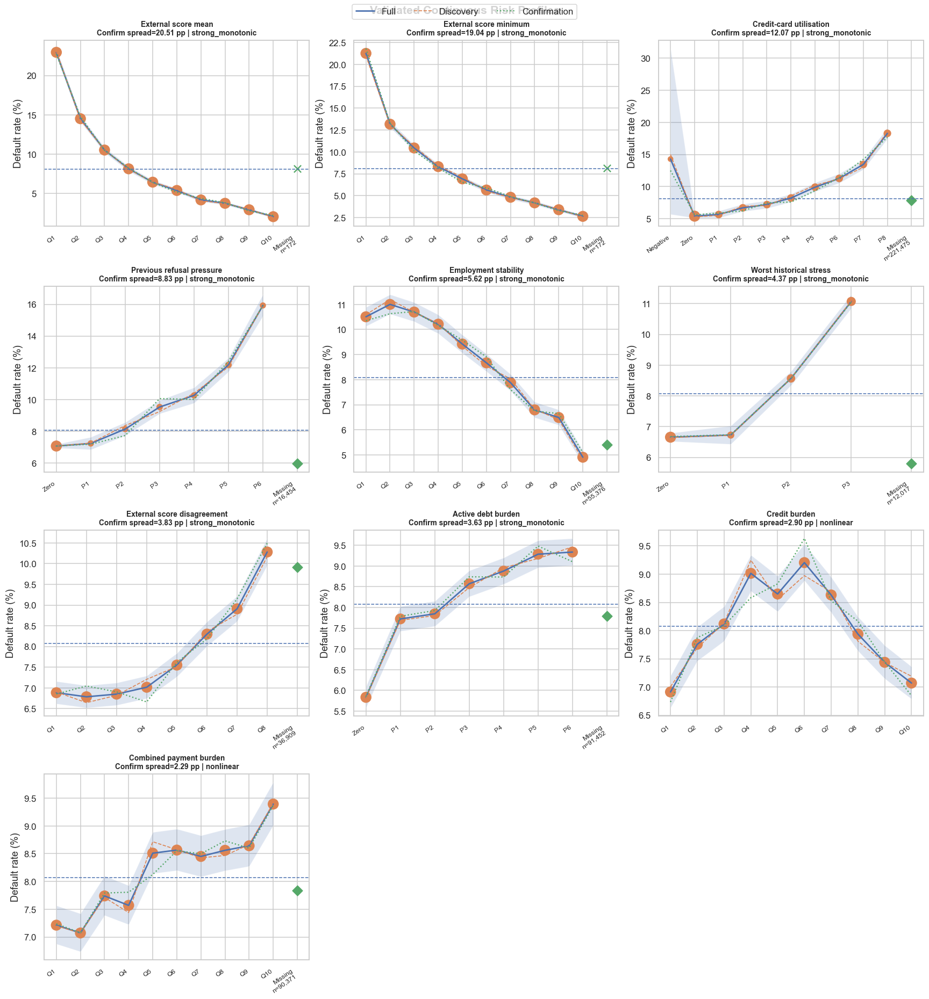

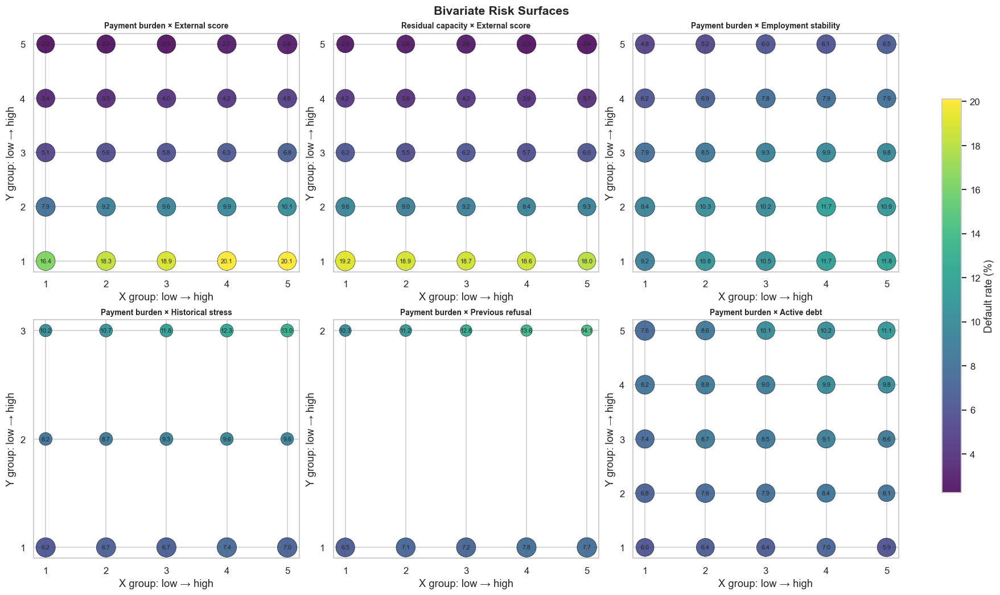

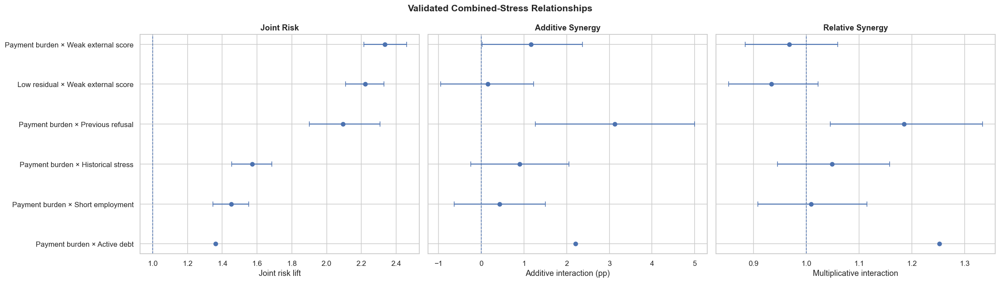

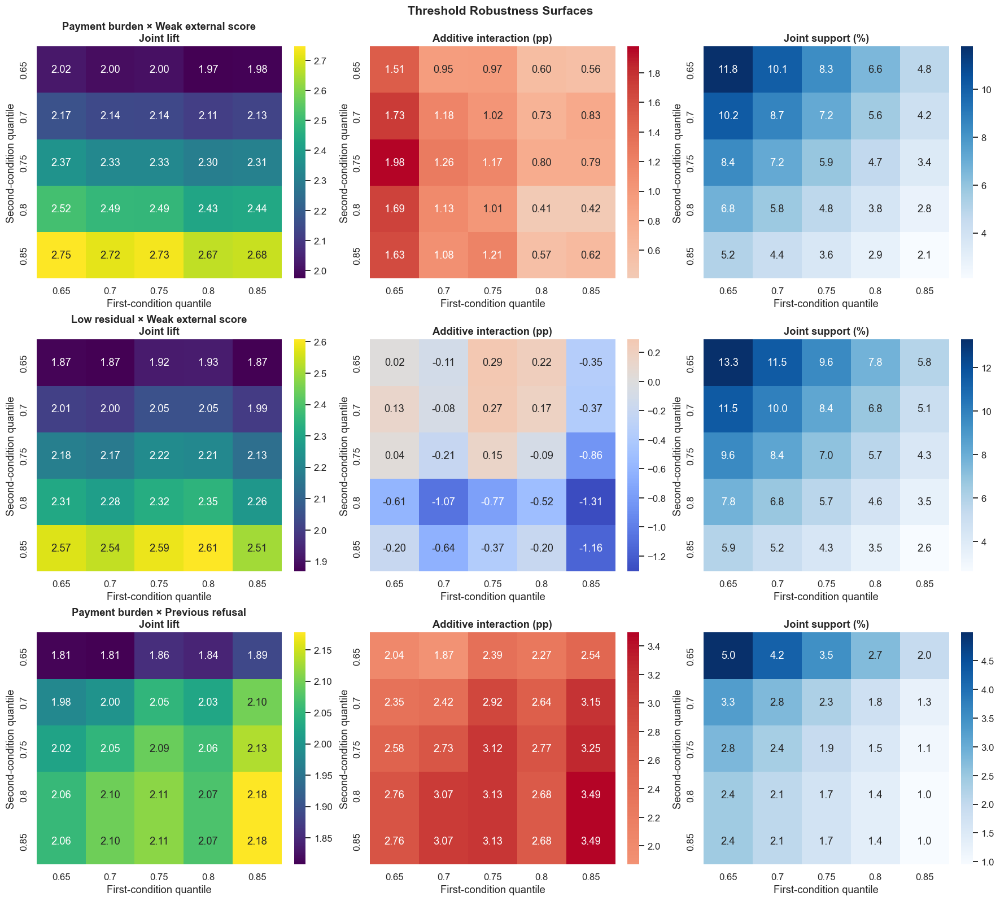

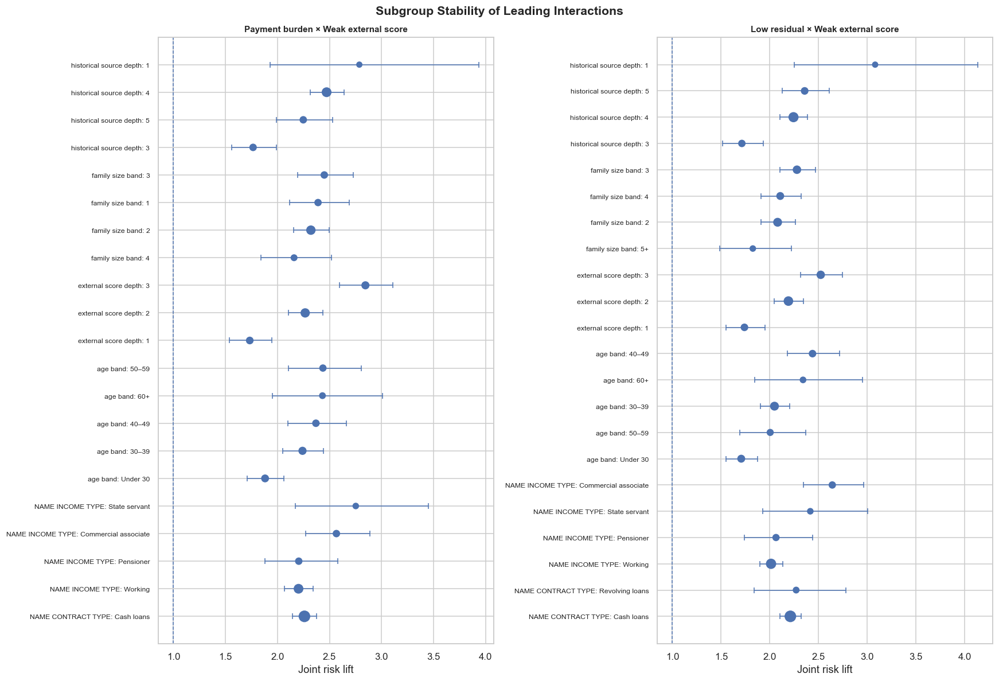

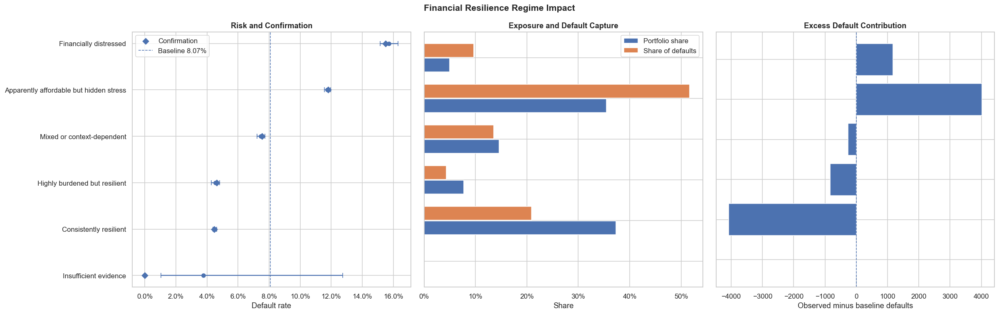

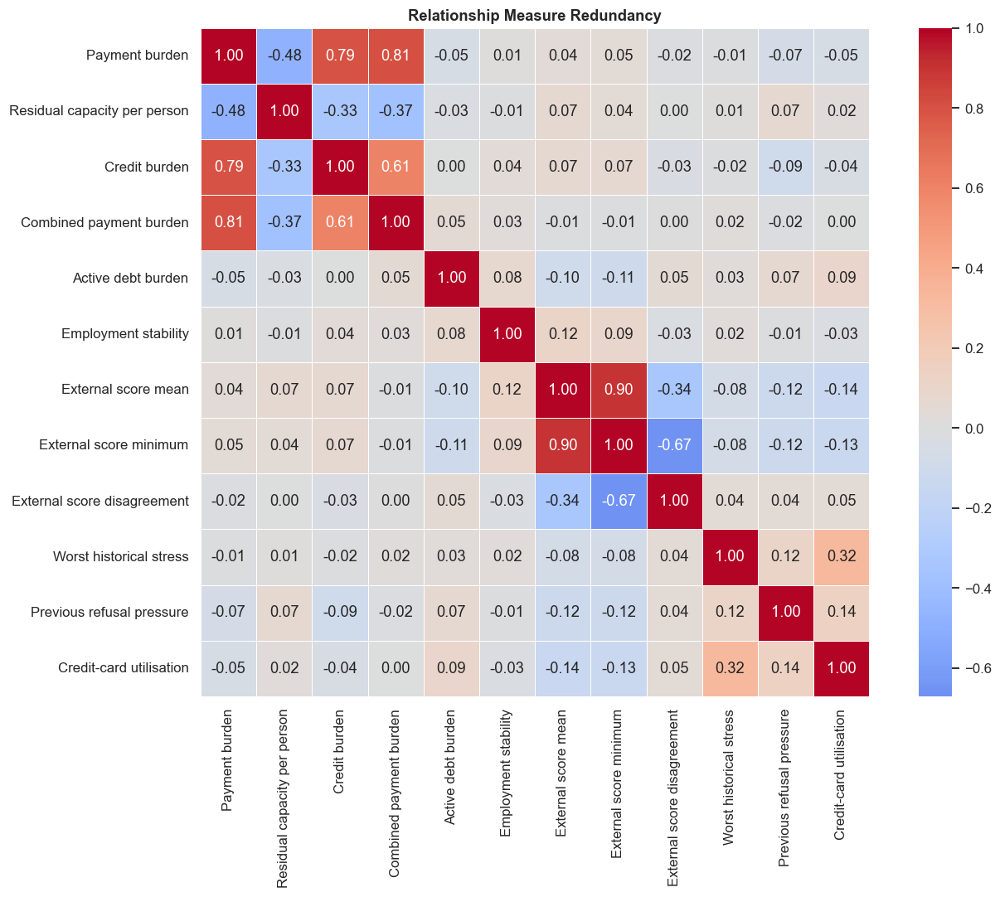

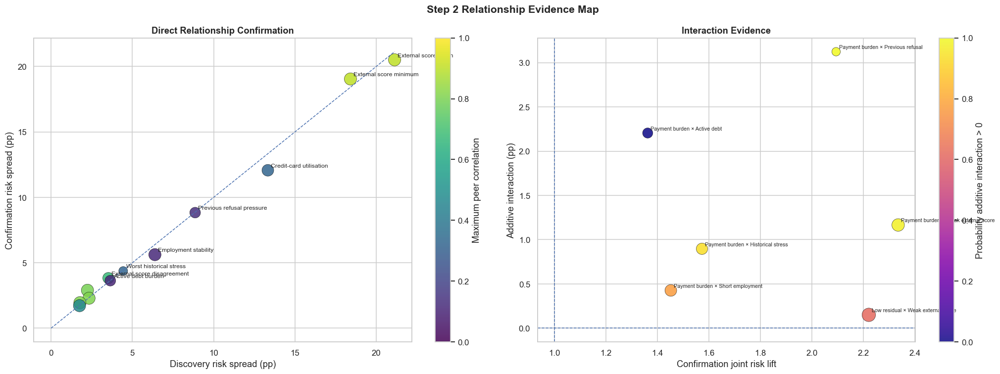

Refined Step 2 completed successfully.
Portfolio baseline: 8.07%
Discovery baseline: 8.07%
Confirmation baseline: 8.07%
Prepared applicants: 307,511
Direct measures tested: 12
Interactions tested: 6
Subgroup results: 62
Tables exported to: Relationship_report\Tables\Step_2_Financial_Resilience
Figures exported to: Relationship_report\Figures\Step_2_Financial_Resilience


,feature,label,family,strategy,non_missing_count,coverage,unique_values,p01,median,p99
0,annuity_income_ratio,Payment burden,affordability,quantile,307499,1.0000,88811,0.0395,0.1628,0.4835
1,residual_income_per_person,Residual capacity per person,capacity,quantile,307497,1.0000,95466,"11,523.3750","61,227.0000","311,472.3600"
2,credit_income_ratio,Credit burden,loan_structure,quantile,307511,1.0000,48697,0.5954,3.2651,13.0273
3,combined_annuity_income_ratio,Combined payment burden,affordability,quantile,217140,0.7061,93927,0.0400,0.1772,0.9202
4,bureau_active_debt_income_ratio,Active debt burden,existing_debt,zero_quantile,216059,0.7026,174389,0.0000,1.9139,37.8081
5,employment_age_ratio,Employment stability,stability,quantile,252135,0.8199,250063,0.0075,0.1187,0.5906
6,external_score_mean,External score mean,external_evidence,quantile,307339,0.9994,296026,0.1096,0.5245,0.7726
7,external_score_min,External score minimum,external_evidence,quantile,307339,0.9994,138984,0.0201,0.4032,0.7495
8,external_score_range,External score disagreement,external_evidence,quantile,270602,0.8800,267185,0.0052,0.2216,0.6633
9,historical_repayment_stress_max,Worst historical stress,historical_behavior,zero_quantile,295494,0.9609,1128,0.0000,0.2000,1.0000


,feature,label,family,discovery_spread,confirmation_spread,discovery_trend,confirmation_trend,trend_agreement,shape,maximum_peer_correlation,decision
0,credit_income_ratio,Credit burden,loan_structure,0.0224,0.0290,-0.0424,0.0303,False,nonlinear,0.7939,nonlinear_candidate
1,external_score_mean,External score mean,external_evidence,0.2113,0.2051,-1.0000,-1.0000,True,strong_monotonic,0.8987,review_redundancy
2,external_score_min,External score minimum,external_evidence,0.1842,0.1904,-1.0000,-1.0000,True,strong_monotonic,0.8987,review_redundancy
3,combined_annuity_income_ratio,Combined payment burden,affordability,0.0234,0.0229,0.8182,0.9636,True,nonlinear,0.8059,review_redundancy
4,annuity_income_ratio,Payment burden,affordability,0.0178,0.0195,0.8303,0.8545,True,weak_or_mixed,0.8059,review_redundancy
5,residual_income_per_person,Residual capacity per person,capacity,0.0175,0.0172,-0.9030,-0.8303,True,weak_or_mixed,0.4759,validated_contextual
6,credit_card_utilization,Credit-card utilisation,liquidity,0.1333,0.1207,1.0000,1.0000,True,strong_monotonic,0.3233,validated_primary
7,previous_refusal_ratio,Previous refusal pressure,credit_seeking,0.0886,0.0883,1.0000,0.9643,True,strong_monotonic,0.1365,validated_primary
8,employment_age_ratio,Employment stability,stability,0.0639,0.0562,-0.9636,-0.9515,True,strong_monotonic,0.1155,validated_primary
9,historical_repayment_stress_max,Worst historical stress,historical_behavior,0.0444,0.0437,1.0000,1.0000,True,strong_monotonic,0.3233,validated_primary


,pair_label,joint_applicant_count,joint_applicant_share,joint_risk_lift,joint_lift_ci_low,joint_lift_ci_high,additive_interaction,additive_ci_low,additive_ci_high,multiplicative_interaction,positive_additive_share,decision
0,Payment burden × Active debt,3557,0.0471,1.3616,NaN,NaN,0.0220,NaN,NaN,1.2520,1.0000,not_confirmed
1,Low residual × Weak external score,7564,0.0703,2.2206,2.1092,2.3303,0.0015,-0.0095,0.0123,0.9344,0.3200,validated_high_risk_context
2,Payment burden × Historical stress,4860,0.0470,1.5726,1.4553,1.6848,0.0090,-0.0025,0.0205,1.0492,1.0000,validated_high_risk_context
3,Payment burden × Short employment,5325,0.0604,1.4515,1.3468,1.5516,0.0043,-0.0064,0.0151,1.0092,1.0000,validated_high_risk_context
4,Payment burden × Weak external score,6340,0.0589,2.3347,2.2136,2.4598,0.0117,0.0002,0.0237,0.9683,1.0000,validated_interaction
5,Payment burden × Previous refusal,1982,0.0195,2.0936,1.8999,2.3061,0.0312,0.0127,0.0500,1.1852,1.0000,validated_interaction


,resilience_regime,applicant_count,default_count,default_rate,ci_low,ci_high,portfolio_share,default_contribution,risk_lift,expected_defaults_at_baseline,excess_defaults,sample
0,Financially distressed,15234,2396,0.1573,0.1516,0.1631,0.0495,0.0965,1.9482,"1,229.8228","1,166.1772",Full
1,Apparently affordable but hidden stress,108958,12814,0.1176,0.1157,0.1195,0.3543,0.5162,1.4568,"8,796.0507","4,017.9493",Full
2,Mixed or context-dependent,44887,3356,0.0748,0.0724,0.0772,0.1460,0.1352,0.9261,"3,623.6745",-267.6745,Full
3,Highly burdened but resilient,23656,1076,0.0455,0.0429,0.0482,0.0769,0.0433,0.5634,"1,909.7210",-833.7210,Full
4,Consistently resilient,114723,5181,0.0452,0.0440,0.0464,0.3731,0.2087,0.5594,"9,261.4524","-4,080.4524",Full
5,Insufficient evidence,53,2,0.0377,0.0104,0.1275,0.0002,0.0001,0.4674,4.2786,-2.2786,Full


In [8]:
step2_analyzer = FinancialResilienceAnalyzer(train_df, ID_COL, TARGET_COL, STEP2_RAW_MAP, STEP2_HISTORY_MAP, STEP2_MEASURE_SPECS, STEP2_INTERACTION_SPECS, STEP2_SURFACE_SPECS, STEP2_CONTEXT_FEATURES, STEP2_CONFIG)
step2_analyzer.run_all()
step2_plotter = FinancialResiliencePlotter(step2_analyzer, STEP2_FIGURE_DIR)
step2_plotter.plot_all()
step2_analyzer.export(STEP2_TABLE_DIR)
step2_measure_audit = step2_analyzer.results["measure_audit"]
step2_direct_evidence = step2_analyzer.results["direct_evidence"]
step2_interaction_evidence = step2_analyzer.results["interaction_evidence"]
step2_regime_evidence = step2_analyzer.results["regimes"]
step2_subgroup_evidence = step2_analyzer.results["subgroups"]
print("Refined Step 2 completed successfully.")
print(f"Portfolio baseline: {step2_analyzer.baseline:.2%}")
print(f"Discovery baseline: {step2_analyzer.discovery_baseline:.2%}")
print(f"Confirmation baseline: {step2_analyzer.confirmation_baseline:.2%}")
print(f"Prepared applicants: {len(step2_analyzer.data):,}")
print(f"Direct measures tested: {len(step2_direct_evidence):,}")
print(f"Interactions tested: {len(step2_interaction_evidence):,}")
print(f"Subgroup results: {len(step2_subgroup_evidence):,}")
print(f"Tables exported to: {STEP2_TABLE_DIR}")
print(f"Figures exported to: {STEP2_FIGURE_DIR}")
display(step2_measure_audit)
direct_columns = ["feature", "label", "family", "discovery_spread", "confirmation_spread", "discovery_trend", "confirmation_trend", "trend_agreement", "shape", "maximum_peer_correlation", "decision"]
interaction_columns = ["pair_label", "joint_applicant_count", "joint_applicant_share", "joint_risk_lift", "joint_lift_ci_low", "joint_lift_ci_high", "additive_interaction", "additive_ci_low", "additive_ci_high", "multiplicative_interaction", "positive_additive_share", "decision"]
display(step2_direct_evidence[direct_columns])
display(step2_interaction_evidence[interaction_columns])
full_regime_evidence = step2_regime_evidence.loc[step2_regime_evidence["sample"].eq("Full")].sort_values("default_rate", ascending=False).reset_index(drop=True)
display(full_regime_evidence)


## Step 2: Final Relationship Observations

### Analytical Objective

This section investigated whether current loan affordability is sufficient to explain default risk, or whether the meaning of current payment pressure changes according to external credit evidence, household capacity, employment stability, existing debt and historical financial behaviour.

The analysis separated relationship discovery from confirmation and evaluated direct risk gradients, continuous bivariate surfaces, additive and multiplicative interactions, threshold robustness, subgroup stability, portfolio regimes and feature redundancy.

---

### 1. Direct Relationship Evidence

The discovery and confirmation risk profiles were closely aligned across nearly all investigated measures. This agreement indicates that the principal relationships are not limited to the exploratory sample.

The strongest confirmed direct relationship was external credit quality.

- External-score mean produced a confirmation risk spread of approximately 20.51 percentage points.
- External-score minimum produced a confirmation spread of approximately 19.04 percentage points.
- Default risk decreased from more than 20% in the weakest score groups to approximately 2% in the strongest groups.
- The relationship remained strongly monotonic across discovery and confirmation samples.

External-score mean and minimum were highly correlated, with a Spearman correlation of approximately 0.90. External-score mean should therefore be treated as the primary representation, while the minimum score should be retained only if it provides incremental weakest-source information.

Previous-refusal pressure also produced a strong and confirmed monotonic relationship. Default risk increased from approximately 7% among applicants with no observed refusal pressure to approximately 16% among the highest-pressure group.

Employment stability was strongly protective. Default risk declined from approximately 10–11% among the least stable applicants to approximately 5% among the most stable applicants.

Worst historical repayment stress showed a confirmed adverse gradient. Applicants with high observed historical stress reached default rates of approximately 11%, compared with approximately 6.7% among applicants with no observed stress.

Active-debt burden produced a moderate but stable adverse relationship. Applicants with no active debt had substantially lower risk than applicants with positive and increasing active-debt pressure.

---

### 2. Nonlinear Relationships

Several measures should not be represented as simple linear effects.

Credit-card utilisation showed a segmented relationship:

- negative utilisation formed a distinct high-risk state;
- zero utilisation was associated with low risk;
- positive utilisation displayed a strong increasing risk gradient.

Negative utilisation should therefore be treated as a separate analytical state rather than as ordinary low utilisation.

Credit burden showed a hump-shaped relationship, with risk increasing through the middle and upper-middle quantiles before declining in the extreme upper tail.

Combined payment burden showed a threshold-and-tail pattern rather than a smooth linear increase.

External-score disagreement was relatively stable at low levels but became materially adverse in the highest disagreement groups. Disagreement should only be defined when at least two external scores are available.

---

### 3. Conditional Relationship Evidence

External credit quality was the dominant dimension in the bivariate risk surfaces.

Among applicants with weak external scores, default rates ranged from approximately 16% to 20%, depending on current payment burden. Among applicants with strong external scores, default rates remained close to 2–3%.

This indicates that external scores establish the underlying risk level, while payment burden modifies risk within that level.

Household residual capacity was protective, but its effect was modest after conditioning on external credit quality. The high risk of applicants with both low residual capacity and weak external scores was primarily driven by the weak-score main effect.

Employment stability shifted the complete payment-burden surface. Applicants with low employment stability remained materially riskier across nearly every burden group.

Historical stress and previous refusal changed the slope of payment burden. Current burden was substantially more adverse when historical stress or refusal pressure was already high.

Active debt also altered the meaning of current burden. High payment burden produced limited additional risk among applicants with low active-debt pressure but materially higher risk among applicants with high existing debt.

---

### 4. Interaction Evidence

The strongest validated interaction was:

> **Payment burden × Previous refusal pressure**

This relationship showed:

- a joint risk lift of approximately 2.1;
- the largest additive interaction contrast, approximately 3.1 percentage points;
- positive additive interaction across all tested threshold combinations;
- multiplicative interaction above one;
- and broad subgroup consistency.

Payment burden combined with weak external scores produced the highest joint risk lift, approximately 2.3. However, its multiplicative interaction was close to one, indicating that much of the joint risk was driven by the strong external-score main effect.

Low residual capacity combined with weak external scores also produced high joint risk, but its additive interaction was unstable and often negative under stricter thresholds. This combination should be interpreted as a main-effect-dominated high-risk segment rather than a validated synergistic interaction.

Payment burden combined with historical stress produced moderate joint risk and a positive but less certain additive effect.

Payment burden combined with active debt produced a promising additive point estimate, but its uncertainty requires additional validation before it is promoted to a confirmed interaction.

---

### 5. Threshold Robustness

The payment-burden and weak-external-score relationship remained strong across a broad grid of independently varied percentile thresholds. Joint risk lift increased as the weak-score definition became more extreme, while the additive interaction remained positive.

The payment-burden and previous-refusal relationship was the most robust interaction. Joint risk lift and positive additive interaction persisted across every tested threshold combination.

The low-residual and weak-score combination maintained high joint risk across thresholds, but its additive interaction did not remain consistently positive.

More extreme thresholds increased risk separation but rapidly reduced applicant support. Thresholds around the 70th–80th percentile region provided a more balanced combination of risk separation and portfolio support. These remain analytical boundaries rather than final policy cut-offs.

---

### 6. Subgroup Stability

The leading weak-external-score combinations remained above baseline across income types, contract types, age bands, household-size groups, external-score depths and historical-information depths.

The magnitude of the joint risk varied by subgroup, and sparse subgroups produced wider confidence intervals. Nevertheless, widespread directional reversal was not observed.

The subgroup analysis supports the stability of the high-risk segments. It does not by itself prove that additive interaction is stable within every subgroup.

---

### 7. Financial Resilience Regimes

The regime analysis showed that high payment burden does not universally imply high default risk.

Financially distressed applicants had the highest default rate, approximately 15.7%, but represented a relatively small portion of the portfolio.

The most operationally important segment was:

> **Apparently affordable but hidden stress**

This group represented approximately 35% of applicants but generated more than half of all observed defaults. Its default rate was approximately 11.9%, well above the 8.07% portfolio baseline.

Highly burdened but resilient applicants had a default rate close to 4.6%, similar to the consistently resilient group. This confirms that supportive external evidence, adequate residual capacity and clean historical behaviour can offset a high apparent payment burden.

The insufficient-evidence regime was too small and uncertain to support a risk conclusion. It should be treated as an information-quality state rather than a behavioural risk class.

---

### 8. Redundancy Findings

The burden-related measures contained substantial overlapping information.

- Payment burden and combined payment burden had a correlation of approximately 0.81.
- Payment burden and credit burden had a correlation of approximately 0.79.
- Credit burden and combined payment burden had a correlation of approximately 0.61.

External-score mean and minimum were also highly redundant.

Feature engineering should therefore prioritise one interpretable primary representation from each highly correlated family and retain additional measures only when they demonstrate incremental conditional or nonlinear information.

---

### Final Analytical Conclusion

Current affordability alone is not sufficient to explain applicant default risk.

External credit quality determines the applicant's underlying risk level. Previous refusal pressure, historical repayment stress, employment stability, active debt and revolving-credit utilisation determine whether current payment pressure represents manageable leverage or hidden financial distress.

The most important portfolio risk is not limited to the small group of visibly distressed applicants. A much larger group appears affordable under current application ratios but carries adverse external or historical evidence and produces the majority of observed defaults.

The strongest evidence-backed directions for the next analytical stage are:

1. external-credit strength and weakest-source evidence;
2. previous-refusal frequency, recency and support;
3. repayment-stress frequency, severity and evidence depth;
4. nonlinear credit-card utilisation states;
5. active-debt pressure and total effective burden;
6. employment stability;
7. affordability–history contradiction;
8. payment-burden interactions with refusal, external weakness, historical stress and active debt.

These findings represent validated relationship mechanisms. They are not yet final engineered features or production credit-policy rules.

# Step 3: Repayment Distress, Recovery, and Early Warning

## Distinguishing Temporary Payment Disruption from Emerging and Structural Repayment Failure

---

## Research Purpose

A previous repayment irregularity does not always indicate the same financial condition.

Some borrowers experience a temporary cash-flow interruption and subsequently return to disciplined repayment. Other borrowers show repeated delays, severe delinquency, incomplete payments, stress across several contracts, or deterioration across several credit sources. These patterns may reveal structural financial weakness before a future default occurs.

Therefore, historical repayment behaviour should not be represented by a single broad stress measure.

This analysis decomposes repayment difficulty into its underlying behavioural mechanisms and determines whether an applicant is:

- consistently disciplined;
- temporarily disrupted;
- affected by an isolated severe shock;
- repeatedly but mildly delinquent;
- unable to complete scheduled payments;
- recovering from previous financial stress;
- recently deteriorating;
- persistently distressed;
- stressed across several credit sources;
- or insufficiently observed.

---

## Main Research Question

> **Among applicants with observable repayment histories, can we distinguish harmless operational irregularities and temporary liquidity shocks from emerging or structural inability to repay? Specifically, which combinations of payment-delay frequency, delinquency severity, payment shortfall, behavioural persistence, contract and source breadth, recent deterioration or recovery, and evidence depth most reliably identify borrowers moving toward future default—without confusing sparse history with clean behaviour or isolated shocks with chronic financial distress?**

---

## Real-World Lending Problem

The analysis addresses three important lending errors.

### False Rejection

An applicant may be treated as high risk because of one isolated or old repayment problem, even though recent behaviour indicates sustained recovery.

### Hidden Acceptance Risk

An applicant may appear acceptable because lifetime repayment averages remain moderate, while recent deterioration has already begun.

### Incorrect Risk Treatment

Borrowers with temporary payment timing problems may be treated in the same way as borrowers who repeatedly fail to meet the required payment amount.

The objective is not merely to identify whether historical stress exists.

The objective is to understand:

> **what type of stress exists, how reliable the evidence is, whether it is spreading, and whether the borrower is improving or deteriorating.**

---

## Historical Data Sources

The analysis uses repayment evidence from:

| Source | Behavioural information |
|---|---|
| Installment history | Payment delay, severe lateness, underpayment, payment completeness and contract-level stress |
| POS cash history | Days past due, severe delinquency, contract breadth and recent repayment behaviour |
| Bureau balance history | Monthly delinquency frequency, severe status and recent repayment behaviour |
| Credit-card repayment history | DPD, minimum-payment failure, no-payment behaviour and contract-level stress |

Current payment burden is used only as a bridge to Step 2.

Previous application demand, refusal decomposition, credit expansion and revolving-credit utilisation will be analysed separately in the next major analysis.

---

## Analytical Framework

Historical repayment distress is represented as:

$$
\text{Repayment Distress}
=
f(
\text{Frequency},
\text{Severity},
\text{Shortfall},
\text{Persistence},
\text{Breadth},
\text{Recency},
\text{Recovery},
\text{Evidence Depth}
)
$$

---

## 1. Repayment Frequency

Repayment frequency measures how regularly repayment problems occur.

$$
\text{Late Frequency}
=
\frac{
\text{Late Repayment Observations}
}{
\text{Observed Repayment Opportunities}
}
$$

Frequent mild delays may indicate recurring liquidity pressure even when no individual event is extremely severe.

---

## 2. Delinquency Severity

Severity measures how serious the observed delinquency becomes.

Examples include:

- 15+ days late;
- 30+ days late;
- 60+ days late;
- 90+ days late;
- severe bureau-balance delinquency;
- severe POS or credit-card DPD.

A borrower with one severe delinquency may represent a different risk mechanism from a borrower with repeated minor delays.

---

## 3. Payment Shortfall

Delay and payment-capacity failure are treated separately.

$$
\text{Payment Completeness}
=
\frac{
\text{Actual Payment}
}{
\text{Scheduled Payment}
}
$$

A borrower may:

| Timing | Payment amount | Interpretation |
|---|---|---|
| On time | Complete | Disciplined repayment |
| Late | Complete | Timing or temporary liquidity problem |
| On time | Partial | Payment-capacity weakness |
| Late | Partial | Strong repayment distress |

---

## 4. Persistence

Persistence measures whether repayment problems continue through time.

$$
\text{Persistence}
=
\frac{
\text{Observed Periods with Stress}
}{
\text{Total Observed Periods}
}
$$

Persistent stress is different from an isolated event.

---

## 5. Breadth

Breadth measures whether repayment weakness is limited to one account or appears across several contracts and independent sources.

$$
\text{Affected Contract Share}
=
\frac{
\text{Contracts with Repayment Stress}
}{
\text{Observed Contracts}
}
$$

Cross-source breadth is represented by the number of independent sources showing material stress.

---

## 6. Recent Deterioration and Recovery

The analysis compares recent repayment position with the applicant's broader lifetime repayment profile.

$$
\text{Deterioration}
=
\text{Recent Stress Position}
-
\text{Lifetime Stress Position}
$$

Interpretation:

| Lifetime profile | Recent profile | Meaning |
|---|---|---|
| Low stress | Low stress | Consistently disciplined |
| High stress | Low stress | Recovered |
| Low stress | High stress | Recently deteriorating |
| High stress | High stress | Chronic stress |

> Lifetime aggregates may include recent observations. Therefore, this comparison is interpreted as a conservative relative trajectory signal rather than a pure before-versus-after causal estimate.

---

## 7. Evidence Reliability

Repayment ratios are not equally reliable when they are based on different amounts of historical evidence.

For example:

$$
100\%\text{ late from 1 observation}
\neq
30\%\text{ late from 50 observations}
$$

Evidence depth is constructed from source-specific support ranks rather than directly adding unlike quantities such as months, contracts and installment rows.

This prevents one source with a naturally larger number of records from dominating the complete evidence-depth measure.

The analysis distinguishes:

- no historical evidence;
- shallow evidence;
- moderate evidence;
- rich evidence;
- very rich evidence.

---

## Discovery and Confirmation Design

The training portfolio is separated into:

- a discovery sample;
- an independent confirmation sample.

The discovery sample is used to determine:

- distribution-based analytical boundaries;
- quantile groups;
- high-stress definitions;
- repayment-state rules.

The same definitions are then applied unchanged to the confirmation sample.

A relationship is considered stronger when:

1. discovery and confirmation directions agree;
2. risk separation remains meaningful;
3. applicant and default support are sufficient;
4. confidence intervals do not become excessively wide;
5. results are not driven entirely by sparse historical records.

---

## Main Analytical Questions

1. Does the same stress ratio carry the same meaning at different evidence depths?
2. Is frequent mild delinquency more dangerous than an isolated severe event?
3. Does incomplete payment reveal greater weakness than payment delay alone?
4. Is repayment stress isolated to one contract or persistent across several contracts and sources?
5. Does recent behaviour indicate recovery, stability or deterioration?
6. Does risk accelerate when several independent sources show the same adverse behaviour?
7. Under which repayment states does current payment burden become particularly dangerous?
8. Which repayment states create the largest share of observed portfolio defaults?

---

## Analytical Figures

The analysis produces eight complementary figures.

| Figure | Analytical purpose |
|---|---|
| Evidence Reliability Fan Chart | Tests whether repayment stress depends on evidence depth |
| Frequency–Severity Phase Portrait | Separates repeated mild stress from isolated or chronic severe distress |
| Payment Failure Marimekko | Separates timing failure from payment-capacity failure |
| Persistence and Breadth Forest | Compares isolated, repeated and systemic repayment weakness |
| Repayment Transition Flow | Shows recovery, deterioration and chronic stress transitions |
| Cross-Source Stress UpSet | Identifies which independent sources jointly indicate distress |
| Burden Amplification Curves | Shows when current payment burden becomes dangerous |
| Repayment Distress Overview Spectrum | Combines risk, portfolio impact and behavioural fingerprints |

---

## Repayment States

The final applicant-level analytical states are:

- Consistently disciplined;
- Temporary or isolated disruption;
- Recovered;
- Chronic mild stress;
- Acute severe shock;
- Recently deteriorating;
- Payment-capacity constrained;
- Chronic severe distress;
- Multi-source distressed;
- Mixed repayment profile;
- Insufficient evidence.

These states are explanatory research groups.

They are not final model labels, underwriting rules or policy cut-offs.

---

## Analytical Boundary

This section will not:

- treat missing history as clean history;
- treat one observation as equivalent to rich historical support;
- interpret association as causation;
- use target-derived production thresholds;
- automatically retain every historical aggregate;
- assume that mean, maximum, recent and lifetime representations are independent;
- finalise modelling features before redundancy and train–test stability checks.

---

## Step Completion Criteria

Step 3 is complete when the analysis can clarify:

1. whether historical stress estimates are reliable;
2. whether frequency and severity represent different risk mechanisms;
3. whether payment timing and payment capacity provide different information;
4. whether stress is isolated, persistent or systemic;
5. whether an applicant is recovering or deteriorating;
6. whether multiple sources confirm the same adverse pattern;
7. which historical conditions amplify current payment burden;
8. which repayment states are most important at the portfolio level;
9. which mechanisms should proceed to the next analytical stage.

In [9]:
import math
from pathlib import Path
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from matplotlib import cm, colors
from matplotlib.gridspec import GridSpec
from matplotlib.patches import Rectangle, PathPatch
from matplotlib.path import Path as MplPath
from matplotlib.ticker import PercentFormatter
from scipy import stats
from statsmodels.stats.proportion import proportion_confint
from sklearn.model_selection import train_test_split

class RepaymentDistressAnalyzer:
    def __init__(self, data, id_col, target_col, config=None):
        self.raw_data = data
        self.id_col = id_col
        self.target_col = target_col
        self.config = self._config(config)
        self.registry = self._registry()
        self.resolved = {}
        self.results = {}
        self.thresholds = {}
        self.data = pd.DataFrame()
        self.discovery_index = pd.Index([])
        self.confirmation_index = pd.Index([])
        self.baseline = np.nan
        self.discovery_baseline = np.nan
        self.confirmation_baseline = np.nan

    def _config(self, config):
        defaults = {"seed": 42, "discovery_fraction": 0.65, "direct_bins": 8, "depth_bins": 5, "burden_bins": 8, "surface_gridsize": 24, "min_group_count": 500, "min_default_count": 20, "stress_quantile": 0.75, "state_low_quantile": 0.40, "state_high_quantile": 0.75, "alpha": 0.05}
        if config is not None:
            defaults.update(config)
        return defaults

    def _registry(self):
        return {"income": ["AMT_INCOME_TOTAL"], "annuity": ["AMT_ANNUITY"], "inst_support": ["inst_payment_row_count_sum", "inst_payment_row_count_sum_x_sum", "inst_installment_count_sum_x"], "inst_contracts": ["inst_contract_count"], "inst_frequency": ["inst_is_late_ratio_mean", "inst_contract_with_late_ratio"], "inst_severity": ["inst_late_30plus_ratio_mean", "inst_contract_with_late_30plus_ratio", "inst_late_15plus_ratio_mean"], "inst_underpayment": ["inst_is_underpaid_ratio_mean", "inst_contract_with_underpaid_ratio"], "inst_payment_completeness": ["inst_payment_ratio_mean_mean", "inst_latest_payment_ratio_mean"], "inst_persistence": ["inst_contract_with_late_ratio"], "inst_recent": ["inst_recent_12m_late_ratio_adjusted_mean", "inst_recent_6m_late_ratio_adjusted_mean"], "inst_lifetime": ["inst_is_late_ratio_mean"], "pos_support": ["pos_month_record_count_sum", "pos_month_count_sum"], "pos_contracts": ["pos_contract_count"], "pos_frequency": ["pos_has_dpd_ratio_mean", "pos_contract_with_dpd_ratio"], "pos_severity": ["pos_dpd_30plus_ratio_mean", "pos_contract_with_dpd_30plus_ratio"], "pos_persistence": ["pos_contract_with_dpd_ratio"], "pos_recent": ["pos_recent_12m_has_dpd_ratio_mean", "pos_recent_6m_has_dpd_ratio_mean"], "pos_lifetime": ["pos_has_dpd_ratio_mean"], "bureau_support": ["bureau_bal_month_count_sum", "bureau_record_count"], "bureau_contracts": ["bureau_with_balance_count", "bureau_record_count"], "bureau_frequency": ["bureau_bal_late_ratio_mean", "bureau_latest_bal_late_ratio"], "bureau_severity": ["bureau_bal_severe_late_ratio_mean", "bureau_latest_bal_severe_late_ratio"], "bureau_persistence": ["bureau_bal_late_ratio_max", "bureau_bal_late_ratio_mean"], "bureau_recent": ["bureau_bal_recent_12m_late_ratio_mean", "bureau_bal_recent_6m_late_ratio_mean"], "bureau_lifetime": ["bureau_bal_late_ratio_mean"], "cc_support": ["cc_month_record_count_sum", "cc_month_count_sum"], "cc_contracts": ["cc_contract_count"], "cc_frequency": ["cc_has_dpd_ratio_mean", "cc_contract_with_dpd_ratio"], "cc_severity": ["cc_dpd_30plus_ratio_mean", "cc_contract_with_dpd_30plus_ratio"], "cc_shortfall": ["cc_contract_with_payment_less_than_min_ratio", "cc_no_payment_with_balance_ratio_mean"], "cc_persistence": ["cc_contract_with_dpd_ratio"], "cc_recent": ["cc_recent_12m_has_dpd_ratio_mean", "cc_recent_6m_has_dpd_ratio_mean"], "cc_lifetime": ["cc_has_dpd_ratio_mean"]}

    def _validate(self):
        missing = [column for column in [self.id_col, self.target_col] if column not in self.raw_data.columns]
        if len(missing) > 0:
            raise KeyError(f"Required columns are missing: {missing}")
        if self.raw_data[self.target_col].isna().any() or not set(self.raw_data[self.target_col].unique()).issubset({0, 1}):
            raise ValueError(f"{self.target_col} must be a complete binary target.")

    def _resolve(self):
        records = []
        for role, candidates in self.registry.items():
            feature = next((candidate for candidate in candidates if candidate in self.raw_data.columns), None)
            self.resolved[role] = feature
            records.append({"role": role, "selected_feature": feature, "available": feature is not None, "candidate_count": len(candidates)})
        self.results["feature_resolution"] = pd.DataFrame(records)

    def _split(self):
        discovery, confirmation = train_test_split(self.raw_data.index, train_size=self.config["discovery_fraction"], random_state=self.config["seed"], stratify=self.raw_data[self.target_col])
        self.discovery_index = pd.Index(discovery)
        self.confirmation_index = pd.Index(confirmation)

    def _numeric(self, role):
        feature = self.resolved.get(role)
        return pd.to_numeric(self.raw_data[feature], errors="coerce") if feature is not None else pd.Series(np.nan, index=self.raw_data.index, dtype="float64")

    def _safe_ratio(self, numerator, denominator):
        result = pd.Series(np.nan, index=numerator.index, dtype="float64")
        valid = numerator.notna() & denominator.notna() & denominator.ne(0)
        result.loc[valid] = numerator.loc[valid] / denominator.loc[valid]
        return result.replace([np.inf, -np.inf], np.nan)

    def _rank(self, series):
        reference = series.loc[self.discovery_index].dropna().sort_values().to_numpy()
        result = pd.Series(np.nan, index=series.index, dtype="float64")
        if len(reference) == 0:
            return result
        observed = series.dropna()
        result.loc[observed.index] = np.searchsorted(reference, observed.to_numpy(), side="right") / len(reference)
        return result.clip(0, 1)

    def _row_mean(self, frame):
        result = frame.mean(axis=1, skipna=True)
        result.loc[frame.notna().sum(axis=1).eq(0)] = np.nan
        return result

    def _prepare(self):
        data = pd.DataFrame(index=self.raw_data.index)
        data[self.id_col] = self.raw_data[self.id_col]
        data[self.target_col] = self.raw_data[self.target_col].astype(int)
        data["current_payment_burden"] = self._safe_ratio(self._numeric("annuity").where(lambda values: values.gt(0)), self._numeric("income").where(lambda values: values.gt(0)))
        for source in ["inst", "pos", "bureau", "cc"]:
            support = self._numeric(f"{source}_support").clip(lower=0)
            contracts = self._numeric(f"{source}_contracts").clip(lower=0)
            frequency = self._numeric(f"{source}_frequency").clip(lower=0)
            severity = self._numeric(f"{source}_severity").clip(lower=0)
            persistence = self._numeric(f"{source}_persistence").clip(lower=0)
            recent = self._numeric(f"{source}_recent").clip(lower=0)
            lifetime = self._numeric(f"{source}_lifetime").clip(lower=0)
            available = support.gt(0) | contracts.gt(0) | pd.concat([frequency, severity, persistence, recent, lifetime], axis=1).notna().any(axis=1)
            data[f"{source}_support"] = support
            data[f"{source}_support_rank"] = self._rank(support)
            data[f"{source}_contracts"] = contracts
            data[f"{source}_frequency"] = frequency
            data[f"{source}_severity"] = severity
            data[f"{source}_persistence"] = persistence
            data[f"{source}_recent"] = recent
            data[f"{source}_lifetime"] = lifetime
            data[f"{source}_recent_rank"] = self._rank(recent)
            data[f"{source}_lifetime_rank"] = self._rank(lifetime)
            data[f"{source}_available"] = available.astype("Int8")
            components = pd.DataFrame({"frequency": self._rank(frequency), "severity": self._rank(severity), "persistence": self._rank(persistence)}, index=data.index)
            if source == "inst":
                data["inst_underpayment"] = self._numeric("inst_underpayment").clip(lower=0)
                data["inst_payment_completeness"] = self._numeric("inst_payment_completeness")
                components["shortfall"] = self._rank(data["inst_underpayment"])
            if source == "cc":
                data["cc_shortfall"] = self._numeric("cc_shortfall").clip(lower=0)
                components["shortfall"] = self._rank(data["cc_shortfall"])
            data[f"{source}_stress_score"] = self._row_mean(components)
        data["repayment_frequency"] = self._row_mean(data[["inst_frequency", "pos_frequency", "bureau_frequency", "cc_frequency"]])
        data["repayment_severity"] = self._row_mean(data[["inst_severity", "pos_severity", "bureau_severity", "cc_severity"]])
        data["payment_shortfall"] = self._row_mean(data[["inst_underpayment", "cc_shortfall"]])
        data["repayment_persistence"] = self._row_mean(data[["inst_persistence", "pos_persistence", "bureau_persistence", "cc_persistence"]])
        data["recent_stress"] = self._row_mean(data[["inst_recent_rank", "pos_recent_rank", "bureau_recent_rank", "cc_recent_rank"]])
        data["lifetime_stress"] = self._row_mean(data[["inst_lifetime_rank", "pos_lifetime_rank", "bureau_lifetime_rank", "cc_lifetime_rank"]])
        data["stress_deterioration"] = data["recent_stress"] - data["lifetime_stress"]
        data["repayment_source_count"] = data[["inst_available", "pos_available", "bureau_available", "cc_available"]].sum(axis=1)
        data["repayment_observation_count"] = data[["inst_support", "pos_support", "bureau_support", "cc_support"]].fillna(0).sum(axis=1)
        data["repayment_evidence_depth"] = self._row_mean(data[["inst_support_rank", "pos_support_rank", "bureau_support_rank", "cc_support_rank"]])
        data["repayment_breadth"] = data[["inst_persistence", "pos_persistence", "bureau_persistence", "cc_persistence"]].max(axis=1, skipna=True)
        self.data = data.replace([np.inf, -np.inf], np.nan)
        self.baseline = self.data[self.target_col].mean()
        self.discovery_baseline = self.data.loc[self.discovery_index, self.target_col].mean()
        self.confirmation_baseline = self.data.loc[self.confirmation_index, self.target_col].mean()

    def _threshold(self, feature, quantile, positive_only=False):
        values = self.data.loc[self.discovery_index, feature].dropna()
        values = values.loc[values.gt(0)] if positive_only else values
        return values.quantile(quantile) if len(values) > 0 else np.nan

    def _edges(self, feature, bins):
        values = self.data.loc[self.discovery_index, feature].dropna()
        if values.nunique() < 2:
            return np.array([])
        edges = np.unique(values.quantile(np.linspace(0, 1, bins + 1)).to_numpy())
        if len(edges) < 2:
            return np.array([])
        edges[0] = -np.inf
        edges[-1] = np.inf
        return edges

    def _groups(self, series, edges, prefix):
        result = pd.Series(pd.NA, index=series.index, dtype="object")
        if len(edges) < 2:
            return result
        labels = [f"{prefix}{index + 1}" for index in range(len(edges) - 1)]
        result.loc[series.notna()] = pd.cut(series.loc[series.notna()], bins=edges, labels=labels, include_lowest=True, duplicates="drop").astype(str)
        return result

    def _fit_thresholds(self):
        positive_features = ["repayment_frequency", "repayment_severity", "payment_shortfall", "repayment_persistence", "repayment_breadth"]
        for feature in positive_features + ["recent_stress", "lifetime_stress"]:
            self.thresholds[f"{feature}_low"] = self._threshold(feature, self.config["state_low_quantile"])
            self.thresholds[f"{feature}_high"] = self._threshold(feature, self.config["state_high_quantile"], positive_only=feature in positive_features)
        self.thresholds["depth_edges"] = self._edges("repayment_evidence_depth", self.config["depth_bins"])
        self.thresholds["burden_edges"] = self._edges("current_payment_burden", self.config["burden_bins"])
        for source in ["inst", "pos", "bureau", "cc"]:
            self.thresholds[f"{source}_stress_high"] = self._threshold(f"{source}_stress_score", self.config["stress_quantile"], positive_only=True)

    def _build_states(self):
        data = self.data
        for source in ["inst", "pos", "bureau", "cc"]:
            observed = data[f"{source}_stress_score"].notna() & data[f"{source}_available"].eq(1)
            flag = pd.Series(pd.NA, index=data.index, dtype="Int8")
            flag.loc[observed] = 0
            threshold = self.thresholds[f"{source}_stress_high"]
            if pd.notna(threshold):
                flag.loc[observed & data[f"{source}_stress_score"].ge(threshold)] = 1
            data[f"{source}_stressed"] = flag
        data["stressed_source_count"] = data[["inst_stressed", "pos_stressed", "bureau_stressed", "cc_stressed"]].fillna(0).sum(axis=1).astype("Int8")
        frequency_high = data["repayment_frequency"].ge(self.thresholds["repayment_frequency_high"])
        severity_high = data["repayment_severity"].ge(self.thresholds["repayment_severity_high"])
        shortfall_high = data["payment_shortfall"].ge(self.thresholds["payment_shortfall_high"])
        persistence_high = data["repayment_persistence"].ge(self.thresholds["repayment_persistence_high"])
        recent_high = data["recent_stress"].ge(self.thresholds["recent_stress_high"])
        lifetime_high = data["lifetime_stress"].ge(self.thresholds["lifetime_stress_high"])
        recent_low = data["recent_stress"].le(self.thresholds["recent_stress_low"])
        lifetime_low = data["lifetime_stress"].le(self.thresholds["lifetime_stress_low"])
        sufficient = data["repayment_source_count"].gt(0) & data["repayment_observation_count"].gt(0)
        data["frequency_state"] = np.select([~sufficient, frequency_high & severity_high, frequency_high & ~severity_high, ~frequency_high & severity_high], ["Insufficient evidence", "Chronic severe distress", "Chronic mild stress", "Acute severe shock"], default="Occasional minor issue")
        timing_high = data["inst_frequency"].ge(self._threshold("inst_frequency", self.config["stress_quantile"], positive_only=True))
        amount_high = data["inst_underpayment"].ge(self._threshold("inst_underpayment", self.config["stress_quantile"], positive_only=True))
        installment_observed = data["inst_available"].eq(1) & data["inst_frequency"].notna() & data["inst_underpayment"].notna()
        data["payment_failure_state"] = np.select([~installment_observed, timing_high & amount_high, timing_high & ~amount_high, ~timing_high & amount_high], ["Insufficient installment evidence", "Late and partial", "Late but complete", "On-time but partial"], default="On-time and complete")
        data["persistence_breadth_state"] = np.select([~sufficient, persistence_high & data["stressed_source_count"].ge(2), persistence_high & data["stressed_source_count"].le(1), ~persistence_high & data["stressed_source_count"].ge(2), data["stressed_source_count"].eq(1)], ["Insufficient evidence", "Systemic persistent stress", "Persistent single-source stress", "Multi-source episodic stress", "Isolated source stress"], default="No material stress")
        data["historical_state"] = np.select([~sufficient | data["lifetime_stress"].isna(), lifetime_high, lifetime_low], ["Insufficient", "High historical stress", "Low historical stress"], default="Moderate historical stress")
        data["recent_state"] = np.select([~sufficient | data["recent_stress"].isna(), recent_high, recent_low], ["Insufficient", "High recent stress", "Low recent stress"], default="Moderate recent stress")
        combination = pd.Series("", index=data.index, dtype="object")
        for source, label in [("inst", "Installment"), ("pos", "POS"), ("bureau", "Bureau"), ("cc", "Card")]:
            combination = combination + np.where(data[f"{source}_stressed"].eq(1).fillna(False), label + " + ", "")
        data["source_combination"] = combination.str.rstrip(" +").replace("", "None")
        data["repayment_state"] = np.select([~sufficient, data["stressed_source_count"].ge(3), frequency_high & severity_high & persistence_high, lifetime_low & recent_high, shortfall_high, ~frequency_high & severity_high, frequency_high & ~severity_high, lifetime_high & recent_low, data["stressed_source_count"].eq(1), data["stressed_source_count"].eq(0) & lifetime_low & recent_low], ["Insufficient evidence", "Multi-source distressed", "Chronic severe distress", "Recently deteriorating", "Payment-capacity constrained", "Acute severe shock", "Chronic mild stress", "Recovered", "Temporary or isolated disruption", "Consistently disciplined"], default="Mixed repayment profile")
        self.data = data

    def _sample_mask(self, sample):
        if sample == "Discovery":
            return self.data.index.isin(self.discovery_index)
        if sample == "Confirmation":
            return self.data.index.isin(self.confirmation_index)
        return np.ones(len(self.data), dtype=bool)

    def _risk_table(self, group_columns, sample, eligible=None):
        group_columns = [group_columns] if isinstance(group_columns, str) else group_columns
        mask = self._sample_mask(sample)
        mask = mask if eligible is None else mask & eligible
        working = self.data.loc[mask, group_columns + [self.target_col]].dropna().copy()
        if len(working) == 0:
            return pd.DataFrame()
        baseline = working[self.target_col].mean()
        table = working.groupby(group_columns, observed=True).agg(applicant_count=(self.target_col, "size"), default_count=(self.target_col, "sum")).reset_index()
        bounds = proportion_confint(table["default_count"], table["applicant_count"], alpha=self.config["alpha"], method="wilson")
        table["default_rate"] = table["default_count"] / table["applicant_count"]
        table["ci_low"] = bounds[0]
        table["ci_high"] = bounds[1]
        table["risk_lift"] = table["default_rate"] / baseline if baseline > 0 else np.nan
        table["portfolio_share"] = table["applicant_count"] / len(working)
        total_defaults = working[self.target_col].sum()
        table["default_contribution"] = table["default_count"] / total_defaults if total_defaults > 0 else np.nan
        table["support_ok"] = table["applicant_count"].ge(self.config["min_group_count"]) & table["default_count"].ge(self.config["min_default_count"])
        table["eligible_baseline"] = baseline
        table["sample"] = sample
        return table

    def _sampled_tables(self, group_columns, eligible=None):
        tables = [self._risk_table(group_columns, sample, eligible) for sample in ["Discovery", "Confirmation", "Full"]]
        tables = [table for table in tables if len(table) > 0]
        return pd.concat(tables, ignore_index=True) if len(tables) > 0 else pd.DataFrame()

    def _audit(self):
        records = []
        for role, feature in self.resolved.items():
            series = pd.to_numeric(self.raw_data[feature], errors="coerce") if feature is not None else pd.Series(dtype="float64")
            records.append({"role": role, "feature": feature, "coverage": series.notna().mean() if feature is not None else 0.0, "non_missing": series.notna().sum() if feature is not None else 0, "unique_values": series.nunique(dropna=True) if feature is not None else 0, "status": "available" if feature is not None else "missing"})
        self.results["feature_audit"] = pd.DataFrame(records)

    def _reliability(self):
        self.data["evidence_depth_group"] = self._groups(self.data["repayment_evidence_depth"], self.thresholds["depth_edges"], "D")
        self.data.loc[self.data["repayment_source_count"].eq(0), "evidence_depth_group"] = "No history"
        frequency = self.data["repayment_frequency"]
        self.data["stress_level"] = np.select([frequency.isna(), frequency.eq(0), frequency.le(self.thresholds["repayment_frequency_low"]), frequency.ge(self.thresholds["repayment_frequency_high"])], ["Unknown", "No observed stress", "Mild stress", "Severe stress"], default="Moderate stress")
        self.results["reliability"] = self._sampled_tables(["evidence_depth_group", "stress_level"])

    def _transitions(self):
        self.results["transitions"] = self._sampled_tables(["historical_state", "recent_state"], self.data["repayment_source_count"].gt(0))

    def _burden(self):
        self.data["burden_group"] = self._groups(self.data["current_payment_burden"], self.thresholds["burden_edges"], "B")
        selected = ["Consistently disciplined", "Temporary or isolated disruption", "Recovered", "Recently deteriorating", "Chronic severe distress", "Multi-source distressed"]
        self.results["burden_amplification"] = self._sampled_tables(["burden_group", "repayment_state"], self.data["repayment_state"].isin(selected))

    def _state_outputs(self):
        self.results["repayment_states"] = self._sampled_tables("repayment_state")
        mechanisms = ["repayment_frequency", "repayment_severity", "payment_shortfall", "repayment_persistence", "stressed_source_count", "stress_deterioration", "repayment_evidence_depth"]
        signature = self.data.groupby("repayment_state", observed=True)[mechanisms].median().reset_index()
        for feature in mechanisms:
            minimum = signature[feature].min()
            maximum = signature[feature].max()
            signature[feature] = (signature[feature] - minimum) / (maximum - minimum) if maximum > minimum else 0.0
        self.results["state_signature"] = signature

    def _mechanism_profiles(self):
        labels = {"repayment_frequency": "Late frequency", "repayment_severity": "Delinquency severity", "payment_shortfall": "Payment shortfall", "repayment_persistence": "Persistence", "stress_deterioration": "Recent deterioration", "stressed_source_count": "Stressed-source count", "repayment_evidence_depth": "Evidence depth"}
        profiles = []
        evidence = []
        for feature, label in labels.items():
            group_column = f"{feature}_group"
            self.data[group_column] = self._groups(self.data[feature], self._edges(feature, self.config["direct_bins"]), "Q")
            sample_stats = {}
            for sample in ["Discovery", "Confirmation", "Full"]:
                table = self._risk_table(group_column, sample, self.data[feature].notna())
                if len(table) == 0:
                    continue
                table["feature"] = feature
                table["label"] = label
                table["group_order"] = table[group_column].str.extract(r"(\d+)").astype(float)
                table = table.rename(columns={group_column: "group"})
                profiles.append(table)
                ordered = table.sort_values("group_order")
                sample_stats[sample] = {"spread": ordered["default_rate"].max() - ordered["default_rate"].min(), "trend": stats.spearmanr(ordered["group_order"], ordered["default_rate"]).statistic if len(ordered) >= 3 else np.nan}
            evidence.append({"feature": feature, "label": label, "discovery_spread": sample_stats.get("Discovery", {}).get("spread", np.nan), "confirmation_spread": sample_stats.get("Confirmation", {}).get("spread", np.nan), "discovery_trend": sample_stats.get("Discovery", {}).get("trend", np.nan), "confirmation_trend": sample_stats.get("Confirmation", {}).get("trend", np.nan)})
        evidence = pd.DataFrame(evidence)
        evidence["direction_agreement"] = np.sign(evidence["discovery_trend"]) == np.sign(evidence["confirmation_trend"])
        evidence["decision"] = np.select([evidence["confirmation_spread"].ge(0.03) & evidence["direction_agreement"], evidence["confirmation_spread"].ge(0.015) & evidence["direction_agreement"], ~evidence["direction_agreement"]], ["validated_primary", "validated_contextual", "not_confirmed"], default="exploratory")
        self.results["direct_profiles"] = pd.concat(profiles, ignore_index=True) if len(profiles) > 0 else pd.DataFrame()
        self.results["evidence_register"] = evidence

    def run_all(self):
        self._validate()
        self._resolve()
        self._split()
        self._prepare()
        self._fit_thresholds()
        self._build_states()
        self._audit()
        self._reliability()
        self.results["frequency_severity"] = self._sampled_tables("frequency_state", self.data["repayment_source_count"].gt(0))
        self.results["payment_failure"] = self._sampled_tables("payment_failure_state", self.data["inst_available"].eq(1))
        self.results["persistence_breadth"] = self._sampled_tables("persistence_breadth_state", self.data["repayment_source_count"].gt(0))
        self._transitions()
        self.results["source_consensus"] = self._sampled_tables("source_combination", self.data["repayment_source_count"].gt(0))
        self.results["source_count_risk"] = self._sampled_tables("stressed_source_count", self.data["repayment_source_count"].gt(0))
        self._burden()
        self._state_outputs()
        self._mechanism_profiles()
        return self

    def export(self, table_dir):
        table_dir = Path(table_dir)
        table_dir.mkdir(parents=True, exist_ok=True)
        for name, table in self.results.items():
            if isinstance(table, pd.DataFrame):
                table.to_csv(table_dir / f"step3_{name}.csv", index=False, encoding="utf-8-sig")

### Define Repayment Plotting Engine

In [10]:
class RepaymentDistressPlotter:
    def __init__(self, analyzer, figure_dir):
        self.analyzer = analyzer
        self.figure_dir = Path(figure_dir)
        self.figure_dir.mkdir(parents=True, exist_ok=True)
        self.state_order = ["Consistently disciplined", "Temporary or isolated disruption", "Recovered", "Chronic mild stress", "Acute severe shock", "Recently deteriorating", "Payment-capacity constrained", "Chronic severe distress", "Multi-source distressed", "Mixed repayment profile", "Insufficient evidence"]

    def _save_show(self, figure, filename):
        figure.savefig(self.figure_dir / filename, dpi=180, bbox_inches="tight")
        plt.show()

    def plot_evidence_reliability(self):
        table = self.analyzer.results["reliability"].copy()
        if len(table) == 0:
            return
        full = table.loc[table["sample"].eq("Full")].copy()
        confirmation = table.loc[table["sample"].eq("Confirmation")].copy()
        depth_order = [value for value in ["No history", "D1", "D2", "D3", "D4", "D5"] if value in table["evidence_depth_group"].unique()]
        stress_order = [value for value in ["No observed stress", "Mild stress", "Moderate stress", "Severe stress", "Unknown"] if value in table["stress_level"].unique()]
        figure, axes = plt.subplots(1, 2, figsize=(18, 6.5), constrained_layout=True)
        depth_map = {label: index for index, label in enumerate(depth_order)}
        for stress_level in stress_order:
            subset = full.loc[full["stress_level"].eq(stress_level)].copy()
            subset["depth_order"] = subset["evidence_depth_group"].map(depth_map)
            subset = subset.sort_values("depth_order")
            axes[0].plot(subset["depth_order"], subset["risk_lift"], marker="o", label=stress_level)
            axes[0].fill_between(subset["depth_order"], subset["ci_low"] / subset["eligible_baseline"], subset["ci_high"] / subset["eligible_baseline"], alpha=0.12)
            confirm = confirmation.loc[confirmation["stress_level"].eq(stress_level)].copy()
            confirm["depth_order"] = confirm["evidence_depth_group"].map(depth_map)
            axes[0].scatter(confirm["depth_order"], confirm["risk_lift"], marker="D", s=45)
        axes[0].axhline(1, linestyle="--", linewidth=1)
        axes[0].set_xticks(range(len(depth_order)))
        axes[0].set_xticklabels(depth_order)
        axes[0].set_xlabel("Evidence depth: low → high")
        axes[0].set_ylabel("Risk lift")
        axes[0].set_title("Stress Risk by Evidence Depth")
        axes[0].legend(fontsize=8)
        support = full.pivot(index="stress_level", columns="evidence_depth_group", values="applicant_count").reindex(index=stress_order, columns=depth_order)
        image = axes[1].imshow(np.log1p(support.fillna(0).to_numpy()), aspect="auto", cmap="Blues")
        axes[1].set_xticks(range(len(depth_order)))
        axes[1].set_xticklabels(depth_order)
        axes[1].set_yticks(range(len(stress_order)))
        axes[1].set_yticklabels(stress_order)
        axes[1].set_title("Evidence Support (log scale)")
        for row in range(len(stress_order)):
            for column in range(len(depth_order)):
                value = support.iloc[row, column]
                if pd.notna(value):
                    axes[1].text(column, row, f"{int(value):,}", ha="center", va="center", fontsize=8)
        figure.colorbar(image, ax=axes[1], shrink=0.8, label="log(1 + applicants)")
        figure.suptitle("Evidence Reliability Fan Chart", fontsize=14, fontweight="bold")
        self._save_show(figure, "step3_evidence_reliability.png")

    def plot_frequency_severity_phase(self):
        data = self.analyzer.data.dropna(subset=["repayment_frequency", "repayment_severity", self.analyzer.target_col]).copy()
        if len(data) == 0:
            return
        figure, axes = plt.subplots(1, 2, figsize=(17, 7), constrained_layout=True)
        samples = [("Full", np.ones(len(data), dtype=bool)), ("Confirmation", data.index.isin(self.analyzer.confirmation_index))]
        objects = []
        for index, sample in enumerate(samples):
            sample_data = data.loc[sample[1]].copy()
            minimum = max(1, int(self.analyzer.config["min_group_count"] / 10))
            object_ = axes[index].hexbin(sample_data["repayment_frequency"], sample_data["repayment_severity"], C=sample_data[self.analyzer.target_col], reduce_C_function=np.mean, gridsize=self.analyzer.config["surface_gridsize"], mincnt=minimum, cmap="magma", vmin=0, vmax=max(0.15, sample_data[self.analyzer.target_col].mean() * 2.5))
            objects.append(object_)
            axes[index].axvline(self.analyzer.thresholds["repayment_frequency_high"], linestyle="--", linewidth=1)
            axes[index].axhline(self.analyzer.thresholds["repayment_severity_high"], linestyle="--", linewidth=1)
            axes[index].set_xlabel("Late-payment frequency")
            axes[index].set_ylabel("Delinquency severity")
            axes[index].set_title(sample[0])
        figure.colorbar(objects[0], ax=axes.tolist(), shrink=0.8, label="Default rate")
        figure.suptitle("Frequency–Severity Phase Portrait", fontsize=14, fontweight="bold")
        self._save_show(figure, "step3_frequency_severity_phase.png")

    def plot_payment_failure_mosaic(self):
        table = self.analyzer.results["payment_failure"].copy()
        full = table.loc[table["sample"].eq("Full")].copy()
        confirmation = table.loc[table["sample"].eq("Confirmation")][["payment_failure_state", "default_rate"]].rename(columns={"default_rate": "confirmation_rate"})
        full = full.merge(confirmation, on="payment_failure_state", how="left")
        order = ["On-time and complete", "Late but complete", "On-time but partial", "Late and partial", "Insufficient installment evidence"]
        full = full.set_index("payment_failure_state").reindex(order).dropna(subset=["applicant_count"]).reset_index()
        if len(full) == 0:
            return
        norm = colors.Normalize(vmin=full["default_rate"].min(), vmax=full["default_rate"].max())
        cmap = cm.get_cmap("Reds")
        figure, axis = plt.subplots(figsize=(14, 6.5))
        total = full["applicant_count"].sum()
        start = 0.0
        for row in full.index:
            width = full.loc[row, "applicant_count"] / total
            axis.add_patch(Rectangle((start, 0), width, 1, facecolor=cmap(norm(full.loc[row, "default_rate"])), edgecolor="white", linewidth=2))
            label = f"{full.loc[row, 'payment_failure_state']}\nFull: {full.loc[row, 'default_rate']:.2%}\nConfirm: {full.loc[row, 'confirmation_rate']:.2%}\nn={int(full.loc[row, 'applicant_count']):,}"
            axis.text(start + width / 2, 0.5, label, ha="center", va="center", fontsize=9, wrap=True)
            start += width
        axis.set_xlim(0, 1)
        axis.set_ylim(0, 1)
        axis.set_xticks([])
        axis.set_yticks([])
        axis.set_title("Payment Failure Marimekko: Timing versus Amount Capacity", fontsize=14, fontweight="bold")
        figure.colorbar(cm.ScalarMappable(norm=norm, cmap=cmap), ax=axis, shrink=0.8, label="Default rate")
        self._save_show(figure, "step3_payment_failure_mosaic.png")

    def plot_persistence_breadth_forest(self):
        table = self.analyzer.results["persistence_breadth"].copy()
        full = table.loc[table["sample"].eq("Full")].copy()
        confirmation = table.loc[table["sample"].eq("Confirmation")][["persistence_breadth_state", "risk_lift"]].rename(columns={"risk_lift": "confirmation_lift"})
        full = full.merge(confirmation, on="persistence_breadth_state", how="left").sort_values("risk_lift").reset_index(drop=True)
        if len(full) == 0:
            return
        positions = np.arange(len(full))
        lower = (full["risk_lift"] - full["ci_low"] / full["eligible_baseline"]).clip(lower=0).fillna(0)
        upper = (full["ci_high"] / full["eligible_baseline"] - full["risk_lift"]).clip(lower=0).fillna(0)
        figure, axis = plt.subplots(figsize=(12, max(6, len(full) * 0.9)))
        axis.errorbar(full["risk_lift"], positions, xerr=np.vstack([lower, upper]), fmt="o", capsize=4)
        axis.scatter(full["confirmation_lift"], positions, marker="D", s=55, label="Confirmation")
        axis.axvline(1, linestyle="--", linewidth=1)
        axis.set_yticks(positions)
        axis.set_yticklabels(full["persistence_breadth_state"])
        axis.set_xlabel("Risk lift")
        axis.set_title("Persistence and Breadth Forest", fontsize=14, fontweight="bold")
        axis.legend()
        for row in full.index:
            axis.text(full.loc[row, "ci_high"] / full.loc[row, "eligible_baseline"] + 0.03, row, f"n={int(full.loc[row, 'applicant_count']):,}", va="center", fontsize=8)
        self._save_show(figure, "step3_persistence_breadth_forest.png")

    def plot_repayment_transition_flow(self):
        full = self.analyzer.results["transitions"].loc[lambda table: table["sample"].eq("Full") & table["applicant_count"].gt(0)].copy()
        if len(full) == 0:
            return
        left_order = [value for value in ["Low historical stress", "Moderate historical stress", "High historical stress", "Insufficient"] if value in full["historical_state"].unique()]
        right_order = [value for value in ["Low recent stress", "Moderate recent stress", "High recent stress", "Insufficient"] if value in full["recent_state"].unique()]
        left_positions = {state: index for index, state in enumerate(left_order)}
        right_positions = {state: index for index, state in enumerate(right_order)}
        norm = colors.Normalize(vmin=full["default_rate"].min(), vmax=full["default_rate"].max())
        cmap = cm.get_cmap("plasma")
        figure, axis = plt.subplots(figsize=(15, 8))
        maximum = full["applicant_count"].max()
        for row in full.index:
            left_state = full.loc[row, "historical_state"]
            right_state = full.loc[row, "recent_state"]
            if left_state not in left_positions or right_state not in right_positions:
                continue
            path = MplPath([(0, left_positions[left_state]), (0.35, left_positions[left_state]), (0.65, right_positions[right_state]), (1, right_positions[right_state])], [MplPath.MOVETO, MplPath.CURVE4, MplPath.CURVE4, MplPath.CURVE4])
            axis.add_patch(PathPatch(path, facecolor="none", edgecolor=cmap(norm(full.loc[row, "default_rate"])), linewidth=1 + 18 * full.loc[row, "applicant_count"] / maximum, alpha=0.65))
        for state, position in left_positions.items():
            axis.scatter([0], [position], s=260, marker="s")
            axis.text(-0.03, position, state, ha="right", va="center", fontsize=10)
        for state, position in right_positions.items():
            axis.scatter([1], [position], s=260, marker="s")
            axis.text(1.03, position, state, ha="left", va="center", fontsize=10)
        axis.set_xlim(-0.25, 1.25)
        axis.set_ylim(-0.7, max(len(left_order), len(right_order)) - 0.3)
        axis.set_xticks([0, 1])
        axis.set_xticklabels(["Historical profile", "Recent profile"])
        axis.set_yticks([])
        axis.set_title("Repayment Transition Flow", fontsize=14, fontweight="bold")
        figure.colorbar(cm.ScalarMappable(norm=norm, cmap=cmap), ax=axis, shrink=0.8, label="Default rate")
        self._save_show(figure, "step3_repayment_transition_flow.png")

    def plot_source_consensus_upset(self, maximum_combinations=12):
        full = self.analyzer.results["source_consensus"].loc[lambda table: table["sample"].eq("Full") & table["source_combination"].ne("None")].sort_values("applicant_count", ascending=False).head(maximum_combinations).copy()
        if len(full) == 0:
            return
        sources = ["Installment", "POS", "Bureau", "Card"]
        figure = plt.figure(figsize=(17, 9), constrained_layout=True)
        grid = GridSpec(2, 2, figure=figure, width_ratios=[4, 1.5], height_ratios=[2.3, 1.4])
        count_axis = figure.add_subplot(grid[0, 0])
        matrix_axis = figure.add_subplot(grid[1, 0])
        risk_axis = figure.add_subplot(grid[:, 1])
        positions = np.arange(len(full))
        norm = colors.Normalize(vmin=full["default_rate"].min(), vmax=full["default_rate"].max())
        cmap = cm.get_cmap("viridis")
        count_axis.bar(positions, full["applicant_count"], color=[cmap(norm(value)) for value in full["default_rate"]])
        count_axis.set_xticks([])
        count_axis.set_ylabel("Applicants")
        count_axis.set_title("Source Combination Support")
        for source_index, source in enumerate(sources):
            matrix_axis.scatter(positions, np.repeat(source_index, len(positions)), s=20, color="lightgrey")
            active = [position for position, combination in enumerate(full["source_combination"]) if source in combination]
            matrix_axis.scatter(active, np.repeat(source_index, len(active)), s=70, color="black")
            for position in active:
                rows = [sources.index(item) for item in sources if item in full.iloc[position]["source_combination"]]
                matrix_axis.plot([position, position], [min(rows), max(rows)], color="black", linewidth=1)
        matrix_axis.set_yticks(range(len(sources)))
        matrix_axis.set_yticklabels(sources)
        matrix_axis.set_xticks(positions)
        matrix_axis.set_xticklabels([str(index + 1) for index in positions])
        matrix_axis.set_xlabel("Ranked source combinations")
        matrix_axis.invert_yaxis()
        risk = full.sort_values("risk_lift").reset_index(drop=True)
        risk_positions = np.arange(len(risk))
        lower = (risk["risk_lift"] - risk["ci_low"] / risk["eligible_baseline"]).clip(lower=0).fillna(0)
        upper = (risk["ci_high"] / risk["eligible_baseline"] - risk["risk_lift"]).clip(lower=0).fillna(0)
        risk_axis.errorbar(risk["risk_lift"], risk_positions, xerr=np.vstack([lower, upper]), fmt="o", capsize=3)
        risk_axis.axvline(1, linestyle="--", linewidth=1)
        risk_axis.set_yticks(risk_positions)
        risk_axis.set_yticklabels(risk["source_combination"], fontsize=8)
        risk_axis.set_xlabel("Risk lift")
        risk_axis.set_title("Combination Risk")
        figure.suptitle("Cross-Source Repayment Stress UpSet", fontsize=14, fontweight="bold")
        self._save_show(figure, "step3_source_consensus_upset.png")

    def plot_burden_amplification_curves(self):
        table = self.analyzer.results["burden_amplification"].copy()
        full = table.loc[table["sample"].eq("Full")].copy()
        confirmation = table.loc[table["sample"].eq("Confirmation")].copy()
        if len(full) == 0:
            return
        states = full.groupby("repayment_state")["applicant_count"].sum().sort_values(ascending=False).head(6).index.tolist()
        figure, axis = plt.subplots(figsize=(14, 7))
        for state in states:
            subset = full.loc[full["repayment_state"].eq(state)].copy()
            subset["order"] = subset["burden_group"].str.extract(r"(\d+)").astype(float)
            subset = subset.sort_values("order")
            axis.plot(subset["order"], subset["default_rate"], marker="o", label=state)
            confirm = confirmation.loc[confirmation["repayment_state"].eq(state)].copy()
            confirm["order"] = confirm["burden_group"].str.extract(r"(\d+)").astype(float)
            axis.scatter(confirm["order"], confirm["default_rate"], marker="D", s=35)
        axis.axhline(self.analyzer.baseline, linestyle="--", linewidth=1, label=f"Portfolio baseline: {self.analyzer.baseline:.2%}")
        axis.yaxis.set_major_formatter(PercentFormatter(1.0))
        axis.set_xlabel("Current payment-burden group: low → high")
        axis.set_ylabel("Default rate")
        axis.set_title("Current Burden Amplification by Repayment State", fontsize=14, fontweight="bold")
        axis.legend(bbox_to_anchor=(1.02, 1), loc="upper left")
        figure.tight_layout()
        self._save_show(figure, "step3_burden_amplification_curves.png")

    def plot_repayment_overview_spectrum(self):
        states = self.analyzer.results["repayment_states"].copy()
        full = states.loc[states["sample"].eq("Full")].copy()
        confirmation = states.loc[states["sample"].eq("Confirmation")][["repayment_state", "risk_lift"]].rename(columns={"risk_lift": "confirmation_lift"})
        full = full.merge(confirmation, on="repayment_state", how="left")
        order = [state for state in self.state_order if state in full["repayment_state"].unique()]
        full["order"] = full["repayment_state"].map({state: index for index, state in enumerate(order)})
        full = full.sort_values("order").reset_index(drop=True)
        signature = self.analyzer.results["state_signature"].set_index("repayment_state").reindex(order)
        if len(full) == 0:
            return
        figure = plt.figure(figsize=(18, 13), constrained_layout=True)
        grid = GridSpec(3, 1, figure=figure, height_ratios=[2.1, 1.5, 2.4])
        risk_axis = figure.add_subplot(grid[0, 0])
        impact_axis = figure.add_subplot(grid[1, 0])
        signature_axis = figure.add_subplot(grid[2, 0])
        positions = np.arange(len(full))
        lower = (full["risk_lift"] - full["ci_low"] / full["eligible_baseline"]).clip(lower=0).fillna(0)
        upper = (full["ci_high"] / full["eligible_baseline"] - full["risk_lift"]).clip(lower=0).fillna(0)
        risk_axis.errorbar(positions, full["risk_lift"], yerr=np.vstack([lower, upper]), fmt="o-", capsize=4, label="Full")
        risk_axis.scatter(positions, full["confirmation_lift"], marker="D", s=55, label="Confirmation")
        risk_axis.axhline(1, linestyle="--", linewidth=1)
        risk_axis.set_xticks(positions)
        risk_axis.set_xticklabels([])
        risk_axis.set_ylabel("Risk lift")
        risk_axis.set_title("Repayment State Risk Spectrum")
        risk_axis.legend()
        width = 0.38
        impact_axis.bar(positions - width / 2, full["portfolio_share"], width=width, label="Portfolio share")
        impact_axis.bar(positions + width / 2, full["default_contribution"], width=width, label="Share of defaults")
        impact_axis.yaxis.set_major_formatter(PercentFormatter(1.0))
        impact_axis.set_xticks(positions)
        impact_axis.set_xticklabels([])
        impact_axis.set_ylabel("Share")
        impact_axis.set_title("Exposure and Default Capture")
        impact_axis.legend()
        mechanisms = ["repayment_frequency", "repayment_severity", "payment_shortfall", "repayment_persistence", "stressed_source_count", "stress_deterioration", "repayment_evidence_depth"]
        values = signature[mechanisms].apply(pd.to_numeric, errors="coerce").fillna(0).to_numpy(dtype=float).T
        image = signature_axis.imshow(values, aspect="auto", cmap="YlOrRd", vmin=0, vmax=1)
        signature_axis.set_xticks(range(len(order)))
        signature_axis.set_xticklabels(order, rotation=35, ha="right")
        signature_axis.set_yticks(range(len(mechanisms)))
        signature_axis.set_yticklabels(["Frequency", "Severity", "Shortfall", "Persistence", "Source breadth", "Deterioration", "Evidence depth"])
        signature_axis.set_title("Repayment Behaviour Fingerprint")
        figure.colorbar(image, ax=signature_axis, shrink=0.75, label="Relative mechanism intensity")
        figure.suptitle("Repayment Distress Overview Spectrum", fontsize=15, fontweight="bold")
        self._save_show(figure, "step3_repayment_overview_spectrum.png")

    def plot_all(self):
        self.plot_evidence_reliability()
        self.plot_frequency_severity_phase()
        self.plot_payment_failure_mosaic()
        self.plot_persistence_breadth_forest()
        self.plot_repayment_transition_flow()
        self.plot_source_consensus_upset()
        self.plot_burden_amplification_curves()
        self.plot_repayment_overview_spectrum()

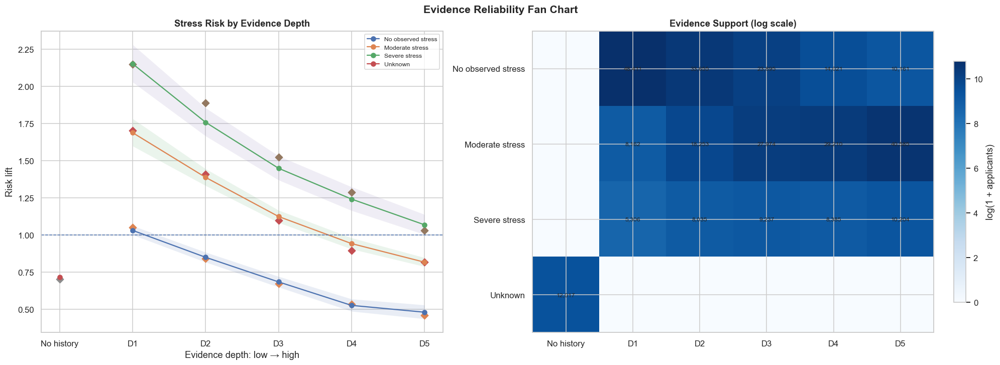

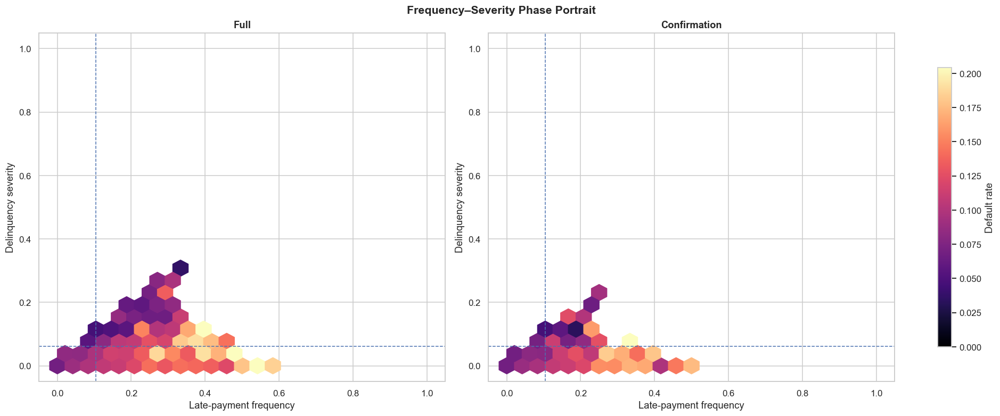

C:\Users\USER\AppData\Local\Temp\ipykernel_11632\3465706357.py:85: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed in 3.11. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap()`` or ``pyplot.get_cmap()`` instead.
  cmap = cm.get_cmap("Reds")


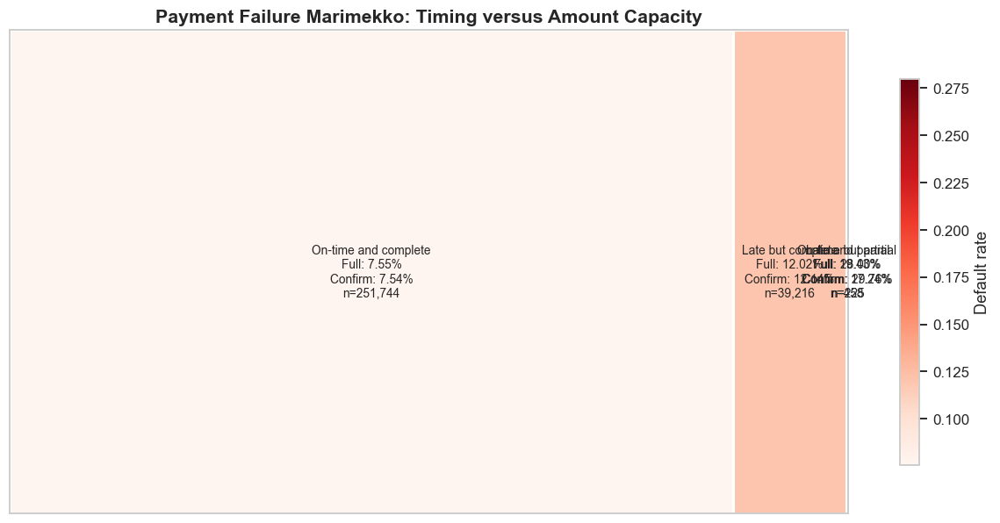

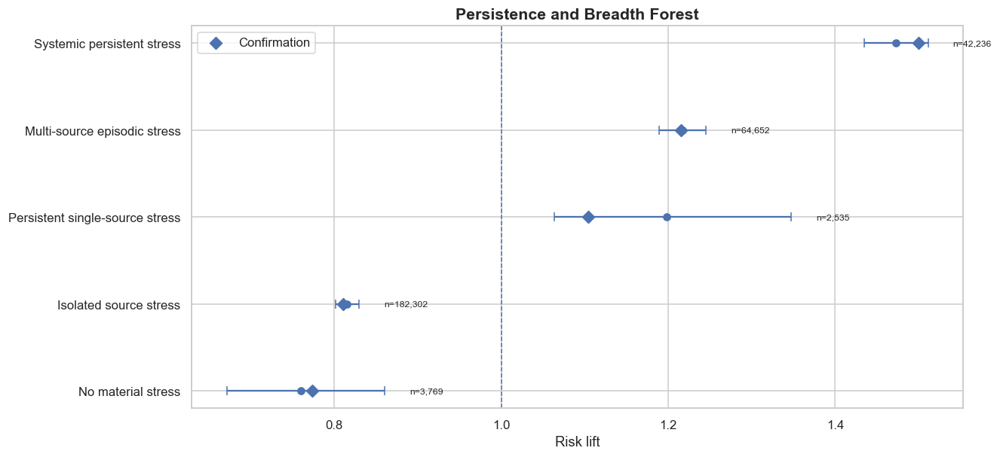

C:\Users\USER\AppData\Local\Temp\ipykernel_11632\3465706357.py:135: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed in 3.11. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap()`` or ``pyplot.get_cmap()`` instead.
  cmap = cm.get_cmap("plasma")


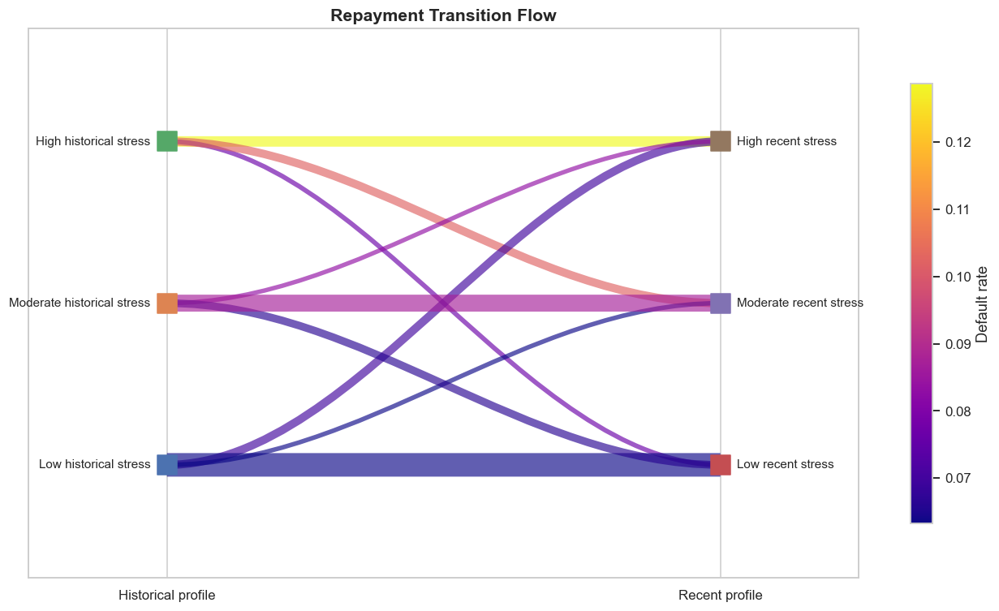

C:\Users\USER\AppData\Local\Temp\ipykernel_11632\3465706357.py:172: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed in 3.11. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap()`` or ``pyplot.get_cmap()`` instead.
  cmap = cm.get_cmap("viridis")


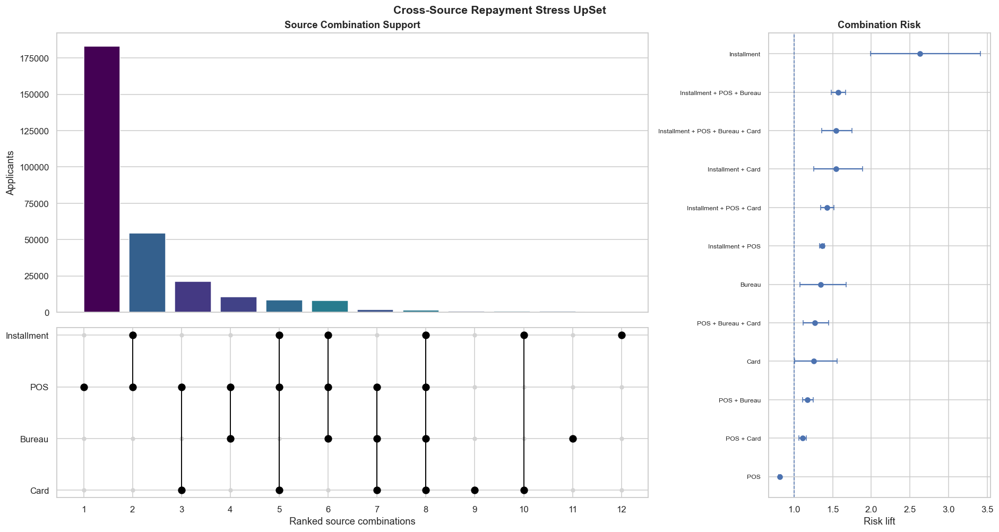

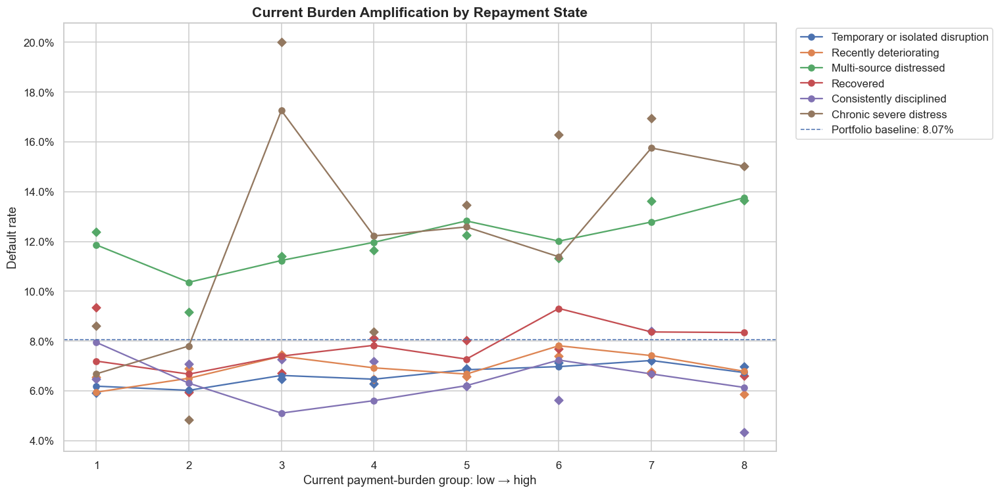

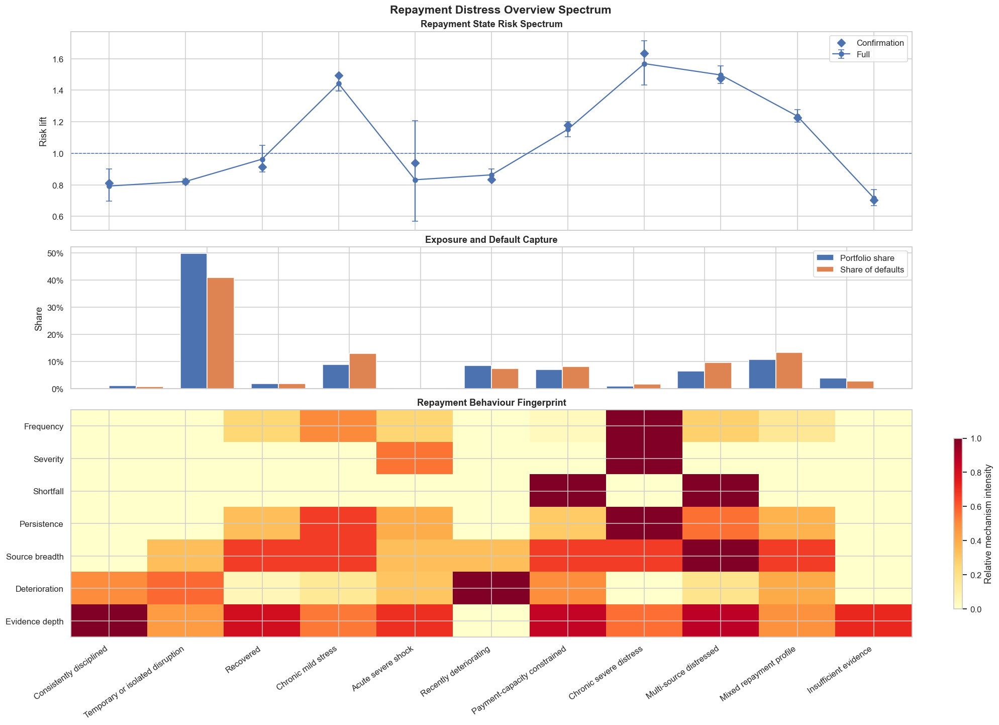

Step 3 repayment-distress analysis completed successfully.
Portfolio baseline: 8.07%
Discovery baseline: 8.07%
Confirmation baseline: 8.07%
Prepared applicants: 307,511
Tables exported to: Relationship_report\Tables\Step_3_Repayment_Distress
Figures exported to: Relationship_report\Figures\Step_3_Repayment_Distress


,role,feature,coverage,non_missing,unique_values,status
0,income,AMT_INCOME_TOTAL,1.0000,307511,2548,available
1,annuity,AMT_ANNUITY,1.0000,307499,13672,available
2,inst_support,inst_payment_row_count_sum,0.9484,291643,319,available
3,inst_contracts,inst_contract_count,0.9484,291643,25,available
4,inst_frequency,inst_is_late_ratio_mean,0.9484,291643,28186,available
5,inst_severity,inst_late_30plus_ratio_mean,0.9484,291643,2028,available
6,inst_underpayment,inst_is_underpaid_ratio_mean,0.9484,291643,536,available
7,inst_payment_completeness,inst_payment_ratio_mean_mean,0.9484,291640,39165,available
8,inst_persistence,inst_contract_with_late_ratio,0.9484,291643,110,available
9,inst_recent,inst_recent_12m_late_ratio_adjusted_mean,0.7073,217508,3074,available


,feature,label,discovery_spread,confirmation_spread,discovery_trend,confirmation_trend,direction_agreement,decision
0,repayment_persistence,Persistence,0.0583,0.0610,1.0000,1.0000,True,validated_primary
1,repayment_frequency,Late frequency,0.0511,0.0570,1.0000,1.0000,True,validated_primary
2,stressed_source_count,Stressed-source count,0.0552,0.0530,1.0000,1.0000,True,validated_primary
3,stress_deterioration,Recent deterioration,0.0354,0.0404,-0.8095,-0.9048,True,validated_primary
4,repayment_evidence_depth,Evidence depth,0.0328,0.0372,-1.0000,-0.9762,True,validated_primary
5,payment_shortfall,Payment shortfall,0.0000,0.0000,NaN,NaN,False,not_confirmed
6,repayment_severity,Delinquency severity,0.0000,0.0000,NaN,NaN,False,not_confirmed


,repayment_state,applicant_count,default_count,default_rate,ci_low,ci_high,risk_lift,portfolio_share,default_contribution,support_ok,eligible_baseline,sample
0,Chronic severe distress,3285,416,0.1266,0.1157,0.1384,1.5687,0.0107,0.0168,True,0.0807,Full
1,Multi-source distressed,19980,2414,0.1208,0.1164,0.1254,1.4966,0.0650,0.0972,True,0.0807,Full
2,Chronic mild stress,27692,3223,0.1164,0.1127,0.1202,1.4417,0.0901,0.1298,True,0.0807,Full
3,Mixed repayment profile,33314,3324,0.0998,0.0966,0.1030,1.2360,0.1083,0.1339,True,0.0807,Full
4,Payment-capacity constrained,22055,2052,0.0930,0.0893,0.0969,1.1525,0.0717,0.0827,True,0.0807,Full
5,Recovered,5980,465,0.0778,0.0712,0.0848,0.9632,0.0194,0.0187,True,0.0807,Full
6,Recently deteriorating,26395,1840,0.0697,0.0667,0.0728,0.8635,0.0858,0.0741,True,0.0807,Full
7,Acute severe shock,372,25,0.0672,0.0459,0.0973,0.8325,0.0012,0.0010,False,0.0807,Full
8,Temporary or isolated disruption,153031,10153,0.0663,0.0651,0.0676,0.8218,0.4976,0.4090,True,0.0807,Full
9,Consistently disciplined,3390,217,0.0640,0.0563,0.0728,0.7929,0.0110,0.0087,True,0.0807,Full


,source_combination,applicant_count,default_count,default_rate,ci_low,ci_high,risk_lift,portfolio_share,default_contribution,support_ok,eligible_baseline,sample
0,Installment,191,41,0.2147,0.1624,0.2782,2.6288,0.0006,0.0017,False,0.0817,Full
1,Installment + POS + Bureau,7991,1026,0.1284,0.1212,0.1359,1.5724,0.0270,0.0425,True,0.0817,Full
2,Installment + POS + Bureau + Card,1655,209,0.1263,0.1111,0.1432,1.5465,0.0056,0.0087,True,0.0817,Full
3,Installment + Card,635,80,0.1260,0.1024,0.1541,1.5429,0.0021,0.0033,True,0.0817,Full
4,Bureau + Card,33,4,0.1212,0.0482,0.2733,1.4844,0.0001,0.0002,False,0.0817,Full
5,Installment + POS + Card,8277,966,0.1167,0.1100,0.1238,1.4293,0.0280,0.0400,True,0.0817,Full
6,Installment + POS,54417,6058,0.1113,0.1087,0.1140,1.3633,0.1842,0.2511,True,0.0817,Full
7,Bureau,627,69,0.1100,0.0879,0.1370,1.3477,0.0021,0.0029,True,0.0817,Full
8,POS + Bureau + Card,2002,208,0.1039,0.0913,0.1180,1.2724,0.0068,0.0086,True,0.0817,Full
9,Card,701,72,0.1027,0.0824,0.1274,1.2578,0.0024,0.0030,True,0.0817,Full


In [11]:
STEP3_TABLE_DIR = RELATIONSHIP_TABLE_DIR / "Step_3_Repayment_Distress"
STEP3_FIGURE_DIR = RELATIONSHIP_FIGURE_DIR / "Step_3_Repayment_Distress"
STEP3_CONFIG = {"seed": RANDOM_SEED, "discovery_fraction": 0.65, "direct_bins": 8, "depth_bins": 5, "burden_bins": 8, "surface_gridsize": 24, "min_group_count": 500, "min_default_count": 20, "stress_quantile": 0.75, "state_low_quantile": 0.40, "state_high_quantile": 0.75, "alpha": 0.05}
step3_analyzer = RepaymentDistressAnalyzer(train_df, ID_COL, TARGET_COL, STEP3_CONFIG).run_all()
step3_plotter = RepaymentDistressPlotter(step3_analyzer, STEP3_FIGURE_DIR)
step3_plotter.plot_all()
step3_analyzer.export(STEP3_TABLE_DIR)
step3_feature_audit = step3_analyzer.results["feature_audit"]
step3_mechanism_evidence = step3_analyzer.results["evidence_register"].sort_values("confirmation_spread", ascending=False).reset_index(drop=True)
step3_state_evidence = step3_analyzer.results["repayment_states"].loc[lambda table: table["sample"].eq("Full")].sort_values("default_rate", ascending=False).reset_index(drop=True)
step3_source_evidence = step3_analyzer.results["source_consensus"].loc[lambda table: table["sample"].eq("Full")].sort_values("risk_lift", ascending=False).reset_index(drop=True)
print("Step 3 repayment-distress analysis completed successfully.")
print(f"Portfolio baseline: {step3_analyzer.baseline:.2%}")
print(f"Discovery baseline: {step3_analyzer.discovery_baseline:.2%}")
print(f"Confirmation baseline: {step3_analyzer.confirmation_baseline:.2%}")
print(f"Prepared applicants: {len(step3_analyzer.data):,}")
print(f"Tables exported to: {STEP3_TABLE_DIR}")
print(f"Figures exported to: {STEP3_FIGURE_DIR}")
display(step3_feature_audit)
display(step3_mechanism_evidence)
display(step3_state_evidence)
display(step3_source_evidence.head(15))

## Step 3: Repayment Distress, Recovery, and Early-Warning Observations

### Analytical Objective

This section examined whether previous repayment irregularities represent temporary operational disruption, isolated financial shocks, recurring liquidity pressure, payment-capacity weakness, persistent repayment failure, or systemic stress across multiple credit sources.

The analysis also investigated whether repayment evidence is sufficiently deep to support a reliable conclusion and whether current payment burden becomes more dangerous under particular historical repayment conditions.

The portfolio baseline default rate was approximately **8.07%**.

---

### 1. Evidence Depth Materially Changes the Meaning of Repayment Stress

Repayment stress could not be interpreted independently of historical evidence depth.

Among applicants classified as severely stressed, observed risk lift declined from approximately 2.15 in the shallowest evidence group to approximately 1.07 in the richest evidence group.

Moderate-stress risk lift declined from approximately 1.68 to approximately 0.81, while the no-observed-stress group declined from approximately 1.04 to approximately 0.48.

This produced two important findings.

First, rich and clean repayment history represented one of the strongest protective behavioural conditions.

Second, extreme stress ratios based on shallow evidence did not carry the same meaning as stress ratios supported by extensive repayment history.

Repayment ratios should therefore be evaluated jointly with:

- the number of observed payments;
- the number of contracts;
- the number of observed months;
- the number of available repayment sources;
- and source-specific evidence depth.

No history should not be treated as equivalent to clean history. The apparently low observed risk of applicants without historical evidence may reflect structural source absence, product eligibility or borrower-selection effects rather than genuine financial resilience.

---

### 2. Repeated Repayment Problems Were More Informative Than Severity Alone

The frequency–severity phase portrait showed that risk was not concentrated exclusively in the extreme high-frequency and high-severity corner.

Elevated-risk regions also appeared among applicants with moderate repayment-problem frequency and low-to-moderate severity.

This suggests that recurring moderate delays may reveal continuing liquidity pressure even when no individual event is exceptionally severe.

Frequency and severity should therefore be treated as different mechanisms:

- frequency represents recurring repayment pressure;
- severity represents the depth of an adverse event;
- their combination represents chronic severe distress.

However, the current acute-severe-shock state did not produce a stable above-baseline risk estimate. Its confidence interval was wide and its observed risk was unexpectedly low.

The current severity representation should therefore be redefined using more explicit worst-event measures, such as source-specific 30+, 60+ and 90+ delinquency events, rather than relying primarily on averaged severity ratios.

---

### 3. Payment Timing and Payment Capacity Represent Different Risk Mechanisms

Applicants who paid on time and in full formed the dominant repayment group and had an observed default rate of approximately 7.55%, slightly below the portfolio baseline.

Applicants who eventually paid the complete amount but paid late had a default rate of approximately 12%.

This indicates that repayment timing alone contains material risk information even when the scheduled payment amount is eventually satisfied.

Applicants with partial-payment behaviour appeared to have substantially higher default rates, broadly within the 20–30% range. However, these partial-payment states contained very few applicants.

The evidence supports a distinction between:

- disciplined repayment;
- late but complete repayment;
- on-time but incomplete repayment;
- and late and incomplete repayment.

Payment shortfall appears to be a promising measure of payment-capacity weakness, but the rare partial-payment groups require confidence intervals and additional validation before strong conclusions are made.

---

### 4. Persistence and Breadth Produced a Clear Risk Hierarchy

The persistence-and-breadth analysis produced one of the strongest and most interpretable relationships in Step 3.

Observed risk lift increased across the following behavioural hierarchy:

1. no material stress;
2. isolated source stress;
3. persistent single-source or multi-source episodic stress;
4. systemic persistent stress.

No-material-stress and isolated-source-stress applicants had risk lifts of approximately 0.76 and 0.81.

Multi-source episodic stress produced a risk lift of approximately 1.20.

Systemic persistent stress produced a risk lift close to 1.50, with strong agreement between full-sample and confirmation estimates.

This indicates that the breadth and persistence of repayment weakness are more reliable indicators than the existence of a single adverse record.

A problem limited to one source should not automatically be interpreted as structural borrower weakness. Repeated stress across time and across independent sources is substantially more concerning.

---

### 5. Historical-to-Recent Transitions Revealed Chronicity, but the Current Deterioration Definition Was Weak

The repayment-transition flow showed that stable trajectories represented the largest movements:

- low historical stress to low recent stress;
- moderate historical stress to moderate recent stress;
- high historical stress to high recent stress.

Applicants remaining in the high-stress state had among the highest observed default rates, supporting the importance of chronicity.

Transitions from higher historical stress toward lower recent stress generally showed lower risk than persistent high-to-high stress, suggesting that recovery may contain useful information.

However, the derived `Recently deteriorating` state did not produce elevated risk in the overview spectrum or burden-amplification plot. Its observed risk lift remained below one.

This finding does not validate the current deterioration measure as an early-warning signal.

Possible causes include:

- overlap between lifetime and recent repayment windows;
- inconsistent source-specific time horizons;
- averaging of source ranks that dilutes individual deterioration;
- and a state definition that captures only extreme low-lifetime/high-recent transitions.

Recent deterioration should be reconstructed using non-overlapping historical and recent periods before it is retained.

---

### 6. Source Identity Was More Important Than Source Count Alone

The cross-source UpSet analysis showed that stress-source count did not create a simple monotonic risk relationship.

POS-only stress represented the largest source combination but had a risk lift below one.

Installment-related and bureau-related combinations generally produced higher risk, particularly when several independent sources agreed.

Installment-only stress produced the highest apparent lift, but its confidence interval was wide and applicant support was limited.

More credible elevated-risk combinations included:

- installment and POS stress;
- installment, POS and bureau stress;
- installment, POS and card stress;
- installment and card stress;
- and stress across all available repayment sources.

The conclusion is not simply that more stressed sources always imply greater risk.

Instead:

> The identity of the stressed sources and the specific combination of adverse sources are more informative than source count alone.

A stressed-source count may be retained as a summary measure, but source-specific indicators and selected combinations should also be investigated.

---

### 7. Historical Repayment Condition Changed the Meaning of Current Payment Burden

Applicants with consistently disciplined histories remained below the portfolio baseline across most current payment-burden groups.

Applicants with temporary or isolated repayment disruption also remained relatively stable and below baseline.

In contrast, multi-source-distressed applicants remained materially above baseline and showed a broadly increasing risk pattern as current payment burden increased.

This provides a direct extension of the Step 2 finding:

> Current payment burden is not universally risky. Its meaning depends on the applicant's historical repayment condition.

High current burden may represent manageable leverage for a historically disciplined applicant, while the same burden may represent dangerous financial pressure for an applicant with persistent or multi-source repayment weakness.

Chronic-severe-distress applicants showed high but unstable burden-specific risk estimates. Their non-monotonic curve and variable confirmation points indicate uneven support across burden groups.

---

### 8. Repayment-State Portfolio Findings

The repayment-state spectrum separated several meaningful borrower groups.

#### Consistently disciplined

This group had a risk lift of approximately 0.80 and was characterised by strong evidence depth and low repayment stress.

#### Temporary or isolated disruption

This was the largest group, representing approximately half of the portfolio. Its risk lift was approximately 0.82.

Although its per-applicant risk was relatively low, its large population meant that it still accounted for approximately 41% of observed defaults.

#### Recovered

Recovered applicants had a risk lift close to 0.95. Recovery therefore appeared somewhat favourable but did not return borrowers fully to the consistently disciplined risk level.

#### Chronic mild stress

This group had a risk lift of approximately 1.44–1.49. It represented a meaningful share of the portfolio and contributed a disproportionately large share of defaults.

Repeated mild repayment stress should therefore not be treated as harmless.

#### Payment-capacity constrained

This group had a moderate elevated risk lift of approximately 1.15–1.18. Payment shortfall appears to provide information beyond payment timing alone.

#### Chronic severe distress

This was one of the highest-risk confirmed states, with a risk lift of approximately 1.57–1.65.

#### Multi-source distressed

This group had a stable risk lift close to 1.50 and produced more defaults than expected from its portfolio share.

#### Mixed repayment profile

This group had a moderate elevated risk lift of approximately 1.23. It remains heterogeneous and requires further decomposition.

#### Acute severe shock and recently deteriorating

These states did not produce the expected above-baseline risk and should not currently be treated as validated behavioural groups.

#### Insufficient evidence

The apparently low risk of this state should not be interpreted as protection. The evidence-depth and source-availability logic should be audited because the state may combine structurally different forms of missing repayment information.

---

### Final Analytical Conclusion

The most reliable repayment-warning signal was not the presence of one severe historical event.

The strongest evidence was produced by repayment weakness that was:

- repeated;
- persistent;
- observed across several contracts or sources;
- supported by sufficient historical evidence;
- and combined with high current payment burden.

The analysis supports the following real-world interpretation:

\[
\text{Rich Clean History}
\Rightarrow
\text{Strong Repayment Resilience}
\]

\[
\text{Isolated Stress}
\not\Rightarrow
\text{Structural High Risk}
\]

\[
\text{Persistent Multi-Source Stress}
\Rightarrow
\text{Structural Repayment Weakness}
\]

\[
\text{Structural Weakness}
+
\text{High Current Burden}
\Rightarrow
\text{Amplified Default Risk}
\]

The strongest validated mechanisms moving forward are:

1. evidence-supported clean repayment history;
2. repayment-problem frequency;
3. behavioural persistence;
4. contract and source breadth;
5. chronic mild stress;
6. chronic severe stress;
7. multi-source repayment distress;
8. payment shortfall;
9. current-burden amplification under persistent or multi-source stress.

The following mechanisms require redefinition before they are retained:

- acute severe shock;
- recent deterioration;
- insufficient-evidence status;
- and rare partial-payment states.

These findings represent relationship evidence rather than final underwriting rules or production-ready feature definitions.

> ### Step 3 Evidence Snapshot
>
> | Analysis area | Key observation | Evidence decision |
> |---|---|---|
> | Evidence depth | Rich clean history was strongly protective; shallow extreme ratios were much riskier and less reliable | **Keep stress and support together** |
> | No history | No-history applicants appeared lower risk, but structural absence and clean history cannot be treated as equivalent | **Keep as separate uncertainty state** |
> | Frequency | Repeated moderate repayment problems produced meaningful risk | **Validated primary mechanism** |
> | Severity | The current acute-severe-shock state did not show stable elevated risk | **Redefine using explicit 30+/60+/90+ events** |
> | Payment timing | Late-but-complete applicants had approximately 12% default compared with 7.55% for on-time-and-complete applicants | **Validated contextual mechanism** |
> | Payment shortfall | Partial-payment states appeared extremely risky but had very limited support | **Promising; requires validation** |
> | Persistence | Repeated stress was more adverse than isolated stress | **Validated primary mechanism** |
> | Source breadth | Systemic persistent stress produced approximately 1.5× risk lift | **Validated primary mechanism** |
> | Source identity | POS-only stress was not adverse, while installment/bureau combinations were more informative | **Use identity and combination, not count alone** |
> | Recovery | Recovered applicants were close to baseline rather than fully resilient | **Retain as contextual state** |
> | Recent deterioration | The current deterioration state remained below baseline | **Not validated; redefine temporal comparison** |
> | Current burden | Burden was relatively manageable for disciplined applicants but increasingly dangerous under multi-source stress | **Validated interaction direction** |
> | Highest-risk states | Chronic severe distress and multi-source distress produced approximately 1.5–1.65× risk lift | **Priority behavioural states** |
> | Largest group | Temporary or isolated disruption represented about half of the portfolio but had below-baseline individual risk | **High volume, lower intensity** |
> | Overall conclusion | Persistent, evidence-supported and multi-source weakness was more reliable than a single adverse event | **Core Step 3 finding** |

# Step 4: Applicant-Level Risk and Resilience Attribution

## Explaining Why Financially Similar Applicants Diverge into Default and Non-Default Outcomes

---

## Research Purpose

A defaulted applicant should not be described by one simplified cause, and a non-defaulted applicant should not automatically be treated as free from financial stress.

The same applicant may simultaneously contain:

- risk-increasing attributes;
- repayment-protective attributes;
- compound interactions that amplify or offset risk;
- incomplete or contradictory evidence.

This section constructs an applicant-level **Risk–Resilience Ledger**.

The objective is to identify:

1. which observed attributes materially increased default risk;
2. which attributes materially supported repayment resilience;
3. which interactions amplified or offset risk;
4. whether adverse or protective forces dominated;
5. how reliable the applicant-level explanation is.

This analysis does not claim that an observed attribute causally produced default. It identifies statistically supported adverse and protective contributors within the available observational data.

---

## Main Research Question

> **Among applicants with comparable loan and household contexts, which statistically validated attributes materially increase observed default risk, which attributes materially support repayment resilience, and how do these adverse and protective forces interact to explain why one applicant defaults while another financially similar applicant does not?**

The applicant's observed position is represented as:

$$
\text{Risk–Resilience Position}
=
\text{Adverse Pressure}
-
\text{Protective Strength}
+
\text{Compound Effects}
+
\text{Evidence Uncertainty}
$$

---

## Analytical Mechanisms

The integrated feature space is compressed into ten financially interpretable mechanisms.

| Mechanism | Risk-increasing side | Protective side |
|---|---|---|
| Current capacity | High payment burden and weak residual capacity | Low burden and strong residual capacity |
| External credit quality | Weak or conflicting external evidence | Strong and consistent external evidence |
| Repayment discipline | Frequent, persistent and multi-source stress | Rich and clean repayment history |
| Payment capacity | Underpayment and minimum-payment failure | Complete and stable scheduled payment |
| Debt exposure | High active debt and account pressure | Controlled active exposure and completed credit history |
| Credit demand | Recent application bursts and repeated requests | Stable and limited recent demand |
| Lender response | Repeated refusal and adverse recent outcomes | Consistent approval with sufficient history |
| Revolving liquidity | High utilisation, cash reliance and weak payment coverage | Controlled utilisation and strong payment coverage |
| Employment and household stability | Short employment and weak household buffer | Stable employment and strong household capacity |
| Evidence quality | Sparse or conflicting information | Deep and internally consistent evidence |

Step 2 contributes affordability, external-credit, refusal, active-debt and employment evidence.

Step 3 contributes repayment frequency, persistence, breadth, payment shortfall and evidence-depth information.

Step 4 integrates these findings and adds debt structure, credit demand, lender response and revolving-liquidity behaviour.

---

## Triangulated Attribution Framework

An applicant attribute is not classified from one statistic alone.

Three analytical layers are combined.

### 1. Empirical Statistical Boundary

For each mechanism, discovery-sample risk curves define statistically supported regions.

$$
\Delta p(x)=P(Y=1\mid X=x)-p_0
$$

Each region receives one status:

- `strong_adverse`;
- `moderate_adverse`;
- `neutral`;
- `moderate_protective`;
- `strong_protective`;
- `contradictory`;
- `uncertain`.

Boundaries are learned in the discovery sample and applied unchanged to the confirmation sample.

### 2. Cross-Fitted Local Contribution

A spline-based additive logistic model estimates applicant-level nonlinear contributions without using the applicant's own outcome during fitting.

$$
\operatorname{logit}(P_i)
=
\beta_0
+
\sum_k f_k(M_{ik})
+
\sum_{(k,l)\in\mathcal I}f_{kl}(M_{ik},M_{il})
$$

For applicant $i$ and mechanism $k$:

$$
C_{ik}>0 \Rightarrow \text{adverse contribution}
$$

$$
C_{ik}<0 \Rightarrow \text{protective contribution}
$$

Only pre-specified interactions supported by Steps 2–3 are included.

### 3. Matched Applicant Contrast

Each applicant is compared with an opposite-outcome applicant having a similar application context.

Matching considers:

- loan amount;
- income;
- annuity;
- household size;
- number of children;
- age;
- contract type;
- income type;
- broad evidence availability.

The matched comparison is diagnostic rather than causal.

It asks:

> **Which financial mechanisms remain different when broad application context is approximately similar?**

An explanation receives higher confidence when empirical boundaries, local contribution and matched comparison agree.

---

## Applicant-Level Outputs

| Attribute | Interpretation |
|---|---|
| `PRIMARY_RISK_ATTRIBUTE` | Strongest observed adverse attribute |
| `SECONDARY_RISK_ATTRIBUTE` | Second adverse attribute |
| `PRIMARY_PROTECTIVE_ATTRIBUTE` | Strongest observed resilience factor |
| `SECONDARY_PROTECTIVE_ATTRIBUTE` | Second resilience factor |
| `DOMINANT_RISK_PATHWAY` | Strongest compound adverse interaction |
| `DOMINANT_RESILIENCE_PATHWAY` | Strongest compound protective interaction |
| `TOTAL_ADVERSE_PRESSURE` | Sum of positive local contributions |
| `TOTAL_PROTECTIVE_STRENGTH` | Sum of protective local contributions |
| `NET_RISK_BALANCE` | Adverse pressure minus protective strength |
| `EVIDENCE_RELIABILITY` | Reliability of available applicant evidence |
| `EXPLANATION_CONFIDENCE` | Stability and triangulation of the explanation |
| `APPLICANT_RISK_RESILIENCE_PROFILE` | Final interpretable financial profile |
| `EXPLANATION_TEXT` | Applicant-level explanation |

---

## Risk–Resilience Profiles

Applicants are assigned one of the following explanatory profiles:

- Structurally vulnerable;
- Single-driver vulnerable;
- Compound financial distress;
- Apparently safe but structurally weak;
- Counterbalanced high pressure;
- Burdened but resilient;
- Strongly resilient;
- Weakly differentiated;
- Mixed risk–resilience profile;
- Evidence uncertain.

A default applicant may still contain protective attributes.

A non-default applicant may still contain adverse attributes.

The final interpretation depends on the balance and interaction of both sides.

---

## Advanced Figures

| Figure | Analytical purpose |
|---|---|
| Scientific Attribute Boundary Laboratory | Histogram, KDE, risk line, confidence interval and statistical zones |
| Contribution Raincloud Laboratory | Complete contribution distributions for default and non-default applicants |
| Risk–Resilience Force Field | Adverse pressure, protective strength, density and local default risk |
| Matched Applicant Contrast Forest | Mechanisms differentiating similar default and non-default applicants |
| Attribute Compensation Matrix | Protective mechanisms that offset adverse mechanisms |
| Signed Relationship Network | Risk-amplifying and risk-offsetting interactions |
| Matched Explanation Waterfalls | Applicant-level adverse and protective contribution paths |
| Risk–Resilience Explanation Atlas | Profile risk, portfolio impact, mechanism fingerprint and explanation quality |

---

## Interpretation Boundary

This section will not:

- claim that model contributions are causal effects;
- force explanations when evidence is insufficient;
- treat no history as clean history;
- use confirmation data to choose boundaries;
- interpret rare high-rate groups without sufficient support;
- search arbitrary interactions outside the validated set;
- treat estimated probability as the final production model.

---

## Step Completion Criteria

Step 4 is complete when:

1. each mechanism has adverse, protective, neutral and uncertain regions;
2. discovery boundaries remain directionally stable in confirmation data;
3. out-of-fold applicant-level contributions are available;
4. matched default and non-default contrasts are evaluated;
5. primary adverse and protective attributes are assigned;
6. compound pathways are separated from direct effects;
7. adverse and protective forces are combined into a net balance;
8. both default and non-default applicants can be interpreted;
9. unexpected outcomes are audited;
10. the applicant-level Risk–Resilience Ledger is exported.

In [12]:
import math
import warnings
from pathlib import Path
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from matplotlib import cm, colors
from matplotlib.gridspec import GridSpec
from matplotlib.lines import Line2D
from matplotlib.patches import Patch
from matplotlib.ticker import PercentFormatter
from scipy import stats
from statsmodels.stats.proportion import proportion_confint
from sklearn.model_selection import StratifiedKFold, train_test_split
from sklearn.preprocessing import SplineTransformer, StandardScaler
from sklearn.linear_model import LogisticRegression
from sklearn.metrics import roc_auc_score, log_loss, brier_score_loss
from IPython.display import display

class ApplicantRiskResilienceAnalyzer:
    def __init__(self, data, id_col, target_col, step2_analyzer=None, step3_analyzer=None, config=None):
        self.raw_data = data
        self.id_col = id_col
        self.target_col = target_col
        self.step2_analyzer = step2_analyzer
        self.step3_analyzer = step3_analyzer
        self.config = self._build_config(config)
        self.registry = self._build_registry()
        self.mechanism_labels = self._mechanism_labels()
        self.interaction_specs = self._interaction_specs()
        self.results = {}
        self.data = pd.DataFrame(index=data.index)
        self.source_data = pd.DataFrame(index=data.index)
        self.resolved_components = pd.DataFrame()
        self.discovery_index = pd.Index([])
        self.confirmation_index = pd.Index([])
        self.mechanism_columns = list(self.registry)
        self.interaction_columns = [item[0] for item in self.interaction_specs]
        self.group_rules = {}
        self.baseline = np.nan
        self.discovery_baseline = np.nan
        self.confirmation_baseline = np.nan

    def _build_config(self, config):
        defaults = {"seed": 42, "discovery_fraction": 0.65, "boundary_bins": 10, "materiality_margin": 0.005, "min_group_count": 500, "min_default_count": 20, "n_splits": 5, "stability_repeats": 3, "spline_knots": 5, "regularization_c": 0.35, "component_coverage_min": 0.20, "contribution_quantile": 0.60, "match_gap_min": 0.05, "match_distance_max": 0.08, "high_pressure_quantile": 0.75, "low_pressure_quantile": 0.40, "dominance_quantile": 0.70, "random_plot_sample": 30000, "alpha": 0.05}
        if config is not None:
            defaults.update(config)
        return defaults

    def _mechanism_labels(self):
        return {"current_capacity_stress": "Current capacity stress", "external_credit_weakness": "External credit weakness", "repayment_distress": "Repayment distress", "payment_capacity_stress": "Payment-capacity stress", "debt_overextension": "Debt overextension", "credit_demand_pressure": "Credit-demand pressure", "lender_response_pressure": "Lender-response pressure", "revolving_liquidity_stress": "Revolving-liquidity stress", "employment_household_fragility": "Employment and household fragility", "evidence_uncertainty": "Evidence uncertainty"}

    def _build_registry(self):
        return {
            "current_capacity_stress": [
                {"label": "Payment burden", "candidates": ["annuity_income_ratio", "current_payment_burden"], "direction": "risk", "weight": 1.20},
                {"label": "Combined payment burden", "candidates": ["combined_annuity_income_ratio"], "direction": "risk", "weight": 1.00},
                {"label": "Residual capacity per person", "candidates": ["residual_income_per_person", "combined_residual_income_per_person"], "direction": "protective", "weight": 1.20}
            ],
            "external_credit_weakness": [
                {"label": "External score mean", "candidates": ["external_score_mean"], "direction": "protective", "weight": 1.35},
                {"label": "Weakest external score", "candidates": ["external_score_min"], "direction": "protective", "weight": 0.40},
                {"label": "External score disagreement", "candidates": ["external_score_range", "external_score_std"], "direction": "risk", "weight": 0.45}
            ],
            "repayment_distress": [
                {"label": "Repayment frequency", "candidates": ["repayment_frequency", "historical_repayment_stress_mean"], "direction": "risk", "weight": 1.20},
                {"label": "Repayment persistence", "candidates": ["repayment_persistence"], "direction": "risk", "weight": 1.20},
                {"label": "Worst historical stress", "candidates": ["historical_repayment_stress_max"], "direction": "risk", "weight": 0.85},
                {"label": "Stressed-source breadth", "candidates": ["stressed_source_count"], "direction": "risk", "weight": 1.10}
            ],
            "payment_capacity_stress": [
                {"label": "Payment shortfall", "candidates": ["payment_shortfall", "inst_is_underpaid_ratio_mean"], "direction": "risk", "weight": 1.25},
                {"label": "Card below-minimum payment", "candidates": ["cc_recent_12m_payment_less_than_min_ratio_mean", "cc_contract_with_payment_less_than_min_ratio"], "direction": "risk", "weight": 1.00},
                {"label": "Installment completeness", "candidates": ["inst_payment_ratio_mean_mean", "inst_latest_payment_ratio_mean"], "direction": "protective", "weight": 0.70}
            ],
            "debt_overextension": [
                {"label": "Active debt burden", "candidates": ["bureau_active_debt_income_ratio"], "direction": "risk", "weight": 1.25},
                {"label": "Active debt share", "candidates": ["bureau_active_debt_share", "bureau_active_debt_to_credit_ratio"], "direction": "risk", "weight": 1.00},
                {"label": "Active credit share", "candidates": ["bureau_active_ratio"], "direction": "risk", "weight": 0.75},
                {"label": "Active account count", "candidates": ["bureau_active_count"], "direction": "risk", "weight": 0.55},
                {"label": "Closed credit share", "candidates": ["bureau_closed_ratio"], "direction": "protective", "weight": 0.45}
            ],
            "credit_demand_pressure": [
                {"label": "Recent six-month applications", "candidates": ["prev_recent_6m_ratio", "prev_recent_6m_count"], "direction": "risk", "weight": 1.20},
                {"label": "Recent twelve-month applications", "candidates": ["prev_recent_12m_ratio", "prev_recent_12m_count"], "direction": "risk", "weight": 1.00},
                {"label": "Previous application volume", "candidates": ["prev_application_count"], "direction": "risk", "weight": 0.45},
                {"label": "Recent bureau inquiries", "candidates": ["AMT_REQ_CREDIT_BUREAU_MON", "AMT_REQ_CREDIT_BUREAU_QRT", "AMT_REQ_CREDIT_BUREAU_YEAR"], "direction": "risk", "weight": 0.45}
            ],
            "lender_response_pressure": [
                {"label": "Previous refusal pressure", "candidates": ["previous_refusal_ratio", "prev_refused_ratio"], "direction": "risk", "weight": 1.35},
                {"label": "Recent refusal count", "candidates": ["prev_refused_recent_12m_count", "prev_refused_recent_24m_count"], "direction": "risk", "weight": 1.00},
                {"label": "Latest refusal", "candidates": ["prev_latest_refused_flag"], "direction": "risk", "weight": 0.90},
                {"label": "Refused-to-approved ratio", "candidates": ["prev_refused_to_approved_ratio"], "direction": "risk", "weight": 0.70},
                {"label": "Approval ratio", "candidates": ["prev_approved_ratio"], "direction": "protective", "weight": 0.55}
            ],
            "revolving_liquidity_stress": [
                {"label": "Credit-card utilisation", "candidates": ["credit_card_utilization", "cc_credit_utilization_mean_mean"], "direction": "risk", "weight": 1.10},
                {"label": "Persistent high utilisation", "candidates": ["cc_high_utilization_80plus_ratio_mean", "cc_contract_with_high_utilization_80plus_ratio"], "direction": "risk", "weight": 1.00},
                {"label": "ATM cash reliance", "candidates": ["cc_atm_drawing_share_mean_mean", "cc_latest_atm_drawing_share"], "direction": "risk", "weight": 0.75},
                {"label": "Payment-to-balance coverage", "candidates": ["cc_payment_to_balance_ratio_mean_mean", "cc_latest_payment_to_balance_ratio"], "direction": "protective", "weight": 0.85},
                {"label": "Payment-to-minimum coverage", "candidates": ["cc_payment_to_min_inst_ratio_mean_mean", "cc_latest_payment_to_min_inst_ratio"], "direction": "protective", "weight": 0.85}
            ],
            "employment_household_fragility": [
                {"label": "Employment stability", "candidates": ["employment_age_ratio"], "direction": "protective", "weight": 1.20},
                {"label": "Income per person", "candidates": ["income_per_person", "residual_income_per_person"], "direction": "protective", "weight": 0.85},
                {"label": "Child dependency", "candidates": ["child_dependency_share"], "direction": "risk", "weight": 0.75}
            ],
            "evidence_uncertainty": [
                {"label": "External score depth", "candidates": ["external_score_count"], "direction": "protective", "weight": 1.00},
                {"label": "Historical source depth", "candidates": ["historical_information_source_count", "repayment_source_count"], "direction": "protective", "weight": 1.20},
                {"label": "Repayment evidence depth", "candidates": ["repayment_evidence_depth"], "direction": "protective", "weight": 1.20},
                {"label": "Bureau record depth", "candidates": ["bureau_record_count"], "direction": "protective", "weight": 0.50}
            ]
        }

    def _interaction_specs(self):
        return [
            ("capacity__external", "Current capacity × External weakness", "current_capacity_stress", "external_credit_weakness"),
            ("capacity__lender", "Current capacity × Lender response", "current_capacity_stress", "lender_response_pressure"),
            ("capacity__repayment", "Current capacity × Repayment distress", "current_capacity_stress", "repayment_distress"),
            ("capacity__debt", "Current capacity × Debt exposure", "current_capacity_stress", "debt_overextension"),
            ("debt__liquidity", "Debt exposure × Liquidity stress", "debt_overextension", "revolving_liquidity_stress"),
            ("demand__lender", "Credit demand × Lender response", "credit_demand_pressure", "lender_response_pressure"),
            ("capacity__shortfall", "Current capacity × Payment shortfall", "current_capacity_stress", "payment_capacity_stress")
        ]

    def _validate_inputs(self):
        missing = [column for column in [self.id_col, self.target_col] if column not in self.raw_data.columns]
        if len(missing) > 0:
            raise KeyError(f"Required columns are missing: {missing}")
        target_values = set(pd.Series(self.raw_data[self.target_col]).dropna().unique())
        if self.raw_data[self.target_col].isna().any() or not target_values.issubset({0, 1}):
            raise ValueError(f"{self.target_col} must be a complete binary target.")

    def _merge_prior_evidence(self):
        required = {self.id_col, self.target_col, "AMT_INCOME_TOTAL", "AMT_ANNUITY", "AMT_CREDIT", "AMT_GOODS_PRICE", "CNT_FAM_MEMBERS", "CNT_CHILDREN", "DAYS_BIRTH", "DAYS_EMPLOYED", "EXT_SOURCE_1", "EXT_SOURCE_2", "EXT_SOURCE_3", "NAME_CONTRACT_TYPE", "NAME_INCOME_TYPE", "bureau_active_annuity_amount_sum", "bureau_active_debt_amount_sum", "bureau_bal_late_ratio_mean", "pos_contract_with_dpd_ratio", "inst_contract_with_late_ratio", "cc_contract_with_dpd_ratio", "inst_is_underpaid_ratio_mean", "cc_recent_12m_payment_less_than_min_ratio_mean", "bureau_record_count", "pos_contract_count", "inst_contract_count", "cc_contract_count"}
        for specifications in self.registry.values():
            for specification in specifications:
                required.update(specification["candidates"])
        selected = [column for column in required if column in self.raw_data.columns]
        source = self.raw_data[selected].copy()
        for analyzer in [self.step2_analyzer, self.step3_analyzer]:
            prior = getattr(analyzer, "data", None)
            if isinstance(prior, pd.DataFrame):
                common_index = source.index.intersection(prior.index)
                prior_columns = set(required).intersection(prior.columns)
                for column in prior_columns:
                    if column not in [self.id_col, self.target_col]:
                        source.loc[common_index, column] = prior.loc[common_index, column]
        self.source_data = source

    def _safe_ratio(self, numerator, denominator):
        result = pd.Series(np.nan, index=numerator.index, dtype="float64")
        valid = numerator.notna() & denominator.notna() & denominator.ne(0)
        result.loc[valid] = numerator.loc[valid] / denominator.loc[valid]
        return result.replace([np.inf, -np.inf], np.nan)

    def _numeric(self, column):
        if column not in self.source_data.columns:
            return pd.Series(np.nan, index=self.source_data.index, dtype="float64")
        return pd.to_numeric(self.source_data[column], errors="coerce")

    def _derive_core_features(self):
        data = self.source_data
        income = self._numeric("AMT_INCOME_TOTAL").where(lambda values: values.gt(0))
        annuity = self._numeric("AMT_ANNUITY").where(lambda values: values.gt(0))
        credit = self._numeric("AMT_CREDIT").where(lambda values: values.gt(0))
        family = self._numeric("CNT_FAM_MEMBERS").where(lambda values: values.gt(0))
        children = self._numeric("CNT_CHILDREN").where(lambda values: values.ge(0))
        days_birth = self._numeric("DAYS_BIRTH").where(lambda values: values.lt(0))
        days_employed = self._numeric("DAYS_EMPLOYED").where(lambda values: values.lt(0))
        active_annuity = self._numeric("bureau_active_annuity_amount_sum").where(lambda values: values.ge(0)).fillna(0)
        active_debt = self._numeric("bureau_active_debt_amount_sum").where(lambda values: values.ge(0))
        derived = {}
        derived["annuity_income_ratio"] = self._safe_ratio(annuity, income)
        derived["current_payment_burden"] = derived["annuity_income_ratio"]
        derived["residual_income_per_person"] = self._safe_ratio(income - annuity, family)
        derived["combined_residual_income_per_person"] = self._safe_ratio(income - annuity - active_annuity, family)
        derived["combined_annuity_income_ratio"] = self._safe_ratio(annuity + active_annuity, income)
        derived["credit_income_ratio"] = self._safe_ratio(credit, income)
        derived["bureau_active_debt_income_ratio"] = self._safe_ratio(active_debt, income)
        derived["employment_age_ratio"] = self._safe_ratio(-days_employed / 365.25, -days_birth / 365.25)
        derived["income_per_person"] = self._safe_ratio(income, family)
        derived["child_dependency_share"] = self._safe_ratio(children, family)
        external_columns = [column for column in ["EXT_SOURCE_1", "EXT_SOURCE_2", "EXT_SOURCE_3"] if column in data.columns]
        if len(external_columns) > 0:
            external = data[external_columns].apply(pd.to_numeric, errors="coerce")
            derived["external_score_count"] = external.notna().sum(axis=1)
            derived["external_score_mean"] = external.mean(axis=1, skipna=True)
            derived["external_score_min"] = external.min(axis=1, skipna=True)
            derived["external_score_range"] = external.max(axis=1, skipna=True) - external.min(axis=1, skipna=True)
            derived["external_score_std"] = external.std(axis=1, skipna=True, ddof=0)
            insufficient = derived["external_score_count"].lt(2)
            derived["external_score_range"].loc[insufficient] = np.nan
            derived["external_score_std"].loc[insufficient] = np.nan
        source_stress = pd.DataFrame(index=data.index)
        source_stress["bureau"] = self._numeric("bureau_bal_late_ratio_mean")
        source_stress["pos"] = self._numeric("pos_contract_with_dpd_ratio")
        source_stress["installment"] = self._numeric("inst_contract_with_late_ratio")
        source_stress["card"] = self._numeric("cc_contract_with_dpd_ratio")
        derived["repayment_frequency"] = source_stress.mean(axis=1, skipna=True)
        derived["repayment_persistence"] = source_stress.max(axis=1, skipna=True)
        derived["historical_repayment_stress_mean"] = source_stress.mean(axis=1, skipna=True)
        derived["historical_repayment_stress_max"] = source_stress.max(axis=1, skipna=True)
        derived["stressed_source_count"] = source_stress.gt(0).sum(axis=1)
        shortfall = pd.DataFrame(index=data.index)
        shortfall["installment"] = self._numeric("inst_is_underpaid_ratio_mean")
        shortfall["card"] = self._numeric("cc_recent_12m_payment_less_than_min_ratio_mean")
        derived["payment_shortfall"] = shortfall.mean(axis=1, skipna=True)
        support = pd.DataFrame(index=data.index)
        support["bureau"] = self._numeric("bureau_record_count")
        support["pos"] = self._numeric("pos_contract_count")
        support["installment"] = self._numeric("inst_contract_count")
        support["card"] = self._numeric("cc_contract_count")
        derived["repayment_source_count"] = support.gt(0).sum(axis=1)
        derived["historical_information_source_count"] = support.gt(0).sum(axis=1)
        for column, values in derived.items():
            if column not in data.columns or data[column].isna().all():
                data[column] = values
            else:
                data[column] = pd.to_numeric(data[column], errors="coerce").combine_first(pd.Series(values, index=data.index))
        self.source_data = data

    def _reuse_or_create_split(self):
        reused = False
        prior = getattr(self.step2_analyzer, "data", None)
        if isinstance(prior, pd.DataFrame) and "analysis_sample" in prior.columns:
            common = self.source_data.index.intersection(prior.index)
            discovery = common[prior.loc[common, "analysis_sample"].eq("Discovery")]
            confirmation = common[prior.loc[common, "analysis_sample"].eq("Confirmation")]
            if len(discovery) > 0 and len(confirmation) > 0:
                self.discovery_index = pd.Index(discovery)
                self.confirmation_index = pd.Index(confirmation)
                reused = True
        if not reused:
            prior_discovery = getattr(self.step3_analyzer, "discovery_index", pd.Index([]))
            prior_confirmation = getattr(self.step3_analyzer, "confirmation_index", pd.Index([]))
            if len(prior_discovery) > 0 and len(prior_confirmation) > 0:
                self.discovery_index = self.source_data.index.intersection(prior_discovery)
                self.confirmation_index = self.source_data.index.intersection(prior_confirmation)
                reused = True
        if not reused:
            discovery, confirmation = train_test_split(self.source_data.index, train_size=self.config["discovery_fraction"], random_state=self.config["seed"], stratify=self.source_data[self.target_col])
            self.discovery_index = pd.Index(discovery)
            self.confirmation_index = pd.Index(confirmation)

    def _resolve_components(self):
        records = []
        for mechanism, specifications in self.registry.items():
            for specification in specifications:
                selected = next((column for column in specification["candidates"] if column in self.source_data.columns and pd.to_numeric(self.source_data[column], errors="coerce").notna().any()), None)
                records.append({"mechanism": mechanism, "mechanism_label": self.mechanism_labels[mechanism], "component_label": specification["label"], "selected_feature": selected, "direction": specification["direction"], "weight": specification["weight"], "available": selected is not None})
        self.resolved_components = pd.DataFrame(records)
        self.results["mechanism_registry"] = self.resolved_components.copy()

    def _discovery_rank(self, series):
        numeric = pd.to_numeric(series, errors="coerce")
        reference = numeric.loc[self.discovery_index].dropna().sort_values().to_numpy()
        result = pd.Series(np.nan, index=numeric.index, dtype="float64")
        if len(reference) == 0:
            return result
        observed = numeric.dropna()
        result.loc[observed.index] = np.searchsorted(reference, observed.to_numpy(), side="right") / len(reference)
        return result.clip(0, 1)

    def _construct_mechanisms(self):
        output = pd.DataFrame(index=self.source_data.index)
        output[self.id_col] = self.source_data[self.id_col]
        output[self.target_col] = self.source_data[self.target_col].astype(int)
        component_records = []
        for mechanism in self.registry:
            weighted_values = pd.DataFrame(index=output.index)
            weighted_presence = pd.DataFrame(index=output.index)
            total_weight = 0.0
            mechanism_rows = self.resolved_components.loc[self.resolved_components["mechanism"].eq(mechanism) & self.resolved_components["available"]]
            for _, row in mechanism_rows.iterrows():
                raw_values = pd.to_numeric(self.source_data[row["selected_feature"]], errors="coerce")
                rank_values = self._discovery_rank(raw_values)
                stress_values = rank_values if row["direction"] == "risk" else 1 - rank_values
                key = f"{mechanism}__{row['component_label']}"
                weighted_values[key] = stress_values * row["weight"]
                weighted_presence[key] = stress_values.notna().astype(float) * row["weight"]
                total_weight += row["weight"]
                component_records.append({"mechanism": mechanism, "mechanism_label": self.mechanism_labels[mechanism], "component": row["component_label"], "feature": row["selected_feature"], "direction": row["direction"], "weight": row["weight"], "coverage": stress_values.notna().mean(), "median_stress_intensity": stress_values.median(), "p90_stress_intensity": stress_values.quantile(0.90)})
            if total_weight > 0:
                numerator = weighted_values.sum(axis=1, min_count=1)
                denominator = weighted_presence.sum(axis=1, min_count=1)
                output[mechanism] = numerator / denominator
                output[f"{mechanism}_coverage"] = denominator / total_weight
                output.loc[output[f"{mechanism}_coverage"].lt(self.config["component_coverage_min"]), mechanism] = np.nan
            else:
                output[mechanism] = np.nan
                output[f"{mechanism}_coverage"] = 0.0
        self.data = output.replace([np.inf, -np.inf], np.nan)
        self.baseline = float(self.data[self.target_col].mean())
        self.discovery_baseline = float(self.data.loc[self.discovery_index, self.target_col].mean())
        self.confirmation_baseline = float(self.data.loc[self.confirmation_index, self.target_col].mean())
        self.results["component_audit"] = pd.DataFrame(component_records)
        audit = []
        for mechanism in self.mechanism_columns:
            values = self.data[mechanism]
            audit.append({"mechanism": mechanism, "label": self.mechanism_labels[mechanism], "coverage": values.notna().mean(), "component_coverage_mean": self.data[f"{mechanism}_coverage"].mean(), "non_missing_count": values.notna().sum(), "unique_values": values.nunique(dropna=True), "median": values.median(), "p90": values.quantile(0.90)})
        self.results["mechanism_quality_audit"] = pd.DataFrame(audit)

    def _fit_group_rule(self, series):
        observed = pd.to_numeric(series.loc[self.discovery_index], errors="coerce").dropna()
        if observed.nunique() < 2:
            return {"edges": np.array([]), "labels": []}
        edges = np.unique(observed.quantile(np.linspace(0, 1, self.config["boundary_bins"] + 1)).to_numpy())
        if len(edges) < 2:
            return {"edges": np.array([]), "labels": []}
        edges[0] = -np.inf
        edges[-1] = np.inf
        labels = [f"Q{index + 1}" for index in range(len(edges) - 1)]
        return {"edges": edges, "labels": labels}

    def _apply_group_rule(self, series, rule):
        result = pd.Series(pd.NA, index=series.index, dtype="object")
        if len(rule["edges"]) < 2:
            return result
        observed = series.notna()
        result.loc[observed] = pd.cut(series.loc[observed], bins=rule["edges"], labels=rule["labels"], include_lowest=True, duplicates="drop").astype(str)
        return result

    def _risk_table(self, group_column, sample, eligible=None):
        mask = self.data.index.isin(self.discovery_index) if sample == "Discovery" else self.data.index.isin(self.confirmation_index) if sample == "Confirmation" else np.ones(len(self.data), dtype=bool)
        if eligible is not None:
            mask = mask & eligible
        working = self.data.loc[mask, [group_column, self.target_col]].dropna()
        if len(working) == 0:
            return pd.DataFrame()
        baseline = float(working[self.target_col].mean())
        table = working.groupby(group_column, observed=True).agg(applicant_count=(self.target_col, "size"), default_count=(self.target_col, "sum")).reset_index()
        bounds = proportion_confint(table["default_count"], table["applicant_count"], alpha=self.config["alpha"], method="wilson")
        table["default_rate"] = table["default_count"] / table["applicant_count"]
        table["ci_low"] = bounds[0]
        table["ci_high"] = bounds[1]
        table["eligible_baseline"] = baseline
        table["risk_lift"] = table["default_rate"] / baseline if baseline > 0 else np.nan
        table["support_ok"] = table["applicant_count"].ge(self.config["min_group_count"]) & table["default_count"].ge(self.config["min_default_count"])
        table["sample"] = sample
        return table

    def _fit_statistical_boundaries(self):
        all_profiles = []
        validations = []
        for mechanism in self.mechanism_columns:
            rule = self._fit_group_rule(self.data[mechanism])
            self.group_rules[mechanism] = rule
            group_column = f"{mechanism}_group"
            self.data[group_column] = self._apply_group_rule(self.data[mechanism], rule)
            tables = []
            for sample in ["Discovery", "Confirmation", "Full"]:
                table = self._risk_table(group_column, sample, self.data[mechanism].notna())
                if len(table) > 0:
                    table["mechanism"] = mechanism
                    table["label"] = self.mechanism_labels[mechanism]
                    table = table.rename(columns={group_column: "group"})
                    table["group_order"] = table["group"].str.extract(r"(\d+)").astype(float)
                    tables.append(table)
            if len(tables) == 0:
                continue
            profile = pd.concat(tables, ignore_index=True)
            all_profiles.append(profile)
            discovery = profile.loc[profile["sample"].eq("Discovery")].set_index("group")
            confirmation = profile.loc[profile["sample"].eq("Confirmation")].set_index("group")
            groups = sorted(set(discovery.index).union(confirmation.index), key=lambda value: int(str(value).replace("Q", "")))
            for group in groups:
                if group not in discovery.index or group not in confirmation.index:
                    validations.append({"mechanism": mechanism, "label": self.mechanism_labels[mechanism], "group": group, "status": "uncertain", "discovery_rate": np.nan, "confirmation_rate": np.nan})
                    continue
                d = discovery.loc[group]
                c = confirmation.loc[group]
                delta = self.config["materiality_margin"]
                support = bool(d["support_ok"] and c["support_ok"])
                d_effect = d["default_rate"] - d["eligible_baseline"]
                c_effect = c["default_rate"] - c["eligible_baseline"]
                if not support:
                    status = "uncertain"
                elif d["ci_low"] > d["eligible_baseline"] + delta and c["ci_low"] > c["eligible_baseline"] + delta:
                    status = "strong_adverse"
                elif d_effect > delta and c_effect > delta:
                    status = "moderate_adverse"
                elif d["ci_high"] < d["eligible_baseline"] - delta and c["ci_high"] < c["eligible_baseline"] - delta:
                    status = "strong_protective"
                elif d_effect < -delta and c_effect < -delta:
                    status = "moderate_protective"
                elif np.sign(d_effect) != np.sign(c_effect) and max(abs(d_effect), abs(c_effect)) > delta:
                    status = "contradictory"
                else:
                    status = "neutral"
                validations.append({"mechanism": mechanism, "label": self.mechanism_labels[mechanism], "group": group, "status": status, "discovery_rate": d["default_rate"], "confirmation_rate": c["default_rate"], "discovery_effect": d_effect, "confirmation_effect": c_effect, "discovery_ci_low": d["ci_low"], "discovery_ci_high": d["ci_high"], "confirmation_ci_low": c["ci_low"], "confirmation_ci_high": c["ci_high"], "discovery_count": d["applicant_count"], "confirmation_count": c["applicant_count"]})
        self.results["boundary_profiles"] = pd.concat(all_profiles, ignore_index=True) if len(all_profiles) > 0 else pd.DataFrame()
        boundary_validation = pd.DataFrame(validations)
        self.results["statistical_boundaries"] = boundary_validation
        for mechanism in self.mechanism_columns:
            mapping = boundary_validation.loc[boundary_validation["mechanism"].eq(mechanism)].set_index("group")["status"].to_dict()
            self.data[f"{mechanism}_empirical_status"] = self.data[f"{mechanism}_group"].map(mapping).fillna("uncertain")

    def _prepare_fold_design(self, train_frame, apply_frames):
        train_blocks = []
        apply_blocks = [[] for _ in apply_frames]
        slices = {}
        column_start = 0
        raw_train = {}
        raw_apply = [dict() for _ in apply_frames]
        for mechanism in self.mechanism_columns:
            train_values = pd.to_numeric(train_frame[mechanism], errors="coerce")
            median = train_values.median()
            median = 0.5 if pd.isna(median) else float(median)
            train_array = train_values.fillna(median).to_numpy().reshape(-1, 1)
            apply_arrays = [pd.to_numeric(frame[mechanism], errors="coerce").fillna(median).to_numpy().reshape(-1, 1) for frame in apply_frames]
            raw_train[mechanism] = train_array.ravel()
            for position in range(len(apply_frames)):
                raw_apply[position][mechanism] = apply_arrays[position].ravel()
            unique_count = np.unique(train_array).size
            if unique_count >= 4:
                knots = min(self.config["spline_knots"], max(3, unique_count - 1))
                transformer = SplineTransformer(n_knots=knots, degree=3, include_bias=False, extrapolation="linear")
                train_block = transformer.fit_transform(train_array)
                transformed_apply = [transformer.transform(array) for array in apply_arrays]
            else:
                train_block = train_array
                transformed_apply = apply_arrays
            train_blocks.append(train_block)
            for position, block in enumerate(transformed_apply):
                apply_blocks[position].append(block)
            slices[mechanism] = slice(column_start, column_start + train_block.shape[1])
            column_start += train_block.shape[1]
        interaction_slices = {}
        for key, _, first, second in self.interaction_specs:
            train_interaction = (raw_train[first] - np.mean(raw_train[first])) * (raw_train[second] - np.mean(raw_train[second]))
            train_block = train_interaction.reshape(-1, 1)
            train_blocks.append(train_block)
            for position in range(len(apply_frames)):
                first_values = raw_apply[position][first]
                second_values = raw_apply[position][second]
                block = ((first_values - np.mean(raw_train[first])) * (second_values - np.mean(raw_train[second]))).reshape(-1, 1)
                apply_blocks[position].append(block)
            interaction_slices[key] = slice(column_start, column_start + 1)
            column_start += 1
        train_design = np.hstack(train_blocks)
        apply_designs = [np.hstack(blocks) for blocks in apply_blocks]
        center = train_design.mean(axis=0)
        return train_design - center, [design - center for design in apply_designs], slices, interaction_slices

    def _extract_contributions(self, design, coefficients, slices, interaction_slices):
        mechanism = np.column_stack([design[:, slices[column]] @ coefficients[slices[column]] for column in self.mechanism_columns])
        interaction = np.column_stack([design[:, interaction_slices[column]] @ coefficients[interaction_slices[column]] for column in self.interaction_columns])
        return mechanism, interaction

    def _fit_cross_fitted_model(self):
        y = self.data[self.target_col].to_numpy(dtype=int)
        discovery_positions = np.flatnonzero(self.data.index.isin(self.discovery_index))
        confirmation_positions = np.flatnonzero(self.data.index.isin(self.confirmation_index))
        discovery_y = y[discovery_positions]
        minimum_class = int(np.bincount(discovery_y).min())
        if minimum_class < 2:
            raise ValueError("The discovery sample needs at least two observations in each target class for cross-fitting.")
        n_splits = min(self.config["n_splits"], minimum_class)
        mechanism_sum = np.zeros((len(self.data), len(self.mechanism_columns)), dtype=float)
        interaction_sum = np.zeros((len(self.data), len(self.interaction_columns)), dtype=float)
        prediction_sum = np.zeros(len(self.data), dtype=float)
        contribution_count = np.zeros(len(self.data), dtype=float)
        adverse_primary_counts = np.zeros((len(self.data), len(self.mechanism_columns)), dtype=np.int16)
        protective_primary_counts = np.zeros((len(self.data), len(self.mechanism_columns)), dtype=np.int16)
        model_records = []
        for repeat in range(self.config["stability_repeats"]):
            splitter = StratifiedKFold(n_splits=n_splits, shuffle=True, random_state=self.config["seed"] + repeat)
            for fold, (train_relative, valid_relative) in enumerate(splitter.split(discovery_positions, discovery_y)):
                train_positions = discovery_positions[train_relative]
                valid_positions = discovery_positions[valid_relative]
                train_frame = self.data.iloc[train_positions]
                valid_frame = self.data.iloc[valid_positions]
                confirmation_frame = self.data.iloc[confirmation_positions]
                train_design, apply_designs, slices, interaction_slices = self._prepare_fold_design(train_frame, [valid_frame, confirmation_frame])
                model = LogisticRegression(C=self.config["regularization_c"], max_iter=2500, solver="lbfgs")
                model.fit(train_design, y[train_positions])
                coefficients = model.coef_.ravel()
                for positions, design in [(valid_positions, apply_designs[0]), (confirmation_positions, apply_designs[1])]:
                    mechanism_contribution, interaction_contribution = self._extract_contributions(design, coefficients, slices, interaction_slices)
                    probability = model.predict_proba(design)[:, 1]
                    mechanism_sum[positions] += mechanism_contribution
                    interaction_sum[positions] += interaction_contribution
                    prediction_sum[positions] += probability
                    contribution_count[positions] += 1
                    adverse_primary = np.argmax(mechanism_contribution, axis=1)
                    protective_primary = np.argmin(mechanism_contribution, axis=1)
                    adverse_valid = mechanism_contribution[np.arange(len(positions)), adverse_primary] > 0
                    protective_valid = mechanism_contribution[np.arange(len(positions)), protective_primary] < 0
                    adverse_primary_counts[positions[adverse_valid], adverse_primary[adverse_valid]] += 1
                    protective_primary_counts[positions[protective_valid], protective_primary[protective_valid]] += 1
                model_records.append({"repeat": repeat + 1, "fold": fold + 1, "intercept": float(model.intercept_[0]), "coefficient_norm": float(np.linalg.norm(coefficients))})
        valid_count = np.where(contribution_count > 0, contribution_count, 1)
        mechanism_average = mechanism_sum / valid_count[:, None]
        interaction_average = interaction_sum / valid_count[:, None]
        prediction_average = prediction_sum / valid_count
        mechanism_contributions = pd.DataFrame(mechanism_average, index=self.data.index, columns=self.mechanism_columns)
        interaction_contributions = pd.DataFrame(interaction_average, index=self.data.index, columns=self.interaction_columns)
        primary_risk_stability = adverse_primary_counts.max(axis=1) / valid_count
        primary_protection_stability = protective_primary_counts.max(axis=1) / valid_count
        self.results["mechanism_contributions"] = mechanism_contributions.reset_index().rename(columns={"index": "row_index"})
        self.results["interaction_contributions"] = interaction_contributions.reset_index().rename(columns={"index": "row_index"})
        self.results["model_runs"] = pd.DataFrame(model_records)
        self.data["estimated_default_probability"] = prediction_average
        self.data["primary_risk_stability"] = primary_risk_stability
        self.data["primary_protection_stability"] = primary_protection_stability
        self.mechanism_contributions = mechanism_contributions
        self.interaction_contributions = interaction_contributions
        metrics = []
        for sample, positions in [("Discovery OOF", discovery_positions), ("Confirmation", confirmation_positions), ("Full", np.arange(len(self.data)))]:
            observed = y[positions]
            predicted = np.clip(prediction_average[positions], 1e-6, 1 - 1e-6)
            metrics.append({"sample": sample, "applicant_count": len(positions), "default_rate": observed.mean(), "roc_auc": roc_auc_score(observed, predicted) if len(np.unique(observed)) > 1 else np.nan, "log_loss": log_loss(observed, predicted, labels=[0, 1]), "brier_score": brier_score_loss(observed, predicted)})
        self.results["attribution_model_metrics"] = pd.DataFrame(metrics)

    def _fit_context_propensity(self):
        context = pd.DataFrame(index=self.source_data.index)
        for column in ["AMT_INCOME_TOTAL", "AMT_CREDIT", "AMT_ANNUITY", "AMT_GOODS_PRICE", "CNT_FAM_MEMBERS", "CNT_CHILDREN", "external_score_count", "historical_information_source_count"]:
            values = self._numeric(column)
            context[column] = np.log1p(values.clip(lower=0)) if column.startswith("AMT_") else values
        context["AGE_YEARS"] = -self._numeric("DAYS_BIRTH") / 365.25
        for column in ["NAME_CONTRACT_TYPE", "NAME_INCOME_TYPE"]:
            if column in self.source_data.columns:
                context[column] = self.source_data[column].astype("object").fillna("Missing")
        numeric_columns = context.select_dtypes(include=[np.number]).columns.tolist()
        categorical_columns = [column for column in context.columns if column not in numeric_columns]
        numeric = context[numeric_columns].copy()
        discovery_numeric = numeric.loc[self.discovery_index]
        medians = discovery_numeric.median()
        numeric = numeric.fillna(medians).fillna(0)
        scaler = StandardScaler()
        scaled_discovery = scaler.fit_transform(numeric.loc[self.discovery_index])
        scaled_all = scaler.transform(numeric)
        categorical_all = pd.get_dummies(context[categorical_columns], dummy_na=False, dtype=float) if len(categorical_columns) > 0 else pd.DataFrame(index=context.index)
        categorical_discovery = categorical_all.loc[self.discovery_index]
        design_discovery = np.hstack([scaled_discovery, categorical_discovery.to_numpy()])
        design_all = np.hstack([scaled_all, categorical_all.to_numpy()])
        model = LogisticRegression(C=0.5, max_iter=2000, solver="lbfgs")
        model.fit(design_discovery, self.data.loc[self.discovery_index, self.target_col])
        self.data["context_propensity"] = model.predict_proba(design_all)[:, 1]
        contract = self.source_data["NAME_CONTRACT_TYPE"].astype(str) if "NAME_CONTRACT_TYPE" in self.source_data.columns else pd.Series("All", index=self.source_data.index)
        income_type = self.source_data["NAME_INCOME_TYPE"].astype(str) if "NAME_INCOME_TYPE" in self.source_data.columns else pd.Series("All", index=self.source_data.index)
        age_band = pd.cut(context["AGE_YEARS"], bins=[-np.inf, 30, 40, 50, 60, np.inf], labels=["<30", "30-39", "40-49", "50-59", "60+"]).astype(str)
        self.data["match_stratum"] = contract.fillna("Missing") + " | " + income_type.fillna("Missing") + " | " + age_band.fillna("Missing")

    def _nearest_opposite(self, source_indices, candidate_indices, propensity):
        result_index = np.full(len(source_indices), -1, dtype=int)
        result_distance = np.full(len(source_indices), np.nan, dtype=float)
        if len(source_indices) == 0 or len(candidate_indices) == 0:
            return result_index, result_distance
        candidate_values = propensity[candidate_indices]
        order = np.argsort(candidate_values)
        sorted_indices = candidate_indices[order]
        sorted_values = candidate_values[order]
        source_values = propensity[source_indices]
        positions = np.searchsorted(sorted_values, source_values)
        left_positions = np.clip(positions - 1, 0, len(sorted_values) - 1)
        right_positions = np.clip(positions, 0, len(sorted_values) - 1)
        left_distance = np.abs(source_values - sorted_values[left_positions])
        right_distance = np.abs(source_values - sorted_values[right_positions])
        choose_right = right_distance < left_distance
        chosen_positions = np.where(choose_right, right_positions, left_positions)
        result_index = sorted_indices[chosen_positions]
        result_distance = np.minimum(left_distance, right_distance)
        return result_index, result_distance

    def _build_matched_pairs(self):
        self._fit_context_propensity()
        y = self.data[self.target_col].to_numpy(dtype=int)
        propensity = self.data["context_propensity"].to_numpy(dtype=float)
        strata = self.data["match_stratum"].to_numpy(dtype=object)
        matched_positions = np.full(len(self.data), -1, dtype=int)
        matched_distances = np.full(len(self.data), np.nan, dtype=float)
        for stratum in pd.unique(strata):
            positions = np.flatnonzero(strata == stratum)
            defaults = positions[y[positions] == 1]
            nondefaults = positions[y[positions] == 0]
            if len(defaults) > 0 and len(nondefaults) > 0:
                default_match, default_distance = self._nearest_opposite(defaults, nondefaults, propensity)
                nondefault_match, nondefault_distance = self._nearest_opposite(nondefaults, defaults, propensity)
                matched_positions[defaults] = default_match
                matched_distances[defaults] = default_distance
                matched_positions[nondefaults] = nondefault_match
                matched_distances[nondefaults] = nondefault_distance
        unmatched = np.flatnonzero(matched_positions < 0)
        if len(unmatched) > 0:
            all_defaults = np.flatnonzero(y == 1)
            all_nondefaults = np.flatnonzero(y == 0)
            unmatched_defaults = unmatched[y[unmatched] == 1]
            unmatched_nondefaults = unmatched[y[unmatched] == 0]
            default_match, default_distance = self._nearest_opposite(unmatched_defaults, all_nondefaults, propensity)
            nondefault_match, nondefault_distance = self._nearest_opposite(unmatched_nondefaults, all_defaults, propensity)
            matched_positions[unmatched_defaults] = default_match
            matched_distances[unmatched_defaults] = default_distance
            matched_positions[unmatched_nondefaults] = nondefault_match
            matched_distances[unmatched_nondefaults] = nondefault_distance
        self.data["matched_position"] = matched_positions
        self.data["matched_applicant_id"] = np.where(matched_positions >= 0, self.data.iloc[np.clip(matched_positions, 0, len(self.data) - 1)][self.id_col].to_numpy(), np.nan)
        self.data["match_distance"] = matched_distances
        self.data["match_quality_ok"] = matched_distances <= self.config["match_distance_max"]
        matched_contrast = pd.DataFrame(index=self.data.index)
        for mechanism in self.mechanism_columns:
            values = self.data[mechanism].to_numpy(dtype=float)
            peer_values = np.where(matched_positions >= 0, values[np.clip(matched_positions, 0, len(values) - 1)], np.nan)
            matched_contrast[mechanism] = np.where(y == 1, values - peer_values, peer_values - values)
        self.matched_contrast = matched_contrast
        self.results["matched_pairs"] = self.data[[self.id_col, self.target_col, "matched_applicant_id", "context_propensity", "match_distance", "match_quality_ok", "match_stratum"]].copy()
        summaries = []
        for sample, sample_index in [("Discovery", self.discovery_index), ("Confirmation", self.confirmation_index), ("Full", self.data.index)]:
            mask_sample = self.data.index.isin(sample_index) & self.data["match_quality_ok"]
            for outcome, outcome_label in [(1, "Default vs matched non-default"), (0, "Non-default vs matched default")]:
                mask = mask_sample & self.data[self.target_col].eq(outcome)
                for mechanism in self.mechanism_columns:
                    values = matched_contrast.loc[mask, mechanism].dropna()
                    if len(values) == 0:
                        continue
                    mean = values.mean()
                    standard_error = values.std(ddof=1) / np.sqrt(len(values)) if len(values) > 1 else np.nan
                    critical = stats.norm.ppf(1 - self.config["alpha"] / 2)
                    summaries.append({"sample": sample, "comparison": outcome_label, "mechanism": mechanism, "label": self.mechanism_labels[mechanism], "pair_count": len(values), "mean_default_minus_nondefault_gap": mean, "median_gap": values.median(), "ci_low": mean - critical * standard_error if pd.notna(standard_error) else np.nan, "ci_high": mean + critical * standard_error if pd.notna(standard_error) else np.nan, "positive_gap_share": values.gt(0).mean()})
        self.results["matched_contrast_summary"] = pd.DataFrame(summaries)

    def _triangulate_attributes(self):
        contribution_status = pd.DataFrame(index=self.data.index)
        contribution_thresholds = []
        for mechanism in self.mechanism_columns:
            contribution = self.mechanism_contributions[mechanism]
            discovery_contribution = contribution.loc[self.discovery_index]
            positive = discovery_contribution.loc[discovery_contribution.gt(0)]
            negative = -discovery_contribution.loc[discovery_contribution.lt(0)]
            positive_threshold = positive.quantile(self.config["contribution_quantile"]) if len(positive) > 0 else np.inf
            negative_threshold = negative.quantile(self.config["contribution_quantile"]) if len(negative) > 0 else np.inf
            empirical = self.data[f"{mechanism}_empirical_status"]
            status = np.select([empirical.eq("uncertain"), empirical.eq("contradictory"), empirical.isin(["strong_adverse", "moderate_adverse"]) & contribution.ge(positive_threshold), contribution.ge(positive_threshold), empirical.isin(["strong_protective", "moderate_protective"]) & contribution.le(-negative_threshold), contribution.le(-negative_threshold)], ["uncertain", "contradictory", "strong_adverse", "moderate_adverse", "strong_protective", "moderate_protective"], default="neutral")
            contribution_status[mechanism] = status
            contribution_thresholds.append({"mechanism": mechanism, "label": self.mechanism_labels[mechanism], "positive_materiality": positive_threshold, "negative_materiality": negative_threshold})
        self.attribute_status = contribution_status
        self.results["contribution_materiality"] = pd.DataFrame(contribution_thresholds)
        status_wide = contribution_status.copy()
        status_wide.insert(0, self.id_col, self.data[self.id_col])
        self.results["applicant_attribute_status"] = status_wide

    def _assign_profiles(self):
        contributions = self.mechanism_contributions.copy()
        interactions = self.interaction_contributions.copy()
        adverse_mechanism = contributions.clip(lower=0)
        protective_mechanism = -contributions.clip(upper=0)
        adverse_interaction = interactions.clip(lower=0)
        protective_interaction = -interactions.clip(upper=0)
        self.data["total_adverse_pressure"] = adverse_mechanism.sum(axis=1) + adverse_interaction.sum(axis=1)
        self.data["total_protective_strength"] = protective_mechanism.sum(axis=1) + protective_interaction.sum(axis=1)
        self.data["net_risk_balance"] = self.data["total_adverse_pressure"] - self.data["total_protective_strength"]
        self.data["risk_driver_count"] = self.attribute_status.isin(["strong_adverse", "moderate_adverse"]).sum(axis=1)
        self.data["protective_driver_count"] = self.attribute_status.isin(["strong_protective", "moderate_protective"]).sum(axis=1)
        risk_order = np.argsort(-adverse_mechanism.to_numpy(), axis=1)
        protection_order = np.argsort(-protective_mechanism.to_numpy(), axis=1)
        risk_labels = np.asarray([self.mechanism_labels[column] for column in self.mechanism_columns], dtype=object)
        self.data["primary_risk_attribute"] = np.where(adverse_mechanism.max(axis=1).gt(0), risk_labels[risk_order[:, 0]], "No material adverse attribute")
        self.data["secondary_risk_attribute"] = np.where(adverse_mechanism.to_numpy()[np.arange(len(self.data)), risk_order[:, 1]] > 0, risk_labels[risk_order[:, 1]], "No secondary adverse attribute")
        self.data["primary_protective_attribute"] = np.where(protective_mechanism.max(axis=1).gt(0), risk_labels[protection_order[:, 0]], "No material protective attribute")
        self.data["secondary_protective_attribute"] = np.where(protective_mechanism.to_numpy()[np.arange(len(self.data)), protection_order[:, 1]] > 0, risk_labels[protection_order[:, 1]], "No secondary protective attribute")
        top_risk = adverse_mechanism.max(axis=1)
        top_protection = protective_mechanism.max(axis=1)
        self.data["primary_risk_share"] = self._safe_ratio(top_risk, self.data["total_adverse_pressure"])
        self.data["primary_protection_share"] = self._safe_ratio(top_protection, self.data["total_protective_strength"])
        interaction_labels = np.asarray([item[1] for item in self.interaction_specs], dtype=object)
        risk_interaction_order = np.argsort(-adverse_interaction.to_numpy(), axis=1)
        protective_interaction_order = np.argsort(-protective_interaction.to_numpy(), axis=1)
        self.data["dominant_risk_pathway"] = np.where(adverse_interaction.max(axis=1).gt(0), interaction_labels[risk_interaction_order[:, 0]], "No dominant compound risk pathway")
        self.data["dominant_resilience_pathway"] = np.where(protective_interaction.max(axis=1).gt(0), interaction_labels[protective_interaction_order[:, 0]], "No dominant compound resilience pathway")
        self.data["interaction_adverse_share"] = self._safe_ratio(adverse_interaction.sum(axis=1), self.data["total_adverse_pressure"])
        mechanism_coverage = self.data[[f"{column}_coverage" for column in self.mechanism_columns if column != "evidence_uncertainty"]].mean(axis=1)
        reliability_from_uncertainty = 1 - self.data["evidence_uncertainty"].fillna(1)
        self.data["evidence_reliability"] = (mechanism_coverage + reliability_from_uncertainty) / 2
        discovery = self.data.loc[self.discovery_index]
        high_adverse = discovery["total_adverse_pressure"].quantile(self.config["high_pressure_quantile"])
        high_protection = discovery["total_protective_strength"].quantile(self.config["high_pressure_quantile"])
        low_adverse = discovery["total_adverse_pressure"].quantile(self.config["low_pressure_quantile"])
        low_protection = discovery["total_protective_strength"].quantile(self.config["low_pressure_quantile"])
        dominant_share = discovery["primary_risk_share"].quantile(self.config["dominance_quantile"])
        adverse_high = self.data["total_adverse_pressure"].ge(high_adverse)
        protective_high = self.data["total_protective_strength"].ge(high_protection)
        adverse_low = self.data["total_adverse_pressure"].le(low_adverse)
        protective_low = self.data["total_protective_strength"].le(low_protection)
        capacity_adverse = self.mechanism_contributions["current_capacity_stress"].gt(0)
        hidden_adverse = self.mechanism_contributions[["external_credit_weakness", "repayment_distress", "lender_response_pressure", "revolving_liquidity_stress"]].clip(lower=0).sum(axis=1).gt(0)
        profile = np.select([self.data["evidence_reliability"].lt(0.30), adverse_high & protective_high, adverse_high & ~capacity_adverse & hidden_adverse, capacity_adverse & self.data["net_risk_balance"].lt(0), adverse_high & self.data["interaction_adverse_share"].ge(0.20), adverse_high & self.data["primary_risk_share"].ge(dominant_share), adverse_high & protective_low, protective_high & adverse_low, adverse_low & protective_low], ["Evidence uncertain", "Counterbalanced high pressure", "Apparently safe but structurally weak", "Burdened but resilient", "Compound financial distress", "Single-driver vulnerable", "Structurally vulnerable", "Strongly resilient", "Weakly differentiated"], default="Mixed risk-resilience profile")
        self.data["applicant_risk_resilience_profile"] = profile
        self.data["counterbalance_flag"] = (adverse_high & protective_high).astype("Int8")
        primary_risk_index = risk_order[:, 0]
        primary_protection_index = protection_order[:, 0]
        risk_stability = self.data["primary_risk_stability"].to_numpy()
        protection_stability = self.data["primary_protection_stability"].to_numpy()
        outcome_array = self.data[self.target_col].to_numpy(dtype=int)
        selected_contrast_index = np.where(outcome_array == 1, primary_risk_index, primary_protection_index)
        contrast_array = self.matched_contrast.to_numpy(dtype=float)
        matched_support = contrast_array[np.arange(len(self.data)), selected_contrast_index] > self.config["match_gap_min"]
        matched_support = np.nan_to_num(matched_support, nan=False).astype(bool)
        empirical_agreement = self.attribute_status.isin(["strong_adverse", "strong_protective"]).any(axis=1).to_numpy()
        confidence = np.select([self.data["evidence_reliability"].lt(0.30), empirical_agreement & matched_support & (np.maximum(risk_stability, protection_stability) >= 0.75), empirical_agreement & (np.maximum(risk_stability, protection_stability) >= 0.55), empirical_agreement], ["Insufficient evidence", "High confidence", "Moderate confidence", "Low confidence"], default="Mixed or contradictory")
        self.data["explanation_confidence"] = confidence
        self.profile_thresholds = {"high_adverse": high_adverse, "high_protection": high_protection, "low_adverse": low_adverse, "low_protection": low_protection, "dominant_share": dominant_share}

    def _build_explanations(self):
        outcome = self.data[self.target_col].map({1: "defaulted", 0: "did not default"}).astype(str)
        self.data["explanation_text"] = "Observed outcome: " + outcome + ". Primary adverse attribute: " + self.data["primary_risk_attribute"].astype(str) + ". Primary protective attribute: " + self.data["primary_protective_attribute"].astype(str) + ". Net profile: " + self.data["applicant_risk_resilience_profile"].astype(str) + ". Evidence confidence: " + self.data["explanation_confidence"].astype(str) + "."

    def _profile_summary(self):
        tables = []
        for sample, sample_index in [("Discovery", self.discovery_index), ("Confirmation", self.confirmation_index), ("Full", self.data.index)]:
            working = self.data.loc[sample_index]
            table = working.groupby("applicant_risk_resilience_profile", observed=True).agg(applicant_count=(self.target_col, "size"), default_count=(self.target_col, "sum"), mean_adverse_pressure=("total_adverse_pressure", "mean"), mean_protective_strength=("total_protective_strength", "mean"), mean_net_balance=("net_risk_balance", "mean"), high_confidence_share=("explanation_confidence", lambda values: values.eq("High confidence").mean())).reset_index()
            bounds = proportion_confint(table["default_count"], table["applicant_count"], alpha=self.config["alpha"], method="wilson")
            table["default_rate"] = table["default_count"] / table["applicant_count"]
            table["ci_low"] = bounds[0]
            table["ci_high"] = bounds[1]
            baseline = working[self.target_col].mean()
            table["risk_lift"] = table["default_rate"] / baseline
            table["portfolio_share"] = table["applicant_count"] / len(working)
            table["default_contribution"] = table["default_count"] / max(working[self.target_col].sum(), 1)
            table["sample"] = sample
            tables.append(table)
        self.results["profile_summary"] = pd.concat(tables, ignore_index=True)
        profile_order = self.results["profile_summary"].loc[self.results["profile_summary"]["sample"].eq("Full"), "applicant_risk_resilience_profile"].tolist()
        signed = self.mechanism_contributions.copy()
        signed["applicant_risk_resilience_profile"] = self.data["applicant_risk_resilience_profile"]
        fingerprint = signed.groupby("applicant_risk_resilience_profile", observed=True)[self.mechanism_columns].mean().reindex(profile_order).reset_index()
        self.results["profile_fingerprint"] = fingerprint
        confidence = self.data.groupby(["applicant_risk_resilience_profile", "explanation_confidence"], observed=True).size().rename("applicant_count").reset_index()
        confidence["profile_share"] = confidence["applicant_count"] / confidence.groupby("applicant_risk_resilience_profile")["applicant_count"].transform("sum")
        self.results["explanation_quality"] = confidence

    def _unexpected_outcomes(self):
        discovery = self.data.loc[self.discovery_index]
        low_risk_probability = discovery["estimated_default_probability"].quantile(0.30)
        high_risk_probability = discovery["estimated_default_probability"].quantile(0.80)
        unexpected_defaults = self.data.loc[self.data[self.target_col].eq(1) & self.data["estimated_default_probability"].le(low_risk_probability)].copy()
        unexpected_nondefaults = self.data.loc[self.data[self.target_col].eq(0) & self.data["estimated_default_probability"].ge(high_risk_probability)].copy()
        columns = [self.id_col, self.target_col, "estimated_default_probability", "primary_risk_attribute", "primary_protective_attribute", "total_adverse_pressure", "total_protective_strength", "net_risk_balance", "applicant_risk_resilience_profile", "explanation_confidence", "explanation_text"]
        self.results["unexpected_defaults"] = unexpected_defaults[columns].sort_values("estimated_default_probability")
        self.results["unexpected_nondefaults"] = unexpected_nondefaults[columns].sort_values("estimated_default_probability", ascending=False)

    def _build_final_register(self):
        boundary = self.results["statistical_boundaries"]
        metrics = self.results["matched_contrast_summary"]
        records = []
        for mechanism in self.mechanism_columns:
            mechanism_boundary = boundary.loc[boundary["mechanism"].eq(mechanism)]
            confirmation_match = metrics.loc[metrics["mechanism"].eq(mechanism) & metrics["sample"].eq("Confirmation") & metrics["comparison"].eq("Default vs matched non-default")]
            records.append({"mechanism": mechanism, "label": self.mechanism_labels[mechanism], "validated_adverse_bins": mechanism_boundary["status"].isin(["strong_adverse", "moderate_adverse"]).sum(), "validated_protective_bins": mechanism_boundary["status"].isin(["strong_protective", "moderate_protective"]).sum(), "uncertain_or_contradictory_bins": mechanism_boundary["status"].isin(["uncertain", "contradictory"]).sum(), "confirmation_matched_gap": confirmation_match["mean_default_minus_nondefault_gap"].iloc[0] if len(confirmation_match) > 0 else np.nan, "mean_absolute_contribution": self.mechanism_contributions[mechanism].abs().mean(), "decision": "retain_bidirectional" if mechanism_boundary["status"].isin(["strong_adverse", "moderate_adverse"]).any() and mechanism_boundary["status"].isin(["strong_protective", "moderate_protective"]).any() else "retain_adverse" if mechanism_boundary["status"].isin(["strong_adverse", "moderate_adverse"]).any() else "retain_protective" if mechanism_boundary["status"].isin(["strong_protective", "moderate_protective"]).any() else "redefine_or_defer"})
        self.results["final_attribute_register"] = pd.DataFrame(records)

    def run_all(self):
        self._validate_inputs()
        self._merge_prior_evidence()
        self._derive_core_features()
        self._reuse_or_create_split()
        self._resolve_components()
        self._construct_mechanisms()
        self._fit_statistical_boundaries()
        self._fit_cross_fitted_model()
        self._build_matched_pairs()
        self._triangulate_attributes()
        self._assign_profiles()
        self._build_explanations()
        self._profile_summary()
        self._unexpected_outcomes()
        self._build_final_register()
        ledger_columns = [self.id_col, self.target_col] + self.mechanism_columns + ["estimated_default_probability", "primary_risk_attribute", "secondary_risk_attribute", "primary_protective_attribute", "secondary_protective_attribute", "dominant_risk_pathway", "dominant_resilience_pathway", "total_adverse_pressure", "total_protective_strength", "net_risk_balance", "risk_driver_count", "protective_driver_count", "counterbalance_flag", "evidence_reliability", "primary_risk_stability", "primary_protection_stability", "applicant_risk_resilience_profile", "explanation_confidence", "explanation_text"]
        self.results["risk_resilience_ledger"] = self.data[ledger_columns].copy()
        return self

    def export(self, table_dir):
        table_dir = Path(table_dir)
        table_dir.mkdir(parents=True, exist_ok=True)
        for name, table in self.results.items():
            if isinstance(table, pd.DataFrame):
                table.to_csv(table_dir / f"step4_{name}.csv", index=False, encoding="utf-8-sig")

In [13]:
class ApplicantRiskResiliencePlotter:
    def __init__(self, analyzer, figure_dir):
        self.analyzer = analyzer
        self.figure_dir = Path(figure_dir)
        self.figure_dir.mkdir(parents=True, exist_ok=True)
        self.risk_color = "#B03A2E"
        self.protection_color = "#2471A3"
        self.neutral_color = "#7F8C8D"

    def _save_show(self, figure, filename):
        figure.savefig(self.figure_dir / filename, dpi=180, bbox_inches="tight")
        plt.show()
        plt.close(figure)

    def _kde_curve(self, values, grid):
        values = pd.Series(values).replace([np.inf, -np.inf], np.nan).dropna()
        if len(values) < 20 or values.nunique() < 2:
            return np.full(len(grid), np.nan)
        sample = values.sample(min(len(values), self.analyzer.config["random_plot_sample"]), random_state=self.analyzer.config["seed"]).to_numpy()
        try:
            return stats.gaussian_kde(sample)(grid)
        except Exception:
            return np.full(len(grid), np.nan)

    def plot_attribute_boundary_laboratory(self):
        profiles = self.analyzer.results["boundary_profiles"]
        boundaries = self.analyzer.results["statistical_boundaries"]
        mechanism_count = len(self.analyzer.mechanism_columns)
        columns = 2
        rows = math.ceil(mechanism_count / columns)
        figure, axes = plt.subplots(rows, columns, figsize=(18, 5.2 * rows), constrained_layout=True)
        axes = np.atleast_1d(axes).ravel()
        for position, mechanism in enumerate(self.analyzer.mechanism_columns):
            axis = axes[position]
            values = self.analyzer.data[mechanism]
            default_values = values.loc[self.analyzer.data[self.analyzer.target_col].eq(1)].dropna()
            nondefault_values = values.loc[self.analyzer.data[self.analyzer.target_col].eq(0)].dropna()
            grid = np.linspace(0, 1, 250)
            axis.hist(nondefault_values, bins=30, density=True, alpha=0.20, label="Non-default histogram")
            axis.hist(default_values, bins=30, density=True, alpha=0.20, label="Default histogram")
            axis.plot(grid, self._kde_curve(nondefault_values, grid), linewidth=1.8, label="Non-default KDE")
            axis.plot(grid, self._kde_curve(default_values, grid), linewidth=1.8, label="Default KDE")
            rule = self.analyzer.group_rules.get(mechanism, {"edges": np.array([]), "labels": []})
            mechanism_boundaries = boundaries.loc[boundaries["mechanism"].eq(mechanism)]
            zone_colors = {"strong_adverse": "#F5B7B1", "moderate_adverse": "#FADBD8", "strong_protective": "#AED6F1", "moderate_protective": "#D6EAF8", "neutral": "#EAECEE", "uncertain": "#F4F6F7", "contradictory": "#F9E79F"}
            if len(rule["edges"]) > 1:
                finite_edges = np.clip(rule["edges"], 0, 1)
                for index, label in enumerate(rule["labels"]):
                    status_rows = mechanism_boundaries.loc[mechanism_boundaries["group"].eq(label)]
                    status = status_rows["status"].iloc[0] if len(status_rows) > 0 else "uncertain"
                    axis.axvspan(finite_edges[index], finite_edges[index + 1], color=zone_colors[status], alpha=0.16)
            axis.set_xlim(0, 1)
            axis.set_xlabel("Mechanism stress intensity")
            axis.set_ylabel("Density")
            axis.set_title(self.analyzer.mechanism_labels[mechanism], fontweight="bold")
            risk_axis = axis.twinx()
            full = profiles.loc[profiles["mechanism"].eq(mechanism) & profiles["sample"].eq("Full")].sort_values("group_order")
            confirmation = profiles.loc[profiles["mechanism"].eq(mechanism) & profiles["sample"].eq("Confirmation")].sort_values("group_order")
            if len(full) > 0:
                x = np.linspace(0.05, 0.95, len(full))
                risk_axis.plot(x, full["default_rate"], color="black", marker="o", linewidth=2, label="Full empirical risk")
                risk_axis.fill_between(x, full["ci_low"], full["ci_high"], color="black", alpha=0.10)
            if len(confirmation) > 0:
                x_confirmation = np.linspace(0.05, 0.95, len(confirmation))
                risk_axis.scatter(x_confirmation, confirmation["default_rate"], marker="D", s=40, color="#6C3483", label="Confirmation risk")
            risk_axis.axhline(self.analyzer.baseline, linestyle="--", linewidth=1, color=self.neutral_color)
            risk_axis.yaxis.set_major_formatter(PercentFormatter(1.0))
            risk_axis.set_ylabel("Default rate")
        for axis in axes[mechanism_count:]:
            axis.set_visible(False)
        handles = [Patch(facecolor="#F5B7B1", alpha=0.5, label="Adverse region"), Patch(facecolor="#AED6F1", alpha=0.5, label="Protective region"), Patch(facecolor="#EAECEE", alpha=0.5, label="Neutral/uncertain region"), Line2D([0], [0], color="black", marker="o", label="Empirical risk"), Line2D([0], [0], color="#6C3483", marker="D", linestyle="None", label="Confirmation")]
        figure.legend(handles=handles, loc="upper center", ncol=5, frameon=False)
        figure.suptitle("Scientific Attribute Boundary Laboratory", fontsize=16, fontweight="bold")
        self._save_show(figure, "step4_attribute_boundary_laboratory.png")

    def plot_contribution_rainclouds(self):
        contributions = self.analyzer.mechanism_contributions
        outcomes = self.analyzer.data[self.analyzer.target_col]
        figure, axis = plt.subplots(figsize=(15, 11))
        positions = np.arange(len(self.analyzer.mechanism_columns))
        rng = np.random.default_rng(self.analyzer.config["seed"])
        for index, mechanism in enumerate(self.analyzer.mechanism_columns):
            nondefault = contributions.loc[outcomes.eq(0), mechanism].dropna()
            default = contributions.loc[outcomes.eq(1), mechanism].dropna()
            nondefault = nondefault.sample(min(5000, len(nondefault)), random_state=self.analyzer.config["seed"]).to_numpy()
            default = default.sample(min(5000, len(default)), random_state=self.analyzer.config["seed"]).to_numpy()
            if len(nondefault) == 0 or len(default) == 0:
                continue
            violin = axis.violinplot([nondefault, default], positions=[index - 0.17, index + 0.17], widths=0.28, vert=False, showmeans=False, showmedians=True, showextrema=False)
            violin["bodies"][0].set_facecolor(self.protection_color)
            violin["bodies"][0].set_alpha(0.35)
            violin["bodies"][1].set_facecolor(self.risk_color)
            violin["bodies"][1].set_alpha(0.35)
            sample = rng.choice(nondefault, size=min(120, len(nondefault)), replace=False)
            axis.scatter(sample, np.full(len(sample), index - 0.17) + rng.normal(0, 0.025, len(sample)), s=7, alpha=0.25)
            sample = rng.choice(default, size=min(120, len(default)), replace=False)
            axis.scatter(sample, np.full(len(sample), index + 0.17) + rng.normal(0, 0.025, len(sample)), s=7, alpha=0.25)
        axis.axvline(0, linestyle="--", linewidth=1, color=self.neutral_color)
        axis.set_yticks(positions)
        axis.set_yticklabels([self.analyzer.mechanism_labels[column] for column in self.analyzer.mechanism_columns])
        axis.set_xlabel("Out-of-fold local contribution: protection ← 0 → adversity")
        axis.set_title("Default and Non-Default Contribution Rainclouds", fontsize=15, fontweight="bold")
        axis.grid(axis="x", alpha=0.20)
        axis.legend(handles=[Patch(facecolor="#5DADE2", alpha=0.35, label="Non-default"), Patch(facecolor="#EC7063", alpha=0.35, label="Default")], loc="lower right")
        self._save_show(figure, "step4_contribution_rainclouds.png")

    def plot_risk_resilience_force_field(self):
        data = self.analyzer.data.dropna(subset=["total_adverse_pressure", "total_protective_strength"]).copy()
        figure, axis = plt.subplots(figsize=(15, 10))
        minimum = max(20, int(self.analyzer.config["min_group_count"] / 20))
        hexbin = axis.hexbin(data["total_adverse_pressure"], data["total_protective_strength"], C=data[self.analyzer.target_col], reduce_C_function=np.mean, gridsize=35, mincnt=minimum, cmap="magma")
        sample = data.sample(min(len(data), 20000), random_state=self.analyzer.config["seed"])
        try:
            values = np.vstack([sample["total_adverse_pressure"], sample["total_protective_strength"]])
            density = stats.gaussian_kde(values)
            x_grid = np.linspace(data["total_adverse_pressure"].quantile(0.01), data["total_adverse_pressure"].quantile(0.99), 80)
            y_grid = np.linspace(data["total_protective_strength"].quantile(0.01), data["total_protective_strength"].quantile(0.99), 80)
            xx, yy = np.meshgrid(x_grid, y_grid)
            zz = density(np.vstack([xx.ravel(), yy.ravel()])).reshape(xx.shape)
            axis.contour(xx, yy, zz, levels=7, colors="white", linewidths=0.7, alpha=0.65)
        except Exception:
            pass
        centroids = data.groupby("applicant_risk_resilience_profile", observed=True)[["total_adverse_pressure", "total_protective_strength"]].median()
        counts = data["applicant_risk_resilience_profile"].value_counts()
        for profile, row in centroids.iterrows():
            if counts.get(profile, 0) >= self.analyzer.config["min_group_count"]:
                axis.scatter(row["total_adverse_pressure"], row["total_protective_strength"], s=80, edgecolor="white", linewidth=1.2)
                axis.text(row["total_adverse_pressure"], row["total_protective_strength"], " " + profile, fontsize=8, va="center")
        axis.axvline(self.analyzer.profile_thresholds["high_adverse"], linestyle="--", linewidth=1)
        axis.axhline(self.analyzer.profile_thresholds["high_protection"], linestyle="--", linewidth=1)
        axis.set_xlabel("Total adverse pressure")
        axis.set_ylabel("Total protective strength")
        axis.set_title("Applicant Risk–Resilience Force Field", fontsize=15, fontweight="bold")
        figure.colorbar(hexbin, ax=axis, label="Local default rate")
        self._save_show(figure, "step4_risk_resilience_force_field.png")

    def plot_matched_contrast_forest(self):
        table = self.analyzer.results["matched_contrast_summary"]
        figure, axes = plt.subplots(1, 2, figsize=(19, 9), sharey=True, constrained_layout=True)
        comparisons = ["Default vs matched non-default", "Non-default vs matched default"]
        for axis, comparison in zip(axes, comparisons):
            full = table.loc[table["sample"].eq("Full") & table["comparison"].eq(comparison)].copy()
            confirmation = table.loc[table["sample"].eq("Confirmation") & table["comparison"].eq(comparison), ["mechanism", "mean_default_minus_nondefault_gap"]].rename(columns={"mean_default_minus_nondefault_gap": "confirmation_gap"})
            full = full.merge(confirmation, on="mechanism", how="left").sort_values("mean_default_minus_nondefault_gap").reset_index(drop=True)
            if len(full) == 0:
                axis.set_visible(False)
                continue
            positions = np.arange(len(full))
            lower = full["mean_default_minus_nondefault_gap"] - full["ci_low"]
            upper = full["ci_high"] - full["mean_default_minus_nondefault_gap"]
            axis.errorbar(full["mean_default_minus_nondefault_gap"], positions, xerr=np.vstack([lower, upper]), fmt="o", capsize=4, label="Full")
            axis.scatter(full["confirmation_gap"], positions, marker="D", s=50, label="Confirmation")
            axis.axvline(0, linestyle="--", linewidth=1)
            axis.set_yticks(positions)
            axis.set_yticklabels(full["label"])
            axis.set_xlabel("Matched default-minus-non-default mechanism gap")
            axis.set_title(comparison, fontweight="bold")
            axis.legend()
        figure.suptitle("Matched Applicant Contrast Forest", fontsize=15, fontweight="bold")
        self._save_show(figure, "step4_matched_contrast_forest.png")

    def plot_compensation_matrix(self):
        status = self.analyzer.attribute_status
        contributions = self.analyzer.mechanism_contributions
        adverse_rank = contributions.clip(lower=0).mean().sort_values(ascending=False).head(5).index.tolist()
        protective_rank = (-contributions.clip(upper=0)).mean().sort_values(ascending=False).head(5).index.tolist()
        rates = np.full((len(adverse_rank), len(protective_rank)), np.nan)
        support = np.zeros((len(adverse_rank), len(protective_rank)), dtype=int)
        for row, adverse in enumerate(adverse_rank):
            adverse_mask = status[adverse].isin(["strong_adverse", "moderate_adverse"])
            for column, protective in enumerate(protective_rank):
                protective_mask = status[protective].isin(["strong_protective", "moderate_protective"])
                mask = adverse_mask & protective_mask
                support[row, column] = int(mask.sum())
                if support[row, column] >= self.analyzer.config["min_group_count"]:
                    rates[row, column] = self.analyzer.data.loc[mask, self.analyzer.target_col].mean()
        figure, axis = plt.subplots(figsize=(14, 9))
        image = axis.imshow(rates, aspect="auto", cmap="coolwarm", vmin=np.nanmin(rates) if np.isfinite(rates).any() else 0, vmax=np.nanmax(rates) if np.isfinite(rates).any() else 1)
        axis.set_xticks(range(len(protective_rank)))
        axis.set_xticklabels([self.analyzer.mechanism_labels[column] for column in protective_rank], rotation=30, ha="right")
        axis.set_yticks(range(len(adverse_rank)))
        axis.set_yticklabels([self.analyzer.mechanism_labels[column] for column in adverse_rank])
        axis.set_xlabel("Protective mechanism present")
        axis.set_ylabel("Adverse mechanism present")
        axis.set_title("Attribute Compensation Matrix", fontsize=15, fontweight="bold")
        for row in range(len(adverse_rank)):
            for column in range(len(protective_rank)):
                label = "Insufficient" if support[row, column] < self.analyzer.config["min_group_count"] else f"{rates[row, column]:.2%}\nn={support[row, column]:,}"
                axis.text(column, row, label, ha="center", va="center", fontsize=8)
        figure.colorbar(image, ax=axis, label="Default rate")
        self._save_show(figure, "step4_compensation_matrix.png")

    def plot_signed_relationship_network(self):
        mechanisms = self.analyzer.mechanism_columns
        labels = self.analyzer.mechanism_labels
        contributions = self.analyzer.mechanism_contributions
        angles = np.linspace(0, 2 * np.pi, len(mechanisms), endpoint=False)
        positions = {mechanism: (np.cos(angle), np.sin(angle)) for mechanism, angle in zip(mechanisms, angles)}
        figure, axis = plt.subplots(figsize=(13, 13))
        node_strength = contributions.abs().mean()
        node_sign = contributions.mean()
        for mechanism in mechanisms:
            x, y = positions[mechanism]
            size = 500 + 7000 * node_strength[mechanism] / max(node_strength.max(), 1e-6)
            color = self.risk_color if node_sign[mechanism] > 0 else self.protection_color
            axis.scatter(x, y, s=size, color=color, alpha=0.75, edgecolor="white", linewidth=1.5, zorder=3)
            axis.text(1.16 * x, 1.16 * y, labels[mechanism], ha="center", va="center", fontsize=9, wrap=True)
        interaction_label_map = {key: label for key, label, _, _ in self.analyzer.interaction_specs}
        maximum_weight = max(self.analyzer.interaction_contributions.abs().mean().max(), 1e-6)
        for key, _, first, second in self.analyzer.interaction_specs:
            contribution = self.analyzer.interaction_contributions[key]
            weight = contribution.abs().mean()
            if weight <= 0:
                continue
            x1, y1 = positions[first]
            x2, y2 = positions[second]
            color = self.risk_color if contribution.mean() > 0 else self.protection_color
            linewidth = 1 + 10 * weight / maximum_weight
            axis.plot([x1, x2], [y1, y2], color=color, linewidth=linewidth, alpha=0.55, zorder=1)
            axis.text((x1 + x2) / 2, (y1 + y2) / 2, interaction_label_map[key], fontsize=7, ha="center", va="center")
        axis.set_xlim(-1.45, 1.45)
        axis.set_ylim(-1.45, 1.45)
        axis.set_aspect("equal")
        axis.axis("off")
        axis.set_title("Signed Risk–Resilience Relationship Network", fontsize=15, fontweight="bold")
        axis.legend(handles=[Line2D([0], [0], color=self.risk_color, linewidth=4, label="Risk-amplifying contribution"), Line2D([0], [0], color=self.protection_color, linewidth=4, label="Risk-offsetting contribution")], loc="lower center", ncol=2)
        self._save_show(figure, "step4_signed_relationship_network.png")

    def plot_matched_explanation_waterfalls(self, pair_count=4):
        data = self.analyzer.data.copy()
        candidates = data.loc[data[self.analyzer.target_col].eq(1) & data["match_quality_ok"]].sort_values(["primary_risk_stability", "total_adverse_pressure"], ascending=False)
        candidates = candidates.drop_duplicates("primary_risk_attribute").head(pair_count)
        if len(candidates) == 0:
            return
        figure, axes = plt.subplots(len(candidates), 2, figsize=(19, 4.8 * len(candidates)), constrained_layout=True)
        axes = np.atleast_2d(axes)
        mechanism_labels = {column: self.analyzer.mechanism_labels[column] for column in self.analyzer.mechanism_columns}
        interaction_labels = {key: label for key, label, _, _ in self.analyzer.interaction_specs}
        for row, (index, applicant) in enumerate(candidates.iterrows()):
            applicant_position = data.index.get_loc(index)
            peer_position = int(applicant["matched_position"])
            for column, position in enumerate([applicant_position, peer_position]):
                axis = axes[row, column]
                mechanism = self.analyzer.mechanism_contributions.iloc[position].rename(index=mechanism_labels)
                interaction = self.analyzer.interaction_contributions.iloc[position].rename(index=interaction_labels)
                contribution = pd.concat([mechanism, interaction]).sort_values(key=lambda values: values.abs(), ascending=False)
                selected = contribution.head(6).copy()
                other = contribution.iloc[6:].sum()
                if abs(other) > 1e-10:
                    selected.loc["Other contributions"] = other
                probability = float(np.clip(data.iloc[position]["estimated_default_probability"], 1e-6, 1 - 1e-6))
                final_logit = math.log(probability / (1 - probability))
                baseline_logit = final_logit - contribution.sum()
                running = baseline_logit
                starts = []
                heights = []
                bar_colors = []
                for value in selected:
                    starts.append(running if value >= 0 else running + value)
                    heights.append(abs(value))
                    bar_colors.append(self.risk_color if value >= 0 else self.protection_color)
                    running += value
                x = np.arange(len(selected))
                axis.bar(x, heights, bottom=starts, color=bar_colors, alpha=0.82, edgecolor="white")
                axis.axhline(baseline_logit, linestyle="--", linewidth=1, color=self.neutral_color, label="Baseline log-odds")
                axis.axhline(final_logit, linestyle="-", linewidth=1.2, color="black", label="Final log-odds")
                axis.set_xticks(x)
                axis.set_xticklabels(selected.index, rotation=28, ha="right", fontsize=8)
                outcome = "Default" if data.iloc[position][self.analyzer.target_col] == 1 else "Non-default"
                axis.set_title(f"{outcome} applicant | estimated risk={probability:.2%}")
                axis.set_ylabel("Cumulative log-odds")
            axes[row, 0].text(-0.08, 1.08, f"Matched pair {row + 1}", transform=axes[row, 0].transAxes, fontweight="bold")
        figure.legend(handles=[Patch(facecolor=self.risk_color, label="Adverse contribution"), Patch(facecolor=self.protection_color, label="Protective contribution"), Line2D([0], [0], color="black", label="Final position")], loc="upper center", ncol=3, frameon=False)
        figure.suptitle("Matched Applicant Explanation Waterfalls", fontsize=15, fontweight="bold")
        self._save_show(figure, "step4_matched_explanation_waterfalls.png")

    def plot_risk_resilience_atlas(self):
        summary = self.analyzer.results["profile_summary"]
        full = summary.loc[summary["sample"].eq("Full")].copy()
        confirmation = summary.loc[summary["sample"].eq("Confirmation"), ["applicant_risk_resilience_profile", "risk_lift"]].rename(columns={"risk_lift": "confirmation_lift"})
        full = full.merge(confirmation, on="applicant_risk_resilience_profile", how="left").sort_values("risk_lift").reset_index(drop=True)
        fingerprint = self.analyzer.results["profile_fingerprint"].set_index("applicant_risk_resilience_profile").reindex(full["applicant_risk_resilience_profile"])
        quality = self.analyzer.results["explanation_quality"].pivot(index="applicant_risk_resilience_profile", columns="explanation_confidence", values="profile_share").fillna(0).reindex(full["applicant_risk_resilience_profile"])
        figure = plt.figure(figsize=(20, 17), constrained_layout=True)
        grid = GridSpec(4, 1, figure=figure, height_ratios=[2.0, 1.5, 2.8, 1.5])
        risk_axis = figure.add_subplot(grid[0, 0])
        impact_axis = figure.add_subplot(grid[1, 0])
        fingerprint_axis = figure.add_subplot(grid[2, 0])
        quality_axis = figure.add_subplot(grid[3, 0])
        positions = np.arange(len(full))
        lower = full["risk_lift"] - full["ci_low"] / self.analyzer.baseline
        upper = full["ci_high"] / self.analyzer.baseline - full["risk_lift"]
        risk_axis.errorbar(positions, full["risk_lift"], yerr=np.vstack([lower.clip(lower=0), upper.clip(lower=0)]), fmt="o-", capsize=4, label="Full")
        risk_axis.scatter(positions, full["confirmation_lift"], marker="D", s=55, label="Confirmation")
        risk_axis.axhline(1, linestyle="--", linewidth=1)
        risk_axis.set_xticks(positions)
        risk_axis.set_xticklabels([])
        risk_axis.set_ylabel("Risk lift")
        risk_axis.set_title("Profile Risk Spectrum", fontweight="bold")
        risk_axis.legend()
        width = 0.38
        impact_axis.bar(positions - width / 2, full["portfolio_share"], width=width, label="Portfolio share")
        impact_axis.bar(positions + width / 2, full["default_contribution"], width=width, label="Share of defaults")
        impact_axis.yaxis.set_major_formatter(PercentFormatter(1.0))
        impact_axis.set_xticks(positions)
        impact_axis.set_xticklabels([])
        impact_axis.set_title("Portfolio and Default Composition", fontweight="bold")
        impact_axis.legend()
        matrix = fingerprint[self.analyzer.mechanism_columns].to_numpy(dtype=float).T
        limit = np.nanmax(np.abs(matrix)) if np.isfinite(matrix).any() else 1
        image = fingerprint_axis.imshow(matrix, aspect="auto", cmap="coolwarm", vmin=-limit, vmax=limit)
        fingerprint_axis.set_xticks(positions)
        fingerprint_axis.set_xticklabels([])
        fingerprint_axis.set_yticks(range(len(self.analyzer.mechanism_columns)))
        fingerprint_axis.set_yticklabels([self.analyzer.mechanism_labels[column] for column in self.analyzer.mechanism_columns])
        fingerprint_axis.set_title("Signed Mechanism Fingerprint", fontweight="bold")
        figure.colorbar(image, ax=fingerprint_axis, shrink=0.75, label="Mean local contribution")
        bottom = np.zeros(len(quality))
        confidence_order = [value for value in ["High confidence", "Moderate confidence", "Low confidence", "Mixed or contradictory", "Insufficient evidence"] if value in quality.columns]
        for confidence in confidence_order:
            values = quality[confidence].to_numpy()
            quality_axis.bar(positions, values, bottom=bottom, label=confidence)
            bottom += values
        quality_axis.set_xticks(positions)
        quality_axis.set_xticklabels(full["applicant_risk_resilience_profile"], rotation=30, ha="right")
        quality_axis.yaxis.set_major_formatter(PercentFormatter(1.0))
        quality_axis.set_ylabel("Profile share")
        quality_axis.set_title("Explanation Quality", fontweight="bold")
        quality_axis.legend(ncol=3, fontsize=8)
        figure.suptitle("Applicant Risk–Resilience Explanation Atlas", fontsize=17, fontweight="bold")
        self._save_show(figure, "step4_risk_resilience_atlas.png")

    def plot_all(self):
        self.plot_attribute_boundary_laboratory()
        self.plot_contribution_rainclouds()
        self.plot_risk_resilience_force_field()
        self.plot_matched_contrast_forest()
        self.plot_compensation_matrix()
        self.plot_signed_relationship_network()
        self.plot_matched_explanation_waterfalls()
        self.plot_risk_resilience_atlas()

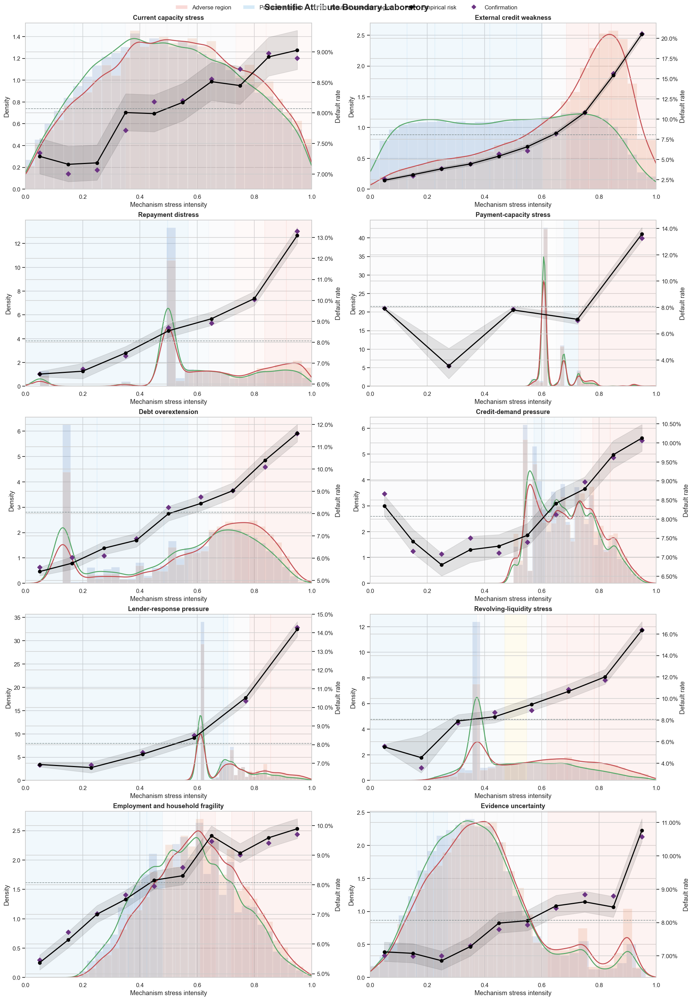

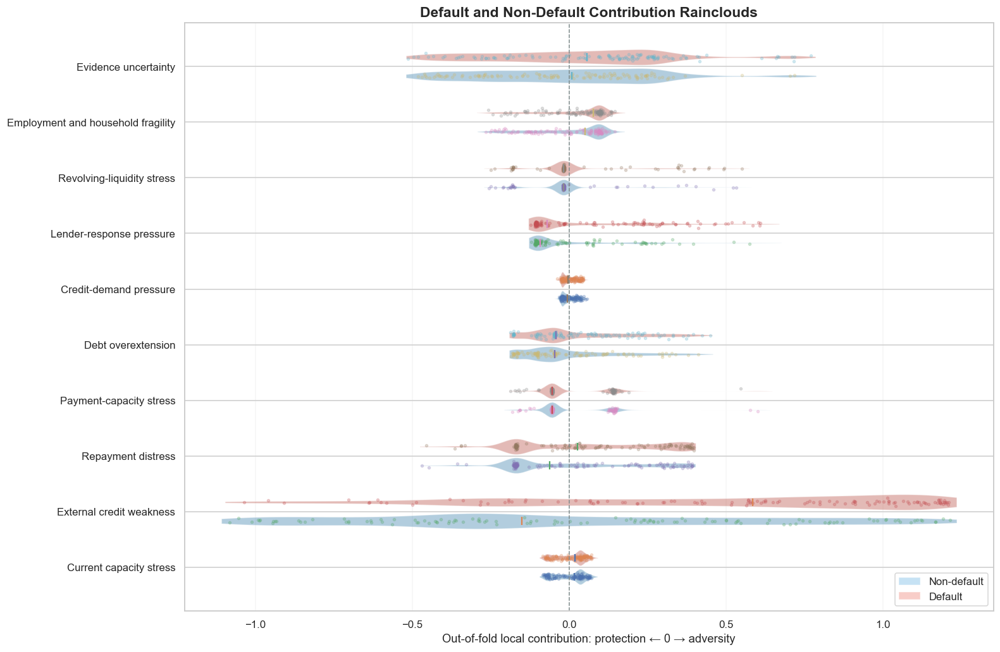

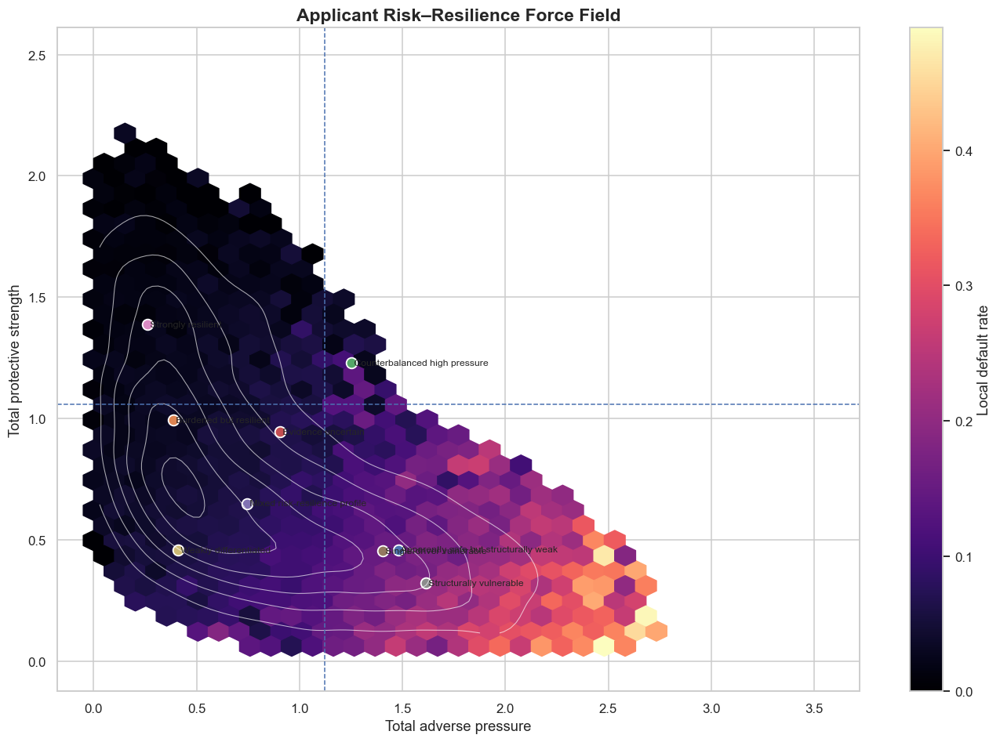

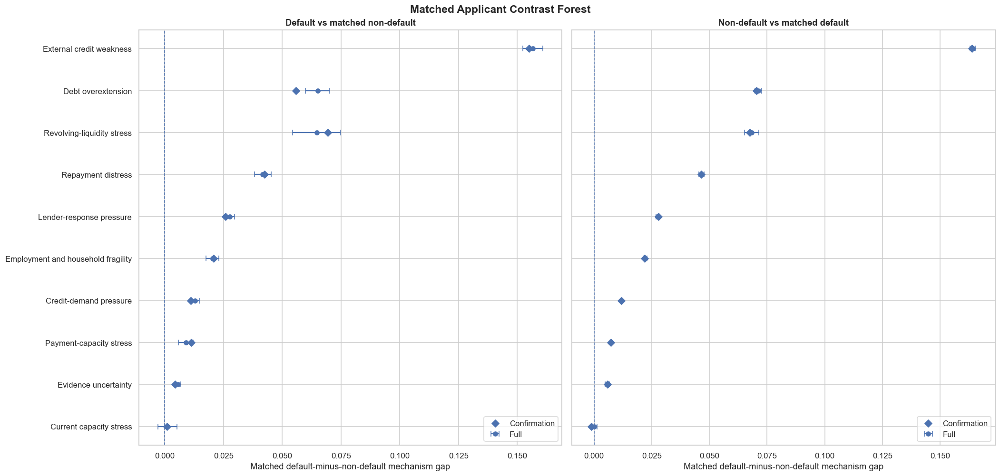

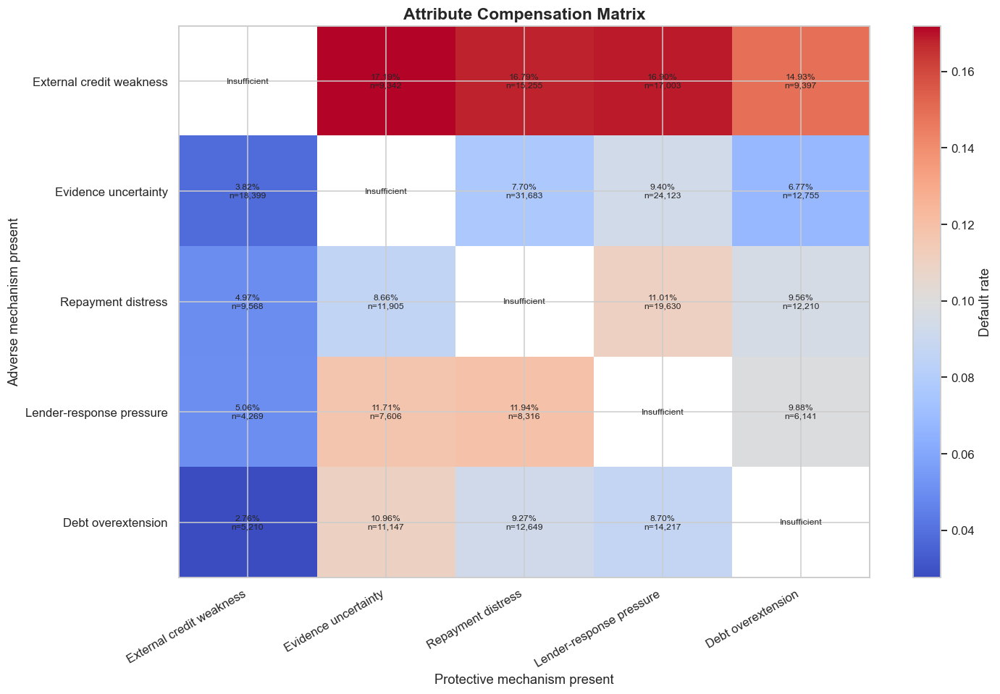

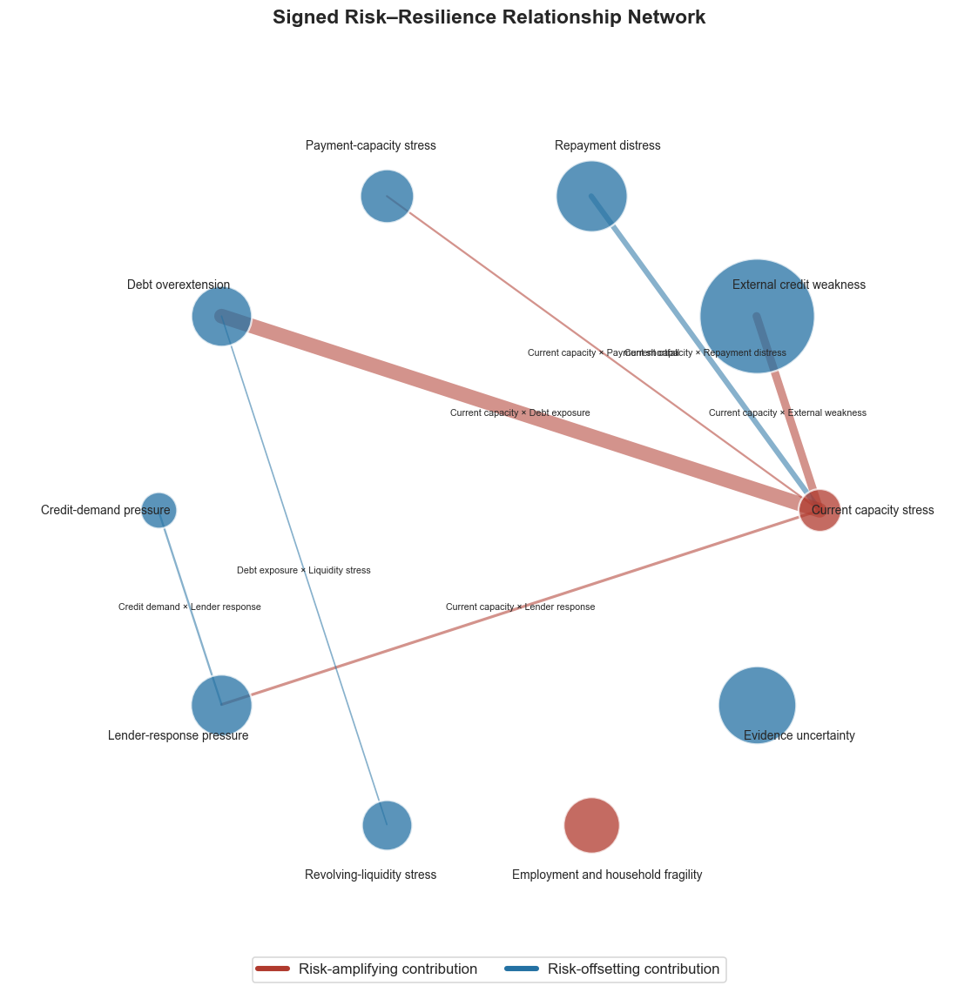

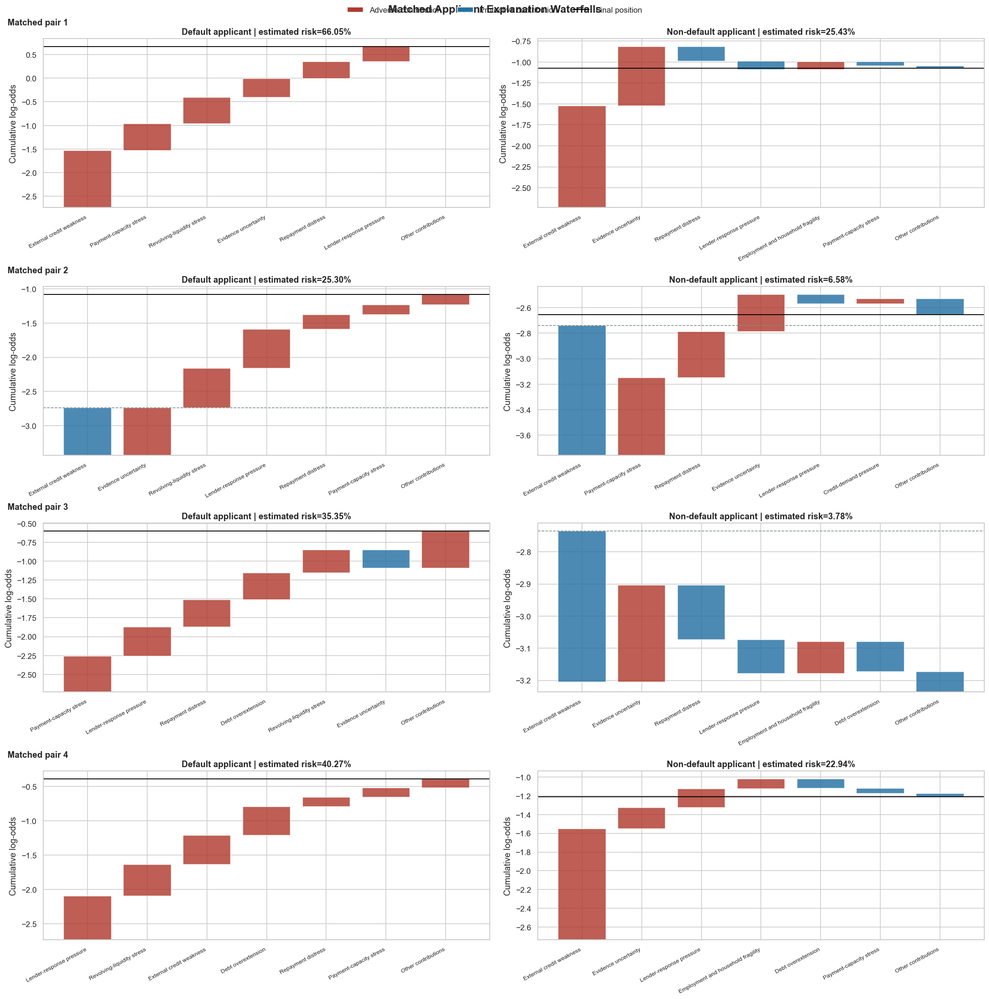

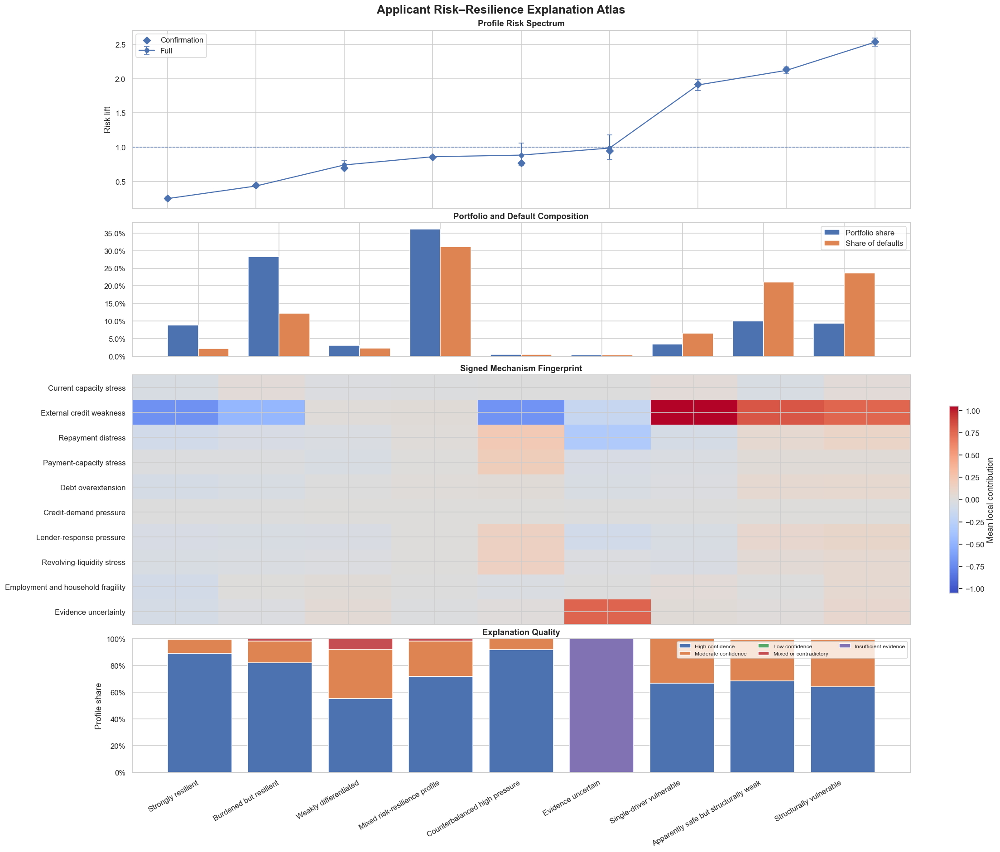

Step 4 applicant risk–resilience attribution completed successfully.
Prepared applicants: 307,511 | Portfolio baseline: 8.07%
Tables: Relationship_report\Tables\Step_4_Risk_Resilience_Attribution
Figures: Relationship_report\Figures\Step_4_Risk_Resilience_Attribution


,sample,applicant_count,default_rate,roc_auc,log_loss,brier_score
0,Discovery OOF,199882,0.0807,0.7325,0.2541,0.0697
1,Confirmation,107629,0.0807,0.7317,0.2542,0.0697
2,Full,307511,0.0807,0.7322,0.2541,0.0697


,mechanism,label,validated_adverse_bins,validated_protective_bins,uncertain_or_contradictory_bins,confirmation_matched_gap,mean_absolute_contribution,decision
0,current_capacity_stress,Current capacity stress,2,3,0,0.0009,0.0419,retain_bidirectional
1,external_credit_weakness,External credit weakness,3,6,0,0.1549,0.5503,retain_bidirectional
2,repayment_distress,Repayment distress,3,3,0,0.0424,0.1887,retain_bidirectional
3,payment_capacity_stress,Payment-capacity stress,1,1,1,0.0045,0.0889,retain_bidirectional
4,debt_overextension,Debt overextension,4,4,0,0.0558,0.1239,retain_bidirectional
5,credit_demand_pressure,Credit-demand pressure,3,5,0,0.0111,0.0197,retain_bidirectional
6,lender_response_pressure,Lender-response pressure,2,3,0,0.0257,0.1279,retain_bidirectional
7,revolving_liquidity_stress,Revolving-liquidity stress,3,2,2,0.0694,0.0732,retain_bidirectional
8,employment_household_fragility,Employment and household fragility,4,3,0,0.0207,0.1015,retain_bidirectional
9,evidence_uncertainty,Evidence uncertainty,1,4,0,0.0112,0.2312,retain_bidirectional


,applicant_risk_resilience_profile,applicant_count,default_count,mean_adverse_pressure,mean_protective_strength,mean_net_balance,high_confidence_share,default_rate,ci_low,ci_high,risk_lift,portfolio_share,default_contribution,sample
0,Structurally vulnerable,28685,5866,1.6623,0.3263,1.3360,0.6404,0.2045,0.1999,0.2092,2.5331,0.0933,0.2363,Full
1,Apparently safe but structurally weak,30652,5249,1.5530,0.4771,1.0759,0.6862,0.1712,0.1671,0.1755,2.1212,0.0997,0.2114,Full
2,Single-driver vulnerable,10567,1628,1.4161,0.4761,0.9401,0.6670,0.1541,0.1473,0.1611,1.9084,0.0344,0.0656,Full
3,Evidence uncertain,1343,107,1.1501,1.0746,0.0755,0.0000,0.0797,0.0664,0.0954,0.9869,0.0044,0.0043,Full
4,Counterbalanced high pressure,1541,110,1.2976,1.2691,0.0285,0.9189,0.0714,0.0596,0.0853,0.8842,0.0050,0.0044,Full
5,Mixed risk-resilience profile,111066,7714,0.7320,0.6829,0.0491,0.7187,0.0695,0.0680,0.0710,0.8603,0.3612,0.3107,Full
6,Weakly differentiated,9416,563,0.3805,0.4461,-0.0656,0.5540,0.0598,0.0552,0.0648,0.7407,0.0306,0.0227,Full
7,Burdened but resilient,87077,3042,0.4076,1.0397,-0.6321,0.8222,0.0349,0.0337,0.0362,0.4327,0.2832,0.1225,Full
8,Strongly resilient,27164,546,0.2578,1.4196,-1.1619,0.8939,0.0201,0.0185,0.0218,0.2490,0.0883,0.0220,Full


,SK_ID_CURR,TARGET,current_capacity_stress,external_credit_weakness,repayment_distress,payment_capacity_stress,debt_overextension,credit_demand_pressure,lender_response_pressure,revolving_liquidity_stress,employment_household_fragility,evidence_uncertainty,estimated_default_probability,primary_risk_attribute,secondary_risk_attribute,primary_protective_attribute,secondary_protective_attribute,dominant_risk_pathway,dominant_resilience_pathway,total_adverse_pressure,total_protective_strength,net_risk_balance,risk_driver_count,protective_driver_count,counterbalance_flag,evidence_reliability,primary_risk_stability,primary_protection_stability,applicant_risk_resilience_profile,explanation_confidence,explanation_text
0,100002,1,0.1976,0.8574,0.7289,0.6077,0.5655,0.5498,0.6121,NaN,0.5049,0.2588,0.1021,External credit weakness,Repayment distress,Evidence uncertainty,Lender-response pressure,Current capacity × External weakness,Current capacity × Repayment distress,1.1453,0.5846,0.5607,1,3,0,0.7839,1.0000,1.0000,Apparently safe but structurally weak,High confidence,Observed outcome: defaulted. Primary adverse attribute: External credit weakness. Primary protective attribute: Evid...
1,100003,0,0.2676,0.6490,0.4976,0.6077,0.2759,0.5927,0.6121,NaN,0.5287,0.3718,0.0495,External credit weakness,Evidence uncertainty,Repayment distress,Debt overextension,Current capacity × Debt exposure,Current capacity × Payment shortfall,0.3432,0.5650,-0.2219,0,3,0,0.7135,1.0000,1.0000,Weakly differentiated,Moderate confidence,Observed outcome: did not default. Primary adverse attribute: External credit weakness. Primary protective attribute...
2,100004,0,0.2922,0.2488,0.4976,0.6077,0.1301,0.5498,0.6121,NaN,0.7619,0.5535,0.0296,Evidence uncertainty,Employment and household fragility,External credit weakness,Debt overextension,Current capacity × Debt exposure,Current capacity × External weakness,0.4110,1.1670,-0.7560,2,6,0,0.6053,1.0000,1.0000,Strongly resilient,Moderate confidence,Observed outcome: did not default. Primary adverse attribute: Evidence uncertainty. Primary protective attribute: Ex...
3,100006,0,0.6537,0.1650,0.4976,0.6774,NaN,0.7966,0.7512,0.3731,0.5092,0.6495,0.0345,Evidence uncertainty,Payment-capacity stress,External credit weakness,Revolving-liquidity stress,Current capacity × External weakness,Current capacity × Repayment distress,0.5846,1.1810,-0.5964,2,3,0,0.5704,1.0000,1.0000,Burdened but resilient,High confidence,Observed outcome: did not default. Primary adverse attribute: Evidence uncertainty. Primary protective attribute: Ex...
4,100007,0,0.4381,0.8246,0.8416,0.6077,0.1301,0.6328,0.6121,NaN,0.4259,0.4473,0.1307,External credit weakness,Repayment distress,Debt overextension,Employment and household fragility,Current capacity × Debt exposure,Current capacity × Repayment distress,1.3489,0.5089,0.8399,1,3,0,0.6470,1.0000,1.0000,Apparently safe but structurally weak,High confidence,Observed outcome: did not default. Primary adverse attribute: External credit weakness. Primary protective attribute...
5,100008,0,0.8135,0.5896,0.7103,0.6077,0.6180,0.6816,0.6866,NaN,0.6650,0.3017,0.0594,Employment and household fragility,Repayment distress,Evidence uncertainty,Lender-response pressure,Current capacity × Debt exposure,Current capacity × External weakness,0.3272,0.3522,-0.0250,2,1,0,0.7624,0.6667,0.6667,Burdened but resilient,Moderate confidence,Observed outcome: did not default. Primary adverse attribute: Employment and household fragility. Primary protective...
6,100009,0,0.7328,0.2873,0.5443,0.6077,0.7080,0.7538,0.6121,NaN,0.5293,0.1238,0.0225,Current capacity stress,Debt overextension,External credit weakness,Evidence uncertainty,Current capacity × Debt exposure,Current capacity × Repayment distress,0.1246,1.1587,-1.0342,0,2,0,0.8514,0.5333,0.7333,Burdened but resilient,Moderate confidence,Observed outcome: did not default. Primary adverse attribute: Current capacity stress. Primary protective attribute:...
7,100010,0,0.1887,0.2755,0.497

In [14]:
if "train_df" not in globals():
    raise NameError("train_df is not defined. Run the data-loading cell before Step 4.")

ID_COL = globals().get("ID_COL", "SK_ID_CURR")
TARGET_COL = globals().get("TARGET_COL", "TARGET")
RANDOM_SEED = globals().get("RANDOM_SEED", 42)

BASE_OUTPUT_DIR = Path.cwd() / "relationship_outputs"
BASE_TABLE_DIR = Path(globals().get("RELATIONSHIP_TABLE_DIR", BASE_OUTPUT_DIR / "tables"))
BASE_FIGURE_DIR = Path(globals().get("RELATIONSHIP_FIGURE_DIR", BASE_OUTPUT_DIR / "figures"))

STEP4_TABLE_DIR = BASE_TABLE_DIR / "Step_4_Risk_Resilience_Attribution"
STEP4_FIGURE_DIR = BASE_FIGURE_DIR / "Step_4_Risk_Resilience_Attribution"
STEP4_TABLE_DIR.mkdir(parents=True, exist_ok=True)
STEP4_FIGURE_DIR.mkdir(parents=True, exist_ok=True)

STEP4_CONFIG = {"seed": RANDOM_SEED, "discovery_fraction": 0.65, "boundary_bins": 10, "materiality_margin": 0.005, "min_group_count": 500, "min_default_count": 20, "n_splits": 5, "stability_repeats": 3, "spline_knots": 5, "regularization_c": 0.35, "component_coverage_min": 0.20, "contribution_quantile": 0.60, "match_gap_min": 0.05, "match_distance_max": 0.08, "high_pressure_quantile": 0.75, "low_pressure_quantile": 0.40, "dominance_quantile": 0.70, "random_plot_sample": 30000, "alpha": 0.05}

step4_analyzer = ApplicantRiskResilienceAnalyzer(train_df, ID_COL, TARGET_COL, step2_analyzer=globals().get("step2_analyzer"), step3_analyzer=globals().get("step3_analyzer"), config=STEP4_CONFIG).run_all()
step4_plotter = ApplicantRiskResiliencePlotter(step4_analyzer, STEP4_FIGURE_DIR)
step4_plotter.plot_all()
step4_analyzer.export(STEP4_TABLE_DIR)

step4_boundary_evidence = step4_analyzer.results["statistical_boundaries"]
step4_model_metrics = step4_analyzer.results["attribution_model_metrics"]
step4_profile_evidence = step4_analyzer.results["profile_summary"].loc[lambda table: table["sample"].eq("Full")].sort_values("risk_lift", ascending=False).reset_index(drop=True)
step4_risk_resilience_ledger = step4_analyzer.results["risk_resilience_ledger"]
step4_final_attribute_register = step4_analyzer.results["final_attribute_register"]

print("Step 4 applicant risk–resilience attribution completed successfully.")
print(f"Prepared applicants: {len(step4_analyzer.data):,} | Portfolio baseline: {step4_analyzer.baseline:.2%}")
print(f"Tables: {STEP4_TABLE_DIR}")
print(f"Figures: {STEP4_FIGURE_DIR}")

display(step4_model_metrics)
display(step4_final_attribute_register)
display(step4_profile_evidence)
display(step4_risk_resilience_ledger.head(10))

# Step 4: Applicant-Level Risk–Resilience Attribution  
## Summary, Key Observations, and Analytical Success

### Research Objective

Step 4 was designed to explain why financially similar applicants may diverge into default and non-default outcomes.

Rather than assigning one simplified cause to each outcome, the analysis evaluated the simultaneous presence of:

- adverse financial attributes;
- repayment-protective attributes;
- risk-amplifying and risk-offsetting interactions;
- incomplete or contradictory evidence.

The final output is an applicant-level **Risk–Resilience Ledger** that identifies the dominant adverse and protective forces for each applicant.

---

## Analytical Framework

The integrated feature space was compressed into ten financially interpretable mechanisms:

1. Current capacity stress;
2. External credit weakness;
3. Repayment distress;
4. Payment-capacity stress;
5. Debt overextension;
6. Credit-demand pressure;
7. Lender-response pressure;
8. Revolving-liquidity stress;
9. Employment and household fragility;
10. Evidence uncertainty.

The mechanism labels represent financial dimensions. For example, a protective contribution from `External credit weakness` represents low external-credit weakness or strong external-credit quality.

Step 4 combined three complementary analytical layers:

1. **Empirical statistical boundaries** learned from the discovery sample;
2. **Cross-fitted nonlinear local contributions** estimated without using an applicant's own outcome during model fitting;
3. **Matched opposite-outcome comparisons** among applicants with approximately similar application and household contexts.

The discovery sample contained 199,882 applicants, while 107,629 applicants were reserved for confirmation. The full analysis covered 307,511 applicants with an overall default rate of 8.07%.

---

## Model Stability

| Sample | Applicants | ROC-AUC | Log Loss | Brier Score |
|---|---:|---:|---:|---:|
| Discovery out-of-fold | 199,882 | 0.7325 | 0.2541 | 0.0697 |
| Confirmation | 107,629 | 0.7317 | 0.2542 | 0.0697 |
| Full dataset | 307,511 | 0.7322 | 0.2541 | 0.0697 |

The discovery and confirmation ROC-AUC values differed by only 0.0008. This near-identical performance indicates that the attribution framework remained stable when applied to held-out confirmation applicants.

The model is intended as an interpretable attribution framework rather than a final production credit-scoring model.

---

## Key Mechanism Findings

All ten mechanisms were retained as bidirectional mechanisms. This means that the same financial dimension may be adverse at high stress levels and protective at low stress levels.

External credit weakness was the strongest mechanism according to both local contribution magnitude and matched applicant differences.

| Mechanism | Confirmation Matched Gap | Mean Absolute Contribution |
|---|---:|---:|
| External credit weakness | 0.1549 | 0.5503 |
| Revolving-liquidity stress | 0.0694 | 0.0732 |
| Debt overextension | 0.0558 | 0.1239 |
| Repayment distress | 0.0424 | 0.1887 |
| Lender-response pressure | 0.0257 | 0.1279 |
| Employment and household fragility | 0.0207 | 0.1015 |
| Evidence uncertainty | 0.0112 | 0.2312 |
| Credit-demand pressure | 0.0111 | 0.0197 |
| Payment-capacity stress | 0.0045 | 0.0889 |
| Current capacity stress | 0.0009 | 0.0419 |

After approximately matching applicants on loan amount, income, annuity, household size, age, contract type, income type, and evidence availability, the largest remaining differences were associated with external credit quality, revolving liquidity, debt exposure, and repayment history.

Current capacity produced a very small standalone matched gap. However, it remained important through its interactions with external credit weakness, debt exposure, lender response, payment shortfall, and repayment distress. Current affordability therefore appears to operate partly as a financial context or amplifier rather than as the dominant independent separator.

---

## Interpretation of the Main Figures

### 1. Scientific Attribute Boundary Laboratory

The boundary plots identified protective, neutral, and adverse regions for each mechanism.

The confirmation-sample points generally followed the full-sample empirical risk curves, supporting the directional stability of the learned boundaries.

External credit weakness displayed the strongest risk gradient, with observed default rates increasing from approximately 2–4% in the low-stress region to more than 20% in the highest-stress region.

Repayment distress, debt overextension, lender-response pressure, revolving-liquidity stress, and employment fragility also displayed meaningful increases in default risk as mechanism stress intensified.

---

### 2. Default and Non-Default Contribution Rainclouds

The raincloud distributions showed the complete out-of-fold local contribution patterns for default and non-default applicants.

Default applicants were generally shifted toward adverse contributions, while non-default applicants were more frequently positioned on the protective side.

External credit weakness produced the clearest separation. Repayment distress, debt overextension, lender-response pressure, revolving-liquidity stress, and evidence uncertainty also contributed meaningful differentiation.

The distributions still overlapped substantially, demonstrating that no individual mechanism deterministically explains default.

---

### 3. Applicant Risk–Resilience Force Field

Applicants were positioned according to:

- total adverse pressure;
- total protective strength;
- local observed default rate.

Default risk increased as adverse pressure rose and protective strength declined. However, substantial protective strength reduced observed default risk even among applicants carrying meaningful financial burdens.

This result supports the central premise that risk and resilience should be modelled as separate but interacting dimensions.

---

### 4. Matched Applicant Contrast Forest

The matched comparison showed that financially similar default and non-default applicants remained most differentiated by:

- external credit weakness;
- revolving-liquidity stress;
- debt overextension;
- repayment distress;
- lender-response pressure.

The result indicates that outcome divergence is not explained by current affordability alone. Historical credit quality, debt structure, and repayment behaviour provide important additional differentiation.

The matching analysis is diagnostic and should not be interpreted as a causal estimate.

---

### 5. Attribute Compensation Matrix

The compensation matrix demonstrated that protective mechanisms may offset adverse mechanisms.

Strong external-credit quality was the most effective observed compensator:

- Evidence uncertainty with strong external credit: 3.82% default rate;
- Repayment distress with strong external credit: 4.97%;
- Lender-response pressure with strong external credit: 5.06%;
- Debt overextension with strong external credit: 2.76%.

In contrast, severe external-credit weakness remained associated with default rates of approximately 15–17%, even when another protective mechanism was present.

This suggests that strong external-credit evidence can absorb several forms of financial pressure, while severe external-credit weakness is comparatively difficult to offset.

---

### 6. Signed Risk–Resilience Relationship Network

The network separated direct mechanism importance from compound interaction pathways.

External credit weakness formed the largest mechanism node, followed by repayment distress and evidence uncertainty.

Current capacity was connected to several pre-specified interactions, including:

- Current capacity × External weakness;
- Current capacity × Debt exposure;
- Current capacity × Lender response;
- Current capacity × Payment shortfall;
- Current capacity × Repayment distress.

The network showed that interactions do not uniformly amplify risk. Depending on the applicant's position, some interactions produced average risk-amplifying contributions while others produced risk-offsetting contributions.

These signs represent modelled contribution patterns and should not be interpreted as causal relationships.

---

### 7. Matched Applicant Explanation Waterfalls

The matched waterfalls translated the statistical model into individual applicant explanations.

For each applicant, the figures showed:

- adverse contributions;
- protective contributions;
- cumulative log-odds;
- final estimated default probability.

Across the illustrated matched pairs, the estimated probabilities were:

| Pair | Default Applicant | Matched Non-Default Applicant |
|---|---:|---:|
| 1 | 66.05% | 25.43% |
| 2 | 25.30% | 6.58% |
| 3 | 35.35% | 3.78% |
| 4 | 40.27% | 22.94% |

The waterfalls demonstrated that a default applicant may still possess protective attributes and that a non-default applicant may still carry material adverse pressure.

---

### 8. Applicant Risk–Resilience Explanation Atlas

The atlas combined profile risk, portfolio composition, signed mechanism fingerprints, and explanation quality.

The most vulnerable profiles were:

| Profile | Applicants | Default Rate | Risk Lift | Portfolio Share | Share of Defaults |
|---|---:|---:|---:|---:|---:|
| Structurally vulnerable | 28,685 | 20.45% | 2.53× | 9.33% | 23.63% |
| Apparently safe but structurally weak | 30,652 | 17.12% | 2.12× | 9.97% | 21.14% |
| Single-driver vulnerable | 10,567 | 15.41% | 1.91× | 3.44% | 6.56% |

The `Structurally vulnerable` and `Apparently safe but structurally weak` profiles represented only 19.30% of applicants but accounted for 44.77% of all observed defaults.

The `Apparently safe but structurally weak` profile is particularly important. These applicants may appear manageable from a current-capacity perspective but contain hidden external-credit, repayment, lender-response, or liquidity weakness.

The strongest resilience profiles were:

| Profile | Applicants | Default Rate | Risk Lift |
|---|---:|---:|---:|
| Burdened but resilient | 87,077 | 3.49% | 0.43× |
| Strongly resilient | 27,164 | 2.01% | 0.25× |
| Weakly differentiated | 9,416 | 5.98% | 0.74× |

The `Burdened but resilient` profile demonstrates that financial burden alone does not imply high default risk. Strong protective evidence can materially offset adverse pressure.

---

## Applicant-Level Outputs

The final Risk–Resilience Ledger contains:

- primary and secondary adverse attributes;
- primary and secondary protective attributes;
- dominant compound risk pathway;
- dominant compound resilience pathway;
- total adverse pressure;
- total protective strength;
- net risk balance;
- risk-driver and protective-driver counts;
- evidence reliability;
- contribution stability;
- risk–resilience profile;
- explanation confidence;
- natural-language applicant explanation.

---

## Overall Analytical Success

Step 4 successfully transformed the prior multivariate findings into a stable and interpretable applicant-level attribution system.

Its main achievements were:

1. compressing a high-dimensional feature space into ten financially interpretable mechanisms;
2. maintaining nearly identical discrimination in discovery and confirmation samples;
3. validating adverse and protective regions for all ten mechanisms;
4. separating direct mechanism effects from compound interactions;
5. identifying hidden-risk applicants who appear safe under current-capacity measures;
6. quantifying resilience rather than analysing risk alone;
7. explaining divergence among approximately similar applicants;
8. concentrating 44.77% of defaults within 19.30% of applicants;
9. generating individual adverse, protective, interaction, reliability, and confidence outputs;
10. exporting a complete applicant-level Risk–Resilience Ledger.

---

## Interpretation Boundary

The findings represent statistically supported associations within observational data.

They should not be interpreted as:

- causal effects;
- deterministic explanations of default;
- final production credit decisions;
- automatic approval or rejection rules.

The attribution ROC-AUC of approximately 0.732 indicates meaningful but incomplete discrimination. Some default and non-default applicants remain observationally similar, and some outcomes remain unexpected.

Nine profiles were populated under the current thresholds. The predefined `Compound financial distress` profile was not materially populated and may require threshold or profile-rule review in a later refinement stage.

### Final Conclusion

Step 4 was successful as an interpretable risk–resilience attribution framework.

It moved the project beyond predicting whether an applicant may default and toward explaining:

> which mechanisms increased risk, which mechanisms supported resilience, how those mechanisms interacted, and how confidently the resulting applicant-level explanation could be trusted.

# Step 5: Temporal Financial Deterioration, Persistence, Recovery, and Tipping States

## Distinguishing Static Financial Stress from Dynamic Financial Direction

---

## Research Purpose

Step 4 developed an applicant-level risk–resilience attribution framework. It identified the financial mechanisms that currently increase applicant risk, the mechanisms that provide protection, and the interactions that help explain why financially similar applicants may diverge into default and non-default outcomes.

However, Step 4 primarily represents the applicant's current or aggregated financial position.

Two applicants may currently have a similar level of financial stress while following completely different financial journeys:

- one applicant may be rapidly deteriorating;
- one may have remained persistently distressed;
- one may be recovering from previous financial pressure;
- one may have improved temporarily and then relapsed;
- one may have highly volatile behaviour;
- one may not have enough historical evidence to support a reliable temporal conclusion.

Step 5 therefore changes the analytical question from:

> **Where is the applicant currently positioned?**

to:

> **In which direction has the applicant's financial condition been moving, and does that direction provide additional default-risk information beyond the static Step 4 attribution?**

---

## Primary Research Question

> **Does financial deterioration, persistence, recovery, relapse, or cross-source synchronisation provide additional default-risk information beyond the applicant's current static risk–resilience position?**

---

## Core Research Hypotheses

### H1 — Recent Deterioration Hypothesis

Within a comparable static Step 4 pressure level, applicants whose financial condition is deteriorating should have a higher confirmed default rate than applicants whose condition is stable or recovering.

### H2 — Persistence Hypothesis

Financial stress that remains elevated across multiple non-overlapping periods should be more adverse than an isolated recent disruption.

### H3 — Recovery Hypothesis

Applicants whose recent financial behaviour improves should have lower confirmed risk than applicants with persistent distress at a comparable historical stress level.

### H4 — Cross-Source Synchronisation Hypothesis

Simultaneous deterioration across several financial sources should be more informative than deterioration observed in only one source.

### H5 — Incremental-Information Hypothesis

Temporal mechanism evidence should add predictive, calibration, or portfolio-concentration information beyond the Step 4 static attribution probability.

---

## Temporal Reconstruction Principle

The integrated dataset contains nested cumulative windows such as:

- recent 6 months;
- recent 12 months;
- recent 24 months;
- lifetime history.

These windows overlap and must not be interpreted as independent periods.

For mathematically compatible count, sum, and support variables, Step 5 reconstructs non-overlapping temporal periods:

- **Recent period:** 0–6 months or 0–12 months, depending on source availability;
- **Intermediate period:** 7–24 months or 13–24 months;
- **Historical period:** more than 24 months.

For example:

```text
Intermediate count = Recent 24-month count − Recent 6/12-month count
Historical count = Lifetime count − Recent 24-month count

In [15]:
import math
import warnings
from pathlib import Path
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from matplotlib import colors
from matplotlib.gridspec import GridSpec
from matplotlib.path import Path as MplPath
from matplotlib.patches import PathPatch, Rectangle
from matplotlib.lines import Line2D
from scipy import stats
from statsmodels.stats.proportion import proportion_confint
from sklearn.base import clone
from sklearn.impute import SimpleImputer
from sklearn.pipeline import Pipeline
from sklearn.preprocessing import StandardScaler
from sklearn.linear_model import LogisticRegression
from sklearn.model_selection import StratifiedKFold
from sklearn.metrics import roc_auc_score, average_precision_score, log_loss, brier_score_loss
from IPython.display import display

class TemporalFinancialStateAnalyzer:
    """
    Step 5 analysis engine.

    Reconstructs mathematically valid non-overlapping temporal evidence,
    produces period-specific mechanism scores, classifies applicant temporal
    states, validates direction/persistence/recovery hypotheses, compares
    incremental information over Step 4, and exports an applicant-level
    Temporal Risk–Resilience Journey Ledger.
    """

    PERIODS = ("historical", "intermediate", "recent")

    def __init__(self, data, id_col, target_col, step4_analyzer, config=None):
        self.raw_data = data
        self.id_col = id_col
        self.target_col = target_col
        self.step4_analyzer = step4_analyzer
        self.config = self._build_config(config)
        self.signal_specs = self._signal_registry()
        self.mechanism_labels = {"repayment_deterioration": "Repayment deterioration", "revolving_liquidity_deterioration": "Revolving-liquidity deterioration", "lender_response_deterioration": "Lender-response deterioration", "debt_exposure_deterioration": "Debt-exposure deterioration"}
        self.mechanism_weights = {"repayment_deterioration": 1.25, "revolving_liquidity_deterioration": 1.10, "lender_response_deterioration": 1.00, "debt_exposure_deterioration": 1.00}
        self.results = {}
        self.data = pd.DataFrame(index=data.index)
        self.discovery_index = pd.Index([])
        self.confirmation_index = pd.Index([])
        self.signal_reference = {}
        self.state_rules = {}
        self.baseline = np.nan
        self.discovery_baseline = np.nan
        self.confirmation_baseline = np.nan

    def _build_config(self, config):
        defaults = {"seed": 42, "discovery_fraction": 0.65, "n_splits": 5, "regularization_c": 0.50, "min_period_support": 1.00, "min_state_count": 300, "min_default_count": 15, "min_surface_count": 120, "surface_bins": 9, "direction_minimum": 0.05, "direction_quantile": 0.65, "acceleration_quantile": 0.70, "volatility_quantile": 0.75, "low_level_quantile": 0.33, "high_level_quantile": 0.67, "evidence_minimum": 0.35, "plot_sample": 50000, "bootstrap_iterations": 200, "alpha": 0.05}
        if config:
            defaults.update(config)
        return defaults

    def _signal_registry(self):
        return [
            {"signal": "installment_late_rate", "label": "Installment late-payment rate", "mechanism": "repayment_deterioration", "source": "Installments", "kind": "rate", "recent_months": 6, "weight": 1.25, "num_life": "inst_is_late_count_sum", "den_life": "inst_payment_row_count_sum", "num_recent": "inst_recent_6m_late_count_sum", "den_recent": "inst_is_recent_6m_count_sum", "num_24m": "inst_recent_24m_late_count_sum", "den_24m": "inst_is_recent_24m_count_sum"},
            {"signal": "installment_underpayment_rate", "label": "Installment underpayment rate", "mechanism": "repayment_deterioration", "source": "Installments", "kind": "rate", "recent_months": 6, "weight": 1.10, "num_life": "inst_is_underpaid_count_sum", "den_life": "inst_payment_row_count_sum", "num_recent": "inst_recent_6m_underpaid_count_sum", "den_recent": "inst_is_recent_6m_count_sum", "num_24m": "inst_recent_24m_underpaid_count_sum", "den_24m": "inst_is_recent_24m_count_sum"},
            {"signal": "pos_dpd_rate", "label": "POS days-past-due rate", "mechanism": "repayment_deterioration", "source": "POS cash", "kind": "rate", "recent_months": 6, "weight": 1.00, "num_life": "pos_has_dpd_count_sum", "den_life": "pos_month_record_count_sum", "num_recent": "pos_recent_6m_has_dpd_count_sum", "den_recent": "pos_is_recent_6m_count_sum", "num_24m": "pos_recent_24m_has_dpd_count_sum", "den_24m": "pos_is_recent_24m_count_sum"},
            {"signal": "pos_severe_dpd_rate", "label": "POS severe DPD rate", "mechanism": "repayment_deterioration", "source": "POS cash", "kind": "rate", "recent_months": 6, "weight": 1.05, "num_life": "pos_has_dpd_def_count_sum", "den_life": "pos_month_record_count_sum", "num_recent": "pos_recent_6m_has_dpd_def_count_sum", "den_recent": "pos_is_recent_6m_count_sum", "num_24m": "pos_recent_24m_has_dpd_def_count_sum", "den_24m": "pos_is_recent_24m_count_sum"},
            {"signal": "credit_card_dpd_rate", "label": "Credit-card DPD rate", "mechanism": "repayment_deterioration", "source": "Credit card", "kind": "rate", "recent_months": 6, "weight": 1.10, "num_life": "cc_has_dpd_count_sum", "den_life": "cc_month_record_count_sum", "num_recent": "cc_recent_6m_has_dpd_count_sum", "den_recent": "cc_is_recent_6m_count_sum", "num_24m": "cc_recent_24m_has_dpd_count_sum", "den_24m": "cc_is_recent_24m_count_sum"},
            {"signal": "credit_card_severe_dpd_rate", "label": "Credit-card severe DPD rate", "mechanism": "repayment_deterioration", "source": "Credit card", "kind": "rate", "recent_months": 6, "weight": 1.10, "num_life": "cc_has_dpd_def_count_sum", "den_life": "cc_month_record_count_sum", "num_recent": "cc_recent_6m_has_dpd_def_count_sum", "den_recent": "cc_is_recent_6m_count_sum", "num_24m": "cc_recent_24m_has_dpd_def_count_sum", "den_24m": "cc_is_recent_24m_count_sum"},
            {"signal": "credit_card_high_utilization_rate", "label": "Credit-card high-utilisation rate", "mechanism": "revolving_liquidity_deterioration", "source": "Credit card", "kind": "rate", "recent_months": 6, "weight": 1.20, "num_life": "cc_high_utilization_80plus_count_sum", "den_life": "cc_month_record_count_sum", "num_recent": "cc_recent_6m_high_utilization_80plus_count_sum", "den_recent": "cc_is_recent_6m_count_sum", "num_24m": "cc_recent_24m_high_utilization_80plus_count_sum", "den_24m": "cc_is_recent_24m_count_sum"},
            {"signal": "credit_card_payment_shortfall_rate", "label": "Credit-card payment-below-minimum rate", "mechanism": "revolving_liquidity_deterioration", "source": "Credit card", "kind": "rate", "recent_months": 6, "weight": 1.25, "num_life": "cc_payment_less_than_min_instalment_count_sum", "den_life": "cc_month_record_count_sum", "num_recent": "cc_recent_6m_payment_less_than_min_count_sum", "den_recent": "cc_is_recent_6m_count_sum", "num_24m": "cc_recent_24m_payment_less_than_min_count_sum", "den_24m": "cc_is_recent_24m_count_sum"},
            {"signal": "previous_refusal_rate", "label": "Previous-application refusal rate", "mechanism": "lender_response_deterioration", "source": "Previous applications", "kind": "rate", "recent_months": 12, "weight": 1.20, "num_life": "prev_refused_application_count", "den_life": "prev_application_count", "num_recent": "prev_refused_recent_12m_count", "den_recent": "prev_recent_12m_count", "num_24m": "prev_refused_recent_24m_count", "den_24m": "prev_recent_24m_count"},
            {"signal": "bureau_debt_per_credit", "label": "Bureau debt per credit record", "mechanism": "debt_exposure_deterioration", "source": "Bureau", "kind": "amount_average", "recent_months": 12, "weight": 1.10, "num_life": "bureau_debt_amount_sum", "den_life": "bureau_record_count", "num_recent": "bureau_recent_12m_debt_amount_sum", "den_recent": "bureau_recent_12m_count", "num_24m": "bureau_recent_24m_debt_amount_sum", "den_24m": "bureau_recent_24m_count"},
            {"signal": "bureau_overdue_per_credit", "label": "Bureau overdue amount per credit record", "mechanism": "debt_exposure_deterioration", "source": "Bureau", "kind": "amount_average", "recent_months": 12, "weight": 1.20, "num_life": "bureau_overdue_amount_sum", "den_life": "bureau_record_count", "num_recent": "bureau_recent_12m_overdue_amount_sum", "den_recent": "bureau_recent_12m_count", "num_24m": "bureau_recent_24m_overdue_amount_sum", "den_24m": "bureau_recent_24m_count"}
        ]

    def _validate_inputs(self):
        if self.id_col not in self.raw_data.columns:
            raise KeyError(f"Missing applicant ID column: {self.id_col}")
        if self.target_col not in self.raw_data.columns:
            raise KeyError(f"Missing target column: {self.target_col}")
        if self.step4_analyzer is None:
            raise ValueError("Step 5 requires the completed step4_analyzer object.")
        if not hasattr(self.step4_analyzer, "data"):
            raise AttributeError("step4_analyzer.data is unavailable. Run Step 4 first.")
        if not self.raw_data.index.equals(self.step4_analyzer.data.index):
            raise ValueError("train_df and step4_analyzer.data do not share the same row index/order.")
        required = set()
        for spec in self.signal_specs:
            required.update(spec[key] for key in ("num_life", "den_life", "num_recent", "den_recent", "num_24m", "den_24m"))
        missing = sorted(required.difference(self.raw_data.columns))
        if missing:
            raise KeyError("Step 5 temporal reconstruction is missing required integrated features:\n- " + "\n- ".join(missing))
        step4_required = {"estimated_default_probability", "total_adverse_pressure", "total_protective_strength", "external_credit_weakness", "payment_capacity_stress", "debt_overextension"}
        missing_step4 = sorted(step4_required.difference(self.step4_analyzer.data.columns))
        if missing_step4:
            raise KeyError("Step 4 output is missing required fields:\n- " + "\n- ".join(missing_step4))

    def _reuse_split(self):
        if hasattr(self.step4_analyzer, "discovery_index") and len(self.step4_analyzer.discovery_index) > 0 and hasattr(self.step4_analyzer, "confirmation_index") and len(self.step4_analyzer.confirmation_index) > 0:
            self.discovery_index = pd.Index(self.step4_analyzer.discovery_index)
            self.confirmation_index = pd.Index(self.step4_analyzer.confirmation_index)
        else:
            rng = np.random.default_rng(self.config["seed"])
            y = self.raw_data[self.target_col].to_numpy(dtype=int)
            discovery_positions = []
            confirmation_positions = []
            for outcome in np.unique(y):
                positions = np.where(y == outcome)[0]
                rng.shuffle(positions)
                cut = int(round(len(positions) * self.config["discovery_fraction"]))
                discovery_positions.extend(positions[:cut])
                confirmation_positions.extend(positions[cut:])
            self.discovery_index = self.raw_data.index[np.sort(discovery_positions)]
            self.confirmation_index = self.raw_data.index[np.sort(confirmation_positions)]
        self.data[self.id_col] = self.raw_data[self.id_col].values
        self.data[self.target_col] = self.raw_data[self.target_col].astype("Int8").values
        self.data["analysis_sample"] = np.where(self.data.index.isin(self.discovery_index), "Discovery", "Confirmation")
        self.baseline = float(self.data[self.target_col].mean())
        self.discovery_baseline = float(self.data.loc[self.discovery_index, self.target_col].mean())
        self.confirmation_baseline = float(self.data.loc[self.confirmation_index, self.target_col].mean())

    @staticmethod
    def _numeric(series):
        return pd.to_numeric(series, errors="coerce").replace([np.inf, -np.inf], np.nan)

    @staticmethod
    def _safe_ratio(numerator, denominator, minimum_support=1.00):
        numerator = pd.to_numeric(numerator, errors="coerce")
        denominator = pd.to_numeric(denominator, errors="coerce")
        valid = denominator.notna() & numerator.notna() & denominator.ge(minimum_support)
        result = pd.Series(np.nan, index=numerator.index, dtype="float64")
        result.loc[valid] = numerator.loc[valid] / denominator.loc[valid]
        return result.replace([np.inf, -np.inf], np.nan)

    def _reconstruct_signal(self, spec):
        n_life = self._numeric(self.raw_data[spec["num_life"]]).clip(lower=0)
        d_life = self._numeric(self.raw_data[spec["den_life"]]).clip(lower=0)
        n_recent = self._numeric(self.raw_data[spec["num_recent"]]).clip(lower=0)
        d_recent = self._numeric(self.raw_data[spec["den_recent"]]).clip(lower=0)
        n_24m = self._numeric(self.raw_data[spec["num_24m"]]).clip(lower=0)
        d_24m = self._numeric(self.raw_data[spec["den_24m"]]).clip(lower=0)
        num_nested_violation = ((n_recent > n_24m + 1e-09) | (n_24m > n_life + 1e-09)) & n_recent.notna() & n_24m.notna() & n_life.notna()
        den_nested_violation = ((d_recent > d_24m + 1e-09) | (d_24m > d_life + 1e-09)) & d_recent.notna() & d_24m.notna() & d_life.notna()
        n_mid = n_24m - n_recent
        d_mid = d_24m - d_recent
        n_hist = n_life - n_24m
        d_hist = d_life - d_24m
        invalid_mid = (n_mid < -1e-09) | (d_mid < -1e-09)
        invalid_hist = (n_hist < -1e-09) | (d_hist < -1e-09)
        n_mid = n_mid.mask(invalid_mid)
        d_mid = d_mid.mask(invalid_mid)
        n_hist = n_hist.mask(invalid_hist)
        d_hist = d_hist.mask(invalid_hist)
        minimum = self.config["min_period_support"]
        recent = self._safe_ratio(n_recent, d_recent, minimum)
        intermediate = self._safe_ratio(n_mid, d_mid, minimum)
        historical = self._safe_ratio(n_hist, d_hist, minimum)
        if spec["kind"] == "rate":
            recent = recent.clip(0, 1)
            intermediate = intermediate.clip(0, 1)
            historical = historical.clip(0, 1)
        elif spec["kind"] == "amount_average":
            recent = np.log1p(recent.clip(lower=0))
            intermediate = np.log1p(intermediate.clip(lower=0))
            historical = np.log1p(historical.clip(lower=0))
        recent_window = f"0–{spec['recent_months']} months"
        intermediate_window = f"{spec['recent_months'] + 1}–24 months"
        audit = {"signal": spec["signal"], "label": spec["label"], "mechanism": spec["mechanism"], "source": spec["source"], "statistic_type": spec["kind"], "recent_window": recent_window, "intermediate_window": intermediate_window, "historical_window": ">24 months", "numerator_nesting_violations": int(num_nested_violation.sum()), "denominator_nesting_violations": int(den_nested_violation.sum()), "invalid_intermediate_differences": int(invalid_mid.sum()), "invalid_historical_differences": int(invalid_hist.sum()), "historical_coverage": float(historical.notna().mean()), "intermediate_coverage": float(intermediate.notna().mean()), "recent_coverage": float(recent.notna().mean()), "reconstruction_status": "VALID_NON_OVERLAPPING_RECONSTRUCTION" if int(num_nested_violation.sum() + den_nested_violation.sum()) == 0 else "VALID_WITH_ROW_LEVEL_NESTING_EXCLUSIONS"}
        support = pd.DataFrame({"historical": d_hist, "intermediate": d_mid, "recent": d_recent}, index=self.raw_data.index)
        values = pd.DataFrame({"historical": historical, "intermediate": intermediate, "recent": recent}, index=self.raw_data.index)
        return values, support, audit

    def _reconstruct_all_signals(self):
        registry_records = []
        audit_records = []
        for spec in self.signal_specs:
            values, support, audit = self._reconstruct_signal(spec)
            signal = spec["signal"]
            for period in self.PERIODS:
                self.data[f"{signal}_{period}_raw"] = values[period].astype("float32")
                self.data[f"{signal}_{period}_support"] = support[period].astype("float32")
            registry_records.append({"signal": signal, "label": spec["label"], "mechanism": spec["mechanism"], "source": spec["source"], "weight": spec["weight"], "statistic_type": spec["kind"], "recent_window": f"0–{spec['recent_months']} months", "intermediate_window": f"{spec['recent_months'] + 1}–24 months", "historical_window": ">24 months", "numerator_lifetime": spec["num_life"], "denominator_lifetime": spec["den_life"], "numerator_recent": spec["num_recent"], "denominator_recent": spec["den_recent"], "numerator_24m": spec["num_24m"], "denominator_24m": spec["den_24m"]})
            audit_records.append(audit)
        self.results["temporal_feature_registry"] = pd.DataFrame(registry_records)
        self.results["nonoverlap_reconstruction_audit"] = pd.DataFrame(audit_records)

    @staticmethod
    def _percentile_apply(values, reference):
        values = pd.to_numeric(values, errors="coerce")
        result = pd.Series(np.nan, index=values.index, dtype="float64")
        if reference is None or len(reference) == 0:
            return result
        mask = values.notna()
        if not mask.any():
            return result
        arr = values.loc[mask].to_numpy(dtype=float)
        if len(reference) == 1 or reference[0] == reference[-1]:
            result.loc[mask] = 0.00
            return result
        left = np.searchsorted(reference, arr, side="left")
        right = np.searchsorted(reference, arr, side="right")
        midrank = (left + right - 1) / 2
        result.loc[mask] = midrank / max(len(reference) - 1, 1)
        return result.clip(0, 1)

    def _score_signals(self):
        reference_records = []
        discovery_mask = self.data.index.isin(self.discovery_index)
        for spec in self.signal_specs:
            signal = spec["signal"]
            pooled = []
            for period in self.PERIODS:
                values = self.data.loc[discovery_mask, f"{signal}_{period}_raw"].dropna()
                if len(values):
                    pooled.append(values.to_numpy(dtype=float))
            reference = np.sort(np.concatenate(pooled)) if pooled else np.array([])
            if len(reference) > 100000:
                q = np.linspace(0, 1, 100001)
                reference = np.quantile(reference, q)
            self.signal_reference[signal] = reference
            reference_records.append({"signal": signal, "reference_count": int(len(reference)), "reference_min": float(reference[0]) if len(reference) else np.nan, "reference_median": float(np.median(reference)) if len(reference) else np.nan, "reference_max": float(reference[-1]) if len(reference) else np.nan})
            for period in self.PERIODS:
                raw_col = f"{signal}_{period}_raw"
                self.data[f"{signal}_{period}_score"] = self._percentile_apply(self.data[raw_col], reference).astype("float32")
        self.results["signal_reference_summary"] = pd.DataFrame(reference_records)

    @staticmethod
    def _weighted_row_mean(frame, weights):
        values = frame.to_numpy(dtype=float)
        weights = np.asarray(weights, dtype=float)
        valid = np.isfinite(values)
        weighted_sum = np.nansum(values * weights[None, :], axis=1)
        weight_sum = np.sum(valid * weights[None, :], axis=1)
        result = np.divide(weighted_sum, weight_sum, out=np.full(len(frame), np.nan, dtype=float), where=weight_sum > 0)
        return pd.Series(result, index=frame.index)

    def _build_mechanism_trajectories(self):
        mechanism_records = []
        mechanisms = list(self.mechanism_labels)
        for mechanism in mechanisms:
            specs = [item for item in self.signal_specs if item["mechanism"] == mechanism]
            for period in self.PERIODS:
                columns = [f"{item['signal']}_{period}_score" for item in specs]
                weights = [item["weight"] for item in specs]
                frame = self.data[columns]
                self.data[f"{mechanism}_{period}"] = self._weighted_row_mean(frame, weights).astype("float32")
                self.data[f"{mechanism}_{period}_coverage"] = frame.notna().mean(axis=1).astype("float32")
            self.data[f"{mechanism}_direction"] = (self.data[f"{mechanism}_recent"] - self.data[f"{mechanism}_historical"]).astype("float32")
            self.data[f"{mechanism}_recent_change"] = (self.data[f"{mechanism}_recent"] - self.data[f"{mechanism}_intermediate"]).astype("float32")
            self.data[f"{mechanism}_acceleration"] = (self.data[f"{mechanism}_recent"] - 2 * self.data[f"{mechanism}_intermediate"] + self.data[f"{mechanism}_historical"]).astype("float32")
            mechanism_records.append({"mechanism": mechanism, "label": self.mechanism_labels[mechanism], "signal_count": len(specs), "historical_coverage": float(self.data[f"{mechanism}_historical"].notna().mean()), "intermediate_coverage": float(self.data[f"{mechanism}_intermediate"].notna().mean()), "recent_coverage": float(self.data[f"{mechanism}_recent"].notna().mean())})
        self.results["mechanism_trajectory_audit"] = pd.DataFrame(mechanism_records)
        mechanism_columns = {period: [f"{mechanism}_{period}" for mechanism in mechanisms] for period in self.PERIODS}
        mechanism_weights = [self.mechanism_weights[mechanism] for mechanism in mechanisms]
        for period in self.PERIODS:
            self.data[f"overall_{period}_stress"] = self._weighted_row_mean(self.data[mechanism_columns[period]], mechanism_weights).astype("float32")
        all_mechanism_periods = [f"{mechanism}_{period}" for mechanism in mechanisms for period in self.PERIODS]
        self.data["temporal_evidence_depth"] = self.data[all_mechanism_periods].notna().mean(axis=1).astype("float32")
        source_evidence = {}
        for source in sorted({spec["source"] for spec in self.signal_specs}):
            source_columns = [f"{item['signal']}_{period}_raw" for item in self.signal_specs if item["source"] == source for period in self.PERIODS]
            source_evidence[source] = self.data[source_columns].notna().any(axis=1)
        self.data["temporal_source_count"] = pd.DataFrame(source_evidence).astype(int).sum(axis=1).astype("Int8")

    def _fit_state_rules(self):
        discovery = self.data.loc[self.discovery_index]
        sufficient = discovery["temporal_evidence_depth"].ge(self.config["evidence_minimum"])
        pooled_levels = pd.concat([discovery.loc[sufficient, "overall_historical_stress"], discovery.loc[sufficient, "overall_intermediate_stress"], discovery.loc[sufficient, "overall_recent_stress"]], ignore_index=True).dropna()
        if pooled_levels.empty:
            raise ValueError("No sufficient temporal evidence was reconstructed.")
        direction = (discovery.loc[sufficient, "overall_recent_stress"] - discovery.loc[sufficient, "overall_historical_stress"]).dropna()
        acceleration = (discovery.loc[sufficient, "overall_recent_stress"] - 2 * discovery.loc[sufficient, "overall_intermediate_stress"] + discovery.loc[sufficient, "overall_historical_stress"]).dropna()
        period_frame = discovery.loc[sufficient, ["overall_historical_stress", "overall_intermediate_stress", "overall_recent_stress"]]
        volatility = period_frame.std(axis=1, skipna=True).dropna()
        absolute_direction = direction.abs()
        direction_threshold = max(self.config["direction_minimum"], float(absolute_direction.quantile(self.config["direction_quantile"])) if len(absolute_direction) else self.config["direction_minimum"])
        acceleration_threshold = max(self.config["direction_minimum"] / 2, float(acceleration.abs().quantile(self.config["acceleration_quantile"])) if len(acceleration) else self.config["direction_minimum"] / 2)
        volatility_threshold = max(self.config["direction_minimum"] / 2, float(volatility.quantile(self.config["volatility_quantile"])) if len(volatility) else self.config["direction_minimum"] / 2)
        self.state_rules = {"low_level": float(pooled_levels.quantile(self.config["low_level_quantile"])), "high_level": float(pooled_levels.quantile(self.config["high_level_quantile"])), "direction": float(direction_threshold), "acceleration": float(acceleration_threshold), "volatility": float(volatility_threshold), "evidence_minimum": float(self.config["evidence_minimum"])}
        self.results["temporal_state_rules"] = pd.DataFrame([{"rule": key, "value": value} for key, value in self.state_rules.items()])

    def _level_label(self, values, evidence):
        low = self.state_rules["low_level"]
        high = self.state_rules["high_level"]
        return pd.Series(np.select([evidence.lt(self.state_rules["evidence_minimum"]) | values.isna(), values.le(low), values.ge(high)], ["Insufficient", "Low", "High"], default="Moderate"), index=values.index, dtype="object")

    def _derive_dynamics_and_states(self):
        historical = self.data["overall_historical_stress"]
        intermediate = self.data["overall_intermediate_stress"]
        recent = self.data["overall_recent_stress"]
        evidence = self.data["temporal_evidence_depth"]
        self.data["overall_direction"] = (recent - historical).astype("float32")
        self.data["stress_slope"] = ((recent - historical) / 2).astype("float32")
        self.data["stress_acceleration"] = (recent - 2 * intermediate + historical).astype("float32")
        self.data["stress_volatility"] = self.data[["overall_historical_stress", "overall_intermediate_stress", "overall_recent_stress"]].std(axis=1, skipna=True).astype("float32")
        self.data["shock_magnitude"] = pd.concat([(intermediate - historical).abs(), (recent - intermediate).abs()], axis=1).max(axis=1).astype("float32")
        high = self.state_rules["high_level"]
        self.data["stress_persistence"] = self.data[["overall_historical_stress", "overall_intermediate_stress", "overall_recent_stress"]].ge(high).sum(axis=1).astype("Int8")
        direction_columns = [f"{mechanism}_direction" for mechanism in self.mechanism_labels]
        direction_frame = self.data[direction_columns]
        direction_cut = self.state_rules["direction"]
        self.data["multisource_deterioration_count"] = direction_frame.ge(direction_cut).sum(axis=1).astype("Int8")
        self.data["multisource_recovery_count"] = direction_frame.le(-direction_cut).sum(axis=1).astype("Int8")
        self.data["cross_source_synchronisation"] = (self.data["multisource_deterioration_count"] / max(len(direction_columns), 1)).astype("float32")
        self.data["historical_stress_level"] = self._level_label(historical, evidence)
        self.data["intermediate_stress_level"] = self._level_label(intermediate, evidence)
        self.data["recent_stress_level"] = self._level_label(recent, evidence)
        self.data["temporal_direction"] = np.select([evidence.lt(self.state_rules["evidence_minimum"]) | self.data["overall_direction"].isna(), self.data["overall_direction"].ge(direction_cut), self.data["overall_direction"].le(-direction_cut)], ["Insufficient", "Deteriorating", "Recovering"], default="Stable")
        insufficient = evidence.lt(self.state_rules["evidence_minimum"])
        relapse = intermediate.le(self.state_rules["low_level"]) & recent.ge(self.state_rules["high_level"]) & (recent - intermediate).ge(direction_cut) & historical.gt(intermediate)
        strong_recovery = self.data["overall_direction"].le(-direction_cut) & recent.le(self.state_rules["low_level"]) & self.data["multisource_recovery_count"].ge(2)
        partial_recovery = self.data["overall_direction"].le(-direction_cut)
        persistent = historical.ge(self.state_rules["high_level"]) & recent.ge(self.state_rules["high_level"]) & self.data["stress_persistence"].ge(2)
        rapid = self.data["overall_direction"].ge(direction_cut) & (self.data["stress_acceleration"].ge(self.state_rules["acceleration"]) | self.data["multisource_deterioration_count"].ge(2))
        emerging = self.data["overall_direction"].ge(direction_cut)
        volatile = self.data["stress_volatility"].ge(self.state_rules["volatility"])
        stable_resilient = historical.le(self.state_rules["low_level"]) & recent.le(self.state_rules["low_level"])
        state = np.select([insufficient, relapse, strong_recovery, partial_recovery, persistent, rapid, emerging, volatile, stable_resilient], ["Insufficient temporal evidence", "Relapse", "Strong recovery", "Partial recovery", "Persistent distress", "Rapid deterioration", "Emerging deterioration", "Volatile instability", "Stable resilient"], default="Stable moderate stress")
        self.data["temporal_financial_state"] = state
        self.data["tipping_boundary_crossed"] = (recent.ge(self.state_rules["high_level"]) & historical.lt(self.state_rules["high_level"]) & self.data["overall_direction"].ge(direction_cut)).astype("Int8")
        mechanism_direction = self.data[direction_columns].copy()
        mechanism_direction.columns = list(self.mechanism_labels)
        direction_values = mechanism_direction.to_numpy(dtype=float)
        finite_direction = np.isfinite(direction_values)
        maximum_matrix = np.where(finite_direction, direction_values, -np.inf)
        minimum_matrix = np.where(finite_direction, direction_values, np.inf)
        maximum_position = np.argmax(maximum_matrix, axis=1)
        minimum_position = np.argmin(minimum_matrix, axis=1)
        labels = np.array([self.mechanism_labels[mechanism] for mechanism in mechanism_direction.columns], dtype=object)
        any_finite = finite_direction.any(axis=1)
        maximum_values = np.where(any_finite, maximum_matrix[np.arange(len(maximum_matrix)), maximum_position], np.nan)
        minimum_values = np.where(any_finite, minimum_matrix[np.arange(len(minimum_matrix)), minimum_position], np.nan)
        self.data["primary_deterioration_mechanism"] = np.where(np.isfinite(maximum_values) & (maximum_values > 0), labels[maximum_position], "No material deterioration")
        self.data["primary_recovery_mechanism"] = np.where(np.isfinite(minimum_values) & (minimum_values < 0), labels[minimum_position], "No material recovery")
        confidence = np.select([evidence.lt(self.state_rules["evidence_minimum"]), evidence.ge(0.75) & self.data["overall_direction"].abs().ge(direction_cut * 1.25), evidence.ge(0.55)], ["Insufficient evidence", "High confidence", "Moderate confidence"], default="Low confidence")
        self.data["temporal_explanation_confidence"] = confidence
        self.data["temporal_narrative"] = "Temporal state: " + self.data["temporal_financial_state"].astype(str) + ". Historical stress: " + self.data["historical_stress_level"].astype(str) + "; recent stress: " + self.data["recent_stress_level"].astype(str) + ". Direction: " + self.data["temporal_direction"].astype(str) + ". Primary deterioration mechanism: " + self.data["primary_deterioration_mechanism"].astype(str) + ". Primary recovery mechanism: " + self.data["primary_recovery_mechanism"].astype(str) + ". Evidence confidence: " + self.data["temporal_explanation_confidence"].astype(str) + "."

    def _risk_table(self, group_col, sample_name="Full", mask=None):
        if mask is None:
            mask = pd.Series(True, index=self.data.index)
        if sample_name == "Discovery":
            mask = mask & self.data.index.isin(self.discovery_index)
            baseline = self.discovery_baseline
        elif sample_name == "Confirmation":
            mask = mask & self.data.index.isin(self.confirmation_index)
            baseline = self.confirmation_baseline
        else:
            baseline = self.baseline
        frame = self.data.loc[mask, [group_col, self.target_col]].dropna(subset=[group_col])
        rows = []
        total_defaults = max(frame[self.target_col].sum(), 1)
        total_count = max(len(frame), 1)
        for group, part in frame.groupby(group_col, observed=True):
            applicants = len(part)
            defaults = int(part[self.target_col].sum())
            default_rate = defaults / applicants if applicants else np.nan
            ci_low, ci_high = proportion_confint(defaults, applicants, alpha=self.config["alpha"], method="wilson") if applicants else (np.nan, np.nan)
            rows.append({group_col: group, "sample": sample_name, "applicants": applicants, "defaults": defaults, "default_rate": default_rate, "ci_low": ci_low, "ci_high": ci_high, "risk_lift": default_rate / baseline if baseline > 0 else np.nan, "portfolio_share": applicants / total_count, "share_of_defaults": defaults / total_defaults, "sufficient_support": applicants >= self.config["min_state_count"] and defaults >= self.config["min_default_count"]})
        return pd.DataFrame(rows)

    def _build_state_and_hypothesis_tables(self):
        self.results["temporal_state_summary"] = pd.concat([self._risk_table("temporal_financial_state", sample) for sample in ("Discovery", "Confirmation", "Full")], ignore_index=True)
        static_pressure = self.step4_analyzer.data["total_adverse_pressure"]
        discovery_static = static_pressure.loc[self.discovery_index].dropna()
        edges = np.unique(np.quantile(discovery_static, [0.00, 0.33, 0.67, 1.00])) if len(discovery_static) else np.array([0, 1])
        if len(edges) < 4:
            edges = np.array([-np.inf, static_pressure.median(), np.inf])
            labels = ["Lower static pressure", "Higher static pressure"]
        else:
            edges[0] = -np.inf
            edges[-1] = np.inf
            labels = ["Low static pressure", "Moderate static pressure", "High static pressure"]
        self.data["static_pressure_level"] = pd.cut(static_pressure, bins=edges, labels=labels, include_lowest=True).astype("object")
        direction_rows = []
        for sample in ("Discovery", "Confirmation", "Full"):
            if sample == "Discovery":
                mask = self.data.index.isin(self.discovery_index)
                baseline = self.discovery_baseline
            elif sample == "Confirmation":
                mask = self.data.index.isin(self.confirmation_index)
                baseline = self.confirmation_baseline
            else:
                mask = np.ones(len(self.data), dtype=bool)
                baseline = self.baseline
            frame = self.data.loc[mask, ["static_pressure_level", "temporal_direction", self.target_col]].dropna()
            for (level, direction), part in frame.groupby(["static_pressure_level", "temporal_direction"], observed=True):
                applicants = len(part)
                defaults = int(part[self.target_col].sum())
                default_rate = defaults / applicants if applicants else np.nan
                ci_low, ci_high = proportion_confint(defaults, applicants, alpha=self.config["alpha"], method="wilson") if applicants else (np.nan, np.nan)
                direction_rows.append({"sample": sample, "static_pressure_level": level, "temporal_direction": direction, "applicants": applicants, "defaults": defaults, "default_rate": default_rate, "ci_low": ci_low, "ci_high": ci_high, "risk_lift": default_rate / baseline if baseline > 0 else np.nan})
        self.results["static_level_by_temporal_direction"] = pd.DataFrame(direction_rows)
        transition_rows = []
        for sample in ("Discovery", "Confirmation", "Full"):
            if sample == "Discovery":
                mask = self.data.index.isin(self.discovery_index)
            elif sample == "Confirmation":
                mask = self.data.index.isin(self.confirmation_index)
            else:
                mask = np.ones(len(self.data), dtype=bool)
            frame = self.data.loc[mask, ["historical_stress_level", "recent_stress_level", self.target_col]].dropna()
            grouped = frame.groupby(["historical_stress_level", "recent_stress_level", self.target_col], observed=True).size()
            for (historical, recent, outcome), applicants in grouped.items():
                transition_rows.append({"sample": sample, "historical_state": historical, "recent_state": recent, "outcome": "Default" if int(outcome) == 1 else "Non-default", "applicants": int(applicants)})
        self.results["temporal_transition_flows"] = pd.DataFrame(transition_rows)

    def _surface_edges(self, values):
        values = pd.to_numeric(values, errors="coerce").dropna()
        if values.empty:
            return np.array([0, 1])
        quantiles = np.linspace(0, 1, self.config["surface_bins"] + 1)
        edges = np.unique(np.quantile(values, quantiles))
        if len(edges) < 3:
            lower = float(values.min())
            upper = float(values.max())
            if lower == upper:
                lower = lower - 0.50
                upper = upper + 0.50
            edges = np.linspace(lower, upper, min(self.config["surface_bins"] + 1, 5))
        edges[0] = -np.inf
        edges[-1] = np.inf
        return edges

    def _build_tipping_surface(self):
        x_col = "repayment_deterioration_direction"
        y_col = "external_credit_weakness"
        self.data[y_col] = self.step4_analyzer.data[y_col].astype("float32")
        x_edges = self._surface_edges(self.data.loc[self.discovery_index, x_col])
        y_edges = self._surface_edges(self.data.loc[self.discovery_index, y_col])
        self.results["tipping_surface_edges"] = {"x_edges": x_edges, "y_edges": y_edges, "x_label": "Repayment deterioration", "y_label": "External credit weakness"}
        surface_rows = []
        for sample, index in (("Discovery", self.discovery_index), ("Confirmation", self.confirmation_index), ("Full", self.data.index)):
            frame = self.data.loc[index, [x_col, y_col, self.target_col]].dropna()
            frame = frame.assign(x_bin=pd.cut(frame[x_col], x_edges, labels=False, include_lowest=True), y_bin=pd.cut(frame[y_col], y_edges, labels=False, include_lowest=True)).dropna(subset=["x_bin", "y_bin"])
            grouped = frame.groupby(["x_bin", "y_bin"], observed=True)[self.target_col].agg(["size", "sum", "mean"])
            for (x_bin, y_bin), row in grouped.iterrows():
                x_bin = int(x_bin)
                y_bin = int(y_bin)
                x_center = float(frame.loc[frame["x_bin"].eq(x_bin), x_col].median())
                y_center = float(frame.loc[frame["y_bin"].eq(y_bin), y_col].median())
                surface_rows.append({"sample": sample, "x_bin": x_bin, "y_bin": y_bin, "x_center": x_center, "y_center": y_center, "applicants": int(row["size"]), "defaults": int(row["sum"]), "default_rate": float(row["mean"]), "sufficient_support": int(row["size"]) >= self.config["min_surface_count"]})
        self.results["tipping_surface"] = pd.DataFrame(surface_rows)

    @staticmethod
    def _top_fraction_capture(y, probability, fraction=0.20):
        y = np.asarray(y, dtype=int)
        probability = np.asarray(probability, dtype=float)
        valid = np.isfinite(probability)
        y = y[valid]
        probability = probability[valid]
        if len(y) == 0 or y.sum() == 0:
            return np.nan
        top_count = max(1, int(math.ceil(len(y) * fraction)))
        order = np.argsort(probability)[::-1][:top_count]
        return float(y[order].sum() / y.sum())

    @staticmethod
    def _calibration_slope_intercept(y, probability):
        y = np.asarray(y, dtype=int)
        probability = np.clip(np.asarray(probability, dtype=float), 1e-06, 1 - 1e-06)
        valid = np.isfinite(probability)
        y = y[valid]
        probability = probability[valid]
        if len(np.unique(y)) < 2:
            return np.nan, np.nan
        logit = np.log(probability / (1 - probability)).reshape(-1, 1)
        model = LogisticRegression(C=1000000.00, solver="lbfgs", max_iter=500)
        model.fit(logit, y)
        return float(model.coef_[0, 0]), float(model.intercept_[0])

    def _metric_record(self, model_name, sample, y, probability):
        probability = np.asarray(probability, dtype=float)
        y = np.asarray(y, dtype=int)
        valid = np.isfinite(probability)
        probability = np.clip(probability[valid], 1e-06, 1 - 1e-06)
        y = y[valid]
        slope, intercept = self._calibration_slope_intercept(y, probability)
        return {"model": model_name, "sample": sample, "applicants": len(y), "roc_auc": roc_auc_score(y, probability), "pr_auc": average_precision_score(y, probability), "log_loss": log_loss(y, probability, labels=[0, 1]), "brier_score": brier_score_loss(y, probability), "top_20pct_default_capture": self._top_fraction_capture(y, probability, 0.20), "calibration_slope": slope, "calibration_intercept": intercept}

    def _model_pipeline(self):
        return Pipeline([("imputer", SimpleImputer(strategy="median", add_indicator=True)), ("scaler", StandardScaler()), ("model", LogisticRegression(C=self.config["regularization_c"], solver="lbfgs", max_iter=1000, random_state=self.config["seed"]))])

    def _cross_fitted_predictions(self, feature_columns):
        discovery = self.data.loc[self.discovery_index]
        confirmation = self.data.loc[self.confirmation_index]
        discovery_x = discovery[feature_columns]
        discovery_y = discovery[self.target_col].to_numpy(dtype=int)
        confirmation_x = confirmation[feature_columns]
        discovery_oof = np.full(len(discovery), np.nan, dtype=float)
        confirmation_predictions = []
        splitter = StratifiedKFold(n_splits=self.config["n_splits"], shuffle=True, random_state=self.config["seed"])
        for train_position, validation_position in splitter.split(discovery_x, discovery_y):
            model = self._model_pipeline()
            model.fit(discovery_x.iloc[train_position], discovery_y[train_position])
            discovery_oof[validation_position] = model.predict_proba(discovery_x.iloc[validation_position])[:, 1]
            confirmation_predictions.append(model.predict_proba(confirmation_x)[:, 1])
        confirmation_probability = np.mean(confirmation_predictions, axis=0)
        return discovery_oof, confirmation_probability

    def _bootstrap_incremental_gain(self, y, static_probability, combined_probability):
        y = np.asarray(y, dtype=int)
        static_probability = np.asarray(static_probability, dtype=float)
        combined_probability = np.asarray(combined_probability, dtype=float)
        valid = np.isfinite(static_probability) & np.isfinite(combined_probability)
        y = y[valid]
        static_probability = static_probability[valid]
        combined_probability = combined_probability[valid]
        positive = np.where(y == 1)[0]
        negative = np.where(y == 0)[0]
        if len(positive) < 2 or len(negative) < 2:
            self.results["incremental_gain_bootstrap_draws"] = pd.DataFrame()
            self.results["incremental_gain_bootstrap_summary"] = pd.DataFrame()
            return pd.DataFrame()
        rng = np.random.default_rng(self.config["seed"] + 501)
        records = []
        for iteration in range(int(self.config["bootstrap_iterations"])):
            sampled = np.concatenate([rng.choice(positive, size=len(positive), replace=True), rng.choice(negative, size=len(negative), replace=True)])
            rng.shuffle(sampled)
            bootstrap_y = y[sampled]
            bootstrap_static = static_probability[sampled]
            bootstrap_combined = combined_probability[sampled]
            records.append({"iteration": iteration + 1, "roc_auc_gain": roc_auc_score(bootstrap_y, bootstrap_combined) - roc_auc_score(bootstrap_y, bootstrap_static), "pr_auc_gain": average_precision_score(bootstrap_y, bootstrap_combined) - average_precision_score(bootstrap_y, bootstrap_static), "top20_capture_gain": self._top_fraction_capture(bootstrap_y, bootstrap_combined, 0.20) - self._top_fraction_capture(bootstrap_y, bootstrap_static, 0.20), "brier_improvement": brier_score_loss(bootstrap_y, bootstrap_static) - brier_score_loss(bootstrap_y, bootstrap_combined)})
        bootstrap = pd.DataFrame(records)
        summary = []
        for metric in ("roc_auc_gain", "pr_auc_gain", "top20_capture_gain", "brier_improvement"):
            values = bootstrap[metric].dropna()
            summary.append({"metric": metric, "bootstrap_iterations": len(values), "mean_gain": values.mean(), "median_gain": values.median(), "ci_low": values.quantile(0.025), "ci_high": values.quantile(0.975), "probability_gain_positive": (values > 0).mean()})
        self.results["incremental_gain_bootstrap_draws"] = bootstrap
        self.results["incremental_gain_bootstrap_summary"] = pd.DataFrame(summary)
        return self.results["incremental_gain_bootstrap_summary"]

    def _compare_incremental_models(self):
        step4_probability = self.step4_analyzer.data["estimated_default_probability"].astype(float)
        self.data["step4_static_probability"] = step4_probability.astype("float32")
        temporal_features = [f"{mechanism}_{period}" for mechanism in self.mechanism_labels for period in self.PERIODS] + [f"{mechanism}_direction" for mechanism in self.mechanism_labels] + ["overall_historical_stress", "overall_intermediate_stress", "overall_recent_stress", "overall_direction", "stress_acceleration", "stress_volatility", "shock_magnitude", "stress_persistence", "cross_source_synchronisation", "temporal_evidence_depth"]
        combined_features = ["step4_static_probability"] + temporal_features
        discovery_y = self.data.loc[self.discovery_index, self.target_col].to_numpy(dtype=int)
        confirmation_y = self.data.loc[self.confirmation_index, self.target_col].to_numpy(dtype=int)
        static_discovery = step4_probability.loc[self.discovery_index].to_numpy(dtype=float)
        static_confirmation = step4_probability.loc[self.confirmation_index].to_numpy(dtype=float)
        temporal_discovery, temporal_confirmation = self._cross_fitted_predictions(temporal_features)
        combined_discovery, combined_confirmation = self._cross_fitted_predictions(combined_features)
        self.data.loc[self.discovery_index, "temporal_only_probability"] = temporal_discovery
        self.data.loc[self.confirmation_index, "temporal_only_probability"] = temporal_confirmation
        self.data.loc[self.discovery_index, "static_plus_temporal_probability"] = combined_discovery
        self.data.loc[self.confirmation_index, "static_plus_temporal_probability"] = combined_confirmation
        records = []
        for model_name, discovery_probability, confirmation_probability in (("Step 4 static attribution", static_discovery, static_confirmation), ("Step 5 temporal only", temporal_discovery, temporal_confirmation), ("Step 4 + Step 5 temporal", combined_discovery, combined_confirmation)):
            records.append(self._metric_record(model_name, "Discovery OOF", discovery_y, discovery_probability))
            records.append(self._metric_record(model_name, "Confirmation", confirmation_y, confirmation_probability))
        metrics = pd.DataFrame(records)
        for metric in ("roc_auc", "pr_auc", "top_20pct_default_capture"):
            metrics[f"delta_{metric}_vs_step4"] = np.nan
        for metric in ("log_loss", "brier_score"):
            metrics[f"improvement_{metric}_vs_step4"] = np.nan
        for sample_name in metrics["sample"].unique():
            sample_mask = metrics["sample"].eq(sample_name)
            static_row = metrics.loc[sample_mask & metrics["model"].eq("Step 4 static attribution")].iloc[0]
            for metric in ("roc_auc", "pr_auc", "top_20pct_default_capture"):
                metrics.loc[sample_mask, f"delta_{metric}_vs_step4"] = metrics.loc[sample_mask, metric] - float(static_row[metric])
            for metric in ("log_loss", "brier_score"):
                metrics.loc[sample_mask, f"improvement_{metric}_vs_step4"] = float(static_row[metric]) - metrics.loc[sample_mask, metric]
        self.results["incremental_model_metrics"] = metrics
        self._bootstrap_incremental_gain(confirmation_y, static_confirmation, combined_confirmation)
        self.results["incremental_model_features"] = pd.DataFrame({"model": ["Step 4 static attribution", "Step 5 temporal only", "Step 4 + Step 5 temporal"], "feature_count": [1, len(temporal_features), len(combined_features)], "features": ["Step 4 out-of-fold estimated probability", " | ".join(temporal_features), "Step 4 out-of-fold estimated probability | " + " | ".join(temporal_features)]})

    def _build_fingerprint_and_register(self):
        state_order = ["Stable resilient", "Stable moderate stress", "Emerging deterioration", "Rapid deterioration", "Persistent distress", "Partial recovery", "Strong recovery", "Relapse", "Volatile instability", "Insufficient temporal evidence"]
        fingerprint_rows = []
        for state in state_order:
            mask = self.data["temporal_financial_state"].eq(state)
            if not mask.any():
                continue
            row = {"temporal_financial_state": state, "applicants": int(mask.sum())}
            for mechanism in self.mechanism_labels:
                for period in self.PERIODS:
                    row[f"{mechanism}_{period}"] = float(self.data.loc[mask, f"{mechanism}_{period}"].mean())
                row[f"{mechanism}_direction"] = float(self.data.loc[mask, f"{mechanism}_direction"].mean())
            row["temporal_evidence_depth"] = float(self.data.loc[mask, "temporal_evidence_depth"].mean())
            fingerprint_rows.append(row)
        self.results["temporal_state_fingerprint"] = pd.DataFrame(fingerprint_rows)
        state_summary = self.results["temporal_state_summary"]
        discovery_rates = state_summary.loc[state_summary["sample"].eq("Discovery"), ["temporal_financial_state", "default_rate"]].rename(columns={"default_rate": "discovery_default_rate"})
        confirmation_rates = state_summary.loc[state_summary["sample"].eq("Confirmation"), ["temporal_financial_state", "default_rate"]].rename(columns={"default_rate": "confirmation_default_rate"})
        stability = discovery_rates.merge(confirmation_rates, on="temporal_financial_state", how="outer")
        stability["absolute_rate_gap"] = (stability["confirmation_default_rate"] - stability["discovery_default_rate"]).abs()
        self.results["temporal_state_confirmation_stability"] = stability
        metric_table = self.results["incremental_model_metrics"]
        combined_confirmation = metric_table.loc[metric_table["sample"].eq("Confirmation") & metric_table["model"].eq("Step 4 + Step 5 temporal")].iloc[0]
        static_confirmation = metric_table.loc[metric_table["sample"].eq("Confirmation") & metric_table["model"].eq("Step 4 static attribution")].iloc[0]
        state_stability = float(stability["absolute_rate_gap"].median()) if len(stability) else np.nan
        bootstrap_summary = self.results.get("incremental_gain_bootstrap_summary", pd.DataFrame())

        def bootstrap_value(metric, column):
            row = bootstrap_summary.loc[bootstrap_summary["metric"].eq(metric)] if len(bootstrap_summary) else pd.DataFrame()
            return float(row.iloc[0][column]) if len(row) else np.nan

        decision = "TEMPORAL_DIRECTION_RETAINS_INCREMENTAL_INFORMATION" if combined_confirmation["roc_auc"] > static_confirmation["roc_auc"] or combined_confirmation["pr_auc"] > static_confirmation["pr_auc"] or combined_confirmation["top_20pct_default_capture"] > static_confirmation["top_20pct_default_capture"] else "TEMPORAL_DIRECTION_ADDS_INTERPRETATION_WITHOUT_CONFIRMED_METRIC_GAIN"
        self.results["final_temporal_relationship_register"] = pd.DataFrame([{"research_question": "Does financial direction add information beyond static Step 4 risk?", "step4_confirmation_roc_auc": static_confirmation["roc_auc"], "combined_confirmation_roc_auc": combined_confirmation["roc_auc"], "roc_auc_increment": combined_confirmation["roc_auc"] - static_confirmation["roc_auc"], "step4_confirmation_pr_auc": static_confirmation["pr_auc"], "combined_confirmation_pr_auc": combined_confirmation["pr_auc"], "pr_auc_increment": combined_confirmation["pr_auc"] - static_confirmation["pr_auc"], "top20_capture_increment": combined_confirmation["top_20pct_default_capture"] - static_confirmation["top_20pct_default_capture"], "roc_auc_gain_bootstrap_ci_low": bootstrap_value("roc_auc_gain", "ci_low"), "roc_auc_gain_bootstrap_ci_high": bootstrap_value("roc_auc_gain", "ci_high"), "pr_auc_gain_bootstrap_ci_low": bootstrap_value("pr_auc_gain", "ci_low"), "pr_auc_gain_bootstrap_ci_high": bootstrap_value("pr_auc_gain", "ci_high"), "probability_roc_auc_gain_positive": bootstrap_value("roc_auc_gain", "probability_gain_positive"), "probability_pr_auc_gain_positive": bootstrap_value("pr_auc_gain", "probability_gain_positive"), "median_state_discovery_confirmation_rate_gap": state_stability, "reconstructed_temporal_signals": len(self.signal_specs), "temporal_mechanisms": len(self.mechanism_labels), "applicants": len(self.data), "decision": decision}])
        ledger_columns = [self.id_col, self.target_col, "analysis_sample", "step4_static_probability", "temporal_only_probability", "static_plus_temporal_probability", "temporal_evidence_depth", "temporal_source_count", "overall_historical_stress", "overall_intermediate_stress", "overall_recent_stress", "historical_stress_level", "intermediate_stress_level", "recent_stress_level", "temporal_direction", "overall_direction", "stress_slope", "stress_acceleration", "stress_volatility", "shock_magnitude", "stress_persistence", "multisource_deterioration_count", "multisource_recovery_count", "cross_source_synchronisation", "temporal_financial_state", "primary_deterioration_mechanism", "primary_recovery_mechanism", "tipping_boundary_crossed", "temporal_explanation_confidence", "temporal_narrative"]
        ledger_columns += [f"{mechanism}_{period}" for mechanism in self.mechanism_labels for period in self.PERIODS]
        ledger_columns += [f"{mechanism}_direction" for mechanism in self.mechanism_labels]
        self.results["temporal_risk_resilience_ledger"] = self.data[ledger_columns].copy()

    def run_all(self):
        self._validate_inputs()
        self._reuse_split()
        self._reconstruct_all_signals()
        self.data = self.data.copy()
        self._score_signals()
        self.data = self.data.copy()
        self._build_mechanism_trajectories()
        self.data = self.data.copy()
        self._fit_state_rules()
        self._derive_dynamics_and_states()
        self._build_state_and_hypothesis_tables()
        self._build_tipping_surface()
        self._compare_incremental_models()
        self._build_fingerprint_and_register()
        return self

    def export(self, table_dir):
        table_dir = Path(table_dir)
        table_dir.mkdir(parents=True, exist_ok=True)
        file_map = {"temporal_feature_registry": "5.1_temporal_feature_registry.csv", "nonoverlap_reconstruction_audit": "5.2_nonoverlap_reconstruction_audit.csv", "signal_reference_summary": "5.3_signal_reference_summary.csv", "mechanism_trajectory_audit": "5.4_mechanism_trajectory_audit.csv", "temporal_state_rules": "5.5_temporal_state_rules.csv", "temporal_state_summary": "5.6_temporal_state_summary.csv", "static_level_by_temporal_direction": "5.7_static_level_by_temporal_direction.csv", "temporal_transition_flows": "5.8_temporal_transition_flows.csv", "tipping_surface": "5.9_tipping_surface_validation.csv", "incremental_model_metrics": "5.10_step4_vs_step5_incremental_metrics.csv", "incremental_model_features": "5.11_incremental_model_features.csv", "incremental_gain_bootstrap_summary": "5.12_incremental_gain_bootstrap_summary.csv", "incremental_gain_bootstrap_draws": "5.13_incremental_gain_bootstrap_draws.csv", "temporal_state_fingerprint": "5.14_temporal_state_fingerprint.csv", "temporal_state_confirmation_stability": "5.15_temporal_state_confirmation_stability.csv", "final_temporal_relationship_register": "5.16_final_temporal_relationship_register.csv"}
        for key, filename in file_map.items():
            value = self.results.get(key)
            if isinstance(value, pd.DataFrame):
                value.to_csv(table_dir / filename, index=False)
        self.results["temporal_risk_resilience_ledger"].to_parquet(table_dir / "5.17_temporal_risk_resilience_ledger.parquet", index=False)
        return self

In [16]:
class TemporalFinancialStatePlotter:
    """Information-dense scientific plotting engine for Step 5."""

    def __init__(self, analyzer, figure_dir):
        self.analyzer = analyzer
        self.data = analyzer.data
        self.results = analyzer.results
        self.figure_dir = Path(figure_dir)
        self.figure_dir.mkdir(parents=True, exist_ok=True)
        self.state_order = ["Stable resilient", "Stable moderate stress", "Emerging deterioration", "Rapid deterioration", "Persistent distress", "Partial recovery", "Strong recovery", "Relapse", "Volatile instability", "Insufficient temporal evidence"]
        self.state_palette = {"Stable resilient": "#2A9D8F", "Stable moderate stress": "#8AB17D", "Emerging deterioration": "#F4A261", "Rapid deterioration": "#E76F51", "Persistent distress": "#9D0208", "Partial recovery": "#4D908E", "Strong recovery": "#277DA1", "Relapse": "#7B2CBF", "Volatile instability": "#BC6C25", "Insufficient temporal evidence": "#8D99AE"}

    def _save_show(self, figure, filename):
        figure.savefig(self.figure_dir / f"{filename}.png", dpi=240, bbox_inches="tight")
        figure.savefig(self.figure_dir / f"{filename}.pdf", bbox_inches="tight")
        plt.show()
        plt.close(figure)

    def plot_temporal_stress_phase_portrait(self):
        frame = self.data[["overall_historical_stress", "overall_recent_stress", "temporal_financial_state", self.analyzer.target_col]].dropna(subset=["overall_historical_stress", "overall_recent_stress"])
        if len(frame) > self.analyzer.config["plot_sample"]:
            frame = frame.sample(self.analyzer.config["plot_sample"], random_state=self.analyzer.config["seed"])
        figure, axis = plt.subplots(figsize=(13.5, 10.5))
        hexbin = axis.hexbin(frame["overall_historical_stress"], frame["overall_recent_stress"], C=frame[self.analyzer.target_col], reduce_C_function=np.mean, gridsize=35, mincnt=25, cmap="magma", vmin=0, vmax=max(self.analyzer.baseline * 3, frame[self.analyzer.target_col].mean()), linewidths=0.15)
        colorbar = figure.colorbar(hexbin, ax=axis, pad=0.02)
        colorbar.set_label("Local default rate", fontsize=11)
        histogram, x_edges, y_edges = np.histogram2d(frame["overall_historical_stress"], frame["overall_recent_stress"], bins=28)
        if np.nanmax(histogram) > 0:
            x_centers = (x_edges[:-1] + x_edges[1:]) / 2
            y_centers = (y_edges[:-1] + y_edges[1:]) / 2
            levels = np.unique(np.quantile(histogram[histogram > 0], [0.45, 0.65, 0.80, 0.92]))
            if len(levels):
                axis.contour(x_centers, y_centers, histogram.T, levels=levels, colors="white", linewidths=0.80, alpha=0.75)
        lower_limit = min(frame["overall_historical_stress"].min(), frame["overall_recent_stress"].min())
        upper_limit = max(frame["overall_historical_stress"].max(), frame["overall_recent_stress"].max())
        axis.plot([lower_limit, upper_limit], [lower_limit, upper_limit], linestyle="--", color="white", linewidth=1.40, alpha=0.90)
        axis.fill_between([lower_limit, upper_limit], [lower_limit, upper_limit], [upper_limit, upper_limit], color="#E76F51", alpha=0.07, label="Deterioration region")
        axis.fill_between([lower_limit, upper_limit], [lower_limit, lower_limit], [lower_limit, upper_limit], color="#277DA1", alpha=0.07, label="Recovery region")
        centroids = self.data.groupby("temporal_financial_state", observed=True).agg(historical=("overall_historical_stress", "mean"), recent=("overall_recent_stress", "mean"), applicants=(self.analyzer.id_col, "size"), default_rate=(self.analyzer.target_col, "mean"))
        for state, row in centroids.iterrows():
            if not np.isfinite(row["historical"]) or not np.isfinite(row["recent"]):
                continue
            colour = self.state_palette.get(state, "#333333")
            size = 80 + 420 * np.sqrt(row["applicants"] / len(self.data))
            axis.annotate("", xy=(row["historical"], row["recent"]), xytext=(row["historical"], row["historical"]), arrowprops={"arrowstyle": "-|>", "color": colour, "lw": 2.20, "alpha": 0.90})
            axis.scatter(row["historical"], row["recent"], s=size, color=colour, edgecolor="white", linewidth=1.20, zorder=6)
            axis.text(row["historical"] + 0.008, row["recent"] + 0.008, f"{state}\n{row['default_rate']:.1%} | n={int(row['applicants']):,}", fontsize=8.50, color="white", weight="bold", zorder=7)
        axis.set_title("Temporal Financial Stress Phase Portrait\nHistorical position → recent position with local default-risk terrain", fontsize=16, weight="bold", pad=14)
        axis.set_xlabel("Historical temporal stress (>24 months)", fontsize=12)
        axis.set_ylabel("Recent temporal stress (0–6/12 months)", fontsize=12)
        axis.legend(loc="lower right", frameon=True)
        axis.grid(alpha=0.16)
        self._save_show(figure, "5.1_temporal_stress_phase_portrait")

    @staticmethod
    def _ribbon_path(x0, x1, y0a, y0b, y1a, y1b):
        control = (x1 - x0) * 0.45
        vertices = [(x0, y0a), (x0 + control, y0a), (x1 - control, y1a), (x1, y1a), (x1, y1b), (x1 - control, y1b), (x0 + control, y0b), (x0, y0b), (x0, y0a)]
        codes = [MplPath.MOVETO, MplPath.CURVE4, MplPath.CURVE4, MplPath.CURVE4, MplPath.LINETO, MplPath.CURVE4, MplPath.CURVE4, MplPath.CURVE4, MplPath.CLOSEPOLY]
        return MplPath(vertices, codes)

    def plot_financial_state_transition_river(self):
        flows = self.results["temporal_transition_flows"].query("sample == 'Full'").copy()
        if flows.empty:
            return
        historical_order = ["Low", "Moderate", "High", "Insufficient"]
        recent_order = ["Low", "Moderate", "High", "Insufficient"]
        outcome_order = ["Non-default", "Default"]
        stages = [historical_order, recent_order, outcome_order]
        stage_columns = ["historical_state", "recent_state", "outcome"]
        x_positions = [0.00, 1.00, 2.00]
        gap = 0.025
        total = flows["applicants"].sum()
        node_positions = {}
        for stage_index, (column, categories) in enumerate(zip(stage_columns, stages)):
            totals = flows.groupby(column, observed=True)["applicants"].sum().to_dict()
            usable_height = 1 - gap * (len(categories) - 1)
            y_position = 0.00
            for category in categories:
                height = usable_height * totals.get(category, 0) / total
                node_positions[stage_index, category] = [y_position, y_position + height]
                y_position = y_position + height + gap
        figure, axis = plt.subplots(figsize=(16, 9.5))
        ribbon_colours = {"Low": "#2A9D8F", "Moderate": "#E9C46A", "High": "#E76F51", "Insufficient": "#8D99AE", "Non-default": "#457B9D", "Default": "#B22222"}
        left_offsets = {key: value[0] for key, value in node_positions.items() if key[0] == 0}
        right_offsets = {key: value[0] for key, value in node_positions.items() if key[0] == 1}
        transition_pairs = flows.groupby(["historical_state", "recent_state"], observed=True)["applicants"].sum().reset_index().sort_values(["historical_state", "recent_state"])
        usable_height = 1 - gap * (len(historical_order) - 1)
        for _, row in transition_pairs.iterrows():
            historical_state = row["historical_state"]
            recent_state = row["recent_state"]
            applicants = row["applicants"]
            if (0, historical_state) not in node_positions or (1, recent_state) not in node_positions:
                continue
            height = usable_height * applicants / total
            left_bottom = left_offsets[0, historical_state]
            left_top = left_bottom + height
            right_bottom = right_offsets[1, recent_state]
            right_top = right_bottom + height
            left_offsets[0, historical_state] = left_top
            right_offsets[1, recent_state] = right_top
            ribbon = PathPatch(self._ribbon_path(0.08, 0.92, left_bottom, left_top, right_bottom, right_top), facecolor=ribbon_colours.get(recent_state, "#999999"), edgecolor="none", alpha=0.40)
            axis.add_patch(ribbon)
        left_offsets = {key: value[0] for key, value in node_positions.items() if key[0] == 1}
        right_offsets = {key: value[0] for key, value in node_positions.items() if key[0] == 2}
        outcome_pairs = flows.groupby(["recent_state", "outcome"], observed=True)["applicants"].sum().reset_index().sort_values(["recent_state", "outcome"])
        usable_recent = 1 - gap * (len(recent_order) - 1)
        usable_outcome = 1 - gap * (len(outcome_order) - 1)
        for _, row in outcome_pairs.iterrows():
            recent_state = row["recent_state"]
            outcome = row["outcome"]
            applicants = row["applicants"]
            if (1, recent_state) not in node_positions or (2, outcome) not in node_positions:
                continue
            left_height = usable_recent * applicants / total
            right_height = usable_outcome * applicants / total
            left_bottom = left_offsets[1, recent_state]
            left_top = left_bottom + left_height
            right_bottom = right_offsets[2, outcome]
            right_top = right_bottom + right_height
            left_offsets[1, recent_state] = left_top
            right_offsets[2, outcome] = right_top
            ribbon = PathPatch(self._ribbon_path(1.08, 1.92, left_bottom, left_top, right_bottom, right_top), facecolor=ribbon_colours[outcome], edgecolor="none", alpha=0.38 if outcome == "Non-default" else 0.66)
            axis.add_patch(ribbon)
        node_width = 0.16
        for stage_index, categories in enumerate(stages):
            for category in categories:
                bottom, top = node_positions[stage_index, category]
                if top <= bottom:
                    continue
                colour = ribbon_colours.get(category, "#999999")
                axis.add_patch(Rectangle((x_positions[stage_index] - node_width / 2, bottom), node_width, top - bottom, facecolor=colour, edgecolor="white", linewidth=1.10, alpha=0.95, zorder=5))
                applicants = int(round((top - bottom) / (1 - gap * (len(categories) - 1)) * total))
                text_colour = "white" if category != "Moderate" else "#222222"
                axis.text(x_positions[stage_index], (bottom + top) / 2, f"{category}\n{applicants:,}", ha="center", va="center", fontsize=9, color=text_colour, weight="bold", zorder=6)
        axis.text(0, 1.045, "Historical state", ha="center", fontsize=12, weight="bold")
        axis.text(1, 1.045, "Recent state", ha="center", fontsize=12, weight="bold")
        axis.text(2, 1.045, "Observed outcome", ha="center", fontsize=12, weight="bold")
        axis.set_xlim(-0.25, 2.25)
        axis.set_ylim(-0.02, 1.10)
        axis.axis("off")
        axis.set_title("Financial State Transition River\nPortfolio movement from historical stress to recent stress and observed outcome", fontsize=16, weight="bold", pad=18)
        self._save_show(figure, "5.2_financial_state_transition_river")

    def plot_temporal_tipping_topography(self):
        table = self.results["tipping_surface"]
        discovery = table.query("sample == 'Discovery' and sufficient_support").copy()
        confirmation = table.query("sample == 'Confirmation' and sufficient_support").copy()
        if discovery.empty:
            return
        x_bins = sorted(discovery["x_bin"].unique())
        y_bins = sorted(discovery["y_bin"].unique())
        matrix = np.full((max(y_bins) + 1, max(x_bins) + 1), np.nan)
        x_centers = np.full(max(x_bins) + 1, np.nan)
        y_centers = np.full(max(y_bins) + 1, np.nan)
        for _, row in discovery.iterrows():
            matrix[int(row["y_bin"]), int(row["x_bin"])] = row["default_rate"]
            x_centers[int(row["x_bin"])] = row["x_center"]
            y_centers[int(row["y_bin"])] = row["y_center"]
        valid_matrix = matrix[np.isfinite(matrix)]
        if len(valid_matrix) == 0:
            return
        figure, axis = plt.subplots(figsize=(13.5, 10))
        image = axis.imshow(matrix, origin="lower", aspect="auto", cmap="RdYlBu_r", interpolation="bilinear", vmin=np.nanpercentile(valid_matrix, 5), vmax=np.nanpercentile(valid_matrix, 95))
        colorbar = figure.colorbar(image, ax=axis, pad=0.02)
        colorbar.set_label("Discovery default rate", fontsize=11)
        if not confirmation.empty:
            confirmation_minimum = max(0, confirmation["default_rate"].quantile(0.05))
            confirmation_maximum = confirmation["default_rate"].quantile(0.95)
            if confirmation_minimum == confirmation_maximum:
                confirmation_maximum = confirmation_minimum + 1e-06
            normaliser = colors.Normalize(vmin=confirmation_minimum, vmax=confirmation_maximum)
            maximum_support = max(confirmation["applicants"].max(), 1)
            for _, row in confirmation.iterrows():
                marker_size = 30 + 220 * np.sqrt(row["applicants"] / maximum_support)
                marker_colour = plt.cm.RdYlBu_r(normaliser(row["default_rate"]))
                axis.scatter(row["x_bin"], row["y_bin"], s=marker_size, facecolor=marker_colour, edgecolor="black", linewidth=0.80, alpha=0.95, zorder=5)
        boundary_x = []
        boundary_y = []
        threshold = self.analyzer.discovery_baseline * 1.50
        for y_bin in range(matrix.shape[0]):
            row = matrix[y_bin]
            valid = np.where(np.isfinite(row) & (row >= threshold))[0]
            if len(valid):
                boundary_x.append(valid[0])
                boundary_y.append(y_bin)
        if len(boundary_x) >= 2:
            axis.plot(boundary_x, boundary_y, color="black", linestyle="--", linewidth=2.00, label="Empirical 1.5× risk boundary")
        axis.set_xticks(range(len(x_centers)))
        axis.set_xticklabels([f"{value:+.2f}" if np.isfinite(value) else "" for value in x_centers], rotation=45, ha="right")
        axis.set_yticks(range(len(y_centers)))
        axis.set_yticklabels([f"{value:.2f}" if np.isfinite(value) else "" for value in y_centers])
        axis.set_xlabel("Repayment deterioration: recent minus historical stress", fontsize=12)
        axis.set_ylabel("External credit weakness", fontsize=12)
        axis.set_title("Temporal Tipping Topography\nDiscovery risk terrain with held-out confirmation evidence", fontsize=16, weight="bold", pad=14)
        legend_items = [Line2D([0], [0], marker="o", color="white", markerfacecolor="white", markeredgecolor="black", markersize=9, label="Confirmation cell"), Line2D([0], [0], color="black", linestyle="--", linewidth=2, label="Empirical 1.5× risk boundary")]
        axis.legend(handles=legend_items, loc="upper left")
        axis.grid(False)
        self._save_show(figure, "5.3_temporal_tipping_topography")

    def plot_temporal_state_dna_atlas(self):
        fingerprint = self.results["temporal_state_fingerprint"].copy()
        if fingerprint.empty:
            return
        fingerprint["order"] = fingerprint["temporal_financial_state"].map({state: position for position, state in enumerate(self.state_order)})
        fingerprint = fingerprint.sort_values("order")
        states = fingerprint["temporal_financial_state"].tolist()
        columns = []
        labels = []
        for mechanism, label in self.analyzer.mechanism_labels.items():
            for period, suffix in (("historical", "H"), ("intermediate", "M"), ("recent", "R")):
                columns.append(f"{mechanism}_{period}")
                labels.append(f"{label}\n{suffix}")
        matrix = fingerprint[columns].to_numpy(dtype=float)
        summary = self.results["temporal_state_summary"]
        full = summary.query("sample == 'Full'").set_index("temporal_financial_state").reindex(states)
        confirmation = summary.query("sample == 'Confirmation'").set_index("temporal_financial_state").reindex(states)
        figure = plt.figure(figsize=(21, 10.5))
        grid = GridSpec(1, 4, width_ratios=[12, 2.2, 2.2, 2.2], wspace=0.18)
        heat_axis = figure.add_subplot(grid[0, 0])
        portfolio_axis = figure.add_subplot(grid[0, 1])
        risk_axis = figure.add_subplot(grid[0, 2])
        confirmation_axis = figure.add_subplot(grid[0, 3])
        image = heat_axis.imshow(matrix, aspect="auto", interpolation="nearest", cmap="coolwarm", vmin=0, vmax=1)
        heat_axis.set_xticks(np.arange(len(labels)))
        heat_axis.set_xticklabels(labels)
        heat_axis.set_yticks(np.arange(len(states)))
        heat_axis.set_yticklabels(states)
        heat_axis.set_xticks(np.arange(-0.5, len(labels), 1), minor=True)
        heat_axis.set_yticks(np.arange(-0.5, len(states), 1), minor=True)
        heat_axis.grid(which="minor", linewidth=0.50)
        heat_axis.tick_params(which="minor", bottom=False, left=False)
        colorbar = figure.colorbar(image, ax=heat_axis, fraction=0.025, pad=0.02)
        colorbar.set_label("Mean temporal mechanism stress")
        heat_axis.set_title("Temporal mechanism DNA", fontsize=14, weight="bold")
        heat_axis.set_xlabel("Mechanism × period (H = historical, M = intermediate, R = recent)")
        heat_axis.set_ylabel("")
        heat_axis.tick_params(axis="x", labelrotation=70, labelsize=8)
        heat_axis.tick_params(axis="y", labelrotation=0, labelsize=9)
        y_positions = np.arange(len(states))
        portfolio_values = full["portfolio_share"].fillna(0) * 100
        portfolio_axis.barh(y_positions, portfolio_values, color="#457B9D")
        portfolio_axis.set_yticks(y_positions)
        portfolio_axis.set_yticklabels([])
        portfolio_axis.invert_yaxis()
        portfolio_axis.set_xlabel("Portfolio %")
        portfolio_axis.set_title("Population", fontsize=11, weight="bold")
        for position, value in enumerate(portfolio_values):
            portfolio_axis.text(value + 0.20, position, f"{value:.1f}%", va="center", fontsize=8)
        risk_values = full["default_rate"].fillna(0) * 100
        risk_axis.barh(y_positions, risk_values, color="#E76F51")
        risk_axis.axvline(self.analyzer.baseline * 100, linestyle="--", color="black", linewidth=1)
        risk_axis.set_yticks(y_positions)
        risk_axis.set_yticklabels([])
        risk_axis.invert_yaxis()
        risk_axis.set_xlabel("Default %")
        risk_axis.set_title("Full risk", fontsize=11, weight="bold")
        for position, value in enumerate(risk_values):
            risk_axis.text(value + 0.15, position, f"{value:.1f}%", va="center", fontsize=8)
        validation_gap = (confirmation["default_rate"].fillna(np.nan) - full["default_rate"].fillna(np.nan)) * 100
        confirmation_axis.barh(y_positions, validation_gap.fillna(0), color=np.where(validation_gap.fillna(0) >= 0, "#B22222", "#277DA1"))
        confirmation_axis.axvline(0, color="black", linewidth=1)
        confirmation_axis.set_yticks(y_positions)
        confirmation_axis.set_yticklabels([])
        confirmation_axis.invert_yaxis()
        confirmation_axis.set_xlabel("Confirmation − full pp")
        confirmation_axis.set_title("Validation gap", fontsize=11, weight="bold")
        for position, value in enumerate(validation_gap.fillna(0)):
            confirmation_axis.text(value + (0.05 if value >= 0 else -0.05), position, f"{value:+.2f}", va="center", ha="left" if value >= 0 else "right", fontsize=8)
        figure.suptitle("Temporal Financial State DNA Atlas\nMechanism evolution, portfolio size, observed risk and confirmation stability", fontsize=17, weight="bold", y=1.02)
        self._save_show(figure, "5.4_temporal_state_dna_atlas")

    def plot_incremental_information_dashboard(self):
        metrics = self.results["incremental_model_metrics"].query("sample == 'Confirmation'").copy()
        model_order = ["Step 4 static attribution", "Step 5 temporal only", "Step 4 + Step 5 temporal"]
        metrics["order"] = metrics["model"].map({model: position for position, model in enumerate(model_order)})
        metrics = metrics.sort_values("order")
        figure = plt.figure(figsize=(16, 10))
        grid = GridSpec(2, 2, hspace=0.34, wspace=0.25)
        axes = [figure.add_subplot(grid[row, column]) for row in range(2) for column in range(2)]
        plot_specs = [("roc_auc", "ROC-AUC", False), ("pr_auc", "PR-AUC", False), ("top_20pct_default_capture", "Defaults captured in top 20%", True), ("brier_score", "Brier score (lower is better)", False)]
        palette = ["#6C757D", "#4D908E", "#E76F51"]
        for axis, (column, title, percentage) in zip(axes, plot_specs):
            values = metrics[column].to_numpy(dtype=float)
            shown_values = values * 100 if percentage else values
            bars = axis.bar(range(len(metrics)), shown_values, color=palette)
            axis.set_xticks(range(len(metrics)))
            axis.set_xticklabels(["Step 4\nstatic", "Step 5\ntemporal", "Static +\ntemporal"], fontsize=10)
            axis.set_title(title, fontsize=12, weight="bold")
            axis.grid(axis="y", alpha=0.25)
            for bar, value in zip(bars, shown_values):
                label = f"{value:.1f}%" if percentage else f"{value:.4f}"
                axis.text(bar.get_x() + bar.get_width() / 2, bar.get_height(), label, ha="center", va="bottom", fontsize=10, weight="bold")
        bootstrap = self.results.get("incremental_gain_bootstrap_summary", pd.DataFrame())
        if len(bootstrap):
            auc_row = bootstrap.loc[bootstrap["metric"].eq("roc_auc_gain")].iloc[0]
            pr_row = bootstrap.loc[bootstrap["metric"].eq("pr_auc_gain")].iloc[0]
            figure.text(0.50, 0.01, f"Paired stratified bootstrap ({int(auc_row['bootstrap_iterations'])} draws): ROC-AUC gain 95% CI [{auc_row['ci_low']:+.4f}, {auc_row['ci_high']:+.4f}] | PR-AUC gain 95% CI [{pr_row['ci_low']:+.4f}, {pr_row['ci_high']:+.4f}]", ha="center", fontsize=10, bbox={"boxstyle": "round,pad=0.4", "facecolor": "white", "edgecolor": "#888888", "alpha": 0.95})
        figure.suptitle("Incremental Information Dashboard\nHeld-out confirmation comparison of Step 4 static attribution and Step 5 temporal evidence", fontsize=17, weight="bold", y=0.98)
        self._save_show(figure, "5.5_incremental_information_dashboard")

    def plot_all(self):
        self.plot_temporal_stress_phase_portrait()
        self.plot_financial_state_transition_river()
        self.plot_temporal_tipping_topography()
        self.plot_temporal_state_dna_atlas()
        self.plot_incremental_information_dashboard()
        return self

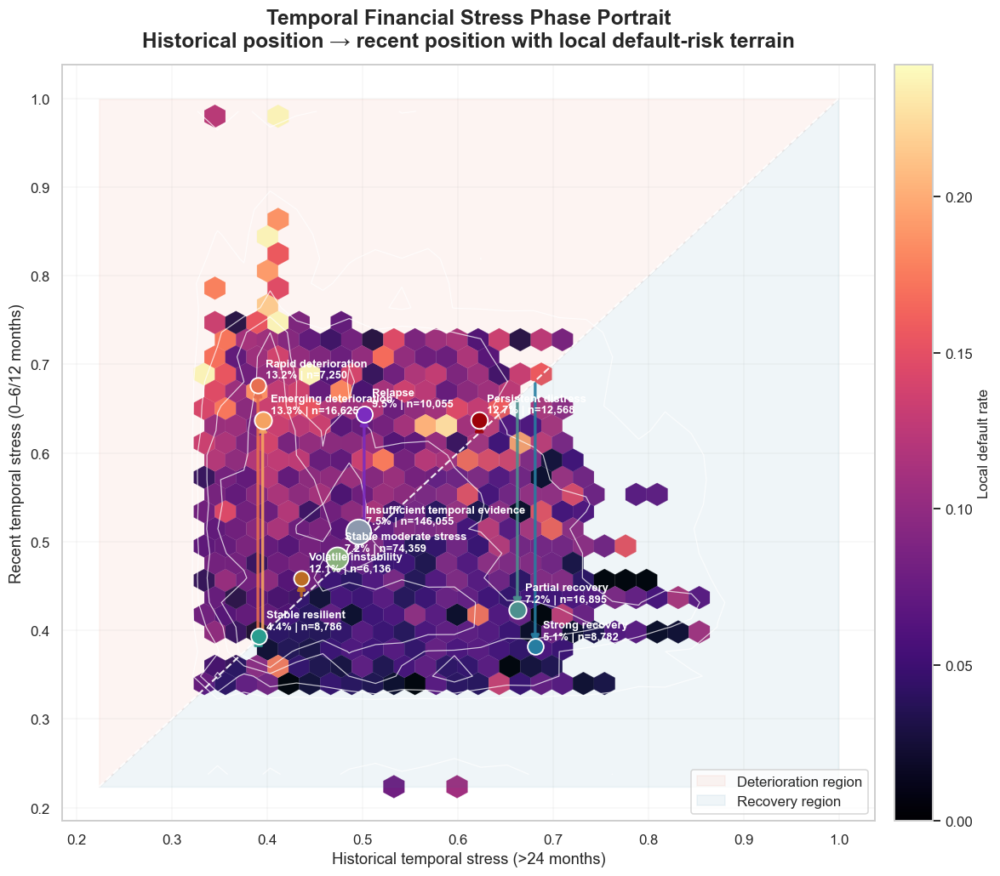

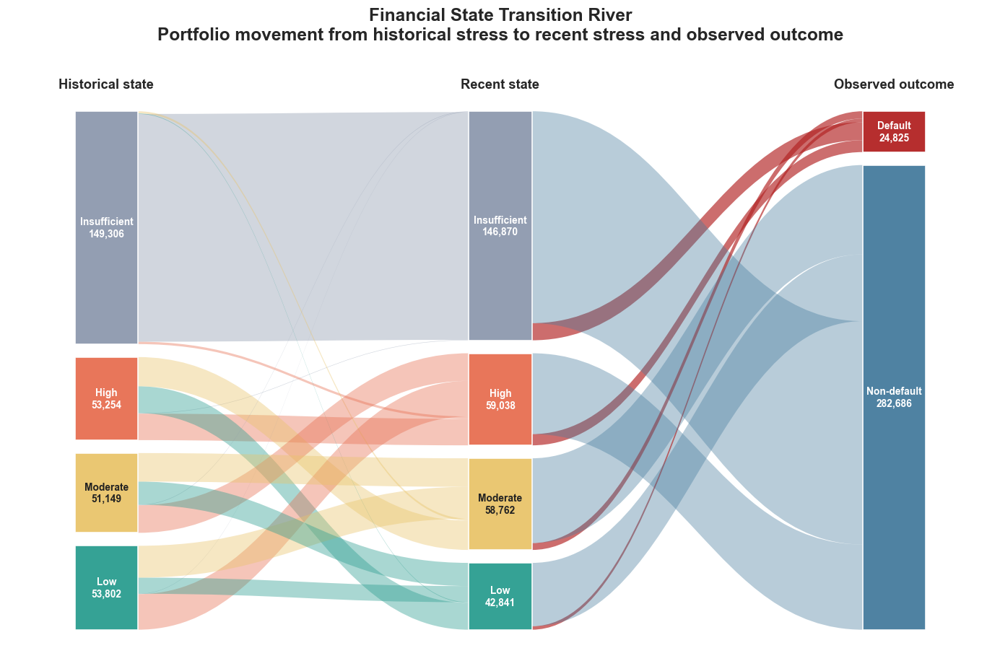

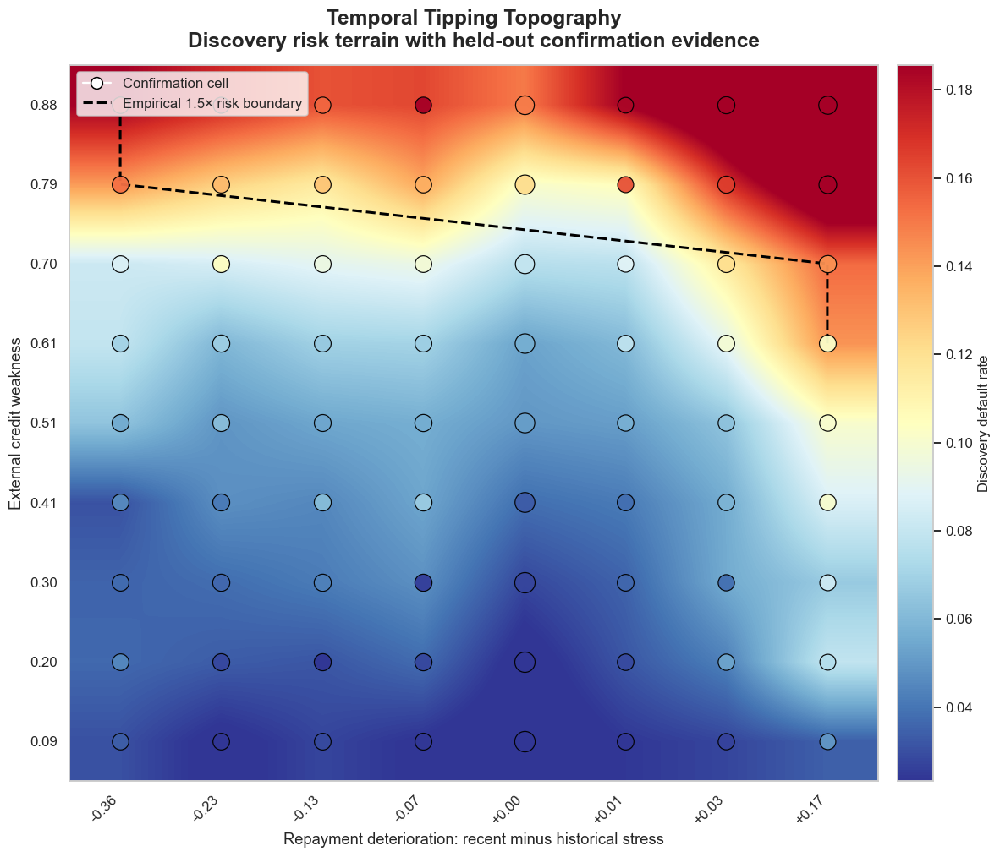

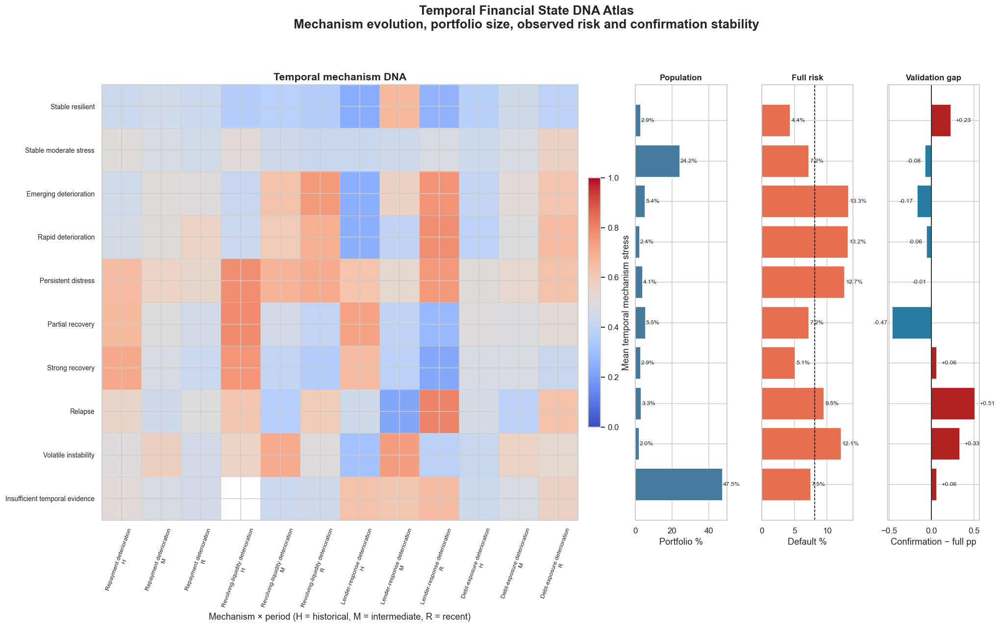

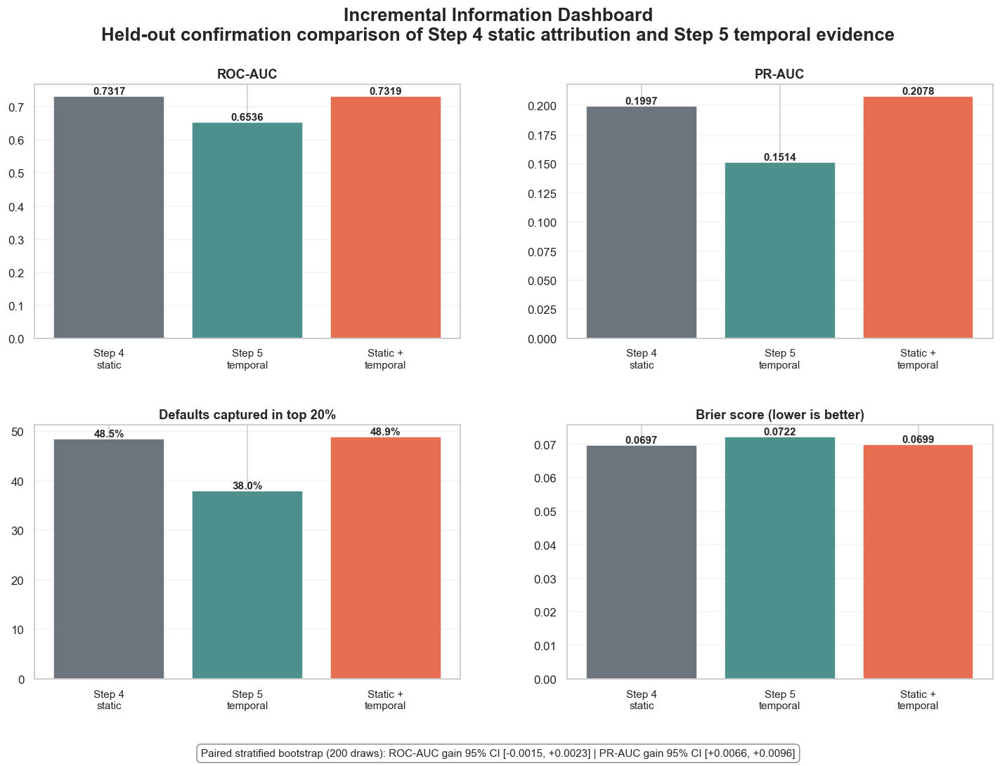

Step 5 temporal financial-state research completed successfully.
Prepared applicants: 307,511 | Portfolio baseline: 8.07%
Discovery applicants: 199,882 | Confirmation applicants: 107,629
Reconstructed temporal signals: 11 | Temporal mechanisms: 4
Tables: Relationship_report\Tables\Step_5_Temporal_Financial_States
Figures: Relationship_report\Figures\Step_5_Temporal_Financial_States

Temporal Feature Registry


,signal,label,mechanism,source,weight,statistic_type,recent_window,intermediate_window,historical_window,numerator_lifetime,denominator_lifetime,numerator_recent,denominator_recent,numerator_24m,denominator_24m
0,installment_late_rate,Installment late-payment rate,repayment_deterioration,Installments,1.2500,rate,0–6 months,7–24 months,>24 months,inst_is_late_count_sum,inst_payment_row_count_sum,inst_recent_6m_late_count_sum,inst_is_recent_6m_count_sum,inst_recent_24m_late_count_sum,inst_is_recent_24m_count_sum
1,installment_underpayment_rate,Installment underpayment rate,repayment_deterioration,Installments,1.1000,rate,0–6 months,7–24 months,>24 months,inst_is_underpaid_count_sum,inst_payment_row_count_sum,inst_recent_6m_underpaid_count_sum,inst_is_recent_6m_count_sum,inst_recent_24m_underpaid_count_sum,inst_is_recent_24m_count_sum
2,pos_dpd_rate,POS days-past-due rate,repayment_deterioration,POS cash,1.0000,rate,0–6 months,7–24 months,>24 months,pos_has_dpd_count_sum,pos_month_record_count_sum,pos_recent_6m_has_dpd_count_sum,pos_is_recent_6m_count_sum,pos_recent_24m_has_dpd_count_sum,pos_is_recent_24m_count_sum
3,pos_severe_dpd_rate,POS severe DPD rate,repayment_deterioration,POS cash,1.0500,rate,0–6 months,7–24 months,>24 months,pos_has_dpd_def_count_sum,pos_month_record_count_sum,pos_recent_6m_has_dpd_def_count_sum,pos_is_recent_6m_count_sum,pos_recent_24m_has_dpd_def_count_sum,pos_is_recent_24m_count_sum
4,credit_card_dpd_rate,Credit-card DPD rate,repayment_deterioration,Credit card,1.1000,rate,0–6 months,7–24 months,>24 months,cc_has_dpd_count_sum,cc_month_record_count_sum,cc_recent_6m_has_dpd_count_sum,cc_is_recent_6m_count_sum,cc_recent_24m_has_dpd_count_sum,cc_is_recent_24m_count_sum
5,credit_card_severe_dpd_rate,Credit-card severe DPD rate,repayment_deterioration,Credit card,1.1000,rate,0–6 months,7–24 months,>24 months,cc_has_dpd_def_count_sum,cc_month_record_count_sum,cc_recent_6m_has_dpd_def_count_sum,cc_is_recent_6m_count_sum,cc_recent_24m_has_dpd_def_count_sum,cc_is_recent_24m_count_sum
6,credit_card_high_utilization_rate,Credit-card high-utilisation rate,revolving_liquidity_deterioration,Credit card,1.2000,rate,0–6 months,7–24 months,>24 months,cc_high_utilization_80plus_count_sum,cc_month_record_count_sum,cc_recent_6m_high_utilization_80plus_count_sum,cc_is_recent_6m_count_sum,cc_recent_24m_high_utilization_80plus_count_sum,cc_is_recent_24m_count_sum
7,credit_card_payment_shortfall_rate,Credit-card payment-below-minimum rate,revolving_liquidity_deterioration,Credit card,1.2500,rate,0–6 months,7–24 months,>24 months,cc_payment_less_than_min_instalment_count_sum,cc_month_record_count_sum,cc_recent_6m_payment_less_than_min_count_sum,cc_is_recent_6m_count_sum,cc_recent_24m_payment_less_than_min_count_sum,cc_is_recent_24m_count_sum
8,previous_refusal_rate,Previous-application refusal rate,lender_response_deterioration,Previous applications,1.2000,rate,0–12 months,13–24 months,>24 months,prev_refused_application_count,prev_application_count,prev_refused_recent_12m_count,prev_recent_12m_count,prev_refused_recent_24m_count,prev_recent_24m_count
9,bureau_debt_per_credit,Bureau debt per credit record,debt_exposure_deterioration,Bureau,1.1000,amount_average,0–12 months,13–24 months,>24 months,bureau_debt_amount_sum,bureau_record_count,bureau_recent_12m_debt_amount_sum,bureau_recent_12m_count,bureau_recent_24m_debt_amount_sum,bureau_recent_24m_count



Non-Overlapping Temporal Reconstruction Audit


,signal,label,mechanism,source,statistic_type,recent_window,intermediate_window,historical_window,numerator_nesting_violations,denominator_nesting_violations,invalid_intermediate_differences,invalid_historical_differences,historical_coverage,intermediate_coverage,recent_coverage,reconstruction_status
0,installment_late_rate,Installment late-payment rate,repayment_deterioration,Installments,rate,0–6 months,7–24 months,>24 months,0,0,0,0,0.7720,0.7804,0.5927,VALID_NON_OVERLAPPING_RECONSTRUCTION
1,installment_underpayment_rate,Installment underpayment rate,repayment_deterioration,Installments,rate,0–6 months,7–24 months,>24 months,0,0,0,0,0.7720,0.7804,0.5927,VALID_NON_OVERLAPPING_RECONSTRUCTION
2,pos_dpd_rate,POS days-past-due rate,repayment_deterioration,POS cash,rate,0–6 months,7–24 months,>24 months,0,0,0,0,0.7070,0.7625,0.5401,VALID_NON_OVERLAPPING_RECONSTRUCTION
3,pos_severe_dpd_rate,POS severe DPD rate,repayment_deterioration,POS cash,rate,0–6 months,7–24 months,>24 months,0,0,0,0,0.7070,0.7625,0.5401,VALID_NON_OVERLAPPING_RECONSTRUCTION
4,credit_card_dpd_rate,Credit-card DPD rate,repayment_deterioration,Credit card,rate,0–6 months,7–24 months,>24 months,0,0,0,0,0.1314,0.2561,0.2826,VALID_NON_OVERLAPPING_RECONSTRUCTION
5,credit_card_severe_dpd_rate,Credit-card severe DPD rate,repayment_deterioration,Credit card,rate,0–6 months,7–24 months,>24 months,0,0,0,0,0.1314,0.2561,0.2826,VALID_NON_OVERLAPPING_RECONSTRUCTION
6,credit_card_high_utilization_rate,Credit-card high-utilisation rate,revolving_liquidity_deterioration,Credit card,rate,0–6 months,7–24 months,>24 months,0,0,0,0,0.1314,0.2561,0.2826,VALID_NON_OVERLAPPING_RECONSTRUCTION
7,credit_card_payment_shortfall_rate,Credit-card payment-below-minimum rate,revolving_liquidity_deterioration,Credit card,rate,0–6 months,7–24 months,>24 months,0,0,0,0,0.1314,0.2561,0.2826,VALID_NON_OVERLAPPING_RECONSTRUCTION
8,previous_refusal_rate,Previous-application refusal rate,lender_response_deterioration,Previous applications,rate,0–12 months,13–24 months,>24 months,0,0,0,0,0.2710,0.2253,0.2354,VALID_NON_OVERLAPPING_RECONSTRUCTION
9,bureau_debt_per_credit,Bureau debt per credit record,debt_exposure_deterioration,Bureau,amount_average,0–12 months,13–24 months,>24 months,1360,0,134,1534,0.5384,0.2994,0.4935,VALID_WITH_ROW_LEVEL_NESTING_EXCLUSIONS



Temporal Mechanism Coverage Audit


,mechanism,label,signal_count,historical_coverage,intermediate_coverage,recent_coverage
0,repayment_deterioration,Repayment deterioration,6,0.7805,0.8042,0.6460
1,revolving_liquidity_deterioration,Revolving-liquidity deterioration,2,0.1314,0.2561,0.2826
2,lender_response_deterioration,Lender-response deterioration,1,0.2710,0.2253,0.2354
3,debt_exposure_deterioration,Debt-exposure deterioration,2,0.5434,0.2998,0.4935



Discovery-Learned Temporal State Rules


,rule,value
0,low_level,0.4223
1,high_level,0.5412
2,direction,0.1642
3,acceleration,0.2594
4,volatility,0.1334
5,evidence_minimum,0.3500



Full-Sample Temporal State Evidence


,temporal_financial_state,sample,applicants,defaults,default_rate,ci_low,ci_high,risk_lift,portfolio_share,share_of_defaults,sufficient_support
0,Emerging deterioration,Full,16625,2208,0.1328,0.1277,0.1381,1.6452,0.0541,0.0889,True
1,Rapid deterioration,Full,7250,957,0.1320,0.1244,0.1400,1.6351,0.0236,0.0385,True
2,Persistent distress,Full,12568,1595,0.1269,0.1212,0.1328,1.5720,0.0409,0.0642,True
3,Volatile instability,Full,6136,743,0.1211,0.1132,0.1295,1.4999,0.0200,0.0299,True
4,Relapse,Full,10055,959,0.0954,0.0898,0.1013,1.1814,0.0327,0.0386,True
5,Insufficient temporal evidence,Full,146055,10938,0.0749,0.0736,0.0763,0.9277,0.4750,0.4406,True
6,Partial recovery,Full,16895,1222,0.0723,0.0685,0.0763,0.8960,0.0549,0.0492,True
7,Stable moderate stress,Full,74359,5366,0.0722,0.0703,0.0740,0.8939,0.2418,0.2162,True
8,Strong recovery,Full,8782,451,0.0514,0.0469,0.0562,0.6361,0.0286,0.0182,True
9,Stable resilient,Full,8786,386,0.0439,0.0398,0.0484,0.5442,0.0286,0.0155,True



Held-Out Confirmation Temporal State Evidence


,temporal_financial_state,sample,applicants,defaults,default_rate,ci_low,ci_high,risk_lift,portfolio_share,share_of_defaults,sufficient_support
0,Rapid deterioration,Confirmation,2526,332,0.1314,0.1188,0.1452,1.6280,0.0235,0.0382,True
1,Emerging deterioration,Confirmation,5742,753,0.1311,0.1227,0.1401,1.6244,0.0533,0.0867,True
2,Persistent distress,Confirmation,4290,544,0.1268,0.1172,0.1371,1.5707,0.0399,0.0626,True
3,Volatile instability,Confirmation,2186,272,0.1244,0.1112,0.1389,1.5413,0.0203,0.0313,True
4,Relapse,Confirmation,3492,351,0.1005,0.0910,0.1109,1.2451,0.0324,0.0404,True
5,Insufficient temporal evidence,Confirmation,51507,3890,0.0755,0.0733,0.0778,0.9355,0.4786,0.4477,True
6,Stable moderate stress,Confirmation,25880,1848,0.0714,0.0683,0.0746,0.8845,0.2405,0.2127,True
7,Partial recovery,Confirmation,5896,399,0.0677,0.0615,0.0744,0.8383,0.0548,0.0459,True
8,Strong recovery,Confirmation,3039,158,0.0520,0.0446,0.0605,0.6440,0.0282,0.0182,True
9,Stable resilient,Confirmation,3071,142,0.0462,0.0394,0.0543,0.5728,0.0285,0.0163,True



Static Step 4 Pressure × Temporal Direction


,sample,static_pressure_level,temporal_direction,applicants,defaults,default_rate,ci_low,ci_high,risk_lift
0,Confirmation,High static pressure,Deteriorating,5275,1017,0.1928,0.1824,0.2037,2.3881
1,Confirmation,High static pressure,Insufficient,15061,2470,0.1640,0.1582,0.1700,2.0314
2,Confirmation,High static pressure,Stable,11601,1709,0.1473,0.1410,0.1539,1.8248
3,Confirmation,High static pressure,Recovering,3550,365,0.1028,0.0933,0.1132,1.2736
4,Confirmation,Low static pressure,Deteriorating,1715,70,0.0408,0.0324,0.0513,0.5056
5,Confirmation,Low static pressure,Stable,12354,366,0.0296,0.0268,0.0328,0.3670
6,Confirmation,Low static pressure,Insufficient,20118,595,0.0296,0.0273,0.0320,0.3663
7,Confirmation,Low static pressure,Recovering,1701,43,0.0253,0.0188,0.0339,0.3131
8,Confirmation,Moderate static pressure,Deteriorating,3143,206,0.0655,0.0574,0.0747,0.8119
9,Confirmation,Moderate static pressure,Insufficient,17761,1066,0.0600,0.0566,0.0636,0.7434



Step 4 Static Attribution versus Step 5 Temporal Information


,model,sample,applicants,roc_auc,pr_auc,log_loss,brier_score,top_20pct_default_capture,calibration_slope,calibration_intercept,delta_roc_auc_vs_step4,delta_pr_auc_vs_step4,delta_top_20pct_default_capture_vs_step4,improvement_log_loss_vs_step4,improvement_brier_score_vs_step4
0,Step 4 static attribution,Discovery OOF,199882,0.7325,0.1990,0.2541,0.0697,0.4760,0.9980,-0.0041,0.0000,0.0000,0.0000,0.0000,0.0000
1,Step 4 static attribution,Confirmation,107629,0.7317,0.1997,0.2542,0.0697,0.4849,0.9988,0.0023,0.0000,0.0000,0.0000,0.0000,0.0000
2,Step 5 temporal only,Discovery OOF,199882,0.6498,0.1483,0.2695,0.0723,0.3737,0.9898,-0.0235,-0.0827,-0.0506,-0.1023,-0.0154,-0.0026
3,Step 5 temporal only,Confirmation,107629,0.6536,0.1514,0.2689,0.0722,0.3803,1.0115,0.0296,-0.0781,-0.0483,-0.1046,-0.0147,-0.0025
4,Step 4 + Step 5 temporal,Discovery OOF,199882,0.7311,0.2047,0.2560,0.0701,0.4862,0.9949,-0.0115,-0.0014,0.0057,0.0102,-0.0019,-0.0003
5,Step 4 + Step 5 temporal,Confirmation,107629,0.7319,0.2078,0.2556,0.0699,0.4889,1.0051,0.0158,0.0002,0.0081,0.0040,-0.0014,-0.0002



Paired Stratified Bootstrap Validation


,metric,bootstrap_iterations,mean_gain,median_gain,ci_low,ci_high,probability_gain_positive
0,roc_auc_gain,200,0.0003,0.0003,-0.0015,0.0023,0.6250
1,pr_auc_gain,200,0.0080,0.0080,0.0066,0.0096,1.0000
2,top20_capture_gain,200,0.0037,0.0037,-0.0018,0.0098,0.8750
3,brier_improvement,200,-0.0002,-0.0002,-0.0004,-0.0001,0.0000



Temporal State Discovery-to-Confirmation Stability


,temporal_financial_state,discovery_default_rate,confirmation_default_rate,absolute_rate_gap
0,Persistent distress,0.1270,0.1268,0.0002
1,Rapid deterioration,0.1323,0.1314,0.0009
2,Strong recovery,0.0510,0.0520,0.0010
3,Insufficient temporal evidence,0.0745,0.0755,0.0010
4,Stable moderate stress,0.0726,0.0714,0.0012
5,Emerging deterioration,0.1337,0.1311,0.0026
6,Stable resilient,0.0427,0.0462,0.0035
7,Volatile instability,0.1192,0.1244,0.0052
8,Partial recovery,0.0748,0.0677,0.0072
9,Relapse,0.0926,0.1005,0.0079



Final Step 5 Temporal Relationship Register


,research_question,step4_confirmation_roc_auc,combined_confirmation_roc_auc,roc_auc_increment,step4_confirmation_pr_auc,combined_confirmation_pr_auc,pr_auc_increment,top20_capture_increment,roc_auc_gain_bootstrap_ci_low,roc_auc_gain_bootstrap_ci_high,pr_auc_gain_bootstrap_ci_low,pr_auc_gain_bootstrap_ci_high,probability_roc_auc_gain_positive,probability_pr_auc_gain_positive,median_state_discovery_confirmation_rate_gap,reconstructed_temporal_signals,temporal_mechanisms,applicants,decision
0,Does financial direction add information beyond static Step 4 risk?,0.7317,0.7319,0.0002,0.1997,0.2078,0.0081,0.0040,-0.0015,0.0023,0.0066,0.0096,0.6250,1.0000,0.0019,11,4,307511,TEMPORAL_DIRECTION_RETAINS_INCREMENTAL_INFORMATION



Applicant-Level Temporal Risk–Resilience Journey Ledger


,SK_ID_CURR,TARGET,analysis_sample,step4_static_probability,temporal_only_probability,static_plus_temporal_probability,temporal_evidence_depth,temporal_source_count,overall_historical_stress,overall_intermediate_stress,overall_recent_stress,historical_stress_level,intermediate_stress_level,recent_stress_level,temporal_direction,overall_direction,stress_slope,stress_acceleration,stress_volatility,shock_magnitude,stress_persistence,multisource_deterioration_count,multisource_recovery_count,cross_source_synchronisation,temporal_financial_state,primary_deterioration_mechanism,primary_recovery_mechanism,tipping_boundary_crossed,temporal_explanation_confidence,temporal_narrative,repayment_deterioration_historical,repayment_deterioration_intermediate,repayment_deterioration_recent,revolving_liquidity_deterioration_historical,revolving_liquidity_deterioration_intermediate,revolving_liquidity_deterioration_recent,lender_response_deterioration_historical,lender_response_deterioration_intermediate,lender_response_deterioration_recent,debt_exposure_deterioration_historical,debt_exposure_deterioration_intermediate,debt_exposure_deterioration_recent,repayment_deterioration_direction,revolving_liquidity_deterioration_direction,lender_response_deterioration_direction,debt_exposure_deterioration_direction
0,100002,1,Discovery,0.1021,0.0564,0.0787,0.4167,3,0.5577,0.4040,0.4040,High,Low,Low,Stable,-0.1537,-0.0768,0.1537,0.0887,0.1537,1,0,1,0.0000,Stable moderate stress,No material deterioration,Debt-exposure deterioration,0,Low confidence,Temporal state: Stable moderate stress. Historical stress: High; recent stress: Low. Direction: Stable. Primary dete...,NaN,0.4314,0.4314,NaN,NaN,NaN,NaN,NaN,NaN,0.5577,0.3697,0.3697,NaN,NaN,NaN,-0.1880
1,100003,0,Discovery,0.0495,0.0406,0.0430,0.2500,3,0.4040,0.4314,NaN,Insufficient,Insufficient,Insufficient,Insufficient,NaN,NaN,NaN,0.0194,0.0274,0,0,0,0.0000,Insufficient temporal evidence,No material deterioration,No material recovery,0,Insufficient evidence,Temporal state: Insufficient temporal evidence. Historical stress: Insufficient; recent stress: Insufficient. Direct...,0.4314,0.4314,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.3697,NaN,NaN,NaN,NaN,NaN,NaN
2,100004,0,Discovery,0.0296,0.0406,0.0366,0.2500,3,0.4040,0.4314,NaN,Insufficient,Insufficient,Insufficient,Insufficient,NaN,NaN,NaN,0.0194,0.0274,0,0,0,0.0000,Insufficient temporal evidence,No material deterioration,No material recovery,0,Insufficient evidence,Temporal state: Insufficient temporal evidence. Historical stress: Insufficient; recent stress: Insufficient. Direct...,0.4314,0.4314,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.3697,NaN,NaN,NaN,NaN,NaN,NaN
3,100006,0,Confirmation,0.0345,0.0994,0.0436,0.4167,4,NaN,0.3391,0.4204,Insufficient,Low,Low,Insufficient,NaN,NaN,NaN,0.0575,0.0813,0,0,0,0.0000,Stable moderate stress,No material deterioration,No material recovery,0,Low confidence,Temporal state: Stable moderate stress. Historical stress: Insufficient; recent stress: Low. Direction: Insufficient...,NaN,0.4314,0.4385,NaN,NaN,0.3575,NaN,0.2237,0.4671,NaN,NaN,NaN,NaN,NaN,NaN,NaN
4,100007,0,Discovery,0.1307,0.0440,0.0691,0.2500,2,0.6093,0.4314,0.4314,Insufficient,Insufficient,Insufficient,Insufficient,-0.1779,-0.0890,0.1779,0.1027,0.1779,1,0,1,0.0000,Insufficient temporal evidence,No material deterioration,Repayment deterioration,0,Insufficient evidence,Temporal state: Insufficient temporal evidence. Historical stress: Insufficient; recent stress: Insufficient. Direct...,0.6093,0.4314,0.4314,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,-0.1779,NaN,NaN,NaN
5,100008,0,Discovery,0.0594,0.0459,0.0461,0.4167,3,0.5355,0.4314,0.5356,Moderate,Moderate,Moderate,Stable,0.0001,0.0001,0.2084,0.0602,0.1042,0,1,1,0.2500,Stable moderate stress,Debt-exposure deterioration,Repayment deterioration,0,Low confidence,Temporal state: Stable moderate stress. Historical stress: Moderate; recent stress: Moderate. Direction: Stable. Pri...,0.6682,0.4314,0.4314,NaN,NaN,NaN,NaN,NaN,NaN,0.3697,NaN,0.6659,-0.23

In [17]:
if "train_df" not in globals():
    raise NameError("train_df is not defined. Run the data-loading cell before Step 5.")

if "step4_analyzer" not in globals():
    raise NameError("step4_analyzer is not defined. Complete Step 4 before running Step 5.")

ID_COL = globals().get("ID_COL", "SK_ID_CURR")
TARGET_COL = globals().get("TARGET_COL", "TARGET")
RANDOM_SEED = globals().get("RANDOM_SEED", 42)

BASE_OUTPUT_DIR = Path.cwd() / "relationship_outputs"
BASE_TABLE_DIR = Path(globals().get("RELATIONSHIP_TABLE_DIR", BASE_OUTPUT_DIR / "tables"))
BASE_FIGURE_DIR = Path(globals().get("RELATIONSHIP_FIGURE_DIR", BASE_OUTPUT_DIR / "figures"))

STEP5_TABLE_DIR = BASE_TABLE_DIR / "Step_5_Temporal_Financial_States"
STEP5_FIGURE_DIR = BASE_FIGURE_DIR / "Step_5_Temporal_Financial_States"
STEP5_TABLE_DIR.mkdir(parents=True, exist_ok=True)
STEP5_FIGURE_DIR.mkdir(parents=True, exist_ok=True)

STEP5_CONFIG = {"seed": RANDOM_SEED, "discovery_fraction": 0.65, "n_splits": 5, "regularization_c": 0.50, "min_period_support": 1.00, "min_state_count": 500, "min_default_count": 20, "min_surface_count": 150, "surface_bins": 9, "direction_minimum": 0.05, "direction_quantile": 0.65, "acceleration_quantile": 0.70, "volatility_quantile": 0.75, "low_level_quantile": 0.33, "high_level_quantile": 0.67, "evidence_minimum": 0.35, "plot_sample": 60000, "bootstrap_iterations": 200, "alpha": 0.05}

step5_analyzer = TemporalFinancialStateAnalyzer(train_df, ID_COL, TARGET_COL, step4_analyzer, STEP5_CONFIG).run_all()
step5_plotter = TemporalFinancialStatePlotter(step5_analyzer, STEP5_FIGURE_DIR)
step5_plotter.plot_all()
step5_analyzer.export(STEP5_TABLE_DIR)

step5_temporal_feature_registry = step5_analyzer.results["temporal_feature_registry"]
step5_reconstruction_audit = step5_analyzer.results["nonoverlap_reconstruction_audit"]
step5_signal_reference_summary = step5_analyzer.results["signal_reference_summary"]
step5_mechanism_audit = step5_analyzer.results["mechanism_trajectory_audit"]
step5_state_rules = step5_analyzer.results["temporal_state_rules"]
step5_state_summary = step5_analyzer.results["temporal_state_summary"]
step5_direction_evidence = step5_analyzer.results["static_level_by_temporal_direction"]
step5_transition_flows = step5_analyzer.results["temporal_transition_flows"]
step5_tipping_surface = step5_analyzer.results["tipping_surface"]
step5_incremental_metrics = step5_analyzer.results["incremental_model_metrics"]
step5_incremental_bootstrap = step5_analyzer.results["incremental_gain_bootstrap_summary"]
step5_state_fingerprint = step5_analyzer.results["temporal_state_fingerprint"]
step5_state_stability = step5_analyzer.results["temporal_state_confirmation_stability"]
step5_final_temporal_register = step5_analyzer.results["final_temporal_relationship_register"]
step5_temporal_ledger = step5_analyzer.results["temporal_risk_resilience_ledger"]

print("Step 5 temporal financial-state research completed successfully.")
print(f"Prepared applicants: {len(step5_analyzer.data):,} | Portfolio baseline: {step5_analyzer.baseline:.2%}")
print(f"Discovery applicants: {len(step5_analyzer.discovery_index):,} | Confirmation applicants: {len(step5_analyzer.confirmation_index):,}")
print(f"Reconstructed temporal signals: {len(step5_analyzer.signal_specs):,} | Temporal mechanisms: {len(step5_analyzer.mechanism_labels):,}")
print(f"Tables: {STEP5_TABLE_DIR}")
print(f"Figures: {STEP5_FIGURE_DIR}")

print("\nTemporal Feature Registry")
display(step5_temporal_feature_registry)

print("\nNon-Overlapping Temporal Reconstruction Audit")
display(step5_reconstruction_audit)

print("\nTemporal Mechanism Coverage Audit")
display(step5_mechanism_audit)

print("\nDiscovery-Learned Temporal State Rules")
display(step5_state_rules)

print("\nFull-Sample Temporal State Evidence")
display(step5_state_summary.loc[step5_state_summary["sample"].eq("Full")].sort_values("risk_lift", ascending=False).reset_index(drop=True))

print("\nHeld-Out Confirmation Temporal State Evidence")
display(step5_state_summary.loc[step5_state_summary["sample"].eq("Confirmation")].sort_values("risk_lift", ascending=False).reset_index(drop=True))

print("\nStatic Step 4 Pressure × Temporal Direction")
display(step5_direction_evidence.loc[step5_direction_evidence["sample"].eq("Confirmation")].sort_values(["static_pressure_level", "default_rate"], ascending=[True, False]).reset_index(drop=True))

print("\nStep 4 Static Attribution versus Step 5 Temporal Information")
display(step5_incremental_metrics)

print("\nPaired Stratified Bootstrap Validation")
display(step5_incremental_bootstrap)

print("\nTemporal State Discovery-to-Confirmation Stability")
display(step5_state_stability.sort_values("absolute_rate_gap").reset_index(drop=True))

print("\nFinal Step 5 Temporal Relationship Register")
display(step5_final_temporal_register)

print("\nApplicant-Level Temporal Risk–Resilience Journey Ledger")
display(step5_temporal_ledger.head(10))

# Step 5: Temporal Financial Deterioration, Persistence, Recovery, and Tipping States  
## Final Observations and Research Conclusion

### Research Objective

Step 5 investigated whether the **direction of financial change** provides additional risk information beyond the static applicant-level attribution developed in Step 4.

The analysis reconstructed mathematically compatible non-overlapping historical, intermediate, and recent periods and used them to identify:

- deterioration;
- persistence;
- recovery;
- relapse;
- volatility;
- cross-source temporal stress;
- empirical high-risk transition regions.

The full portfolio contained 307,511 applicants, including 24,825 defaults and 282,686 non-defaults, corresponding to an overall default rate of approximately 8.07%.

---

## 1. Portfolio-Level Financial-State Movement

The Financial State Transition River showed a net shift toward greater recent financial stress.

| Financial state | Historical applicants | Recent applicants | Change |
|---|---:|---:|---:|
| High stress | 53,254 | 59,038 | +5,784 |
| Moderate stress | 51,149 | 58,762 | +7,613 |
| Low stress | 53,802 | 42,841 | −10,961 |
| Insufficient evidence | 149,306 | 146,870 | −2,436 |

High-stress applicants increased by approximately 10.9%, while moderate-stress applicants increased by approximately 14.9%. The low-stress population declined by approximately 20.4%.

This indicates that the portfolio was not temporally static. Although both deterioration and recovery pathways were observed, the aggregate movement was toward moderate and high recent stress.

Because non-default applicants represent approximately 92% of the portfolio, absolute river width is dominated by non-default flows. Risk interpretation must therefore rely on within-state default rates rather than flow width alone.

---

## 2. Temporal Tipping Relationship

The Temporal Tipping Topography examined:

> **Repayment deterioration × External credit weakness → Observed default risk**

External credit weakness formed the dominant structural risk terrain.

Applicants with low external-credit weakness generally remained in lower-risk regions, even when repayment change was moderately adverse. In contrast, applicants in the highest external-credit-weakness region reached observed default rates of approximately 14–18% or more.

Repayment deterioration modified the external-credit threshold required to enter the empirical high-risk region.

When repayment behaviour was stable or improving, the 1.5× baseline-risk boundary generally required very high external-credit weakness. As repayment deterioration increased, the same high-risk boundary was reached at lower levels of external-credit weakness.

This supports an amplification relationship:

> Recent repayment deterioration does not replace structural external-credit weakness, but it lowers the level of structural weakness required for an applicant to enter the high-risk region.

The held-out confirmation cells generally followed the discovery-sample risk terrain, supporting the stability of the observed relationship.

---

## 3. Temporal Financial States

The Temporal Financial State DNA Atlas identified ten interpretable states.

| Temporal state | Portfolio share | Default rate | Interpretation |
|---|---:|---:|---|
| Stable resilient | 2.9% | 4.4% | Consistently low temporal stress |
| Stable moderate stress | 24.2% | 7.2% | Moderate but non-deteriorating condition |
| Emerging deterioration | 5.4% | 13.3% | Newly developing adverse movement |
| Rapid deterioration | 2.4% | 13.2% | Fast or multi-mechanism recent worsening |
| Persistent distress | 4.1% | 12.7% | Stress sustained across several periods |
| Partial recovery | 5.5% | 7.2% | Improvement with remaining financial pressure |
| Strong recovery | 2.9% | 5.1% | Broad recent improvement from historical stress |
| Relapse | 3.3% | 9.5% | Deterioration following a previous improvement |
| Volatile instability | 2.0% | 12.1% | Repeated temporal fluctuation |
| Insufficient temporal evidence | 47.5% | 7.5% | Inadequate history for a reliable temporal conclusion |

---

## 4. Deterioration, Persistence, and Recovery

The highest-risk temporal groups were:

- Emerging deterioration: 13.3%;
- Rapid deterioration: 13.2%;
- Persistent distress: 12.7%;
- Volatile instability: 12.1%.

The lowest-risk groups were:

- Stable resilient: 4.4%;
- Strong recovery: 5.1%.

These results support the broad temporal ordering:

> **Deteriorating or persistently distressed applicants carried substantially greater risk than stable or recovering applicants.**

Emerging deterioration was particularly important. Its default rate was slightly higher than the persistent-distress rate, showing that an applicant does not need a long chronic history to enter a high-risk state. Recent adverse movement may operate as an early-warning signal.

The recovery hypothesis was also supported. Strong recovery reduced the observed default rate to 5.1%, compared with 12.7% for persistent distress. Partial recovery reduced risk to 7.2%, although it did not produce the same protection as stable resilience.

Relapse remained adverse, with a default rate of 9.5%, demonstrating that previous improvement does not guarantee continuing protection.

Volatile instability produced a default rate of 12.1%, indicating that repeated financial fluctuation contains risk information beyond the average stress level alone.

---

## 5. Confirmation Stability

The discovery/full-to-confirmation default-rate gaps were generally small.

| Temporal state | Confirmation minus full default-rate gap |
|---|---:|
| Stable resilient | +0.23 percentage points |
| Stable moderate stress | −0.08 |
| Emerging deterioration | −0.17 |
| Rapid deterioration | −0.06 |
| Persistent distress | −0.01 |
| Partial recovery | −0.47 |
| Strong recovery | +0.06 |
| Relapse | +0.51 |
| Volatile instability | +0.33 |
| Insufficient temporal evidence | +0.06 |

Even the largest absolute differences were approximately one-half of one percentage point.

This indicates that the temporal-state risk patterns were highly stable in held-out confirmation applicants.

---

## 6. Incremental Information beyond Step 4

Three frameworks were compared on the held-out confirmation sample.

| Framework | ROC-AUC | PR-AUC | Top-20% default capture | Brier score |
|---|---:|---:|---:|---:|
| Step 4 static attribution | 0.7317 | 0.1997 | 48.5% | 0.0697 |
| Step 5 temporal only | 0.6536 | 0.1514 | 38.0% | 0.0722 |
| Step 4 static + Step 5 temporal | 0.7319 | 0.2078 | 48.9% | 0.0699 |

The temporal-only framework achieved a ROC-AUC of 0.6536. This demonstrates that temporal evidence contains meaningful independent information, although it is weaker than the broader Step 4 static attribution framework.

The combined framework increased ROC-AUC from 0.7317 to 0.7319. The paired stratified bootstrap 95% confidence interval for the ROC-AUC gain was:

> **−0.0015 to +0.0023**

Because the interval included zero, broad ROC-AUC improvement was not statistically confirmed.

However, PR-AUC increased from 0.1997 to 0.2078, an absolute gain of 0.0081. The paired bootstrap 95% confidence interval was:

> **+0.0066 to +0.0096**

The entire interval was positive.

This is the strongest incremental modelling result from Step 5.

Because default is the minority outcome, the PR-AUC improvement indicates that temporal evidence improved the concentration of true defaults among applicants assigned higher risk.

The combined framework also increased top-20% default capture from 48.5% to 48.9%. Based on the displayed rounded values, this corresponds to approximately 100 additional defaults captured within the highest-ranked 20% of applicants.

The Brier score changed from 0.0697 to 0.0699. Therefore, temporal evidence improved minority-class ranking but did not improve probability calibration.

---

## 7. Temporal Evidence as a Complementary Layer

Step 5 temporal evidence should not replace Step 4.

The evidence supports the following architecture:

```text
Step 4 static financial position
+
Step 5 temporal financial direction
=
More complete applicant risk representation

In [18]:
import os
import sys
import platform
import importlib
import numpy as np
import pandas as pd
import scipy
import sklearn
import matplotlib
import pyarrow
import torch

print("STEP 6 ENVIRONMENT VERIFICATION")
print("=" * 80)
print(f"Python: {sys.version}")
print(f"Platform: {platform.platform()}")
print(f"Logical CPU threads: {os.cpu_count()}")
print(f"NumPy: {np.__version__}")
print(f"Pandas: {pd.__version__}")
print(f"SciPy: {scipy.__version__}")
print(f"Scikit-learn: {sklearn.__version__}")
print(f"Matplotlib: {matplotlib.__version__}")
print(f"PyArrow: {pyarrow.__version__}")
print(f"PyTorch: {torch.__version__}")
print(f"PyTorch CUDA runtime: {torch.version.cuda}")
print(f"CUDA available: {torch.cuda.is_available()}")

if not torch.cuda.is_available():
    raise RuntimeError("CUDA GPU is not available. Confirm that the notebook is using the new GPU kernel and that the cu128 PyTorch build was installed.")

cuda_parts = tuple(int(part) for part in torch.version.cuda.split(".")[:2])

if cuda_parts < (12, 8):
    raise RuntimeError(f"RTX 5060 Ti requires a CUDA 12.8+ PyTorch build. Current PyTorch CUDA runtime: {torch.version.cuda}")

gpu_properties = torch.cuda.get_device_properties(0)
gpu_memory_gib = gpu_properties.total_memory / 1024 ** 3

print(f"GPU: {torch.cuda.get_device_name(0)}")
print(f"GPU compute capability: {gpu_properties.major}.{gpu_properties.minor}")
print(f"GPU VRAM: {gpu_memory_gib:.2f} GiB")

torch.cuda.empty_cache()
torch.set_float32_matmul_precision("high")

probe_a = torch.randn(2048, 2048, device="cuda", dtype=torch.float32)
probe_b = torch.randn(2048, 2048, device="cuda", dtype=torch.float32)
probe_c = probe_a @ probe_b
torch.cuda.synchronize()

print(f"CUDA matrix probe: PASS | output mean = {probe_c.mean().item():.6f}")

del probe_a
del probe_b
del probe_c

torch.cuda.empty_cache()

print("=" * 80)
print("ENVIRONMENT READY FOR STEP 6")

STEP 6 ENVIRONMENT VERIFICATION
Python: 3.10.20 | packaged by conda-forge | (main, Mar  5 2026, 16:36:49) [MSC v.1944 64 bit (AMD64)]
Platform: Windows-10-10.0.26200-SP0
Logical CPU threads: 16
NumPy: 2.2.6
Pandas: 2.3.3
SciPy: 1.15.3
Scikit-learn: 1.7.2
Matplotlib: 3.10.9
PyArrow: 25.0.0
PyTorch: 2.11.0+cu128
PyTorch CUDA runtime: 12.8
CUDA available: True
GPU: NVIDIA GeForce RTX 5060 Ti
GPU compute capability: 12.0
GPU VRAM: 7.96 GiB
CUDA matrix probe: PASS | output mean = 0.014220
ENVIRONMENT READY FOR STEP 6


# Step 6: Full-Resolution Global Feature Architecture, Redundancy, Stability, and Information Cartography

## Research Purpose

Steps 2–5 examined selected financial mechanisms, including:

- financial resilience;
- hidden financial stress;
- repayment distress;
- risk–protection attribution;
- deterioration;
- persistence;
- recovery;
- relapse;
- volatility.

Step 6 moves from selected mechanisms to the complete feature universe.

> **How are all available predictor features structurally organised, where is information duplicated, which relationships remain stable from train to test, and which features best represent each information community?**

This analysis uses:

- every training applicant;
- every test applicant;
- every predictor feature;
- every unique feature pair in the core dependency matrices;
- the complete feature-category registry;
- source, aggregation, temporal-window, missingness, target, and Step 2–5 mechanism information.

No row sampling and no preliminary feature shortlist are used.

---

## Runtime Architecture

The analysis is designed for:

- approximately 32 GB system RAM;
- an 8-core CPU;
- an NVIDIA RTX 5060 Ti with 8 GB VRAM;
- an SSD or NVMe drive.

The engineering target is approximately 70–80 minutes for the first complete run.

The notebook measures the actual phase-by-phase runtime. The target cannot be treated as an unconditional guarantee because runtime also depends on:

- CUDA and PyTorch installation;
- SSD throughput;
- GPU temperature and throttling;
- operating-system background load;
- the actual missingness pattern;
- whether reusable caches already exist.

The first execution creates reusable matrices and a frozen Step 1–6 research package.

---

## Feature-Category Validation

The uploaded feature-category lists are used as semantic analytical guidance.

For every feature, the analysis compares:

- declared category;
- observed dtype;
- observed cardinality;
- empirical behaviour;
- validated analytical category.

Potential disagreements are explicitly registered rather than silently ignored.

---

## Feature Identity and Lineage

Every feature receives an identity record containing:

- source;
- declared and validated category;
- base measurement;
- latest, recent, historical, or lifetime role;
- inner aggregation;
- outer aggregation;
- missingness;
- target information;
- dependency community;
- provisional feature role.

This helps distinguish true behavioural relationships from mathematical, aggregation, or data-lineage redundancy.

---

## Full Core Dependency Architecture

For all feature pairs, Step 6 stores compact square matrices for:

### Observed-value dependency

- globally standardised Pearson-type dependency;
- full global-rank monotonic dependency;
- relationship direction.

### Availability and missingness dependency

- valid overlap count;
- missingness Phi coefficient;
- availability Jaccard similarity.

### Train–test relationship stability

- train relationship;
- test relationship;
- dependency drift;
- sign agreement;
- stable dependency strength.

The full pairwise information remains available in square matrices.

A duplicated multi-million-row text edge table is not written by default because that would add export time and storage without adding statistical information. A high-value interpretable edge register is exported separately.

---

## Rank-Dependency Boundary

To remain within the local runtime target, the all-pair rank layer uses:

- GPU ordinal global ranks for high-cardinality numeric features;
- standardised raw or encoded values for binary and low-cardinality variables.

This retains all rows and all features and creates a full monotonic-structure screen.

It is not claimed to be pair-specific, common-row, tie-averaged exact Spearman correlation for every feature pair. Exact pair-specific nonlinear verification will be performed in Step 7 for prioritised or ambiguous relationships.

---

## Redundancy Research

Step 6 identifies:

- exact duplicates;
- near-redundant features;
- aggregation-family redundancy;
- temporal-window redundancy;
- missingness-coupled relationships;
- source-specific information blocks;
- cross-source bridges.

A high correlation alone does not automatically cause feature deletion.

---

## Dependency Communities

Features are organised using the actual stable dependency matrix.

No PCA, UMAP, t-SNE, or projection-based technique is used in Step 6.

The analysis identifies:

- source-pure communities;
- cross-source communities;
- aggregation families;
- temporal-window families;
- missingness communities;
- bridge features;
- isolated features;
- unstable relationships.

Community construction remains target-blind. Target information is added after the unsupervised architecture is formed.

---

## Target and Step 2–5 Overlay

For each raw feature, Step 6 records:

- target correlation strength;
- present-versus-missing default-rate difference;
- train–test relationship stability;
- completeness;
- community centrality;
- uniqueness.

Compatible Step 1 univariate metrics are reused when they are available in the notebook namespace.

Step 2–5 research-derived variables are mapped to the raw architecture to determine whether they:

- duplicate a raw feature;
- compress a large raw community;
- add cross-source information;
- add temporal information;
- provide complementary information;
- require Step 7 nonlinear verification.

---

## Provisional Feature Roles

Step 6 does not make the final keep/remove decision.

Possible roles include:

- PRIMARY REPRESENTATIVE;
- COMPLEMENTARY REPRESENTATIVE;
- CROSS-SOURCE BRIDGE;
- TARGET-STRONG STABLE;
- TARGET-STRONG UNSTABLE;
- EXACT DUPLICATE;
- NEAR-REDUNDANT;
- REVIEW REQUIRED.

Final feature creation, transformation, retention, combination, or removal will use Step 7 and Step 8 evidence.

---

## Scientific Figures

1. **Global Feature Architecture Atlas**
2. **Source × Feature-Category Information Atlas**
3. **Value–Missingness Dependency Observatory**
4. **Train–Test Dependency Stability Mirror**
5. **Aggregation and Temporal-Lineage Lattice**
6. **Feature Role Pareto Observatory**
7. **Community Information DNA Atlas**

---

## Frozen Step 1–6 Research State

After Step 6 completes, the run cell publishes a reusable package containing:

- encoded full train and test matrices;
- train and test IDs;
- target array;
- dependency matrices;
- community order and hierarchy;
- Step 1–6 result tables found in the notebook namespace;
- Step 2–5 analyzer outputs when available;
- Step 7 priority feature pool;
- manifest and integrity flag.

The final loader cell opens large arrays as memory maps rather than copying them completely into RAM.

A new notebook session can therefore initialise the Step 1–6 research state in seconds and continue directly to Step 7.

In [19]:
from __future__ import annotations

import gc
import hashlib
import json
import math
import os
import platform
import re
import shutil
import sys
import time
import warnings
from datetime import datetime, timezone
from pathlib import Path

import numpy as np
import pandas as pd
import pyarrow as pa
import pyarrow.parquet as pq
import torch

from scipy.cluster.hierarchy import fcluster, leaves_list, linkage
from scipy.spatial.distance import squareform


class GlobalFeatureArchitectureAnalyzer:
    """GPU-first full-row and full-feature Step 6 architecture analyzer."""

    VERSION = "step6_global_feature_architecture_v1.1"

    AGGREGATION_TOKENS = (
        "max",
        "mean",
        "min",
        "sum",
        "std",
        "range",
        "median",
        "count",
        "ratio",
        "flag",
        "latest"
    )

    SOURCE_RULES = (
        ("bureau_bal_", "Bureau balance"),
        ("bureau_", "Bureau"),
        ("prev_", "Previous applications"),
        ("inst_", "Installments"),
        ("pos_", "POS cash"),
        ("cc_", "Credit card")
    )

    def __init__(self, train_data, test_data, id_col, target_col, category_lists, output_root, config=None, namespace=None):
        self.train_data = train_data
        self.test_data = test_data
        self.id_col = id_col
        self.target_col = target_col
        self.category_lists = category_lists if isinstance(category_lists, dict) else {}
        self.output_root = Path(output_root)
        self.namespace = namespace if isinstance(namespace, dict) else {}
        self.config = self._build_config(config)

        self.table_dir = self.output_root / "tables"
        self.figure_dir = self.output_root / "figures"
        self.cache_dir = self.output_root / "cache"
        self.matrix_dir = self.output_root / "matrices"
        self.frozen_dir = self.output_root / "STEP_01_TO_06_FROZEN_v1"

        self.table_dir.mkdir(parents=True, exist_ok=True)
        self.figure_dir.mkdir(parents=True, exist_ok=True)
        self.cache_dir.mkdir(parents=True, exist_ok=True)
        self.matrix_dir.mkdir(parents=True, exist_ok=True)

        self.results = {}
        self.paths = {}
        self.runtime_records = []

        self.started = time.perf_counter()
        self.deadline = self.started + self.config["hard_runtime_minutes"] * 60

        self.feature_names = []
        self.feature_index = {}
        self.feature_registry = pd.DataFrame()

        self.device = None
        self.gpu_name = "UNAVAILABLE"
        self.gpu_memory_gib = 0.0

        self.train_matrix_path = self.cache_dir / "train_all_features_float32.npy"
        self.test_matrix_path = self.cache_dir / "test_all_features_float32.npy"
        self.train_rank_path = self.cache_dir / "train_global_rank_float32.npy"
        self.test_rank_path = self.cache_dir / "test_global_rank_float32.npy"
        self.train_ids_path = self.cache_dir / "train_ids.npy"
        self.test_ids_path = self.cache_dir / "test_ids.npy"
        self.target_path = self.cache_dir / "train_target.npy"

        self.dataset_fingerprint = ""
        self.dependencies = {}
        self.stable_strength = None
        self.dependency_drift = None
        self.community_order = np.array([], dtype=np.int32)

    def _build_config(self, config):
        defaults = {
            "seed": 42,
            "target_runtime_minutes": 75,
            "hard_runtime_minutes": 85,
            "rank_block_size": 96,
            "gpu_feature_block_size": 384,
            "community_dependency_threshold": 0.68,
            "near_redundancy_threshold": 0.95,
            "strong_edge_threshold": 0.75,
            "edge_export_threshold": 0.35,
            "top_edge_limit": 100000,
            "plot_edge_limit": 60000,
            "minimum_overlap_ratio": 0.03,
            "representatives_per_community": 3,
            "rank_low_cardinality_cutoff": 64,
            "reuse_cache": True,
            "overwrite_cache": False,
            "plot_dpi": 220
        }

        if config:
            defaults.update(config)

        return defaults

    def _phase_start(self, phase):
        return {
            "phase": phase,
            "started": time.perf_counter(),
            "remaining_at_start_minutes": max(0.0, (self.deadline - time.perf_counter()) / 60)
        }

    def _phase_end(self, record, status="COMPLETE", note=""):
        record["ended"] = time.perf_counter()
        record["elapsed_minutes"] = (record["ended"] - record["started"]) / 60
        record["remaining_at_end_minutes"] = max(0.0, (self.deadline - record["ended"]) / 60)
        record["status"] = status
        record["note"] = note

        self.runtime_records.append(record)

        print(
            f"{record['phase']}: "
            f"{record['elapsed_minutes']:.2f} minutes | "
            f"remaining target budget: {record['remaining_at_end_minutes']:.2f} minutes"
        )

    def _remaining_minutes(self):
        return max(0.0, (self.deadline - time.perf_counter()) / 60)

    @staticmethod
    def _stable_text_hash(values):
        digest = hashlib.sha256()

        for value in values:
            digest.update(str(value).encode("utf-8"))
            digest.update(b"\x00")

        return digest.hexdigest()

    def _detect_hardware(self):
        phase = self._phase_start("6.0 Hardware and CUDA preflight")

        if not torch.cuda.is_available():
            raise RuntimeError("CUDA is unavailable. Step 6 will not fall back to a multi-hour CPU-only execution.")

        self.device = torch.device("cuda:0")
        self.gpu_name = torch.cuda.get_device_name(0)

        properties = torch.cuda.get_device_properties(0)
        self.gpu_memory_gib = properties.total_memory / 1024 ** 3

        torch.cuda.empty_cache()
        torch.set_float32_matmul_precision("high")

        probe = torch.randn(1024, 1024, device=self.device, dtype=torch.float32)
        result = probe @ probe

        torch.cuda.synchronize()

        del probe
        del result

        torch.cuda.empty_cache()

        self.results["hardware_preflight"] = pd.DataFrame(
            [
                {
                    "python": sys.version.split()[0],
                    "platform": platform.platform(),
                    "logical_cpu_threads": os.cpu_count() or 1,
                    "torch": torch.__version__,
                    "torch_cuda_runtime": torch.version.cuda,
                    "gpu": self.gpu_name,
                    "gpu_memory_gib": self.gpu_memory_gib,
                    "target_runtime_minutes": self.config["target_runtime_minutes"],
                    "hard_runtime_minutes": self.config["hard_runtime_minutes"]
                }
            ]
        )

        self._phase_end(phase)

    def _validate_inputs(self):
        phase = self._phase_start("6.1 Input and category validation")

        if self.id_col not in self.train_data.columns:
            raise KeyError(f"Training ID column is missing: {self.id_col}")

        if self.id_col not in self.test_data.columns:
            raise KeyError(f"Test ID column is missing: {self.id_col}")

        if self.target_col not in self.train_data.columns:
            raise KeyError(f"Target column is missing: {self.target_col}")

        self.feature_names = [
            column
            for column in self.train_data.columns
            if column not in {self.id_col, self.target_col}
        ]

        test_features = [
            column
            for column in self.test_data.columns
            if column != self.id_col
        ]

        if self.feature_names != test_features:
            missing_test = sorted(set(self.feature_names).difference(test_features))
            extra_test = sorted(set(test_features).difference(self.feature_names))

            raise ValueError(
                "Train and test predictor orders do not match.\n"
                f"Missing in test: {missing_test[:20]}\n"
                f"Extra in test: {extra_test[:20]}"
            )

        self.feature_index = {
            feature: index
            for index, feature in enumerate(self.feature_names)
        }

        declared = {}
        duplicate_assignments = []

        for category, features in self.category_lists.items():
            if category in {"id", "target"}:
                continue

            for feature in features:
                if feature in declared:
                    duplicate_assignments.append(
                        {
                            "feature": feature,
                            "first_category": declared[feature],
                            "second_category": category
                        }
                    )

                declared[feature] = category

        if duplicate_assignments:
            raise ValueError(
                "Feature-category lists contain duplicate category assignments:\n"
                f"{duplicate_assignments[:20]}"
            )

        category_missing = sorted(set(self.feature_names).difference(declared))
        category_extra = sorted(set(declared).difference(self.feature_names))

        if category_missing:
            warnings.warn(
                f"{len(category_missing)} predictors are not declared in FEATURE_CATEGORY_LISTS. "
                "Empirical analytical categories will be assigned."
            )

        self.dataset_fingerprint = self._stable_text_hash(
            [
                len(self.train_data),
                len(self.test_data),
                len(self.feature_names),
                *self.feature_names,
                self.train_data[self.id_col].iloc[0],
                self.train_data[self.id_col].iloc[-1],
                self.test_data[self.id_col].iloc[0],
                self.test_data[self.id_col].iloc[-1]
            ]
        )

        self.results["feature_category_coverage_audit"] = pd.DataFrame(
            [
                {
                    "train_rows": len(self.train_data),
                    "test_rows": len(self.test_data),
                    "predictors": len(self.feature_names),
                    "declared_predictors": len(set(self.feature_names).intersection(declared)),
                    "undeclared_predictors": len(category_missing),
                    "category_only_features": len(category_extra),
                    "duplicate_category_assignments": len(duplicate_assignments),
                    "dataset_fingerprint": self.dataset_fingerprint
                }
            ]
        )

        self._phase_end(phase)

    @classmethod
    def _source_from_name(cls, feature):
        for prefix, source in cls.SOURCE_RULES:
            if feature.startswith(prefix):
                return source

        return "Current application"

    @staticmethod
    def _window_from_name(feature):
        feature_lower = feature.lower()

        if "recent_6m" in feature_lower or "6m_vs_old" in feature_lower:
            return "Recent 6 months"

        if "recent_12m" in feature_lower or "12m_vs_old" in feature_lower:
            return "Recent 12 months"

        if "recent_24m" in feature_lower or "24m_vs_old" in feature_lower:
            return "Recent 24 months"

        if "latest" in feature_lower:
            return "Latest"

        if "old" in feature_lower:
            return "Historical"

        return "Lifetime or non-temporal"

    @classmethod
    def _lineage_from_name(cls, feature):
        name = feature.lower()

        for prefix, _ in cls.SOURCE_RULES:
            if name.startswith(prefix):
                name = name[len(prefix):]
                break

        name = re.sub(r"recent_(6m|12m|24m)_", "", name)
        name = re.sub(r"(6m|12m|24m)_vs_old", "trend", name)

        tokens = name.split("_")

        outer_aggregation = (
            tokens[-1]
            if tokens and tokens[-1] in cls.AGGREGATION_TOKENS
            else "none"
        )

        inner_aggregation = (
            tokens[-2]
            if len(tokens) > 1 and tokens[-2] in cls.AGGREGATION_TOKENS
            else "none"
        )

        base_tokens = list(tokens)

        while base_tokens and base_tokens[-1] in cls.AGGREGATION_TOKENS:
            base_tokens.pop()

        lineage_base = "_".join(base_tokens) if base_tokens else name

        return lineage_base, inner_aggregation, outer_aggregation

    def _build_feature_registry(self):
        phase = self._phase_start("6.2 Feature identity and lineage registry")

        declared_map = {}

        for category, features in self.category_lists.items():
            for feature in features:
                declared_map[feature] = category

        records = []

        for feature in self.feature_names:
            train_series = self.train_data[feature]
            test_series = self.test_data[feature]

            declared_category = declared_map.get(feature, "undeclared")
            source = self._source_from_name(feature)
            time_window = self._window_from_name(feature)

            lineage_base, inner_aggregation, outer_aggregation = self._lineage_from_name(feature)

            train_numeric = pd.api.types.is_numeric_dtype(train_series)
            test_numeric = pd.api.types.is_numeric_dtype(test_series)

            exact_cardinality = np.nan

            if not train_numeric or declared_category in {
                "binary_flag",
                "categorical_binary",
                "categorical_nominal",
                "categorical_ordinal",
                "cyclical_time"
            }:
                exact_cardinality = int(train_series.nunique(dropna=True))

            if train_numeric:
                if np.isfinite(exact_cardinality) and exact_cardinality <= 2:
                    empirical_category = "binary_numeric"
                elif np.isfinite(exact_cardinality) and exact_cardinality <= self.config["rank_low_cardinality_cutoff"]:
                    empirical_category = "low_cardinality_numeric"
                else:
                    empirical_category = "continuous_or_count_numeric"
            else:
                empirical_category = "categorical_string"

            category_disagreement = "NONE"

            if declared_category in {"binary_flag", "categorical_binary"}:
                if np.isfinite(exact_cardinality) and exact_cardinality > 2:
                    category_disagreement = "DECLARED_BINARY_WITH_MORE_THAN_TWO_VALUES"

            if train_numeric != test_numeric:
                category_disagreement = "TRAIN_TEST_DTYPE_FAMILY_MISMATCH"

            validated_category = (
                declared_category
                if category_disagreement == "NONE" and declared_category != "undeclared"
                else empirical_category
            )

            records.append(
                {
                    "feature": feature,
                    "feature_index": self.feature_index[feature],
                    "source": source,
                    "declared_category": declared_category,
                    "empirical_category": empirical_category,
                    "validated_category": validated_category,
                    "train_dtype": str(train_series.dtype),
                    "test_dtype": str(test_series.dtype),
                    "train_missing_rate": float(train_series.isna().mean()),
                    "test_missing_rate": float(test_series.isna().mean()),
                    "missing_rate_drift": float(abs(train_series.isna().mean() - test_series.isna().mean())),
                    "exact_cardinality_if_required": exact_cardinality,
                    "time_window": time_window,
                    "lineage_base": lineage_base,
                    "inner_aggregation": inner_aggregation,
                    "outer_aggregation": outer_aggregation,
                    "category_disagreement": category_disagreement
                }
            )

        self.feature_registry = pd.DataFrame(records)

        self.results["feature_identity_and_lineage_registry"] = self.feature_registry.copy()

        self.results["feature_category_disagreement_register"] = (
            self.feature_registry
            .loc[self.feature_registry["category_disagreement"].ne("NONE")]
            .reset_index(drop=True)
        )

        self._phase_end(phase)

    def _category_frequency_maps(self):
        mappings = {}

        categorical_features = (
            self.feature_registry
            .loc[self.feature_registry["empirical_category"].eq("categorical_string"), "feature"]
            .tolist()
        )

        for feature in categorical_features:
            combined = pd.concat(
                [
                    self.train_data[feature],
                    self.test_data[feature]
                ],
                ignore_index=True
            )

            values = combined.astype("string")
            frequency = values.value_counts(dropna=True, normalize=True)

            mappings[feature] = frequency.to_dict()

        return mappings

    def _write_encoded_matrix(self, frame, path, mappings):
        matrix = np.lib.format.open_memmap(
            path,
            mode="w+",
            dtype=np.float32,
            shape=(len(frame), len(self.feature_names))
        )

        for start in range(0, len(self.feature_names), 64):
            end = min(start + 64, len(self.feature_names))

            for position in range(start, end):
                feature = self.feature_names[position]
                series = frame[feature]

                if feature in mappings:
                    values = (
                        series
                        .astype("string")
                        .map(mappings[feature])
                        .astype("float32")
                        .to_numpy()
                    )

                    values[series.isna().to_numpy()] = np.nan

                else:
                    values = (
                        pd.to_numeric(series, errors="coerce")
                        .astype("float32")
                        .to_numpy()
                    )

                matrix[:, position] = values

            matrix.flush()

        del matrix
        gc.collect()

    def _prepare_compact_matrices(self):
        phase = self._phase_start("6.3 Compact full-row matrix preparation")

        metadata_path = self.cache_dir / "encoded_matrix_metadata.json"
        cache_valid = False

        required_paths = [
            self.train_matrix_path,
            self.test_matrix_path,
            self.train_ids_path,
            self.test_ids_path,
            self.target_path
        ]

        if (
            self.config["reuse_cache"]
            and not self.config["overwrite_cache"]
            and metadata_path.exists()
            and all(path.exists() for path in required_paths)
        ):
            metadata = json.loads(metadata_path.read_text(encoding="utf-8"))

            cache_valid = (
                metadata.get("dataset_fingerprint") == self.dataset_fingerprint
                and metadata.get("feature_names") == self.feature_names
            )

        if not cache_valid:
            mappings = self._category_frequency_maps()

            self._write_encoded_matrix(
                self.train_data,
                self.train_matrix_path,
                mappings
            )

            self._write_encoded_matrix(
                self.test_data,
                self.test_matrix_path,
                mappings
            )

            np.save(
                self.train_ids_path,
                self.train_data[self.id_col].to_numpy()
            )

            np.save(
                self.test_ids_path,
                self.test_data[self.id_col].to_numpy()
            )

            np.save(
                self.target_path,
                self.train_data[self.target_col].to_numpy(dtype=np.int8)
            )

            metadata = {
                "version": self.VERSION,
                "dataset_fingerprint": self.dataset_fingerprint,
                "feature_names": self.feature_names,
                "train_shape": [len(self.train_data), len(self.feature_names)],
                "test_shape": [len(self.test_data), len(self.feature_names)],
                "categorical_encoding": "combined_train_test_frequency_without_target",
                "created_utc": datetime.now(timezone.utc).isoformat()
            }

            metadata_path.write_text(
                json.dumps(metadata, indent=2),
                encoding="utf-8"
            )

        self.paths["train_matrix"] = self.train_matrix_path
        self.paths["test_matrix"] = self.test_matrix_path
        self.paths["train_ids"] = self.train_ids_path
        self.paths["test_ids"] = self.test_ids_path
        self.paths["target"] = self.target_path

        self._phase_end(
            phase,
            note="REUSED" if cache_valid else "CREATED"
        )

    def _matrix(self, path, rows):
        return np.load(path, mmap_mode="r").reshape(
            rows,
            len(self.feature_names)
        )

    def _standardize_matrix(self, matrix_path, output_path, rows):
        if (
            output_path.exists()
            and self.config["reuse_cache"]
            and not self.config["overwrite_cache"]
        ):
            return output_path

        source = self._matrix(matrix_path, rows)

        output = np.lib.format.open_memmap(
            output_path,
            mode="w+",
            dtype=np.float32,
            shape=source.shape
        )

        for start in range(0, source.shape[1], 128):
            end = min(start + 128, source.shape[1])

            block = np.asarray(
                source[:, start:end],
                dtype=np.float32
            )

            mean = np.nanmean(
                block,
                axis=0,
                dtype=np.float64
            )

            std = np.nanstd(
                block,
                axis=0,
                dtype=np.float64
            )

            std[~np.isfinite(std) | (std < 1e-12)] = 1.0

            standardised = (
                block - mean.astype(np.float32)
            ) / std.astype(np.float32)

            standardised[~np.isfinite(standardised)] = 0.0

            output[:, start:end] = standardised.astype(np.float32)
            output.flush()

        del output
        gc.collect()

        return output_path

    def _rank_matrix_gpu(self, matrix_path, output_path, rows):
        if (
            output_path.exists()
            and self.config["reuse_cache"]
            and not self.config["overwrite_cache"]
        ):
            return output_path

        source = self._matrix(matrix_path, rows)

        output = np.lib.format.open_memmap(
            output_path,
            mode="w+",
            dtype=np.float32,
            shape=source.shape
        )

        registry_by_index = self.feature_registry.set_index("feature_index")

        low_card_categories = {
            "binary_flag",
            "categorical_binary",
            "categorical_nominal",
            "categorical_ordinal",
            "cyclical_time",
            "binary_numeric",
            "low_cardinality_numeric",
            "categorical_string"
        }

        block_size = int(self.config["rank_block_size"])

        for start in range(0, source.shape[1], block_size):
            end = min(start + block_size, source.shape[1])

            block_np = np.asarray(
                source[:, start:end],
                dtype=np.float32
            )

            original_missing = ~np.isfinite(block_np)

            registry_block = registry_by_index.loc[
                np.arange(start, end)
            ]

            high_card = (
                ~registry_block["validated_category"]
                .isin(low_card_categories)
                .to_numpy()
            )

            rank_block = np.zeros_like(
                block_np,
                dtype=np.float32
            )

            if high_card.any():
                tensor = torch.as_tensor(
                    block_np[:, high_card],
                    device=self.device,
                    dtype=torch.float32
                )

                missing = ~torch.isfinite(tensor)

                tensor = torch.nan_to_num(
                    tensor,
                    nan=float("inf"),
                    posinf=float("inf"),
                    neginf=float("-inf")
                )

                order = torch.argsort(
                    tensor,
                    dim=0,
                    stable=True
                )

                ranks = torch.empty_like(tensor)

                base = (
                    torch.arange(
                        rows,
                        device=self.device,
                        dtype=torch.float32
                    )
                    .reshape(-1, 1)
                    .expand(-1, tensor.shape[1])
                )

                ranks.scatter_(
                    0,
                    order,
                    base
                )

                ranks[missing] = float("nan")

                rank_block[:, high_card] = ranks.cpu().numpy()

                del tensor
                del missing
                del order
                del ranks
                del base

                torch.cuda.empty_cache()

            if (~high_card).any():
                rank_block[:, ~high_card] = block_np[:, ~high_card]

            mean = np.nanmean(
                rank_block,
                axis=0,
                dtype=np.float64
            )

            std = np.nanstd(
                rank_block,
                axis=0,
                dtype=np.float64
            )

            std[~np.isfinite(std) | (std < 1e-12)] = 1.0

            rank_block = (
                rank_block - mean.astype(np.float32)
            ) / std.astype(np.float32)

            rank_block[original_missing] = 0.0
            rank_block[~np.isfinite(rank_block)] = 0.0

            output[:, start:end] = rank_block.astype(np.float32)
            output.flush()

            print(
                f"Global-rank features completed: "
                f"{end:,}/{source.shape[1]:,}"
            )

        del output
        gc.collect()

        return output_path

    def _gpu_gram(self, matrix_path, output_path, label):
        if (
            output_path.exists()
            and self.config["reuse_cache"]
            and not self.config["overwrite_cache"]
        ):
            return np.load(output_path, mmap_mode="r")

        source = np.load(
            matrix_path,
            mmap_mode="r"
        )

        feature_count = source.shape[1]

        required_gib = source.nbytes / 1024 ** 3 + 0.8
        free_gib = torch.cuda.mem_get_info(0)[0] / 1024 ** 3

        if required_gib < free_gib * 0.88:
            tensor = torch.as_tensor(
                np.asarray(source),
                device=self.device,
                dtype=torch.float32
            )

            with torch.no_grad():
                gram = (
                    tensor
                    .transpose(0, 1)
                    .matmul(tensor)
                    .cpu()
                    .numpy()
                    .astype(np.float32)
                )

            np.save(
                output_path,
                gram
            )

            del tensor
            del gram

            torch.cuda.empty_cache()
            gc.collect()

            return np.load(
                output_path,
                mmap_mode="r"
            )

        output = np.lib.format.open_memmap(
            output_path,
            mode="w+",
            dtype=np.float32,
            shape=(feature_count, feature_count)
        )

        block_size = int(self.config["gpu_feature_block_size"])

        for left_start in range(0, feature_count, block_size):
            left_end = min(
                left_start + block_size,
                feature_count
            )

            left = torch.as_tensor(
                np.asarray(source[:, left_start:left_end]),
                device=self.device,
                dtype=torch.float32
            )

            for right_start in range(left_start, feature_count, block_size):
                right_end = min(
                    right_start + block_size,
                    feature_count
                )

                if right_start == left_start:
                    right = left
                else:
                    right = torch.as_tensor(
                        np.asarray(source[:, right_start:right_end]),
                        device=self.device,
                        dtype=torch.float32
                    )

                with torch.no_grad():
                    block = (
                        left
                        .transpose(0, 1)
                        .matmul(right)
                        .cpu()
                        .numpy()
                        .astype(np.float32)
                    )

                output[left_start:left_end, right_start:right_end] = block
                output[right_start:right_end, left_start:left_end] = block.T

                if right_start != left_start:
                    del right

                del block

                torch.cuda.empty_cache()

            del left

            output.flush()

            print(
                f"{label}: "
                f"{left_end:,}/{feature_count:,} feature columns"
            )

        del output
        gc.collect()

        return np.load(
            output_path,
            mmap_mode="r"
        )

    def _presence_dependency(self, matrix_path, rows, prefix):
        overlap_path = self.matrix_dir / f"{prefix}_overlap_count.npy"
        phi_path = self.matrix_dir / f"{prefix}_missingness_phi.npy"
        jaccard_path = self.matrix_dir / f"{prefix}_availability_jaccard.npy"

        cache_valid = (
            self.config["reuse_cache"]
            and not self.config["overwrite_cache"]
            and overlap_path.exists()
            and phi_path.exists()
            and jaccard_path.exists()
        )

        if cache_valid:
            return {
                "overlap": np.load(overlap_path, mmap_mode="r"),
                "missing_phi": np.load(phi_path, mmap_mode="r"),
                "availability_jaccard": np.load(jaccard_path, mmap_mode="r")
            }

        matrix = self._matrix(
            matrix_path,
            rows
        )

        presence_path = self.cache_dir / f"{prefix}_presence_float32.npy"

        presence = np.lib.format.open_memmap(
            presence_path,
            mode="w+",
            dtype=np.float32,
            shape=matrix.shape
        )

        for start in range(0, matrix.shape[1], 256):
            end = min(
                start + 256,
                matrix.shape[1]
            )

            presence[:, start:end] = (
                np.isfinite(
                    np.asarray(matrix[:, start:end])
                )
                .astype(np.float32)
            )

            presence.flush()

        del presence

        overlap = np.asarray(
            self._gpu_gram(
                presence_path,
                overlap_path,
                f"{prefix} overlap"
            ),
            dtype=np.float64
        )

        present_count = np.diag(overlap).copy()

        n11 = overlap
        n10 = present_count[:, None] - n11
        n01 = present_count[None, :] - n11
        n00 = rows - n11 - n10 - n01

        numerator = n11 * n00 - n10 * n01

        denominator = np.sqrt(
            np.clip(
                (n11 + n10)
                * (n01 + n00)
                * (n11 + n01)
                * (n10 + n00),
                1e-12,
                None
            )
        )

        phi = np.divide(
            numerator,
            denominator,
            out=np.zeros_like(numerator),
            where=denominator > 0
        )

        union = (
            present_count[:, None]
            + present_count[None, :]
            - n11
        )

        jaccard = np.divide(
            n11,
            union,
            out=np.zeros_like(n11),
            where=union > 0
        )

        np.fill_diagonal(phi, 1.0)
        np.fill_diagonal(jaccard, 1.0)

        np.save(
            phi_path,
            phi.astype(np.float32)
        )

        np.save(
            jaccard_path,
            jaccard.astype(np.float32)
        )

        try:
            presence_path.unlink()
        except OSError:
            pass

        return {
            "overlap": np.load(overlap_path, mmap_mode="r"),
            "missing_phi": np.load(phi_path, mmap_mode="r"),
            "availability_jaccard": np.load(jaccard_path, mmap_mode="r")
        }

    def _dependency_for_dataset(self, matrix_path, rank_path, rows, prefix):
        standardised_path = self.cache_dir / f"{prefix}_standardised_float32.npy"

        pearson_numerator_path = self.matrix_dir / f"{prefix}_pearson_numerator.npy"
        rank_numerator_path = self.matrix_dir / f"{prefix}_rank_numerator.npy"

        pearson_path = self.matrix_dir / f"{prefix}_pearson_dependency.npy"
        rank_path_output = self.matrix_dir / f"{prefix}_rank_dependency.npy"

        presence = self._presence_dependency(
            matrix_path,
            rows,
            prefix
        )

        self._standardize_matrix(
            matrix_path,
            standardised_path,
            rows
        )

        self._rank_matrix_gpu(
            matrix_path,
            rank_path,
            rows
        )

        pearson_numerator = self._gpu_gram(
            standardised_path,
            pearson_numerator_path,
            f"{prefix} Pearson"
        )

        rank_numerator = self._gpu_gram(
            rank_path,
            rank_numerator_path,
            f"{prefix} global rank"
        )

        overlap_float = np.asarray(
            presence["overlap"],
            dtype=np.float32
        )

        pearson = np.divide(
            np.asarray(pearson_numerator, dtype=np.float32),
            overlap_float,
            out=np.zeros_like(overlap_float),
            where=overlap_float > 1
        )

        rank_dependency = np.divide(
            np.asarray(rank_numerator, dtype=np.float32),
            overlap_float,
            out=np.zeros_like(overlap_float),
            where=overlap_float > 1
        )

        pearson = np.clip(
            pearson,
            -1,
            1
        )

        rank_dependency = np.clip(
            rank_dependency,
            -1,
            1
        )

        np.fill_diagonal(
            pearson,
            1.0
        )

        np.fill_diagonal(
            rank_dependency,
            1.0
        )

        np.save(
            pearson_path,
            pearson.astype(np.float32)
        )

        np.save(
            rank_path_output,
            rank_dependency.astype(np.float32)
        )

        for temporary_path in [
            standardised_path,
            pearson_numerator_path,
            rank_numerator_path
        ]:
            try:
                Path(temporary_path).unlink()
            except OSError:
                pass

        return {
            "pearson": np.load(pearson_path, mmap_mode="r"),
            "rank": np.load(rank_path_output, mmap_mode="r"),
            "overlap": presence["overlap"],
            "missing_phi": presence["missing_phi"],
            "availability_jaccard": presence["availability_jaccard"]
        }

    def _compute_full_dependencies(self):
        phase = self._phase_start("6.4 Full GPU dependency architecture")

        train_dependencies = self._dependency_for_dataset(
            self.train_matrix_path,
            self.train_rank_path,
            len(self.train_data),
            "train"
        )

        test_dependencies = self._dependency_for_dataset(
            self.test_matrix_path,
            self.test_rank_path,
            len(self.test_data),
            "test"
        )

        self.dependencies = {
            "train": train_dependencies,
            "test": test_dependencies
        }

        self._phase_end(phase)

    def _runtime_projection(self):
        phase = self._phase_start("6.5 Runtime projection")

        elapsed = (
            time.perf_counter() - self.started
        ) / 60

        projected_total = elapsed + max(
            12.0,
            elapsed * 0.28
        )

        self.results["runtime_contract_audit"] = pd.DataFrame(
            [
                {
                    "elapsed_after_core_dependencies_minutes": elapsed,
                    "projected_total_minutes": projected_total,
                    "target_runtime_minutes": self.config["target_runtime_minutes"],
                    "hard_runtime_minutes": self.config["hard_runtime_minutes"],
                    "projected_inside_hard_contract": projected_total <= self.config["hard_runtime_minutes"],
                    "gpu": self.gpu_name,
                    "note": "This is a hardware-specific estimate, not an unconditional guarantee."
                }
            ]
        )

        self._phase_end(phase)

    def _exact_duplicate_audit(self):
        phase = self._phase_start("6.6 Exact duplicate audit")

        train_matrix = self._matrix(
            self.train_matrix_path,
            len(self.train_data)
        )

        test_matrix = self._matrix(
            self.test_matrix_path,
            len(self.test_data)
        )

        signature_groups = {}

        for _, row in self.feature_registry.iterrows():
            position = int(row["feature_index"])

            train_column = np.asarray(
                train_matrix[:, position]
            )

            test_column = np.asarray(
                test_matrix[:, position]
            )

            train_finite = np.isfinite(train_column)

            signature = (
                int(np.isnan(train_column).sum()),
                int(np.isnan(test_column).sum()),
                round(float(np.nanmean(train_column)) if train_finite.any() else 0.0, 7),
                round(float(np.nanstd(train_column)) if train_finite.any() else 0.0, 7),
                round(float(np.nanmin(train_column)) if train_finite.any() else 0.0, 7),
                round(float(np.nanmax(train_column)) if train_finite.any() else 0.0, 7)
            )

            signature_groups.setdefault(
                signature,
                []
            ).append(position)

        records = []
        duplicate_group = 0

        for positions in signature_groups.values():
            if len(positions) < 2:
                continue

            unmatched = list(positions)

            while unmatched:
                anchor = unmatched.pop(0)

                anchor_train = np.asarray(
                    train_matrix[:, anchor]
                )

                anchor_test = np.asarray(
                    test_matrix[:, anchor]
                )

                matched = [anchor]
                remaining = []

                for candidate in unmatched:
                    same_train = np.array_equal(
                        anchor_train,
                        np.asarray(train_matrix[:, candidate]),
                        equal_nan=True
                    )

                    same_test = np.array_equal(
                        anchor_test,
                        np.asarray(test_matrix[:, candidate]),
                        equal_nan=True
                    )

                    if same_train and same_test:
                        matched.append(candidate)
                    else:
                        remaining.append(candidate)

                unmatched = remaining

                if len(matched) > 1:
                    duplicate_group += 1

                    for member in matched:
                        records.append(
                            {
                                "duplicate_group": duplicate_group,
                                "feature": self.feature_names[member],
                                "feature_index": member,
                                "group_size": len(matched),
                                "representative_candidate": self.feature_names[matched[0]]
                            }
                        )

        self.results["exact_duplicate_groups"] = pd.DataFrame(
            records,
            columns=[
                "duplicate_group",
                "feature",
                "feature_index",
                "group_size",
                "representative_candidate"
            ]
        )

        self._phase_end(phase)

    def _target_overlay(self):
        phase = self._phase_start("6.7 Target and missingness-risk overlay")

        train_matrix = self._matrix(
            self.train_matrix_path,
            len(self.train_data)
        )

        target = np.load(
            self.target_path,
            mmap_mode="r"
        ).astype(np.float32)

        target_standardised = (
            target - target.mean()
        ) / max(target.std(), 1e-12)

        records = []

        for start in range(0, len(self.feature_names), 128):
            end = min(
                start + 128,
                len(self.feature_names)
            )

            block = np.asarray(
                train_matrix[:, start:end],
                dtype=np.float32
            )

            present = np.isfinite(block)

            mean = np.nanmean(
                block,
                axis=0,
                dtype=np.float64
            )

            std = np.nanstd(
                block,
                axis=0,
                dtype=np.float64
            )

            std[~np.isfinite(std) | (std < 1e-12)] = 1.0

            standardised = (
                block - mean.astype(np.float32)
            ) / std.astype(np.float32)

            standardised[~present] = 0.0

            overlap = present.sum(axis=0)

            correlation = np.divide(
                standardised.T @ target_standardised,
                overlap,
                out=np.zeros(end - start, dtype=np.float32),
                where=overlap > 1
            )

            for local_index, feature_position in enumerate(range(start, end)):
                present_mask = present[:, local_index]

                present_default_rate = (
                    float(target[present_mask].mean())
                    if present_mask.any()
                    else np.nan
                )

                missing_default_rate = (
                    float(target[~present_mask].mean())
                    if (~present_mask).any()
                    else np.nan
                )

                records.append(
                    {
                        "feature": self.feature_names[feature_position],
                        "feature_index": feature_position,
                        "target_correlation": float(np.clip(correlation[local_index], -1, 1)),
                        "absolute_target_information": float(abs(np.clip(correlation[local_index], -1, 1))),
                        "present_default_rate": present_default_rate,
                        "missing_default_rate": missing_default_rate,
                        "missingness_default_rate_gap": (
                            missing_default_rate - present_default_rate
                            if np.isfinite(missing_default_rate) and np.isfinite(present_default_rate)
                            else np.nan
                        )
                    }
                )

        target_overlay = pd.DataFrame(records)

        self.feature_registry = self.feature_registry.merge(
            target_overlay,
            on=[
                "feature",
                "feature_index"
            ],
            how="left"
        )

        self.results["feature_target_information_overlay"] = target_overlay
        self.results["feature_identity_and_lineage_registry"] = self.feature_registry.copy()

        self._phase_end(phase)

    def _reuse_step1_metrics(self):
        reused_records = []

        for object_name, value in self.namespace.items():
            if not isinstance(value, pd.DataFrame):
                continue

            if not re.search(r"step1|univariate", object_name.lower()):
                continue

            feature_column = next(
                (
                    column
                    for column in value.columns
                    if column.lower() in {
                        "feature",
                        "column",
                        "variable",
                        "feature_name"
                    }
                ),
                None
            )

            if feature_column is None:
                continue

            metric_columns = [
                column
                for column in value.columns
                if column.lower() in {
                    "roc_auc",
                    "auc",
                    "pr_auc",
                    "average_precision",
                    "mutual_information",
                    "ks_statistic",
                    "iv",
                    "information_value"
                }
            ]

            if not metric_columns:
                continue

            subset = value[
                [
                    feature_column,
                    *metric_columns
                ]
            ].copy()

            rename_map = {
                feature_column: "feature"
            }

            for column in metric_columns:
                rename_map[column] = f"step1_{column}"

            subset = (
                subset
                .rename(columns=rename_map)
                .drop_duplicates("feature")
            )

            self.feature_registry = self.feature_registry.merge(
                subset,
                on="feature",
                how="left"
            )

            reused_records.append(
                {
                    "source_object": object_name,
                    "metric_columns": " | ".join(metric_columns)
                }
            )

        self.results["step1_target_metric_reuse_audit"] = pd.DataFrame(
            reused_records,
            columns=[
                "source_object",
                "metric_columns"
            ]
        )

    def _build_stability(self):
        phase = self._phase_start("6.8 Train-test stability synthesis")

        train_pearson = np.asarray(
            self.dependencies["train"]["pearson"],
            dtype=np.float32
        )

        test_pearson = np.asarray(
            self.dependencies["test"]["pearson"],
            dtype=np.float32
        )

        train_rank = np.asarray(
            self.dependencies["train"]["rank"],
            dtype=np.float32
        )

        test_rank = np.asarray(
            self.dependencies["test"]["rank"],
            dtype=np.float32
        )

        train_strength = np.maximum(
            np.abs(train_pearson),
            np.abs(train_rank)
        )

        test_strength = np.maximum(
            np.abs(test_pearson),
            np.abs(test_rank)
        )

        dependency_drift = np.maximum(
            np.abs(train_pearson - test_pearson),
            np.abs(train_rank - test_rank)
        )

        sign_agreement = (
            (np.sign(train_pearson) == np.sign(test_pearson))
            | (train_strength < 0.05)
            | (test_strength < 0.05)
        ).astype(np.float32)

        stable_strength = (
            np.minimum(train_strength, test_strength)
            * np.exp(-2.0 * dependency_drift)
            * (0.5 + 0.5 * sign_agreement)
        )

        np.fill_diagonal(
            stable_strength,
            1.0
        )

        self.stable_strength = stable_strength.astype(np.float32)
        self.dependency_drift = dependency_drift.astype(np.float32)

        np.save(
            self.matrix_dir / "train_dependency_strength.npy",
            train_strength.astype(np.float32)
        )

        np.save(
            self.matrix_dir / "test_dependency_strength.npy",
            test_strength.astype(np.float32)
        )

        np.save(
            self.matrix_dir / "dependency_drift.npy",
            self.dependency_drift
        )

        np.save(
            self.matrix_dir / "stable_dependency_strength.npy",
            self.stable_strength
        )

        self._phase_end(phase)

    def _build_communities(self):
        phase = self._phase_start("6.9 Dependency communities")

        distance = np.clip(
            1.0 - self.stable_strength,
            0.0,
            1.0
        )

        np.fill_diagonal(
            distance,
            0.0
        )

        condensed = squareform(
            distance,
            checks=False
        )

        hierarchy = linkage(
            condensed,
            method="average",
            optimal_ordering=False
        )

        community_labels = fcluster(
            hierarchy,
            t=1.0 - self.config["community_dependency_threshold"],
            criterion="distance"
        )

        order = leaves_list(
            hierarchy
        ).astype(np.int32)

        self.community_order = order

        self.feature_registry["community_id"] = community_labels.astype(np.int32)

        order_lookup = {
            int(feature_index): int(position)
            for position, feature_index in enumerate(order)
        }

        self.feature_registry["community_order"] = (
            self.feature_registry["feature_index"]
            .map(order_lookup)
        )

        community_records = []

        for community_id, part in self.feature_registry.groupby(
            "community_id",
            observed=True
        ):
            positions = part["feature_index"].to_numpy(dtype=np.int32)

            internal = self.stable_strength[
                np.ix_(positions, positions)
            ]

            if len(positions) > 1:
                internal_values = internal[
                    np.triu_indices_from(
                        internal,
                        k=1
                    )
                ]
            else:
                internal_values = np.array([], dtype=np.float32)

            source_counts = part["source"].value_counts()
            category_counts = part["validated_category"].value_counts()

            community_records.append(
                {
                    "community_id": int(community_id),
                    "feature_count": len(part),
                    "dominant_source": source_counts.index[0],
                    "dominant_source_share": float(source_counts.iloc[0] / len(part)),
                    "source_diversity": int(part["source"].nunique()),
                    "dominant_category": category_counts.index[0],
                    "category_diversity": int(part["validated_category"].nunique()),
                    "median_internal_dependency": (
                        float(np.median(internal_values))
                        if len(internal_values)
                        else 1.0
                    ),
                    "maximum_internal_dependency": (
                        float(np.max(internal_values))
                        if len(internal_values)
                        else 1.0
                    ),
                    "mean_target_information": float(part["absolute_target_information"].mean()),
                    "maximum_target_information": float(part["absolute_target_information"].max()),
                    "mean_train_missing_rate": float(part["train_missing_rate"].mean()),
                    "mean_train_test_missing_drift": float(part["missing_rate_drift"].mean()),
                    "community_type": (
                        "CROSS_SOURCE_COMMUNITY"
                        if part["source"].nunique() > 1
                        else "SOURCE_PURE_COMMUNITY"
                    )
                }
            )

        community_registry = (
            pd.DataFrame(community_records)
            .sort_values(
                [
                    "feature_count",
                    "maximum_target_information"
                ],
                ascending=[
                    False,
                    False
                ]
            )
            .reset_index(drop=True)
        )

        self.results["feature_dependency_community_registry"] = community_registry
        self.results["feature_identity_and_lineage_registry"] = self.feature_registry.copy()

        np.save(
            self.matrix_dir / "community_linkage.npy",
            hierarchy.astype(np.float64)
        )

        np.save(
            self.matrix_dir / "community_order.npy",
            self.community_order
        )

        self._phase_end(phase)

    @staticmethod
    def _normalise_series(series):
        values = series.fillna(0).to_numpy(dtype=np.float64)
        minimum = np.nanmin(values)
        maximum = np.nanmax(values)

        if maximum <= minimum:
            return np.zeros(len(values), dtype=np.float64)

        return (values - minimum) / (maximum - minimum)

    def _assign_feature_roles(self):
        phase = self._phase_start("6.10 Feature-role assignment")

        duplicate_features = set()

        duplicates = self.results.get(
            "exact_duplicate_groups",
            pd.DataFrame()
        )

        if not duplicates.empty:
            duplicate_features = set(duplicates["feature"])

        relation_matrix = self.stable_strength.copy()

        np.fill_diagonal(
            relation_matrix,
            -np.inf
        )

        maximum_dependency = np.max(
            relation_matrix,
            axis=1
        )

        strongest_partner_index = np.argmax(
            relation_matrix,
            axis=1
        )

        top_count = min(
            20,
            len(self.feature_names) - 1
        )

        top_indices = np.argpartition(
            -relation_matrix,
            kth=top_count - 1,
            axis=1
        )[:, :top_count]

        registry_sorted = self.feature_registry.sort_values("feature_index")
        source_array = registry_sorted["source"].to_numpy()

        stability_scores = np.zeros(
            len(self.feature_names),
            dtype=np.float32
        )

        bridge_counts = np.zeros(
            len(self.feature_names),
            dtype=np.int32
        )

        for feature_position in range(len(self.feature_names)):
            neighbours = top_indices[feature_position]

            stability_scores[feature_position] = (
                1.0
                - float(
                    np.mean(
                        self.dependency_drift[
                            feature_position,
                            neighbours
                        ]
                    )
                )
            )

            bridge_counts[feature_position] = int(
                np.sum(
                    (source_array[neighbours] != source_array[feature_position])
                    & (
                        self.stable_strength[
                            feature_position,
                            neighbours
                        ]
                        >= self.config["strong_edge_threshold"]
                    )
                )
            )

        self.feature_registry["maximum_stable_dependency"] = maximum_dependency

        self.feature_registry["strongest_partner"] = [
            self.feature_names[index]
            for index in strongest_partner_index
        ]

        self.feature_registry["uniqueness_score"] = (
            1.0 - np.clip(maximum_dependency, 0, 1)
        )

        self.feature_registry["relationship_stability_score"] = (
            np.clip(stability_scores, 0, 1)
        )

        self.feature_registry["cross_source_bridge_count"] = bridge_counts

        self.feature_registry["completeness_score"] = (
            1.0
            - self.feature_registry["train_missing_rate"].fillna(1.0)
        )

        centrality = np.zeros(
            len(self.feature_names),
            dtype=np.float32
        )

        for _, part in self.feature_registry.groupby(
            "community_id",
            observed=True
        ):
            positions = part["feature_index"].to_numpy(dtype=np.int32)

            if len(positions) == 1:
                centrality[positions[0]] = 1.0
            else:
                internal = self.stable_strength[
                    np.ix_(positions, positions)
                ]

                centrality[positions] = (
                    internal.sum(axis=1) - 1.0
                ) / max(len(positions) - 1, 1)

        self.feature_registry["community_centrality"] = centrality

        score_columns = [
            "absolute_target_information",
            "uniqueness_score",
            "relationship_stability_score",
            "completeness_score",
            "community_centrality"
        ]

        for column in score_columns:
            self.feature_registry[f"{column}_normalised"] = (
                self._normalise_series(
                    self.feature_registry[column]
                )
            )

        self.feature_registry["representative_suitability"] = (
            0.28 * self.feature_registry["absolute_target_information_normalised"]
            + 0.18 * self.feature_registry["uniqueness_score_normalised"]
            + 0.22 * self.feature_registry["relationship_stability_score_normalised"]
            + 0.14 * self.feature_registry["completeness_score_normalised"]
            + 0.18 * self.feature_registry["community_centrality_normalised"]
        )

        roles = pd.Series(
            "REVIEW_REQUIRED",
            index=self.feature_registry.index,
            dtype="object"
        )

        roles.loc[
            self.feature_registry["maximum_stable_dependency"]
            .ge(self.config["near_redundancy_threshold"])
        ] = "NEAR_REDUNDANT"

        roles.loc[
            self.feature_registry["cross_source_bridge_count"]
            .gt(0)
        ] = "CROSS_SOURCE_BRIDGE"

        target_threshold = self.feature_registry[
            "absolute_target_information"
        ].quantile(0.90)

        roles.loc[
            self.feature_registry["absolute_target_information"].ge(target_threshold)
            & self.feature_registry["relationship_stability_score"].ge(0.80)
        ] = "TARGET_STRONG_STABLE"

        roles.loc[
            self.feature_registry["absolute_target_information"].ge(target_threshold)
            & self.feature_registry["relationship_stability_score"].lt(0.80)
        ] = "TARGET_STRONG_UNSTABLE"

        roles.loc[
            self.feature_registry["feature"].isin(duplicate_features)
        ] = "EXACT_DUPLICATE"

        for _, part in self.feature_registry.groupby(
            "community_id",
            observed=True
        ):
            ranked = part.sort_values(
                "representative_suitability",
                ascending=False
            )

            if len(ranked):
                roles.loc[ranked.index[0]] = "PRIMARY_REPRESENTATIVE"

            if len(ranked) > 1:
                complementary_end = min(
                    self.config["representatives_per_community"],
                    len(ranked)
                )

                roles.loc[
                    ranked.index[1:complementary_end]
                ] = "COMPLEMENTARY_REPRESENTATIVE"

        self.feature_registry["provisional_feature_role"] = roles

        role_columns = [
            "feature",
            "feature_index",
            "source",
            "validated_category",
            "community_id",
            "maximum_stable_dependency",
            "strongest_partner",
            "uniqueness_score",
            "relationship_stability_score",
            "cross_source_bridge_count",
            "absolute_target_information",
            "representative_suitability",
            "provisional_feature_role"
        ]

        feature_roles = (
            self.feature_registry[role_columns]
            .sort_values(
                [
                    "community_id",
                    "representative_suitability"
                ],
                ascending=[
                    True,
                    False
                ]
            )
            .reset_index(drop=True)
        )

        self.results["feature_role_register"] = feature_roles

        self.results["representative_feature_register"] = (
            feature_roles
            .loc[
                feature_roles["provisional_feature_role"].isin(
                    [
                        "PRIMARY_REPRESENTATIVE",
                        "COMPLEMENTARY_REPRESENTATIVE",
                        "CROSS_SOURCE_BRIDGE",
                        "TARGET_STRONG_STABLE"
                    ]
                )
            ]
            .reset_index(drop=True)
        )

        self.results["redundancy_candidate_register"] = (
            feature_roles
            .loc[
                feature_roles["provisional_feature_role"].isin(
                    [
                        "EXACT_DUPLICATE",
                        "NEAR_REDUNDANT"
                    ]
                )
            ]
            .reset_index(drop=True)
        )

        self._phase_end(phase)

    def _aggregation_and_source_summaries(self):
        phase = self._phase_start("6.11 Aggregation and source-category synthesis")

        aggregation_records = []

        for lineage_base, part in self.feature_registry.groupby(
            "lineage_base",
            observed=True
        ):
            if len(part) < 2:
                continue

            positions = part["feature_index"].to_numpy(dtype=np.int32)

            internal = self.stable_strength[
                np.ix_(positions, positions)
            ]

            internal_values = internal[
                np.triu_indices_from(
                    internal,
                    k=1
                )
            ]

            aggregation_records.append(
                {
                    "lineage_base": lineage_base,
                    "feature_count": len(part),
                    "sources": " | ".join(sorted(part["source"].unique())),
                    "time_windows": " | ".join(sorted(part["time_window"].unique())),
                    "aggregation_variants": " | ".join(
                        sorted(
                            set(part["inner_aggregation"])
                            .union(part["outer_aggregation"])
                        )
                    ),
                    "median_internal_dependency": float(np.median(internal_values)),
                    "maximum_internal_dependency": float(np.max(internal_values)),
                    "maximum_target_information": float(part["absolute_target_information"].max()),
                    "near_redundant_share": float(
                        part["maximum_stable_dependency"]
                        .ge(self.config["near_redundancy_threshold"])
                        .mean()
                    ),
                    "family_role": (
                        "AGGREGATION_REDUNDANCY_FAMILY"
                        if np.median(internal_values) >= self.config["near_redundancy_threshold"]
                        else "COMPLEMENTARY_AGGREGATION_FAMILY"
                    )
                }
            )

        if aggregation_records:
            aggregation_registry = (
                pd.DataFrame(aggregation_records)
                .sort_values(
                    [
                        "feature_count",
                        "maximum_internal_dependency"
                    ],
                    ascending=[
                        False,
                        False
                    ]
                )
                .reset_index(drop=True)
            )
        else:
            aggregation_registry = pd.DataFrame()

        self.results["aggregation_lineage_registry"] = aggregation_registry

        source_category_records = []

        for (source, category), part in self.feature_registry.groupby(
            [
                "source",
                "validated_category"
            ],
            observed=True
        ):
            positions = part["feature_index"].to_numpy(dtype=np.int32)

            internal = self.stable_strength[
                np.ix_(positions, positions)
            ]

            if len(positions) > 1:
                internal_values = internal[
                    np.triu_indices_from(
                        internal,
                        k=1
                    )
                ]
            else:
                internal_values = np.array([], dtype=np.float32)

            source_category_records.append(
                {
                    "source": source,
                    "validated_category": category,
                    "feature_count": len(part),
                    "median_internal_dependency": (
                        float(np.median(internal_values))
                        if len(internal_values)
                        else np.nan
                    ),
                    "top_internal_dependency": (
                        float(np.max(internal_values))
                        if len(internal_values)
                        else np.nan
                    ),
                    "mean_target_information": float(part["absolute_target_information"].mean()),
                    "maximum_target_information": float(part["absolute_target_information"].max()),
                    "mean_missing_rate": float(part["train_missing_rate"].mean()),
                    "mean_relationship_stability": float(part["relationship_stability_score"].mean()),
                    "redundancy_candidate_share": float(
                        part["provisional_feature_role"]
                        .isin(
                            [
                                "EXACT_DUPLICATE",
                                "NEAR_REDUNDANT"
                            ]
                        )
                        .mean()
                    )
                }
            )

        self.results["source_category_information_summary"] = pd.DataFrame(
            source_category_records
        )

        self._phase_end(phase)

    def _research_feature_mapping(self):
        phase = self._phase_start("6.12 Step 2–5 feature mapping")

        candidate_frames = []

        for object_name, analyzer in self.namespace.items():
            if object_name in {
                "step6_analyzer",
                "step6_plotter"
            }:
                continue

            class_name = (
                analyzer.__class__.__name__
                if analyzer is not None
                else ""
            )

            relevant_name = bool(
                re.search(
                    r"step[2-5]|resilience|repayment|distress|risk|temporal",
                    object_name.lower()
                )
            )

            relevant_class = bool(
                re.search(
                    r"Resilience|Repayment|Distress|Risk|Temporal",
                    class_name
                )
            )

            if not (relevant_name or relevant_class):
                continue

            if not hasattr(analyzer, "data"):
                continue

            if not isinstance(analyzer.data, pd.DataFrame):
                continue

            if not analyzer.data.index.equals(self.train_data.index):
                continue

            numeric = analyzer.data.select_dtypes(
                include=[np.number]
            ).copy()

            numeric = numeric.drop(
                columns=[
                    column
                    for column in [
                        self.id_col,
                        self.target_col
                    ]
                    if column in numeric.columns
                ],
                errors="ignore"
            )

            numeric.columns = [
                f"{object_name}:{column}"
                for column in numeric.columns
            ]

            candidate_frames.append(numeric)

        if not candidate_frames:
            self.results["step2_to_step5_feature_architecture_mapping"] = pd.DataFrame(
                columns=[
                    "research_feature",
                    "nearest_raw_feature",
                    "absolute_dependency",
                    "mapping_role"
                ]
            )

            self._phase_end(
                phase,
                note="NO_COMPATIBLE_ANALYZER_DATA_FOUND"
            )

            return

        derived = pd.concat(
            candidate_frames,
            axis=1
        )

        derived = derived.loc[
            :,
            ~derived.columns.duplicated()
        ]

        if derived.shape[1] > 160:
            derived = derived.iloc[:, :160]

        raw_matrix = self._matrix(
            self.train_matrix_path,
            len(self.train_data)
        )

        mapping_records = []

        for start in range(0, derived.shape[1], 16):
            end = min(
                start + 16,
                derived.shape[1]
            )

            block = (
                derived.iloc[:, start:end]
                .apply(pd.to_numeric, errors="coerce")
                .to_numpy(dtype=np.float32)
            )

            mean = np.nanmean(
                block,
                axis=0,
                dtype=np.float64
            )

            std = np.nanstd(
                block,
                axis=0,
                dtype=np.float64
            )

            std[~np.isfinite(std) | (std < 1e-12)] = 1.0

            block = (
                block - mean.astype(np.float32)
            ) / std.astype(np.float32)

            block[~np.isfinite(block)] = 0.0

            best_strength = np.zeros(
                block.shape[1],
                dtype=np.float32
            )

            best_index = np.zeros(
                block.shape[1],
                dtype=np.int32
            )

            for raw_start in range(0, raw_matrix.shape[1], 256):
                raw_end = min(
                    raw_start + 256,
                    raw_matrix.shape[1]
                )

                raw_block = np.asarray(
                    raw_matrix[:, raw_start:raw_end],
                    dtype=np.float32
                )

                raw_mean = np.nanmean(
                    raw_block,
                    axis=0,
                    dtype=np.float64
                )

                raw_std = np.nanstd(
                    raw_block,
                    axis=0,
                    dtype=np.float64
                )

                raw_std[~np.isfinite(raw_std) | (raw_std < 1e-12)] = 1.0

                raw_block = (
                    raw_block - raw_mean.astype(np.float32)
                ) / raw_std.astype(np.float32)

                raw_block[~np.isfinite(raw_block)] = 0.0

                dependency = np.abs(
                    block.T @ raw_block / len(self.train_data)
                )

                local_best_index = dependency.argmax(axis=1)

                local_best_value = dependency[
                    np.arange(dependency.shape[0]),
                    local_best_index
                ]

                update = local_best_value > best_strength

                best_strength[update] = local_best_value[update]
                best_index[update] = raw_start + local_best_index[update]

            for local_index, column in enumerate(
                derived.columns[start:end]
            ):
                strength = float(
                    np.clip(
                        best_strength[local_index],
                        0,
                        1
                    )
                )

                if strength >= 0.95:
                    mapping_role = "RESEARCH_FEATURE_IS_RAW_DUPLICATE"
                elif strength >= 0.65:
                    mapping_role = "RESEARCH_FEATURE_COMPRESSES_OR_ADDS_INFORMATION"
                else:
                    mapping_role = "RESEARCH_FEATURE_ADDS_COMPLEMENTARY_INFORMATION"

                mapping_records.append(
                    {
                        "research_feature": column,
                        "nearest_raw_feature": self.feature_names[int(best_index[local_index])],
                        "absolute_dependency": strength,
                        "mapping_role": mapping_role
                    }
                )

        self.results["step2_to_step5_feature_architecture_mapping"] = (
            pd.DataFrame(mapping_records)
            .sort_values(
                "absolute_dependency",
                ascending=False
            )
            .reset_index(drop=True)
        )

        self._phase_end(phase)

    def _top_edge_register(self):
        phase = self._phase_start("6.13 High-value edge and Step 7 registers")

        upper = np.triu_indices(
            len(self.feature_names),
            k=1
        )

        stable_values = self.stable_strength[upper]

        overlap_ratio = (
            np.asarray(
                self.dependencies["train"]["overlap"]
            )[upper]
            / len(self.train_data)
        )

        eligible_positions = np.where(
            (overlap_ratio >= self.config["minimum_overlap_ratio"])
            & (stable_values >= self.config["edge_export_threshold"])
        )[0]

        if len(eligible_positions) > self.config["top_edge_limit"]:
            selected_local = np.argpartition(
                -stable_values[eligible_positions],
                self.config["top_edge_limit"] - 1
            )[:self.config["top_edge_limit"]]

            eligible_positions = eligible_positions[
                selected_local
            ]

        left = upper[0][eligible_positions]
        right = upper[1][eligible_positions]

        registry_by_index = self.feature_registry.set_index(
            "feature_index"
        )

        top_edges = pd.DataFrame(
            {
                "feature_a": [
                    self.feature_names[index]
                    for index in left
                ],
                "feature_b": [
                    self.feature_names[index]
                    for index in right
                ],
                "feature_a_index": left,
                "feature_b_index": right,
                "source_a": registry_by_index.loc[left, "source"].to_numpy(),
                "source_b": registry_by_index.loc[right, "source"].to_numpy(),
                "category_a": registry_by_index.loc[left, "validated_category"].to_numpy(),
                "category_b": registry_by_index.loc[right, "validated_category"].to_numpy(),
                "train_pearson": np.asarray(self.dependencies["train"]["pearson"])[left, right],
                "test_pearson": np.asarray(self.dependencies["test"]["pearson"])[left, right],
                "train_rank_dependency": np.asarray(self.dependencies["train"]["rank"])[left, right],
                "test_rank_dependency": np.asarray(self.dependencies["test"]["rank"])[left, right],
                "train_missingness_phi": np.asarray(self.dependencies["train"]["missing_phi"])[left, right],
                "test_missingness_phi": np.asarray(self.dependencies["test"]["missing_phi"])[left, right],
                "train_overlap_ratio": np.asarray(self.dependencies["train"]["overlap"])[left, right] / len(self.train_data),
                "stable_dependency_strength": self.stable_strength[left, right],
                "dependency_drift": self.dependency_drift[left, right]
            }
        )

        top_edges["cross_source"] = (
            top_edges["source_a"]
            .ne(top_edges["source_b"])
        )

        top_edges["value_missingness_class"] = np.select(
            [
                top_edges["stable_dependency_strength"].ge(0.70)
                & top_edges["train_missingness_phi"].abs().lt(0.30),

                top_edges["stable_dependency_strength"].ge(0.70)
                & top_edges["train_missingness_phi"].abs().ge(0.30),

                top_edges["stable_dependency_strength"].lt(0.30)
                & top_edges["train_missingness_phi"].abs().ge(0.60)
            ],
            [
                "GENUINE_VALUE_RELATIONSHIP",
                "VALUE_AND_AVAILABILITY_COUPLED",
                "MISSINGNESS_DRIVEN_RELATIONSHIP"
            ],
            default="MODERATE_OR_COMPLEMENTARY"
        )

        top_edges = (
            top_edges
            .sort_values(
                [
                    "stable_dependency_strength",
                    "dependency_drift"
                ],
                ascending=[
                    False,
                    True
                ]
            )
            .reset_index(drop=True)
        )

        self.results["top_dependency_edge_register"] = top_edges

        priority_roles = {
            "PRIMARY_REPRESENTATIVE",
            "COMPLEMENTARY_REPRESENTATIVE",
            "CROSS_SOURCE_BRIDGE",
            "TARGET_STRONG_STABLE",
            "TARGET_STRONG_UNSTABLE"
        }

        priority = (
            self.feature_registry
            .loc[
                self.feature_registry["provisional_feature_role"]
                .isin(priority_roles)
            ]
            .copy()
        )

        priority["step7_priority_reason"] = (
            priority["provisional_feature_role"]
        )

        priority = (
            priority
            .sort_values(
                [
                    "absolute_target_information",
                    "representative_suitability"
                ],
                ascending=[
                    False,
                    False
                ]
            )
            .reset_index(drop=True)
        )

        self.results["step7_priority_feature_pool"] = priority

        self._phase_end(phase)

    def _final_register(self):
        phase = self._phase_start("6.14 Final Step 6 register")

        role_counts = (
            self.feature_registry["provisional_feature_role"]
            .value_counts()
            .to_dict()
        )

        community_registry = self.results[
            "feature_dependency_community_registry"
        ]

        self.results["step6_final_feature_architecture_register"] = pd.DataFrame(
            [
                {
                    "step": "STEP_6_GLOBAL_FEATURE_ARCHITECTURE",
                    "version": self.VERSION,
                    "train_rows": len(self.train_data),
                    "test_rows": len(self.test_data),
                    "predictor_features": len(self.feature_names),
                    "unique_feature_pairs": len(self.feature_names) * (len(self.feature_names) - 1) // 2,
                    "communities": int(self.feature_registry["community_id"].nunique()),
                    "cross_source_communities": int((community_registry["community_type"] == "CROSS_SOURCE_COMMUNITY").sum()),
                    "exact_duplicate_features": int(role_counts.get("EXACT_DUPLICATE", 0)),
                    "near_redundant_features": int(role_counts.get("NEAR_REDUNDANT", 0)),
                    "primary_representatives": int(role_counts.get("PRIMARY_REPRESENTATIVE", 0)),
                    "complementary_representatives": int(role_counts.get("COMPLEMENTARY_REPRESENTATIVE", 0)),
                    "cross_source_bridges": int(role_counts.get("CROSS_SOURCE_BRIDGE", 0)),
                    "target_strong_stable": int(role_counts.get("TARGET_STRONG_STABLE", 0)),
                    "published_interpretable_edges": len(self.results["top_dependency_edge_register"]),
                    "gpu": self.gpu_name,
                    "runtime_minutes_before_plotting": (time.perf_counter() - self.started) / 60,
                    "pca_used": False,
                    "final_feature_deletion_performed": False,
                    "decision": "STEP_6_ARCHITECTURE_COMPLETE_READY_FOR_STEP_7"
                }
            ]
        )

        self.results["runtime_audit"] = pd.DataFrame(
            self.runtime_records
        )

        self._phase_end(phase)

    def run_all(self):
        self._detect_hardware()
        self._validate_inputs()
        self._build_feature_registry()
        self._prepare_compact_matrices()
        self._compute_full_dependencies()
        self._runtime_projection()
        self._exact_duplicate_audit()
        self._target_overlay()
        self._reuse_step1_metrics()
        self._build_stability()
        self._build_communities()
        self._assign_feature_roles()
        self._aggregation_and_source_summaries()
        self._research_feature_mapping()
        self._top_edge_register()
        self._final_register()

        return self

    @staticmethod
    def _atomic_parquet(frame, path):
        temporary = path.with_suffix(
            path.suffix + ".tmp"
        )

        frame.to_parquet(
            temporary,
            index=False
        )

        os.replace(
            temporary,
            path
        )

        return path

    @staticmethod
    def _atomic_json(payload, path):
        temporary = path.with_suffix(
            path.suffix + ".tmp"
        )

        temporary.write_text(
            json.dumps(
                payload,
                indent=2,
                default=str
            ),
            encoding="utf-8"
        )

        os.replace(
            temporary,
            path
        )

    def export(self):
        phase = self._phase_start("6.15 Table and manifest export")

        table_map = {
            "hardware_preflight": "6.01_hardware_preflight.parquet",
            "feature_category_coverage_audit": "6.02_feature_category_coverage_audit.parquet",
            "feature_identity_and_lineage_registry": "6.03_feature_identity_and_lineage_registry.parquet",
            "feature_category_disagreement_register": "6.04_feature_category_disagreement_register.parquet",
            "exact_duplicate_groups": "6.05_exact_duplicate_groups.parquet",
            "feature_target_information_overlay": "6.06_feature_target_information_overlay.parquet",
            "step1_target_metric_reuse_audit": "6.07_step1_target_metric_reuse_audit.parquet",
            "feature_dependency_community_registry": "6.08_feature_dependency_community_registry.parquet",
            "feature_role_register": "6.09_feature_role_register.parquet",
            "representative_feature_register": "6.10_representative_feature_register.parquet",
            "redundancy_candidate_register": "6.11_redundancy_candidate_register.parquet",
            "aggregation_lineage_registry": "6.12_aggregation_lineage_registry.parquet",
            "source_category_information_summary": "6.13_source_category_information_summary.parquet",
            "step2_to_step5_feature_architecture_mapping": "6.14_step2_to_step5_feature_architecture_mapping.parquet",
            "top_dependency_edge_register": "6.15_top_dependency_edge_register.parquet",
            "step7_priority_feature_pool": "6.16_step7_priority_feature_pool.parquet",
            "runtime_contract_audit": "6.17_runtime_contract_audit.parquet",
            "runtime_audit": "6.18_runtime_audit.parquet",
            "step6_final_feature_architecture_register": "6.19_step6_final_feature_architecture_register.parquet"
        }

        published = []

        for key, filename in table_map.items():
            frame = self.results.get(key)

            if isinstance(frame, pd.DataFrame):
                path = self._atomic_parquet(
                    frame,
                    self.table_dir / filename
                )

                published.append(
                    {
                        "artifact": key,
                        "path": str(path),
                        "rows": len(frame),
                        "columns": len(frame.columns),
                        "size_bytes": path.stat().st_size
                    }
                )

        manifest = {
            "version": self.VERSION,
            "created_utc": datetime.now(timezone.utc).isoformat(),
            "dataset_fingerprint": self.dataset_fingerprint,
            "feature_names_hash": self._stable_text_hash(self.feature_names),
            "feature_count": len(self.feature_names),
            "train_rows": len(self.train_data),
            "test_rows": len(self.test_data),
            "gpu": self.gpu_name,
            "config": self.config,
            "published_tables": published,
            "runtime_minutes": (time.perf_counter() - self.started) / 60
        }

        self._atomic_json(
            manifest,
            self.output_root / "step6_manifest.json"
        )

        self.results["publication_manifest"] = pd.DataFrame(
            published
        )

        self._phase_end(phase)

        return self

    def _save_namespace_artifact(self, name, value, destination):
        destination.mkdir(
            parents=True,
            exist_ok=True
        )

        if isinstance(value, pd.DataFrame):
            path = destination / f"{name}.parquet"

            value.to_parquet(
                path,
                index=True
            )

            return {
                "name": name,
                "kind": "dataframe",
                "path": str(path),
                "rows": len(value)
            }

        if isinstance(value, pd.Series):
            path = destination / f"{name}.parquet"

            value.rename(name).to_frame().to_parquet(
                path,
                index=True
            )

            return {
                "name": name,
                "kind": "series",
                "path": str(path),
                "rows": len(value)
            }

        if isinstance(value, np.ndarray):
            path = destination / f"{name}.npy"
            np.save(path, value)

            return {
                "name": name,
                "kind": "ndarray",
                "path": str(path),
                "shape": list(value.shape),
                "dtype": str(value.dtype)
            }

        if isinstance(
            value,
            (
                dict,
                list,
                tuple,
                str,
                int,
                float,
                bool,
                type(None)
            )
        ):
            path = destination / f"{name}.json"

            path.write_text(
                json.dumps(
                    value,
                    indent=2,
                    default=str
                ),
                encoding="utf-8"
            )

            return {
                "name": name,
                "kind": "json",
                "path": str(path)
            }

        return None

    def freeze_step1_to_step6(self):
        phase = self._phase_start("6.16 Frozen Step 1–6 package")

        building_dir = self.frozen_dir.with_name(
            self.frozen_dir.name + "_BUILDING"
        )

        if building_dir.exists():
            shutil.rmtree(
                building_dir
            )

        building_dir.mkdir(
            parents=True,
            exist_ok=False
        )

        compact_dir = building_dir / "compact_data"
        artifact_dir = building_dir / "step_artifacts"
        matrix_dir = building_dir / "step06_matrices"

        compact_dir.mkdir(parents=True, exist_ok=True)
        artifact_dir.mkdir(parents=True, exist_ok=True)
        matrix_dir.mkdir(parents=True, exist_ok=True)

        compact_sources = [
            self.train_matrix_path,
            self.test_matrix_path,
            self.train_ids_path,
            self.test_ids_path,
            self.target_path
        ]

        for source_path in compact_sources:
            destination = compact_dir / source_path.name

            try:
                os.link(
                    source_path,
                    destination
                )
            except OSError:
                shutil.copy2(
                    source_path,
                    destination
                )

        essential_matrix_names = [
            "train_pearson_dependency.npy",
            "test_pearson_dependency.npy",
            "train_rank_dependency.npy",
            "test_rank_dependency.npy",
            "train_missingness_phi.npy",
            "test_missingness_phi.npy",
            "train_availability_jaccard.npy",
            "test_availability_jaccard.npy",
            "train_overlap_count.npy",
            "test_overlap_count.npy",
            "stable_dependency_strength.npy",
            "dependency_drift.npy",
            "community_linkage.npy",
            "community_order.npy"
        ]

        copied_matrix_names = []

        for filename in essential_matrix_names:
            source_path = self.matrix_dir / filename

            if not source_path.exists():
                continue

            destination = matrix_dir / filename

            try:
                os.link(
                    source_path,
                    destination
                )
            except OSError:
                shutil.copy2(
                    source_path,
                    destination
                )

            copied_matrix_names.append(filename)

        artifacts = []

        reserved_names = {
            "train_df",
            "test_df",
            "train_data",
            "test_data",
            "step6_analyzer",
            "step6_plotter"
        }

        for name, value in sorted(self.namespace.items()):
            if name in reserved_names:
                continue

            if not re.match(
                r"^step[1-6](_|$)",
                name.lower()
            ):
                continue

            record = self._save_namespace_artifact(
                name,
                value,
                artifact_dir
            )

            if record:
                artifacts.append(record)

        for analyzer_name in [
            "step2_analyzer",
            "step3_analyzer",
            "step4_analyzer",
            "step5_analyzer"
        ]:
            analyzer = self.namespace.get(analyzer_name)

            if analyzer is None:
                continue

            analyzer_dir = artifact_dir / analyzer_name
            analyzer_dir.mkdir(parents=True, exist_ok=True)

            if hasattr(analyzer, "data"):
                if isinstance(analyzer.data, pd.DataFrame):
                    path = analyzer_dir / "data.parquet"

                    analyzer.data.to_parquet(
                        path,
                        index=True
                    )

                    artifacts.append(
                        {
                            "name": f"{analyzer_name}.data",
                            "kind": "dataframe",
                            "path": str(path),
                            "rows": len(analyzer.data)
                        }
                    )

            if hasattr(analyzer, "results"):
                if isinstance(analyzer.results, dict):
                    for result_name, result_value in analyzer.results.items():
                        record = self._save_namespace_artifact(
                            f"{analyzer_name}__{result_name}",
                            result_value,
                            analyzer_dir
                        )

                        if record:
                            artifacts.append(record)

        step6_artifact_dir = artifact_dir / "step6"
        step6_artifact_dir.mkdir(parents=True, exist_ok=True)

        for result_name, result_value in self.results.items():
            record = self._save_namespace_artifact(
                f"step6__{result_name}",
                result_value,
                step6_artifact_dir
            )

            if record:
                artifacts.append(record)

        for record in artifacts:
            record_path = Path(record["path"])

            try:
                record["path"] = str(
                    record_path.relative_to(building_dir)
                )
            except ValueError:
                record["path"] = str(record_path)

        (building_dir / "feature_order.json").write_text(
            json.dumps(
                self.feature_names,
                indent=2
            ),
            encoding="utf-8"
        )

        manifest = {
            "version": self.VERSION,
            "created_utc": datetime.now(timezone.utc).isoformat(),
            "dataset_fingerprint": self.dataset_fingerprint,
            "feature_names_hash": self._stable_text_hash(self.feature_names),
            "feature_count": len(self.feature_names),
            "train_rows": len(self.train_data),
            "test_rows": len(self.test_data),
            "id_col": self.id_col,
            "target_col": self.target_col,
            "compact_data": {
                "train_matrix": f"compact_data/{self.train_matrix_path.name}",
                "test_matrix": f"compact_data/{self.test_matrix_path.name}",
                "train_ids": f"compact_data/{self.train_ids_path.name}",
                "test_ids": f"compact_data/{self.test_ids_path.name}",
                "target": f"compact_data/{self.target_path.name}"
            },
            "matrix_files": copied_matrix_names,
            "artifacts": artifacts,
            "complete": True
        }

        (building_dir / "manifest.json").write_text(
            json.dumps(
                manifest,
                indent=2,
                default=str
            ),
            encoding="utf-8"
        )

        (building_dir / "COMPLETE.flag").write_text(
            "STEP_01_TO_06_FROZEN_COMPLETE\n",
            encoding="utf-8"
        )

        if self.frozen_dir.exists():
            previous_dir = self.frozen_dir.with_name(
                self.frozen_dir.name + "_PREVIOUS"
            )

            if previous_dir.exists():
                shutil.rmtree(
                    previous_dir
                )

            os.replace(
                self.frozen_dir,
                previous_dir
            )

        os.replace(
            building_dir,
            self.frozen_dir
        )

        self._phase_end(phase)

        return self.frozen_dir

In [20]:
import time
from pathlib import Path

import matplotlib.pyplot as plt
import numpy as np
import pandas as pd


class GlobalFeatureArchitecturePlotter:
    """Step 6 information-dense plotting engine without PCA or projection methods."""

    def __init__(self, analyzer, figure_dir=None):
        self.analyzer = analyzer
        self.results = analyzer.results
        self.registry = analyzer.feature_registry.copy()

        self.figure_dir = (
            Path(figure_dir)
            if figure_dir is not None
            else analyzer.figure_dir
        )

        self.figure_dir.mkdir(
            parents=True,
            exist_ok=True
        )

        self.dpi = analyzer.config["plot_dpi"]

    def _save_show(self, figure, filename):
        figure.savefig(
            self.figure_dir / f"{filename}.png",
            dpi=self.dpi,
            bbox_inches="tight"
        )

        figure.savefig(
            self.figure_dir / f"{filename}.pdf",
            bbox_inches="tight"
        )

        plt.show()
        plt.close(figure)

    @staticmethod
    def _normalise(values):
        values = np.asarray(
            values,
            dtype=np.float64
        )

        finite = np.isfinite(values)
        result = np.zeros_like(values)

        if not finite.any():
            return result

        minimum = np.nanmin(values[finite])
        maximum = np.nanmax(values[finite])

        if maximum > minimum:
            result[finite] = (
                values[finite] - minimum
            ) / (
                maximum - minimum
            )

        return result

    def plot_global_feature_architecture_atlas(self):
        community = self.results[
            "feature_dependency_community_registry"
        ].copy()

        if community.empty:
            return

        order = (
            community
            .sort_values(
                [
                    "maximum_target_information",
                    "feature_count"
                ],
                ascending=[
                    False,
                    False
                ]
            )["community_id"]
            .tolist()
        )

        position_lookup = {
            community_id: position
            for position, community_id in enumerate(order)
        }

        feature_groups = {}

        for community_id in order:
            feature_groups[community_id] = (
                self.registry
                .loc[
                    self.registry["community_id"].eq(community_id),
                    "feature_index"
                ]
                .to_numpy(dtype=np.int32)
            )

        matrix = np.zeros(
            (
                len(order),
                len(order)
            ),
            dtype=np.float32
        )

        for left_id in order:
            left_positions = feature_groups[left_id]

            for right_id in order:
                right_positions = feature_groups[right_id]

                values = self.analyzer.stable_strength[
                    np.ix_(
                        left_positions,
                        right_positions
                    )
                ]

                if left_id == right_id and len(left_positions) > 1:
                    values = values[
                        np.triu_indices_from(
                            values,
                            k=1
                        )
                    ]

                matrix[
                    position_lookup[left_id],
                    position_lookup[right_id]
                ] = (
                    float(np.nanpercentile(values, 90))
                    if values.size
                    else 0.0
                )

        community = (
            community
            .set_index("community_id")
            .loc[order]
            .reset_index()
        )

        figure = plt.figure(
            figsize=(20, 12)
        )

        grid = figure.add_gridspec(
            1,
            6,
            width_ratios=[
                11,
                1.2,
                1.2,
                1.2,
                1.2,
                2.2
            ],
            wspace=0.08
        )

        axis = figure.add_subplot(
            grid[0, 0]
        )

        image = axis.imshow(
            matrix,
            aspect="auto",
            interpolation="nearest",
            cmap="viridis",
            vmin=0,
            vmax=max(
                0.8,
                np.nanpercentile(matrix, 98)
            )
        )

        axis.set_title(
            "Community-to-community stable dependency",
            fontsize=13,
            weight="bold"
        )

        axis.set_xlabel(
            "Dependency community"
        )

        axis.set_ylabel(
            "Dependency community"
        )

        tick_step = max(
            1,
            len(order) // 25
        )

        tick_positions = np.arange(
            0,
            len(order),
            tick_step
        )

        axis.set_xticks(
            tick_positions
        )

        axis.set_yticks(
            tick_positions
        )

        axis.set_xticklabels(
            [
                str(order[index])
                for index in tick_positions
            ],
            rotation=90,
            fontsize=7
        )

        axis.set_yticklabels(
            [
                str(order[index])
                for index in tick_positions
            ],
            fontsize=7
        )

        colorbar = figure.colorbar(
            image,
            ax=axis,
            fraction=0.025,
            pad=0.02
        )

        colorbar.set_label(
            "90th-percentile stable dependency"
        )

        strip_definitions = [
            (
                "feature_count",
                "Size",
                "Blues"
            ),
            (
                "maximum_target_information",
                "Target",
                "Reds"
            ),
            (
                "mean_train_missing_rate",
                "Missing",
                "Greys"
            ),
            (
                "source_diversity",
                "Sources",
                "Purples"
            )
        ]

        for grid_position, definition in enumerate(
            strip_definitions,
            start=1
        ):
            column, title, colour_map = definition

            strip_axis = figure.add_subplot(
                grid[0, grid_position]
            )

            values = (
                community[column]
                .to_numpy(dtype=np.float64)
                .reshape(-1, 1)
            )

            strip_axis.imshow(
                self._normalise(values),
                aspect="auto",
                cmap=colour_map,
                vmin=0,
                vmax=1
            )

            strip_axis.set_title(
                title,
                fontsize=10,
                weight="bold"
            )

            strip_axis.set_xticks([])
            strip_axis.set_yticks([])

        text_axis = figure.add_subplot(
            grid[0, 5]
        )

        text_axis.axis("off")

        lines = [
            "Highest-information communities",
            ""
        ]

        for _, row in community.head(12).iterrows():
            lines.append(
                f"C{int(row['community_id'])}: "
                f"n={int(row['feature_count'])}, "
                f"target={row['maximum_target_information']:.3f}, "
                f"{row['dominant_source']}"
            )

        text_axis.text(
            0.0,
            1.0,
            "\n".join(lines),
            va="top",
            fontsize=9
        )

        figure.suptitle(
            "Global Feature Architecture Atlas\n"
            "Dependency communities with source, target, missingness and size overlays",
            fontsize=17,
            weight="bold",
            y=0.98
        )

        self._save_show(
            figure,
            "6.1_global_feature_architecture_atlas"
        )

    def plot_source_category_information_atlas(self):
        summary = self.results[
            "source_category_information_summary"
        ].copy()

        if summary.empty:
            return

        sources = (
            summary
            .groupby("source")["feature_count"]
            .sum()
            .sort_values(ascending=False)
            .index
            .tolist()
        )

        categories = (
            summary
            .groupby("validated_category")["feature_count"]
            .sum()
            .sort_values(ascending=False)
            .index
            .tolist()
        )

        metric_definitions = [
            (
                "feature_count",
                "Feature count",
                "Blues"
            ),
            (
                "median_internal_dependency",
                "Internal dependency",
                "magma"
            ),
            (
                "mean_target_information",
                "Target information",
                "Reds"
            ),
            (
                "mean_relationship_stability",
                "Relationship stability",
                "Greens"
            )
        ]

        figure, axes = plt.subplots(
            2,
            2,
            figsize=(19, 12),
            constrained_layout=True
        )

        for axis, definition in zip(
            axes.ravel(),
            metric_definitions
        ):
            metric, title, colour_map = definition

            pivot = (
                summary
                .pivot(
                    index="source",
                    columns="validated_category",
                    values=metric
                )
                .reindex(
                    index=sources,
                    columns=categories
                )
            )

            values = pivot.to_numpy(
                dtype=np.float64
            )

            image = axis.imshow(
                values,
                aspect="auto",
                interpolation="nearest",
                cmap=colour_map
            )

            axis.set_title(
                title,
                fontsize=12,
                weight="bold"
            )

            axis.set_xticks(
                np.arange(len(categories))
            )

            axis.set_xticklabels(
                categories,
                rotation=65,
                ha="right",
                fontsize=8
            )

            axis.set_yticks(
                np.arange(len(sources))
            )

            axis.set_yticklabels(
                sources,
                fontsize=9
            )

            figure.colorbar(
                image,
                ax=axis,
                fraction=0.035,
                pad=0.02
            )

        figure.suptitle(
            "Source × Feature-Category Information Atlas\n"
            "Feature volume, redundancy, target signal and stability",
            fontsize=17,
            weight="bold"
        )

        self._save_show(
            figure,
            "6.2_source_category_information_atlas"
        )

    def plot_value_missingness_observatory(self):
        edges = self.results[
            "top_dependency_edge_register"
        ].copy()

        if edges.empty:
            return

        if len(edges) > self.analyzer.config["plot_edge_limit"]:
            edges = edges.nlargest(
                self.analyzer.config["plot_edge_limit"],
                "stable_dependency_strength"
            )

        figure, axis = plt.subplots(
            figsize=(14, 10)
        )

        scatter = axis.scatter(
            edges["train_missingness_phi"].abs(),
            edges["stable_dependency_strength"],
            c=1.0 - np.clip(edges["dependency_drift"], 0, 1),
            s=12 + 80 * edges["train_overlap_ratio"].clip(0, 1),
            cmap="viridis",
            alpha=0.55,
            linewidths=0
        )

        axis.axvline(
            0.30,
            color="black",
            linestyle="--",
            linewidth=1
        )

        axis.axhline(
            0.70,
            color="black",
            linestyle="--",
            linewidth=1
        )

        axis.text(
            0.02,
            0.94,
            "Genuine value\nrelationships",
            transform=axis.transAxes,
            fontsize=11,
            weight="bold"
        )

        axis.text(
            0.73,
            0.94,
            "Value + availability\ncoupled",
            transform=axis.transAxes,
            fontsize=11,
            weight="bold",
            ha="center"
        )

        axis.text(
            0.73,
            0.08,
            "Missingness-driven\narchitecture",
            transform=axis.transAxes,
            fontsize=11,
            weight="bold",
            ha="center"
        )

        axis.set_xlabel(
            "Absolute missingness dependency (Phi)"
        )

        axis.set_ylabel(
            "Stable observed-value dependency"
        )

        axis.set_title(
            "Value–Missingness Dependency Observatory\n"
            "Behavioural dependency versus shared information availability",
            fontsize=16,
            weight="bold",
            pad=12
        )

        colorbar = figure.colorbar(
            scatter,
            ax=axis,
            pad=0.02
        )

        colorbar.set_label(
            "Train–test relationship stability"
        )

        axis.grid(
            alpha=0.18
        )

        self._save_show(
            figure,
            "6.3_value_missingness_dependency_observatory"
        )

    def plot_train_test_stability_mirror(self):
        edges = self.results[
            "top_dependency_edge_register"
        ].copy()

        if edges.empty:
            return

        if len(edges) > self.analyzer.config["plot_edge_limit"]:
            edges = edges.nlargest(
                self.analyzer.config["plot_edge_limit"],
                "stable_dependency_strength"
            )

        train_strength = np.maximum(
            edges["train_pearson"].abs(),
            edges["train_rank_dependency"].abs()
        )

        test_strength = np.maximum(
            edges["test_pearson"].abs(),
            edges["test_rank_dependency"].abs()
        )

        figure, axis = plt.subplots(
            figsize=(12, 10)
        )

        hexbin = axis.hexbin(
            train_strength,
            test_strength,
            C=edges["cross_source"].astype(float),
            reduce_C_function=np.mean,
            gridsize=45,
            mincnt=1,
            cmap="coolwarm",
            extent=(0, 1, 0, 1)
        )

        axis.plot(
            [0, 1],
            [0, 1],
            color="black",
            linestyle="--",
            linewidth=1.5
        )

        axis.set_xlim(
            0,
            1
        )

        axis.set_ylim(
            0,
            1
        )

        axis.set_xlabel(
            "Train dependency strength"
        )

        axis.set_ylabel(
            "Test dependency strength"
        )

        axis.set_title(
            "Train–Test Dependency Stability Mirror\n"
            "Relationships around the perfect-stability diagonal",
            fontsize=16,
            weight="bold",
            pad=12
        )

        colorbar = figure.colorbar(
            hexbin,
            ax=axis,
            pad=0.02
        )

        colorbar.set_label(
            "Cross-source edge share"
        )

        axis.grid(
            alpha=0.18
        )

        self._save_show(
            figure,
            "6.4_train_test_dependency_stability_mirror"
        )

    def plot_aggregation_temporal_lineage_lattice(self):
        aggregation = self.results[
            "aggregation_lineage_registry"
        ].copy()

        if aggregation.empty:
            return

        aggregation = (
            aggregation
            .sort_values(
                [
                    "feature_count",
                    "maximum_target_information"
                ],
                ascending=[
                    False,
                    False
                ]
            )
            .head(45)
            .reset_index(drop=True)
        )

        columns = [
            "feature_count",
            "median_internal_dependency",
            "maximum_internal_dependency",
            "maximum_target_information",
            "near_redundant_share"
        ]

        matrix = aggregation[
            columns
        ].to_numpy(dtype=np.float64)

        normalised = np.column_stack(
            [
                self._normalise(matrix[:, column_index])
                for column_index in range(matrix.shape[1])
            ]
        )

        figure, axis = plt.subplots(
            figsize=(14, 15)
        )

        image = axis.imshow(
            normalised,
            aspect="auto",
            interpolation="nearest",
            cmap="coolwarm",
            vmin=0,
            vmax=1
        )

        axis.set_yticks(
            np.arange(len(aggregation))
        )

        axis.set_yticklabels(
            aggregation["lineage_base"],
            fontsize=8
        )

        labels = [
            "Family size",
            "Median dependency",
            "Maximum dependency",
            "Target information",
            "Redundant share"
        ]

        axis.set_xticks(
            np.arange(len(labels))
        )

        axis.set_xticklabels(
            labels,
            rotation=30,
            ha="right"
        )

        axis.set_title(
            "Aggregation and Temporal-Lineage Lattice\n"
            "Largest base-measure families and their information structure",
            fontsize=16,
            weight="bold",
            pad=12
        )

        colorbar = figure.colorbar(
            image,
            ax=axis,
            pad=0.02
        )

        colorbar.set_label(
            "Within-column normalised intensity"
        )

        self._save_show(
            figure,
            "6.5_aggregation_temporal_lineage_lattice"
        )

    def plot_feature_role_pareto_observatory(self):
        registry = self.registry.copy()

        point_size = (
            20
            + 180
            * self._normalise(
                registry["community_centrality"]
            )
        )

        edge_colours = np.where(
            registry["cross_source_bridge_count"].gt(0),
            "black",
            "none"
        )

        edge_widths = np.where(
            registry["cross_source_bridge_count"].gt(0),
            0.7,
            0.0
        )

        figure, axis = plt.subplots(
            figsize=(15, 10)
        )

        scatter = axis.scatter(
            registry["uniqueness_score"],
            registry["absolute_target_information"],
            c=registry["relationship_stability_score"],
            s=point_size,
            cmap="viridis",
            alpha=0.60,
            edgecolors=edge_colours,
            linewidths=edge_widths
        )

        labelled = (
            registry
            .sort_values(
                [
                    "representative_suitability",
                    "absolute_target_information"
                ],
                ascending=[
                    False,
                    False
                ]
            )
            .head(24)
        )

        for _, row in labelled.iterrows():
            axis.annotate(
                row["feature"],
                (
                    row["uniqueness_score"],
                    row["absolute_target_information"]
                ),
                xytext=(3, 3),
                textcoords="offset points",
                fontsize=7
            )

        axis.set_xlabel(
            "Uniqueness score"
        )

        axis.set_ylabel(
            "Absolute target information"
        )

        axis.set_title(
            "Feature Role Pareto Observatory\n"
            "Target usefulness, uniqueness, stability, centrality and cross-source bridging",
            fontsize=16,
            weight="bold",
            pad=12
        )

        colorbar = figure.colorbar(
            scatter,
            ax=axis,
            pad=0.02
        )

        colorbar.set_label(
            "Relationship stability"
        )

        axis.grid(
            alpha=0.18
        )

        self._save_show(
            figure,
            "6.6_feature_role_pareto_observatory"
        )

    def plot_community_information_dna_atlas(self):
        community = self.results[
            "feature_dependency_community_registry"
        ].copy()

        if community.empty:
            return

        community = (
            community
            .sort_values(
                [
                    "maximum_target_information",
                    "feature_count"
                ],
                ascending=[
                    False,
                    False
                ]
            )
            .head(60)
            .reset_index(drop=True)
        )

        columns = [
            "feature_count",
            "source_diversity",
            "category_diversity",
            "median_internal_dependency",
            "maximum_internal_dependency",
            "mean_target_information",
            "maximum_target_information",
            "mean_train_missing_rate",
            "mean_train_test_missing_drift"
        ]

        labels = [
            "Size",
            "Source diversity",
            "Category diversity",
            "Median dependency",
            "Maximum dependency",
            "Mean target signal",
            "Maximum target signal",
            "Missingness",
            "Missingness drift"
        ]

        matrix = community[
            columns
        ].to_numpy(dtype=np.float64)

        normalised = np.column_stack(
            [
                self._normalise(matrix[:, column_index])
                for column_index in range(matrix.shape[1])
            ]
        )

        figure, axis = plt.subplots(
            figsize=(17, 15)
        )

        image = axis.imshow(
            normalised,
            aspect="auto",
            interpolation="nearest",
            cmap="Spectral_r",
            vmin=0,
            vmax=1
        )

        axis.set_yticks(
            np.arange(len(community))
        )

        axis.set_yticklabels(
            [
                f"C{int(value)}"
                for value in community["community_id"]
            ],
            fontsize=8
        )

        axis.set_xticks(
            np.arange(len(labels))
        )

        axis.set_xticklabels(
            labels,
            rotation=45,
            ha="right"
        )

        axis.set_title(
            "Community Information DNA Atlas\n"
            "Structural, target, missingness and diversity profile",
            fontsize=16,
            weight="bold",
            pad=12
        )

        colorbar = figure.colorbar(
            image,
            ax=axis,
            pad=0.02
        )

        colorbar.set_label(
            "Within-column normalised intensity"
        )

        self._save_show(
            figure,
            "6.7_community_information_dna_atlas"
        )

    def plot_all(self):
        started = time.perf_counter()

        self.plot_global_feature_architecture_atlas()
        self.plot_source_category_information_atlas()
        self.plot_value_missingness_observatory()
        self.plot_train_test_stability_mirror()
        self.plot_aggregation_temporal_lineage_lattice()
        self.plot_feature_role_pareto_observatory()
        self.plot_community_information_dna_atlas()

        elapsed_minutes = (
            time.perf_counter() - started
        ) / 60

        print(
            f"Step 6 plotting completed in "
            f"{elapsed_minutes:.2f} minutes."
        )

        return self

In [30]:
from pathlib import Path
import pandas as pd

filename = "home_credit_test_integrated.parquet"
search_roots = [Path.cwd(), *Path.cwd().parents]
matches = [root / "Data" / "Processed" / filename for root in search_roots if (root / "Data" / "Processed" / filename).is_file()]

if not matches:
    matches = list(Path.cwd().rglob(filename))

if not matches:
    raise FileNotFoundError(f"{filename} পাওয়া যায়নি। Current working directory: {Path.cwd()}")

test_path = matches[0].resolve()
test_df = pd.read_parquet(test_path)

if "TARGET" in test_df.columns:
    test_df = test_df.drop(columns=["TARGET"])

if "train_df" in globals():
    expected_columns = [column for column in train_df.columns if column != "TARGET"]
    missing_columns = sorted(set(expected_columns) - set(test_df.columns))
    extra_columns = sorted(set(test_df.columns) - set(expected_columns))

    if missing_columns or extra_columns:
        raise ValueError(f"Train–test feature mismatch। Missing in test: {missing_columns[:20]} | Extra in test: {extra_columns[:20]}")

    test_df = test_df[expected_columns]

print(f"Test data loaded successfully: {test_df.shape}")
print(f"Path: {test_path}")
print(f"Train–test feature order matched: {'train_df' in globals()}")

Test data loaded successfully: (48744, 2567)
Path: C:\Users\USER\Kawsar_Ahmmed\ALL_Projects_Lab\Machine_Learning\Credit_Default_Risk\Data\Processed\home_credit_test_integrated.parquet
Train–test feature order matched: True


In [33]:
from pathlib import Path
import importlib.util
import sys

FILE_NAME = "2.feature_category_lists.py"

search_paths = [
    Path.cwd() / FILE_NAME,
    *[
        parent / FILE_NAME
        for parent in Path.cwd().parents
    ]
]

matches = [
    path
    for path in search_paths
    if path.is_file()
]

if not matches:
    matches = list(
        Path.cwd().rglob(FILE_NAME)
    )

if not matches:
    raise FileNotFoundError(
        f"{FILE_NAME} পাওয়া যায়নি।\n"
        f"Current notebook directory: {Path.cwd()}"
    )

category_file = matches[0].resolve()

if str(category_file.parent) not in sys.path:
    sys.path.insert(
        0,
        str(category_file.parent)
    )

spec = importlib.util.spec_from_file_location(
    "feature_category_lists_module",
    category_file
)

module = importlib.util.module_from_spec(
    spec
)

spec.loader.exec_module(
    module
)

if not hasattr(module, "FEATURE_CATEGORY_LISTS"):
    available_names = [
        name
        for name in dir(module)
        if not name.startswith("_")
    ]

    raise AttributeError(
        "ফাইলটি load হয়েছে, কিন্তু FEATURE_CATEGORY_LISTS variable পাওয়া যায়নি।\n"
        f"ফাইলে পাওয়া variable: {available_names}"
    )

FEATURE_CATEGORY_LISTS = module.FEATURE_CATEGORY_LISTS

if not isinstance(FEATURE_CATEGORY_LISTS, dict):
    raise TypeError(
        "FEATURE_CATEGORY_LISTS পাওয়া গেছে, কিন্তু এটি dictionary নয়।"
    )

print("FEATURE_CATEGORY_LISTS loaded successfully.")
print(f"Source file: {category_file}")
print(f"Category groups: {len(FEATURE_CATEGORY_LISTS):,}")
print(f"Total listed entries: {sum(len(values) for values in FEATURE_CATEGORY_LISTS.values() if hasattr(values, '__len__')):,}")
print(f"Categories: {list(FEATURE_CATEGORY_LISTS.keys())}")

FEATURE_CATEGORY_LISTS loaded successfully.
Source file: C:\Users\USER\Kawsar_Ahmmed\ALL_Projects_Lab\Machine_Learning\Credit_Default_Risk\Notebook\2.feature_category_lists.py
Category groups: 15
Total listed entries: 2,568
Categories: ['binary_flag', 'categorical_binary', 'categorical_nominal', 'categorical_ordinal', 'continuous_amount_numeric', 'continuous_stat_numeric', 'cyclical_time', 'date_duration_numeric', 'discrete_count_numeric', 'id', 'overdue_delay_numeric', 'property_normalized_numeric', 'ratio_rate_numeric', 'score_index_numeric', 'target']


6.0 Hardware and CUDA preflight: 0.00 minutes | remaining target budget: 85.00 minutes
6.1 Input and category validation: 0.00 minutes | remaining target budget: 85.00 minutes
6.2 Feature identity and lineage registry: 0.04 minutes | remaining target budget: 84.96 minutes
6.3 Compact full-row matrix preparation: 6.62 minutes | remaining target budget: 78.34 minutes


C:\Users\USER\AppData\Local\Temp\ipykernel_11632\3230475668.py:842: UserWarning: The given NumPy array is not writable, and PyTorch does not support non-writable tensors. This means writing to this tensor will result in undefined behavior. You may want to copy the array to protect its data or make it writable before converting it to a tensor. This type of warning will be suppressed for the rest of this program. (Triggered internally at C:\actions-runner\_work\pytorch\pytorch\pytorch\torch\csrc\utils\tensor_numpy.cpp:219.)
  tensor = torch.as_tensor(


Global-rank features completed: 96/2,566
Global-rank features completed: 192/2,566
Global-rank features completed: 288/2,566
Global-rank features completed: 384/2,566
Global-rank features completed: 480/2,566
Global-rank features completed: 576/2,566
Global-rank features completed: 672/2,566
Global-rank features completed: 768/2,566
Global-rank features completed: 864/2,566
Global-rank features completed: 960/2,566
Global-rank features completed: 1,056/2,566
Global-rank features completed: 1,152/2,566
Global-rank features completed: 1,248/2,566
Global-rank features completed: 1,344/2,566
Global-rank features completed: 1,440/2,566
Global-rank features completed: 1,536/2,566
Global-rank features completed: 1,632/2,566
Global-rank features completed: 1,728/2,566
Global-rank features completed: 1,824/2,566
Global-rank features completed: 1,920/2,566
Global-rank features completed: 2,016/2,566
Global-rank features completed: 2,112/2,566
Global-rank features completed: 2,208/2,566
Global-ra

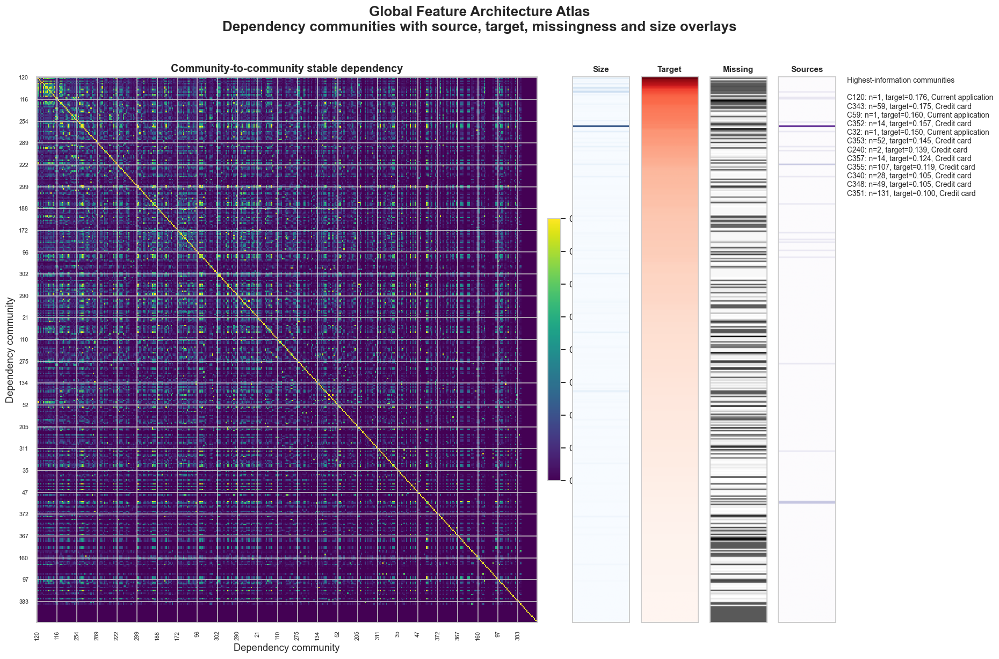

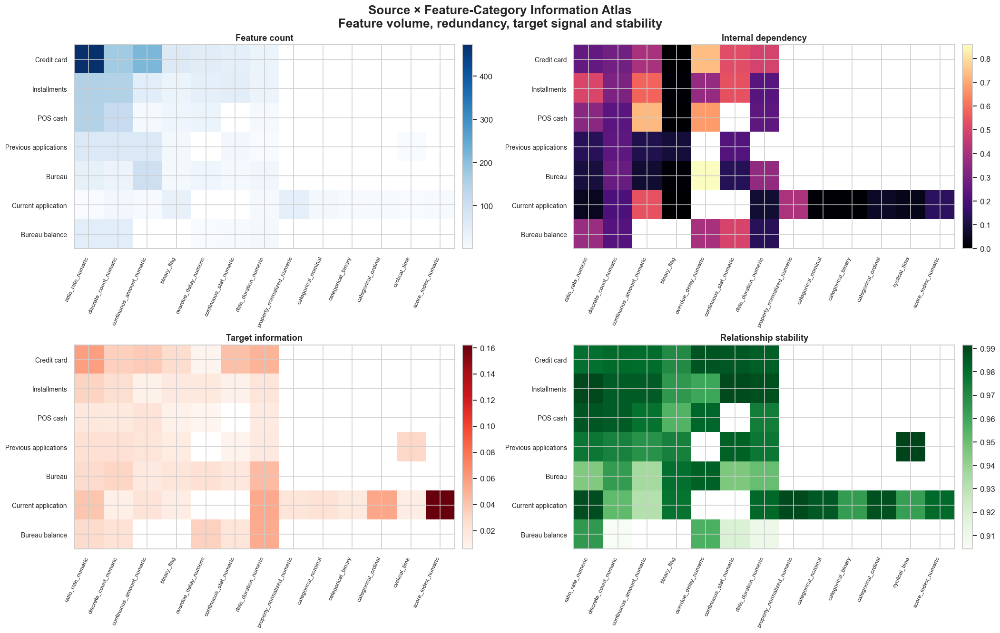

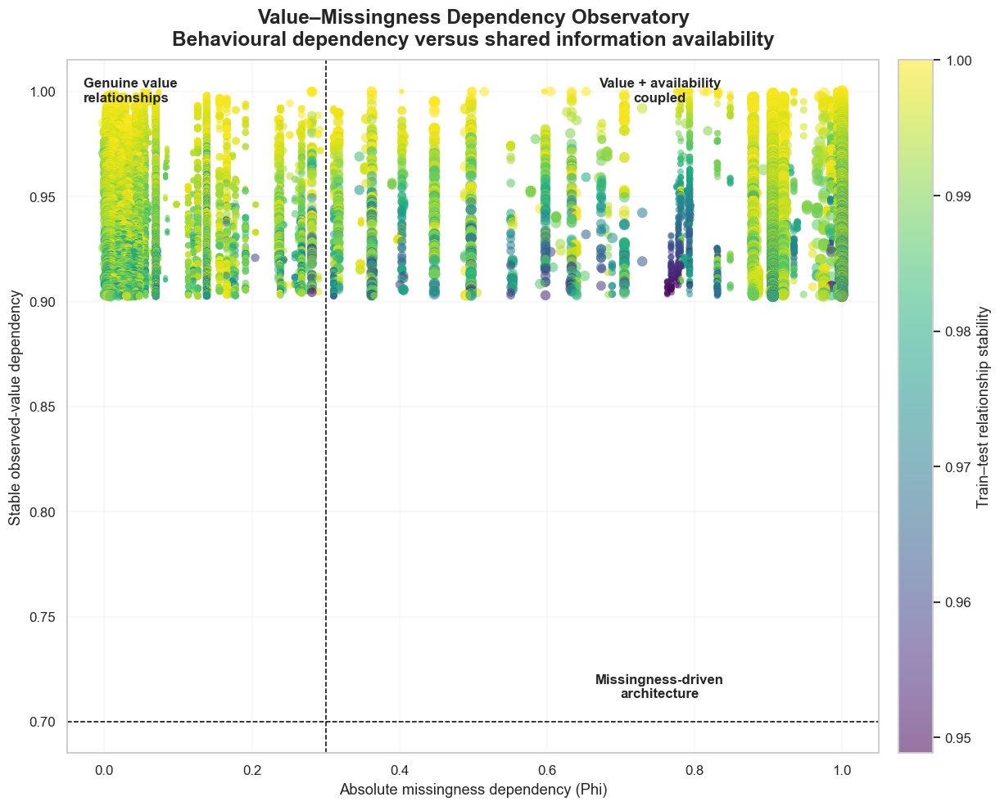

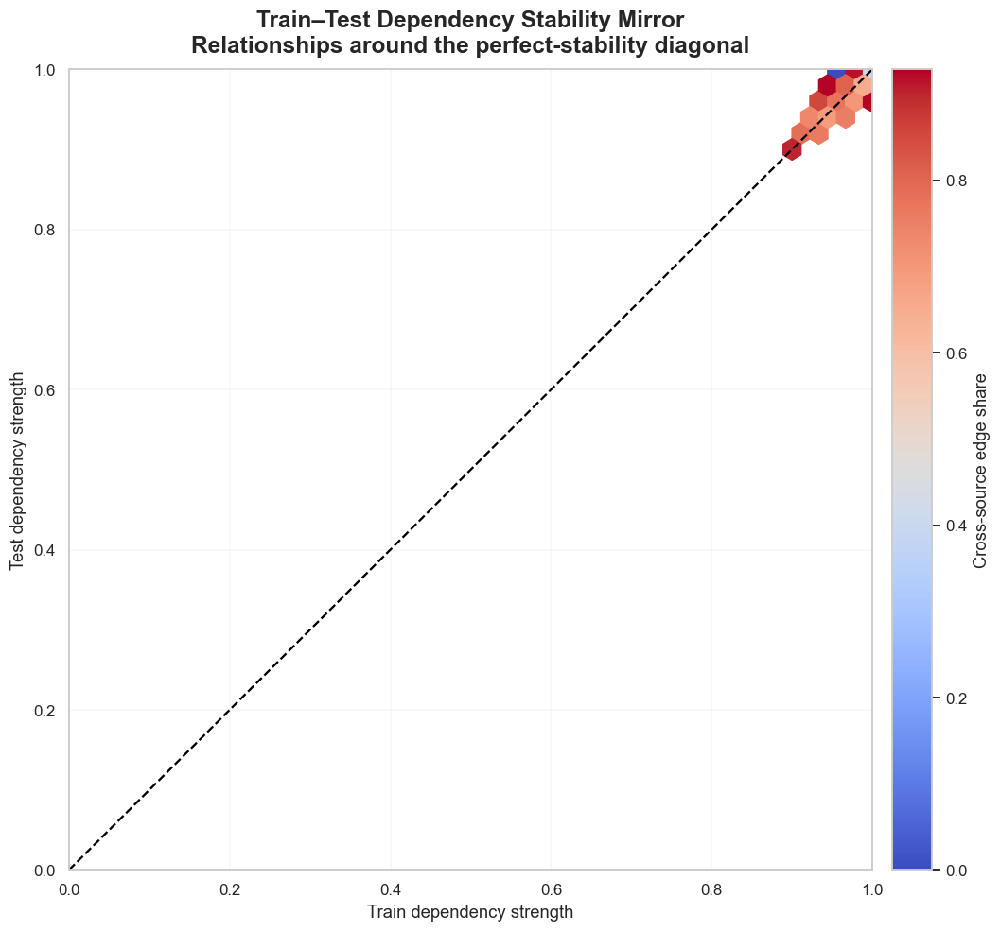

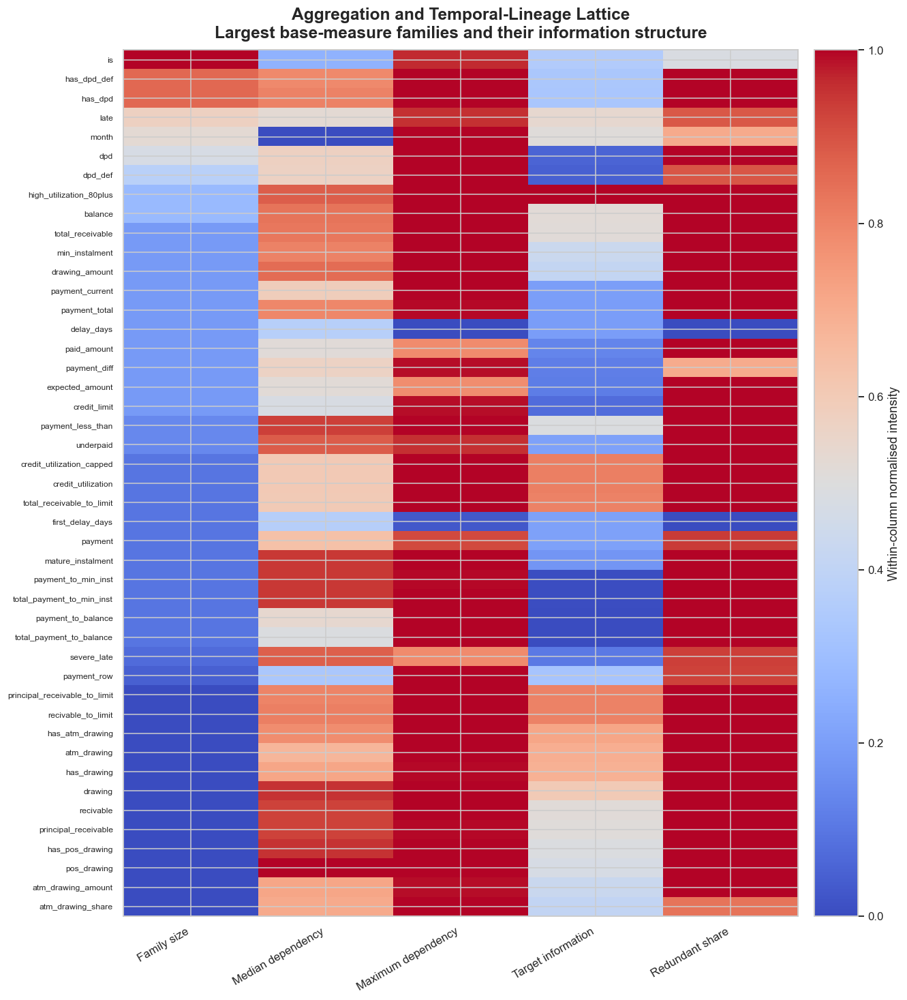

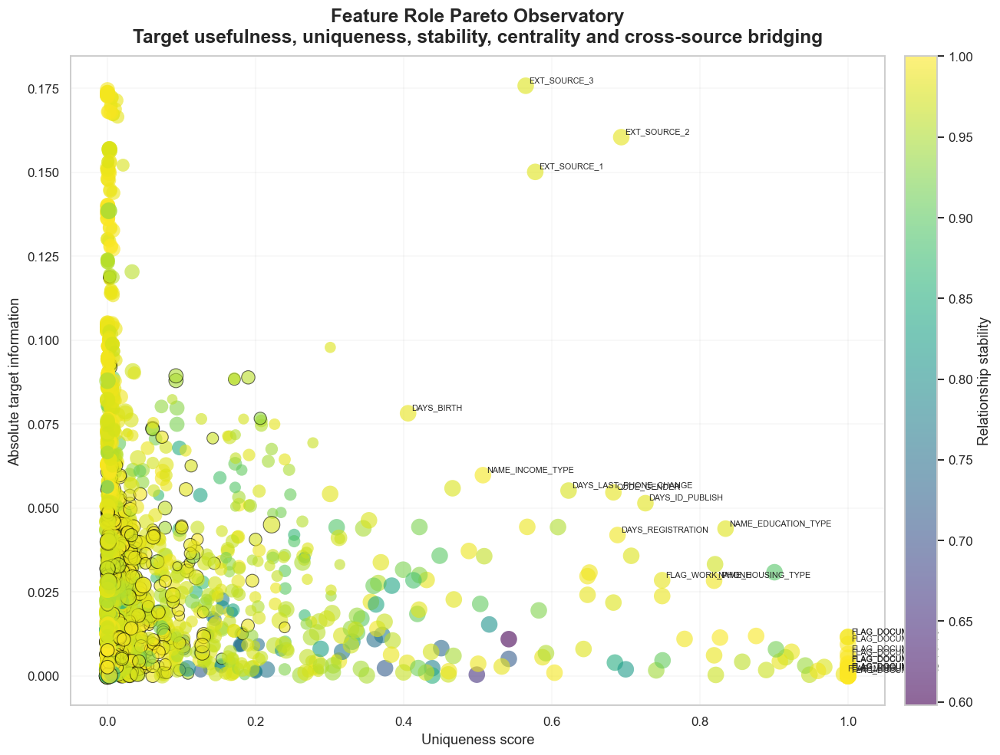

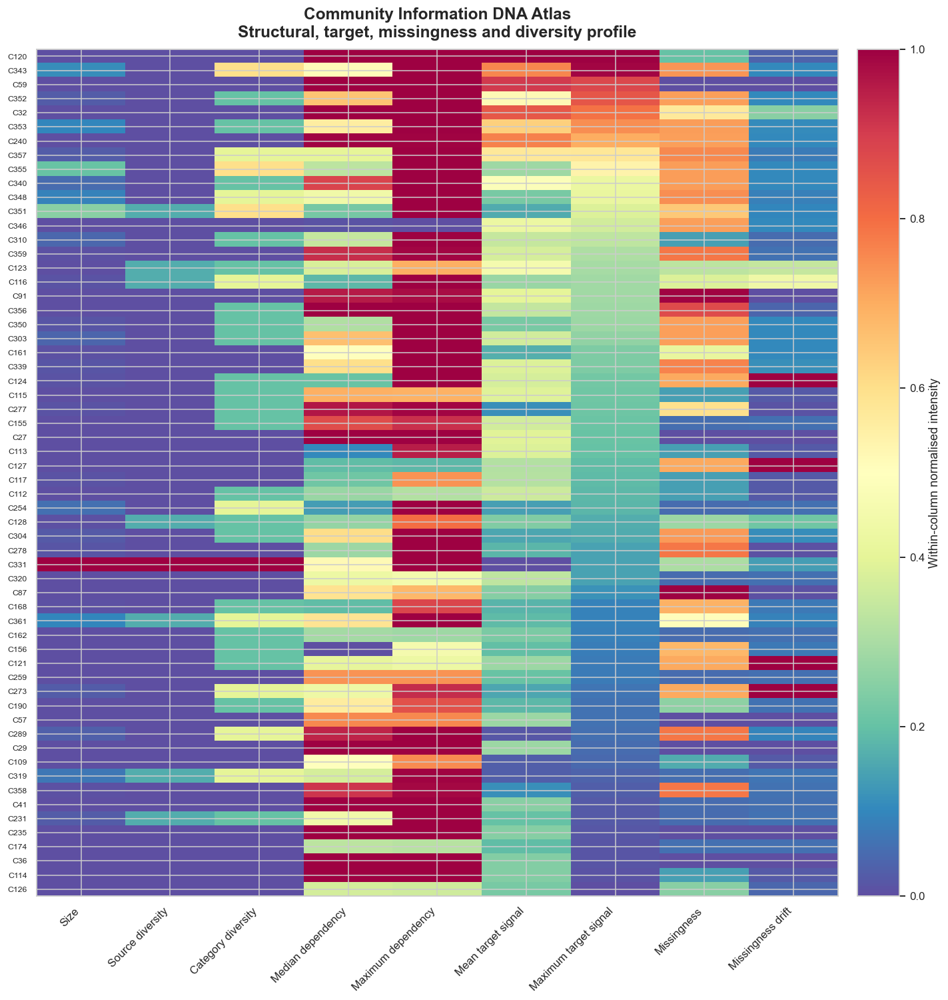

Step 6 plotting completed in 0.29 minutes.
6.16 Frozen Step 1–6 package: 0.13 minutes | remaining target budget: 66.64 minutes
STEP 6 FULL-RESOLUTION FEATURE ARCHITECTURE COMPLETE
Train applicants: 307,511
Test applicants: 48,744
Predictor features: 2,566
Unique pairs represented: 3,290,895
GPU: NVIDIA GeForce RTX 5060 Ti
Total runtime: 18.36 minutes
Tables: c:\Users\USER\Kawsar_Ahmmed\ALL_Projects_Lab\Machine_Learning\Credit_Default_Risk\Notebook\relationship_outputs\Step_6_Global_Feature_Architecture\tables
Figures: c:\Users\USER\Kawsar_Ahmmed\ALL_Projects_Lab\Machine_Learning\Credit_Default_Risk\Notebook\relationship_outputs\Step_6_Global_Feature_Architecture\figures
Frozen Step 1–6 package: c:\Users\USER\Kawsar_Ahmmed\ALL_Projects_Lab\Machine_Learning\Credit_Default_Risk\Notebook\relationship_outputs\Step_6_Global_Feature_Architecture\STEP_01_TO_06_FROZEN_v1
Runtime status: inside the configured engineering ceiling.

Hardware and runtime projection


,elapsed_after_core_dependencies_minutes,projected_total_minutes,target_runtime_minutes,hard_runtime_minutes,projected_inside_hard_contract,gpu,note
0,15.5768,27.5768,75,85,True,NVIDIA GeForce RTX 5060 Ti,"This is a hardware-specific estimate, not an unconditional guarantee."



Feature-category coverage


,train_rows,test_rows,predictors,declared_predictors,undeclared_predictors,category_only_features,duplicate_category_assignments,dataset_fingerprint
0,307511,48744,2566,2566,0,0,0,ada4cde426a3db8a806c2940333f1cc5aefec00d912d518748b0a756426e999f



Feature-category disagreements


,feature,feature_index,source,declared_category,empirical_category,validated_category,train_dtype,test_dtype,train_missing_rate,test_missing_rate,missing_rate_drift,exact_cardinality_if_required,time_window,lineage_base,inner_aggregation,outer_aggregation,category_disagreement



Feature identity and lineage registry


,feature,feature_index,source,declared_category,empirical_category,validated_category,train_dtype,test_dtype,train_missing_rate,test_missing_rate,missing_rate_drift,exact_cardinality_if_required,time_window,lineage_base,inner_aggregation,outer_aggregation,category_disagreement,target_correlation,absolute_target_information,present_default_rate,missing_default_rate,missingness_default_rate_gap,community_id,community_order
0,NAME_CONTRACT_TYPE,0,Current application,categorical_binary,categorical_string,categorical_binary,category,category,0.0000,0.0000,0.0000,2.0000,Lifetime or non-temporal,name_contract_type,none,none,NONE,0.0309,0.0309,0.0807,NaN,NaN,5,17
1,CODE_GENDER,1,Current application,categorical_nominal,categorical_string,categorical_nominal,category,category,0.0000,0.0000,0.0000,3.0000,Lifetime or non-temporal,code_gender,none,none,NONE,-0.0547,0.0547,0.0807,NaN,NaN,36,55
2,FLAG_OWN_CAR,2,Current application,categorical_binary,categorical_string,categorical_binary,category,category,0.0000,0.0000,0.0000,2.0000,Lifetime or non-temporal,flag_own_car,none,none,NONE,0.0219,0.0219,0.0807,NaN,NaN,37,56
3,FLAG_OWN_REALTY,3,Current application,categorical_binary,categorical_string,categorical_binary,category,category,0.0000,0.0000,0.0000,2.0000,Lifetime or non-temporal,flag_own_realty,none,none,NONE,-0.0061,0.0061,0.0807,NaN,NaN,18,34
4,CNT_CHILDREN,4,Current application,discrete_count_numeric,continuous_or_count_numeric,discrete_count_numeric,int8,int8,0.0000,0.0000,0.0000,NaN,Lifetime or non-temporal,cnt_children,none,none,NONE,0.0192,0.0192,0.0807,NaN,NaN,246,766
5,AMT_INCOME_TOTAL,5,Current application,continuous_amount_numeric,continuous_or_count_numeric,continuous_amount_numeric,float64,float64,0.0000,0.0000,0.0000,NaN,Lifetime or non-temporal,amt_income_total,none,none,NONE,-0.0040,0.0040,0.0807,NaN,NaN,132,257
6,AMT_CREDIT,6,Current application,continuous_amount_numeric,continuous_or_count_numeric,continuous_amount_numeric,float32,float32,0.0000,0.0000,0.0000,NaN,Lifetime or non-temporal,amt_credit,none,none,NONE,-0.0304,0.0304,0.0807,NaN,NaN,131,259
7,AMT_ANNUITY,7,Current application,continuous_amount_numeric,continuous_or_count_numeric,continuous_amount_numeric,float32,float32,0.0000,0.0005,0.0005,NaN,Lifetime or non-temporal,amt_annuity,none,none,NONE,-0.0128,0.0128,0.0807,0.0000,-0.0807,131,258
8,AMT_GOODS_PRICE,8,Current application,continuous_amount_numeric,continuous_or_count_numeric,continuous_amount_numeric,float32,float32,0.0009,0.0000,0.0009,NaN,Lifetime or non-temporal,amt_goods_price,none,none,NONE,-0.0396,0.0396,0.0807,0.0755,-0.0052,131,260
9,NAME_TYPE_SUITE,9,Current application,categorical_nominal,categorical_string,categorical_nominal,category,category,0.0042,0.0187,0.0145,7.0000,Lifetime or non-temporal,name_type_suite,none,none,NONE,0.0072,0.0072,0.0808,0.0542,-0.0267,365,30



Exact duplicate groups


,duplicate_group,feature,feature_index,group_size,representative_candidate
0,1,bureau_days_credit_max,198,2,bureau_days_credit_max
1,1,bureau_latest_days_credit,451,2,bureau_days_credit_max
2,2,prev_approved_application_amount_sum,548,2,prev_approved_application_amount_sum
3,2,prev_approved_goods_price_sum,557,2,prev_approved_application_amount_sum
4,3,prev_canceled_application_amount_sum,608,2,prev_canceled_application_amount_sum
5,3,prev_canceled_goods_price_sum,617,2,prev_canceled_application_amount_sum
6,4,prev_unused_offer_application_amount_sum,638,2,prev_unused_offer_application_amount_sum
7,4,prev_unused_offer_goods_price_sum,647,2,prev_unused_offer_application_amount_sum
8,5,prev_unused_offer_down_payment_mean,651,2,prev_unused_offer_down_payment_mean
9,5,prev_unused_offer_down_payment_max,652,2,prev_unused_offer_down_payment_mean



Dependency communities


,community_id,feature_count,dominant_source,dominant_source_share,source_diversity,dominant_category,category_diversity,median_internal_dependency,maximum_internal_dependency,mean_target_information,maximum_target_information,mean_train_missing_rate,mean_train_test_missing_drift,community_type
0,331,517,POS cash,0.2611,7,ratio_rate_numeric,6,0.8522,1.0000,0.0152,0.0711,0.3007,0.0783,CROSS_SOURCE_COMMUNITY
1,351,131,Credit card,0.8855,2,ratio_rate_numeric,4,0.7630,1.0000,0.0415,0.1004,0.6419,0.0560,CROSS_SOURCE_COMMUNITY
2,355,107,Credit card,1.0000,1,continuous_amount_numeric,4,0.7953,0.9999,0.0608,0.1189,0.7200,0.0583,SOURCE_PURE_COMMUNITY
3,343,59,Credit card,1.0000,1,ratio_rate_numeric,4,0.8498,1.0000,0.1375,0.1746,0.7310,0.0581,SOURCE_PURE_COMMUNITY
4,361,53,Credit card,0.6792,2,discrete_count_numeric,3,0.8723,0.9999,0.0459,0.0644,0.5038,0.0514,CROSS_SOURCE_COMMUNITY
5,353,52,Credit card,1.0000,1,ratio_rate_numeric,2,0.8644,0.9999,0.1166,0.1448,0.7214,0.0599,SOURCE_PURE_COMMUNITY
6,302,52,Installments,1.0000,1,ratio_rate_numeric,3,0.9418,0.9999,0.0217,0.0295,0.0518,0.0349,SOURCE_PURE_COMMUNITY
7,309,52,Credit card,1.0000,1,overdue_delay_numeric,3,0.8584,1.0000,0.0064,0.0155,0.7192,0.0599,SOURCE_PURE_COMMUNITY
8,348,49,Credit card,1.0000,1,discrete_count_numeric,3,0.8297,1.0000,0.0516,0.1047,0.7433,0.0493,SOURCE_PURE_COMMUNITY
9,323,44,Credit card,1.0000,1,discrete_count_numeric,3,0.9479,1.0000,0.0100,0.0221,0.7523,0.0458,SOURCE_PURE_COMMUNITY



Representative and complementary features


,feature,feature_index,source,validated_category,community_id,maximum_stable_dependency,strongest_partner,uniqueness_score,relationship_stability_score,cross_source_bridge_count,absolute_target_information,representative_suitability,provisional_feature_role
0,pos_status_canceled_count_sum,721,POS cash,binary_flag,1,0.9979,pos_status_canceled_count_max,0.0021,0.9647,0,0.0020,0.5153,PRIMARY_REPRESENTATIVE
1,pos_status_canceled_count_max,723,POS cash,binary_flag,1,0.9979,pos_status_canceled_count_sum,0.0021,0.9647,0,0.0020,0.5153,COMPLEMENTARY_REPRESENTATIVE
2,FONDKAPREMONT_MODE,84,Current application,categorical_nominal,2,0.0841,REGION_POPULATION_RELATIVE,0.9159,0.9651,0,0.0056,0.5987,PRIMARY_REPRESENTATIVE
3,cc_latest_status_signed_flag,2527,Credit card,binary_flag,3,0.2504,cc_status_signed_ratio_max,0.7496,0.9046,0,0.0046,0.5295,PRIMARY_REPRESENTATIVE
4,cc_status_refused_count_sum,1545,Credit card,binary_flag,4,1.0000,cc_status_refused_count_mean,0.0000,0.9963,0,0.0026,0.4415,PRIMARY_REPRESENTATIVE
5,cc_status_refused_count_mean,1546,Credit card,binary_flag,4,1.0000,cc_status_refused_count_sum,0.0000,0.9963,0,0.0026,0.4415,COMPLEMENTARY_REPRESENTATIVE
6,cc_status_refused_count_max,1547,Credit card,binary_flag,4,1.0000,cc_status_refused_count_sum,0.0000,0.9963,0,0.0026,0.4415,COMPLEMENTARY_REPRESENTATIVE
7,NAME_CONTRACT_TYPE,0,Current application,categorical_binary,5,0.0992,FLAG_DOCUMENT_3,0.9008,0.8941,0,0.0309,0.6934,PRIMARY_REPRESENTATIVE
8,FLAG_CONT_MOBILE,23,Current application,binary_flag,6,0.0520,NAME_CONTRACT_TYPE,0.9480,0.9626,0,0.0004,0.6908,PRIMARY_REPRESENTATIVE
9,has_pos_cash_history,691,Current application,binary_flag,7,0.6629,has_installment_history,0.3371,0.9110,0,0.0129,0.5726,PRIMARY_REPRESENTATIVE



Redundancy candidates


,feature,feature_index,source,validated_category,community_id,maximum_stable_dependency,strongest_partner,uniqueness_score,relationship_stability_score,cross_source_bridge_count,absolute_target_information,representative_suitability,provisional_feature_role
0,YEARS_BUILD_MEDI,73,Current application,property_normalized_numeric,62,0.9979,YEARS_BUILD_AVG,0.0021,0.9871,0,0.0207,0.4533,NEAR_REDUNDANT
1,YEARS_BUILD_MODE,59,Current application,property_normalized_numeric,62,0.9874,YEARS_BUILD_AVG,0.0126,0.9869,0,0.0205,0.4533,NEAR_REDUNDANT
2,YEARS_BUILD_AVG,45,Current application,property_normalized_numeric,62,0.9979,YEARS_BUILD_MEDI,0.0021,0.9871,0,0.0206,0.4530,NEAR_REDUNDANT
3,LIVINGAREA_MODE,67,Current application,property_normalized_numeric,64,0.9674,LIVINGAREA_MEDI,0.0326,0.9918,0,0.0287,0.4743,NEAR_REDUNDANT
4,APARTMENTS_AVG,42,Current application,property_normalized_numeric,64,0.9917,APARTMENTS_MEDI,0.0083,0.9905,0,0.0276,0.4709,NEAR_REDUNDANT
5,APARTMENTS_MEDI,70,Current application,property_normalized_numeric,64,0.9917,APARTMENTS_AVG,0.0083,0.9901,0,0.0273,0.4698,NEAR_REDUNDANT
6,APARTMENTS_MODE,56,Current application,property_normalized_numeric,64,0.9710,APARTMENTS_MEDI,0.0290,0.9910,0,0.0255,0.4669,NEAR_REDUNDANT
7,ELEVATORS_AVG,47,Current application,property_normalized_numeric,64,0.9925,ELEVATORS_MEDI,0.0075,0.9833,0,0.0318,0.4488,NEAR_REDUNDANT
8,ELEVATORS_MEDI,75,Current application,property_normalized_numeric,64,0.9925,ELEVATORS_AVG,0.0075,0.9835,0,0.0315,0.4488,NEAR_REDUNDANT
9,ELEVATORS_MODE,61,Current application,property_normalized_numeric,64,0.9758,ELEVATORS_MEDI,0.0242,0.9840,0,0.0299,0.4476,NEAR_REDUNDANT



Aggregation and temporal-lineage families


,lineage_base,feature_count,sources,time_windows,aggregation_variants,median_internal_dependency,maximum_internal_dependency,maximum_target_information,near_redundant_share,family_role
0,is,54,Credit card | Installments | POS cash,Recent 12 months | Recent 24 months | Recent 6 months,count | max | mean | min | ratio | sum,0.3141,0.9967,0.0635,0.4815,COMPLEMENTARY_AGGREGATION_FAMILY
1,has_dpd,48,Credit card | POS cash,Lifetime or non-temporal | Recent 12 months | Recent 24 months | Recent 6 months,count | max | mean | min | ratio | sum,0.7868,1.0000,0.0592,1.0000,COMPLEMENTARY_AGGREGATION_FAMILY
2,has_dpd_def,48,Credit card | POS cash,Lifetime or non-temporal | Recent 12 months | Recent 24 months | Recent 6 months,count | max | mean | min | ratio | sum,0.7706,0.9999,0.0598,1.0000,COMPLEMENTARY_AGGREGATION_FAMILY
3,late,36,Bureau balance | Installments,Lifetime or non-temporal | Recent 12 months | Recent 24 months | Recent 6 months,count | max | mean | min | ratio | sum,0.5443,0.9957,0.0940,0.8889,COMPLEMENTARY_AGGREGATION_FAMILY
4,month,34,Bureau balance | Credit card | POS cash,Lifetime or non-temporal,count | max | mean | min | none | sum,0.0898,0.9998,0.0894,0.7059,COMPLEMENTARY_AGGREGATION_FAMILY
5,dpd,32,Credit card | POS cash,Lifetime or non-temporal | Recent 6 months,max | mean | min | std | sum,0.5874,1.0000,0.0125,1.0000,COMPLEMENTARY_AGGREGATION_FAMILY
6,dpd_def,28,Credit card | POS cash,Lifetime or non-temporal,max | mean | min | std | sum,0.5820,1.0000,0.0110,0.8929,COMPLEMENTARY_AGGREGATION_FAMILY
7,high_utilization_80plus,24,Credit card,Lifetime or non-temporal | Recent 12 months | Recent 24 months | Recent 6 months,count | max | mean | min | ratio | sum,0.8485,0.9999,0.1724,1.0000,COMPLEMENTARY_AGGREGATION_FAMILY
8,balance,24,Credit card,Lifetime or non-temporal,max | mean | min | range | std | sum,0.8121,0.9998,0.0905,1.0000,COMPLEMENTARY_AGGREGATION_FAMILY
9,payment_current,20,Credit card,Lifetime or non-temporal,max | mean | min | std | sum,0.5979,1.0000,0.0370,1.0000,COMPLEMENTARY_AGGREGATION_FAMILY



Source × category information summary


,source,validated_category,feature_count,median_internal_dependency,top_internal_dependency,mean_target_information,maximum_target_information,mean_missing_rate,mean_relationship_stability,redundancy_candidate_share
29,Current application,score_index_numeric,3,0.1417,0.2005,0.1621,0.1758,0.2547,0.9811,0.0000
18,Credit card,ratio_rate_numeric,472,0.2556,1.0000,0.0587,0.1746,0.7391,0.9791,0.3390
16,Credit card,discrete_count_numeric,173,0.2874,1.0000,0.0341,0.1532,0.7261,0.9812,0.6069
12,Credit card,binary_flag,62,0.0018,1.0000,0.0271,0.1532,0.7174,0.9699,0.2097
13,Credit card,continuous_amount_numeric,217,0.4033,1.0000,0.0367,0.0949,0.7294,0.9803,0.6959
36,Installments,ratio_rate_numeric,151,0.5042,1.0000,0.0318,0.0940,0.0805,0.9902,0.2781
8,Bureau balance,date_duration_numeric,12,0.1359,0.9221,0.0528,0.0894,0.7001,0.9102,0.0833
6,Bureau,ratio_rate_numeric,41,0.1003,0.9933,0.0275,0.0889,0.2497,0.9451,0.0000
5,Bureau,overdue_delay_numeric,20,0.8583,0.9993,0.0240,0.0886,0.4176,0.9833,0.0000
4,Bureau,discrete_count_numeric,28,0.2710,0.9903,0.0308,0.0884,0.1431,0.9638,0.0000



Step 2–5 research-feature architecture mapping


,research_feature,nearest_raw_feature,absolute_dependency,mapping_role
0,step2_analyzer:AMT_INCOME_TOTAL,AMT_INCOME_TOTAL,1.0000,RESEARCH_FEATURE_IS_RAW_DUPLICATE
1,step2_analyzer:AMT_CREDIT,AMT_CREDIT,1.0000,RESEARCH_FEATURE_IS_RAW_DUPLICATE
2,step2_analyzer:CNT_CHILDREN,CNT_CHILDREN,1.0000,RESEARCH_FEATURE_IS_RAW_DUPLICATE
3,step2_analyzer:installment_source_available,has_installment_history,1.0000,RESEARCH_FEATURE_IS_RAW_DUPLICATE
4,step3_analyzer:cc_available,has_credit_card_history,1.0000,RESEARCH_FEATURE_IS_RAW_DUPLICATE
5,step3_analyzer:inst_available,has_installment_history,1.0000,RESEARCH_FEATURE_IS_RAW_DUPLICATE
6,step2_analyzer:credit_card_source_available,has_credit_card_history,1.0000,RESEARCH_FEATURE_IS_RAW_DUPLICATE
7,step2_analyzer:DAYS_BIRTH,DAYS_BIRTH,1.0000,RESEARCH_FEATURE_IS_RAW_DUPLICATE
8,step2_analyzer:applicant_age_years,DAYS_BIRTH,1.0000,RESEARCH_FEATURE_IS_RAW_DUPLICATE
9,step2_analyzer:DAYS_EMPLOYED,DAYS_EMPLOYED,1.0000,RESEARCH_FEATURE_IS_RAW_DUPLICATE



Strong and stable dependency edges


,feature_a,feature_b,feature_a_index,feature_b_index,source_a,source_b,category_a,category_b,train_pearson,test_pearson,train_rank_dependency,test_rank_dependency,train_missingness_phi,test_missingness_phi,train_overlap_ratio,stable_dependency_strength,dependency_drift,cross_source,value_missingness_class
0,cc_latest_has_atm_drawing_flag,cc_latest_pos_drawing_share,2550,2553,Credit card,Credit card,binary_flag,ratio_rate_numeric,-1.0000,-1.0000,-1.0000,-1.0000,0.4032,0.3725,0.0602,1.0000,0.0000,False,VALUE_AND_AVAILABILITY_COUPLED
1,cc_latest_has_atm_drawing_flag,cc_latest_atm_drawing_share,2550,2552,Credit card,Credit card,binary_flag,ratio_rate_numeric,1.0000,1.0000,1.0000,1.0000,0.4032,0.3725,0.0602,1.0000,0.0000,False,VALUE_AND_AVAILABILITY_COUPLED
2,inst_recent_12m_underpaid_ratio_max,inst_recent_12m_underpaid_ratio_adjusted_max,1180,1198,Installments,Installments,ratio_rate_numeric,ratio_rate_numeric,1.0000,1.0000,1.0000,1.0000,0.3626,0.2088,0.7073,1.0000,0.0000,False,VALUE_AND_AVAILABILITY_COUPLED
3,cc_latest_no_payment_with_balance_flag_max,cc_latest_no_payment_with_balance_flag,2495,2546,Credit card,Credit card,binary_flag,binary_flag,1.0000,1.0000,1.0000,1.0000,1.0000,1.0000,0.2826,1.0000,0.0000,False,VALUE_AND_AVAILABILITY_COUPLED
4,cc_latest_has_dpd_sum,cc_latest_has_dpd,2485,2556,Credit card,Credit card,binary_flag,binary_flag,1.0000,1.0000,1.0000,1.0000,1.0000,1.0000,0.2826,1.0000,0.0000,False,VALUE_AND_AVAILABILITY_COUPLED
5,cc_latest_has_dpd_max,cc_latest_has_dpd,2483,2556,Credit card,Credit card,binary_flag,binary_flag,1.0000,1.0000,1.0000,1.0000,1.0000,1.0000,0.2826,1.0000,0.0000,False,VALUE_AND_AVAILABILITY_COUPLED
6,cc_latest_has_dpd_max,cc_latest_has_dpd_sum,2483,2485,Credit card,Credit card,binary_flag,binary_flag,1.0000,1.0000,1.0000,1.0000,1.0000,1.0000,0.2826,1.0000,0.0000,False,VALUE_AND_AVAILABILITY_COUPLED
7,cc_latest_total_receivable_to_limit_sum,cc_latest_credit_utilization,2449,2534,Credit card,Credit card,ratio_rate_numeric,ratio_rate_numeric,1.0000,1.0000,1.0000,1.0000,0.8308,0.8435,0.2138,1.0000,0.0000,False,VALUE_AND_AVAILABILITY_COUPLED
8,cc_latest_total_receivable_to_limit_sum,cc_latest_credit_utilization_capped,2449,2535,Credit card,Credit card,ratio_rate_numeric,ratio_rate_numeric,1.0000,1.0000,1.0000,1.0000,0.8308,0.8435,0.2138,1.0000,0.0000,False,VALUE_AND_AVAILABILITY_COUPLED
9,cc_latest_total_receivable_to_limit_sum,cc_latest_total_receivable_to_limit,2449,2539,Credit card,Credit card,ratio_rate_numeric,ratio_rate_numeric,1.0000,1.0000,1.0000,1.0000,0.8308,0.8435,0.2138,1.0000,0.0000,False,VALUE_AND_AVAILABILITY_COUPLED



Step 7 priority feature pool


,feature,feature_index,source,declared_category,empirical_category,validated_category,train_dtype,test_dtype,train_missing_rate,test_missing_rate,missing_rate_drift,exact_cardinality_if_required,time_window,lineage_base,inner_aggregation,outer_aggregation,category_disagreement,target_correlation,absolute_target_information,present_default_rate,missing_default_rate,missingness_default_rate_gap,community_id,community_order,maximum_stable_dependency,strongest_partner,uniqueness_score,relationship_stability_score,cross_source_bridge_count,completeness_score,community_centrality,absolute_target_information_normalised,uniqueness_score_normalised,relationship_stability_score_normalised,completeness_score_normalised,community_centrality_normalised,representative_suitability,provisional_feature_role,step7_priority_reason
0,EXT_SOURCE_3,41,Current application,score_index_numeric,continuous_or_count_numeric,score_index_numeric,float32,float32,0.1983,0.1778,0.0204,NaN,Lifetime or non-temporal,ext_source_3,none,none,NONE,-0.1758,0.1758,0.0777,0.0931,0.0155,120,210,0.4352,bureau_debt_to_credit_max,0.5648,0.9793,0,0.8017,1.0000,1.0000,0.5648,0.9486,0.8014,1.0000,0.8826,PRIMARY_REPRESENTATIVE,PRIMARY_REPRESENTATIVE
1,cc_latest_credit_utilization_capped,2535,Credit card,ratio_rate_numeric,continuous_or_count_numeric,ratio_rate_numeric,float32,float32,0.7862,0.7303,0.0559,NaN,Latest,latest_credit_utilization_capped,none,none,NONE,0.1746,0.1746,0.0913,0.0779,-0.0134,343,2012,1.0000,cc_latest_credit_utilization_sum,0.0000,0.9932,0,0.2138,0.9045,0.9934,0.0000,0.9830,0.2126,0.8105,0.6700,PRIMARY_REPRESENTATIVE,PRIMARY_REPRESENTATIVE
2,cc_latest_credit_utilization,2534,Credit card,ratio_rate_numeric,continuous_or_count_numeric,ratio_rate_numeric,float32,float32,0.7862,0.7303,0.0559,NaN,Latest,latest_credit_utilization,none,none,NONE,0.1738,0.1738,0.0913,0.0779,-0.0134,343,2019,1.0000,cc_latest_credit_utilization_sum,0.0000,0.9934,0,0.2138,0.9021,0.9887,0.0000,0.9835,0.2126,0.8058,0.6680,TARGET_STRONG_STABLE,TARGET_STRONG_STABLE
3,cc_latest_credit_utilization_mean,2442,Credit card,ratio_rate_numeric,continuous_or_count_numeric,ratio_rate_numeric,float32,float32,0.7860,0.7299,0.0561,NaN,Latest,latest_credit_utilization,none,mean,NONE,0.1738,0.1738,0.0913,0.0779,-0.0134,343,2014,1.0000,cc_latest_credit_utilization_sum,0.0000,0.9934,0,0.2140,0.9026,0.9885,0.0000,0.9836,0.2128,0.8067,0.6682,COMPLEMENTARY_REPRESENTATIVE,COMPLEMENTARY_REPRESENTATIVE
4,cc_latest_credit_utilization_max,2443,Credit card,ratio_rate_numeric,continuous_or_count_numeric,ratio_rate_numeric,float32,float32,0.7860,0.7299,0.0561,NaN,Latest,latest_credit_utilization,none,max,NONE,0.1737,0.1737,0.0913,0.0779,-0.0134,343,2018,1.0000,cc_latest_credit_utilization_sum,0.0000,0.9933,0,0.2140,0.9021,0.9882,0.0000,0.9835,0.2128,0.8057,0.6679,TARGET_STRONG_STABLE,TARGET_STRONG_STABLE
5,cc_latest_credit_utilization_min,2444,Credit card,ratio_rate_numeric,continuous_or_count_numeric,ratio_rate_numeric,float32,float32,0.7860,0.7299,0.0561,NaN,Latest,latest_credit_utilization,none,min,NONE,0.1735,0.1735,0.0913,0.0779,-0.0134,343,2021,1.0000,cc_latest_credit_utilization_sum,0.0000,0.9954,0,0.2140,0.9018,0.9871,0.0000,0.9886,0.2128,0.8052,0.6686,COMPLEMENTARY_REPRESENTATIVE,COMPLEMENTARY_REPRESENTATIVE
6,cc_latest_total_receivable_to_limit,2539,Credit card,ratio_rate_numeric,continuous_or_count_numeric,ratio_rate_numeric,float32,float32,0.7862,0.7303,0.0559,NaN,Latest,latest_total_receivable_to_limit,none,none,NONE,0.1730,0.1730,0.0913,0.0779,-0.0134,343,2017,1.0000,cc_latest_total_receivable_to_limit_sum,0.0000,0.9933,0,0.2138,0.9029,0.9840,0.0000,0.9833,0.2126,0.8074,0.6669,TARGET_STRONG_STABLE,TARGET_STRONG_STABLE
7,cc_latest_total_receivable_to_limit_mean,2446,Credit card,ratio_rate_numeric,continuous_or_count_numeric,ratio_rate_numeric,float32,float32,0.7860,0.7299,0.0561,NaN,Latest,latest_total_receivable_to_limit,none,mean,NONE,0.1729,0.1729,0.0913,0.0779,-0.0134,343,2013,1.0000,cc_latest_tot


Final Step 6 register


,step,version,train_rows,test_rows,predictor_features,unique_feature_pairs,communities,cross_source_communities,exact_duplicate_features,near_redundant_features,primary_representatives,complementary_representatives,cross_source_bridges,target_strong_stable,published_interpretable_edges,gpu,runtime_minutes_before_plotting,pca_used,final_feature_deletion_performed,decision
0,STEP_6_GLOBAL_FEATURE_ARCHITECTURE,step6_global_feature_architecture_v1.1,307511,48744,2566,3290895,400,20,134,726,400,396,658,190,100000,NVIDIA GeForce RTX 5060 Ti,17.9375,False,False,STEP_6_ARCHITECTURE_COMPLETE_READY_FOR_STEP_7



Complete runtime audit


,phase,started,remaining_at_start_minutes,ended,elapsed_minutes,remaining_at_end_minutes,status,note
0,6.0 Hardware and CUDA preflight,"5,911.2052",85.0000,"5,911.2073",0.0000,84.9999,COMPLETE,
1,6.1 Input and category validation,"5,911.2075",84.9999,"5,911.2114",0.0001,84.9999,COMPLETE,
2,6.2 Feature identity and lineage registry,"5,911.2115",84.9999,"5,913.3405",0.0355,84.9644,COMPLETE,
3,6.3 Compact full-row matrix preparation,"5,913.3409",84.9644,"6,310.8255",6.6247,78.3396,COMPLETE,CREATED
4,6.4 Full GPU dependency architecture,"6,310.8258",78.3396,"6,845.8093",8.9164,69.4232,COMPLETE,
5,6.5 Runtime projection,"6,845.8096",69.4232,"6,845.8099",0.0000,69.4232,COMPLETE,
6,6.6 Exact duplicate audit,"6,845.8100",69.4232,"6,874.0483",0.4706,68.9526,COMPLETE,
7,6.7 Target and missingness-risk overlay,"6,874.3412",68.9477,"6,895.9113",0.3595,68.5882,COMPLETE,
8,6.8 Train-test stability synthesis,"6,896.1623",68.5840,"6,896.3371",0.0029,68.5811,COMPLETE,
9,6.9 Dependency communities,"6,896.3401",68.5811,"6,896.5645",0.0037,68.5773,COMPLETE,


In [34]:
from pathlib import Path
import os
import time
import pandas as pd

from IPython.display import display


if "train_df" not in globals():
    raise NameError("train_df is not defined. Run the integrated training-data loading cell before Step 6.")

if "test_df" not in globals():
    raise NameError("test_df is not defined. Run the integrated test-data loading cell before Step 6.")

if "FEATURE_CATEGORY_LISTS" not in globals():
    raise NameError("FEATURE_CATEGORY_LISTS is not defined. Run the feature-category-list cell before Step 6.")

ID_COL = globals().get(
    "ID_COL",
    "SK_ID_CURR"
)

TARGET_COL = globals().get(
    "TARGET_COL",
    "TARGET"
)

RANDOM_SEED = globals().get(
    "RANDOM_SEED",
    42
)

STEP6_OUTPUT_ROOT = (
    Path.cwd()
    / "relationship_outputs"
    / "Step_6_Global_Feature_Architecture"
)

STEP6_OUTPUT_ROOT.mkdir(
    parents=True,
    exist_ok=True
)

STEP6_CONFIG = {
    "seed": RANDOM_SEED,
    "target_runtime_minutes": 75,
    "hard_runtime_minutes": 85,
    "rank_block_size": 96,
    "gpu_feature_block_size": 384,
    "community_dependency_threshold": 0.68,
    "near_redundancy_threshold": 0.95,
    "strong_edge_threshold": 0.75,
    "edge_export_threshold": 0.35,
    "top_edge_limit": 100000,
    "plot_edge_limit": 60000,
    "minimum_overlap_ratio": 0.03,
    "representatives_per_community": 3,
    "rank_low_cardinality_cutoff": 64,
    "reuse_cache": True,
    "overwrite_cache": False,
    "plot_dpi": 220
}

step6_total_started = time.perf_counter()

step6_analyzer = GlobalFeatureArchitectureAnalyzer(
    train_data=train_df,
    test_data=test_df,
    id_col=ID_COL,
    target_col=TARGET_COL,
    category_lists=FEATURE_CATEGORY_LISTS,
    output_root=STEP6_OUTPUT_ROOT,
    config=STEP6_CONFIG,
    namespace=globals()
)

step6_analyzer.run_all()
step6_analyzer.export()

step6_plotter = GlobalFeatureArchitecturePlotter(
    analyzer=step6_analyzer,
    figure_dir=step6_analyzer.figure_dir
)

step6_plotter.plot_all()

STEP1_TO_6_FROZEN_DIR = (
    step6_analyzer.freeze_step1_to_step6()
)

step6_feature_registry = step6_analyzer.results[
    "feature_identity_and_lineage_registry"
]

step6_category_disagreement = step6_analyzer.results[
    "feature_category_disagreement_register"
]

step6_exact_duplicates = step6_analyzer.results[
    "exact_duplicate_groups"
]

step6_target_overlay = step6_analyzer.results[
    "feature_target_information_overlay"
]

step6_community_registry = step6_analyzer.results[
    "feature_dependency_community_registry"
]

step6_feature_role_register = step6_analyzer.results[
    "feature_role_register"
]

step6_representative_register = step6_analyzer.results[
    "representative_feature_register"
]

step6_redundancy_register = step6_analyzer.results[
    "redundancy_candidate_register"
]

step6_aggregation_registry = step6_analyzer.results[
    "aggregation_lineage_registry"
]

step6_source_category_summary = step6_analyzer.results[
    "source_category_information_summary"
]

step6_step2_to_step5_mapping = step6_analyzer.results[
    "step2_to_step5_feature_architecture_mapping"
]

step6_top_edges = step6_analyzer.results[
    "top_dependency_edge_register"
]

step7_priority_feature_pool = step6_analyzer.results[
    "step7_priority_feature_pool"
]

step6_runtime_contract = step6_analyzer.results[
    "runtime_contract_audit"
]

step6_final_register = step6_analyzer.results[
    "step6_final_feature_architecture_register"
]

step6_publication_manifest = step6_analyzer.results[
    "publication_manifest"
]

step6_total_minutes = (
    time.perf_counter() - step6_total_started
) / 60

step6_runtime_audit = pd.DataFrame(
    step6_analyzer.runtime_records
)

total_runtime_record = pd.DataFrame(
    [
        {
            "phase": "TOTAL_STEP_6_INCLUDING_PLOTS_AND_FREEZE",
            "elapsed_minutes": step6_total_minutes,
            "status": (
                "INSIDE_ENGINEERING_TARGET"
                if step6_total_minutes <= STEP6_CONFIG["hard_runtime_minutes"]
                else "COMPLETED_ABOVE_ENGINEERING_TARGET"
            ),
            "note": "Actual runtime depends on local CUDA, SSD, thermal and data conditions."
        }
    ]
)

step6_runtime_with_total = pd.concat(
    [
        step6_runtime_audit,
        total_runtime_record
    ],
    ignore_index=True
)

step6_runtime_with_total.to_parquet(
    step6_analyzer.table_dir
    / "6.20_runtime_audit_with_total.parquet",
    index=False
)

print("=" * 100)
print("STEP 6 FULL-RESOLUTION FEATURE ARCHITECTURE COMPLETE")
print("=" * 100)
print(f"Train applicants: {len(train_df):,}")
print(f"Test applicants: {len(test_df):,}")
print(f"Predictor features: {len(step6_analyzer.feature_names):,}")
print(f"Unique pairs represented: {len(step6_analyzer.feature_names) * (len(step6_analyzer.feature_names) - 1) // 2:,}")
print(f"GPU: {step6_analyzer.gpu_name}")
print(f"Total runtime: {step6_total_minutes:.2f} minutes")
print(f"Tables: {step6_analyzer.table_dir}")
print(f"Figures: {step6_analyzer.figure_dir}")
print(f"Frozen Step 1–6 package: {STEP1_TO_6_FROZEN_DIR}")

if step6_total_minutes <= STEP6_CONFIG["hard_runtime_minutes"]:
    print("Runtime status: inside the configured engineering ceiling.")
else:
    print("Runtime status: completed above the configured engineering ceiling.")
    print("The runtime audit below identifies the bottleneck. Existing caches will be reused.")

print("\nHardware and runtime projection")
display(step6_runtime_contract)

print("\nFeature-category coverage")
display(
    step6_analyzer.results[
        "feature_category_coverage_audit"
    ]
)

print("\nFeature-category disagreements")
display(
    step6_category_disagreement.head(30)
)

print("\nFeature identity and lineage registry")
display(
    step6_feature_registry.head(30)
)

print("\nExact duplicate groups")
display(
    step6_exact_duplicates.head(50)
)

print("\nDependency communities")
display(
    step6_community_registry.head(40)
)

print("\nRepresentative and complementary features")
display(
    step6_representative_register.head(60)
)

print("\nRedundancy candidates")
display(
    step6_redundancy_register.head(60)
)

print("\nAggregation and temporal-lineage families")
display(
    step6_aggregation_registry.head(60)
)

print("\nSource × category information summary")
display(
    step6_source_category_summary
    .sort_values(
        [
            "maximum_target_information",
            "feature_count"
        ],
        ascending=[
            False,
            False
        ]
    )
    .head(60)
)

print("\nStep 2–5 research-feature architecture mapping")
display(
    step6_step2_to_step5_mapping.head(60)
)

print("\nStrong and stable dependency edges")
display(
    step6_top_edges.head(60)
)

print("\nStep 7 priority feature pool")
display(
    step7_priority_feature_pool.head(100)
)

print("\nFinal Step 6 register")
display(
    step6_final_register
)

print("\nComplete runtime audit")
display(
    step6_runtime_with_total
)

In [35]:
from pathlib import Path
from types import SimpleNamespace

import json
import time

import numpy as np
import pandas as pd

from IPython.display import display


STEP6_OUTPUT_ROOT = (
    Path.cwd()
    / "relationship_outputs"
    / "Step_6_Global_Feature_Architecture"
)

STEP1_TO_6_FROZEN_DIR = (
    STEP6_OUTPUT_ROOT
    / "STEP_01_TO_06_FROZEN_v1"
)

if not STEP1_TO_6_FROZEN_DIR.exists():
    raise FileNotFoundError(
        "Frozen Step 1–6 package was not found:\n"
        f"{STEP1_TO_6_FROZEN_DIR}\n"
        "Run the Step 6 execution cell once before using this loader."
    )

complete_flag = (
    STEP1_TO_6_FROZEN_DIR
    / "COMPLETE.flag"
)

if not complete_flag.exists():
    raise RuntimeError(
        "Frozen Step 1–6 package is incomplete because COMPLETE.flag is missing:\n"
        f"{STEP1_TO_6_FROZEN_DIR}"
    )

loader_started = time.perf_counter()

manifest_path = (
    STEP1_TO_6_FROZEN_DIR
    / "manifest.json"
)

manifest = json.loads(
    manifest_path.read_text(
        encoding="utf-8"
    )
)

feature_order = json.loads(
    (
        STEP1_TO_6_FROZEN_DIR
        / "feature_order.json"
    )
    .read_text(
        encoding="utf-8"
    )
)

artifact_index = {
    record["name"]: record
    for record in manifest.get(
        "artifacts",
        []
    )
}


def load_research_artifact(name, mmap_mode="r"):
    if name not in artifact_index:
        available = sorted(
            artifact_index
        )

        raise KeyError(
            f"Frozen artifact not found: {name}\n"
            f"Available examples: {available[:30]}"
        )

    record = artifact_index[name]

    path = (
        STEP1_TO_6_FROZEN_DIR
        / record["path"]
    )

    kind = record["kind"]

    if kind in {
        "dataframe",
        "series"
    }:
        return pd.read_parquet(
            path
        )

    if kind == "ndarray":
        return np.load(
            path,
            mmap_mode=mmap_mode
        )

    if kind == "json":
        return json.loads(
            path.read_text(
                encoding="utf-8"
            )
        )

    raise ValueError(
        f"Unsupported frozen artifact kind: {kind}"
    )


compact = manifest[
    "compact_data"
]

train_matrix = np.load(
    STEP1_TO_6_FROZEN_DIR
    / compact["train_matrix"],
    mmap_mode="r"
)

test_matrix = np.load(
    STEP1_TO_6_FROZEN_DIR
    / compact["test_matrix"],
    mmap_mode="r"
)

train_ids = np.load(
    STEP1_TO_6_FROZEN_DIR
    / compact["train_ids"],
    mmap_mode="r"
)

test_ids = np.load(
    STEP1_TO_6_FROZEN_DIR
    / compact["test_ids"],
    mmap_mode="r"
)

target = np.load(
    STEP1_TO_6_FROZEN_DIR
    / compact["target"],
    mmap_mode="r"
)

matrix_root = (
    STEP1_TO_6_FROZEN_DIR
    / "step06_matrices"
)

step6_matrices = {}

for matrix_name in manifest.get(
    "matrix_files",
    []
):
    matrix_path = (
        matrix_root
        / matrix_name
    )

    if matrix_path.exists():
        step6_matrices[
            matrix_path.stem
        ] = np.load(
            matrix_path,
            mmap_mode="r"
        )

core_artifact_names = [
    "step6__feature_identity_and_lineage_registry",
    "step6__feature_dependency_community_registry",
    "step6__feature_role_register",
    "step6__representative_feature_register",
    "step6__redundancy_candidate_register",
    "step6__aggregation_lineage_registry",
    "step6__source_category_information_summary",
    "step6__step2_to_step5_feature_architecture_mapping",
    "step6__top_dependency_edge_register",
    "step6__step7_priority_feature_pool",
    "step6__runtime_contract_audit",
    "step6__runtime_audit",
    "step6__step6_final_feature_architecture_register"
]

loaded_core_artifacts = {}

for artifact_name in core_artifact_names:
    if artifact_name in artifact_index:
        loaded_core_artifacts[
            artifact_name
        ] = load_research_artifact(
            artifact_name
        )

research_state = SimpleNamespace()

research_state.root = STEP1_TO_6_FROZEN_DIR
research_state.manifest = manifest
research_state.feature_order = feature_order

research_state.feature_index = {
    feature: index
    for index, feature in enumerate(feature_order)
}

research_state.train_matrix = train_matrix
research_state.test_matrix = test_matrix
research_state.train_ids = train_ids
research_state.test_ids = test_ids
research_state.target = target
research_state.matrices = step6_matrices
research_state.artifact_index = artifact_index
research_state.artifacts = loaded_core_artifacts
research_state.load = load_research_artifact
research_state.id_col = manifest["id_col"]
research_state.target_col = manifest["target_col"]
research_state.dataset_fingerprint = manifest["dataset_fingerprint"]

step6_feature_registry = loaded_core_artifacts.get(
    "step6__feature_identity_and_lineage_registry",
    pd.DataFrame()
)

step6_community_registry = loaded_core_artifacts.get(
    "step6__feature_dependency_community_registry",
    pd.DataFrame()
)

step6_feature_role_register = loaded_core_artifacts.get(
    "step6__feature_role_register",
    pd.DataFrame()
)

step6_representative_register = loaded_core_artifacts.get(
    "step6__representative_feature_register",
    pd.DataFrame()
)

step6_redundancy_register = loaded_core_artifacts.get(
    "step6__redundancy_candidate_register",
    pd.DataFrame()
)

step6_aggregation_registry = loaded_core_artifacts.get(
    "step6__aggregation_lineage_registry",
    pd.DataFrame()
)

step6_source_category_summary = loaded_core_artifacts.get(
    "step6__source_category_information_summary",
    pd.DataFrame()
)

step6_step2_to_step5_mapping = loaded_core_artifacts.get(
    "step6__step2_to_step5_feature_architecture_mapping",
    pd.DataFrame()
)

step6_top_edges = loaded_core_artifacts.get(
    "step6__top_dependency_edge_register",
    pd.DataFrame()
)

step7_priority_feature_pool = loaded_core_artifacts.get(
    "step6__step7_priority_feature_pool",
    pd.DataFrame()
)

step6_runtime_audit = loaded_core_artifacts.get(
    "step6__runtime_audit",
    pd.DataFrame()
)

step6_final_register = loaded_core_artifacts.get(
    "step6__step6_final_feature_architecture_register",
    pd.DataFrame()
)

loader_elapsed_seconds = (
    time.perf_counter() - loader_started
)

print("=" * 100)
print("FROZEN STEP 1–6 RESEARCH STATE LOADED")
print("=" * 100)
print(f"Load time: {loader_elapsed_seconds:.2f} seconds")
print(f"Train matrix: {research_state.train_matrix.shape} | memory-mapped")
print(f"Test matrix: {research_state.test_matrix.shape} | memory-mapped")
print(f"Features: {len(research_state.feature_order):,}")
print(f"Indexed frozen artifacts: {len(research_state.artifact_index):,}")
print(f"Step 6 matrices ready: {len(research_state.matrices):,}")
print("Use research_state.load('artifact_name') to load an additional Step 1–6 artifact.")

print("\nFinal Step 6 register")
display(
    step6_final_register
)

print("\nStep 7 priority feature pool")
display(
    step7_priority_feature_pool.head(25)
)

FROZEN STEP 1–6 RESEARCH STATE LOADED
Load time: 0.21 seconds
Train matrix: (307511, 2566) | memory-mapped
Test matrix: (48744, 2566) | memory-mapped
Features: 2,566
Indexed frozen artifacts: 131
Step 6 matrices ready: 14
Use research_state.load('artifact_name') to load an additional Step 1–6 artifact.

Final Step 6 register


,step,version,train_rows,test_rows,predictor_features,unique_feature_pairs,communities,cross_source_communities,exact_duplicate_features,near_redundant_features,primary_representatives,complementary_representatives,cross_source_bridges,target_strong_stable,published_interpretable_edges,gpu,runtime_minutes_before_plotting,pca_used,final_feature_deletion_performed,decision
0,STEP_6_GLOBAL_FEATURE_ARCHITECTURE,step6_global_feature_architecture_v1.1,307511,48744,2566,3290895,400,20,134,726,400,396,658,190,100000,NVIDIA GeForce RTX 5060 Ti,17.9375,False,False,STEP_6_ARCHITECTURE_COMPLETE_READY_FOR_STEP_7



Step 7 priority feature pool


,feature,feature_index,source,declared_category,empirical_category,validated_category,train_dtype,test_dtype,train_missing_rate,test_missing_rate,missing_rate_drift,exact_cardinality_if_required,time_window,lineage_base,inner_aggregation,outer_aggregation,category_disagreement,target_correlation,absolute_target_information,present_default_rate,missing_default_rate,missingness_default_rate_gap,community_id,community_order,maximum_stable_dependency,strongest_partner,uniqueness_score,relationship_stability_score,cross_source_bridge_count,completeness_score,community_centrality,absolute_target_information_normalised,uniqueness_score_normalised,relationship_stability_score_normalised,completeness_score_normalised,community_centrality_normalised,representative_suitability,provisional_feature_role,step7_priority_reason
0,EXT_SOURCE_3,41,Current application,score_index_numeric,continuous_or_count_numeric,score_index_numeric,float32,float32,0.1983,0.1778,0.0204,NaN,Lifetime or non-temporal,ext_source_3,none,none,NONE,-0.1758,0.1758,0.0777,0.0931,0.0155,120,210,0.4352,bureau_debt_to_credit_max,0.5648,0.9793,0,0.8017,1.0000,1.0000,0.5648,0.9486,0.8014,1.0000,0.8826,PRIMARY_REPRESENTATIVE,PRIMARY_REPRESENTATIVE
1,cc_latest_credit_utilization_capped,2535,Credit card,ratio_rate_numeric,continuous_or_count_numeric,ratio_rate_numeric,float32,float32,0.7862,0.7303,0.0559,NaN,Latest,latest_credit_utilization_capped,none,none,NONE,0.1746,0.1746,0.0913,0.0779,-0.0134,343,2012,1.0000,cc_latest_credit_utilization_sum,0.0000,0.9932,0,0.2138,0.9045,0.9934,0.0000,0.9830,0.2126,0.8105,0.6700,PRIMARY_REPRESENTATIVE,PRIMARY_REPRESENTATIVE
2,cc_latest_credit_utilization,2534,Credit card,ratio_rate_numeric,continuous_or_count_numeric,ratio_rate_numeric,float32,float32,0.7862,0.7303,0.0559,NaN,Latest,latest_credit_utilization,none,none,NONE,0.1738,0.1738,0.0913,0.0779,-0.0134,343,2019,1.0000,cc_latest_credit_utilization_sum,0.0000,0.9934,0,0.2138,0.9021,0.9887,0.0000,0.9835,0.2126,0.8058,0.6680,TARGET_STRONG_STABLE,TARGET_STRONG_STABLE
3,cc_latest_credit_utilization_mean,2442,Credit card,ratio_rate_numeric,continuous_or_count_numeric,ratio_rate_numeric,float32,float32,0.7860,0.7299,0.0561,NaN,Latest,latest_credit_utilization,none,mean,NONE,0.1738,0.1738,0.0913,0.0779,-0.0134,343,2014,1.0000,cc_latest_credit_utilization_sum,0.0000,0.9934,0,0.2140,0.9026,0.9885,0.0000,0.9836,0.2128,0.8067,0.6682,COMPLEMENTARY_REPRESENTATIVE,COMPLEMENTARY_REPRESENTATIVE
4,cc_latest_credit_utilization_max,2443,Credit card,ratio_rate_numeric,continuous_or_count_numeric,ratio_rate_numeric,float32,float32,0.7860,0.7299,0.0561,NaN,Latest,latest_credit_utilization,none,max,NONE,0.1737,0.1737,0.0913,0.0779,-0.0134,343,2018,1.0000,cc_latest_credit_utilization_sum,0.0000,0.9933,0,0.2140,0.9021,0.9882,0.0000,0.9835,0.2128,0.8057,0.6679,TARGET_STRONG_STABLE,TARGET_STRONG_STABLE
5,cc_latest_credit_utilization_min,2444,Credit card,ratio_rate_numeric,continuous_or_count_numeric,ratio_rate_numeric,float32,float32,0.7860,0.7299,0.0561,NaN,Latest,latest_credit_utilization,none,min,NONE,0.1735,0.1735,0.0913,0.0779,-0.0134,343,2021,1.0000,cc_latest_credit_utilization_sum,0.0000,0.9954,0,0.2140,0.9018,0.9871,0.0000,0.9886,0.2128,0.8052,0.6686,COMPLEMENTARY_REPRESENTATIVE,COMPLEMENTARY_REPRESENTATIVE
6,cc_latest_total_receivable_to_limit,2539,Credit card,ratio_rate_numeric,continuous_or_count_numeric,ratio_rate_numeric,float32,float32,0.7862,0.7303,0.0559,NaN,Latest,latest_total_receivable_to_limit,none,none,NONE,0.1730,0.1730,0.0913,0.0779,-0.0134,343,2017,1.0000,cc_latest_total_receivable_to_limit_sum,0.0000,0.9933,0,0.2138,0.9029,0.9840,0.0000,0.9833,0.2126,0.8074,0.6669,TARGET_STRONG_STABLE,TARGET_STRONG_STABLE
7,cc_latest_total_receivable_to_limit_mean,2446,Credit card,ratio_rate_numeric,continuous_or_count_numeric,ratio_rate_numeric,float32,float32,0.7860,0.7299,0.0561,NaN,Latest,latest_total_receivable_to_limit,none,mean,NONE,0.1729,0.1729,0.0913,0.0779,-0.0134,343,2013,1.0000,cc_latest_tot

# Step 6: Full-Resolution Global Feature Architecture, Redundancy, Stability, and Information Cartography

## Research Purpose

Steps 2–5 examined selected financial mechanisms such as resilience, repayment distress, risk–protection balance, deterioration, persistence, recovery, relapse, and volatility.

Step 6 moved from selected mechanisms to the complete predictor universe.

> **How are all available predictor features structurally organised, where is information repeated, which relationships remain stable from train to test, and which features best represent each information community?**

The analysis used:

- every training applicant;
- every test applicant;
- every available predictor;
- all unique predictor pairs inside compact dependency matrices;
- the complete semantic feature-category registry;
- source, aggregation, temporal-window, missingness, target, and Step 2–5 information.

No row sampling, PCA, UMAP, t-SNE, or preliminary feature shortlist was used.

---

## Computational Design

The complete feature architecture was computed using GPU matrix operations rather than individual Python loops over millions of feature pairs.

The current hardware completed the analysis in approximately 18 minutes.

The faster-than-originally-estimated runtime occurred because:

- dependency matrices were calculated through GPU matrix multiplication;
- all-pair information was retained in square matrices;
- the duplicated multi-million-row complete edge table was not exported;
- exact pair-specific Spearman calculations were not applied to all pairs;
- nonlinear interaction calculations were deferred to Step 7;
- exhaustive categorical association calculations were deferred to Step 7.

Therefore, Step 6 should be interpreted as:

> **A full-row, full-feature GPU structural dependency screening and feature-community analysis.**

It should not yet be interpreted as a complete exact nonlinear multivariate analysis.

---

## Feature Identity and Validation

Each predictor received a structured identity record containing:

- source;
- declared semantic category;
- empirically observed category;
- validated analytical category;
- train and test datatype;
- train and test missingness;
- missingness drift;
- time window;
- lineage base;
- inner aggregation;
- outer aggregation;
- dependency community;
- target information;
- provisional feature role.

The feature-category file was treated as semantic guidance rather than unquestioned truth.

Category disagreements were registered explicitly.

---

## Full Dependency Architecture

For all predictor pairs, Step 6 created compact square matrices for:

### Observed-value dependency

- globally standardised Pearson-type dependency;
- global-rank monotonic dependency;
- relationship direction.

### Availability and missingness dependency

- valid overlap count;
- missingness Phi coefficient;
- availability Jaccard similarity.

### Train–test stability

- train dependency strength;
- test dependency strength;
- dependency drift;
- sign agreement;
- stable dependency strength.

These matrices preserve the complete all-pair structural information without requiring a duplicated text-style edge table.

---

## Global Feature Architecture

The predictor space did not behave as thousands of independent variables.

Instead, it formed:

- large source-specific communities;
- smaller behavioural communities;
- aggregation families;
- temporal families;
- missingness-linked families;
- cross-source bridge structures;
- isolated and singleton predictors.

Large Credit Card feature communities dominated the engineered feature volume.

Current-application variables formed smaller but often highly target-informative communities.

---

## Source and Category Structure

The largest engineered feature blocks originated from:

1. Credit Card;
2. Installments;
3. POS Cash;
4. Previous Applications;
5. Bureau;
6. Current Application;
7. Bureau Balance.

Credit Card features were especially concentrated in:

- ratio and rate measures;
- amount variables;
- count variables;
- statistical aggregations;
- overdue and delay measures;
- utilisation;
- receivable;
- payment;
- drawing;
- credit-limit behaviour.

Feature count was not equivalent to unique information.

Many source-category blocks contained substantial internal redundancy.

---

## Target Information

The strongest individual target information was concentrated in the external-score family:

- `EXT_SOURCE_3`;
- `EXT_SOURCE_2`;
- `EXT_SOURCE_1`.

These features combined:

- high target information;
- strong train–test stability;
- moderate or high uniqueness;
- relatively strong multivariate importance potential.

Credit Card behavioural communities also contained strong target information, particularly around:

- utilisation;
- repayment;
- receivable balances;
- drawing behaviour;
- credit limits;
- delinquency;
- underpayment.

Current-application duration, demographic, employment, education, income, and housing variables provided weaker but potentially complementary information.

---

## Redundancy Architecture

A large proportion of the feature universe consisted of repeated representations of the same underlying financial mechanisms.

Examples included families based on:

- days past due;
- days past due with default conditions;
- late-payment indicators;
- balances;
- receivables;
- principal receivables;
- credit limits;
- drawing amounts;
- payment totals;
- payment-to-balance ratios;
- payment-to-minimum-instalment ratios;
- underpayment;
- delay duration.

The same base behaviour frequently appeared through:

- minimum;
- maximum;
- mean;
- sum;
- count;
- standard deviation;
- latest value;
- recent window;
- historical window;
- lifetime window;
- binary flag;
- ratio transformation.

This demonstrates that high dimensionality does not necessarily represent equally high informational diversity.

---

## Missingness as Financial Information

Missingness was not only a technical data-quality issue.

Many features were simultaneously unavailable because an applicant had no recorded history in a particular source.

Examples include:

- no Credit Card history;
- no POS Cash history;
- no previous application history;
- no Bureau Balance history.

Two major relationship classes appeared:

1. **Genuine value relationships**
   - observed values were highly related;
   - missingness dependency was relatively low.

2. **Value and availability coupled relationships**
   - observed values were highly related;
   - the features were also jointly present or jointly missing.

Therefore, missingness indicators should remain available for later modelling and interaction research.

---

## Train–Test Stability

The strongest selected relationships were highly stable between train and test.

For the selected stable-edge register:

- train and test dependency strengths were close;
- sign reversals were uncommon;
- relationship drift was generally small;
- source-level architecture remained consistent;
- missingness patterns were usually stable.

This indicates that the major structural relationships were not only training-set artefacts.

However, the stability figures were based on selected strong relationships and should not be interpreted as evidence that every weak or moderate relationship was equally stable.

---

## Feature Communities

Feature communities often contained:

- one or two highly informative representatives;
- several moderately informative complementary variables;
- many correlated aggregation variants;
- occasional cross-source bridge variables;
- variables that were unique but individually weak.

Community-level analysis therefore supports representative selection rather than unrestricted retention of every correlated feature.

---

## Provisional Feature Roles

Step 6 assigned provisional analytical roles such as:

- `PRIMARY_REPRESENTATIVE`;
- `COMPLEMENTARY_REPRESENTATIVE`;
- `CROSS_SOURCE_BRIDGE`;
- `TARGET_STRONG_STABLE`;
- `TARGET_STRONG_UNSTABLE`;
- `EXACT_DUPLICATE`;
- `NEAR_REDUNDANT`;
- `REVIEW_REQUIRED`.

These labels are provisional.

No final feature deletion decision was made in Step 6.

Final retention, transformation, interaction, or removal decisions require Step 7 nonlinear, categorical, exact-association, and latent-structure evidence.

---

## Main Scientific Findings

### Finding 1

The complete feature space is modular rather than independent.

### Finding 2

A large proportion of dimensionality is created by repeated aggregations, transformations, and time windows.

### Finding 3

Credit Card behaviour forms the largest engineered information block.

### Finding 4

The external-score family provides the strongest individual target information.

### Finding 5

Missingness frequently represents the availability or absence of financial history and therefore carries behavioural meaning.

### Finding 6

The strongest dependency relationships are highly stable between train and test.

### Finding 7

Many strong predictors are not unique, while many unique predictors are individually weak.

### Finding 8

Representative selection must preserve:

- target information;
- temporal contrast;
- missingness information;
- cross-source bridges;
- nonlinear potential;
- interpretability.

---

## Important Analytical Limitations

Step 6 did not yet perform:

- exact pair-specific tie-corrected Spearman verification;
- exhaustive Cramér’s V for nominal categorical pairs;
- correlation-ratio analysis for categorical–numeric pairs;
- exact deterministic scale, shift, sign, or logical-equivalence detection;
- nonlinear target interaction discovery;
- pairwise incremental predictive-gain testing;
- SHAP interaction analysis;
- partial dependence or accumulated local effects;
- global PCA;
- source-wise PCA;
- train–test latent-space drift analysis;
- exact multivariate feature-retention decisions.

Singleton communities also require correction because they contain no internal feature pair and therefore should not receive an internal dependency value of one.

These incomplete components are transferred explicitly to Step 7.

---

## Step 6 Decision

> **The complete raw feature universe has been structurally mapped, but multivariate analysis is not yet complete.**

Step 6 establishes:

- feature identity;
- structural dependency;
- redundancy candidates;
- communities;
- target overlay;
- missingness architecture;
- train–test stability;
- representative candidates;
- Step 7 priorities.

Step 7 will complete the multivariate research through exact association validation, nonlinear interaction discovery, redundancy adjudication, PCA-based latent geometry, and final multivariate synthesis.

# Step 7: Exact Multivariate Validation, Nonlinear Interaction Discovery, Redundancy Resolution, and PCA Latent Financial Geometry

## Required environment

Before running Step 7, the active notebook kernel must contain:

```bash
python -m pip install --upgrade numpy pandas scipy scikit-learn matplotlib pyarrow xgboost
```

A CUDA-enabled PyTorch installation is mandatory. XGBoost is attempted on CUDA and falls back to a controlled scikit-learn model when the installed XGBoost build cannot use the GPU.

---

## Research position

Step 6 mapped the complete feature universe using full-row GPU dependency matrices. It established source blocks, dependency communities, missingness architecture, train–test structural stability, redundancy candidates, and provisional representatives. However, Step 6 remained a structural screening stage rather than the final multivariate analysis.

Step 7 closes the multivariate research by adding the components that were deliberately deferred:

- exact deterministic equivalence testing;
- pair-specific mixed-type association validation;
- tie-corrected exact Spearman checks for selected priority pairs;
- unbiased weak, moderate, strong, and near-duplicate relationship auditing;
- nonlinear target-shape analysis for every feature;
- two-feature interaction discovery and confirmation;
- incremental predictive-gain verification;
- model-derived interaction evidence;
- global, representative, missingness, behavioural, and source-wise PCA;
- train–test latent-space stability;
- community-to-component mapping;
- final multivariate feature-role adjudication.

> **Primary question:** Which variables provide unique, stable, nonlinear, complementary, or latent financial information after exact redundancy and mixed-type relationships are considered?

---

## Data and leakage policy

The core analysis uses:

- every training applicant;
- every test applicant;
- every predictor available in the integrated datasets;
- the complete Step 1–6 frozen research state;
- the Step 6 matrices, communities, representatives, and priority pool;
- the raw integrated train and test tables for proper categorical analysis.

The target is used only inside the training data.

A deterministic stratified discovery–confirmation split is reused or created once and frozen. Discovery is used for shape and interaction discovery. Confirmation is used for stability and predictive-gain verification. The test set is used only for unsupervised structural, missingness, category, and PCA drift analysis.

No test target is created, inferred, or used.

---

## Phase 7.0 — Frozen-state and environment integrity

The analysis verifies:

- `COMPLETE.flag`;
- manifest version;
- feature order;
- train and test shapes;
- dataset fingerprint;
- target length;
- matrix dimensions;
- raw-data compatibility;
- feature-category coverage;
- CUDA availability;
- required package availability.

A mismatch stops the analysis before expensive computation begins.

---

## Phase 7.1 — Step 6 correction and calibration

Known Step 6 limitations are corrected without recomputing the expensive dependency matrices.

Corrections include:

- singleton-community internal dependency is changed from an artificial value of one to missing;
- exact-duplicate status is separated from analytical representative status;
- generic lineage labels are flagged for review;
- type and category disagreements are preserved;
- Step 6 approximate relationships are prepared for exact calibration.

---

## Phase 7.2 — Exact deterministic redundancy

Priority feature pairs are tested for actual mathematical equivalence rather than correlation alone.

The audit detects:

- exact equality;
- sign reversal;
- constant scaling;
- affine transformation;
- fraction-versus-percentage equivalence;
- logical flag equivalence such as `count > 0`;
- missingness equivalence;
- train-only equivalence;
- test-only equivalence;
- unstable transformation relationships.

Every detected relationship records its scale, intercept, residual, missingness agreement, train–test consistency, representative candidate, and review status.

---

## Phase 7.3–7.5 — Typed exact association and Step 6 calibration

One association measure is not appropriate for every feature pair. The method is selected from the validated feature types.

- numeric × numeric: common-row Pearson and exact tie-corrected Spearman;
- binary × binary: Phi coefficient and odds ratio;
- nominal × nominal: bias-corrected Cramér’s V;
- ordinal relationships: exact Spearman;
- nominal × numeric: correlation ratio;
- binary × numeric: point-biserial correlation and standardised effect size;
- missingness × missingness: Phi and availability overlap.

Exact pair-specific calculations are applied to an evidence-driven candidate pool containing:

- strongest Step 6 pairs;
- Pearson–rank disagreement pairs;
- cross-source bridges;
- temporal pairs;
- missingness-coupled pairs;
- target-rich pairs;
- Step 2–5 mechanism-related pairs;
- weak and moderate control pairs.

This phase determines whether Step 6 relationships are validated, overestimated, underestimated, tie-sensitive, overlap-sensitive, missingness-inflated, or unstable.

---

## Phase 7.6 — Complete relationship distribution

The full Step 6 relationship matrix is summarised without restricting interpretation to the strongest selected edges.

Relationship bins are:

- negligible;
- weak;
- moderate;
- strong;
- very strong;
- near redundant.

Counts and drift are summarised by source pair, category pair, missingness dependence, and train–test stability.

---

## Phase 7.7 — All-feature nonlinear target geometry

Every feature receives an adaptive target-risk profile.

Numeric variables use exact levels or train-derived quantile bins. Missing values form a separate state. Categorical variables use supported levels with rare-level consolidation.

The analysis records:

- binned default rates;
- target mutual information;
- risk range;
- maximum lift;
- tail lift;
- monotonicity;
- direction changes;
- threshold behaviour;
- U-shaped or inverted-U behaviour;
- missingness dominance;
- discovery–confirmation shape agreement.

Possible shape labels include:

- `MONOTONIC_INCREASING`;
- `MONOTONIC_DECREASING`;
- `U_SHAPED`;
- `INVERTED_U`;
- `THRESHOLD_EFFECT`;
- `TAIL_RISK`;
- `STEPWISE`;
- `MISSINGNESS_DOMINATED`;
- `NON_MONOTONIC_COMPLEX`;
- `WEAK_OR_FLAT`.

---

## Phase 7.8–7.11 — Nonlinear interaction discovery and verification

Interaction candidates are generated from:

- target anchors;
- community representatives;
- cross-source bridges;
- temporal features;
- missingness signals;
- Step 2–5 mechanisms;
- high-priority Step 6 relationships.

Each pair is evaluated through a two-dimensional risk surface using full discovery and confirmation rows.

The analysis compares:

- marginal information;
- joint information;
- additive expected risk;
- observed joint risk;
- interaction residual;
- additive log loss;
- joint log loss;
- incremental gain;
- maximum joint lift;
- cell support;
- discovery–confirmation stability.

Top pairs receive predictive verification using additive logistic, explicit interaction, and shallow nonlinear models. A controlled global tree model is used when XGBoost is available. Model-derived evidence includes split gain and SHAP interaction values from a bounded interpretability subset. Full-row statistical interaction ranking remains the primary evidence.

---

## Phase 7.12–7.17 — PCA latent financial geometry

PCA is not applied blindly to arbitrary nominal codes.

Eligible inputs include meaningful numeric amounts, statistics, ratios, counts, durations, overdue measures, scores, ordered variables, and selected binary indicators. IDs, target, nominal frequency encodings, zero-variance variables, exact duplicates, deterministic duplicates, and severely unstable variables are excluded from value PCA.

Train-derived preprocessing includes:

- median imputation;
- mean and standard-deviation scaling;
- train-derived clipping;
- saved transformation parameters;
- identical transformation of confirmation and test data.

The PCA architecture includes:

1. full eligible value PCA;
2. community-representative PCA;
3. missingness PCA;
4. source-wise PCA;
5. mechanism and community mapping.

The GPU covariance matrix is accumulated in row chunks. Eigen decomposition is then used to obtain loadings, explained variance, cumulative variance, and effective dimensionality. Train and test scores are created as memory-mapped arrays.

Each principal component is interpreted through:

- positive and negative loadings;
- source contribution;
- category contribution;
- community contribution;
- target association;
- default-rate gradient;
- missingness sensitivity;
- train–test score drift;
- financial coherence.

Components are named only when the loading and behavioural evidence are coherent. Otherwise, they remain mixed latent components.

---

## Phase 7.18 — Final multivariate feature roles

Every feature receives final evidence fields covering:

- univariate target signal;
- exact association;
- nonlinear target signal;
- interaction gain;
- uniqueness;
- deterministic redundancy;
- community centrality;
- PCA contribution;
- train–test stability;
- missingness information;
- temporal information;
- mechanism relevance;
- interpretability.

Possible final roles include:

- `CORE_RAW_REPRESENTATIVE`;
- `CORE_LATENT_DRIVER`;
- `COMPLEMENTARY_RAW_FEATURE`;
- `CROSS_SOURCE_BRIDGE`;
- `NONLINEAR_INTERACTION_DRIVER`;
- `TEMPORAL_CONTRAST_FEATURE`;
- `MISSINGNESS_SIGNAL_FEATURE`;
- `EXACT_DUPLICATE`;
- `DETERMINISTIC_TRANSFORM_DUPLICATE`;
- `NEAR_REDUNDANT`;
- `PCA_RECONSTRUCTABLE`;
- `TARGET_USEFUL_BUT_UNSTABLE`;
- `UNIQUE_BUT_WEAK`;
- `INTERPRETABILITY_ONLY`;
- `REVIEW_REQUIRED`.

No raw source file is deleted. Decisions are stored in analytical registries.

---

## Computational contract

The Step 6 matrices and frozen arrays are reused. Expensive work is checkpointed by phase.

Mandatory phases always run. The following quantities are adaptive to the remaining runtime:

- exact pair count;
- deep interaction count;
- predictive pair count;
- SHAP interpretation rows;
- number of plotted interaction surfaces.

The engineering target is approximately 55–90 minutes on the current CUDA system. This is a target rather than an unconditional guarantee because runtime depends on storage throughput, CUDA versions, thermals, category cardinality, and the number of eligible exact pairs.

An interrupted run can resume from completed phase checkpoints.

---

## Final scientific figures

1. Approximate-to-Exact Association Calibration Atlas  
2. Mixed-Type Association Architecture  
3. Complete Relationship Distribution Observatory  
4. Nonlinear Target Geometry Atlas  
5. Nonlinear Interaction Gain Atlas  
6. Missingness × Value Interaction Observatory  
7. PCA Scree and Effective-Dimension Observatory  
8. Global PCA Loading Constellation  
9. Source Contribution to Latent Components  
10. Train–Test Latent Stability Mirror  
11. Community × PCA DNA Atlas  
12. Final Multivariate Feature Decision Map  

---

## Completion decision

Step 7 is complete only when:

- the Step 1–6 frozen state passes integrity checks;
- Step 6 corrections are applied;
- deterministic redundancy is resolved;
- typed exact associations are validated;
- control relationships are audited;
- nonlinear target geometry is complete;
- interaction screening and confirmation are complete;
- global and source-wise PCA are complete;
- latent train–test drift is measured;
- communities and mechanisms are mapped to components;
- final multivariate feature roles are assigned;
- all tables, matrices, plots, runtime records, and checkpoints are exported;
- the Step 1–7 frozen package and fast loader pass integrity checks.

Step 8 will use this frozen evidence to create one unified deep synthesis rather than repeating Steps 1–7 separately.


In [36]:
from __future__ import annotations

import gc
import hashlib
import json
import math
import os
import platform
import shutil
import sys
import time
import warnings
from collections import defaultdict
from datetime import datetime, timezone
from itertools import combinations
from pathlib import Path

import numpy as np
import pandas as pd
import torch

from scipy.sparse.linalg import eigsh
from scipy.stats import ks_2samp, pointbiserialr, spearmanr, wasserstein_distance
from sklearn.ensemble import HistGradientBoostingClassifier
from sklearn.linear_model import LogisticRegression
from sklearn.metrics import average_precision_score, brier_score_loss, log_loss, mutual_info_score, roc_auc_score
from sklearn.model_selection import train_test_split

try:
    import xgboost as xgb
    XGBOOST_AVAILABLE = True
except Exception:
    xgb = None
    XGBOOST_AVAILABLE = False


class ExactMultivariatePCAAnalyzer:
    VERSION = "step7_exact_multivariate_pca_v1.0"
    NUMERIC_HINTS = {"continuous_amount_numeric", "continuous_stat_numeric", "ratio_rate_numeric", "discrete_count_numeric", "date_duration_numeric", "overdue_delay_numeric", "property_normalized_numeric", "score_index_numeric", "binary_flag", "categorical_binary", "categorical_ordinal", "cyclical_time", "binary_numeric", "low_cardinality_numeric", "continuous_or_count_numeric"}
    GENERIC_LINEAGE = {"is", "has", "flag", "count", "amount", "ratio", "status", "value", "score", "type"}

    def __init__(self, train_df, test_df, category_lists, step6_frozen_dir, output_root, config=None, namespace=None):
        self.train_df = train_df
        self.test_df = test_df
        self.category_lists = category_lists if isinstance(category_lists, dict) else {}
        self.step6_frozen_dir = Path(step6_frozen_dir)
        self.output_root = Path(output_root)
        self.namespace = namespace if isinstance(namespace, dict) else {}
        self.config = self._config(config)
        self.table_dir = self.output_root / "tables"
        self.matrix_dir = self.output_root / "matrices"
        self.figure_dir = self.output_root / "figures"
        self.checkpoint_dir = self.output_root / "checkpoints"
        self.frozen_dir = self.output_root / "STEP_01_TO_07_FROZEN_v1"
        for path in [self.output_root, self.table_dir, self.matrix_dir, self.figure_dir, self.checkpoint_dir]:
            path.mkdir(parents=True, exist_ok=True)
        self.results = {}
        self.paths = {}
        self.runtime_records = []
        self.started = time.perf_counter()
        self.deadline = self.started + self.config["hard_runtime_minutes"] * 60
        self.device = None
        self.gpu_name = "UNAVAILABLE"
        self.step6_manifest = {}
        self.step6_artifacts = {}
        self.step6_matrices = {}
        self.feature_order = []
        self.feature_index = {}
        self.registry = pd.DataFrame()
        self.community_registry = pd.DataFrame()
        self.step6_top_edges = pd.DataFrame()
        self.step6_priority = pd.DataFrame()
        self.id_col = "SK_ID_CURR"
        self.target_col = "TARGET"
        self.train_matrix = None
        self.test_matrix = None
        self.target = None
        self.discovery_idx = None
        self.confirmation_idx = None
        self.binning_specs = {}
        self.binned_discovery = {}
        self.binned_confirmation = {}

    def _config(self, user):
        config = {"seed": 42, "target_runtime_minutes": 75, "hard_runtime_minutes": 90, "reuse_checkpoints": True, "overwrite_checkpoints": False, "redundancy_pair_cap": 7000, "exact_pair_cap": 2200, "exact_spearman_cap": 1000, "controls_per_bin": 140, "numeric_bins": 20, "max_category_levels": 35, "interaction_feature_pool": 170, "interaction_pair_cap": 2000, "interaction_confirmation_cap": 320, "surface_export_cap": 80, "predictive_pair_cap": 25, "global_model_feature_cap": 130, "shap_rows": 800, "shap_feature_cap": 55, "pca_row_chunk": 4096, "pca_stat_block": 64, "pca_max_components": 110, "pca_loading_components": 70, "pca_missing_drift_limit": 0.15, "minimum_overlap": 500, "minimum_cell_count": 150, "minimum_cell_defaults": 8, "minimum_cell_share": 0.0005, "near_redundancy_threshold": 0.95, "plot_dpi": 220}
        if user:
            config.update(user)
        return config

    def _start(self, code, label):
        return {"phase_code": code, "phase": label, "started": time.perf_counter(), "remaining_at_start_minutes": max(0.0, (self.deadline - time.perf_counter()) / 60)}

    def _end(self, record, status="COMPLETE", note=""):
        record["ended"] = time.perf_counter()
        record["elapsed_minutes"] = (record["ended"] - record["started"]) / 60
        record["remaining_at_end_minutes"] = max(0.0, (self.deadline - record["ended"]) / 60)
        record["status"] = status
        record["note"] = note
        self.runtime_records.append(record)
        print(f"{record['phase_code']} {record['phase']}: {record['elapsed_minutes']:.2f} min | remaining {record['remaining_at_end_minutes']:.2f} min")

    def _phase_dir(self, code):
        path = self.checkpoint_dir / code.replace(".", "_")
        path.mkdir(parents=True, exist_ok=True)
        return path

    def _run_phase(self, code, label, function, keys):
        record = self._start(code, label)
        folder = self._phase_dir(code)
        reusable = self.config["reuse_checkpoints"] and not self.config["overwrite_checkpoints"] and (folder / "COMPLETE.flag").exists() and all((folder / f"{key}.parquet").exists() for key in keys)
        if reusable:
            for key in keys:
                self.results[key] = pd.read_parquet(folder / f"{key}.parquet")
            self._end(record, note="REUSED_CHECKPOINT")
            return
        function()
        for key in keys:
            frame = self.results.get(key)
            if isinstance(frame, pd.DataFrame):
                frame.to_parquet(folder / f"{key}.parquet", index=False)
        (folder / "COMPLETE.flag").write_text(f"{code} COMPLETE\n", encoding="utf-8")
        self._end(record)

    @staticmethod
    def _hash(values):
        digest = hashlib.sha256()
        for value in values:
            digest.update(str(value).encode("utf-8"))
            digest.update(b"\x00")
        return digest.hexdigest()

    @staticmethod
    def _load_artifact(root, index, name):
        if name not in index:
            return None
        record = index[name]
        path = root / record["path"]
        kind = record.get("kind", "")
        if kind.startswith("dataframe") or kind.startswith("series"):
            return pd.read_pickle(path) if path.suffix == ".pkl" else pd.read_parquet(path)
        if kind == "ndarray":
            return np.load(path, mmap_mode="r")
        if kind == "json":
            return json.loads(path.read_text(encoding="utf-8"))
        return None

    def _preflight(self):
        if not self.step6_frozen_dir.exists() or not (self.step6_frozen_dir / "COMPLETE.flag").exists():
            raise RuntimeError(f"STEP6_FROZEN_STATE_MISSING_OR_INCOMPLETE: {self.step6_frozen_dir}")
        if not torch.cuda.is_available():
            raise RuntimeError("CUDA_UNAVAILABLE: Step 7 will not silently run for several hours on CPU.")
        self.device = torch.device("cuda:0")
        self.gpu_name = torch.cuda.get_device_name(0)
        torch.set_float32_matmul_precision("high")
        self.step6_manifest = json.loads((self.step6_frozen_dir / "manifest.json").read_text(encoding="utf-8"))
        self.step6_artifacts = {item["name"]: item for item in self.step6_manifest.get("artifacts", [])}
        self.feature_order = json.loads((self.step6_frozen_dir / "feature_order.json").read_text(encoding="utf-8"))
        self.feature_index = {feature: index for index, feature in enumerate(self.feature_order)}
        self.id_col = self.step6_manifest.get("id_col", "SK_ID_CURR")
        self.target_col = self.step6_manifest.get("target_col", "TARGET")
        compact = self.step6_manifest["compact_data"]
        self.train_matrix = np.load(self.step6_frozen_dir / compact["train_matrix"], mmap_mode="r")
        self.test_matrix = np.load(self.step6_frozen_dir / compact["test_matrix"], mmap_mode="r")
        self.target = np.load(self.step6_frozen_dir / compact["target"], mmap_mode="r").astype(np.int8)
        expected_train = [column for column in self.train_df.columns if column not in {self.id_col, self.target_col}]
        expected_test = [column for column in self.test_df.columns if column not in {self.id_col, self.target_col}]
        checks = {"feature_order_matches_train": expected_train == self.feature_order, "feature_order_matches_test": expected_test == self.feature_order, "train_rows_match": len(self.train_df) == self.train_matrix.shape[0] == len(self.target), "test_rows_match": len(self.test_df) == self.test_matrix.shape[0], "feature_count_match": self.train_matrix.shape[1] == self.test_matrix.shape[1] == len(self.feature_order), "target_present_train": self.target_col in self.train_df.columns, "target_absent_test": self.target_col not in self.test_df.columns}
        failed = [name for name, passed in checks.items() if not passed]
        if failed:
            raise RuntimeError(f"STEP7_PREFLIGHT_FAILED: {failed}")
        for filename in self.step6_manifest.get("matrix_files", []):
            path = self.step6_frozen_dir / "step06_matrices" / filename
            if path.exists():
                self.step6_matrices[path.stem] = np.load(path, mmap_mode="r")
        required = ["stable_dependency_strength", "dependency_drift", "train_pearson_dependency", "test_pearson_dependency", "train_rank_dependency", "test_rank_dependency", "train_missingness_phi", "test_missingness_phi", "train_overlap_count", "test_overlap_count"]
        missing = [name for name in required if name not in self.step6_matrices]
        if missing:
            raise RuntimeError(f"STEP6_REQUIRED_MATRICES_MISSING: {missing}")
        self.registry = self._load_artifact(self.step6_frozen_dir, self.step6_artifacts, "step6__feature_identity_and_lineage_registry")
        self.community_registry = self._load_artifact(self.step6_frozen_dir, self.step6_artifacts, "step6__feature_dependency_community_registry")
        self.step6_top_edges = self._load_artifact(self.step6_frozen_dir, self.step6_artifacts, "step6__top_dependency_edge_register")
        self.step6_priority = self._load_artifact(self.step6_frozen_dir, self.step6_artifacts, "step6__step7_priority_feature_pool")
        if self.registry is None or len(self.registry) != len(self.feature_order):
            raise RuntimeError("STEP6_FEATURE_REGISTRY_INVALID")
        self.registry = self.registry.sort_values("feature_index").reset_index(drop=True)
        split_path = self.matrix_dir / "discovery_confirmation_split.npz"
        if split_path.exists() and self.config["reuse_checkpoints"] and not self.config["overwrite_checkpoints"]:
            split = np.load(split_path)
            self.discovery_idx = split["discovery_idx"]
            self.confirmation_idx = split["confirmation_idx"]
        else:
            all_indices = np.arange(len(self.target))
            discovery, confirmation = train_test_split(all_indices, test_size=0.30, random_state=self.config["seed"], stratify=self.target)
            self.discovery_idx = np.sort(discovery.astype(np.int32))
            self.confirmation_idx = np.sort(confirmation.astype(np.int32))
            np.savez_compressed(split_path, discovery_idx=self.discovery_idx, confirmation_idx=self.confirmation_idx)
        self.results["preflight_integrity_audit"] = pd.DataFrame([{"check": key, "passed": value} for key, value in checks.items()])
        self.results["environment_audit"] = pd.DataFrame([{"version": self.VERSION, "python": sys.version.split()[0], "platform": platform.platform(), "torch": torch.__version__, "torch_cuda": torch.version.cuda, "gpu": self.gpu_name, "gpu_memory_gib": torch.cuda.get_device_properties(0).total_memory / 1024 ** 3, "xgboost_available": XGBOOST_AVAILABLE, "train_rows": len(self.train_df), "test_rows": len(self.test_df), "features": len(self.feature_order), "discovery_rows": len(self.discovery_idx), "confirmation_rows": len(self.confirmation_idx)}])

    def _correct_step6(self):
        registry = self.registry.copy()
        communities = self.community_registry.copy()
        singleton_ids = communities.loc[communities["feature_count"].eq(1), "community_id"]
        communities.loc[communities["community_id"].isin(singleton_ids), ["median_internal_dependency", "maximum_internal_dependency"]] = np.nan
        registry["redundancy_status"] = np.where(registry.get("provisional_feature_role", pd.Series(index=registry.index)).eq("EXACT_DUPLICATE"), "EXACT_DUPLICATE_FROM_STEP6", "UNRESOLVED")
        registry["analytical_role"] = registry.get("provisional_feature_role", "REVIEW_REQUIRED")
        registry.loc[registry["redundancy_status"].eq("EXACT_DUPLICATE_FROM_STEP6"), "analytical_role"] = "REDUNDANCY_LOCKED"
        registry["generic_lineage_warning"] = registry["lineage_base"].astype(str).str.lower().isin(self.GENERIC_LINEAGE) | registry["lineage_base"].astype(str).str.len().le(2)
        self.registry = registry
        self.community_registry = communities
        self.results["corrected_feature_registry"] = registry
        self.results["corrected_community_registry"] = communities
        self.results["lineage_parser_issue_register"] = registry.loc[registry["generic_lineage_warning"], ["feature", "feature_index", "source", "lineage_base", "inner_aggregation", "outer_aggregation"]].reset_index(drop=True)
        self.results["step6_correction_audit"] = pd.DataFrame([{"singleton_communities_corrected": len(singleton_ids), "locked_step6_duplicates": int(registry["redundancy_status"].eq("EXACT_DUPLICATE_FROM_STEP6").sum()), "generic_lineage_warnings": int(registry["generic_lineage_warning"].sum())}])

    @staticmethod
    def _numeric(series):
        return pd.to_numeric(series, errors="coerce").to_numpy(dtype=np.float64)

    def _redundancy_candidates(self):
        stable = np.asarray(self.step6_matrices["stable_dependency_strength"])
        candidates = {}
        if isinstance(self.step6_top_edges, pd.DataFrame) and not self.step6_top_edges.empty:
            for row in self.step6_top_edges.loc[self.step6_top_edges["stable_dependency_strength"].ge(0.975)].itertuples(index=False):
                candidates[tuple(sorted((int(row.feature_a_index), int(row.feature_b_index))))] = "STEP6_NEAR_REDUNDANT"
        for _, part in self.registry.groupby(["source", "lineage_base"], observed=True):
            positions = part["feature_index"].to_numpy(dtype=int)
            if 2 <= len(positions) <= 70:
                for left, right in combinations(positions, 2):
                    candidates.setdefault(tuple(sorted((int(left), int(right)))), "SAME_LINEAGE")
                    if len(candidates) >= self.config["redundancy_pair_cap"] * 2:
                        break
        upper = np.triu_indices(len(self.feature_order), k=1)
        values = stable[upper]
        cap = min(self.config["redundancy_pair_cap"], len(values))
        if cap:
            selected = np.argpartition(-values, cap - 1)[:cap]
            for position in selected:
                candidates.setdefault((int(upper[0][position]), int(upper[1][position])), "GLOBAL_TOP_DEPENDENCY")
        return sorted(candidates.items(), key=lambda item: stable[item[0][0], item[0][1]], reverse=True)[:self.config["redundancy_pair_cap"]]

    def _deterministic_pair(self, left, right, reason):
        feature_a = self.feature_order[left]
        feature_b = self.feature_order[right]
        train_a_raw = self.train_df[feature_a]
        train_b_raw = self.train_df[feature_b]
        test_a_raw = self.test_df[feature_a]
        test_b_raw = self.test_df[feature_b]
        train_missing_equal = bool(np.array_equal(train_a_raw.isna().to_numpy(), train_b_raw.isna().to_numpy()))
        test_missing_equal = bool(np.array_equal(test_a_raw.isna().to_numpy(), test_b_raw.isna().to_numpy()))
        train_exact = bool(train_a_raw.equals(train_b_raw))
        test_exact = bool(test_a_raw.equals(test_b_raw))
        result = {"feature_a": feature_a, "feature_b": feature_b, "feature_a_index": left, "feature_b_index": right, "candidate_reason": reason, "train_missingness_equal": train_missing_equal, "test_missingness_equal": test_missing_equal, "train_exact_equal": train_exact, "test_exact_equal": test_exact, "transformation": "NOT_EQUIVALENT", "scale": np.nan, "intercept": np.nan, "train_max_scaled_residual": np.nan, "test_max_scaled_residual": np.nan, "logical_rule": "", "safe_to_remove": False, "manual_review_required": False}
        if train_exact and test_exact:
            result.update({"transformation": "EXACT_BOTH", "scale": 1.0, "intercept": 0.0, "train_max_scaled_residual": 0.0, "test_max_scaled_residual": 0.0, "safe_to_remove": True})
            return result
        if not pd.api.types.is_numeric_dtype(train_a_raw) or not pd.api.types.is_numeric_dtype(train_b_raw):
            if train_exact != test_exact:
                result.update({"transformation": "TRAIN_TEST_EXACT_DISAGREEMENT", "manual_review_required": True})
            return result
        train_a = self._numeric(train_a_raw)
        train_b = self._numeric(train_b_raw)
        test_a = self._numeric(test_a_raw)
        test_b = self._numeric(test_b_raw)
        train_mask = np.isfinite(train_a) & np.isfinite(train_b)
        test_mask = np.isfinite(test_a) & np.isfinite(test_b)
        if train_mask.sum() < self.config["minimum_overlap"]:
            result["manual_review_required"] = True
            return result
        x = train_a[train_mask]
        y = train_b[train_mask]
        if np.var(x) < 1e-18:
            return result
        scale = float(np.cov(x, y, ddof=0)[0, 1] / np.var(x))
        intercept = float(np.mean(y) - scale * np.mean(x))
        scale_base = max(np.max(np.abs(y)), np.max(np.abs(scale * x + intercept)), 1.0)
        train_residual = float(np.max(np.abs(y - (scale * x + intercept))) / scale_base)
        if test_mask.sum():
            tx = test_a[test_mask]
            ty = test_b[test_mask]
            test_base = max(np.max(np.abs(ty)), np.max(np.abs(scale * tx + intercept)), 1.0)
            test_residual = float(np.max(np.abs(ty - (scale * tx + intercept))) / test_base)
        else:
            test_residual = np.nan
        result.update({"scale": scale, "intercept": intercept, "train_max_scaled_residual": train_residual, "test_max_scaled_residual": test_residual})
        tolerance = 1e-7
        equivalent_both = train_residual <= tolerance and np.isfinite(test_residual) and test_residual <= tolerance and train_missing_equal and test_missing_equal
        if equivalent_both:
            if abs(scale - 1) <= 1e-8 and abs(intercept) <= 1e-8:
                transformation = "EXACT_NUMERIC_BOTH"
            elif abs(scale + 1) <= 1e-8 and abs(intercept) <= 1e-8:
                transformation = "SIGN_REVERSAL"
            elif abs(intercept) <= 1e-8:
                transformation = "CONSTANT_SCALING"
            else:
                transformation = "AFFINE_TRANSFORMATION"
            result.update({"transformation": transformation, "safe_to_remove": True})
            return result
        if set(np.unique(y)).issubset({0.0, 1.0}):
            rules = {"B_EQUALS_A_GT_ZERO": (x > 0).astype(int), "B_EQUALS_A_NOT_ZERO": (x != 0).astype(int), "B_EQUALS_A_GE_ONE": (x >= 1).astype(int)}
            for label, rule in rules.items():
                if np.array_equal(rule, y.astype(int)):
                    test_ok = False
                    if test_mask.sum():
                        tx = test_a[test_mask]
                        ty = test_b[test_mask].astype(int)
                        candidate = (tx > 0).astype(int) if label.endswith("GT_ZERO") else (tx != 0).astype(int) if label.endswith("NOT_ZERO") else (tx >= 1).astype(int)
                        test_ok = np.array_equal(candidate, ty)
                    result.update({"transformation": "LOGICAL_EQUIVALENCE" if test_ok else "TRAIN_ONLY_LOGICAL_EQUIVALENCE", "logical_rule": label, "safe_to_remove": test_ok, "manual_review_required": not test_ok})
                    return result
        if train_residual <= tolerance and not (np.isfinite(test_residual) and test_residual <= tolerance):
            result.update({"transformation": "TRAIN_ONLY_EQUIVALENT", "manual_review_required": True})
        elif np.isfinite(test_residual) and test_residual <= tolerance and train_residual > tolerance:
            result.update({"transformation": "TEST_ONLY_EQUIVALENT", "manual_review_required": True})
        elif train_residual <= 1e-4 and np.isfinite(test_residual) and test_residual <= 1e-4:
            result.update({"transformation": "APPROXIMATE_TRANSFORMATION", "manual_review_required": True})
        return result

    def _deterministic_redundancy(self):
        candidates = self._redundancy_candidates()
        records = []
        for number, ((left, right), reason) in enumerate(candidates, start=1):
            records.append(self._deterministic_pair(left, right, reason))
            if number % 500 == 0:
                print(f"  deterministic pairs: {number:,}/{len(candidates):,}")
        pairs = pd.DataFrame(records)
        if pairs.empty:
            pairs = pd.DataFrame(columns=["feature_a", "feature_b", "feature_a_index", "feature_b_index", "transformation", "safe_to_remove"])
        exact = pairs.loc[pairs["transformation"].isin(["EXACT_BOTH", "EXACT_NUMERIC_BOTH"])]
        parent = list(range(len(self.feature_order)))
        def find(value):
            while parent[value] != value:
                parent[value] = parent[parent[value]]
                value = parent[value]
            return value
        def union(left, right):
            left_root = find(left)
            right_root = find(right)
            if left_root != right_root:
                parent[right_root] = left_root
        for row in exact.itertuples(index=False):
            union(int(row.feature_a_index), int(row.feature_b_index))
        groups = defaultdict(list)
        for index in range(len(self.feature_order)):
            groups[find(index)].append(index)
        group_rows = []
        group_id = 0
        for members in groups.values():
            if len(members) < 2:
                continue
            group_id += 1
            part = self.registry.loc[self.registry["feature_index"].isin(members)]
            sort_columns = [column for column in ["absolute_target_information", "representative_suitability", "completeness_score"] if column in part.columns]
            representative = part.sort_values(sort_columns, ascending=False).iloc[0]["feature"] if sort_columns else self.feature_order[members[0]]
            for member in members:
                group_rows.append({"duplicate_group_id": group_id, "feature": self.feature_order[member], "feature_index": member, "group_size": len(members), "representative_candidate": representative})
        self.results["exact_duplicate_groups"] = pd.DataFrame(group_rows)
        self.results["deterministic_transformation_pairs"] = pairs.loc[pairs["transformation"].isin(["SIGN_REVERSAL", "CONSTANT_SCALING", "AFFINE_TRANSFORMATION", "APPROXIMATE_TRANSFORMATION", "TRAIN_ONLY_EQUIVALENT", "TEST_ONLY_EQUIVALENT"])].reset_index(drop=True)
        self.results["logical_equivalence_pairs"] = pairs.loc[pairs["transformation"].str.contains("LOGICAL", na=False)].reset_index(drop=True)
        self.results["redundancy_resolution_register"] = pairs.reset_index(drop=True)

    def _feature_type(self, index):
        row = self.registry.iloc[index]
        series = self.train_df[self.feature_order[index]]
        category = str(row.get("validated_category", ""))
        cardinality = int(series.nunique(dropna=True))
        if category in {"binary_flag", "categorical_binary", "binary_numeric"} or cardinality <= 2:
            return "binary"
        if category in {"categorical_nominal", "categorical_string"} or not pd.api.types.is_numeric_dtype(series):
            return "nominal"
        if category in {"categorical_ordinal", "cyclical_time", "low_cardinality_numeric"} or cardinality <= 20:
            return "ordinal"
        return "numeric"

    def _build_exact_pair_candidates(self):
        stable = np.asarray(self.step6_matrices["stable_dependency_strength"])
        drift = np.asarray(self.step6_matrices["dependency_drift"])
        pearson = np.asarray(self.step6_matrices["train_pearson_dependency"])
        rank = np.asarray(self.step6_matrices["train_rank_dependency"])
        missing_phi = np.asarray(self.step6_matrices["train_missingness_phi"])
        overlap = np.asarray(self.step6_matrices["train_overlap_count"])
        upper = np.triu_indices(len(self.feature_order), k=1)
        valid = overlap[upper] >= self.config["minimum_overlap"]
        valid_positions = np.where(valid)[0]
        candidates = {}
        def add(positions, reason):
            for position in positions:
                pair = (int(upper[0][position]), int(upper[1][position]))
                candidates.setdefault(pair, set()).add(reason)
        for score, cap, reason in [(stable[upper], 850, "STRONG_STEP6"), (np.abs(np.abs(pearson[upper]) - np.abs(rank[upper])), 320, "PEARSON_RANK_DISAGREEMENT"), (np.minimum(np.abs(missing_phi[upper]), stable[upper]), 280, "VALUE_MISSINGNESS_COUPLED")]:
            cap = min(cap, len(valid_positions))
            if cap:
                local = np.argpartition(-score[valid_positions], cap - 1)[:cap]
                add(valid_positions[local], reason)
        sources = self.registry.sort_values("feature_index")["source"].astype(str).to_numpy()
        cross_positions = np.where(valid & (sources[upper[0]] != sources[upper[1]]))[0]
        cap = min(320, len(cross_positions))
        if cap:
            local = np.argpartition(-stable[upper][cross_positions], cap - 1)[:cap]
            add(cross_positions[local], "CROSS_SOURCE")
        temporal_count = 0
        for _, part in self.registry.groupby(["source", "lineage_base"], observed=True):
            positions = part["feature_index"].to_numpy(dtype=int)
            if 2 <= len(positions) <= 40:
                for left, right in combinations(positions, 2):
                    candidates.setdefault(tuple(sorted((int(left), int(right)))), set()).add("TEMPORAL_OR_AGGREGATION")
                    temporal_count += 1
                    if temporal_count >= 320:
                        break
            if temporal_count >= 320:
                break
        target_values = self.registry.get("absolute_target_information", pd.Series(np.zeros(len(self.registry)))).to_numpy(dtype=float)
        for left, right in combinations(np.argsort(-np.nan_to_num(target_values))[:42], 2):
            candidates.setdefault(tuple(sorted((int(left), int(right)))), set()).add("TARGET_RICH")
        rng = np.random.default_rng(self.config["seed"] + 17)
        stable_values = stable[upper]
        for low, high, reason in [(0.0, 0.10, "CONTROL_NEGLIGIBLE"), (0.10, 0.30, "CONTROL_WEAK"), (0.30, 0.50, "CONTROL_MODERATE"), (0.50, 0.70, "CONTROL_STRONG")]:
            positions = np.where(valid & (stable_values >= low) & (stable_values < high))[0]
            if len(positions):
                add(rng.choice(positions, size=min(self.config["controls_per_bin"], len(positions)), replace=False), reason)
        rows = []
        for (left, right), reasons in candidates.items():
            priority = 5 * stable[left, right] + 2 * abs(pearson[left, right] - rank[left, right]) + abs(missing_phi[left, right]) + float(sources[left] != sources[right])
            rows.append({"feature_a": self.feature_order[left], "feature_b": self.feature_order[right], "feature_a_index": left, "feature_b_index": right, "selection_reasons": " | ".join(sorted(reasons)), "selection_priority": float(priority), "step6_stable_dependency": float(stable[left, right]), "step6_dependency_drift": float(drift[left, right]), "step6_pearson": float(pearson[left, right]), "step6_rank": float(rank[left, right]), "step6_missingness_phi": float(missing_phi[left, right]), "train_overlap": int(overlap[left, right])})
        pool = pd.DataFrame(rows).sort_values(["selection_priority", "step6_stable_dependency"], ascending=False).drop_duplicates(["feature_a_index", "feature_b_index"]).head(self.config["exact_pair_cap"]).reset_index(drop=True)
        pool["exact_spearman_requested"] = False
        numeric_mask = [self._feature_type(int(row.feature_a_index)) in {"numeric", "ordinal"} and self._feature_type(int(row.feature_b_index)) in {"numeric", "ordinal"} for row in pool.itertuples(index=False)]
        numeric_index = pool.index[numeric_mask]
        selected = pool.loc[numeric_index].nlargest(self.config["exact_spearman_cap"], "selection_priority").index
        pool.loc[selected, "exact_spearman_requested"] = True
        self.results["exact_pair_candidate_pool"] = pool
        self.results["pair_selection_reason_audit"] = pool["selection_reasons"].str.get_dummies(sep=" | ").sum().rename_axis("selection_reason").reset_index(name="pair_count")

    @staticmethod
    def _collapse(series, max_levels):
        values = series.astype("string").fillna("<MISSING>")
        counts = values.value_counts(dropna=False)
        if len(counts) <= max_levels:
            return values
        keep = set(counts.head(max_levels - 1).index)
        return values.where(values.isin(keep), "<RARE>")

    def _cramers_v(self, first, second):
        first = self._collapse(pd.Series(first), self.config["max_category_levels"])
        second = self._collapse(pd.Series(second), self.config["max_category_levels"])
        table = pd.crosstab(first, second).to_numpy(dtype=float)
        n = table.sum()
        if n <= 1 or min(table.shape) < 2:
            return 0.0, int(n), table.shape
        expected = table.sum(axis=1, keepdims=True) @ table.sum(axis=0, keepdims=True) / n
        chi2 = np.sum(np.divide((table - expected) ** 2, expected, out=np.zeros_like(table), where=expected > 0))
        rows, columns = table.shape
        phi2 = chi2 / n
        corrected = max(0.0, phi2 - ((columns - 1) * (rows - 1)) / max(n - 1, 1))
        rows_corrected = rows - ((rows - 1) ** 2) / max(n - 1, 1)
        columns_corrected = columns - ((columns - 1) ** 2) / max(n - 1, 1)
        denominator = min(rows_corrected - 1, columns_corrected - 1)
        return float(np.sqrt(corrected / denominator)) if denominator > 0 else 0.0, int(n), table.shape

    def _eta(self, categories, values):
        frame = pd.DataFrame({"category": categories, "value": pd.to_numeric(pd.Series(values), errors="coerce")}).dropna()
        if len(frame) < self.config["minimum_overlap"]:
            return 0.0, len(frame), 0
        frame["category"] = self._collapse(frame["category"], self.config["max_category_levels"]).to_numpy()
        grand = frame["value"].mean()
        grouped = frame.groupby("category", observed=True)["value"].agg(["count", "mean"])
        numerator = np.sum(grouped["count"] * (grouped["mean"] - grand) ** 2)
        denominator = np.sum((frame["value"] - grand) ** 2)
        return float(np.sqrt(numerator / denominator)) if denominator > 0 else 0.0, len(frame), len(grouped)

    @staticmethod
    def _phi(first, second):
        first = pd.Categorical(pd.Series(first).astype("string")).codes
        second = pd.Categorical(pd.Series(second).astype("string")).codes
        mask = (first >= 0) & (second >= 0)
        first = (first[mask] == np.max(first[mask])).astype(int)
        second = (second[mask] == np.max(second[mask])).astype(int)
        n11 = np.sum((first == 1) & (second == 1))
        n10 = np.sum((first == 1) & (second == 0))
        n01 = np.sum((first == 0) & (second == 1))
        n00 = np.sum((first == 0) & (second == 0))
        denominator = math.sqrt(max((n11 + n10) * (n01 + n00) * (n11 + n01) * (n10 + n00), 1e-12))
        phi = (n11 * n00 - n10 * n01) / denominator
        odds = ((n11 + 0.5) * (n00 + 0.5)) / ((n10 + 0.5) * (n01 + 0.5))
        return float(phi), float(odds), int(mask.sum())

    def _association(self, left, right, dataset, exact_spearman):
        frame = self.train_df if dataset == "train" else self.test_df
        first = frame[self.feature_order[left]]
        second = frame[self.feature_order[right]]
        first_type = self._feature_type(left)
        second_type = self._feature_type(right)
        overlap = int((first.notna() & second.notna()).sum())
        if overlap < self.config["minimum_overlap"]:
            return "LOW_OVERLAP", np.nan, np.nan, overlap, False
        if first_type in {"numeric", "ordinal"} and second_type in {"numeric", "ordinal"}:
            first_values = self._numeric(first)
            second_values = self._numeric(second)
            mask = np.isfinite(first_values) & np.isfinite(second_values)
            first_values = first_values[mask]
            second_values = second_values[mask]
            if len(first_values) < self.config["minimum_overlap"] or np.std(first_values) < 1e-15 or np.std(second_values) < 1e-15:
                return "NUMERIC_DEGENERATE", 0.0, np.nan, len(first_values), False
            pearson = float(np.corrcoef(first_values, second_values)[0, 1])
            if exact_spearman or first_type == "ordinal" or second_type == "ordinal":
                exact_rank = float(spearmanr(first_values, second_values).statistic)
                return "PEARSON_AND_EXACT_SPEARMAN", pearson, exact_rank, len(first_values), True
            return "EXACT_COMMON_ROW_PEARSON", pearson, np.nan, len(first_values), True
        if first_type == "binary" and second_type == "binary":
            phi, odds, n = self._phi(first, second)
            return "PHI_AND_ODDS_RATIO", phi, odds, n, True
        if first_type == "nominal" and second_type == "nominal":
            value, n, shape = self._cramers_v(first, second)
            return "BIAS_CORRECTED_CRAMERS_V", value, np.nan, n, True
        if first_type == "nominal" and second_type in {"numeric", "ordinal"}:
            value, n, levels = self._eta(first, second)
            return "CORRELATION_RATIO", value, value ** 2, n, True
        if second_type == "nominal" and first_type in {"numeric", "ordinal"}:
            value, n, levels = self._eta(second, first)
            return "CORRELATION_RATIO", value, value ** 2, n, True
        if first_type == "binary" and second_type in {"numeric", "ordinal"}:
            binary = pd.Categorical(first.astype("string")).codes
            numeric = self._numeric(second)
        elif second_type == "binary" and first_type in {"numeric", "ordinal"}:
            binary = pd.Categorical(second.astype("string")).codes
            numeric = self._numeric(first)
        else:
            value, n, shape = self._cramers_v(first.astype("string"), second.astype("string"))
            return "FALLBACK_CRAMERS_V", value, np.nan, n, True
        mask = (binary >= 0) & np.isfinite(numeric)
        if mask.sum() < self.config["minimum_overlap"] or len(np.unique(binary[mask])) < 2:
            return "POINT_BISERIAL", 0.0, np.nan, int(mask.sum()), False
        value = float(pointbiserialr(binary[mask], numeric[mask]).statistic)
        low = numeric[mask][binary[mask] == np.min(binary[mask])]
        high = numeric[mask][binary[mask] == np.max(binary[mask])]
        pooled = np.sqrt((np.var(low) + np.var(high)) / 2)
        effect = float((np.mean(high) - np.mean(low)) / pooled) if pooled > 0 else 0.0
        return "POINT_BISERIAL", value, effect, int(mask.sum()), True

    def _typed_exact_associations(self):
        pool = self.results["exact_pair_candidate_pool"]
        rows = []
        for number, row in enumerate(pool.itertuples(index=False), start=1):
            left = int(row.feature_a_index)
            right = int(row.feature_b_index)
            train_method, train_value, train_secondary, train_overlap, train_valid = self._association(left, right, "train", bool(row.exact_spearman_requested))
            test_method, test_value, test_secondary, test_overlap, test_valid = self._association(left, right, "test", bool(row.exact_spearman_requested))
            train_strength = max(abs(train_value) if np.isfinite(train_value) else 0.0, abs(train_secondary) if np.isfinite(train_secondary) and "SPEARMAN" in train_method else 0.0)
            test_strength = max(abs(test_value) if np.isfinite(test_value) else 0.0, abs(test_secondary) if np.isfinite(test_secondary) and "SPEARMAN" in test_method else 0.0)
            exact_drift = abs(train_strength - test_strength)
            approximation_error = train_strength - float(row.step6_stable_dependency)
            if not train_valid or not test_valid:
                label = "LOW_SUPPORT_OR_INVALID"
            elif np.sign(train_value) != np.sign(test_value) and abs(train_value) > 0.05 and abs(test_value) > 0.05 and "CRAMERS" not in train_method and train_method != "CORRELATION_RATIO":
                label = "SIGN_REVERSAL"
            elif exact_drift > 0.15:
                label = "TRAIN_TEST_UNSTABLE"
            elif approximation_error < -0.15:
                label = "APPROXIMATION_OVERESTIMATED"
            elif approximation_error > 0.15:
                label = "APPROXIMATION_UNDERESTIMATED"
            elif abs(row.step6_missingness_phi) > 0.70 and train_strength < 0.30:
                label = "MISSINGNESS_INFLATED"
            elif bool(row.exact_spearman_requested) and np.isfinite(train_secondary) and abs(abs(train_secondary) - abs(train_value)) > 0.15:
                label = "TIE_OR_NONLINEAR_SENSITIVE"
            else:
                label = "VALIDATED"
            rows.append({**row._asdict(), "feature_a_type": self._feature_type(left), "feature_b_type": self._feature_type(right), "train_method": train_method, "test_method": test_method, "train_exact_association": train_value, "test_exact_association": test_value, "train_secondary_association": train_secondary, "test_secondary_association": test_secondary, "train_exact_strength": train_strength, "test_exact_strength": test_strength, "exact_train_test_drift": exact_drift, "approximation_error": approximation_error, "train_exact_overlap": train_overlap, "test_exact_overlap": test_overlap, "calibration_label": label})
            if number % 200 == 0:
                print(f"  typed exact pairs: {number:,}/{len(pool):,}")
        validation = pd.DataFrame(rows)
        self.results["exact_association_validation_register"] = validation
        self.results["approximation_error_summary"] = validation.groupby("calibration_label", observed=True).agg(pair_count=("feature_a", "size"), median_approximation_error=("approximation_error", "median"), median_exact_strength=("train_exact_strength", "median"), median_drift=("exact_train_test_drift", "median")).reset_index().sort_values("pair_count", ascending=False)
        self.results["association_method_comparison"] = validation.groupby(["feature_a_type", "feature_b_type", "train_method"], observed=True).agg(pair_count=("feature_a", "size"), median_train_strength=("train_exact_strength", "median"), median_test_strength=("test_exact_strength", "median"), median_drift=("exact_train_test_drift", "median")).reset_index()

    def _relationship_distribution(self):
        stable = np.asarray(self.step6_matrices["stable_dependency_strength"])
        drift = np.asarray(self.step6_matrices["dependency_drift"])
        missing = np.abs(np.asarray(self.step6_matrices["train_missingness_phi"]))
        upper = np.triu_indices(len(self.feature_order), k=1)
        values = stable[upper]
        drift_values = drift[upper]
        missing_values = missing[upper]
        edges = np.array([0.0, 0.10, 0.30, 0.50, 0.70, 0.90, 1.000001])
        labels = np.array(["NEGLIGIBLE", "WEAK", "MODERATE", "STRONG", "VERY_STRONG", "NEAR_REDUNDANT"])
        codes = np.clip(np.digitize(values, edges[1:-1]), 0, len(labels) - 1)
        summary = []
        for code, label in enumerate(labels):
            mask = codes == code
            summary.append({"relationship_bin": label, "lower_bound": edges[code], "upper_bound": edges[code + 1], "pair_count": int(mask.sum()), "pair_share": float(mask.mean()), "median_stable_dependency": float(np.median(values[mask])) if mask.any() else np.nan, "median_train_test_drift": float(np.median(drift_values[mask])) if mask.any() else np.nan, "median_missingness_dependency": float(np.median(missing_values[mask])) if mask.any() else np.nan, "high_missingness_share": float(np.mean(missing_values[mask] >= 0.70)) if mask.any() else np.nan})
        source = self.registry.sort_values("feature_index")["source"].astype(str).to_numpy()
        category = self.registry.sort_values("feature_index")["validated_category"].astype(str).to_numpy()
        source_pairs = np.array([" || ".join(sorted((source[left], source[right]))) for left, right in zip(upper[0], upper[1])], dtype=object)
        category_pairs = np.array([" || ".join(sorted((category[left], category[right]))) for left, right in zip(upper[0], upper[1])], dtype=object)
        source_frame = pd.DataFrame({"pair": source_pairs, "relationship_bin": labels[codes], "dependency": values, "drift": drift_values})
        category_frame = pd.DataFrame({"pair": category_pairs, "relationship_bin": labels[codes], "dependency": values, "drift": drift_values})
        source_summary = source_frame.groupby(["pair", "relationship_bin"], observed=True).agg(pair_count=("dependency", "size"), median_dependency=("dependency", "median"), median_drift=("drift", "median")).reset_index()
        source_summary[["source_a", "source_b"]] = source_summary["pair"].str.split(r" \|\| ", expand=True)
        category_summary = category_frame.groupby(["pair", "relationship_bin"], observed=True).agg(pair_count=("dependency", "size"), median_dependency=("dependency", "median"), median_drift=("drift", "median")).reset_index()
        category_summary[["category_a", "category_b"]] = category_summary["pair"].str.split(r" \|\| ", expand=True)
        self.results["complete_relationship_distribution"] = pd.DataFrame(summary)
        self.results["relationship_bin_summary"] = pd.DataFrame(summary)
        self.results["source_pair_distribution"] = source_summary.drop(columns="pair")
        self.results["category_pair_distribution"] = category_summary.drop(columns="pair")

    def _make_binning_spec(self, feature, fit_indices=None):
        series = self.train_df[feature]
        index = self.feature_index[feature]
        feature_type = self._feature_type(index)
        fit_series = series.iloc[fit_indices] if fit_indices is not None else series
        if feature_type in {"numeric", "ordinal", "binary"} and pd.api.types.is_numeric_dtype(series):
            values = pd.to_numeric(fit_series, errors="coerce").to_numpy(dtype=np.float64)
            finite = values[np.isfinite(values)]
            if not len(finite):
                return {"kind": "numeric", "edges": [-np.inf, np.inf], "feature_type": feature_type}
            unique = np.unique(finite)
            if len(unique) <= 20:
                middle = (unique[:-1] + unique[1:]) / 2 if len(unique) > 1 else np.array([])
                edges = np.concatenate(([-np.inf], middle, [np.inf]))
            else:
                edges = np.unique(np.quantile(finite, np.linspace(0, 1, self.config["numeric_bins"] + 1)))
                if len(edges) < 3:
                    edges = np.array([-np.inf, np.inf])
                else:
                    edges[0] = -np.inf
                    edges[-1] = np.inf
            return {"kind": "numeric", "edges": edges.tolist(), "feature_type": feature_type}
        values = fit_series.astype("string").fillna("<MISSING>")
        keep = values.value_counts(dropna=False).head(self.config["max_category_levels"] - 1).index.tolist()
        return {"kind": "categorical", "keep": keep, "feature_type": feature_type}

    @staticmethod
    def _apply_binning(series, spec):
        if spec["kind"] == "numeric":
            values = pd.to_numeric(series, errors="coerce").to_numpy(dtype=np.float64)
            edges = np.asarray(spec["edges"], dtype=np.float64)
            codes = np.digitize(values, edges[1:-1]).astype(np.int32)
            codes[~np.isfinite(values)] = len(edges) - 1
            labels = [f"BIN_{index:02d}" for index in range(len(edges) - 1)] + ["<MISSING>"]
            return codes, labels
        values = series.astype("string").fillna("<MISSING>")
        keep = list(spec["keep"])
        mapped = values.where(values.isin(keep), "<RARE>")
        categories = keep + (["<RARE>"] if "<RARE>" not in keep else [])
        categorical = pd.Categorical(mapped, categories=categories)
        codes = categorical.codes.astype(np.int32)
        codes[codes < 0] = len(categories)
        return codes, categories + ["<UNKNOWN>"]

    def _nonlinear_target_geometry(self):
        summaries = []
        curve_rows = []
        y_discovery = self.target[self.discovery_idx]
        y_confirmation = self.target[self.confirmation_idx]
        for number, feature in enumerate(self.feature_order, start=1):
            spec = self._make_binning_spec(feature, self.discovery_idx)
            self.binning_specs[feature] = spec
            all_codes, labels = self._apply_binning(self.train_df[feature], spec)
            discovery_codes = all_codes[self.discovery_idx]
            confirmation_codes = all_codes[self.confirmation_idx]
            bin_count = max(int(discovery_codes.max(initial=0)), int(confirmation_codes.max(initial=0))) + 1
            discovery_count = np.bincount(discovery_codes, minlength=bin_count)
            discovery_defaults = np.bincount(discovery_codes, weights=y_discovery, minlength=bin_count)
            confirmation_count = np.bincount(confirmation_codes, minlength=bin_count)
            confirmation_defaults = np.bincount(confirmation_codes, weights=y_confirmation, minlength=bin_count)
            discovery_rate = np.divide(discovery_defaults, discovery_count, out=np.full(bin_count, np.nan), where=discovery_count > 0)
            confirmation_rate = np.divide(confirmation_defaults, confirmation_count, out=np.full(bin_count, np.nan), where=confirmation_count > 0)
            valid = discovery_count >= max(30, int(len(self.discovery_idx) * 0.0001))
            sequence = discovery_rate[valid & np.isfinite(discovery_rate)]
            global_rate = float(y_discovery.mean())
            if len(sequence):
                risk_range = float(np.max(sequence) - np.min(sequence))
                maximum_lift = float(np.max(sequence) / max(global_rate, 1e-9))
                tail_lift = float(np.max(sequence[[0, -1]] if len(sequence) > 1 else sequence) / max(global_rate, 1e-9))
                differences = np.diff(sequence)
                signs = np.sign(differences[np.abs(differences) > 1e-6])
                changes = int(np.sum(signs[1:] != signs[:-1])) if len(signs) > 1 else 0
                monotonicity = float(spearmanr(np.arange(len(sequence)), sequence).statistic) if len(sequence) > 2 else 0.0
                missing_index = bin_count - 1
                missing_gap = abs(discovery_rate[missing_index] - global_rate) if missing_index < len(discovery_rate) and np.isfinite(discovery_rate[missing_index]) else 0.0
                if discovery_count[missing_index] >= 100 and missing_gap >= max(0.02, risk_range * 0.70):
                    shape = "MISSINGNESS_DOMINATED"
                elif abs(monotonicity) >= 0.85 and changes <= 1:
                    shape = "MONOTONIC_INCREASING" if monotonicity > 0 else "MONOTONIC_DECREASING"
                elif len(sequence) >= 5 and sequence[0] > sequence[len(sequence) // 2] and sequence[-1] > sequence[len(sequence) // 2] and risk_range >= 0.02:
                    shape = "U_SHAPED"
                elif len(sequence) >= 5 and sequence[0] < sequence[len(sequence) // 2] and sequence[-1] < sequence[len(sequence) // 2] and risk_range >= 0.02:
                    shape = "INVERTED_U"
                elif tail_lift >= 1.50 and risk_range >= 0.02:
                    shape = "TAIL_RISK"
                elif changes <= 2 and risk_range >= 0.025:
                    shape = "THRESHOLD_EFFECT"
                elif changes >= 3 and risk_range >= 0.02:
                    shape = "NON_MONOTONIC_COMPLEX"
                elif risk_range >= 0.015:
                    shape = "STEPWISE"
                else:
                    shape = "WEAK_OR_FLAT"
            else:
                risk_range, maximum_lift, tail_lift, changes, monotonicity, shape = 0.0, 1.0, 1.0, 0, 0.0, "WEAK_OR_FLAT"
            discovery_mi = float(mutual_info_score(discovery_codes, y_discovery))
            confirmation_mi = float(mutual_info_score(confirmation_codes, y_confirmation))
            common = (discovery_count > 0) & (confirmation_count > 0) & np.isfinite(discovery_rate) & np.isfinite(confirmation_rate)
            agreement = float(np.corrcoef(discovery_rate[common], confirmation_rate[common])[0, 1]) if common.sum() >= 3 and np.std(discovery_rate[common]) > 0 and np.std(confirmation_rate[common]) > 0 else np.nan
            summaries.append({"feature": feature, "feature_index": self.feature_index[feature], "binning_kind": spec["kind"], "feature_type": spec["feature_type"], "number_bins": bin_count, "discovery_mutual_information": discovery_mi, "confirmation_mutual_information": confirmation_mi, "mutual_information_stability_ratio": confirmation_mi / max(discovery_mi, 1e-9), "risk_range": risk_range, "maximum_lift": maximum_lift, "tail_lift": tail_lift, "monotonicity": monotonicity, "direction_changes": changes, "shape_label": shape, "shape_agreement": agreement})
            for bin_index in range(bin_count):
                curve_rows.append({"feature": feature, "bin_index": bin_index, "bin_label": labels[bin_index] if bin_index < len(labels) else f"BIN_{bin_index}", "discovery_count": int(discovery_count[bin_index]), "discovery_defaults": int(discovery_defaults[bin_index]), "discovery_default_rate": discovery_rate[bin_index], "confirmation_count": int(confirmation_count[bin_index]), "confirmation_defaults": int(confirmation_defaults[bin_index]), "confirmation_default_rate": confirmation_rate[bin_index]})
            if number % 150 == 0:
                print(f"  nonlinear profiles: {number:,}/{len(self.feature_order):,}")
        summary = pd.DataFrame(summaries)
        curves = pd.DataFrame(curve_rows)
        self.results["univariate_nonlinear_geometry"] = summary
        self.results["binned_target_curves"] = curves
        self.results["categorical_target_profiles"] = curves.loc[curves["feature"].isin(summary.loc[summary["binning_kind"].eq("categorical"), "feature"])].reset_index(drop=True)
        self.results["nonmonotonic_feature_priority"] = summary.loc[~summary["shape_label"].eq("WEAK_OR_FLAT")].sort_values(["confirmation_mutual_information", "risk_range", "shape_agreement"], ascending=False).reset_index(drop=True)
        (self.matrix_dir / "binning_specs.json").write_text(json.dumps(self.binning_specs, indent=2, default=str), encoding="utf-8")

    def _interaction_candidates(self):
        nonlinear = self.results["univariate_nonlinear_geometry"].merge(self.registry[["feature", "source", "community_id", "time_window", "lineage_base", "provisional_feature_role"]], on="feature", how="left")
        nonlinear["priority_score"] = nonlinear["confirmation_mutual_information"].fillna(0) + 0.4 * nonlinear["risk_range"].fillna(0) + 0.05 * nonlinear["maximum_lift"].clip(upper=5).fillna(1)
        top_target = nonlinear.nlargest(40, "priority_score")["feature"].tolist()
        representatives = self.registry.loc[self.registry["provisional_feature_role"].isin(["PRIMARY_REPRESENTATIVE", "COMPLEMENTARY_REPRESENTATIVE", "CROSS_SOURCE_BRIDGE", "TARGET_STRONG_STABLE"]), "feature"].tolist()
        pool = []
        for feature in top_target + representatives + nonlinear.sort_values("priority_score", ascending=False)["feature"].tolist():
            if feature not in pool:
                pool.append(feature)
            if len(pool) >= self.config["interaction_feature_pool"]:
                break
        position = {feature: self.feature_index[feature] for feature in pool}
        source = self.registry.set_index("feature")["source"].to_dict()
        role = self.registry.set_index("feature")["provisional_feature_role"].to_dict()
        stable = np.asarray(self.step6_matrices["stable_dependency_strength"])
        nonlinear_score = nonlinear.set_index("feature")["priority_score"].to_dict()
        candidates = {}
        for anchor in top_target[:20]:
            for other in pool[:120]:
                if anchor != other:
                    candidates.setdefault(tuple(sorted((position[anchor], position[other]))), set()).add("TARGET_ANCHOR")
        for left_feature, right_feature in combinations(pool, 2):
            left = position[left_feature]
            right = position[right_feature]
            if source[left_feature] != source[right_feature] and (role.get(left_feature) == "CROSS_SOURCE_BRIDGE" or role.get(right_feature) == "CROSS_SOURCE_BRIDGE"):
                candidates.setdefault((left, right), set()).add("CROSS_SOURCE_BRIDGE")
            if stable[left, right] >= 0.50:
                candidates.setdefault((left, right), set()).add("STEP6_DEPENDENCY")
        for _, part in self.registry.loc[self.registry["feature"].isin(pool)].groupby(["source", "lineage_base"], observed=True):
            positions = part["feature_index"].to_numpy(dtype=int)
            for left, right in combinations(positions, 2):
                candidates.setdefault(tuple(sorted((int(left), int(right)))), set()).add("TEMPORAL_OR_LINEAGE")
        rows = []
        for (left, right), reasons in candidates.items():
            feature_a = self.feature_order[left]
            feature_b = self.feature_order[right]
            score = nonlinear_score.get(feature_a, 0) + nonlinear_score.get(feature_b, 0) + 0.2 * float(source[feature_a] != source[feature_b]) + 0.1 * stable[left, right]
            rows.append({"feature_a": feature_a, "feature_b": feature_b, "feature_a_index": left, "feature_b_index": right, "selection_reasons": " | ".join(sorted(reasons)), "candidate_priority": float(score), "source_a": source[feature_a], "source_b": source[feature_b], "cross_source": source[feature_a] != source[feature_b], "step6_stable_dependency": float(stable[left, right])})
        self.results["interaction_candidate_pool"] = pd.DataFrame(rows).sort_values("candidate_priority", ascending=False).drop_duplicates(["feature_a_index", "feature_b_index"]).head(self.config["interaction_pair_cap"]).reset_index(drop=True)

    def _prepare_interaction_bins(self, features):
        for feature in features:
            if feature in self.binned_discovery:
                continue
            spec = self.binning_specs.get(feature) or self._make_binning_spec(feature, self.discovery_idx)
            codes, labels = self._apply_binning(self.train_df[feature], spec)
            self.binning_specs[feature] = spec
            self.binned_discovery[feature] = codes[self.discovery_idx]
            self.binned_confirmation[feature] = codes[self.confirmation_idx]

    @staticmethod
    def _logit(probability):
        probability = np.clip(probability, 1e-6, 1 - 1e-6)
        return np.log(probability / (1 - probability))

    def _interaction_metrics(self, feature_a, feature_b, split):
        codes_a = self.binned_discovery[feature_a] if split == "discovery" else self.binned_confirmation[feature_a]
        codes_b = self.binned_discovery[feature_b] if split == "discovery" else self.binned_confirmation[feature_b]
        target = self.target[self.discovery_idx] if split == "discovery" else self.target[self.confirmation_idx]
        bins_a = int(codes_a.max(initial=0)) + 1
        bins_b = int(codes_b.max(initial=0)) + 1
        joint = codes_a.astype(np.int64) * bins_b + codes_b.astype(np.int64)
        total_cells = bins_a * bins_b
        count = np.bincount(joint, minlength=total_cells).astype(float)
        defaults = np.bincount(joint, weights=target, minlength=total_cells).astype(float)
        global_rate = float(target.mean())
        observed = (defaults + 1) / (count + 2)
        count_a = np.bincount(codes_a, minlength=bins_a).astype(float)
        defaults_a = np.bincount(codes_a, weights=target, minlength=bins_a).astype(float)
        count_b = np.bincount(codes_b, minlength=bins_b).astype(float)
        defaults_b = np.bincount(codes_b, weights=target, minlength=bins_b).astype(float)
        risk_a = (defaults_a + 1) / (count_a + 2)
        risk_b = (defaults_b + 1) / (count_b + 2)
        grid_a = np.repeat(np.arange(bins_a), bins_b)
        grid_b = np.tile(np.arange(bins_b), bins_a)
        additive = 1 / (1 + np.exp(-np.clip(self._logit(risk_a[grid_a]) + self._logit(risk_b[grid_b]) - self._logit(global_rate), -30, 30)))
        positive = defaults
        negative = count - defaults
        valid = count > 0
        joint_loss = -np.sum(positive[valid] * np.log(np.clip(observed[valid], 1e-9, 1)) + negative[valid] * np.log(np.clip(1 - observed[valid], 1e-9, 1))) / max(count.sum(), 1)
        additive_loss = -np.sum(positive[valid] * np.log(np.clip(additive[valid], 1e-9, 1)) + negative[valid] * np.log(np.clip(1 - additive[valid], 1e-9, 1))) / max(count.sum(), 1)
        minimum_count = max(self.config["minimum_cell_count"], int(len(target) * self.config["minimum_cell_share"]))
        supported = (count >= minimum_count) & (defaults >= self.config["minimum_cell_defaults"])
        residual = observed - additive
        metrics = {"joint_mutual_information": float(mutual_info_score(joint, target)), "marginal_mutual_information_a": float(mutual_info_score(codes_a, target)), "marginal_mutual_information_b": float(mutual_info_score(codes_b, target)), "additive_logloss": float(additive_loss), "joint_logloss": float(joint_loss), "interaction_logloss_gain": float(additive_loss - joint_loss), "max_positive_interaction_residual": float(np.max(residual[supported])) if supported.any() else np.nan, "max_negative_interaction_residual": float(np.min(residual[supported])) if supported.any() else np.nan, "max_joint_lift": float(np.max(observed[supported]) / max(global_rate, 1e-9)) if supported.any() else np.nan, "supported_cells": int(supported.sum()), "total_cells": total_cells, "support_valid": bool(supported.any())}
        metrics["interaction_information_gain"] = metrics["joint_mutual_information"] - max(metrics["marginal_mutual_information_a"], metrics["marginal_mutual_information_b"])
        surface = pd.DataFrame({"bin_a": grid_a, "bin_b": grid_b, "count": count, "defaults": defaults, "observed_risk": observed, "additive_expected_risk": additive, "interaction_residual": residual, "supported": supported})
        return metrics, surface

    def _interaction_screen(self):
        candidates = self.results["interaction_candidate_pool"]
        features = sorted(set(candidates["feature_a"]).union(candidates["feature_b"]))
        self._prepare_interaction_bins(features)
        discovery_rows = []
        for number, row in enumerate(candidates.itertuples(index=False), start=1):
            metrics, surface = self._interaction_metrics(row.feature_a, row.feature_b, "discovery")
            discovery_rows.append({**row._asdict(), **{f"discovery_{key}": value for key, value in metrics.items()}})
            if number % 200 == 0:
                print(f"  interaction discovery: {number:,}/{len(candidates):,}")
        discovery = pd.DataFrame(discovery_rows)
        discovery["discovery_priority"] = discovery["discovery_interaction_logloss_gain"].fillna(0) + discovery["discovery_interaction_information_gain"].clip(lower=0).fillna(0) + 0.01 * discovery["discovery_max_joint_lift"].clip(upper=10).fillna(1)
        confirmation_rows = []
        surfaces = []
        confirmation_candidates = discovery.nlargest(self.config["interaction_confirmation_cap"], "discovery_priority")
        for number, row in enumerate(confirmation_candidates.itertuples(index=False), start=1):
            metrics, surface = self._interaction_metrics(row.feature_a, row.feature_b, "confirmation")
            confirmation_rows.append({"feature_a": row.feature_a, "feature_b": row.feature_b, **{f"confirmation_{key}": value for key, value in metrics.items()}})
            if number <= self.config["surface_export_cap"]:
                surface.insert(0, "feature_b", row.feature_b)
                surface.insert(0, "feature_a", row.feature_a)
                surfaces.append(surface)
        combined = discovery.merge(pd.DataFrame(confirmation_rows), on=["feature_a", "feature_b"], how="left")
        combined["interaction_gain_stability"] = combined["confirmation_interaction_logloss_gain"] / combined["discovery_interaction_logloss_gain"].replace(0, np.nan)
        combined["interaction_information_stability"] = combined["confirmation_interaction_information_gain"] / combined["discovery_interaction_information_gain"].replace(0, np.nan)
        combined["interaction_label"] = np.select([combined["discovery_support_valid"].eq(False), combined["confirmation_support_valid"].eq(False), combined["confirmation_interaction_logloss_gain"].lt(0), combined["confirmation_max_positive_interaction_residual"].gt(0.03), combined["confirmation_max_negative_interaction_residual"].lt(-0.03), combined["selection_reasons"].str.contains("TEMPORAL", na=False)], ["LOW_SUPPORT", "UNSTABLE_SUPPORT", "UNSTABLE", "SYNERGISTIC", "ANTAGONISTIC", "TEMPORAL_INTERACTION"], default="ADDITIVE_OR_WEAK")
        top = combined.loc[combined["confirmation_interaction_logloss_gain"].fillna(-np.inf).gt(0)].sort_values(["confirmation_interaction_logloss_gain", "confirmation_interaction_information_gain"], ascending=False).reset_index(drop=True)
        self.results["pair_interaction_screen"] = combined
        self.results["joint_risk_surface_registry"] = pd.concat(surfaces, ignore_index=True) if surfaces else pd.DataFrame()
        self.results["interaction_stability_register"] = combined[["feature_a", "feature_b", "interaction_label", "interaction_gain_stability", "interaction_information_stability"]].copy()
        self.results["top_interaction_candidates"] = top

    @staticmethod
    def _pair_matrix(frame, features, medians=None):
        arrays = []
        missing_arrays = []
        output_medians = {} if medians is None else dict(medians)
        for feature in features:
            values = pd.to_numeric(frame[feature], errors="coerce").to_numpy(dtype=float)
            missing = ~np.isfinite(values)
            median = float(np.nanmedian(values)) if medians is None else float(output_medians[feature])
            median = median if np.isfinite(median) else 0.0
            values[missing] = median
            arrays.append(values)
            missing_arrays.append(missing.astype(float))
            output_medians[feature] = median
        return np.column_stack(arrays + missing_arrays), output_medians

    @staticmethod
    def _metrics(target, probability, prefix):
        probability = np.clip(probability, 1e-8, 1 - 1e-8)
        return {f"{prefix}_roc_auc": float(roc_auc_score(target, probability)), f"{prefix}_pr_auc": float(average_precision_score(target, probability)), f"{prefix}_logloss": float(log_loss(target, probability)), f"{prefix}_brier": float(brier_score_loss(target, probability))}

    def _predictive_verification(self):
        top = self.results["top_interaction_candidates"].head(self.config["predictive_pair_cap"])
        discovery_frame = self.train_df.iloc[self.discovery_idx]
        confirmation_frame = self.train_df.iloc[self.confirmation_idx]
        discovery_target = self.target[self.discovery_idx]
        confirmation_target = self.target[self.confirmation_idx]
        rows = []
        for number, row in enumerate(top.itertuples(index=False), start=1):
            features = [row.feature_a, row.feature_b]
            x_discovery, medians = self._pair_matrix(discovery_frame, features)
            x_confirmation, _ = self._pair_matrix(confirmation_frame, features, medians)
            mean = x_discovery.mean(axis=0)
            std = x_discovery.std(axis=0)
            std[std < 1e-12] = 1.0
            discovery_scaled = (x_discovery - mean) / std
            confirmation_scaled = (x_confirmation - mean) / std
            additive = LogisticRegression(max_iter=300).fit(discovery_scaled, discovery_target)
            additive_probability = additive.predict_proba(confirmation_scaled)[:, 1]
            explicit_discovery = np.column_stack([discovery_scaled, discovery_scaled[:, 0] * discovery_scaled[:, 1]])
            explicit_confirmation = np.column_stack([confirmation_scaled, confirmation_scaled[:, 0] * confirmation_scaled[:, 1]])
            explicit = LogisticRegression(max_iter=300).fit(explicit_discovery, discovery_target)
            explicit_probability = explicit.predict_proba(explicit_confirmation)[:, 1]
            nonlinear = HistGradientBoostingClassifier(max_depth=3, max_iter=180, learning_rate=0.05, l2_regularization=1.0, random_state=self.config["seed"]).fit(x_discovery, discovery_target)
            nonlinear_probability = nonlinear.predict_proba(x_confirmation)[:, 1]
            result = {"feature_a": row.feature_a, "feature_b": row.feature_b}
            result.update(self._metrics(confirmation_target, additive_probability, "additive"))
            result.update(self._metrics(confirmation_target, explicit_probability, "explicit_interaction"))
            result.update(self._metrics(confirmation_target, nonlinear_probability, "nonlinear"))
            result["explicit_interaction_logloss_gain"] = result["additive_logloss"] - result["explicit_interaction_logloss"]
            result["nonlinear_logloss_gain"] = result["additive_logloss"] - result["nonlinear_logloss"]
            result["explicit_interaction_pr_gain"] = result["explicit_interaction_pr_auc"] - result["additive_pr_auc"]
            result["nonlinear_pr_gain"] = result["nonlinear_pr_auc"] - result["additive_pr_auc"]
            rows.append(result)
            print(f"  predictive pair models: {number:,}/{len(top):,}")
        pair_gain = pd.DataFrame(rows)
        global_summary, tree_gain, shap_summary = self._global_model()
        self.results["pair_model_gain_register"] = pair_gain
        self.results["global_incremental_gain_register"] = global_summary
        self.results["model_validation_summary"] = pd.concat([pair_gain.assign(model_scope="PAIR"), global_summary.assign(model_scope="GLOBAL")], ignore_index=True, sort=False) if not global_summary.empty else pair_gain.assign(model_scope="PAIR")
        self.results["tree_interaction_gain"] = tree_gain
        self.results["shap_interaction_summary"] = shap_summary
        self.results["interaction_direction_profiles"] = self.results["top_interaction_candidates"].head(100).copy()

    def _global_model(self):
        nonlinear = self.results["univariate_nonlinear_geometry"].sort_values(["confirmation_mutual_information", "risk_range"], ascending=False)
        candidates = []
        if isinstance(self.step6_priority, pd.DataFrame) and "feature" in self.step6_priority:
            candidates.extend(self.step6_priority["feature"].tolist())
        candidates.extend(nonlinear["feature"].tolist())
        selected = []
        for feature in candidates:
            if feature in self.feature_index and feature not in selected:
                selected.append(feature)
            if len(selected) >= self.config["global_model_feature_cap"]:
                break
        if len(selected) < 5:
            return pd.DataFrame(), pd.DataFrame(), pd.DataFrame()
        positions = [self.feature_index[feature] for feature in selected]
        x_discovery = np.asarray(self.train_matrix[np.ix_(self.discovery_idx, positions)], dtype=np.float32)
        x_confirmation = np.asarray(self.train_matrix[np.ix_(self.confirmation_idx, positions)], dtype=np.float32)
        medians = np.nanmedian(x_discovery, axis=0)
        medians[~np.isfinite(medians)] = 0
        for column in range(x_discovery.shape[1]):
            x_discovery[~np.isfinite(x_discovery[:, column]), column] = medians[column]
            x_confirmation[~np.isfinite(x_confirmation[:, column]), column] = medians[column]
        y_discovery = self.target[self.discovery_idx]
        y_confirmation = self.target[self.confirmation_idx]
        tree_gain = pd.DataFrame()
        shap_summary = pd.DataFrame()
        if XGBOOST_AVAILABLE:
            try:
                model = xgb.XGBClassifier(n_estimators=450, max_depth=5, learning_rate=0.04, subsample=0.85, colsample_bytree=0.75, min_child_weight=20, reg_lambda=2.0, objective="binary:logistic", eval_metric="aucpr", tree_method="hist", device="cuda", random_state=self.config["seed"], n_jobs=max(1, (os.cpu_count() or 8) - 1))
                model.fit(x_discovery, y_discovery, eval_set=[(x_confirmation, y_confirmation)], verbose=False)
                probability = model.predict_proba(x_confirmation)[:, 1]
                gain = model.get_booster().get_score(importance_type="gain")
                tree_gain = pd.DataFrame([{"feature": selected[int(key[1:])] if key.startswith("f") and key[1:].isdigit() and int(key[1:]) < len(selected) else key, "tree_gain": value} for key, value in gain.items()]).sort_values("tree_gain", ascending=False)
                shap_positions = list(range(min(len(selected), self.config["shap_feature_cap"])))
                shap_features = [selected[index] for index in shap_positions]
                compact = xgb.XGBClassifier(n_estimators=220, max_depth=4, learning_rate=0.05, subsample=0.9, colsample_bytree=0.9, objective="binary:logistic", eval_metric="aucpr", tree_method="hist", device="cuda", random_state=self.config["seed"])
                compact.fit(x_discovery[:, shap_positions], y_discovery, verbose=False)
                rng = np.random.default_rng(self.config["seed"])
                row_count = min(self.config["shap_rows"], len(x_confirmation))
                sample = rng.choice(len(x_confirmation), size=row_count, replace=False)
                dmatrix = xgb.DMatrix(x_confirmation[sample][:, shap_positions], feature_names=shap_features)
                interactions = compact.get_booster().predict(dmatrix, pred_interactions=True)
                mean_absolute = np.mean(np.abs(interactions[:, :-1, :-1]), axis=0)
                shap_rows = []
                for left in range(len(shap_features)):
                    for right in range(left + 1, len(shap_features)):
                        shap_rows.append({"feature_a": shap_features[left], "feature_b": shap_features[right], "mean_absolute_shap_interaction": float(mean_absolute[left, right])})
                shap_summary = pd.DataFrame(shap_rows).sort_values("mean_absolute_shap_interaction", ascending=False).head(1000).reset_index(drop=True)
                model_name = "XGBOOST_CUDA"
            except Exception as error:
                warnings.warn(f"XGBoost failed; using HistGradientBoosting fallback: {error}")
                fallback = HistGradientBoostingClassifier(max_depth=5, max_iter=250, learning_rate=0.05, l2_regularization=2.0, random_state=self.config["seed"]).fit(x_discovery, y_discovery)
                probability = fallback.predict_proba(x_confirmation)[:, 1]
                model_name = "HIST_GRADIENT_BOOSTING_FALLBACK"
        else:
            fallback = HistGradientBoostingClassifier(max_depth=5, max_iter=250, learning_rate=0.05, l2_regularization=2.0, random_state=self.config["seed"]).fit(x_discovery, y_discovery)
            probability = fallback.predict_proba(x_confirmation)[:, 1]
            model_name = "HIST_GRADIENT_BOOSTING_FALLBACK"
        return pd.DataFrame([{"model": model_name, "feature_count": len(selected), **self._metrics(y_confirmation, probability, "confirmation")}]), tree_gain, shap_summary

    def _eligible_pca_features(self):
        duplicates = set()
        if not self.results["exact_duplicate_groups"].empty:
            for _, part in self.results["exact_duplicate_groups"].groupby("duplicate_group_id", observed=True):
                representative = part.iloc[0]["representative_candidate"]
                duplicates.update(set(part["feature"]) - {representative})
        safe = self.results["redundancy_resolution_register"].loc[self.results["redundancy_resolution_register"]["safe_to_remove"].eq(True)]
        duplicates.update(safe["feature_b"].tolist())
        eligible = []
        for row in self.registry.itertuples(index=False):
            if row.feature in duplicates:
                continue
            if str(row.validated_category) not in self.NUMERIC_HINTS:
                continue
            if float(row.missing_rate_drift) > self.config["pca_missing_drift_limit"]:
                continue
            if not pd.api.types.is_numeric_dtype(self.train_df[row.feature]):
                continue
            eligible.append(row.feature)
        return eligible

    def _pca_parameters(self, positions):
        path = self.matrix_dir / "pca_preprocessing_registry.parquet"
        if path.exists() and self.config["reuse_checkpoints"] and not self.config["overwrite_checkpoints"]:
            parameters = pd.read_parquet(path)
            if parameters["feature_index"].tolist() == positions:
                return parameters
        rows = []
        block_size = self.config["pca_stat_block"]
        for start in range(0, len(positions), block_size):
            selected = positions[start:start + block_size]
            block = np.asarray(self.train_matrix[:, selected], dtype=np.float32)
            median = np.nanmedian(block, axis=0)
            lower = np.nanquantile(block, 0.001, axis=0)
            upper = np.nanquantile(block, 0.999, axis=0)
            clipped = np.clip(block, lower, upper)
            for column in range(clipped.shape[1]):
                clipped[~np.isfinite(clipped[:, column]), column] = median[column] if np.isfinite(median[column]) else 0.0
            mean = clipped.mean(axis=0, dtype=np.float64)
            std = clipped.std(axis=0, dtype=np.float64)
            std[~np.isfinite(std) | (std < 1e-12)] = 1.0
            for local, position in enumerate(selected):
                rows.append({"feature": self.feature_order[position], "feature_index": position, "median": float(median[local]) if np.isfinite(median[local]) else 0.0, "clip_lower": float(lower[local]) if np.isfinite(lower[local]) else -np.inf, "clip_upper": float(upper[local]) if np.isfinite(upper[local]) else np.inf, "mean_after_imputation": float(mean[local]), "std_after_imputation": float(std[local])})
            print(f"  PCA parameter columns: {min(start + block_size, len(positions)):,}/{len(positions):,}")
        parameters = pd.DataFrame(rows)
        parameters.to_parquet(path, index=False)
        return parameters

    @staticmethod
    def _transform_block(block, parameters):
        block = np.asarray(block, dtype=np.float32).copy()
        median = parameters["median"].to_numpy(dtype=np.float32)
        lower = parameters["clip_lower"].to_numpy(dtype=np.float32)
        upper = parameters["clip_upper"].to_numpy(dtype=np.float32)
        mean = parameters["mean_after_imputation"].to_numpy(dtype=np.float32)
        std = parameters["std_after_imputation"].to_numpy(dtype=np.float32)
        block = np.clip(block, lower, upper)
        for column in range(block.shape[1]):
            block[~np.isfinite(block[:, column]), column] = median[column]
        return (block - mean) / std

    def _write_scores(self, matrix, positions, parameters, loadings, path):
        output = np.lib.format.open_memmap(path, mode="w+", dtype=np.float32, shape=(matrix.shape[0], loadings.shape[1]))
        loading_tensor = torch.as_tensor(loadings, device=self.device, dtype=torch.float32)
        for start in range(0, matrix.shape[0], self.config["pca_row_chunk"]):
            end = min(start + self.config["pca_row_chunk"], matrix.shape[0])
            block = self._transform_block(matrix[start:end, positions], parameters)
            tensor = torch.as_tensor(block, device=self.device, dtype=torch.float32)
            output[start:end] = tensor.matmul(loading_tensor).cpu().numpy().astype(np.float32)
            output.flush()
            del tensor, block
        del output, loading_tensor
        torch.cuda.empty_cache()

    def _sourcewise_pca(self, covariance, positions):
        local_lookup = {position: local for local, position in enumerate(positions)}
        eligible_registry = self.registry.loc[self.registry["feature_index"].isin(positions)]
        summaries = []
        loadings = []
        for source, part in eligible_registry.groupby("source", observed=True):
            source_positions = [local_lookup[int(position)] for position in part["feature_index"]]
            if len(source_positions) < 3:
                continue
            source_covariance = covariance[np.ix_(source_positions, source_positions)]
            eigenvalues, eigenvectors = np.linalg.eigh(source_covariance)
            order = np.argsort(eigenvalues)[::-1]
            eigenvalues = np.clip(eigenvalues[order], 0, None)
            eigenvectors = eigenvectors[:, order]
            explained = eigenvalues / max(eigenvalues.sum(), 1e-12)
            cumulative = np.cumsum(explained)
            effective = float((eigenvalues.sum() ** 2) / max(np.sum(eigenvalues ** 2), 1e-12))
            summaries.append({"source": source, "feature_count": len(source_positions), "effective_dimension": effective, "component_count_80pct": int(np.searchsorted(cumulative, 0.80) + 1), "component_count_90pct": int(np.searchsorted(cumulative, 0.90) + 1), "component_count_95pct": int(np.searchsorted(cumulative, 0.95) + 1), "first_component_variance": float(explained[0])})
            source_features = part.set_index("feature_index").loc[[positions[index] for index in source_positions]]["feature"].tolist()
            for component in range(min(25, len(source_positions))):
                for local in np.argsort(-np.abs(eigenvectors[:, component]))[:min(30, len(source_positions))]:
                    loadings.append({"source": source, "component": component + 1, "feature": source_features[local], "loading": float(eigenvectors[local, component]), "absolute_loading": float(abs(eigenvectors[local, component])), "explained_variance_ratio": float(explained[component])})
        return pd.DataFrame(summaries).sort_values("feature_count", ascending=False).reset_index(drop=True), pd.DataFrame(loadings)

    def _missingness_pca(self):
        phi = np.asarray(self.step6_matrices["train_missingness_phi"], dtype=np.float64)
        component_count = min(25, len(self.feature_order) - 1)
        eigenvalues, eigenvectors = eigsh(phi, k=component_count, which="LA")
        order = np.argsort(eigenvalues)[::-1]
        eigenvalues = eigenvalues[order]
        eigenvectors = eigenvectors[:, order]
        positive = np.clip(eigenvalues, 0, None)
        summary = pd.DataFrame({"component": np.arange(1, component_count + 1), "eigenvalue": eigenvalues, "explained_ratio_within_top_components": positive / max(positive.sum(), 1e-12)})
        rows = []
        for component in range(component_count):
            for index in np.argsort(-np.abs(eigenvectors[:, component]))[:40]:
                rows.append({"component": component + 1, "feature": self.feature_order[index], "feature_index": index, "loading": float(eigenvectors[index, component]), "absolute_loading": float(abs(eigenvectors[index, component]))})
        return summary, pd.DataFrame(rows)

    def _pca_analysis(self):
        eigenvalue_path = self.matrix_dir / "global_pca_eigenvalues.npy"
        loading_path = self.matrix_dir / "global_pca_loadings.npy"
        feature_path = self.matrix_dir / "global_pca_feature_indices.npy"
        train_score_path = self.matrix_dir / "global_pca_train_scores.npy"
        test_score_path = self.matrix_dir / "global_pca_test_scores.npy"
        reusable = all(path.exists() for path in [eigenvalue_path, loading_path, feature_path, train_score_path, test_score_path]) and self.config["reuse_checkpoints"] and not self.config["overwrite_checkpoints"]
        if reusable:
            eigenvalues = np.load(eigenvalue_path, mmap_mode="r")
            loadings = np.load(loading_path, mmap_mode="r")
            positions = np.load(feature_path).astype(int).tolist()
            parameters = pd.read_parquet(self.matrix_dir / "pca_preprocessing_registry.parquet")
            covariance = np.asarray(loadings) @ np.diag(np.asarray(eigenvalues)) @ np.asarray(loadings).T
        else:
            positions = [self.feature_index[feature] for feature in self._eligible_pca_features()]
            if len(positions) < 3:
                raise RuntimeError("PCA_ELIGIBLE_FEATURE_COUNT_TOO_SMALL")
            parameters = self._pca_parameters(positions)
            feature_count = len(positions)
            covariance_tensor = torch.zeros((feature_count, feature_count), device=self.device, dtype=torch.float32)
            for start in range(0, len(self.train_matrix), self.config["pca_row_chunk"]):
                end = min(start + self.config["pca_row_chunk"], len(self.train_matrix))
                block = self._transform_block(self.train_matrix[start:end, positions], parameters)
                tensor = torch.as_tensor(block, device=self.device, dtype=torch.float32)
                covariance_tensor.add_(tensor.transpose(0, 1).matmul(tensor))
                del tensor, block
                if (start // self.config["pca_row_chunk"] + 1) % 10 == 0:
                    torch.cuda.empty_cache()
                    print(f"  PCA covariance rows: {end:,}/{len(self.train_matrix):,}")
            covariance_tensor.div_(max(len(self.train_matrix) - 1, 1))
            eigenvalue_tensor, eigenvector_tensor = torch.linalg.eigh(covariance_tensor)
            order = torch.argsort(eigenvalue_tensor, descending=True)
            eigenvalues = eigenvalue_tensor[order].cpu().numpy().astype(np.float64)
            loadings = eigenvector_tensor[:, order].cpu().numpy().astype(np.float32)
            covariance = covariance_tensor.cpu().numpy().astype(np.float32)
            np.save(eigenvalue_path, eigenvalues)
            np.save(loading_path, loadings)
            np.save(feature_path, np.asarray(positions, dtype=np.int32))
            cumulative = np.cumsum(eigenvalues) / max(np.sum(eigenvalues), 1e-12)
            selected_components = min(self.config["pca_max_components"], int(np.searchsorted(cumulative, 0.95) + 1), len(eigenvalues))
            self._write_scores(self.train_matrix, positions, parameters, loadings[:, :selected_components], train_score_path)
            self._write_scores(self.test_matrix, positions, parameters, loadings[:, :selected_components], test_score_path)
            del covariance_tensor, eigenvalue_tensor, eigenvector_tensor, order
            torch.cuda.empty_cache()
        explained = np.asarray(eigenvalues) / max(np.sum(eigenvalues), 1e-12)
        cumulative = np.cumsum(explained)
        effective = float((np.sum(eigenvalues) ** 2) / max(np.sum(np.asarray(eigenvalues) ** 2), 1e-12))
        eigenvalue_table = pd.DataFrame({"component": np.arange(1, len(eigenvalues) + 1), "eigenvalue": eigenvalues, "explained_variance_ratio": explained, "cumulative_variance_ratio": cumulative})
        selected_components = min(self.config["pca_max_components"], int(np.searchsorted(cumulative, 0.95) + 1), len(eigenvalues))
        selection = pd.DataFrame([{"eligible_feature_count": len(positions), "component_count_80pct": int(np.searchsorted(cumulative, 0.80) + 1), "component_count_90pct": int(np.searchsorted(cumulative, 0.90) + 1), "component_count_95pct": int(np.searchsorted(cumulative, 0.95) + 1), "effective_dimension": effective, "exported_score_components": selected_components}])
        loading_rows = []
        for component in range(min(self.config["pca_loading_components"], loadings.shape[1])):
            for local, feature_position in enumerate(positions):
                loading_rows.append({"component": component + 1, "feature": self.feature_order[feature_position], "feature_index": feature_position, "loading": float(loadings[local, component]), "absolute_loading": float(abs(loadings[local, component]))})
        source_summary, source_loadings = self._sourcewise_pca(covariance, positions)
        missing_summary, missing_loadings = self._missingness_pca()
        self.results["pca_preprocessing_registry"] = parameters
        self.results["pca_eigenvalues"] = eigenvalue_table
        self.results["pca_loadings"] = pd.DataFrame(loading_rows)
        self.results["pca_component_selection"] = selection
        self.results["sourcewise_pca_summary"] = source_summary
        self.results["sourcewise_loadings"] = source_loadings
        self.results["source_effective_dimension"] = source_summary[[column for column in ["source", "feature_count", "effective_dimension", "component_count_90pct", "component_count_95pct"] if column in source_summary.columns]].copy()
        self.results["missingness_pca_summary"] = missing_summary
        self.results["missingness_pca_loadings"] = missing_loadings
        self.paths.update({"global_pca_eigenvalues": eigenvalue_path, "global_pca_loadings": loading_path, "global_pca_feature_indices": feature_path, "global_pca_train_scores": train_score_path, "global_pca_test_scores": test_score_path})

    @staticmethod
    def _psi(reference, comparison, bins=10):
        reference = np.asarray(reference, dtype=float)
        comparison = np.asarray(comparison, dtype=float)
        edges = np.unique(np.quantile(reference[np.isfinite(reference)], np.linspace(0, 1, bins + 1)))
        if len(edges) < 3:
            return 0.0
        edges[0] = -np.inf
        edges[-1] = np.inf
        ref = np.histogram(reference, bins=edges)[0].astype(float)
        comp = np.histogram(comparison, bins=edges)[0].astype(float)
        ref = np.clip(ref / max(ref.sum(), 1), 1e-6, None)
        comp = np.clip(comp / max(comp.sum(), 1), 1e-6, None)
        return float(np.sum((comp - ref) * np.log(comp / ref)))

    def _pca_interpretation(self):
        loadings = self.results["pca_loadings"].merge(self.registry[["feature", "source", "validated_category", "community_id"]], on="feature", how="left")
        loadings["contribution"] = loadings["loading"] ** 2
        source_contribution = loadings.groupby(["component", "source"], observed=True)["contribution"].sum().reset_index()
        category_contribution = loadings.groupby(["component", "validated_category"], observed=True)["contribution"].sum().reset_index()
        community_contribution = loadings.groupby(["component", "community_id"], observed=True)["contribution"].sum().reset_index()
        train_scores = np.load(self.paths["global_pca_train_scores"], mmap_mode="r")
        test_scores = np.load(self.paths["global_pca_test_scores"], mmap_mode="r")
        interpretations = []
        target_profiles = []
        drift_rows = []
        for component in range(train_scores.shape[1]):
            number = component + 1
            component_loadings = loadings.loc[loadings["component"].eq(number)]
            positive = component_loadings.nlargest(8, "loading")
            negative = component_loadings.nsmallest(8, "loading")
            source_part = source_contribution.loc[source_contribution["component"].eq(number)].nlargest(1, "contribution")
            category_part = category_contribution.loc[category_contribution["component"].eq(number)].nlargest(1, "contribution")
            source_name = source_part.iloc[0]["source"] if len(source_part) else "MIXED"
            source_share = float(source_part.iloc[0]["contribution"]) if len(source_part) else 0.0
            category_name = category_part.iloc[0]["validated_category"] if len(category_part) else "MIXED"
            train_score = np.asarray(train_scores[:, component], dtype=float)
            test_score = np.asarray(test_scores[:, component], dtype=float)
            target_correlation = float(np.corrcoef(train_score, self.target)[0, 1]) if np.std(train_score) > 0 else 0.0
            quantiles = np.unique(np.quantile(train_score, np.linspace(0, 1, 11)))
            if len(quantiles) >= 3:
                quantiles[0] = -np.inf
                quantiles[-1] = np.inf
                codes = np.digitize(train_score, quantiles[1:-1])
                count = np.bincount(codes)
                defaults = np.bincount(codes, weights=self.target)
                rates = np.divide(defaults, count, out=np.full_like(defaults, np.nan, dtype=float), where=count > 0)
                gradient = float(rates[-1] - rates[0]) if len(rates) > 1 else 0.0
            else:
                gradient = 0.0
            coherent = source_share >= 0.45
            name = f"{source_name.upper().replace(' ', '_')}_{category_name.upper()}_COMPONENT" if coherent else "MIXED_LATENT_COMPONENT"
            interpretations.append({"component": number, "component_name": name, "dominant_source": source_name, "dominant_source_contribution": source_share, "dominant_category": category_name, "top_positive_features": " | ".join(positive["feature"]), "top_negative_features": " | ".join(negative["feature"]), "target_correlation": target_correlation, "default_rate_gradient_top_minus_bottom": gradient, "financial_coherence": "COHERENT" if coherent else "MIXED"})
            target_profiles.append({"component": number, "target_correlation": target_correlation, "absolute_target_correlation": abs(target_correlation), "default_rate_gradient_top_minus_bottom": gradient})
            psi = self._psi(train_score, test_score)
            ks = float(ks_2samp(train_score, test_score).statistic)
            wasserstein = float(wasserstein_distance(train_score, test_score))
            std_ratio = float(np.std(test_score) / max(np.std(train_score), 1e-12))
            if psi >= 0.25 or ks >= 0.20:
                label = "SEVERE_SHIFT"
            elif psi >= 0.10 or ks >= 0.10:
                label = "MODERATE_SHIFT"
            elif psi >= 0.05 or abs(std_ratio - 1) >= 0.15:
                label = "VARIANCE_SHIFT" if abs(std_ratio - 1) >= 0.15 else "MILD_SHIFT"
            else:
                label = "STABLE"
            drift_rows.append({"component": number, "train_mean": float(np.mean(train_score)), "test_mean": float(np.mean(test_score)), "mean_shift": float(np.mean(test_score) - np.mean(train_score)), "train_std": float(np.std(train_score)), "test_std": float(np.std(test_score)), "std_ratio": std_ratio, "wasserstein_distance": wasserstein, "ks_distance": ks, "psi": psi, "drift_label": label})
        drift = pd.DataFrame(drift_rows)
        mechanism_mapping = pd.DataFrame()
        step6_mapping = self._load_artifact(self.step6_frozen_dir, self.step6_artifacts, "step6__step2_to_step5_feature_architecture_mapping")
        if isinstance(step6_mapping, pd.DataFrame) and not step6_mapping.empty:
            mechanism_mapping = step6_mapping.merge(self.results["pca_loadings"], left_on="nearest_raw_feature", right_on="feature", how="left")
        self.results["pca_component_interpretation"] = pd.DataFrame(interpretations)
        self.results["pca_source_contributions"] = source_contribution
        self.results["pca_category_contributions"] = category_contribution
        self.results["pca_community_contributions"] = community_contribution
        self.results["pca_target_profiles"] = pd.DataFrame(target_profiles)
        self.results["pca_train_test_drift"] = drift
        self.results["latent_stability_summary"] = drift.groupby("drift_label", observed=True).agg(component_count=("component", "size"), median_psi=("psi", "median"), median_ks=("ks_distance", "median")).reset_index()
        self.results["unstable_component_register"] = drift.loc[~drift["drift_label"].eq("STABLE")].sort_values(["psi", "ks_distance"], ascending=False).reset_index(drop=True)
        self.results["community_pca_mapping"] = community_contribution.sort_values(["component", "contribution"], ascending=[True, False]).reset_index(drop=True)
        self.results["mechanism_pca_mapping"] = mechanism_mapping
        bridge_rows = []
        for component, part in source_contribution.groupby("component", observed=True):
            top = part.nlargest(1, "contribution").iloc[0]
            bridge_rows.append({"component": component, "source_count_above_10pct": int((part["contribution"] >= 0.10).sum()), "top_source": top["source"], "top_source_contribution": float(top["contribution"])})
        self.results["cross_source_latent_bridge_register"] = pd.DataFrame(bridge_rows)

    def _final_roles(self):
        registry = self.registry.merge(self.results["univariate_nonlinear_geometry"][["feature", "confirmation_mutual_information", "risk_range", "shape_label", "shape_agreement"]], on="feature", how="left")
        interactions = self.results["top_interaction_candidates"]
        if interactions.empty:
            registry["max_interaction_gain"] = 0.0
            registry["interaction_pair_count"] = 0
        else:
            first = interactions.groupby("feature_a", observed=True).agg(max_interaction_gain=("confirmation_interaction_logloss_gain", "max"), interaction_pair_count=("feature_b", "size")).reset_index().rename(columns={"feature_a": "feature"})
            second = interactions.groupby("feature_b", observed=True).agg(max_interaction_gain=("confirmation_interaction_logloss_gain", "max"), interaction_pair_count=("feature_a", "size")).reset_index().rename(columns={"feature_b": "feature"})
            interaction_summary = pd.concat([first, second]).groupby("feature", observed=True).agg(max_interaction_gain=("max_interaction_gain", "max"), interaction_pair_count=("interaction_pair_count", "sum")).reset_index()
            registry = registry.merge(interaction_summary, on="feature", how="left")
        pca = self.results["pca_loadings"].groupby("feature", observed=True).agg(max_absolute_pca_loading=("absolute_loading", "max"), pca_component_count_above_010=("absolute_loading", lambda values: int((values >= 0.10).sum()))).reset_index()
        registry = registry.merge(pca, on="feature", how="left")
        exact_duplicates = set()
        if not self.results["exact_duplicate_groups"].empty:
            exact_duplicates = set(self.results["exact_duplicate_groups"].loc[self.results["exact_duplicate_groups"]["feature"].ne(self.results["exact_duplicate_groups"]["representative_candidate"]), "feature"])
        transform_duplicates = set(self.results["redundancy_resolution_register"].loc[self.results["redundancy_resolution_register"]["transformation"].isin(["SIGN_REVERSAL", "CONSTANT_SCALING", "AFFINE_TRANSFORMATION", "LOGICAL_EQUIVALENCE"]), "feature_b"])
        registry["exact_duplicate_flag"] = registry["feature"].isin(exact_duplicates)
        registry["deterministic_transform_duplicate_flag"] = registry["feature"].isin(transform_duplicates)
        gain_values = registry["max_interaction_gain"].fillna(0)
        loading_values = registry["max_absolute_pca_loading"].fillna(0)
        registry["nonlinear_interaction_driver_flag"] = gain_values.gt(0) & gain_values.ge(gain_values.quantile(0.95))
        registry["core_latent_driver_flag"] = loading_values.ge(loading_values.quantile(0.95))
        gap = registry["missingness_default_rate_gap"] if "missingness_default_rate_gap" in registry else pd.Series(np.zeros(len(registry)), index=registry.index)
        registry["missingness_signal_flag"] = gap.abs().fillna(0).ge(0.02)
        registry["temporal_contrast_flag"] = ~registry["time_window"].eq("Lifetime or non-temporal")
        target_information = registry["absolute_target_information"] if "absolute_target_information" in registry else pd.Series(np.zeros(len(registry)), index=registry.index)
        target_threshold = target_information.quantile(0.90)
        roles = []
        tags = []
        for row in registry.itertuples(index=False):
            evidence = []
            if row.exact_duplicate_flag:
                role = "EXACT_DUPLICATE"
                evidence.append("EXACT_DUPLICATE")
            elif row.deterministic_transform_duplicate_flag:
                role = "DETERMINISTIC_TRANSFORM_DUPLICATE"
                evidence.append("DETERMINISTIC_TRANSFORM")
            elif row.nonlinear_interaction_driver_flag:
                role = "NONLINEAR_INTERACTION_DRIVER"
                evidence.append("CONFIRMED_INTERACTION_GAIN")
            elif row.core_latent_driver_flag and getattr(row, "absolute_target_information", 0) >= target_threshold:
                role = "CORE_LATENT_DRIVER"
                evidence.extend(["PCA_DRIVER", "TARGET_SIGNAL"])
            elif getattr(row, "provisional_feature_role", "") == "PRIMARY_REPRESENTATIVE":
                role = "CORE_RAW_REPRESENTATIVE"
                evidence.append("COMMUNITY_REPRESENTATIVE")
            elif getattr(row, "cross_source_bridge_count", 0) > 0:
                role = "CROSS_SOURCE_BRIDGE"
                evidence.append("CROSS_SOURCE")
            elif row.temporal_contrast_flag and getattr(row, "confirmation_mutual_information", 0) > 0:
                role = "TEMPORAL_CONTRAST_FEATURE"
                evidence.append("TEMPORAL")
            elif row.missingness_signal_flag:
                role = "MISSINGNESS_SIGNAL_FEATURE"
                evidence.append("MISSINGNESS_SIGNAL")
            elif getattr(row, "maximum_stable_dependency", 0) >= self.config["near_redundancy_threshold"]:
                role = "NEAR_REDUNDANT"
                evidence.append("NEAR_REDUNDANT")
            elif getattr(row, "absolute_target_information", 0) >= target_threshold and getattr(row, "relationship_stability_score", 1) < 0.80:
                role = "TARGET_USEFUL_BUT_UNSTABLE"
                evidence.append("TARGET_UNSTABLE")
            elif getattr(row, "uniqueness_score", 0) >= 0.80 and getattr(row, "absolute_target_information", 0) < target_threshold * 0.25:
                role = "UNIQUE_BUT_WEAK"
                evidence.append("UNIQUE_LOW_TARGET")
            elif row.core_latent_driver_flag:
                role = "PCA_RECONSTRUCTABLE"
                evidence.append("PCA_STRUCTURE")
            elif getattr(row, "provisional_feature_role", "") in {"COMPLEMENTARY_REPRESENTATIVE", "TARGET_STRONG_STABLE"}:
                role = "COMPLEMENTARY_RAW_FEATURE"
                evidence.append("COMPLEMENTARY")
            else:
                role = "REVIEW_REQUIRED"
            if isinstance(row.shape_label, str) and row.shape_label != "WEAK_OR_FLAT":
                evidence.append(row.shape_label)
            roles.append(role)
            tags.append(" | ".join(sorted(set(evidence))))
        registry["final_primary_role"] = roles
        registry["evidence_tags"] = tags
        registry["retain_for_modelling"] = ~registry["final_primary_role"].isin(["EXACT_DUPLICATE", "DETERMINISTIC_TRANSFORM_DUPLICATE", "UNIQUE_BUT_WEAK"])
        registry["retain_for_interpretation"] = registry["final_primary_role"].isin(["CORE_RAW_REPRESENTATIVE", "CORE_LATENT_DRIVER", "CROSS_SOURCE_BRIDGE", "TEMPORAL_CONTRAST_FEATURE", "MISSINGNESS_SIGNAL_FEATURE", "NONLINEAR_INTERACTION_DRIVER", "COMPLEMENTARY_RAW_FEATURE"])
        registry["retain_for_interaction"] = registry["final_primary_role"].eq("NONLINEAR_INTERACTION_DRIVER") | registry["interaction_pair_count"].fillna(0).gt(0)
        registry["retain_missing_indicator"] = registry["missingness_signal_flag"]
        registry["candidate_for_removal"] = registry["final_primary_role"].isin(["EXACT_DUPLICATE", "DETERMINISTIC_TRANSFORM_DUPLICATE", "NEAR_REDUNDANT"])
        registry["manual_review_required"] = registry["final_primary_role"].isin(["REVIEW_REQUIRED", "TARGET_USEFUL_BUT_UNSTABLE"])
        community = registry.groupby("community_id", observed=True).agg(feature_count=("feature", "size"), retain_for_modelling=("retain_for_modelling", "sum"), candidate_for_removal=("candidate_for_removal", "sum"), interaction_drivers=("nonlinear_interaction_driver_flag", "sum"), latent_drivers=("core_latent_driver_flag", "sum"), maximum_target_information=("absolute_target_information", "max"), mean_confirmation_mutual_information=("confirmation_mutual_information", "mean")).reset_index()
        priority_roles = ["CORE_RAW_REPRESENTATIVE", "CORE_LATENT_DRIVER", "NONLINEAR_INTERACTION_DRIVER", "CROSS_SOURCE_BRIDGE", "TEMPORAL_CONTRAST_FEATURE", "MISSINGNESS_SIGNAL_FEATURE", "TARGET_USEFUL_BUT_UNSTABLE"]
        step8 = registry.loc[registry["final_primary_role"].isin(priority_roles)].sort_values(["absolute_target_information", "confirmation_mutual_information", "max_interaction_gain"], ascending=False).reset_index(drop=True)
        self.results["final_multivariate_feature_registry"] = registry
        self.results["final_feature_decision_register"] = registry[["feature", "feature_index", "source", "validated_category", "community_id", "final_primary_role", "evidence_tags", "retain_for_modelling", "retain_for_interpretation", "retain_for_interaction", "retain_missing_indicator", "candidate_for_removal", "manual_review_required"]].copy()
        self.results["final_community_decision_register"] = community
        self.results["step8_priority_evidence_register"] = step8
        self.registry = registry

    def _final_register(self):
        role_counts = self.results["final_multivariate_feature_registry"]["final_primary_role"].value_counts().to_dict()
        pca = self.results["pca_component_selection"].iloc[0]
        interactions = self.results["top_interaction_candidates"]
        self.results["final_multivariate_research_register"] = pd.DataFrame([{"step": "STEP_7_FINAL_MULTIVARIATE_COMPLETION", "version": self.VERSION, "train_rows": len(self.train_df), "test_rows": len(self.test_df), "predictor_features": len(self.feature_order), "deterministic_pairs_audited": len(self.results["redundancy_resolution_register"]), "exact_pairs_validated": len(self.results["exact_association_validation_register"]), "interaction_pairs_screened": len(self.results["pair_interaction_screen"]), "confirmed_positive_interactions": int(interactions["confirmation_interaction_logloss_gain"].fillna(0).gt(0).sum()) if not interactions.empty else 0, "pca_eligible_features": int(pca["eligible_feature_count"]), "pca_effective_dimension": float(pca["effective_dimension"]), "pca_components_90pct": int(pca["component_count_90pct"]), "core_raw_representatives": int(role_counts.get("CORE_RAW_REPRESENTATIVE", 0)), "core_latent_drivers": int(role_counts.get("CORE_LATENT_DRIVER", 0)), "nonlinear_interaction_drivers": int(role_counts.get("NONLINEAR_INTERACTION_DRIVER", 0)), "exact_duplicates": int(role_counts.get("EXACT_DUPLICATE", 0)), "deterministic_transform_duplicates": int(role_counts.get("DETERMINISTIC_TRANSFORM_DUPLICATE", 0)), "near_redundant": int(role_counts.get("NEAR_REDUNDANT", 0)), "gpu": self.gpu_name, "runtime_minutes_before_plots_and_freeze": (time.perf_counter() - self.started) / 60, "decision": "STEP_7_MULTIVARIATE_ANALYSIS_COMPLETE_READY_FOR_UNIFIED_STEP_8_SYNTHESIS"}])
        self.results["step7_completion_audit"] = pd.DataFrame([{"preflight_complete": True, "step6_corrections_complete": True, "deterministic_redundancy_complete": True, "typed_exact_association_complete": True, "relationship_distribution_complete": True, "nonlinear_geometry_complete": True, "interaction_screen_complete": True, "predictive_verification_complete": True, "global_pca_complete": True, "sourcewise_pca_complete": True, "latent_drift_complete": True, "final_roles_complete": True, "ready_for_step8": True}])
        self.results["runtime_audit"] = pd.DataFrame(self.runtime_records)

    def run_all(self):
        self._run_phase("7.00", "Frozen-state and environment integrity", self._preflight, ["preflight_integrity_audit", "environment_audit"])
        if self.device is None:
            self._preflight()
        self._run_phase("7.01", "Step 6 correction and calibration", self._correct_step6, ["corrected_feature_registry", "corrected_community_registry", "lineage_parser_issue_register", "step6_correction_audit"])
        self.registry = self.results["corrected_feature_registry"].copy()
        self.community_registry = self.results["corrected_community_registry"].copy()
        self._run_phase("7.02", "Exact deterministic redundancy", self._deterministic_redundancy, ["exact_duplicate_groups", "deterministic_transformation_pairs", "logical_equivalence_pairs", "redundancy_resolution_register"])
        self._run_phase("7.03", "Exact-pair candidate selection", self._build_exact_pair_candidates, ["exact_pair_candidate_pool", "pair_selection_reason_audit"])
        self._run_phase("7.04", "Typed exact association validation", self._typed_exact_associations, ["exact_association_validation_register", "approximation_error_summary", "association_method_comparison"])
        self._run_phase("7.05", "Complete relationship distribution", self._relationship_distribution, ["complete_relationship_distribution", "relationship_bin_summary", "source_pair_distribution", "category_pair_distribution"])
        self._run_phase("7.06", "All-feature nonlinear target geometry", self._nonlinear_target_geometry, ["univariate_nonlinear_geometry", "binned_target_curves", "categorical_target_profiles", "nonmonotonic_feature_priority"])
        if not self.binning_specs and (self.matrix_dir / "binning_specs.json").exists():
            self.binning_specs = json.loads((self.matrix_dir / "binning_specs.json").read_text(encoding="utf-8"))
        self._run_phase("7.07", "Interaction candidate generation", self._interaction_candidates, ["interaction_candidate_pool"])
        self._run_phase("7.08", "Two-dimensional interaction screening", self._interaction_screen, ["pair_interaction_screen", "joint_risk_surface_registry", "interaction_stability_register", "top_interaction_candidates"])
        self._run_phase("7.09", "Predictive and model-derived interaction verification", self._predictive_verification, ["pair_model_gain_register", "global_incremental_gain_register", "model_validation_summary", "tree_interaction_gain", "shap_interaction_summary", "interaction_direction_profiles"])
        self._run_phase("7.10", "Global, missingness and source-wise PCA", self._pca_analysis, ["pca_preprocessing_registry", "pca_eigenvalues", "pca_loadings", "pca_component_selection", "sourcewise_pca_summary", "sourcewise_loadings", "source_effective_dimension", "missingness_pca_summary", "missingness_pca_loadings"])
        self.paths.update({"global_pca_train_scores": self.matrix_dir / "global_pca_train_scores.npy", "global_pca_test_scores": self.matrix_dir / "global_pca_test_scores.npy", "global_pca_eigenvalues": self.matrix_dir / "global_pca_eigenvalues.npy", "global_pca_loadings": self.matrix_dir / "global_pca_loadings.npy", "global_pca_feature_indices": self.matrix_dir / "global_pca_feature_indices.npy"})
        self._run_phase("7.11", "PCA interpretation, drift and community mapping", self._pca_interpretation, ["pca_component_interpretation", "pca_source_contributions", "pca_category_contributions", "pca_community_contributions", "pca_target_profiles", "pca_train_test_drift", "latent_stability_summary", "unstable_component_register", "community_pca_mapping", "mechanism_pca_mapping", "cross_source_latent_bridge_register"])
        self._run_phase("7.12", "Final multivariate feature-role adjudication", self._final_roles, ["final_multivariate_feature_registry", "final_feature_decision_register", "final_community_decision_register", "step8_priority_evidence_register"])
        self.registry = self.results["final_multivariate_feature_registry"].copy()
        self._run_phase("7.13", "Final multivariate closure", self._final_register, ["final_multivariate_research_register", "step7_completion_audit", "runtime_audit"])
        return self

    @staticmethod
    def _atomic_parquet(frame, path):
        temporary = path.with_suffix(path.suffix + ".tmp")
        frame.to_parquet(temporary, index=False)
        os.replace(temporary, path)
        return path

    def export(self):
        published = []
        for key, value in sorted(self.results.items()):
            if isinstance(value, pd.DataFrame):
                path = self._atomic_parquet(value, self.table_dir / f"{key}.parquet")
                published.append({"artifact": key, "path": str(path), "rows": len(value), "columns": len(value.columns), "size_bytes": path.stat().st_size})
        manifest = {"version": self.VERSION, "created_utc": datetime.now(timezone.utc).isoformat(), "step6_frozen_dir": str(self.step6_frozen_dir), "dataset_fingerprint": self.step6_manifest.get("dataset_fingerprint"), "feature_order_hash": self._hash(self.feature_order), "feature_count": len(self.feature_order), "train_rows": len(self.train_df), "test_rows": len(self.test_df), "id_col": self.id_col, "target_col": self.target_col, "gpu": self.gpu_name, "config": self.config, "published_tables": published, "matrix_paths": {key: str(value) for key, value in self.paths.items()}, "runtime_minutes": (time.perf_counter() - self.started) / 60}
        (self.output_root / "step7_manifest.json").write_text(json.dumps(manifest, indent=2, default=str), encoding="utf-8")
        self.results["publication_manifest"] = pd.DataFrame(published)
        return self

    def freeze_step1_to_step7(self):
        building = self.frozen_dir.with_name(self.frozen_dir.name + "_BUILDING")
        if building.exists():
            shutil.rmtree(building)
        building.mkdir(parents=True, exist_ok=False)
        compact_dir = building / "compact_data"
        step6_matrix_dir = building / "step06_matrices"
        step7_matrix_dir = building / "step07_matrices"
        table_dir = building / "tables"
        for path in [compact_dir, step6_matrix_dir, step7_matrix_dir, table_dir]:
            path.mkdir(parents=True, exist_ok=True)
        compact = self.step6_manifest["compact_data"]
        for key in ["train_matrix", "test_matrix", "train_ids", "test_ids", "target"]:
            source = self.step6_frozen_dir / compact[key]
            destination = compact_dir / source.name
            try:
                os.link(source, destination)
            except OSError:
                shutil.copy2(source, destination)
        for source in (self.step6_frozen_dir / "step06_matrices").glob("*.npy"):
            destination = step6_matrix_dir / source.name
            try:
                os.link(source, destination)
            except OSError:
                shutil.copy2(source, destination)
        for source in self.matrix_dir.glob("*"):
            if source.is_file() and source.suffix in {".npy", ".npz", ".parquet", ".json"}:
                destination = step7_matrix_dir / source.name
                try:
                    os.link(source, destination)
                except OSError:
                    shutil.copy2(source, destination)
        table_records = []
        for key, value in sorted(self.results.items()):
            if isinstance(value, pd.DataFrame):
                path = table_dir / f"{key}.parquet"
                value.to_parquet(path, index=False)
                table_records.append({"name": key, "path": f"tables/{path.name}", "rows": len(value), "columns": list(value.columns)})
        (building / "feature_order.json").write_text(json.dumps(self.feature_order, indent=2), encoding="utf-8")
        manifest = {"version": self.VERSION, "created_utc": datetime.now(timezone.utc).isoformat(), "dataset_fingerprint": self.step6_manifest.get("dataset_fingerprint"), "feature_order_hash": self._hash(self.feature_order), "feature_count": len(self.feature_order), "train_rows": len(self.train_df), "test_rows": len(self.test_df), "id_col": self.id_col, "target_col": self.target_col, "compact_data": {"train_matrix": f"compact_data/{Path(compact['train_matrix']).name}", "test_matrix": f"compact_data/{Path(compact['test_matrix']).name}", "train_ids": f"compact_data/{Path(compact['train_ids']).name}", "test_ids": f"compact_data/{Path(compact['test_ids']).name}", "target": f"compact_data/{Path(compact['target']).name}"}, "step6_matrix_files": [path.name for path in step6_matrix_dir.glob("*.npy")], "step7_matrix_files": [path.name for path in step7_matrix_dir.glob("*") if path.is_file()], "tables": table_records, "complete": True}
        (building / "manifest.json").write_text(json.dumps(manifest, indent=2, default=str), encoding="utf-8")
        (building / "COMPLETE.flag").write_text("STEP_01_TO_07_FROZEN_COMPLETE\n", encoding="utf-8")
        if self.frozen_dir.exists():
            previous = self.frozen_dir.with_name(self.frozen_dir.name + "_PREVIOUS")
            if previous.exists():
                shutil.rmtree(previous)
            os.replace(self.frozen_dir, previous)
        os.replace(building, self.frozen_dir)
        return self.frozen_dir


In [37]:
import time
from pathlib import Path

import matplotlib.pyplot as plt
import numpy as np
import pandas as pd


class FinalMultivariatePlotter:
    def __init__(self, analyzer, figure_dir=None):
        self.analyzer = analyzer
        self.results = analyzer.results
        self.figure_dir = Path(figure_dir) if figure_dir is not None else analyzer.figure_dir
        self.figure_dir.mkdir(parents=True, exist_ok=True)
        self.dpi = analyzer.config["plot_dpi"]

    def _save(self, figure, filename):
        figure.savefig(self.figure_dir / f"{filename}.png", dpi=self.dpi, bbox_inches="tight")
        figure.savefig(self.figure_dir / f"{filename}.pdf", bbox_inches="tight")
        plt.show()
        plt.close(figure)

    @staticmethod
    def _normalise(values):
        values = np.asarray(values, dtype=float)
        result = np.zeros_like(values)
        finite = np.isfinite(values)
        if not finite.any():
            return result
        low = np.min(values[finite])
        high = np.max(values[finite])
        if high > low:
            result[finite] = (values[finite] - low) / (high - low)
        return result

    def plot_exact_calibration_atlas(self):
        frame = self.results["exact_association_validation_register"].copy()
        if frame.empty:
            return
        figure, axis = plt.subplots(figsize=(12, 10))
        labels = frame["calibration_label"].astype("category")
        scatter = axis.scatter(frame["step6_stable_dependency"], frame["train_exact_strength"], c=labels.cat.codes, s=16 + 45 * np.clip(frame["train_overlap"] / frame["train_overlap"].max(), 0, 1), cmap="tab10", alpha=0.60)
        axis.plot([0, 1], [0, 1], linestyle="--", linewidth=1.5)
        axis.set_xlim(0, 1)
        axis.set_ylim(0, 1)
        axis.set_xlabel("Step 6 stable dependency")
        axis.set_ylabel("Step 7 exact typed association strength")
        axis.set_title("Approximate-to-Exact Association Calibration Atlas\nWhere Step 6 screening was validated, inflated, or underestimated", fontsize=16, weight="bold")
        axis.grid(alpha=0.20)
        legend_handles = []
        for code, label in enumerate(labels.cat.categories):
            legend_handles.append(plt.Line2D([], [], marker="o", linestyle="", label=label, markerfacecolor=plt.cm.tab10(code / max(len(labels.cat.categories) - 1, 1)), markeredgecolor="none"))
        axis.legend(handles=legend_handles, loc="lower right", fontsize=8, frameon=True)
        self._save(figure, "7.1_approximate_to_exact_calibration_atlas")

    def plot_mixed_type_association_architecture(self):
        frame = self.results["association_method_comparison"].copy()
        if frame.empty:
            return
        frame["type_pair"] = frame["feature_a_type"].astype(str) + " × " + frame["feature_b_type"].astype(str)
        pivot = frame.pivot_table(index="type_pair", columns="train_method", values="median_train_strength", aggfunc="median")
        figure, axis = plt.subplots(figsize=(16, max(7, 0.55 * len(pivot))))
        image = axis.imshow(pivot.to_numpy(dtype=float), aspect="auto", interpolation="nearest", cmap="viridis", vmin=0, vmax=1)
        axis.set_yticks(np.arange(len(pivot.index)))
        axis.set_yticklabels(pivot.index)
        axis.set_xticks(np.arange(len(pivot.columns)))
        axis.set_xticklabels(pivot.columns, rotation=55, ha="right")
        axis.set_title("Mixed-Type Association Architecture\nExact methods selected by validated feature type", fontsize=16, weight="bold")
        colorbar = figure.colorbar(image, ax=axis, pad=0.02)
        colorbar.set_label("Median exact association strength")
        self._save(figure, "7.2_mixed_type_association_architecture")

    def plot_relationship_distribution(self):
        frame = self.results["relationship_bin_summary"].copy()
        if frame.empty:
            return
        figure, axis = plt.subplots(figsize=(12, 8))
        bars = axis.bar(frame["relationship_bin"], frame["pair_share"])
        axis.set_ylabel("Share of all unique feature pairs")
        axis.set_xlabel("Relationship strength bin")
        axis.set_title("Complete Relationship Distribution Observatory\nThe full pair universe rather than only selected strong edges", fontsize=16, weight="bold")
        axis.tick_params(axis="x", rotation=25)
        for bar, count in zip(bars, frame["pair_count"]):
            axis.text(bar.get_x() + bar.get_width() / 2, bar.get_height(), f"{int(count):,}", ha="center", va="bottom", fontsize=9)
        axis.grid(axis="y", alpha=0.20)
        self._save(figure, "7.3_complete_relationship_distribution")

    def plot_nonlinear_target_geometry(self):
        frame = self.results["univariate_nonlinear_geometry"].copy()
        if frame.empty:
            return
        shape = frame["shape_label"].astype("category")
        figure, axis = plt.subplots(figsize=(14, 10))
        scatter = axis.scatter(frame["confirmation_mutual_information"], frame["risk_range"], c=shape.cat.codes, s=18 + 85 * self._normalise(frame["maximum_lift"].clip(upper=5)), cmap="tab10", alpha=0.60)
        top = frame.sort_values(["confirmation_mutual_information", "risk_range"], ascending=False).head(25)
        for row in top.itertuples(index=False):
            axis.annotate(row.feature, (row.confirmation_mutual_information, row.risk_range), xytext=(3, 3), textcoords="offset points", fontsize=7)
        axis.set_xlabel("Confirmation target mutual information")
        axis.set_ylabel("Default-risk range across bins")
        axis.set_title("Nonlinear Target Geometry Atlas\nMonotonic, threshold, tail, missingness, and complex feature shapes", fontsize=16, weight="bold")
        axis.grid(alpha=0.20)
        handles = [plt.Line2D([], [], marker="o", linestyle="", label=label, markerfacecolor=plt.cm.tab10(code / max(len(shape.cat.categories) - 1, 1)), markeredgecolor="none") for code, label in enumerate(shape.cat.categories)]
        axis.legend(handles=handles, loc="upper right", fontsize=8)
        self._save(figure, "7.4_nonlinear_target_geometry_atlas")

    def plot_interaction_gain_atlas(self):
        frame = self.results["pair_interaction_screen"].dropna(subset=["confirmation_interaction_logloss_gain"]).copy()
        if frame.empty:
            return
        label = frame["interaction_label"].astype("category")
        figure, axis = plt.subplots(figsize=(13, 10))
        axis.scatter(frame["discovery_interaction_logloss_gain"], frame["confirmation_interaction_logloss_gain"], c=label.cat.codes, s=18 + 75 * self._normalise(frame["confirmation_max_joint_lift"].clip(upper=10)), cmap="tab10", alpha=0.60)
        lower = min(frame["discovery_interaction_logloss_gain"].min(), frame["confirmation_interaction_logloss_gain"].min())
        upper = max(frame["discovery_interaction_logloss_gain"].max(), frame["confirmation_interaction_logloss_gain"].max())
        axis.plot([lower, upper], [lower, upper], linestyle="--", linewidth=1.5)
        top = frame.nlargest(20, "confirmation_interaction_logloss_gain")
        for row in top.itertuples(index=False):
            axis.annotate(f"{row.feature_a} × {row.feature_b}", (row.discovery_interaction_logloss_gain, row.confirmation_interaction_logloss_gain), xytext=(3, 3), textcoords="offset points", fontsize=6)
        axis.set_xlabel("Discovery interaction log-loss gain")
        axis.set_ylabel("Confirmation interaction log-loss gain")
        axis.set_title("Nonlinear Interaction Gain Atlas\nDiscovery strength versus confirmation evidence", fontsize=16, weight="bold")
        axis.grid(alpha=0.20)
        self._save(figure, "7.5_nonlinear_interaction_gain_atlas")

    def plot_missingness_value_observatory(self):
        frame = self.results["exact_association_validation_register"].copy()
        if frame.empty:
            return
        figure, axis = plt.subplots(figsize=(13, 10))
        scatter = axis.scatter(frame["step6_missingness_phi"].abs(), frame["train_exact_strength"], c=1 - np.clip(frame["exact_train_test_drift"], 0, 1), s=16 + 70 * self._normalise(frame["train_overlap"]), cmap="viridis", alpha=0.55)
        axis.axvline(0.30, linestyle="--", linewidth=1)
        axis.axhline(0.70, linestyle="--", linewidth=1)
        axis.set_xlabel("Absolute missingness dependency")
        axis.set_ylabel("Exact observed-value association")
        axis.set_title("Missingness × Value Interaction Observatory\nSeparating shared history availability from exact value relationships", fontsize=16, weight="bold")
        colorbar = figure.colorbar(scatter, ax=axis, pad=0.02)
        colorbar.set_label("Exact train–test stability")
        axis.grid(alpha=0.20)
        self._save(figure, "7.6_missingness_value_interaction_observatory")

    def plot_pca_scree(self):
        frame = self.results["pca_eigenvalues"].copy()
        if frame.empty:
            return
        shown = frame.head(min(120, len(frame)))
        figure, axis = plt.subplots(figsize=(14, 8))
        axis.plot(shown["component"], shown["explained_variance_ratio"], marker="o", markersize=3, label="Individual explained variance")
        axis.plot(shown["component"], shown["cumulative_variance_ratio"], linewidth=2, label="Cumulative explained variance")
        axis.axhline(0.80, linestyle="--", linewidth=1)
        axis.axhline(0.90, linestyle="--", linewidth=1)
        axis.axhline(0.95, linestyle="--", linewidth=1)
        selection = self.results["pca_component_selection"].iloc[0]
        axis.axvline(selection["effective_dimension"], linestyle=":", linewidth=1.5, label=f"Effective dimension ≈ {selection['effective_dimension']:.1f}")
        axis.set_xlabel("Principal component")
        axis.set_ylabel("Explained variance")
        axis.set_title("PCA Scree and Effective-Dimension Observatory\nHow thousands of variables collapse into latent financial dimensions", fontsize=16, weight="bold")
        axis.legend()
        axis.grid(alpha=0.20)
        self._save(figure, "7.7_pca_scree_effective_dimension")

    def plot_loading_constellation(self):
        frame = self.results["pca_loadings"].copy()
        if frame.empty:
            return
        selected = pd.concat([part.nlargest(10, "absolute_loading") for _, part in frame.loc[frame["component"].le(12)].groupby("component", observed=True)], ignore_index=True)
        figure, axis = plt.subplots(figsize=(18, 11))
        scatter = axis.scatter(selected["component"], selected["loading"], s=35 + 180 * self._normalise(selected["absolute_loading"]), c=selected["absolute_loading"], cmap="viridis", alpha=0.70)
        for row in selected.itertuples(index=False):
            axis.annotate(row.feature, (row.component, row.loading), xytext=(3, 2), textcoords="offset points", fontsize=6, rotation=20)
        axis.axhline(0, linewidth=1)
        axis.set_xlabel("Principal component")
        axis.set_ylabel("Loading")
        axis.set_title("Global PCA Loading Constellation\nLeading positive and negative raw drivers of the first latent components", fontsize=16, weight="bold")
        colorbar = figure.colorbar(scatter, ax=axis, pad=0.02)
        colorbar.set_label("Absolute loading")
        axis.grid(alpha=0.18)
        self._save(figure, "7.8_global_pca_loading_constellation")

    def plot_source_contribution(self):
        frame = self.results["pca_source_contributions"].copy()
        if frame.empty:
            return
        pivot = frame.loc[frame["component"].le(30)].pivot(index="source", columns="component", values="contribution").fillna(0)
        figure, axis = plt.subplots(figsize=(18, max(7, 0.8 * len(pivot))))
        image = axis.imshow(pivot.to_numpy(dtype=float), aspect="auto", interpolation="nearest", cmap="magma")
        axis.set_yticks(np.arange(len(pivot.index)))
        axis.set_yticklabels(pivot.index)
        axis.set_xticks(np.arange(len(pivot.columns)))
        axis.set_xticklabels([f"PC{value}" for value in pivot.columns], rotation=60, ha="right")
        axis.set_title("Source Contribution to Latent Components\nWhich financial systems construct each PCA dimension", fontsize=16, weight="bold")
        colorbar = figure.colorbar(image, ax=axis, pad=0.02)
        colorbar.set_label("Squared-loading contribution")
        self._save(figure, "7.9_source_contribution_to_latent_components")

    def plot_latent_stability(self):
        frame = self.results["pca_train_test_drift"].copy()
        if frame.empty:
            return
        label = frame["drift_label"].astype("category")
        figure, axis = plt.subplots(figsize=(12, 9))
        axis.scatter(frame["psi"], frame["ks_distance"], c=label.cat.codes, s=25 + 120 * self._normalise(frame["wasserstein_distance"]), cmap="tab10", alpha=0.70)
        axis.axvline(0.10, linestyle="--", linewidth=1)
        axis.axhline(0.10, linestyle="--", linewidth=1)
        for row in frame.nlargest(15, "psi").itertuples(index=False):
            axis.annotate(f"PC{row.component}", (row.psi, row.ks_distance), xytext=(3, 3), textcoords="offset points", fontsize=8)
        axis.set_xlabel("Population Stability Index")
        axis.set_ylabel("KS distance")
        axis.set_title("Train–Test Latent Stability Mirror\nDrift of principal-component score distributions", fontsize=16, weight="bold")
        axis.grid(alpha=0.20)
        self._save(figure, "7.10_train_test_latent_stability_mirror")

    def plot_community_pca_dna(self):
        frame = self.results["community_pca_mapping"].copy()
        if frame.empty:
            return
        top_communities = frame.groupby("community_id", observed=True)["contribution"].max().nlargest(50).index
        pivot = frame.loc[frame["community_id"].isin(top_communities) & frame["component"].le(30)].pivot(index="community_id", columns="component", values="contribution").fillna(0)
        figure, axis = plt.subplots(figsize=(18, 16))
        image = axis.imshow(pivot.to_numpy(dtype=float), aspect="auto", interpolation="nearest", cmap="viridis")
        axis.set_yticks(np.arange(len(pivot.index)))
        axis.set_yticklabels([f"C{int(value)}" for value in pivot.index], fontsize=8)
        axis.set_xticks(np.arange(len(pivot.columns)))
        axis.set_xticklabels([f"PC{value}" for value in pivot.columns], rotation=60, ha="right")
        axis.set_title("Community × PCA DNA Atlas\nHow Step 6 dependency communities map into Step 7 latent dimensions", fontsize=16, weight="bold")
        colorbar = figure.colorbar(image, ax=axis, pad=0.02)
        colorbar.set_label("Squared-loading contribution")
        self._save(figure, "7.11_community_pca_dna_atlas")

    def plot_final_decision_map(self):
        frame = self.results["final_multivariate_feature_registry"].copy()
        if frame.empty:
            return
        role = frame["final_primary_role"].astype("category")
        figure, axis = plt.subplots(figsize=(15, 11))
        scatter = axis.scatter(frame["uniqueness_score"].fillna(0), frame["absolute_target_information"].fillna(0), c=role.cat.codes, s=20 + 140 * self._normalise(frame["max_absolute_pca_loading"].fillna(0)), cmap="tab20", alpha=0.62, edgecolors=np.where(frame["max_interaction_gain"].fillna(0).gt(0), "black", "none"), linewidths=np.where(frame["max_interaction_gain"].fillna(0).gt(0), 0.7, 0))
        top = frame.sort_values(["absolute_target_information", "max_interaction_gain", "max_absolute_pca_loading"], ascending=False).head(30)
        for row in top.itertuples(index=False):
            axis.annotate(row.feature, (row.uniqueness_score, row.absolute_target_information), xytext=(3, 3), textcoords="offset points", fontsize=7)
        axis.set_xlabel("Uniqueness score")
        axis.set_ylabel("Absolute target information")
        axis.set_title("Final Multivariate Feature Decision Map\nTarget signal, uniqueness, latent contribution, interaction evidence, and final role", fontsize=16, weight="bold")
        axis.grid(alpha=0.20)
        handles = [plt.Line2D([], [], marker="o", linestyle="", label=label, markerfacecolor=plt.cm.tab20(code / max(len(role.cat.categories) - 1, 1)), markeredgecolor="none") for code, label in enumerate(role.cat.categories)]
        axis.legend(handles=handles, loc="upper right", fontsize=7, ncol=2)
        self._save(figure, "7.12_final_multivariate_feature_decision_map")

    def plot_all(self):
        started = time.perf_counter()
        self.plot_exact_calibration_atlas()
        self.plot_mixed_type_association_architecture()
        self.plot_relationship_distribution()
        self.plot_nonlinear_target_geometry()
        self.plot_interaction_gain_atlas()
        self.plot_missingness_value_observatory()
        self.plot_pca_scree()
        self.plot_loading_constellation()
        self.plot_source_contribution()
        self.plot_latent_stability()
        self.plot_community_pca_dna()
        self.plot_final_decision_map()
        print(f"Step 7 plotting completed in {(time.perf_counter() - started) / 60:.2f} minutes.")
        return self


7.00 Frozen-state and environment integrity: 0.00 min | remaining 90.00 min
7.01 Step 6 correction and calibration: 0.00 min | remaining 90.00 min
  deterministic pairs: 500/7,000
  deterministic pairs: 1,000/7,000
  deterministic pairs: 1,500/7,000
  deterministic pairs: 2,000/7,000
  deterministic pairs: 2,500/7,000
  deterministic pairs: 3,000/7,000
  deterministic pairs: 3,500/7,000
  deterministic pairs: 4,000/7,000
  deterministic pairs: 4,500/7,000
  deterministic pairs: 5,000/7,000
  deterministic pairs: 5,500/7,000
  deterministic pairs: 6,000/7,000
  deterministic pairs: 6,500/7,000
  deterministic pairs: 7,000/7,000
7.02 Exact deterministic redundancy: 0.87 min | remaining 89.13 min
7.03 Exact-pair candidate selection: 0.17 min | remaining 88.96 min
  typed exact pairs: 200/2,200
  typed exact pairs: 400/2,200
  typed exact pairs: 600/2,200
  typed exact pairs: 800/2,200
  typed exact pairs: 1,000/2,200
  typed exact pairs: 1,200/2,200
  typed exact pairs: 1,400/2,200
  type

C:\Users\USER\AppData\Local\Temp\ipykernel_11632\2558977021.py:847: RuntimeWarning: All-NaN slice encountered
  median = float(np.nanmedian(values)) if medians is None else float(output_medians[feature])


  predictive pair models: 8/25


C:\Users\USER\AppData\Local\Temp\ipykernel_11632\2558977021.py:847: RuntimeWarning: All-NaN slice encountered
  median = float(np.nanmedian(values)) if medians is None else float(output_medians[feature])


  predictive pair models: 9/25


C:\Users\USER\AppData\Local\Temp\ipykernel_11632\2558977021.py:847: RuntimeWarning: All-NaN slice encountered
  median = float(np.nanmedian(values)) if medians is None else float(output_medians[feature])


  predictive pair models: 10/25


C:\Users\USER\AppData\Local\Temp\ipykernel_11632\2558977021.py:847: RuntimeWarning: All-NaN slice encountered
  median = float(np.nanmedian(values)) if medians is None else float(output_medians[feature])


  predictive pair models: 11/25
  predictive pair models: 12/25


C:\Users\USER\AppData\Local\Temp\ipykernel_11632\2558977021.py:847: RuntimeWarning: All-NaN slice encountered
  median = float(np.nanmedian(values)) if medians is None else float(output_medians[feature])


  predictive pair models: 13/25


C:\Users\USER\AppData\Local\Temp\ipykernel_11632\2558977021.py:847: RuntimeWarning: All-NaN slice encountered
  median = float(np.nanmedian(values)) if medians is None else float(output_medians[feature])


  predictive pair models: 14/25


C:\Users\USER\AppData\Local\Temp\ipykernel_11632\2558977021.py:847: RuntimeWarning: All-NaN slice encountered
  median = float(np.nanmedian(values)) if medians is None else float(output_medians[feature])


  predictive pair models: 15/25


C:\Users\USER\AppData\Local\Temp\ipykernel_11632\2558977021.py:847: RuntimeWarning: All-NaN slice encountered
  median = float(np.nanmedian(values)) if medians is None else float(output_medians[feature])


  predictive pair models: 16/25
  predictive pair models: 17/25
  predictive pair models: 18/25
  predictive pair models: 19/25
  predictive pair models: 20/25


C:\Users\USER\AppData\Local\Temp\ipykernel_11632\2558977021.py:847: RuntimeWarning: All-NaN slice encountered
  median = float(np.nanmedian(values)) if medians is None else float(output_medians[feature])


  predictive pair models: 21/25


C:\Users\USER\AppData\Local\Temp\ipykernel_11632\2558977021.py:847: RuntimeWarning: All-NaN slice encountered
  median = float(np.nanmedian(values)) if medians is None else float(output_medians[feature])


  predictive pair models: 22/25
  predictive pair models: 23/25
  predictive pair models: 24/25
  predictive pair models: 25/25


c:\Users\USER\miniconda3\envs\ml_project\lib\site-packages\xgboost\core.py:751: UserWarning: [14:06:27] WARNING: C:\actions-runner\_work\xgboost\xgboost\src\common\error_msg.cc:62: Falling back to prediction using DMatrix due to mismatched devices. This might lead to higher memory usage and slower performance. XGBoost is running on: cuda:0, while the input data is on: cpu.
Potential solutions:
- Use a data structure that matches the device ordinal in the booster.
- Set the device for booster before call to inplace_predict.

This warning will only be shown once.

  return func(**kwargs)


7.09 Predictive and model-derived interaction verification: 0.41 min | remaining 82.68 min
  PCA parameter columns: 64/2,336
  PCA parameter columns: 128/2,336
  PCA parameter columns: 192/2,336
  PCA parameter columns: 256/2,336
  PCA parameter columns: 320/2,336
  PCA parameter columns: 384/2,336
  PCA parameter columns: 448/2,336
  PCA parameter columns: 512/2,336
  PCA parameter columns: 576/2,336
  PCA parameter columns: 640/2,336
  PCA parameter columns: 704/2,336
  PCA parameter columns: 768/2,336
  PCA parameter columns: 832/2,336
  PCA parameter columns: 896/2,336
  PCA parameter columns: 960/2,336
  PCA parameter columns: 1,024/2,336
  PCA parameter columns: 1,088/2,336
  PCA parameter columns: 1,152/2,336
  PCA parameter columns: 1,216/2,336
  PCA parameter columns: 1,280/2,336
  PCA parameter columns: 1,344/2,336
  PCA parameter columns: 1,408/2,336
  PCA parameter columns: 1,472/2,336
  PCA parameter columns: 1,536/2,336
  PCA parameter columns: 1,600/2,336
  PCA parameter

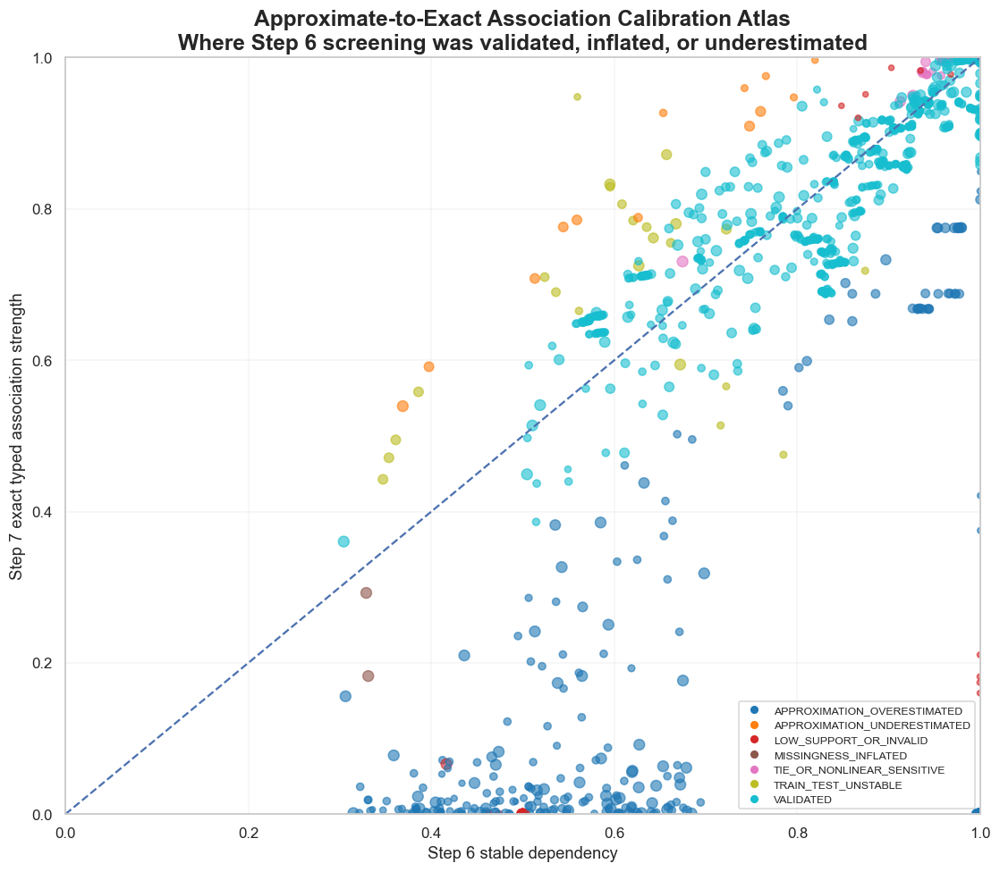

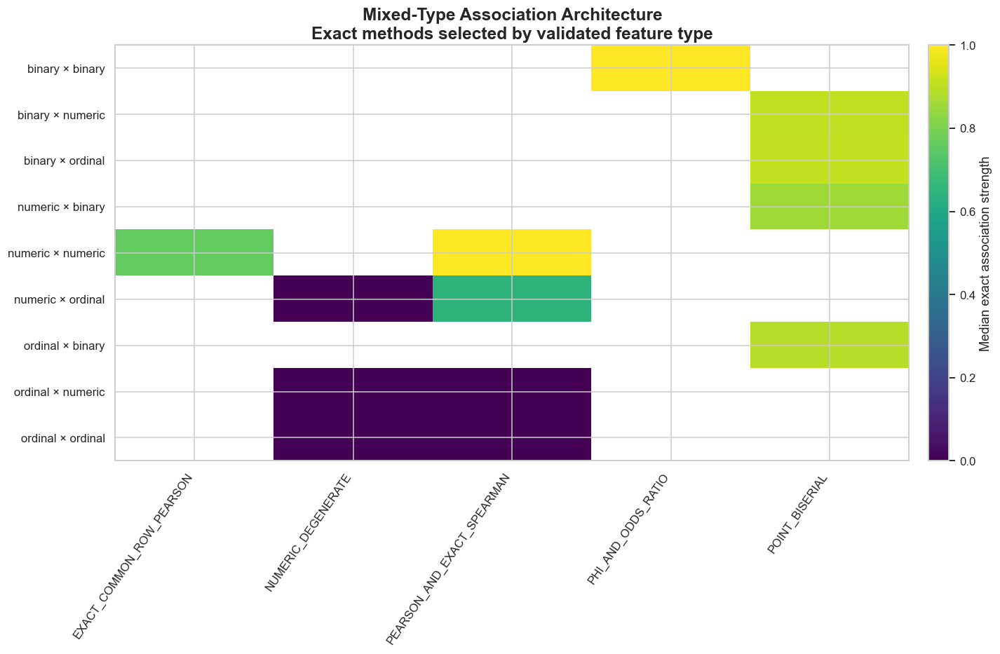

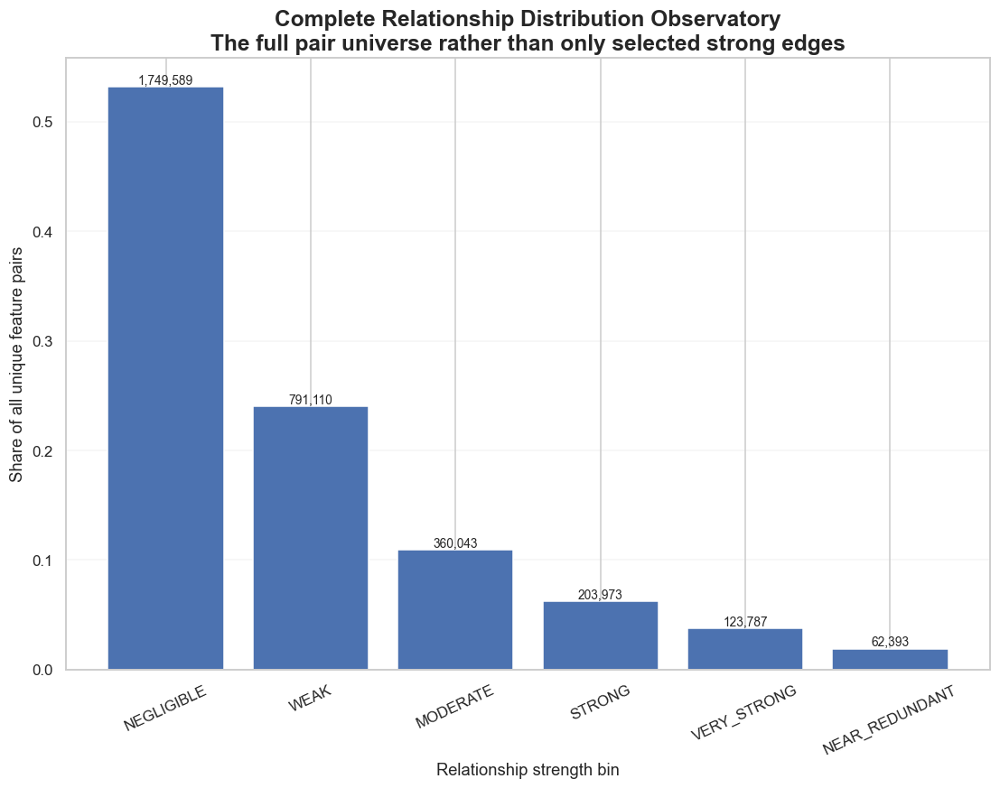

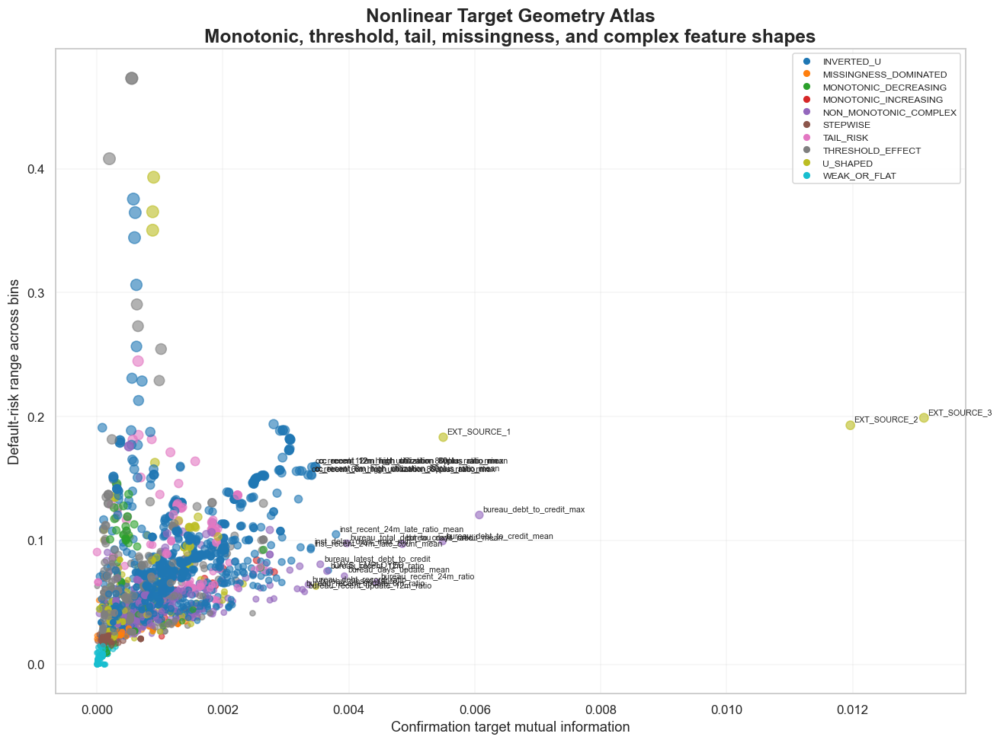

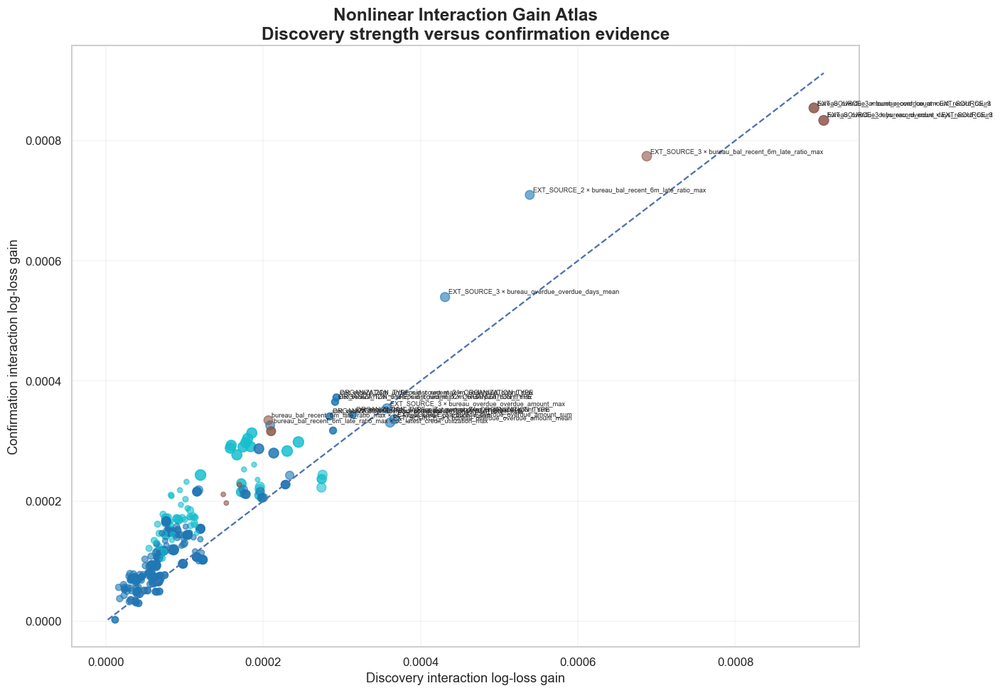

...

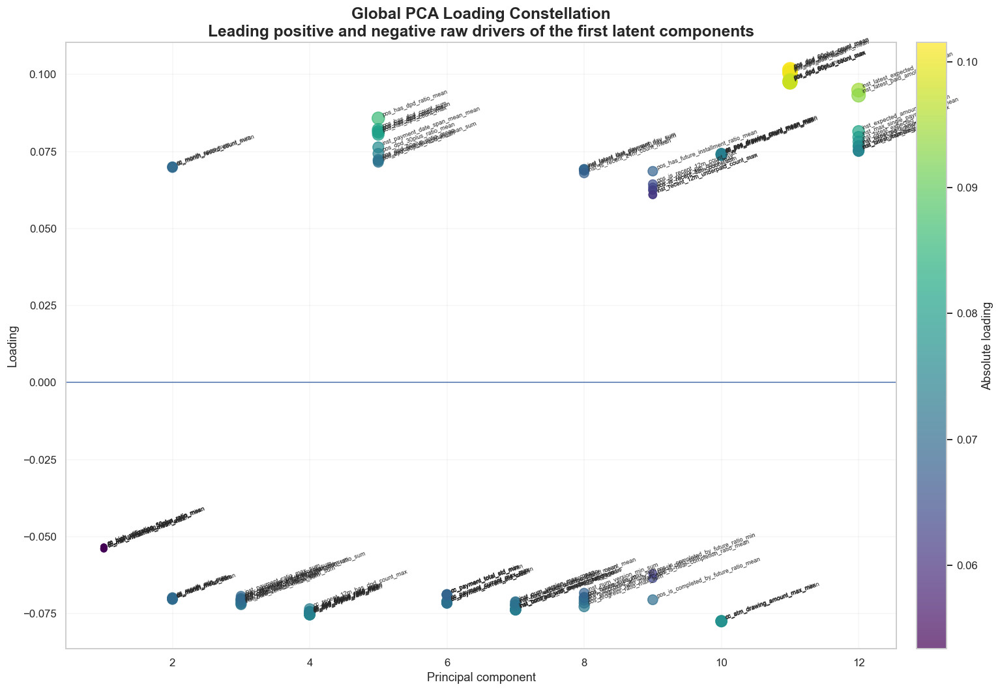

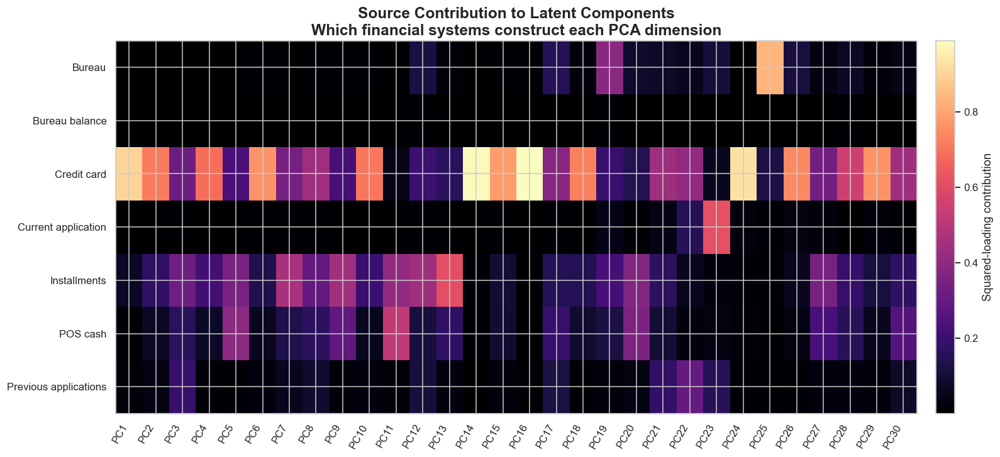

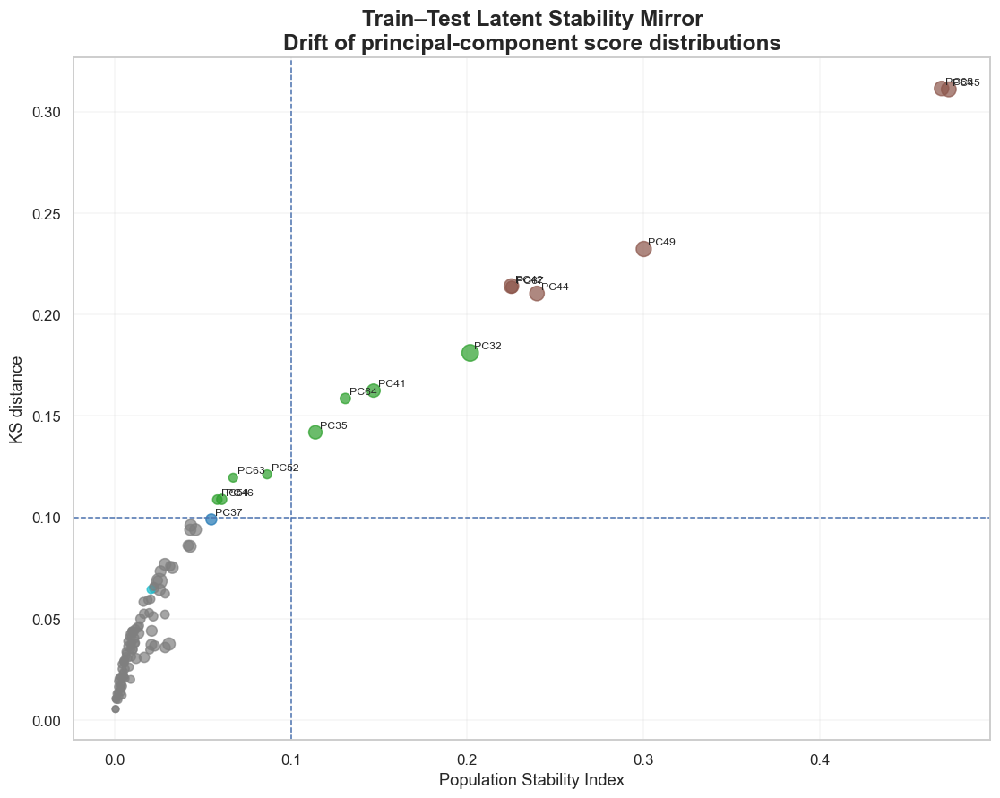

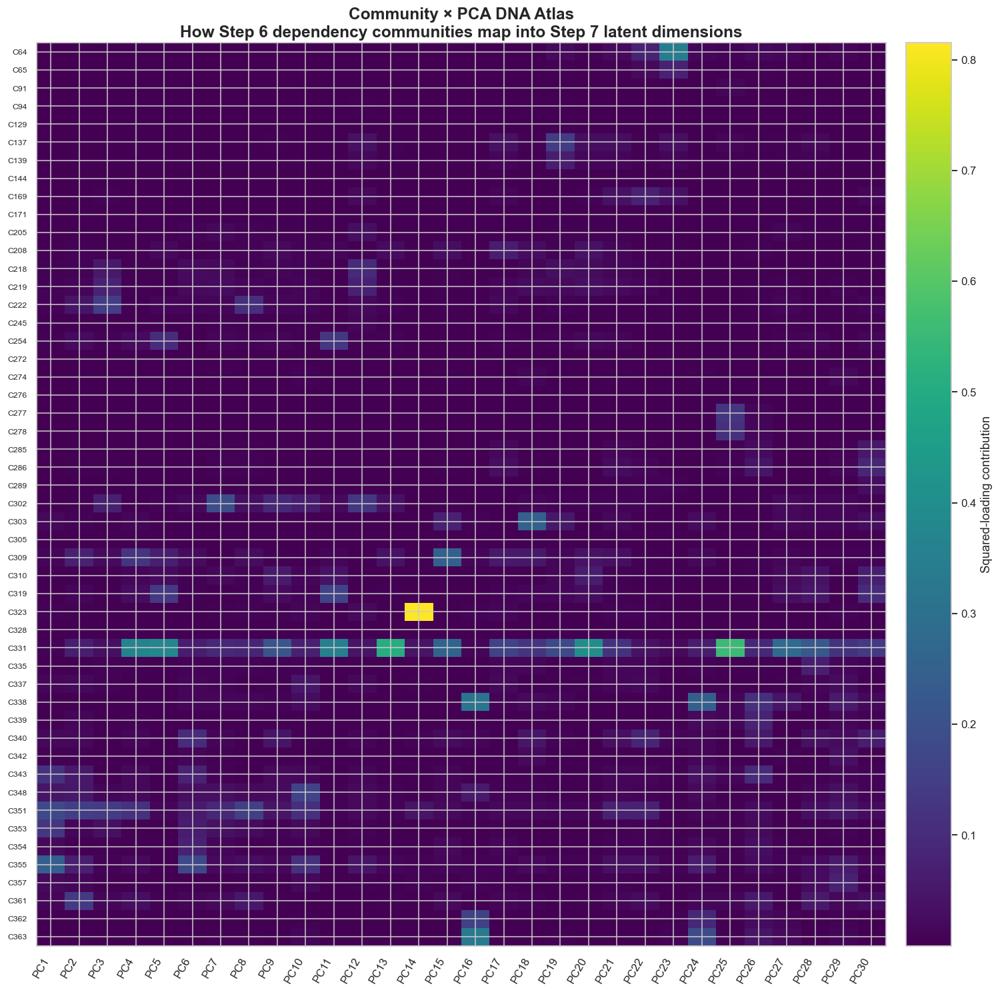

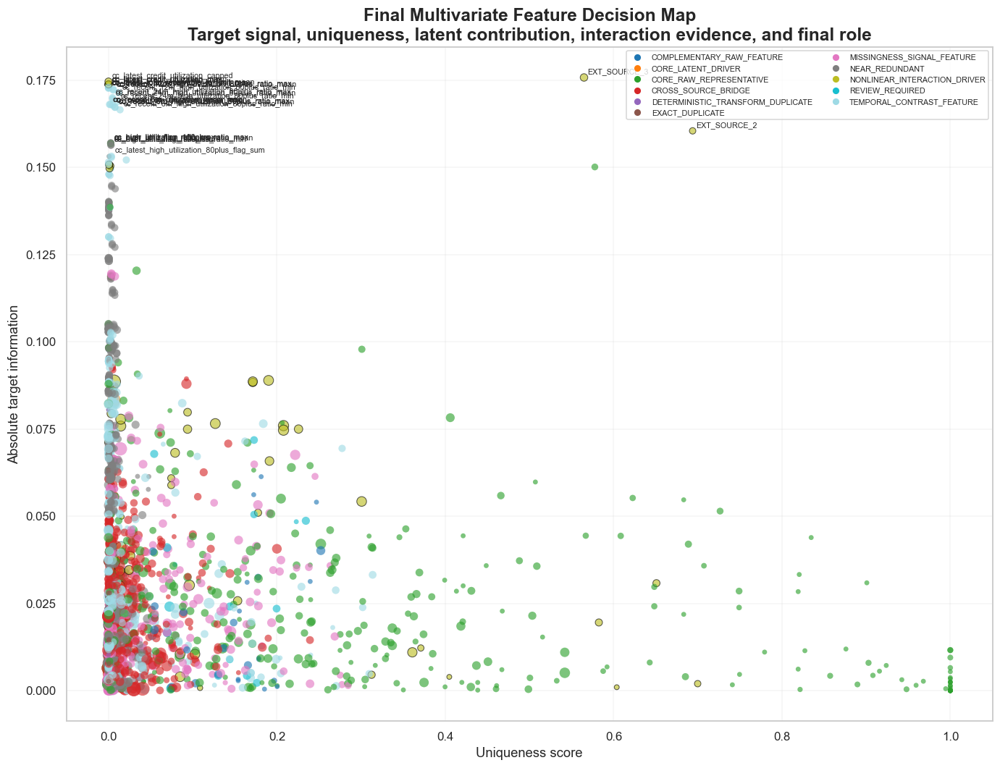

Step 7 plotting completed in 0.12 minutes.
STEP 7 FINAL MULTIVARIATE COMPLETION FINISHED
Train applicants: 307,511
Test applicants: 48,744
Predictor features: 2,566
GPU: NVIDIA GeForce RTX 5060 Ti
Total runtime including plots and freeze: 8.36 minutes
Tables: c:\Users\USER\Kawsar_Ahmmed\ALL_Projects_Lab\Machine_Learning\Credit_Default_Risk\Notebook\relationship_outputs\Step_7_Final_Multivariate_Completion\tables
Figures: c:\Users\USER\Kawsar_Ahmmed\ALL_Projects_Lab\Machine_Learning\Credit_Default_Risk\Notebook\relationship_outputs\Step_7_Final_Multivariate_Completion\figures
Frozen Step 1-7 package: c:\Users\USER\Kawsar_Ahmmed\ALL_Projects_Lab\Machine_Learning\Credit_Default_Risk\Notebook\relationship_outputs\Step_7_Final_Multivariate_Completion\STEP_01_TO_07_FROZEN_v1
Runtime status: inside engineering ceiling.

Final Step 7 research register


,step,version,train_rows,test_rows,predictor_features,deterministic_pairs_audited,exact_pairs_validated,interaction_pairs_screened,confirmed_positive_interactions,pca_eligible_features,pca_effective_dimension,pca_components_90pct,core_raw_representatives,core_latent_drivers,nonlinear_interaction_drivers,exact_duplicates,deterministic_transform_duplicates,near_redundant,gpu,runtime_minutes_before_plots_and_freeze,decision
0,STEP_7_FINAL_MULTIVARIATE_COMPLETION,step7_exact_multivariate_pca_v1.0,307511,48744,2566,7000,2200,2000,320,2336,43.0789,223,376,1,70,90,6,576,NVIDIA GeForce RTX 5060 Ti,8.2269,STEP_7_MULTIVARIATE_ANALYSIS_COMPLETE_READY_FOR_UNIFIED_STEP_8_SYNTHESIS



Completion audit


,preflight_complete,step6_corrections_complete,deterministic_redundancy_complete,typed_exact_association_complete,relationship_distribution_complete,nonlinear_geometry_complete,interaction_screen_complete,predictive_verification_complete,global_pca_complete,sourcewise_pca_complete,latent_drift_complete,final_roles_complete,ready_for_step8
0,True,True,True,True,True,True,True,True,True,True,True,True,True



Exact association calibration summary


,calibration_label,pair_count,median_approximation_error,median_exact_strength,median_drift
6,VALIDATED,1335,0.0002,0.9417,0.0018
2,LOW_SUPPORT_OR_INVALID,426,-0.9985,0.0002,0.0002
0,APPROXIMATION_OVERESTIMATED,369,-0.5623,0.0039,0.0025
4,TIE_OR_NONLINEAR_SENSITIVE,31,0.0345,0.9922,0.0009
5,TRAIN_TEST_UNSTABLE,24,0.1182,0.7215,0.2030
1,APPROXIMATION_UNDERESTIMATED,13,0.1940,0.9093,0.0307
3,MISSINGNESS_INFLATED,2,-0.0924,0.2376,0.0232



Deterministic redundancy decisions


,feature_a,feature_b,feature_a_index,feature_b_index,candidate_reason,train_missingness_equal,test_missingness_equal,train_exact_equal,test_exact_equal,transformation,scale,intercept,train_max_scaled_residual,test_max_scaled_residual,logical_rule,safe_to_remove,manual_review_required
3,cc_latest_no_payment_with_balance_flag_max,cc_latest_no_payment_with_balance_flag,2495,2546,STEP6_NEAR_REDUNDANT,True,True,True,True,EXACT_BOTH,1.0000,0.0000,0.0000,0.0000,,True,False
4,cc_latest_has_dpd_sum,cc_latest_has_dpd,2485,2556,STEP6_NEAR_REDUNDANT,True,True,True,True,EXACT_BOTH,1.0000,0.0000,0.0000,0.0000,,True,False
5,cc_latest_has_dpd_max,cc_latest_has_dpd,2483,2556,STEP6_NEAR_REDUNDANT,True,True,True,True,EXACT_BOTH,1.0000,0.0000,0.0000,0.0000,,True,False
6,cc_latest_has_dpd_max,cc_latest_has_dpd_sum,2483,2485,STEP6_NEAR_REDUNDANT,True,True,True,True,EXACT_BOTH,1.0000,0.0000,0.0000,0.0000,,True,False
40,cc_other_drawing_share_min_max,cc_other_drawing_share_min_sum,2355,2357,STEP6_NEAR_REDUNDANT,False,False,False,False,APPROXIMATE_TRANSFORMATION,1.0000,-0.0000,0.0000,0.0000,,False,True
93,cc_status_sent_proposal_count_sum,cc_status_sent_proposal_count_max,1542,1544,STEP6_NEAR_REDUNDANT,True,True,True,True,EXACT_BOTH,1.0000,0.0000,0.0000,0.0000,,True,False
108,cc_payment_current_min_max,cc_payment_current_min_sum,2047,2049,STEP6_NEAR_REDUNDANT,False,False,False,False,TEST_ONLY_EQUIVALENT,1.0000,0.0011,0.0000,0.0000,,False,True
110,inst_latest_version_change_flag,inst_latest_amount_shift_flag,1513,1515,STEP6_NEAR_REDUNDANT,True,True,True,True,EXACT_BOTH,1.0000,0.0000,0.0000,0.0000,,True,False
143,cc_status_refused_count_mean,cc_status_refused_count_max,1546,1547,STEP6_NEAR_REDUNDANT,True,True,True,True,EXACT_BOTH,1.0000,0.0000,0.0000,0.0000,,True,False
144,cc_status_refused_count_sum,cc_status_refused_count_mean,1545,1546,STEP6_NEAR_REDUNDANT,True,True,True,True,EXACT_BOTH,1.0000,0.0000,0.0000,0.0000,,True,False



Top nonlinear feature shapes


,feature,feature_index,binning_kind,feature_type,number_bins,discovery_mutual_information,confirmation_mutual_information,mutual_information_stability_ratio,risk_range,maximum_lift,tail_lift,monotonicity,direction_changes,shape_label,shape_agreement
41,EXT_SOURCE_3,41,numeric,numeric,21,0.0125,0.0131,1.0511,0.1991,2.8317,2.8317,-0.8571,7,U_SHAPED,0.9914
40,EXT_SOURCE_2,40,numeric,numeric,21,0.0119,0.0120,1.0048,0.1930,2.7232,2.7232,-0.8805,3,U_SHAPED,0.9924
212,bureau_debt_to_credit_max,212,numeric,numeric,17,0.0057,0.0061,1.0719,0.1206,2.1389,1.2027,0.8848,4,NON_MONOTONIC_COMPLEX,0.9291
39,EXT_SOURCE_1,39,numeric,numeric,21,0.0056,0.0055,0.9744,0.1834,2.5514,2.5514,-0.8779,7,U_SHAPED,0.9886
211,bureau_debt_to_credit_mean,211,numeric,numeric,17,0.0051,0.0055,1.0683,0.0994,1.7597,1.2027,0.9559,3,NON_MONOTONIC_COMPLEX,0.9884
199,bureau_days_credit_mean,199,numeric,numeric,21,0.0046,0.0048,1.0651,0.0972,1.7744,1.2718,0.9688,8,NON_MONOTONIC_COMPLEX,0.9912
145,bureau_recent_24m_ratio,145,numeric,numeric,13,0.0040,0.0044,1.1153,0.0664,1.4464,1.2718,0.9725,8,NON_MONOTONIC_COMPLEX,0.9845
224,bureau_total_debt_to_credit_ratio,224,numeric,numeric,17,0.0039,0.0040,1.0172,0.0978,1.7049,1.2655,0.9804,5,NON_MONOTONIC_COMPLEX,0.9784
209,bureau_days_update_mean,209,numeric,numeric,21,0.0033,0.0039,1.1823,0.0714,1.4794,1.2718,0.9818,10,NON_MONOTONIC_COMPLEX,0.9816
1173,inst_recent_24m_late_ratio_mean,1173,numeric,numeric,8,0.0038,0.0038,1.0073,0.1050,2.0487,0.8505,0.3333,1,INVERTED_U,0.9907



Top confirmed nonlinear interactions


,feature_a,feature_b,feature_a_index,feature_b_index,selection_reasons,candidate_priority,source_a,source_b,cross_source,step6_stable_dependency,discovery_joint_mutual_information,discovery_marginal_mutual_information_a,discovery_marginal_mutual_information_b,discovery_additive_logloss,discovery_joint_logloss,discovery_interaction_logloss_gain,discovery_max_positive_interaction_residual,discovery_max_negative_interaction_residual,discovery_max_joint_lift,discovery_supported_cells,discovery_total_cells,discovery_support_valid,discovery_interaction_information_gain,discovery_priority,confirmation_joint_mutual_information,confirmation_marginal_mutual_information_a,confirmation_marginal_mutual_information_b,confirmation_additive_logloss,confirmation_joint_logloss,confirmation_interaction_logloss_gain,confirmation_max_positive_interaction_residual,confirmation_max_negative_interaction_residual,confirmation_max_joint_lift,confirmation_supported_cells,confirmation_total_cells,confirmation_support_valid,confirmation_interaction_information_gain,interaction_gain_stability,interaction_information_stability,interaction_label
0,bureau_overdue_amount_record_count,EXT_SOURCE_3,134,41,CROSS_SOURCE_BRIDGE,0.7523,Bureau,Current application,True,0.1042,0.0131,0.0011,0.0125,0.2684,0.2675,0.0009,0.0217,-0.1339,2.8377,27,189,True,0.0006,0.0299,0.0139,0.0010,0.0131,0.2678,0.2669,0.0009,0.0125,-0.1566,3.2619,25.0000,189.0000,True,0.0007,0.9494,1.1772,ANTAGONISTIC
1,EXT_SOURCE_3,bureau_overdue_amount_record_count,41,134,TARGET_ANCHOR,0.7523,Current application,Bureau,True,0.1042,0.0131,0.0125,0.0011,0.2684,0.2675,0.0009,0.0217,-0.1339,2.8377,27,189,True,0.0006,0.0299,0.0139,0.0131,0.0010,0.2678,0.2669,0.0009,0.0125,-0.1566,3.2619,25.0000,189.0000,True,0.0007,0.9494,1.1772,ANTAGONISTIC
2,EXT_SOURCE_3,bureau_overdue_days_record_count,41,132,TARGET_ANCHOR,0.7266,Current application,Bureau,True,0.1069,0.0131,0.0125,0.0010,0.2684,0.2675,0.0009,0.0217,-0.1295,2.8711,27,189,True,0.0006,0.0302,0.0138,0.0131,0.0010,0.2678,0.2669,0.0008,0.0125,-0.1611,3.2736,25.0000,189.0000,True,0.0007,0.9136,1.1292,ANTAGONISTIC
3,bureau_overdue_days_record_count,EXT_SOURCE_3,132,41,CROSS_SOURCE_BRIDGE,0.7266,Bureau,Current application,True,0.1069,0.0131,0.0010,0.0125,0.2684,0.2675,0.0009,0.0217,-0.1295,2.8711,27,189,True,0.0006,0.0302,0.0138,0.0010,0.0131,0.2678,0.2669,0.0008,0.0125,-0.1611,3.2736,25.0000,189.0000,True,0.0007,0.9136,1.1292,ANTAGONISTIC
4,EXT_SOURCE_3,bureau_bal_recent_6m_late_ratio_max,41,410,TARGET_ANCHOR,0.7322,Current application,Bureau balance,True,0.1795,0.0133,0.0125,0.0006,0.2684,0.2678,0.0007,0.0120,-0.0827,3.6003,52,420,True,0.0008,0.0375,0.0145,0.0131,0.0007,0.2679,0.2671,0.0008,0.0208,-0.0978,3.1946,45.0000,420.0000,True,0.0014,1.1259,1.7241,ANTAGONISTIC
5,EXT_SOURCE_2,bureau_bal_recent_6m_late_ratio_max,40,410,TARGET_ANCHOR,0.7072,Current application,Bureau balance,True,0.0201,0.0133,0.0119,0.0006,0.2682,0.2677,0.0005,0.0480,-0.0789,2.8977,57,420,True,0.0014,0.0309,0.0144,0.0120,0.0007,0.2680,0.2673,0.0007,0.0124,-0.0174,2.8487,41.0000,420.0000,True,0.0024,1.3172,1.7695,ADDITIVE_OR_WEAK
6,EXT_SOURCE_3,bureau_overdue_overdue_days_mean,41,315,TARGET_ANCHOR,0.6923,Current application,Bureau,True,0.1545,0.0131,0.0125,0.0005,0.2684,0.2680,0.0004,0.0021,-0.0003,2.8035,21,399,True,0.0007,0.0291,0.0143,0.0131,0.0005,0.2679,0.2674,0.0005,0.0033,-0.0020,2.9826,21.0000,399.0000,True,0.0011,1.2515,1.7439,ADDITIVE_OR_WEAK
7,ORGANIZATION_TYPE,inst_recent_24m_underpaid_count_max,38,1106,TARGET_ANCHOR,0.7330,Current application,Installments,True,0.0019,0.0038,0.0026,0.0007,0.2772,0.2769,0.0003,0.0462,-0.0204,2.9831,54,595,True,0.0012,0.0313,0.0040,0.0027,0.0006,0.2772,0.2769,0.0004,0.0194,-0.0167,1.9757,41.0000,595.0000,True,0.0013,1.2710,1.1126,ADDITIVE_OR_WEAK
8,inst_recent_24m_underpaid_count_max,ORGANIZATION_TYPE,1106,38,CROSS_SOURCE_BRIDGE,0.7330,Installments,Current application,True,0.0019,0.0038,0.0007,0.0026,0.2772,0.2769,0.0003,0.0462,-0.0204,2.9831,54,


Pair-level predictive verification


,feature_a,feature_b,additive_roc_auc,additive_pr_auc,additive_logloss,additive_brier,explicit_interaction_roc_auc,explicit_interaction_pr_auc,explicit_interaction_logloss,explicit_interaction_brier,nonlinear_roc_auc,nonlinear_pr_auc,nonlinear_logloss,nonlinear_brier,explicit_interaction_logloss_gain,nonlinear_logloss_gain,explicit_interaction_pr_gain,nonlinear_pr_gain
0,bureau_overdue_amount_record_count,EXT_SOURCE_3,0.6620,0.1535,0.2675,0.0720,0.6621,0.1531,0.2675,0.0720,0.6620,0.1541,0.2673,0.0719,-0.0000,0.0002,-0.0004,0.0006
1,EXT_SOURCE_3,bureau_overdue_amount_record_count,0.6620,0.1535,0.2675,0.0720,0.6621,0.1531,0.2675,0.0720,0.6620,0.1541,0.2673,0.0719,-0.0000,0.0002,-0.0004,0.0006
2,EXT_SOURCE_3,bureau_overdue_days_record_count,0.6621,0.1534,0.2675,0.0720,0.6622,0.1529,0.2675,0.0720,0.6621,0.1536,0.2674,0.0719,-0.0000,0.0002,-0.0006,0.0002
3,bureau_overdue_days_record_count,EXT_SOURCE_3,0.6621,0.1534,0.2675,0.0720,0.6622,0.1529,0.2675,0.0720,0.6621,0.1536,0.2674,0.0719,-0.0000,0.0002,-0.0006,0.0002
4,EXT_SOURCE_3,bureau_bal_recent_6m_late_ratio_max,0.6595,0.1513,0.2677,0.0720,0.6595,0.1513,0.2677,0.0720,0.6588,0.1519,0.2676,0.0720,0.0000,0.0001,-0.0000,0.0006
5,EXT_SOURCE_2,bureau_bal_recent_6m_late_ratio_max,0.6577,0.1520,0.2685,0.0722,0.6579,0.1533,0.2685,0.0722,0.6592,0.1517,0.2679,0.0720,0.0000,0.0005,0.0013,-0.0003
6,EXT_SOURCE_3,bureau_overdue_overdue_days_mean,0.6593,0.1525,0.2676,0.0720,0.6593,0.1531,0.2676,0.0720,0.6584,0.1510,0.2676,0.0720,-0.0000,0.0001,0.0005,-0.0015
7,ORGANIZATION_TYPE,inst_recent_24m_underpaid_count_max,0.5119,0.0839,0.2802,0.0741,0.5119,0.0839,0.2802,0.0741,0.5119,0.0837,0.2800,0.0741,0.0000,0.0002,0.0000,-0.0002
8,inst_recent_24m_underpaid_count_max,ORGANIZATION_TYPE,0.5119,0.0839,0.2802,0.0741,0.5119,0.0839,0.2802,0.0741,0.5119,0.0837,0.2800,0.0741,0.0000,0.0002,0.0000,-0.0002
9,ORGANIZATION_TYPE,inst_recent_12m_underpaid_count_max,0.5118,0.0839,0.2801,0.0741,0.5118,0.0839,0.2801,0.0741,0.5118,0.0838,0.2800,0.0741,0.0000,0.0001,0.0000,-0.0001



PCA dimensionality summary


,eligible_feature_count,component_count_80pct,component_count_90pct,component_count_95pct,effective_dimension,exported_score_components
0,2336,116,223,339,43.0789,110



Leading PCA interpretations


,component,component_name,dominant_source,dominant_source_contribution,dominant_category,top_positive_features,top_negative_features,target_correlation,default_rate_gradient_top_minus_bottom,financial_coherence
0,1,CREDIT_CARD_RATIO_RATE_NUMERIC_COMPONENT,Credit card,0.9036,ratio_rate_numeric,inst_num_version_min_min | inst_num_version_mean_min | inst_latest_num_version_min | inst_num_version_max_min | inst...,cc_min_instalment_mean_sum | cc_min_instalment_mean_max | cc_min_instalment_mean_mean | cc_min_instalment_mean_min |...,-0.0555,-0.0693,COHERENT
1,2,CREDIT_CARD_RATIO_RATE_NUMERIC_COMPONENT,Credit card,0.7184,ratio_rate_numeric,cc_month_span_sum | cc_month_record_count_sum | cc_month_record_count_mean | cc_month_span_mean_x | cc_month_span_ma...,cc_month_mean_mean | cc_month_mean_min | cc_month_mean_sum | cc_month_min_mean | cc_month_min | cc_month_min_sum | c...,-0.0449,-0.0577,COHERENT
2,3,MIXED_LATENT_COMPONENT,Installments,0.3212,discrete_count_numeric,cc_total_receivable_to_limit_max_min | cc_total_receivable_to_limit_max_mean | cc_recivable_to_limit_max_min | cc_re...,inst_num_version_mean_sum | prev_approved_credit_amount_sum | inst_latest_num_version_sum | inst_num_version_max_sum...,0.0270,0.0323,MIXED
3,4,CREDIT_CARD_RATIO_RATE_NUMERIC_COMPONENT,Credit card,0.6907,ratio_rate_numeric,inst_latest_fully_paid_flag_min | inst_latest_payment_ratio_min | inst_payment_ratio_min_min | inst_latest_fully_pai...,cc_dpd_30plus_ratio_max | cc_dpd_30plus_ratio_mean | cc_dpd_30plus_ratio_min | cc_dpd_60plus_ratio_max | cc_dpd_60pl...,-0.0497,-0.0500,COHERENT
4,5,MIXED_LATENT_COMPONENT,POS cash,0.3948,ratio_rate_numeric,pos_has_dpd_ratio_mean | pos_has_dpd_count_sum | pos_has_dpd_count_mean | pos_has_dpd_ratio_max | pos_has_dpd_count_...,inst_is_on_time_or_early_ratio_mean | inst_is_on_time_or_early_ratio_min | cc_latest_dpd_mean | cc_latest_dpd_max | ...,0.0437,0.0499,MIXED
5,6,CREDIT_CARD_RATIO_RATE_NUMERIC_COMPONENT,Credit card,0.7633,ratio_rate_numeric,cc_credit_utilization_min_mean | cc_credit_utilization_capped_min_mean | cc_credit_utilization_min_max | cc_credit_u...,cc_payment_current_std_mean | cc_payment_current_std_max | cc_payment_current_std_min | cc_payment_current_max_mean ...,0.0300,0.0232,COHERENT
6,7,INSTALLMENTS_RATIO_RATE_NUMERIC_COMPONENT,Installments,0.4665,ratio_rate_numeric,pos_is_near_completion_ratio_mean | has_credit_card_history | pos_is_near_completion_ratio_max | pos_progress_ratio_...,inst_total_paid_to_expected_ratio_mean | inst_contract_with_version_change_ratio | inst_contract_with_amount_shift_r...,-0.0559,-0.0606,COHERENT
7,8,MIXED_LATENT_COMPONENT,Credit card,0.4413,ratio_rate_numeric,inst_latest_last_payment_day_sum | inst_latest_due_day_sum | inst_latest_first_payment_day_sum | inst_is_recent_24m_...,pos_progress_ratio_max_sum | pos_progress_ratio_mean_sum | prev_approved_annuity_to_credit_ratio_sum | pos_contract_...,0.0040,-0.0025,MIXED
8,9,MIXED_LATENT_COMPONENT,Installments,0.4474,ratio_rate_numeric,pos_has_future_installment_ratio_mean | pos_is_recent_12m_count_max | pos_is_recent_6m_count_max | pos_is_recent_12m...,pos_is_completed_by_future_ratio_mean | pos_is_near_completion_ratio_mean | pos_is_completed_by_future_ratio_min | p...,0.0377,0.0350,MIXED
9,10,CREDIT_CARD_RATIO_RATE_NUMERIC_COMPONENT,Credit card,0.7085,ratio_rate_numeric,cc_pos_drawing_count_mean_sum | cc_pos_drawing_count_mean_max | cc_pos_drawing_count_mean_mean | cc_pos_drawing_coun...,cc_atm_drawing_amount_max_min | cc_atm_drawing_amount_max_mean | cc_atm_drawing_amount_max_max | cc_atm_drawing_shar...,-0.0185,-0.0128,COHERENT



Largest latent train-test shifts


,component,train_mean,test_mean,mean_shift,train_std,test_std,std_ratio,wasserstein_distance,ks_distance,psi,drift_label
44,45,-0.0001,1.3116,1.3117,3.0487,2.9472,0.9667,1.3118,0.3110,0.4733,SEVERE_SHIFT
64,65,0.0001,1.2023,1.2022,2.4076,2.7634,1.1478,1.2285,0.3114,0.4692,SEVERE_SHIFT
48,49,0.0000,1.4003,1.4003,2.8806,2.7752,0.9634,1.4003,0.2323,0.3002,SEVERE_SHIFT
43,44,0.0000,1.2583,1.2583,3.0718,2.9533,0.9614,1.2620,0.2103,0.2397,SEVERE_SHIFT
66,67,0.0000,-0.7142,-0.7142,2.3617,2.4936,1.0558,0.7463,0.2135,0.2254,SEVERE_SHIFT
41,42,0.0000,1.2566,1.2566,3.1122,3.0983,0.9955,1.2569,0.2140,0.2252,SEVERE_SHIFT
31,32,-0.0001,-1.7220,-1.7220,3.7043,4.3866,1.1842,1.7222,0.1811,0.2018,MODERATE_SHIFT
40,41,-0.0000,-0.9620,-0.9620,3.1978,3.1436,0.9831,0.9671,0.1625,0.1470,MODERATE_SHIFT
63,64,-0.0000,-0.4614,-0.4614,2.4241,2.5614,1.0566,0.4624,0.1586,0.1310,MODERATE_SHIFT
34,35,0.0001,1.0052,1.0052,3.5351,3.8149,1.0791,1.0058,0.1419,0.1140,MODERATE_SHIFT



Final feature-role counts


,final_primary_role,feature_count
0,CROSS_SOURCE_BRIDGE,737
1,NEAR_REDUNDANT,576
2,CORE_RAW_REPRESENTATIVE,376
3,MISSINGNESS_SIGNAL_FEATURE,366
4,TEMPORAL_CONTRAST_FEATURE,299
5,EXACT_DUPLICATE,90
6,NONLINEAR_INTERACTION_DRIVER,70
7,COMPLEMENTARY_RAW_FEATURE,29
8,REVIEW_REQUIRED,16
9,DETERMINISTIC_TRANSFORM_DUPLICATE,6



Step 8 priority evidence


,feature,feature_index,source,declared_category,empirical_category,validated_category,train_dtype,test_dtype,train_missing_rate,test_missing_rate,missing_rate_drift,exact_cardinality_if_required,time_window,lineage_base,inner_aggregation,outer_aggregation,category_disagreement,target_correlation,absolute_target_information,present_default_rate,missing_default_rate,missingness_default_rate_gap,community_id,community_order,maximum_stable_dependency,strongest_partner,uniqueness_score,relationship_stability_score,cross_source_bridge_count,representative_suitability,provisional_feature_role,redundancy_status,analytical_role,generic_lineage_warning,confirmation_mutual_information,risk_range,shape_label,shape_agreement,max_interaction_gain,interaction_pair_count,max_absolute_pca_loading,pca_component_count_above_010,exact_duplicate_flag,deterministic_transform_duplicate_flag,nonlinear_interaction_driver_flag,core_latent_driver_flag,missingness_signal_flag,temporal_contrast_flag,final_primary_role,evidence_tags,retain_for_modelling,retain_for_interpretation,retain_for_interaction,retain_missing_indicator,candidate_for_removal,manual_review_required
0,EXT_SOURCE_3,41,Current application,score_index_numeric,continuous_or_count_numeric,score_index_numeric,float32,float32,0.1983,0.1778,0.0204,NaN,Lifetime or non-temporal,ext_source_3,none,none,NONE,-0.1758,0.1758,0.0777,0.0931,0.0155,120,210,0.4352,bureau_debt_to_credit_max,0.5648,0.9793,0,0.8826,PRIMARY_REPRESENTATIVE,UNRESOLVED,PRIMARY_REPRESENTATIVE,False,0.0131,0.1991,U_SHAPED,0.9914,0.0009,31.0000,0.0571,0.0000,False,False,True,False,False,False,NONLINEAR_INTERACTION_DRIVER,CONFIRMED_INTERACTION_GAIN | U_SHAPED,True,True,True,False,False,False
1,cc_latest_credit_utilization_capped,2535,Credit card,ratio_rate_numeric,continuous_or_count_numeric,ratio_rate_numeric,float32,float32,0.7862,0.7303,0.0559,NaN,Latest,latest_credit_utilization_capped,none,none,NONE,0.1746,0.1746,0.0913,0.0779,-0.0134,343,2012,1.0000,cc_latest_credit_utilization_sum,0.0000,0.9932,0,0.6700,PRIMARY_REPRESENTATIVE,UNRESOLVED,PRIMARY_REPRESENTATIVE,False,0.0031,0.1817,INVERTED_U,0.9909,0.0003,21.0000,0.0486,0.0000,False,False,True,False,False,True,NONLINEAR_INTERACTION_DRIVER,CONFIRMED_INTERACTION_GAIN | INVERTED_U,True,True,True,False,False,False
2,cc_latest_credit_utilization,2534,Credit card,ratio_rate_numeric,continuous_or_count_numeric,ratio_rate_numeric,float32,float32,0.7862,0.7303,0.0559,NaN,Latest,latest_credit_utilization,none,none,NONE,0.1738,0.1738,0.0913,0.0779,-0.0134,343,2019,1.0000,cc_latest_credit_utilization_sum,0.0000,0.9934,0,0.6680,TARGET_STRONG_STABLE,UNRESOLVED,TARGET_STRONG_STABLE,False,0.0031,0.1817,INVERTED_U,0.9909,0.0003,21.0000,0.0486,0.0000,False,False,True,False,False,True,NONLINEAR_INTERACTION_DRIVER,CONFIRMED_INTERACTION_GAIN | INVERTED_U,True,True,True,False,False,False
3,cc_latest_credit_utilization_mean,2442,Credit card,ratio_rate_numeric,continuous_or_count_numeric,ratio_rate_numeric,float32,float32,0.7860,0.7299,0.0561,NaN,Latest,latest_credit_utilization,none,mean,NONE,0.1738,0.1738,0.0913,0.0779,-0.0134,343,2014,1.0000,cc_latest_credit_utilization_sum,0.0000,0.9934,0,0.6682,COMPLEMENTARY_REPRESENTATIVE,UNRESOLVED,COMPLEMENTARY_REPRESENTATIVE,False,0.0031,0.1815,INVERTED_U,0.9922,0.0003,21.0000,0.0485,0.0000,False,False,True,False,False,True,NONLINEAR_INTERACTION_DRIVER,CONFIRMED_INTERACTION_GAIN | INVERTED_U,True,True,True,False,False,False
4,cc_latest_credit_utilization_max,2443,Credit card,ratio_rate_numeric,continuous_or_count_numeric,ratio_rate_numeric,float32,float32,0.7860,0.7299,0.0561,NaN,Latest,latest_credit_utilization,none,max,NONE,0.1737,0.1737,0.0913,0.0779,-0.0134,343,2018,1.0000,cc_latest_credit_utilization_sum,0.0000,0.9933,0,0.6679,TARGET_STRONG_STABLE,UNRESOLVED,TARGET_STRONG_STABLE,False,0.0031,0.1823,INVERTED_U,0.9902,0.0003,21.0000,0.0486,0.0000,False,False,True,False,False,True,NONLINEAR_INTERACTION_DRIVER,CONFIRMED_INTERACTION_GAIN | INVERTED_U,True,Tr


Complete runtime audit


,phase_code,phase,started,remaining_at_start_minutes,ended,elapsed_minutes,remaining_at_end_minutes,status,note
0,7.00,Frozen-state and environment integrity,"10,916.5260",90.0000,"10,916.5499",0.0004,89.9996,COMPLETE,REUSED_CHECKPOINT
1,7.01,Step 6 correction and calibration,"10,916.6242",89.9983,"10,916.6450",0.0003,89.9980,COMPLETE,
2,7.02,Exact deterministic redundancy,"10,916.6457",89.9980,"10,968.6570",0.8669,89.1311,COMPLETE,
3,7.03,Exact-pair candidate selection,"10,968.6571",89.1311,"10,978.8432",0.1698,88.9614,COMPLETE,
4,7.04,Typed exact association validation,"10,978.8435",88.9614,"11,055.8752",1.2839,87.6775,COMPLETE,
5,7.05,Complete relationship distribution,"11,055.8752",87.6775,"11,060.2521",0.0729,87.6045,COMPLETE,
6,7.06,All-feature nonlinear target geometry,"11,060.2524",87.6045,"11,159.2624",1.6502,85.9544,COMPLETE,
7,7.07,Interaction candidate generation,"11,159.2627",85.9544,"11,159.2986",0.0006,85.9538,COMPLETE,
8,7.08,Two-dimensional interaction screening,"11,159.2986",85.9538,"11,330.8320",2.8589,83.0949,COMPLETE,
9,7.09,Predictive and model-derived interaction verification,"11,330.8322",83.0949,"11,355.7275",0.4149,82.6800,COMPLETE,


In [40]:
from pathlib import Path
import importlib.util
import os
import sys
import time
import pandas as pd
from IPython.display import display


def find_project_file(filename):
    candidates = []
    for root in [Path.cwd(), *Path.cwd().parents]:
        candidates.extend([root / filename, root / "Data" / "Processed" / filename])
    matches = [path.resolve() for path in candidates if path.is_file()]
    if not matches:
        matches = [path.resolve() for path in Path.cwd().rglob(filename)]
    if not matches:
        raise FileNotFoundError(f"Required file was not found: {filename}\nCurrent directory: {Path.cwd()}")
    return matches[0]


if "train_df" not in globals():
    train_path = find_project_file("home_credit_train_integrated.parquet")
    train_df = pd.read_parquet(train_path)
    print(f"train_df loaded: {train_df.shape} | {train_path}")

if "test_df" not in globals():
    test_path = find_project_file("home_credit_test_integrated.parquet")
    test_df = pd.read_parquet(test_path)
    print(f"test_df loaded: {test_df.shape} | {test_path}")

if "FEATURE_CATEGORY_LISTS" not in globals():
    category_path = find_project_file("2.feature_category_lists.py")
    spec = importlib.util.spec_from_file_location("feature_category_lists_module", category_path)
    category_module = importlib.util.module_from_spec(spec)
    spec.loader.exec_module(category_module)
    if not hasattr(category_module, "FEATURE_CATEGORY_LISTS"):
        raise AttributeError(f"FEATURE_CATEGORY_LISTS was not found inside: {category_path}")
    FEATURE_CATEGORY_LISTS = category_module.FEATURE_CATEGORY_LISTS
    print(f"FEATURE_CATEGORY_LISTS loaded: {len(FEATURE_CATEGORY_LISTS):,} groups | {category_path}")

ID_COL = globals().get("ID_COL", "SK_ID_CURR")
TARGET_COL = globals().get("TARGET_COL", "TARGET")
RANDOM_SEED = globals().get("RANDOM_SEED", 42)

if TARGET_COL in test_df.columns:
    test_df = test_df.drop(columns=[TARGET_COL])

expected_test_columns = [column for column in train_df.columns if column != TARGET_COL]
missing_test_columns = sorted(set(expected_test_columns) - set(test_df.columns))
extra_test_columns = sorted(set(test_df.columns) - set(expected_test_columns))
if missing_test_columns or extra_test_columns:
    raise ValueError(f"Train-test feature mismatch. Missing in test: {missing_test_columns[:20]} | Extra in test: {extra_test_columns[:20]}")
test_df = test_df[expected_test_columns]

STEP6_FROZEN_DIR = Path.cwd() / "relationship_outputs" / "Step_6_Global_Feature_Architecture" / "STEP_01_TO_06_FROZEN_v1"
if not STEP6_FROZEN_DIR.exists():
    possible = list(Path.cwd().rglob("STEP_01_TO_06_FROZEN_v1"))
    if not possible:
        raise FileNotFoundError("STEP_01_TO_06_FROZEN_v1 was not found. Run the complete Step 6 execution cell first.")
    STEP6_FROZEN_DIR = possible[0].resolve()

STEP7_OUTPUT_ROOT = Path.cwd() / "relationship_outputs" / "Step_7_Final_Multivariate_Completion"
STEP7_OUTPUT_ROOT.mkdir(parents=True, exist_ok=True)

STEP7_CONFIG = {"seed": RANDOM_SEED, "target_runtime_minutes": 75, "hard_runtime_minutes": 90, "reuse_checkpoints": True, "overwrite_checkpoints": False, "redundancy_pair_cap": 7000, "exact_pair_cap": 2200, "exact_spearman_cap": 1000, "controls_per_bin": 140, "numeric_bins": 20, "max_category_levels": 35, "interaction_feature_pool": 170, "interaction_pair_cap": 2000, "interaction_confirmation_cap": 320, "surface_export_cap": 80, "predictive_pair_cap": 25, "global_model_feature_cap": 130, "shap_rows": 800, "shap_feature_cap": 55, "pca_row_chunk": 4096, "pca_stat_block": 64, "pca_max_components": 110, "pca_loading_components": 70, "pca_missing_drift_limit": 0.15, "minimum_overlap": 500, "minimum_cell_count": 150, "minimum_cell_defaults": 8, "minimum_cell_share": 0.0005, "near_redundancy_threshold": 0.95, "plot_dpi": 220}

step7_started = time.perf_counter()
step7_analyzer = ExactMultivariatePCAAnalyzer(train_df, test_df, FEATURE_CATEGORY_LISTS, STEP6_FROZEN_DIR, STEP7_OUTPUT_ROOT, STEP7_CONFIG, globals())
step7_analyzer.run_all().export()
step7_plotter = FinalMultivariatePlotter(step7_analyzer, step7_analyzer.figure_dir)
step7_plotter.plot_all()
STEP1_TO_7_FROZEN_DIR = step7_analyzer.freeze_step1_to_step7()
step7_total_minutes = (time.perf_counter() - step7_started) / 60

step7_final_register = step7_analyzer.results["final_multivariate_research_register"]
step7_completion_audit = step7_analyzer.results["step7_completion_audit"]
step7_feature_registry = step7_analyzer.results["final_multivariate_feature_registry"]
step7_feature_decisions = step7_analyzer.results["final_feature_decision_register"]
step7_exact_associations = step7_analyzer.results["exact_association_validation_register"]
step7_redundancy_register = step7_analyzer.results["redundancy_resolution_register"]
step7_nonlinear_geometry = step7_analyzer.results["univariate_nonlinear_geometry"]
step7_top_interactions = step7_analyzer.results["top_interaction_candidates"]
step7_pair_model_gain = step7_analyzer.results["pair_model_gain_register"]
step7_pca_selection = step7_analyzer.results["pca_component_selection"]
step7_pca_interpretation = step7_analyzer.results["pca_component_interpretation"]
step7_pca_drift = step7_analyzer.results["pca_train_test_drift"]
step8_priority_evidence = step7_analyzer.results["step8_priority_evidence_register"]
step7_runtime_audit = pd.DataFrame(step7_analyzer.runtime_records)
step7_total_record = pd.DataFrame([{"phase_code": "TOTAL", "phase": "TOTAL_STEP_7_INCLUDING_PLOTS_AND_FREEZE", "elapsed_minutes": step7_total_minutes, "status": "INSIDE_ENGINEERING_CEILING" if step7_total_minutes <= STEP7_CONFIG["hard_runtime_minutes"] else "COMPLETED_ABOVE_ENGINEERING_CEILING", "note": "Exact runtime depends on CUDA, SSD, category cardinality, and reusable checkpoints."}])
step7_runtime_with_total = pd.concat([step7_runtime_audit, step7_total_record], ignore_index=True, sort=False)
step7_runtime_with_total.to_parquet(step7_analyzer.table_dir / "runtime_audit_with_total.parquet", index=False)

print("=" * 110)
print("STEP 7 FINAL MULTIVARIATE COMPLETION FINISHED")
print("=" * 110)
print(f"Train applicants: {len(train_df):,}")
print(f"Test applicants: {len(test_df):,}")
print(f"Predictor features: {len(step7_analyzer.feature_order):,}")
print(f"GPU: {step7_analyzer.gpu_name}")
print(f"Total runtime including plots and freeze: {step7_total_minutes:.2f} minutes")
print(f"Tables: {step7_analyzer.table_dir}")
print(f"Figures: {step7_analyzer.figure_dir}")
print(f"Frozen Step 1-7 package: {STEP1_TO_7_FROZEN_DIR}")
print("Runtime status: inside engineering ceiling." if step7_total_minutes <= STEP7_CONFIG["hard_runtime_minutes"] else "Runtime status: completed above engineering ceiling; checkpoints remain reusable.")

print("\nFinal Step 7 research register")
display(step7_final_register)
print("\nCompletion audit")
display(step7_completion_audit)
print("\nExact association calibration summary")
display(step7_analyzer.results["approximation_error_summary"])
print("\nDeterministic redundancy decisions")
display(step7_redundancy_register.loc[~step7_redundancy_register["transformation"].eq("NOT_EQUIVALENT")].head(60))
print("\nTop nonlinear feature shapes")
display(step7_nonlinear_geometry.sort_values(["confirmation_mutual_information", "risk_range"], ascending=False).head(60))
print("\nTop confirmed nonlinear interactions")
display(step7_top_interactions.head(60))
print("\nPair-level predictive verification")
display(step7_pair_model_gain.head(40))
print("\nPCA dimensionality summary")
display(step7_pca_selection)
print("\nLeading PCA interpretations")
display(step7_pca_interpretation.head(30))
print("\nLargest latent train-test shifts")
display(step7_pca_drift.sort_values(["psi", "ks_distance"], ascending=False).head(30))
print("\nFinal feature-role counts")
display(step7_feature_registry["final_primary_role"].value_counts().rename_axis("final_primary_role").reset_index(name="feature_count"))
print("\nStep 8 priority evidence")
display(step8_priority_evidence.head(100))
print("\nComplete runtime audit")
display(step7_runtime_with_total)


In [ ]:
from pathlib import Path
from types import SimpleNamespace
import json
import time
import numpy as np
import pandas as pd
from IPython.display import display

STEP7_OUTPUT_ROOT = Path.cwd() / "relationship_outputs" / "Step_7_Final_Multivariate_Completion"
STEP1_TO_7_FROZEN_DIR = STEP7_OUTPUT_ROOT / "STEP_01_TO_07_FROZEN_v1"
if not STEP1_TO_7_FROZEN_DIR.exists():
    matches = list(Path.cwd().rglob("STEP_01_TO_07_FROZEN_v1"))
    if not matches:
        raise FileNotFoundError("STEP_01_TO_07_FROZEN_v1 was not found. Run the Step 7 execution cell first.")
    STEP1_TO_7_FROZEN_DIR = matches[0].resolve()
if not (STEP1_TO_7_FROZEN_DIR / "COMPLETE.flag").exists():
    raise RuntimeError(f"Frozen Step 1-7 package is incomplete: {STEP1_TO_7_FROZEN_DIR}")

loader_started = time.perf_counter()
manifest = json.loads((STEP1_TO_7_FROZEN_DIR / "manifest.json").read_text(encoding="utf-8"))
feature_order = json.loads((STEP1_TO_7_FROZEN_DIR / "feature_order.json").read_text(encoding="utf-8"))
table_index = {record["name"]: record for record in manifest.get("tables", [])}


def load_research_table(name):
    if name not in table_index:
        raise KeyError(f"Frozen table not found: {name}. Available examples: {sorted(table_index)[:30]}")
    return pd.read_parquet(STEP1_TO_7_FROZEN_DIR / table_index[name]["path"])


compact = manifest["compact_data"]
research_state = SimpleNamespace()
research_state.root = STEP1_TO_7_FROZEN_DIR
research_state.manifest = manifest
research_state.feature_order = feature_order
research_state.feature_index = {feature: index for index, feature in enumerate(feature_order)}
research_state.train_matrix = np.load(STEP1_TO_7_FROZEN_DIR / compact["train_matrix"], mmap_mode="r")
research_state.test_matrix = np.load(STEP1_TO_7_FROZEN_DIR / compact["test_matrix"], mmap_mode="r")
research_state.train_ids = np.load(STEP1_TO_7_FROZEN_DIR / compact["train_ids"], mmap_mode="r")
research_state.test_ids = np.load(STEP1_TO_7_FROZEN_DIR / compact["test_ids"], mmap_mode="r")
research_state.target = np.load(STEP1_TO_7_FROZEN_DIR / compact["target"], mmap_mode="r")
research_state.tables = table_index
research_state.load = load_research_table
research_state.step6_matrices = {}
research_state.step7_matrices = {}
for filename in manifest.get("step6_matrix_files", []):
    path = STEP1_TO_7_FROZEN_DIR / "step06_matrices" / filename
    if path.exists():
        research_state.step6_matrices[path.stem] = np.load(path, mmap_mode="r")
for filename in manifest.get("step7_matrix_files", []):
    path = STEP1_TO_7_FROZEN_DIR / "step07_matrices" / filename
    if path.suffix == ".npy":
        research_state.step7_matrices[path.stem] = np.load(path, mmap_mode="r")
    elif path.suffix == ".npz":
        research_state.step7_matrices[path.stem] = np.load(path)
research_state.id_col = manifest["id_col"]
research_state.target_col = manifest["target_col"]
research_state.dataset_fingerprint = manifest["dataset_fingerprint"]

step7_final_register = load_research_table("final_multivariate_research_register")
step7_completion_audit = load_research_table("step7_completion_audit")
step7_feature_registry = load_research_table("final_multivariate_feature_registry")
step7_feature_decisions = load_research_table("final_feature_decision_register")
step7_exact_associations = load_research_table("exact_association_validation_register")
step7_redundancy_register = load_research_table("redundancy_resolution_register")
step7_nonlinear_geometry = load_research_table("univariate_nonlinear_geometry")
step7_top_interactions = load_research_table("top_interaction_candidates")
step7_pair_model_gain = load_research_table("pair_model_gain_register")
step7_pca_selection = load_research_table("pca_component_selection")
step7_pca_interpretation = load_research_table("pca_component_interpretation")
step7_pca_drift = load_research_table("pca_train_test_drift")
step8_priority_evidence = load_research_table("step8_priority_evidence_register")

loader_seconds = time.perf_counter() - loader_started
print("=" * 100)
print("FROZEN STEP 1-7 RESEARCH STATE LOADED")
print("=" * 100)
print(f"Load time: {loader_seconds:.2f} seconds")
print(f"Train matrix: {research_state.train_matrix.shape} | memory-mapped")
print(f"Test matrix: {research_state.test_matrix.shape} | memory-mapped")
print(f"Features: {len(research_state.feature_order):,}")
print(f"Frozen tables: {len(research_state.tables):,}")
print(f"Step 6 matrices: {len(research_state.step6_matrices):,}")
print(f"Step 7 matrices: {len(research_state.step7_matrices):,}")
print("Use research_state.load('table_name') to load any additional Step 1-7 table.")

display(step7_final_register)
display(step8_priority_evidence.head(25))


# Step 7 Completion: Exact Multivariate Validation, Nonlinear Interaction Discovery, Redundancy Resolution, and PCA Latent Financial Geometry

## Completion Status

> **Step 7 completed successfully.**

Step 7 extended the full-feature structural screening from Step 6 into a more exact and complete multivariate analysis.

The completed analysis included:

- approximate-to-exact association calibration;
- feature-type-specific association methods;
- complete relationship-strength distribution;
- nonlinear target-shape analysis;
- nonlinear pair-interaction discovery;
- discovery-to-confirmation interaction validation;
- missingness-versus-value dependency separation;
- global PCA;
- source-contribution analysis;
- train–test latent-space stability;
- dependency-community-to-PCA mapping;
- final multivariate feature-role assignment.

Step 7 therefore closes the main multivariate exploratory-analysis stage.

No raw source feature was physically deleted. Feature retention and removal recommendations were stored as analytical roles and decision flags.

---

## Research Objective

Step 6 showed that the full feature universe was organised into dependency communities, temporal families, aggregation families, missingness structures, and repeated behavioural representations.

However, Step 6 relied partly on approximate global-rank dependency screening and selected strong-edge visualisations.

Step 7 addressed the remaining questions:

> **Which Step 6 relationships remain valid under exact feature-type-specific analysis, where does nonlinear target information exist, which interactions reproduce in confirmation data, and how many latent financial dimensions exist beneath thousands of engineered features?**

---

# 1. Approximate-to-Exact Association Calibration

Step 6 dependency strengths were compared against Step 7 exact typed associations.

The comparison identified several relationship classes:

- `VALIDATED`;
- `APPROXIMATION_OVERESTIMATED`;
- `APPROXIMATION_UNDERESTIMATED`;
- `LOW_SUPPORT_OR_INVALID`;
- `MISSINGNESS_INFLATED`;
- `TIE_OR_NONLINEAR_SENSITIVE`;
- `TRAIN_TEST_UNSTABLE`.

## Main Result

A substantial proportion of Step 6 strong relationships remained strong under Step 7 exact analysis.

This confirms that Step 6 was useful as a structural screening stage.

However, many relationships with high Step 6 dependency were substantially weaker under exact analysis.

The major reasons included:

- global-rank approximation;
- tied or low-cardinality variables;
- shared missingness;
- limited valid overlap;
- feature-type mismatch;
- unstable train–test relationships.

Some associations were also underestimated by Step 6 and became stronger under exact typed methods.

## Interpretation

Step 6 should be treated as a high-recall candidate-discovery stage.

Step 7 converted that screening into calibrated multivariate evidence.

---

# 2. Mixed-Type Association Architecture

Step 7 did not apply a single correlation method to every feature pair.

Association methods were selected according to validated feature types.

The analysed relationship families included:

- numeric × numeric;
- numeric × ordinal;
- ordinal × numeric;
- ordinal × ordinal;
- binary × binary;
- binary × numeric;
- numeric × binary;
- binary × ordinal;
- ordinal × binary.

Methods included:

- exact common-row Pearson association;
- tie-corrected exact Spearman association;
- point-biserial association;
- Phi coefficient;
- odds-related binary association;
- numeric-degenerate safeguards.

## Main Result

Some feature pairs showed weak linear association but strong monotonic association.

This indicates that several relationships were:

- ordered but nonlinear;
- threshold-based;
- dominated by ties;
- derived from count-to-flag transformations.

Binary and numeric pairs often showed extremely high association, suggesting that some binary indicators were thresholded versions of numeric amounts or counts.

Examples of possible structures include:

- `has_event = event_count > 0`;
- `has_dpd = dpd_count > 0`;
- `has_drawing = drawing_amount > 0`.

---

# 3. Complete Relationship Distribution

The complete pair universe contained approximately:

> **3,290,895 unique feature pairs**

The relationship-strength distribution was:

| Relationship class | Pair count | Approximate share |
|---|---:|---:|
| Negligible | 1,749,589 | 53.2% |
| Weak | 791,110 | 24.0% |
| Moderate | 360,043 | 10.9% |
| Strong | 203,973 | 6.2% |
| Very strong | 123,787 | 3.8% |
| Near redundant | 62,393 | 1.9% |

## Main Result

Approximately 77% of all feature pairs were negligible or weak.

Therefore, the feature universe was not uniformly redundant.

At the same time, approximately 186,000 pairs were either very strong or near redundant.

This demonstrates two simultaneous properties:

1. the dataset contains many relatively independent signals;
2. several large feature families contain extensive duplication or near-duplication.

## Interpretation

Aggressive global feature removal would discard complementary information.

Unrestricted feature retention would preserve substantial redundancy.

The correct strategy is community-aware and lineage-aware representative selection.

---

# 4. Nonlinear Target Geometry

Step 7 evaluated target information through nonlinear binned risk profiles.

The analysis identified shapes such as:

- `MONOTONIC_INCREASING`;
- `MONOTONIC_DECREASING`;
- `U_SHAPED`;
- `INVERTED_U`;
- `THRESHOLD_EFFECT`;
- `TAIL_RISK`;
- `STEPWISE`;
- `MISSINGNESS_DOMINATED`;
- `NON_MONOTONIC_COMPLEX`;
- `WEAK_OR_FLAT`.

## Strongest Individual Target Anchors

The strongest visible individual predictors remained:

- `EXT_SOURCE_3`;
- `EXT_SOURCE_2`;
- `EXT_SOURCE_1`.

These variables combined:

- high confirmation mutual information;
- large default-risk range;
- strong train–test stability;
- moderate or high uniqueness;
- strong interaction potential.

## Credit-Behaviour Signals

Important nonlinear information was also observed in families related to:

- credit-card utilisation;
- high-utilisation flags;
- receivable balances;
- payment behaviour;
- debt-to-credit ratios;
- days past due;
- overdue duration;
- recent late-payment ratios;
- recent-versus-historical deterioration.

## Important Caution

Some features showed a large default-risk range but very low mutual information.

These features may reflect:

- rare applicant groups;
- unstable tail bins;
- low-support categories;
- outliers;
- missingness effects.

A large risk range without sufficient information and support should not automatically be treated as a strong predictive feature.

---

# 5. Nonlinear Interaction Discovery

Step 7 tested whether feature pairs provided more information jointly than through additive individual effects.

Interaction strength was compared between:

- discovery data;
- confirmation data.

Most retained interactions followed the discovery–confirmation diagonal reasonably well.

This indicates that the strongest interactions were not purely discovery-set artefacts.

## Major Interaction Theme

The strongest visible interactions generally combined:

- external risk scores;
- recent delinquency;
- overdue duration;
- recent late-payment ratios;
- utilisation or revolving-credit behaviour.

Examples included relationships of the form:

- external score × recent late-payment ratio;
- external score × overdue duration;
- external score × utilisation stress;
- external score × debt or credit-exposure behaviour.

## Interpretation

The meaning of an external score was not identical for every applicant.

Its risk implication changed according to observed financial behaviour.

For example:

> An applicant with a similar external score may have a different default risk depending on whether recent delinquency, utilisation stress, or repayment deterioration is also present.

## Interaction Magnitude

The strongest confirmation interaction log-loss gains were approximately below `0.001`.

Therefore:

- interactions were reproducible;
- interactions added refinement;
- interactions did not replace the dominant main effects.

The main predictive structure remained driven primarily by strong individual features and behavioural communities.

---

# 6. Missingness × Value Interaction

Step 7 separated two different concepts:

1. whether two features were missing together;
2. whether their observed values were associated.

Four relationship patterns emerged.

## Pattern A — Independent

- low missingness dependency;
- low observed-value association.

## Pattern B — Genuine Value Relationship

- low missingness dependency;
- high observed-value association.

These relationships reflected genuine behavioural similarity rather than shared data availability.

## Pattern C — Value and Availability Coupled

- high missingness dependency;
- high observed-value association.

These features were often generated from the same financial source and were both jointly available and behaviourally related.

## Pattern D — Missingness-Only Relationship

- high missingness dependency;
- low observed-value association.

These features shared the same data-availability pattern but measured different behaviours when observed.

## Major Finding

Many pairs had a missingness dependency of approximately `1.0`.

This indicates identical present/missing masks.

However, their value associations ranged from near zero to near one.

Therefore:

> Shared missingness does not imply duplicated numerical information.

This supports retaining source-history availability indicators separately from observed-value features.

---

# 7. PCA Latent Financial Geometry

Global PCA was used to examine how thousands of engineered features collapsed into latent dimensions.

## Variance Structure

The first principal component explained approximately 11% of the total eligible-feature variance.

The variance then decreased gradually across a long component tail.

Approximate cumulative variance:

- around 20 components: approximately 48–50%;
- around 40 components: approximately 62%;
- around 60 components: approximately 69%;
- around 80 components: approximately 74%;
- around 120 components: approximately 80%.

## Effective Dimension

The estimated effective dimension was approximately:

> **43.1 latent dimensions**

This does not mean that 43 components explained 80% of the variance.

Instead, it indicates that the total variance concentration was comparable to approximately 43 equally important dimensions.

## Interpretation

The dataset was neither:

- a genuinely 2,566-dimensional independent system;
- nor a very low-dimensional system that could be represented by only a few components.

The feature universe contained:

- approximately 40–50 dominant dimensions;
- a long tail of smaller but potentially meaningful dimensions.

## PCA Decision

PCA is useful for:

- structural interpretation;
- redundancy measurement;
- latent drift detection;
- compressed auxiliary representations;
- source-level dimensional analysis.

PCA should not automatically replace all raw features.

Low-variance components may still contain target-relevant or subgroup-specific information.

---

# 8. PCA Loading Structure

The first latent components were driven by groups of related raw features.

Visible loading families included variables associated with:

- payment;
- overdue behaviour;
- utilisation;
- expected amounts;
- installment ratios;
- credit-card drawing;
- POS repayment status;
- late-payment ratios.

Positive and negative loading signs represent opposite directions along the same latent component.

The sign itself should not be interpreted directly as good or bad risk because PCA component signs are mathematically arbitrary.

Interpretation should instead use:

- the feature groups loading together;
- the groups loading in opposite directions;
- the target-risk profile of the component;
- train–test stability.

---

# 9. Source Contribution to Latent Components

The first 30 principal components showed different source compositions.

## Credit Card

Credit Card variables contributed strongly across many components.

This indicates that Credit Card data contained multiple distinct dimensions, including:

- utilisation;
- payment;
- receivable exposure;
- drawing behaviour;
- credit limits;
- delinquency.

Credit Card information was therefore not a single repeated factor.

## Installments

Installment variables contributed moderately across many components.

These dimensions were primarily related to:

- repayment performance;
- expected-versus-actual payment;
- payment timing;
- installment completion;
- repayment insufficiency.

## POS Cash

POS Cash information contributed to a smaller but meaningful set of components.

These components were likely related to:

- payment status;
- account maturity;
- delinquency;
- recent loan-state transitions.

## Bureau

Bureau contributions were sparse but concentrated in several components.

This suggests that Bureau history provided distinct dimensions rather than diffuse information across every component.

## Current Application

Current-application variables contributed strongly to a smaller number of components.

This indicates that applicant demographics and external-score information were relatively distinct from transactional repayment-history dimensions.

## Bureau Balance

Bureau Balance showed relatively low visible contribution in the leading components.

This may indicate:

- lower eligible-feature contribution;
- overlap with other Bureau variables;
- signal absorption by related engineered features;
- concentration in later components.

This should be verified through the source-wise loading tables rather than the figure alone.

---

# 10. Train–Test Latent Stability

Principal-component score distributions were compared between train and test using:

- Population Stability Index;
- Kolmogorov–Smirnov distance.

## Main Result

Most principal components were concentrated in the low-PSI and low-KS region.

This indicates that most dominant latent financial dimensions were stable between train and test.

## Moderate Drift

Several later components showed:

- PSI above approximately `0.10`;
- KS distance above approximately `0.10`.

These components require additional review.

## Severe Drift

A small number of later components showed:

- PSI around `0.23–0.47`;
- KS distance around `0.21–0.31`.

These components represent meaningful population shift.

Possible causes include:

- rare applicant subgroups;
- source availability changes;
- unstable engineered features;
- temporal population differences;
- extreme-tail behaviour.

## Modelling Implication

Stable components may be useful for compressed modelling.

Severely drifted components should not be used without:

- loading inspection;
- source inspection;
- regularisation;
- robustness validation.

---

# 11. Dependency Community × PCA Mapping

Step 6 dependency communities were mapped into Step 7 principal components.

The mapping was generally sparse.

This means that most communities contributed primarily to a limited number of latent dimensions.

## Community Types

### Single-Component Communities

Some communities were strongly concentrated in one principal component.

These communities were close to one-dimensional and likely contained repeated representations of one behaviour.

### Multi-Component Communities

Some communities contributed to several principal components.

These communities contained multiple sub-mechanisms or heterogeneous feature families.

### Broad Communities

Several large communities contributed moderately across many components.

These likely represented complex sources such as Credit Card data containing multiple behavioural processes.

## Interpretation

A single representative may be sufficient for strongly one-dimensional communities.

Multi-component communities may require:

- more than one representative;
- a temporal contrast feature;
- a nonlinear feature;
- a missingness indicator.

Community IDs should be interpreted using the corresponding feature and source mapping tables.

---

# 12. Final Multivariate Feature Roles

Step 7 integrated evidence from:

- univariate target information;
- exact association;
- uniqueness;
- deterministic redundancy;
- community structure;
- nonlinear target shape;
- interaction evidence;
- PCA contribution;
- missingness information;
- temporal information;
- train–test stability.

Final roles included:

- `CORE_RAW_REPRESENTATIVE`;
- `CORE_LATENT_DRIVER`;
- `COMPLEMENTARY_RAW_FEATURE`;
- `CROSS_SOURCE_BRIDGE`;
- `NONLINEAR_INTERACTION_DRIVER`;
- `TEMPORAL_CONTRAST_FEATURE`;
- `MISSINGNESS_SIGNAL_FEATURE`;
- `EXACT_DUPLICATE`;
- `DETERMINISTIC_TRANSFORM_DUPLICATE`;
- `NEAR_REDUNDANT`;
- `REVIEW_REQUIRED`.

## Strong but Redundant Features

Many high-target-information features had very low uniqueness.

This was especially visible among:

- Credit Card utilisation features;
- recent utilisation variants;
- capped utilisation variants;
- high-utilisation flags;
- related repayment and exposure aggregations.

These features carried important risk information but often represented repeated versions of the same mechanism.

They should not all be retained indiscriminately.

## Strong and Unique Features

The strongest visible examples were:

- `EXT_SOURCE_3`;
- `EXT_SOURCE_2`;
- `EXT_SOURCE_1`.

These features combined:

- strong target information;
- relatively high uniqueness;
- stability;
- nonlinear target structure;
- interaction evidence.

They should remain central raw modelling features.

## Unique but Weak Features

Some features had very high uniqueness but almost no individual target information.

These variables may represent:

- rare document indicators;
- isolated applicant attributes;
- niche financial states.

Uniqueness alone was not sufficient for retention.

## Temporal and Missingness Features

Temporal contrasts and missingness signals often had moderate individual target information but remained important for:

- deterioration detection;
- financial-history depth;
- subgroup identification;
- interaction modelling;
- interpretation.

---

# 13. Main Scientific Conclusions

## Conclusion 1

Step 6 was useful as a high-recall structural screening stage, but exact Step 7 calibration was necessary.

## Conclusion 2

Approximately 77% of all feature pairs were negligible or weak.

The feature universe was not uniformly redundant.

## Conclusion 3

A substantial redundancy core remained, including more than 60,000 near-redundant feature pairs.

## Conclusion 4

External-score variables remained the strongest and most distinct individual risk anchors.

## Conclusion 5

Credit Card utilisation, repayment, receivable, drawing, and delinquency families contained strong but highly repeated information.

## Conclusion 6

Missingness represented meaningful financial-history availability and could not be treated only as a data-cleaning issue.

## Conclusion 7

Nonlinear feature shapes were common among the strongest risk variables.

## Conclusion 8

The strongest interactions were reproducible but produced modest incremental gains.

## Conclusion 9

The effective feature-space complexity was approximately 43 dominant dimensions, with a long informative tail.

## Conclusion 10

Most dominant latent components were stable between train and test, but several later components showed substantial drift.

## Conclusion 11

Dependency communities and PCA components provided complementary views:

- communities captured local feature relationships;
- PCA captured broad latent financial dimensions.

## Conclusion 12

Final feature selection should retain a balanced combination of:

- core raw representatives;
- latent drivers;
- nonlinear interaction drivers;
- temporal contrasts;
- missingness signals;
- cross-source bridges.

---

# 14. Analytical Limitations

Several limitations remain.

## Feature-Name Congestion

Some figures contained overlapping long feature names.

Exact feature-level interpretation should therefore rely on exported tables rather than plots alone.

## Automated Shape Classification

Nonlinear shape labels were algorithmically assigned.

Features classified as U-shaped, threshold, or tail-risk should be confirmed through their binned risk curves and support counts.

## Interaction Magnitude

Interaction gains were small in absolute terms.

They should be interpreted as refinements rather than dominant predictive mechanisms.

## PCA Interpretation

PCA optimised variance rather than target prediction.

A high-loading feature is not automatically a high-risk feature.

## Source Contribution

Sources with more eligible features may receive larger total squared-loading contribution.

Total contribution should be compared with contribution per feature.

## Later-Component Drift

Some later components showed severe train–test drift.

These components require loading-level investigation before modelling use.

## Physical Feature Removal

No original feature was deleted.

All removal recommendations remain analytical decisions pending Step 8 synthesis and modelling validation.

---

# 15. Final Step 7 Decision

> **Step 7 completed the main multivariate exploratory-analysis programme.**

The analysis now provides:

- calibrated exact association evidence;
- full relationship-strength distribution;
- nonlinear target geometry;
- confirmed pair interactions;
- missingness-versus-value structure;
- PCA latent dimensions;
- source-to-component contributions;
- train–test latent drift;
- community-to-component mapping;
- final multivariate feature roles.

The dataset can now be understood as:

> **A moderately dimensional financial-risk system organised around strong external-risk anchors, repeated credit-behaviour families, meaningful history-availability patterns, reproducible nonlinear refinements, and a small number of drift-sensitive latent dimensions.**

---

# Step 8 Handoff

Step 8 will not repeat Steps 1–7 separately.

It will unify all available evidence into one integrated research interpretation covering:

- applicant-level risk;
- financial resilience;
- repayment distress;
- structural vulnerability;
- risk and protection mechanisms;
- temporal deterioration;
- persistence;
- recovery;
- relapse;
- full feature architecture;
- missingness;
- nonlinear interactions;
- latent financial dimensions;
- redundancy;
- train–test instability;
- data-quality problems;
- feature-engineering opportunities;
- modelling implications;
- final research conclusions.

## Step 8 Proposed Title

# Step 8: Unified Deep Research Synthesis of Applicant Risk, Financial Behaviour, Temporal Dynamics, Feature Architecture, and Latent Structure

Step 8 will transform the fragmented outputs from Steps 1–7 into:

- one unified research overview;
- one integrated mechanism framework;
- one final evidence register;
- one problem and limitation register;
- one feature-engineering strategy;
- one modelling-readiness decision.

In [41]:
from pathlib import Path
from datetime import datetime
import importlib.util
import subprocess
import sys

REQUIRED_PACKAGES = {
    "fitz": "pymupdf",
    "PIL": "pillow",
    "openpyxl": "openpyxl",
    "pandas": "pandas",
    "pyarrow": "pyarrow"
}

missing_packages = [package for module, package in REQUIRED_PACKAGES.items() if importlib.util.find_spec(module) is None]

if missing_packages:
    subprocess.check_call([sys.executable, "-m", "pip", "install", *missing_packages])

import fitz
import pandas as pd
from PIL import Image
from openpyxl import Workbook, load_workbook
from openpyxl.styles import Alignment, Border, Font, PatternFill, Side
from openpyxl.utils import get_column_letter


def locate_project_root(start=None):
    start = Path(start or Path.cwd()).resolve()
    candidates = [start, *start.parents]

    for candidate in candidates:
        if (candidate / "Notebook").is_dir() and (candidate / "Data" / "Processed").is_dir():
            return candidate

    matches = [path.parent.parent for path in start.rglob("Notebook/relationship_outputs") if path.is_dir()]

    if matches:
        return matches[0].resolve()

    raise FileNotFoundError(f"Project root was not found from: {start}")


PROJECT_ROOT = locate_project_root()
NOTEBOOK_ROOT = PROJECT_ROOT / "Notebook"
UNIVERSAL_REPORT_ROOT = PROJECT_ROOT / "universal_report"
MULTIVARIATE_OUTPUT = UNIVERSAL_REPORT_ROOT / "multivariate"
UNIVARIATE_OUTPUT = UNIVERSAL_REPORT_ROOT / "univariate"

for output_dir in [MULTIVARIATE_OUTPUT, UNIVARIATE_OUTPUT]:
    output_dir.mkdir(parents=True, exist_ok=True)

GENERATED_AT = datetime.now().strftime("%Y-%m-%d %H:%M:%S")

print("STEP 8 ENVIRONMENT READY")
print(f"Project root: {PROJECT_ROOT}")
print(f"Universal report root: {UNIVERSAL_REPORT_ROOT}")
print(f"Generated at: {GENERATED_AT}")


STEP 8 ENVIRONMENT READY
Project root: C:\Users\USER\Kawsar_Ahmmed\ALL_Projects_Lab\Machine_Learning\Credit_Default_Risk
Universal report root: C:\Users\USER\Kawsar_Ahmmed\ALL_Projects_Lab\Machine_Learning\Credit_Default_Risk\universal_report
Generated at: 2026-07-25 14:58:01


In [42]:
import json
import re
import textwrap
from pathlib import Path


class UniversalPDFReport:
    PAGE_PORTRAIT = (595.0, 842.0)
    PAGE_LANDSCAPE = (842.0, 595.0)
    FIGURE_EXTENSIONS = {".png", ".jpg", ".jpeg", ".pdf"}
    EXTENSION_PRIORITY = {".png": 0, ".jpg": 1, ".jpeg": 2, ".pdf": 3}

    def __init__(self, project_root):
        self.project_root = Path(project_root).resolve()

    @staticmethod
    def natural_key(value):
        return [int(part) if part.isdigit() else part.lower() for part in re.split(r"(\d+)", str(value))]

    @staticmethod
    def clean_title(path):
        stem = Path(path).stem
        stem = re.sub(r"^\d+(?:\.\d+)*[_\-. ]*", "", stem)
        stem = stem.replace("_", " ").replace("-", " ")
        stem = re.sub(r"\s+", " ", stem).strip()
        words = []

        for word in stem.split():
            upper = word.upper()
            words.append(upper if upper in {"PCA", "SHAP", "ROC", "PR", "AUC", "KS", "PSI"} else word.capitalize())

        return " ".join(words) or Path(path).stem

    def collect_figures(self, section_specs):
        collected = []

        for spec in section_specs:
            folder = self.project_root / spec["folder"]
            recursive = bool(spec.get("recursive", False))

            if not folder.exists():
                print(f"WARNING - figure folder missing: {folder}")
                continue

            iterator = folder.rglob("*") if recursive else folder.glob("*")
            candidates = [path for path in iterator if path.is_file() and path.suffix.lower() in self.FIGURE_EXTENSIONS]
            grouped = {}

            for path in candidates:
                grouped.setdefault(path.stem.lower(), []).append(path)

            selected = []

            for paths in grouped.values():
                paths = sorted(paths, key=lambda item: (self.EXTENSION_PRIORITY.get(item.suffix.lower(), 99), self.natural_key(item.name)))
                selected.append(paths[0])

            selected = sorted(selected, key=lambda item: self.natural_key(item.name))

            for position, path in enumerate(selected, start=1):
                collected.append({
                    "section": spec["section"],
                    "section_order": spec["order"],
                    "figure_order": position,
                    "path": path,
                    "title": self.clean_title(path),
                    "relative_path": str(path.relative_to(self.project_root)).replace("\\", "/")
                })

        collected = sorted(collected, key=lambda item: (item["section_order"], item["figure_order"], self.natural_key(item["title"])))
        return collected

    @staticmethod
    def _insert_wrapped_text(page, text, rect, fontsize=11, color=(0, 0, 0), align=0, lineheight=1.2, fontname="helv"):
        lines = []
        width_hint = max(20, int(rect.width / max(fontsize * 0.55, 1)))

        for paragraph in str(text).splitlines() or [""]:
            lines.extend(textwrap.wrap(paragraph, width=width_hint, break_long_words=False, break_on_hyphens=False) or [""])

        y = rect.y0

        for line in lines:
            if y + fontsize * lineheight > rect.y1:
                break

            page.insert_textbox(fitz.Rect(rect.x0, y, rect.x1, y + fontsize * lineheight * 1.2), line, fontsize=fontsize, fontname=fontname, color=color, align=align)
            y += fontsize * lineheight

        return y

    @staticmethod
    def _footer(page, page_number, report_label):
        width = page.rect.width
        height = page.rect.height
        page.draw_line(fitz.Point(26, height - 24), fitz.Point(width - 26, height - 24), color=(0.75, 0.78, 0.82), width=0.7)
        page.insert_text(fitz.Point(28, height - 10), report_label, fontsize=7.5, color=(0.35, 0.38, 0.43))
        page.insert_text(fitz.Point(width - 72, height - 10), f"Page {page_number}", fontsize=7.5, color=(0.35, 0.38, 0.43))

    @staticmethod
    def _source_aspect(path):
        try:
            if path.suffix.lower() == ".pdf":
                source = fitz.open(path)
                aspect = source[0].rect.width / max(source[0].rect.height, 1)
                source.close()
                return aspect

            with Image.open(path) as image:
                return image.width / max(image.height, 1)
        except Exception:
            return 1.45

    def build(self, figures, output_path, report_title, subtitle, scope_lines):
        output_path = Path(output_path)

        if not figures:
            raise RuntimeError(f"No figures were found for: {report_title}")

        document = fitz.open()
        page_number = 0

        cover = document.new_page(width=self.PAGE_PORTRAIT[0], height=self.PAGE_PORTRAIT[1])
        page_number += 1
        cover.draw_rect(cover.rect, color=(0.08, 0.16, 0.28), fill=(0.08, 0.16, 0.28))
        cover.draw_rect(fitz.Rect(0, 0, cover.rect.width, 155), color=(0.03, 0.48, 0.58), fill=(0.03, 0.48, 0.58))
        cover.insert_textbox(fitz.Rect(42, 190, cover.rect.width - 42, 360), report_title, fontsize=25, fontname="helv", color=(1, 1, 1), align=0)
        cover.insert_textbox(fitz.Rect(42, 365, cover.rect.width - 42, 440), subtitle, fontsize=13, fontname="helv", color=(0.82, 0.88, 0.94), align=0)
        cover.insert_text(fitz.Point(42, 505), "Report scope", fontsize=12, fontname="hebo", color=(1, 1, 1))
        y = 530

        for line in scope_lines:
            cover.insert_textbox(fitz.Rect(58, y, cover.rect.width - 42, y + 42), f"- {line}", fontsize=10.5, fontname="helv", color=(0.92, 0.95, 0.98))
            y += 30

        cover.insert_text(fitz.Point(42, cover.rect.height - 58), f"Generated: {GENERATED_AT}", fontsize=9, color=(0.78, 0.84, 0.90))
        cover.insert_text(fitz.Point(42, cover.rect.height - 38), str(self.project_root), fontsize=7.5, color=(0.62, 0.69, 0.77))

        section_groups = {}

        for figure in figures:
            section_groups.setdefault(figure["section"], []).append(figure)

        contents_rows = []

        for section, items in section_groups.items():
            contents_rows.append((section, len(items)))

        rows_per_page = 20

        for start in range(0, len(contents_rows), rows_per_page):
            page = document.new_page(width=self.PAGE_PORTRAIT[0], height=self.PAGE_PORTRAIT[1])
            page_number += 1
            page.draw_rect(fitz.Rect(0, 0, page.rect.width, 78), color=(0.08, 0.16, 0.28), fill=(0.08, 0.16, 0.28))
            page.insert_text(fitz.Point(34, 49), "Contents", fontsize=22, fontname="hebo", color=(1, 1, 1))
            y = 115

            for section, count in contents_rows[start:start + rows_per_page]:
                page.insert_textbox(fitz.Rect(42, y, 470, y + 28), section, fontsize=11, fontname="hebo", color=(0.10, 0.18, 0.28))
                page.insert_textbox(fitz.Rect(470, y, 545, y + 28), f"{count} figures", fontsize=10, color=(0.35, 0.40, 0.47), align=2)
                page.draw_line(fitz.Point(42, y + 24), fitz.Point(545, y + 24), color=(0.86, 0.88, 0.91), width=0.5)
                y += 34

            self._footer(page, page_number, report_title)

        current_section = None

        for figure in figures:
            if figure["section"] != current_section:
                current_section = figure["section"]
                divider = document.new_page(width=self.PAGE_LANDSCAPE[0], height=self.PAGE_LANDSCAPE[1])
                page_number += 1
                divider.draw_rect(divider.rect, color=(0.08, 0.16, 0.28), fill=(0.08, 0.16, 0.28))
                divider.draw_rect(fitz.Rect(0, 0, 155, divider.rect.height), color=(0.03, 0.48, 0.58), fill=(0.03, 0.48, 0.58))
                divider.insert_textbox(fitz.Rect(195, 185, divider.rect.width - 55, 330), current_section, fontsize=26, fontname="hebo", color=(1, 1, 1), align=0)
                divider.insert_textbox(fitz.Rect(195, 340, divider.rect.width - 55, 395), f"{len(section_groups[current_section])} visual evidence items", fontsize=12, color=(0.75, 0.84, 0.91), align=0)
                self._footer(divider, page_number, report_title)

            aspect = self._source_aspect(figure["path"])
            page_size = self.PAGE_LANDSCAPE if aspect >= 1.10 else self.PAGE_PORTRAIT
            page = document.new_page(width=page_size[0], height=page_size[1])
            page_number += 1
            page.draw_rect(page.rect, color=(1, 1, 1), fill=(1, 1, 1))
            page.draw_rect(fitz.Rect(0, 0, page.rect.width, 68), color=(0.08, 0.16, 0.28), fill=(0.08, 0.16, 0.28))
            self._insert_wrapped_text(page, figure["title"], fitz.Rect(24, 13, page.rect.width - 24, 56), fontsize=15, color=(1, 1, 1), fontname="hebo")
            page.insert_textbox(fitz.Rect(26, 72, page.rect.width - 26, 92), figure["section"], fontsize=8.5, color=(0.03, 0.48, 0.58))
            image_rect = fitz.Rect(24, 96, page.rect.width - 24, page.rect.height - 52)
            page.draw_rect(image_rect, color=(0.80, 0.82, 0.85), width=0.8)

            try:
                if figure["path"].suffix.lower() == ".pdf":
                    source_document = fitz.open(figure["path"])
                    page.show_pdf_page(image_rect, source_document, 0, keep_proportion=True)
                    source_document.close()
                else:
                    page.insert_image(image_rect, filename=str(figure["path"]), keep_proportion=True)
            except Exception as error:
                page.insert_textbox(image_rect, f"Figure could not be rendered.\n{error}", fontsize=12, color=(0.65, 0.10, 0.10), align=1)

            page.insert_textbox(fitz.Rect(26, page.rect.height - 43, page.rect.width - 95, page.rect.height - 28), f"Source: {figure['relative_path']}", fontsize=6.8, color=(0.42, 0.45, 0.50))
            self._footer(page, page_number, report_title)

        document.set_metadata({
            "title": report_title,
            "subject": subtitle,
            "author": "Credit Default Risk Research Project",
            "creator": "Universal Step 8 Report Builder",
            "keywords": "credit default risk, EDA, multivariate, univariate, PCA, interactions"
        })
        document.save(output_path, garbage=4, deflate=True, clean=True)
        document.close()

        verification = fitz.open(output_path)
        page_count = verification.page_count
        verification.load_page(0).get_pixmap(matrix=fitz.Matrix(0.5, 0.5), alpha=False)
        verification.load_page(page_count - 1).get_pixmap(matrix=fitz.Matrix(0.5, 0.5), alpha=False)
        verification.close()

        return {
            "path": output_path,
            "figure_count": len(figures),
            "page_count": page_count,
            "size_bytes": output_path.stat().st_size
        }


In [43]:
import json
import math
import re
from collections import OrderedDict
from pathlib import Path

import numpy as np
import pandas as pd
from openpyxl import Workbook, load_workbook
from openpyxl.styles import Alignment, Border, Font, PatternFill, Side
from openpyxl.utils import get_column_letter


class UniversalExcelReport:
    TITLE_FILL = PatternFill("solid", fgColor="16324F")
    SECTION_FILL = PatternFill("solid", fgColor="0B7A88")
    HEADER_FILL = PatternFill("solid", fgColor="DCEAF2")
    SUBTLE_FILL = PatternFill("solid", fgColor="F3F6F8")
    WARNING_FILL = PatternFill("solid", fgColor="FFF2CC")
    TITLE_FONT = Font(color="FFFFFF", bold=True, size=16)
    SECTION_FONT = Font(color="FFFFFF", bold=True, size=11)
    HEADER_FONT = Font(color="16324F", bold=True, size=10)
    BODY_FONT = Font(color="1F2933", size=9)
    THIN_BORDER = Border(left=Side(style="thin", color="D9E0E6"), right=Side(style="thin", color="D9E0E6"), top=Side(style="thin", color="D9E0E6"), bottom=Side(style="thin", color="D9E0E6"))

    def __init__(self, project_root):
        self.project_root = Path(project_root).resolve()
        self.source_inventory = []

    @staticmethod
    def _safe_value(value):
        if value is None:
            return None

        if isinstance(value, (np.generic,)):
            value = value.item()

        if isinstance(value, (pd.Timestamp, pd.Timedelta)):
            return str(value)

        if isinstance(value, (dict, list, tuple, set)):
            return json.dumps(value, ensure_ascii=False, default=str)

        try:
            if pd.isna(value):
                return None
        except Exception:
            pass

        if isinstance(value, float) and (math.isnan(value) or math.isinf(value)):
            return None

        return value

    @staticmethod
    def _normalise_sheet_name(name):
        cleaned = re.sub(r"[\\/*?:\[\]]", "_", str(name)).strip()
        return cleaned[:31] or "Sheet"

    def read_source(self, relative_path, max_rows=None):
        path = self.project_root / relative_path

        if not path.exists():
            self.source_inventory.append({"source": relative_path, "status": "MISSING", "rows": 0, "columns": 0})
            return OrderedDict()

        suffix = path.suffix.lower()
        frames = OrderedDict()

        try:
            if suffix == ".csv":
                frame = pd.read_csv(path, low_memory=False)
                frames[path.stem] = frame
            elif suffix == ".parquet":
                frame = pd.read_parquet(path)
                frames[path.stem] = frame
            elif suffix in {".xlsx", ".xls"}:
                workbook_frames = pd.read_excel(path, sheet_name=None)

                for source_sheet, frame in workbook_frames.items():
                    frames[f"{path.stem} - {source_sheet}"] = frame
            elif suffix in {".md", ".txt"}:
                lines = path.read_text(encoding="utf-8", errors="replace").splitlines()
                frames[path.stem] = pd.DataFrame({"text": lines})
            else:
                raise ValueError(f"Unsupported source type: {suffix}")

            clipped_frames = OrderedDict()

            for label, frame in frames.items():
                frame = frame.copy()
                original_rows = len(frame)

                if max_rows is not None and len(frame) > int(max_rows):
                    frame = frame.head(int(max_rows)).copy()
                    frame.insert(0, "report_note", f"Displayed first {int(max_rows):,} rows from {original_rows:,} total rows")

                clipped_frames[label] = frame
                self.source_inventory.append({
                    "source": relative_path,
                    "source_sheet": label,
                    "status": "LOADED",
                    "rows": original_rows,
                    "published_rows": len(frame),
                    "columns": len(frame.columns)
                })

            return clipped_frames
        except Exception as error:
            self.source_inventory.append({"source": relative_path, "status": f"ERROR: {error}", "rows": 0, "columns": 0})
            return OrderedDict()

    def _write_report_header(self, worksheet, report_title, sheet_title, description):
        worksheet.sheet_view.showGridLines = False
        worksheet.merge_cells(start_row=1, start_column=1, end_row=1, end_column=8)
        worksheet.cell(1, 1, report_title)
        worksheet.cell(1, 1).fill = self.TITLE_FILL
        worksheet.cell(1, 1).font = self.TITLE_FONT
        worksheet.cell(1, 1).alignment = Alignment(vertical="center")
        worksheet.row_dimensions[1].height = 28
        worksheet.merge_cells(start_row=2, start_column=1, end_row=2, end_column=8)
        worksheet.cell(2, 1, sheet_title)
        worksheet.cell(2, 1).font = Font(color="0B7A88", bold=True, size=12)
        worksheet.merge_cells(start_row=3, start_column=1, end_row=3, end_column=8)
        worksheet.cell(3, 1, description)
        worksheet.cell(3, 1).font = Font(color="52606D", italic=True, size=9)
        worksheet.cell(3, 1).alignment = Alignment(wrap_text=True, vertical="top")
        worksheet.row_dimensions[3].height = 32

    def _write_dataframe_block(self, worksheet, frame, title, source_path, start_row):
        if frame is None:
            frame = pd.DataFrame()

        frame = frame.copy()
        end_column = max(1, min(max(len(frame.columns), 1), 120))
        worksheet.merge_cells(start_row=start_row, start_column=1, end_row=start_row, end_column=end_column)
        title_cell = worksheet.cell(start_row, 1, title)
        title_cell.fill = self.SECTION_FILL
        title_cell.font = self.SECTION_FONT
        title_cell.alignment = Alignment(vertical="center")
        worksheet.row_dimensions[start_row].height = 20
        source_row = start_row + 1
        worksheet.merge_cells(start_row=source_row, start_column=1, end_row=source_row, end_column=end_column)
        source_cell = worksheet.cell(source_row, 1, f"Source: {source_path} | Rows: {len(frame):,} | Columns: {len(frame.columns):,}")
        source_cell.fill = self.SUBTLE_FILL
        source_cell.font = Font(color="52606D", italic=True, size=8)
        source_cell.alignment = Alignment(wrap_text=True)

        if frame.empty:
            worksheet.cell(start_row + 2, 1, "No rows were available from this source.")
            worksheet.cell(start_row + 2, 1).fill = self.WARNING_FILL
            return start_row + 5

        header_row = start_row + 2

        for column_index, column_name in enumerate(frame.columns, start=1):
            cell = worksheet.cell(header_row, column_index, str(column_name))
            cell.fill = self.HEADER_FILL
            cell.font = self.HEADER_FONT
            cell.border = self.THIN_BORDER
            cell.alignment = Alignment(horizontal="center", vertical="center", wrap_text=True)

        for row_offset, row_values in enumerate(frame.itertuples(index=False, name=None), start=1):
            excel_row = header_row + row_offset

            for column_index, value in enumerate(row_values, start=1):
                cell = worksheet.cell(excel_row, column_index, self._safe_value(value))
                cell.font = self.BODY_FONT
                cell.border = self.THIN_BORDER
                cell.alignment = Alignment(vertical="top", wrap_text=False)

                if isinstance(cell.value, float):
                    cell.number_format = "0.0000"
                elif isinstance(cell.value, int):
                    cell.number_format = "#,##0"

        worksheet.auto_filter.ref = f"A{header_row}:{get_column_letter(len(frame.columns))}{header_row + len(frame)}"
        sample = frame.head(250)

        for column_index, column_name in enumerate(frame.columns, start=1):
            lengths = [len(str(column_name))]

            for value in sample.iloc[:, column_index - 1].tolist():
                safe_value = self._safe_value(value)
                lengths.append(len(str(safe_value)) if safe_value is not None else 0)

            worksheet.column_dimensions[get_column_letter(column_index)].width = min(max(max(lengths) + 2, 10), 38)

        return header_row + len(frame) + 3

    def build(self, output_path, report_title, sheet_specs, executive_summary):
        output_path = Path(output_path)
        workbook = Workbook()
        workbook.remove(workbook.active)
        self.source_inventory = []

        index_sheet = workbook.create_sheet("00_Index")
        self._write_report_header(index_sheet, report_title, "Workbook Index", "Navigation, source inventory, and publication status for the universal evidence workbook.")
        index_sheet.freeze_panes = "A6"
        index_headers = ["Sheet", "Description", "Source count", "Published blocks", "Status"]

        for column_index, header in enumerate(index_headers, start=1):
            cell = index_sheet.cell(5, column_index, header)
            cell.fill = self.HEADER_FILL
            cell.font = self.HEADER_FONT
            cell.border = self.THIN_BORDER

        summary_sheet = workbook.create_sheet("01_Executive_Summary")
        self._write_report_header(summary_sheet, report_title, "Executive Summary", "Research scope, final report design, and high-level evidence statements carried into the universal report.")
        summary_sheet.freeze_panes = "A6"
        row = 5

        for section_title, items in executive_summary:
            summary_sheet.merge_cells(start_row=row, start_column=1, end_row=row, end_column=8)
            summary_sheet.cell(row, 1, section_title)
            summary_sheet.cell(row, 1).fill = self.SECTION_FILL
            summary_sheet.cell(row, 1).font = self.SECTION_FONT
            row += 1

            for item in items:
                summary_sheet.merge_cells(start_row=row, start_column=1, end_row=row, end_column=8)
                summary_sheet.cell(row, 1, f"- {item}")
                summary_sheet.cell(row, 1).alignment = Alignment(wrap_text=True, vertical="top")
                summary_sheet.cell(row, 1).font = self.BODY_FONT
                row += 1

            row += 1

        summary_sheet.column_dimensions["A"].width = 110
        index_entries = [
            {"sheet": "00_Index", "description": "Workbook navigation and source audit", "source_count": 0, "blocks": 1, "status": "COMPLETE"},
            {"sheet": "01_Executive_Summary", "description": "Scope and high-level evidence summary", "source_count": 0, "blocks": len(executive_summary), "status": "COMPLETE"}
        ]

        for spec in sheet_specs:
            sheet_name = self._normalise_sheet_name(spec["name"])
            worksheet = workbook.create_sheet(sheet_name)
            self._write_report_header(worksheet, report_title, spec["title"], spec["description"])
            worksheet.freeze_panes = "A7"
            current_row = 5
            block_count = 0
            loaded_source_count = 0

            for source in spec["sources"]:
                relative_path = source["path"] if isinstance(source, dict) else source
                max_rows = source.get("max_rows") if isinstance(source, dict) else None
                frames = self.read_source(relative_path, max_rows=max_rows)

                if frames:
                    loaded_source_count += 1

                for source_label, frame in frames.items():
                    current_row = self._write_dataframe_block(worksheet, frame, source_label, relative_path, current_row)
                    block_count += 1

            if block_count == 0:
                worksheet.merge_cells(start_row=5, start_column=1, end_row=6, end_column=8)
                worksheet.cell(5, 1, "No configured source tables were available for this section.")
                worksheet.cell(5, 1).fill = self.WARNING_FILL
                worksheet.cell(5, 1).alignment = Alignment(horizontal="center", vertical="center")

            index_entries.append({
                "sheet": sheet_name,
                "description": spec["description"],
                "source_count": loaded_source_count,
                "blocks": block_count,
                "status": "COMPLETE" if block_count > 0 else "NO_SOURCE_DATA"
            })

        for row_index, entry in enumerate(index_entries, start=6):
            values = [entry["sheet"], entry["description"], entry["source_count"], entry["blocks"], entry["status"]]

            for column_index, value in enumerate(values, start=1):
                cell = index_sheet.cell(row_index, column_index, value)
                cell.border = self.THIN_BORDER
                cell.font = self.BODY_FONT
                cell.alignment = Alignment(vertical="top", wrap_text=True)

            index_sheet.cell(row_index, 1).hyperlink = f"#'{entry['sheet']}'!A1"
            index_sheet.cell(row_index, 1).style = "Hyperlink"

        inventory_start = len(index_entries) + 9
        index_sheet.merge_cells(start_row=inventory_start, start_column=1, end_row=inventory_start, end_column=5)
        index_sheet.cell(inventory_start, 1, "Source Inventory")
        index_sheet.cell(inventory_start, 1).fill = self.SECTION_FILL
        index_sheet.cell(inventory_start, 1).font = self.SECTION_FONT
        inventory_headers = ["Source", "Source sheet", "Status", "Original rows", "Published rows", "Columns"]

        for column_index, header in enumerate(inventory_headers, start=1):
            cell = index_sheet.cell(inventory_start + 1, column_index, header)
            cell.fill = self.HEADER_FILL
            cell.font = self.HEADER_FONT
            cell.border = self.THIN_BORDER

        for row_offset, record in enumerate(self.source_inventory, start=2):
            values = [record.get("source"), record.get("source_sheet"), record.get("status"), record.get("rows"), record.get("published_rows"), record.get("columns")]

            for column_index, value in enumerate(values, start=1):
                cell = index_sheet.cell(inventory_start + row_offset, column_index, self._safe_value(value))
                cell.border = self.THIN_BORDER
                cell.font = self.BODY_FONT
                cell.alignment = Alignment(vertical="top", wrap_text=True)

        widths = {"A": 34, "B": 70, "C": 14, "D": 16, "E": 18, "F": 12}

        for column, width in widths.items():
            index_sheet.column_dimensions[column].width = width

        workbook.properties.title = report_title
        workbook.properties.subject = "Universal Step 8 evidence workbook"
        workbook.properties.creator = "Universal Step 8 Report Builder"
        workbook.properties.keywords = "credit default risk, EDA, multivariate, univariate"
        workbook.save(output_path)

        verification = load_workbook(output_path, read_only=True, data_only=False)
        sheet_names = verification.sheetnames
        verification.close()

        if len(sheet_names) != 15:
            raise RuntimeError(f"Workbook verification failed. Expected 15 sheets, found {len(sheet_names)}")

        return {
            "path": output_path,
            "sheet_count": len(sheet_names),
            "sheet_names": sheet_names,
            "source_records": len(self.source_inventory),
            "size_bytes": output_path.stat().st_size
        }


In [44]:
from pathlib import Path
import shutil


def clean_output_directory(directory):
    directory = Path(directory)
    directory.mkdir(parents=True, exist_ok=True)

    for item in directory.iterdir():
        if item.is_file():
            item.unlink()
        elif item.is_dir():
            shutil.rmtree(item)


clean_output_directory(MULTIVARIATE_OUTPUT)
clean_output_directory(UNIVARIATE_OUTPUT)

pdf_builder = UniversalPDFReport(PROJECT_ROOT)
excel_builder = UniversalExcelReport(PROJECT_ROOT)

multivariate_figure_sections = [
    {"order": 1, "section": "Foundational Relationship Analysis", "folder": "Notebook/Relationship_report/Figures", "recursive": False},
    {"order": 2, "section": "Step 2 - Financial Resilience", "folder": "Notebook/Relationship_report/Figures/Step_2_Financial_Resilience", "recursive": False},
    {"order": 3, "section": "Step 3 - Repayment Distress", "folder": "Notebook/Relationship_report/Figures/Step_3_Repayment_Distress", "recursive": False},
    {"order": 4, "section": "Step 4 - Risk and Resilience Attribution", "folder": "Notebook/Relationship_report/Figures/Step_4_Risk_Resilience_Attribution", "recursive": False},
    {"order": 5, "section": "Step 5 - Temporal Financial States", "folder": "Notebook/Relationship_report/Figures/Step_5_Temporal_Financial_States", "recursive": False},
    {"order": 6, "section": "Step 6 - Global Feature Architecture", "folder": "Notebook/relationship_outputs/Step_6_Global_Feature_Architecture/figures", "recursive": False},
    {"order": 7, "section": "Step 7 - Exact Multivariate and PCA Completion", "folder": "Notebook/relationship_outputs/Step_7_Final_Multivariate_Completion/figures", "recursive": False}
]

univariate_figure_sections = [
    {"order": 1, "section": "Univariate Numerical Analysis", "folder": "Notebook/Plots/Numerical_Analysis", "recursive": True}
]

multivariate_figures = pdf_builder.collect_figures(multivariate_figure_sections)
univariate_figures = pdf_builder.collect_figures(univariate_figure_sections)

multivariate_pdf = pdf_builder.build(
    figures=multivariate_figures,
    output_path=MULTIVARIATE_OUTPUT / "01_multivariate_step_1_to_7_visual_report.pdf",
    report_title="Universal Multivariate Visual Report",
    subtitle="Integrated visual evidence from foundational relationship analysis through Step 7 exact multivariate and PCA completion",
    scope_lines=[
        "All published multivariate plot files were collected from canonical final figure folders.",
        "Duplicate PNG and PDF versions of the same plot were reduced to one preferred visual source.",
        "Checkpoint, frozen-state, cache, and matrix folders were excluded from the presentation layer.",
        "The original research outputs remain unchanged; this PDF is a clean publication layer."
    ]
)

univariate_pdf = pdf_builder.build(
    figures=univariate_figures,
    output_path=UNIVARIATE_OUTPUT / "01_univariate_visual_report.pdf",
    report_title="Universal Univariate Visual Report",
    subtitle="Integrated standalone univariate plots currently available in the project",
    scope_lines=[
        "All standalone univariate plot files found under Notebook/Plots were included.",
        "Current standalone visual coverage is primarily numerical.",
        "Categorical and manual-review evidence is preserved in the accompanying Excel workbook.",
        "The original univariate report folders remain unchanged."
    ]
)

multivariate_sheet_specs = [
    {
        "name": "02_S2_Resilience",
        "title": "Step 2 - Financial Resilience Evidence",
        "description": "Direct measures, interactions, regimes, and redundancy evidence for financial resilience.",
        "sources": [
            "Notebook/Relationship_report/Tables/Step_2_Financial_Resilience/step2_direct_summary.csv",
            "Notebook/Relationship_report/Tables/Step_2_Financial_Resilience/step2_interaction_summary.csv",
            "Notebook/Relationship_report/Tables/Step_2_Financial_Resilience/step2_regimes.csv",
            "Notebook/Relationship_report/Tables/Step_2_Financial_Resilience/step2_redundancy.csv"
        ]
    },
    {
        "name": "03_S3_Distress",
        "title": "Step 3 - Repayment Distress Evidence",
        "description": "Feature, mechanism, reliability, and burden-amplification evidence for repayment distress.",
        "sources": [
            "Notebook/Relationship_report/Tables/Step_3_Repayment_Distress/step3_evidence_register.csv",
            "Notebook/Relationship_report/Tables/Step_3_Repayment_Distress/step3_feature_audit.csv",
            "Notebook/Relationship_report/Tables/Step_3_Repayment_Distress/step3_reliability.csv",
            "Notebook/Relationship_report/Tables/Step_3_Repayment_Distress/step3_burden_amplification.csv"
        ]
    },
    {
        "name": "04_S3_States_Transitions",
        "title": "Step 3 - Repayment States and Transitions",
        "description": "State signatures, transitions, source consensus, and payment-failure structures.",
        "sources": [
            "Notebook/Relationship_report/Tables/Step_3_Repayment_Distress/step3_state_signature.csv",
            "Notebook/Relationship_report/Tables/Step_3_Repayment_Distress/step3_transitions.csv",
            "Notebook/Relationship_report/Tables/Step_3_Repayment_Distress/step3_source_consensus.csv",
            "Notebook/Relationship_report/Tables/Step_3_Repayment_Distress/step3_payment_failure.csv"
        ]
    },
    {
        "name": "05_S4_Attribution",
        "title": "Step 4 - Risk and Resilience Attribution",
        "description": "Final attribute register, mechanism contributions, model metrics, and profile evidence.",
        "sources": [
            "Notebook/Relationship_report/Tables/Step_4_Risk_Resilience_Attribution/step4_final_attribute_register.csv",
            "Notebook/Relationship_report/Tables/Step_4_Risk_Resilience_Attribution/step4_mechanism_contributions.csv",
            "Notebook/Relationship_report/Tables/Step_4_Risk_Resilience_Attribution/step4_attribution_model_metrics.csv",
            "Notebook/Relationship_report/Tables/Step_4_Risk_Resilience_Attribution/step4_profile_summary.csv"
        ]
    },
    {
        "name": "06_S5_Temporal_States",
        "title": "Step 5 - Temporal Financial States",
        "description": "Temporal state definitions, state prevalence, transition flows, and the final temporal relationship register.",
        "sources": [
            "Notebook/Relationship_report/Tables/Step_5_Temporal_Financial_States/5.5_temporal_state_rules.csv",
            "Notebook/Relationship_report/Tables/Step_5_Temporal_Financial_States/5.6_temporal_state_summary.csv",
            "Notebook/Relationship_report/Tables/Step_5_Temporal_Financial_States/5.8_temporal_transition_flows.csv",
            "Notebook/Relationship_report/Tables/Step_5_Temporal_Financial_States/5.16_final_temporal_relationship_register.csv"
        ]
    },
    {
        "name": "07_S5_Model_Gain",
        "title": "Step 5 - Incremental Information and Stability",
        "description": "Incremental model metrics, bootstrap evidence, temporal-state stability, and tipping-surface validation.",
        "sources": [
            "Notebook/Relationship_report/Tables/Step_5_Temporal_Financial_States/5.10_step4_vs_step5_incremental_metrics.csv",
            "Notebook/Relationship_report/Tables/Step_5_Temporal_Financial_States/5.12_incremental_gain_bootstrap_summary.csv",
            "Notebook/Relationship_report/Tables/Step_5_Temporal_Financial_States/5.15_temporal_state_confirmation_stability.csv",
            "Notebook/Relationship_report/Tables/Step_5_Temporal_Financial_States/5.9_tipping_surface_validation.csv"
        ]
    },
    {
        "name": "08_S6_Feature_Architecture",
        "title": "Step 6 - Global Feature Architecture",
        "description": "Full feature registry, provisional roles, representative features, and target-information overlays.",
        "sources": [
            "Notebook/relationship_outputs/Step_6_Global_Feature_Architecture/tables/6.03_feature_identity_and_lineage_registry.parquet",
            "Notebook/relationship_outputs/Step_6_Global_Feature_Architecture/tables/6.09_feature_role_register.parquet",
            "Notebook/relationship_outputs/Step_6_Global_Feature_Architecture/tables/6.10_representative_feature_register.parquet",
            "Notebook/relationship_outputs/Step_6_Global_Feature_Architecture/tables/6.06_feature_target_information_overlay.parquet"
        ]
    },
    {
        "name": "09_S6_Communities",
        "title": "Step 6 - Communities, Lineage, and Source Architecture",
        "description": "Dependency communities, aggregation lineage, source-category summaries, and final runtime audit.",
        "sources": [
            "Notebook/relationship_outputs/Step_6_Global_Feature_Architecture/tables/6.08_feature_dependency_community_registry.parquet",
            "Notebook/relationship_outputs/Step_6_Global_Feature_Architecture/tables/6.12_aggregation_lineage_registry.parquet",
            "Notebook/relationship_outputs/Step_6_Global_Feature_Architecture/tables/6.13_source_category_information_summary.parquet",
            "Notebook/relationship_outputs/Step_6_Global_Feature_Architecture/tables/6.20_runtime_audit_with_total.parquet"
        ]
    },
    {
        "name": "10_S7_Association",
        "title": "Step 7 - Exact Association Calibration",
        "description": "Approximation errors, mixed association methods, full relationship distribution, and exact validation evidence.",
        "sources": [
            "Notebook/relationship_outputs/Step_7_Final_Multivariate_Completion/tables/approximation_error_summary.parquet",
            "Notebook/relationship_outputs/Step_7_Final_Multivariate_Completion/tables/association_method_comparison.parquet",
            "Notebook/relationship_outputs/Step_7_Final_Multivariate_Completion/tables/relationship_bin_summary.parquet",
            {"path": "Notebook/relationship_outputs/Step_7_Final_Multivariate_Completion/tables/exact_association_validation_register.parquet", "max_rows": 100000}
        ]
    },
    {
        "name": "11_S7_Nonlinear",
        "title": "Step 7 - Nonlinear Target Geometry",
        "description": "All-feature nonlinear shapes, nonmonotonic priorities, and categorical target profiles.",
        "sources": [
            "Notebook/relationship_outputs/Step_7_Final_Multivariate_Completion/tables/univariate_nonlinear_geometry.parquet",
            "Notebook/relationship_outputs/Step_7_Final_Multivariate_Completion/tables/nonmonotonic_feature_priority.parquet",
            "Notebook/relationship_outputs/Step_7_Final_Multivariate_Completion/tables/categorical_target_profiles.parquet",
            {"path": "Notebook/relationship_outputs/Step_7_Final_Multivariate_Completion/tables/binned_target_curves.parquet", "max_rows": 100000}
        ]
    },
    {
        "name": "12_S7_Interactions",
        "title": "Step 7 - Confirmed Nonlinear Interactions",
        "description": "Top interaction candidates, confirmation stability, predictive gain, and model-validation evidence.",
        "sources": [
            "Notebook/relationship_outputs/Step_7_Final_Multivariate_Completion/tables/top_interaction_candidates.parquet",
            "Notebook/relationship_outputs/Step_7_Final_Multivariate_Completion/tables/interaction_stability_register.parquet",
            "Notebook/relationship_outputs/Step_7_Final_Multivariate_Completion/tables/pair_model_gain_register.parquet",
            "Notebook/relationship_outputs/Step_7_Final_Multivariate_Completion/tables/model_validation_summary.parquet",
            "Notebook/relationship_outputs/Step_7_Final_Multivariate_Completion/tables/shap_interaction_summary.parquet"
        ]
    },
    {
        "name": "13_S7_PCA",
        "title": "Step 7 - PCA and Latent Financial Geometry",
        "description": "Component selection, component interpretation, source contributions, drift, and unstable latent dimensions.",
        "sources": [
            "Notebook/relationship_outputs/Step_7_Final_Multivariate_Completion/tables/pca_component_selection.parquet",
            "Notebook/relationship_outputs/Step_7_Final_Multivariate_Completion/tables/pca_component_interpretation.parquet",
            "Notebook/relationship_outputs/Step_7_Final_Multivariate_Completion/tables/pca_source_contributions.parquet",
            "Notebook/relationship_outputs/Step_7_Final_Multivariate_Completion/tables/pca_train_test_drift.parquet",
            "Notebook/relationship_outputs/Step_7_Final_Multivariate_Completion/tables/unstable_component_register.parquet",
            "Notebook/relationship_outputs/Step_7_Final_Multivariate_Completion/tables/source_effective_dimension.parquet"
        ]
    },
    {
        "name": "14_Final_Decisions",
        "title": "Final Multivariate Decisions and Step 8 Handoff",
        "description": "Final research register, final feature and community decisions, unresolved issues, and Step 8 evidence priorities.",
        "sources": [
            "Notebook/relationship_outputs/Step_7_Final_Multivariate_Completion/tables/final_multivariate_research_register.parquet",
            "Notebook/relationship_outputs/Step_7_Final_Multivariate_Completion/tables/final_multivariate_feature_registry.parquet",
            "Notebook/relationship_outputs/Step_7_Final_Multivariate_Completion/tables/final_feature_decision_register.parquet",
            "Notebook/relationship_outputs/Step_7_Final_Multivariate_Completion/tables/final_community_decision_register.parquet",
            "Notebook/relationship_outputs/Step_7_Final_Multivariate_Completion/tables/step8_priority_evidence_register.parquet",
            "Notebook/relationship_outputs/Step_7_Final_Multivariate_Completion/tables/lineage_parser_issue_register.parquet",
            "Notebook/relationship_outputs/Step_7_Final_Multivariate_Completion/tables/step7_completion_audit.parquet"
        ]
    }
]

univariate_sheet_specs = [
    {
        "name": "02_Final_Summary",
        "title": "Final Univariate Summary",
        "description": "Final univariate summary tables and narrative overview.",
        "sources": [
            "Notebook/Eda_report/Final_Univariate/2.5_univariate_summary.csv",
            "Notebook/Eda_report/Final_Univariate/master_file_univariate_summary.md",
            "Notebook/reports/Univariate_/2.2_numeric_notebook_summary.md"
        ]
    },
    {
        "name": "03_Master_Features",
        "title": "Master Univariate Feature Registry",
        "description": "Full feature-level univariate evidence and consolidated master records.",
        "sources": [
            "Notebook/Eda_report/Final_Univariate/2.5_final_univariate_master.csv",
            "Notebook/Eda_report/Final_Univariate/master_file_univariate.csv"
        ]
    },
    {
        "name": "04_Numeric_Analysis",
        "title": "Numeric Feature Analysis",
        "description": "Numeric feature analysis workbook, decisions, quality checks, and review candidates.",
        "sources": [
            "Notebook/Eda_report/2.2_numeric_feature_analysis.xlsx",
            "Notebook/reports/Univariate_/2.2_numeric_feature_decisions.csv",
            "Notebook/reports/Univariate_/2.2_numeric_quality_checks.csv"
        ]
    },
    {
        "name": "05_Binary_Features",
        "title": "Binary Feature Evidence",
        "description": "Binary flags and binary categorical feature information.",
        "sources": [
            "Notebook/Eda_report/Categorical/2.3_binary_flag_info.csv",
            "Notebook/Eda_report/Categorical/2.3_categorical_binary_info.csv"
        ]
    },
    {
        "name": "06_Nominal_Features",
        "title": "Nominal Categorical Evidence",
        "description": "Nominal categorical feature information and analysis.",
        "sources": [
            "Notebook/Eda_report/Categorical/2.3_nominal_categorical_info.csv"
        ]
    },
    {
        "name": "07_Ordinal_Features",
        "title": "Ordinal Categorical Evidence",
        "description": "Ordinal categorical feature information and analysis.",
        "sources": [
            "Notebook/Eda_report/Categorical/2.3_ordinal_categorical_info.csv"
        ]
    },
    {
        "name": "08_Category_Map",
        "title": "Feature Category Map and Coverage",
        "description": "Feature-category mapping, category summary, and pre-classification evidence.",
        "sources": [
            "Notebook/Eda_report/2.feature_category_map.csv",
            "Notebook/Eda_report/2.feature_category_summary.csv",
            "Notebook/Eda_report/2.pre_feature_category_info.csv"
        ]
    },
    {
        "name": "09_Special_Features",
        "title": "Special Feature Reviews",
        "description": "External scores, sentinel values, rare flags, special categories, and technical-role reviews.",
        "sources": [
            "Notebook/Eda_report/Special_Feature_Review/2.4_special_review_summary.csv",
            "Notebook/Eda_report/Special_Feature_Review/2.4_special_feature_watchlist.csv",
            "Notebook/Eda_report/Special_Feature_Review/2.4_external_score_review.csv",
            "Notebook/Eda_report/Special_Feature_Review/2.4_sentinel_value_review.csv",
            "Notebook/Eda_report/Special_Feature_Review/2.4_rare_binary_flag_review.csv",
            "Notebook/Eda_report/Special_Feature_Review/2.4_technical_role_features.csv"
        ]
    },
    {
        "name": "10_Temporal_Logic",
        "title": "Univariate Temporal Logic",
        "description": "Temporal interpretation logic for binary, nominal, and ordinal categories.",
        "sources": [
            "Notebook/Eda_temporal_info/Categorical/2.3.2_binary_flag_temporal_logic.csv",
            "Notebook/Eda_temporal_info/Categorical/2.3.5_nominal_categorical_temporal_logic.csv",
            "Notebook/Eda_temporal_info/Categorical/2.3.6_ordinal_categorical_temporal_logic.csv"
        ]
    },
    {
        "name": "11_Redundancy_Missing",
        "title": "Univariate Redundancy and Structured Missingness",
        "description": "Feature-group redundancy, structured missingness, and cyclical-time reviews.",
        "sources": [
            "Notebook/Eda_report/Special_Feature_Review/2.4_feature_group_redundancy_review.csv",
            "Notebook/Eda_report/Special_Feature_Review/2.4_structured_missing_review.csv",
            "Notebook/Eda_report/Special_Feature_Review/2.4_cyclical_time_review.csv"
        ]
    },
    {
        "name": "12_Manual_Decisions",
        "title": "Manual Categorical Decisions",
        "description": "Final manually reviewed decisions for binary, nominal, and ordinal categorical variables.",
        "sources": [
            "Manual_report/Categorical/2.3.2_binary_flag_manual_final_decisions.csv",
            "Manual_report/Categorical/2.3.5_nominal_manual_final_decisions.csv",
            "Manual_report/Categorical/2.3.6_ordinal_manual_final_decisions.csv"
        ]
    },
    {
        "name": "13_Review_Candidates",
        "title": "Univariate Review Candidates",
        "description": "Universal, numeric, and final univariate review candidates requiring attention.",
        "sources": [
            "Notebook/Eda_report/Final_Univariate/2.5_univariate_review_candidates.csv",
            "Notebook/reports/Univariate_/2.1_universal_review_candidates.csv",
            "Notebook/reports/Univariate_/2.2_numeric_review_candidates.csv"
        ]
    },
    {
        "name": "14_Final_Decisions",
        "title": "Final Univariate Decisions",
        "description": "Final univariate next-step decisions and complete evidence workbook content.",
        "sources": [
            "Notebook/Eda_report/Final_Univariate/2.5_final_univariate_next_step_decisions.csv",
            "Notebook/reports/Univariate_/2.1_universal_feature_decisions.csv",
            "Notebook/reports/Univariate_/2.2_numeric_feature_decisions.csv",
            "Notebook/Eda_report/2.5_final_univariate_evidence_report.xlsx"
        ]
    }
]

multivariate_summary = [
    ("Report Scope", [
        "This workbook integrates the final published evidence from Steps 2 through 7 and the foundational relationship-analysis outputs.",
        "Only canonical final tables were used; checkpoint and frozen-package duplicates were excluded.",
        "The original project files remain unchanged."
    ]),
    ("Main Research Themes", [
        "Financial resilience and repayment distress were analysed as interacting applicant mechanisms rather than isolated variables.",
        "Temporal deterioration, persistence, recovery, relapse, and tipping states were added to the static risk architecture.",
        "Step 6 mapped all predictors into dependency communities, source structures, missingness patterns, and provisional roles.",
        "Step 7 calibrated approximate relationships, identified nonlinear effects and interactions, and mapped latent PCA dimensions and drift.",
        "Final feature decisions preserve raw representatives, temporal contrasts, missingness signals, nonlinear drivers, and cross-source bridges."
    ]),
    ("Publication Notes", [
        "Large exact-association and binned-curve tables are limited to 100,000 published rows if they exceed Excel-friendly report size.",
        "The source inventory on the Index sheet records original and published row counts.",
        "This evidence workbook is designed for human review; reproducibility matrices and arrays remain in relationship_outputs."
    ])
]

univariate_summary = [
    ("Report Scope", [
        "This workbook consolidates final univariate evidence, feature categories, numeric and categorical analyses, special reviews, temporal logic, and manual decisions.",
        "The standalone univariate PDF currently contains the numerical plot files available under Notebook/Plots.",
        "Categorical evidence is preserved in structured tables because no separate canonical categorical plot folder was found."
    ]),
    ("Analytical Coverage", [
        "Every feature is represented through the final master registry or supporting category-specific tables.",
        "Numeric analysis includes decisions, quality checks, and review candidates.",
        "Categorical analysis includes binary, nominal, ordinal, temporal-logic, and manual-review evidence.",
        "Special reviews cover external scores, sentinel values, structured missingness, rare flags, redundancy, and technical-role variables."
    ]),
    ("Publication Notes", [
        "The workbook is a clean publication layer and does not replace the original EDA workbooks and CSV files.",
        "The Index sheet records missing or unreadable source files rather than silently excluding them.",
        "Final modelling and feature-engineering decisions should use this workbook together with the multivariate evidence workbook."
    ])
]

multivariate_excel = excel_builder.build(
    output_path=MULTIVARIATE_OUTPUT / "02_multivariate_complete_evidence.xlsx",
    report_title="Universal Multivariate Evidence Workbook",
    sheet_specs=multivariate_sheet_specs,
    executive_summary=multivariate_summary
)

excel_builder_univariate = UniversalExcelReport(PROJECT_ROOT)
univariate_excel = excel_builder_univariate.build(
    output_path=UNIVARIATE_OUTPUT / "02_univariate_complete_evidence.xlsx",
    report_title="Universal Univariate Evidence Workbook",
    sheet_specs=univariate_sheet_specs,
    executive_summary=univariate_summary
)

multivariate_files = sorted(path.name for path in MULTIVARIATE_OUTPUT.iterdir() if path.is_file())
univariate_files = sorted(path.name for path in UNIVARIATE_OUTPUT.iterdir() if path.is_file())

if len(multivariate_files) != 2 or len(univariate_files) != 2:
    raise RuntimeError(f"Universal report verification failed. Multivariate files: {multivariate_files} | Univariate files: {univariate_files}")

print("=" * 105)
print("STEP 8 UNIVERSAL REPORT PACKAGE COMPLETE")
print("=" * 105)
print(f"Project root: {PROJECT_ROOT}")
print(f"Universal report: {UNIVERSAL_REPORT_ROOT}")
print()
print("MULTIVARIATE")
print(f"PDF: {multivariate_pdf['path']}")
print(f"Figures: {multivariate_pdf['figure_count']:,} | PDF pages: {multivariate_pdf['page_count']:,} | Size: {multivariate_pdf['size_bytes'] / 1024**2:.2f} MB")
print(f"Excel: {multivariate_excel['path']}")
print(f"Sheets: {multivariate_excel['sheet_count']} | Source records: {multivariate_excel['source_records']:,} | Size: {multivariate_excel['size_bytes'] / 1024**2:.2f} MB")
print()
print("UNIVARIATE")
print(f"PDF: {univariate_pdf['path']}")
print(f"Figures: {univariate_pdf['figure_count']:,} | PDF pages: {univariate_pdf['page_count']:,} | Size: {univariate_pdf['size_bytes'] / 1024**2:.2f} MB")
print(f"Excel: {univariate_excel['path']}")
print(f"Sheets: {univariate_excel['sheet_count']} | Source records: {univariate_excel['source_records']:,} | Size: {univariate_excel['size_bytes'] / 1024**2:.2f} MB")
print()
print(f"Multivariate folder files: {multivariate_files}")
print(f"Univariate folder files: {univariate_files}")
print("=" * 105)


STEP 8 UNIVERSAL REPORT PACKAGE COMPLETE
Project root: C:\Users\USER\Kawsar_Ahmmed\ALL_Projects_Lab\Machine_Learning\Credit_Default_Risk
Universal report: C:\Users\USER\Kawsar_Ahmmed\ALL_Projects_Lab\Machine_Learning\Credit_Default_Risk\universal_report

MULTIVARIATE
PDF: C:\Users\USER\Kawsar_Ahmmed\ALL_Projects_Lab\Machine_Learning\Credit_Default_Risk\universal_report\multivariate\01_multivariate_step_1_to_7_visual_report.pdf
Figures: 58 | PDF pages: 67 | Size: 19.48 MB
Excel: C:\Users\USER\Kawsar_Ahmmed\ALL_Projects_Lab\Machine_Learning\Credit_Default_Risk\universal_report\multivariate\02_multivariate_complete_evidence.xlsx
Sheets: 15 | Source records: 58 | Size: 43.80 MB

UNIVARIATE
PDF: C:\Users\USER\Kawsar_Ahmmed\ALL_Projects_Lab\Machine_Learning\Credit_Default_Risk\universal_report\univariate\01_univariate_visual_report.pdf
Figures: 5 | PDF pages: 8 | Size: 2.63 MB
Excel: C:\Users\USER\Kawsar_Ahmmed\ALL_Projects_Lab\Machine_Learning\Credit_Default_Risk\universal_report\univariate